In [5]:
import os
import sys 
import json
import glob
import random
import collections
import time
import re

import numpy as np
import pandas as pd
import pydicom
from pydicom.pixel_data_handlers.util import apply_voi_lut
#import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import shutil

import torch
from torch import nn
from torch.utils import data as torch_data
from sklearn import model_selection as sk_model_selection
from torch.nn import functional as torch_functional
import torch.nn.functional as F

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score

from tqdm import tqdm
import logging
from skimage.io import imread
#from torchviz import make_dot

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

from torch.autograd import Variable
from torch.optim import *
from scipy.io import loadmat, savemat
from torchvision import transforms, utils, datasets
from torch.utils.data import Dataset, ConcatDataset, DataLoader, SubsetRandomSampler
#import torchio as tio
from torch.utils.tensorboard import SummaryWriter

import matplotlib.cm as cm
import matplotlib.animation as animation
#import plotly.graph_objects as go
#import plotly.io as pio
#pio.renderers.default = "notebook"
import math

from utils.dataset_utils import *
from utils.classifier_utils import *
from utils.neural_networks import *

logging.basicConfig(stream=sys.stdout, level=logging.INFO,
                    format='%(asctime)s - %(message)s', datefmt="%Y-%m-%d %H:%M:%S")

In [6]:
info = {}
info["ext"] = "mat"
#info["ext"] = "nii"
dir_path = "../RSNA-BTC-Datasets/train_"+info["ext"]
test_dir_path = "../RSNA-BTC-Datasets/test_"+info["ext"]
tumor_only_dir_path = "../RSNA-BTC-Datasets/ec_train_"+info["ext"]
tumor_only_test_dir_path = "../RSNA-BTC-Datasets/ec_test_"+info["ext"]
no_tumor_dir_path = "../RSNA-BTC-Datasets/no_tumor_train_"+info["ext"]
ext_test_1_dir_path = "../RSNA-BTC-Datasets/brats18_"+info["ext"]
ext_test_0_dir_path = "../RSNA-BTC-Datasets/OpenNeuroDS000221_ss_"+info["ext"]
new_dir_path = "../RSNA-BTC-Datasets/UPENN-GBM_"+info["ext"]

In [201]:
"""
import os
# assign directory
full_0 = os.listdir(dir_path+"/KLF/0")
filtered_0 = os.listdir(tumor_only_dir_path+"/KLF/0")
full_0.sort()
filtered_0.sort()
print(full_0)
print(filtered_0)
negative_0 = list(set(full_0)-set(filtered_0))
negative_0.sort()
print(negative_0)


# iterate over files in
# that directory
for filename in os.listdir(dir_path+"/KLF/0"):
    if filename in negative_0:
        original_path = os.path.join(dir_path+"/KLF/0", filename)
        dest_path = os.path.join("../RSNA-BTC-Datasets/no_tumor_train_"+info["ext"]+"/KLF/0",filename)
        shutil.copy(original_path, dest_path)
"""

['00009_KLF.mat', '00017_KLF.mat', '00018_KLF.mat', '00019_KLF.mat', '00021_KLF.mat', '00022_KLF.mat', '00024_KLF.mat', '00030_KLF.mat', '00032_KLF.mat', '00036_KLF.mat', '00044_KLF.mat', '00045_KLF.mat', '00049_KLF.mat', '00053_KLF.mat', '00061_KLF.mat', '00064_KLF.mat', '00072_KLF.mat', '00081_KLF.mat', '00084_KLF.mat', '00088_KLF.mat', '00090_KLF.mat', '00095_KLF.mat', '00097_KLF.mat', '00099_KLF.mat', '00102_KLF.mat', '00104_KLF.mat', '00110_KLF.mat', '00111_KLF.mat', '00112_KLF.mat', '00113_KLF.mat', '00116_KLF.mat', '00121_KLF.mat', '00122_KLF.mat', '00123_KLF.mat', '00124_KLF.mat', '00130_KLF.mat', '00133_KLF.mat', '00142_KLF.mat', '00149_KLF.mat', '00150_KLF.mat', '00151_KLF.mat', '00154_KLF.mat', '00157_KLF.mat', '00158_KLF.mat', '00162_KLF.mat', '00165_KLF.mat', '00167_KLF.mat', '00169_KLF.mat', '00170_KLF.mat', '00172_KLF.mat', '00176_KLF.mat', '00183_KLF.mat', '00184_KLF.mat', '00191_KLF.mat', '00192_KLF.mat', '00193_KLF.mat', '00194_KLF.mat', '00195_KLF.mat', '00201_KLF.ma

In [7]:
chosen_net  = "sim" #3du, sim, alt, tun
if chosen_net == "alt":
    info["dims"] = 2 #3,2
    info["batch_size"] = 1#8,4,1
    sel_slices = 1 #None,1
elif chosen_net == "tun":
    info["dims"] = 3 #3,2
    info["batch_size"] = 1#8,4,1
    sel_slices = None #None,1
else:
    info["dims"] = 3 #3,2
    info["batch_size"] = 4#8,4,1
    sel_slices = None #None,1
info["mri_types"] = ["KLF"] #["KLF"] ["FLAIR"] ["T1w"] ["FLAIR", "T2w"]
info["is_depth_wise"] = True
info["is_transformed"] = False
transform = None
info["output_size"] = 1
info["is_multistep"] = True
info["lr"] = 0.0001
info["is_adam"] = True
info["momentum"] = 0.9
info["is_10_fold"] = False
info["val_total_ratio"] = 0.2
info["is_internal_dataset"] = True
# Train and Val Origin:
# - m: Competition training or validation set
# - M: Competition training and validation set
# - f: Competition (tumor only) training or validation set
# - F: Competition (tumor only) training and validation set
# - t: External training or validation set
# - n: UPENN (tumor only) training or validation set
# - N: UPENN (tumor only) training and validation set
# - fn: Competition (tumor only) + UPENN (tumor only) training or validation
# - FN: Competition (tumor only) + UPENN (tumor only) training and validation
info["train_origin"] = "mn"
info["val_origin"] = "mn"
size = len(info["mri_types"])

"""
chosen_net  = "alt" #3du
info["dims"] = 2
info["mri_types"] = ["KLF"]
info["batch_size"] = 1#8
info["is_depth_wise"] = True
info["is_transformed"] = False
transform = None
info["output_size"] = 1
info["is_multistep"] = True
info["lr"] = 0.0005
info["is_adam"] = True
info["momentum"] = 0.9
info["is_10_fold"] = False
info["val_total_ratio"] = 0.2
info["is_internal_dataset"] = True
size = len(info["mri_types"])
sel_slices = 1
"""

"""
chosen_net  = "eff" #3du
info["dims"] = 3
info["mri_types"] = ["FLAIR"]
info["batch_size"] = 4#8
info["is_depth_wise"] = False
info["is_transformed"] = False
transform = None
info["output_size"] = 1
info["is_multistep"] = True
info["lr"] = 0.0005
info["is_adam"] = True
info["momentum"] = 0.9
info["is_10_fold"] = False
info["val_total_ratio"] = 0.1
info["is_internal_dataset"] = True
size = len(info["mri_types"])
sel_slices = None
"""
print(info)

{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin': 'mn', 'val_origin': 'mn'}


In [62]:
import importlib
from utils import dataset_utils
importlib.reload(dataset_utils)

packs = dataset_utils.generate_datasets(['KLF','FLAIR','T1w'], info, transform, sel_slices, 
                          m_path=dir_path, n_path=new_dir_path, f_path=tumor_only_dir_path, h_path=no_tumor_dir_path)
print(packs)

Type: KLF
2022-08-19 09:29:05 - (M0) Train/Val datasets size: 270
2022-08-19 09:29:05 - (M1) Train/Val datasets size: 303
2022-08-19 09:29:05 - (N0) Train/Val datasets size: 170
2022-08-19 09:29:05 - (N1) Train/Val datasets size: 121
2022-08-19 09:29:05 - (F0) Train/Val datasets size: 129
2022-08-19 09:29:05 - (F1) Train/Val datasets size: 273
2022-08-19 09:29:05 - (H0) Train/Val datasets size: 141
Length of concatenated dataset: 340
2022-08-19 09:29:05 - (FN0) Train/Val datasets size: 340
Length of concatenated dataset: 546
2022-08-19 09:29:05 - (FN1) Train/Val datasets size: 546
Type: FLAIR
2022-08-19 09:29:05 - (M0) Train/Val datasets size: 270
2022-08-19 09:29:05 - (M1) Train/Val datasets size: 303
2022-08-19 09:29:05 - (N0) Train/Val datasets size: 170
2022-08-19 09:29:05 - (N1) Train/Val datasets size: 121
Type: T1w
2022-08-19 09:29:05 - (M0) Train/Val datasets size: 270
2022-08-19 09:29:05 - (M1) Train/Val datasets size: 303
2022-08-19 09:29:05 - (N0) Train/Val datasets size: 17

In [64]:
import importlib
from utils import dataset_utils
importlib.reload(dataset_utils)

loader_packs = dataset_utils.get_loaders(packs, info)
print(loader_packs)

Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 174,

Length of concatenated dataset: 546
Length of concatenated dataset: 546
Train Idx:
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404

Length of concatenated dataset: 141
Length of concatenated dataset: 141
Train Idx:
[112, 78, 132, 68, 93, 85, 48, 135, 13, 92, 95, 73, 119, 15, 116, 40, 62, 128, 138, 3, 52, 63, 113, 6, 139, 12, 86, 104, 109, 127, 11, 94, 110, 41, 101, 1, 97, 130, 42, 4, 114, 17, 38, 5, 53, 134, 89, 0, 34, 28, 55, 75, 35, 23, 74, 31, 102, 57, 120, 65, 32, 129, 14, 106, 19, 29, 49, 126, 99, 82, 64, 140, 79, 69, 118, 80, 115, 20, 136, 72, 77, 25, 37, 81, 131, 46, 133, 39, 58, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47]
Val Idx:
[45, 60, 7, 51, 66, 27, 71, 54, 123, 8, 76, 16, 125, 122, 124, 98, 105, 83, 33, 56, 91, 22, 137, 24, 2, 111, 26, 121]
Test Idx:
[18, 10, 96, 43, 100, 108, 50, 84, 61, 107, 90, 59, 44, 30]
[([112, 78, 132, 68, 93, 85, 48, 135, 13, 92, 95, 73, 119, 15, 116, 40, 62, 128, 138, 3, 52, 63, 113, 6, 139, 12, 86, 104, 109, 127, 11, 94, 110, 41, 101, 1, 97, 130, 42, 4, 114, 17, 38, 5, 53, 134, 89, 0, 34, 28, 55, 75, 35, 23, 74, 31, 102, 57, 120, 65, 32, 129, 14, 106, 19, 29, 49, 126, 99, 82, 6

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

Length of concatenated dataset: 340
Length of concatenated dataset: 340
Train Idx:
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216,

Length of concatenated dataset: 340
Length of concatenated dataset: 340
Train Idx:
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216,

In [8]:
# Model check
model = try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])
print(count_parameters(model))
print(model)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
logging.info("Using CUDA...")

14356929
TunAIResNet(
  (net): ResNet(
    (conv1): Conv3d(1, 64, kernel_size=(7, 7, 7), stride=(1, 1, 1), padding=(3, 3, 3), bias=False)
    (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool3d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): ResNetBlock(
        (conv1): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        (bn2): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (layer2): Sequential(
      (0): ResNetBlock(
        (conv1): Conv3d(64, 128, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False

In [9]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
#print(loader_packs['KLF']['m_dataloaders'])
selected_type = info["mri_types"][0]
print(selected_type)
m_dataloader = loader_packs[selected_type]['m_dataloaders']#m_dataloaders[0]
# Competition Train
m_train_loader = m_dataloader[0]
# Competition Val
m_val_loader = m_dataloader[1]
# Competition Train + Val
m_train_val_loader = m_dataloader[3]#m_loader
# Competition Test
m_test_loader = m_dataloader[2]

#t_dataloader = loader_packs[selected_type]['t_dataloaders']#t_dataloaders[0]
# External Train
#t_train_loader = t_dataloader[0]
# External Val
#t_val_loader = t_dataloader[1]
# External Test
#t_test_loader = t_dataloader[2]

n_dataloader = loader_packs[selected_type]['n_dataloaders']#n_dataloaders[0]
# UPENN Train
n_train_loader = n_dataloader[0]
# UPENN Val
n_val_loader = n_dataloader[1]
# UPENN Train + Val
n_train_val_loader = n_dataloader[3]#n_loader
# UPENN Test
n_test_loader = n_dataloader[2]

if selected_type == "KLF":
    f_dataloader = loader_packs[selected_type]['f_dataloaders']#f_dataloaders[0]
    # Competition (Tumor Only) Train
    f_train_loader = f_dataloader[0]
    # Competition (Tumor Only) Val
    f_val_loader = f_dataloader[1]
    # Competition (Tumor Only) Train + Val
    f_train_val_loader = f_dataloader[3]
    # Competition (Tumor Only) Test
    f_test_loader = f_dataloader[2]
    
    h_dataloader = loader_packs[selected_type]['h_dataloaders']#h_dataloaders[0]
    # Competition (No Tumor) Train
    h_train_loader = h_dataloader[0]
    # Competition (No Tumor) Val
    h_val_loader = h_dataloader[1]
    # Competition (No Tumor) Train + Val
    h_train_val_loader = h_dataloader[3]
    # Competition (No Tumor) Test
    h_test_loader = h_dataloader[2]
    
    fn_dataloader = loader_packs[selected_type]['fn_dataloaders']#fn_dataloaders[0]
    # Competition (Tumor Only) + UPENN Train
    fn_train_loader = fn_dataloader[0]
    # Competition (Tumor Only) + UPENN Val
    fn_val_loader = fn_dataloader[1]
    # Competition (Tumor Only) + UPENN Train + Val
    fn_train_val_loader = fn_dataloader[3]
    # Competition (Tumor Only) + UPENN Test
    fn_test_loader = fn_dataloader[2]

KLF


In [10]:
m_model = try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])

In [11]:
# Methylation Detector
train_loader = m_train_loader
to = info["train_origin"]
if to == "m":
    train_loader = m_train_loader
elif to == "M":
    train_loader = m_train_val_loader
elif to == "f":
    train_loader = f_train_loader
elif to == "F":
    train_loader = f_train_val_loader
elif to == "h":
    train_loader = h_train_loader
elif to == "n":
    train_loader = n_train_loader
elif to == "N":
    train_loader = n_train_val_loader
elif to == "t":
    train_loader = t_train_loader
elif to == "fn":
    train_loader = fn_train_loader
elif to == "FN":
    train_loader == fn_train_val_loader
    
val_loader = m_val_loader
vo = info["val_origin"]
if vo == "m":
    val_loader = m_val_loader
elif vo == "M":
    val_loader = m_train_val_loader
elif vo == "f":
    val_loader = f_val_loader
elif vo == "F":
    val_loader = f_train_val_loader
elif vo == "h":
    val_loader = h_val_loader
elif vo == "n":
    val_loader = n_val_loader
elif vo == "N":
    val_loader = n_train_val_loader
elif vo == "t":
    val_loader = t_val_loader
elif vo == "fn":
    val_loader = fn_val_loader
elif vo == "FN":
    val_loader == fn_train_val_loader
    
print(to, vo)

m m


{'ext': 'mat', 'dims': 3, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin': 'm', 'val_origin': 'm'}
TunAIResNet(
  (net): ResNet(
    (conv1): Conv3d(1, 64, kernel_size=(7, 7, 7), stride=(1, 1, 1), padding=(3, 3, 3), bias=False)
    (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool3d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): ResNetBlock(
        (conv1): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv3d(64, 64, kernel_size=(3, 3, 3), strid

  0%|                                                   | 0/150 [00:00<?, ?it/s]

2022-08-09 15:24:26 - EPOCH: 1
2022-08-09 15:24:30 - Train Step 10/426, train_loss: 0.7880
2022-08-09 15:24:32 - Train Step 20/426, train_loss: 0.7352
2022-08-09 15:24:34 - Train Step 30/426, train_loss: 0.7440
2022-08-09 15:24:36 - Train Step 40/426, train_loss: 0.7300
2022-08-09 15:24:39 - Train Step 50/426, train_loss: 0.7307
2022-08-09 15:24:41 - Train Step 60/426, train_loss: 0.7265
2022-08-09 15:24:43 - Train Step 70/426, train_loss: 0.7245
2022-08-09 15:24:45 - Train Step 80/426, train_loss: 0.7188
2022-08-09 15:24:47 - Train Step 90/426, train_loss: 0.7145
2022-08-09 15:24:50 - Train Step 100/426, train_loss: 0.7188
2022-08-09 15:24:52 - Train Step 110/426, train_loss: 0.7169
2022-08-09 15:24:54 - Train Step 120/426, train_loss: 0.7176
2022-08-09 15:24:56 - Train Step 130/426, train_loss: 0.7202
2022-08-09 15:24:59 - Train Step 140/426, train_loss: 0.7210
2022-08-09 15:25:01 - Train Step 150/426, train_loss: 0.7209
2022-08-09 15:25:03 - Train Step 160/426, train_loss: 0.7204
20

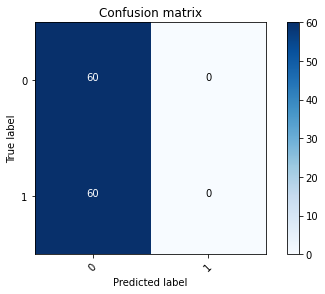

2022-08-09 15:26:13 - [Epoch Train: 1] loss: 0.7080, auc: 0.4653, acc: 0.4953, time: 97.00 s            
2022-08-09 15:26:13 - [Epoch Valid: 1] loss: 0.6923, auc: 0.5667, acc: 0.5000, time: 9.00 s
2022-08-09 15:26:13 - acc improved from 0.0000 to 0.5000. Saved model to '../RSNA-BTC-Datasets/out_models/TunAIResNet-SO-KLF-m_Aug09_15-24-26/TunAIResNet-SO-KLF-m-e1-loss0.692-acc0.500-auc0.567.pth'


  1%|▎                                       | 1/150 [01:47<4:26:00, 107.11s/it]

2022-08-09 15:26:13 - EPOCH: 2
2022-08-09 15:26:16 - Train Step 10/426, train_loss: 0.6759
2022-08-09 15:26:18 - Train Step 20/426, train_loss: 0.6743
2022-08-09 15:26:20 - Train Step 30/426, train_loss: 0.6796
2022-08-09 15:26:22 - Train Step 40/426, train_loss: 0.6653
2022-08-09 15:26:25 - Train Step 50/426, train_loss: 0.6688
2022-08-09 15:26:27 - Train Step 60/426, train_loss: 0.6774
2022-08-09 15:26:29 - Train Step 70/426, train_loss: 0.6686
2022-08-09 15:26:32 - Train Step 80/426, train_loss: 0.6729
2022-08-09 15:26:34 - Train Step 90/426, train_loss: 0.6878
2022-08-09 15:26:36 - Train Step 100/426, train_loss: 0.6823
2022-08-09 15:26:38 - Train Step 110/426, train_loss: 0.6797
2022-08-09 15:26:41 - Train Step 120/426, train_loss: 0.6810
2022-08-09 15:26:43 - Train Step 130/426, train_loss: 0.6859
2022-08-09 15:26:45 - Train Step 140/426, train_loss: 0.6875
2022-08-09 15:26:48 - Train Step 150/426, train_loss: 0.6905
2022-08-09 15:26:50 - Train Step 160/426, train_loss: 0.6893
20

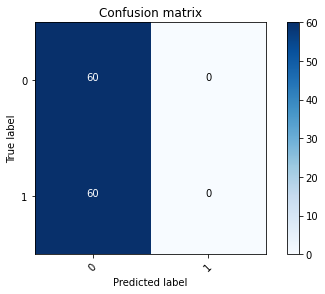

2022-08-09 15:28:01 - [Epoch Train: 2] loss: 0.6961, auc: 0.5384, acc: 0.5141, time: 97.00 s            
2022-08-09 15:28:01 - [Epoch Valid: 2] loss: 0.6912, auc: 0.5453, acc: 0.5000, time: 9.00 s
2022-08-09 15:28:01 - acc improved from 0.5000 to 0.5000. Saved model to '../RSNA-BTC-Datasets/out_models/TunAIResNet-SO-KLF-m_Aug09_15-24-26/TunAIResNet-SO-KLF-m-e2-loss0.691-acc0.500-auc0.545.pth'


  1%|▌                                       | 2/150 [03:34<4:25:02, 107.45s/it]

2022-08-09 15:28:01 - EPOCH: 3
2022-08-09 15:28:03 - Train Step 10/426, train_loss: 0.6946
2022-08-09 15:28:06 - Train Step 20/426, train_loss: 0.7031
2022-08-09 15:28:08 - Train Step 30/426, train_loss: 0.6966
2022-08-09 15:28:10 - Train Step 40/426, train_loss: 0.7033
2022-08-09 15:28:12 - Train Step 50/426, train_loss: 0.6946
2022-08-09 15:28:15 - Train Step 60/426, train_loss: 0.6943
2022-08-09 15:28:17 - Train Step 70/426, train_loss: 0.7079
2022-08-09 15:28:19 - Train Step 80/426, train_loss: 0.7052
2022-08-09 15:28:22 - Train Step 90/426, train_loss: 0.7033
2022-08-09 15:28:24 - Train Step 100/426, train_loss: 0.7004
2022-08-09 15:28:26 - Train Step 110/426, train_loss: 0.7016
2022-08-09 15:28:29 - Train Step 120/426, train_loss: 0.7012
2022-08-09 15:28:31 - Train Step 130/426, train_loss: 0.7013
2022-08-09 15:28:33 - Train Step 140/426, train_loss: 0.7000
2022-08-09 15:28:35 - Train Step 150/426, train_loss: 0.6977
2022-08-09 15:28:38 - Train Step 160/426, train_loss: 0.7006
20

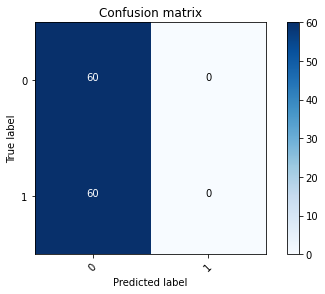

2022-08-09 15:29:49 - [Epoch Train: 3] loss: 0.6965, auc: 0.5166, acc: 0.4883, time: 98.00 s            
2022-08-09 15:29:49 - [Epoch Valid: 3] loss: 0.6952, auc: 0.5883, acc: 0.5000, time: 9.00 s
2022-08-09 15:29:49 - acc improved from 0.5000 to 0.5000. Saved model to '../RSNA-BTC-Datasets/out_models/TunAIResNet-SO-KLF-m_Aug09_15-24-26/TunAIResNet-SO-KLF-m-e3-loss0.695-acc0.500-auc0.588.pth'


  2%|▊                                       | 3/150 [05:22<4:23:48, 107.68s/it]

2022-08-09 15:29:49 - EPOCH: 4
2022-08-09 15:29:51 - Train Step 10/426, train_loss: 0.6822
2022-08-09 15:29:53 - Train Step 20/426, train_loss: 0.6952
2022-08-09 15:29:56 - Train Step 30/426, train_loss: 0.6940
2022-08-09 15:29:58 - Train Step 40/426, train_loss: 0.6756
2022-08-09 15:30:00 - Train Step 50/426, train_loss: 0.6866
2022-08-09 15:30:03 - Train Step 60/426, train_loss: 0.6887
2022-08-09 15:30:05 - Train Step 70/426, train_loss: 0.6949
2022-08-09 15:30:07 - Train Step 80/426, train_loss: 0.6933
2022-08-09 15:30:10 - Train Step 90/426, train_loss: 0.6897
2022-08-09 15:30:12 - Train Step 100/426, train_loss: 0.6870
2022-08-09 15:30:14 - Train Step 110/426, train_loss: 0.6906
2022-08-09 15:30:16 - Train Step 120/426, train_loss: 0.6833
2022-08-09 15:30:19 - Train Step 130/426, train_loss: 0.6848
2022-08-09 15:30:21 - Train Step 140/426, train_loss: 0.6871
2022-08-09 15:30:23 - Train Step 150/426, train_loss: 0.6860
2022-08-09 15:30:26 - Train Step 160/426, train_loss: 0.6887
20

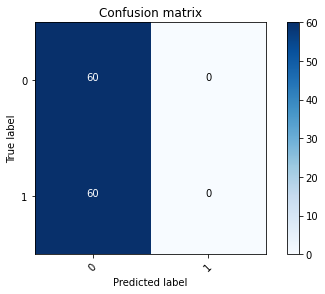

2022-08-09 15:31:37 - [Epoch Train: 4] loss: 0.6895, auc: 0.5481, acc: 0.5000, time: 98.00 s            
2022-08-09 15:31:37 - [Epoch Valid: 4] loss: 0.6983, auc: 0.5906, acc: 0.5000, time: 9.00 s
2022-08-09 15:31:37 - acc improved from 0.5000 to 0.5000. Saved model to '../RSNA-BTC-Datasets/out_models/TunAIResNet-SO-KLF-m_Aug09_15-24-26/TunAIResNet-SO-KLF-m-e4-loss0.698-acc0.500-auc0.591.pth'


  3%|█                                       | 4/150 [07:10<4:22:27, 107.86s/it]

2022-08-09 15:31:37 - EPOCH: 5
2022-08-09 15:31:39 - Train Step 10/426, train_loss: 0.7122
2022-08-09 15:31:42 - Train Step 20/426, train_loss: 0.6899
2022-08-09 15:31:44 - Train Step 30/426, train_loss: 0.7058
2022-08-09 15:31:46 - Train Step 40/426, train_loss: 0.7132
2022-08-09 15:31:49 - Train Step 50/426, train_loss: 0.7122
2022-08-09 15:31:51 - Train Step 60/426, train_loss: 0.7012
2022-08-09 15:31:53 - Train Step 70/426, train_loss: 0.7080
2022-08-09 15:31:55 - Train Step 80/426, train_loss: 0.7072
2022-08-09 15:31:58 - Train Step 90/426, train_loss: 0.7021
2022-08-09 15:32:00 - Train Step 100/426, train_loss: 0.6936
2022-08-09 15:32:02 - Train Step 110/426, train_loss: 0.6992
2022-08-09 15:32:05 - Train Step 120/426, train_loss: 0.6972
2022-08-09 15:32:07 - Train Step 130/426, train_loss: 0.6932
2022-08-09 15:32:09 - Train Step 140/426, train_loss: 0.6947
2022-08-09 15:32:12 - Train Step 150/426, train_loss: 0.6910
2022-08-09 15:32:14 - Train Step 160/426, train_loss: 0.6884
20

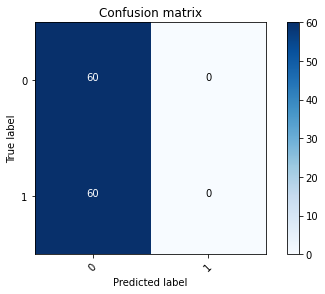

2022-08-09 15:33:25 - [Epoch Train: 5] loss: 0.6880, auc: 0.5666, acc: 0.5047, time: 98.00 s            
2022-08-09 15:33:25 - [Epoch Valid: 5] loss: 0.6865, auc: 0.5881, acc: 0.5000, time: 9.00 s
2022-08-09 15:33:25 - acc improved from 0.5000 to 0.5000. Saved model to '../RSNA-BTC-Datasets/out_models/TunAIResNet-SO-KLF-m_Aug09_15-24-26/TunAIResNet-SO-KLF-m-e5-loss0.687-acc0.500-auc0.588.pth'


  3%|█▎                                      | 5/150 [08:58<4:20:49, 107.93s/it]

2022-08-09 15:33:25 - EPOCH: 6
2022-08-09 15:33:27 - Train Step 10/426, train_loss: 0.7100
2022-08-09 15:33:30 - Train Step 20/426, train_loss: 0.6863
2022-08-09 15:33:32 - Train Step 30/426, train_loss: 0.6819
2022-08-09 15:33:34 - Train Step 40/426, train_loss: 0.6789
2022-08-09 15:33:37 - Train Step 50/426, train_loss: 0.6790
2022-08-09 15:33:39 - Train Step 60/426, train_loss: 0.6772
2022-08-09 15:33:41 - Train Step 70/426, train_loss: 0.6783
2022-08-09 15:33:43 - Train Step 80/426, train_loss: 0.6792
2022-08-09 15:33:46 - Train Step 90/426, train_loss: 0.6800
2022-08-09 15:33:48 - Train Step 100/426, train_loss: 0.6818
2022-08-09 15:33:50 - Train Step 110/426, train_loss: 0.6797
2022-08-09 15:33:53 - Train Step 120/426, train_loss: 0.6777
2022-08-09 15:33:55 - Train Step 130/426, train_loss: 0.6817
2022-08-09 15:33:57 - Train Step 140/426, train_loss: 0.6785
2022-08-09 15:34:00 - Train Step 150/426, train_loss: 0.6792
2022-08-09 15:34:02 - Train Step 160/426, train_loss: 0.6797
20

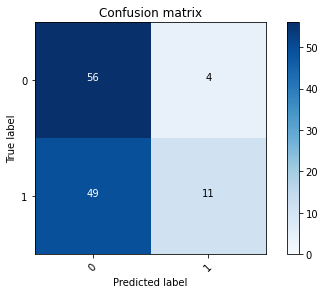

2022-08-09 15:35:13 - [Epoch Train: 6] loss: 0.6831, auc: 0.5827, acc: 0.5094, time: 98.00 s            
2022-08-09 15:35:13 - [Epoch Valid: 6] loss: 0.6926, auc: 0.5786, acc: 0.5583, time: 9.00 s
2022-08-09 15:35:13 - acc improved from 0.5000 to 0.5583. Saved model to '../RSNA-BTC-Datasets/out_models/TunAIResNet-SO-KLF-m_Aug09_15-24-26/TunAIResNet-SO-KLF-m-e6-loss0.693-acc0.558-auc0.579.pth'


  4%|█▌                                      | 6/150 [10:47<4:19:17, 108.04s/it]

2022-08-09 15:35:13 - EPOCH: 7
2022-08-09 15:35:16 - Train Step 10/426, train_loss: 0.5646
2022-08-09 15:35:18 - Train Step 20/426, train_loss: 0.6363
2022-08-09 15:35:20 - Train Step 30/426, train_loss: 0.6562
2022-08-09 15:35:23 - Train Step 40/426, train_loss: 0.6606
2022-08-09 15:35:25 - Train Step 50/426, train_loss: 0.6704
2022-08-09 15:35:27 - Train Step 60/426, train_loss: 0.6726
2022-08-09 15:35:29 - Train Step 70/426, train_loss: 0.6762
2022-08-09 15:35:32 - Train Step 80/426, train_loss: 0.6728
2022-08-09 15:35:34 - Train Step 90/426, train_loss: 0.6710
2022-08-09 15:35:36 - Train Step 100/426, train_loss: 0.6712
2022-08-09 15:35:39 - Train Step 110/426, train_loss: 0.6731
2022-08-09 15:35:41 - Train Step 120/426, train_loss: 0.6738
2022-08-09 15:35:43 - Train Step 130/426, train_loss: 0.6740
2022-08-09 15:35:46 - Train Step 140/426, train_loss: 0.6706
2022-08-09 15:35:48 - Train Step 150/426, train_loss: 0.6706
2022-08-09 15:35:50 - Train Step 160/426, train_loss: 0.6710
20

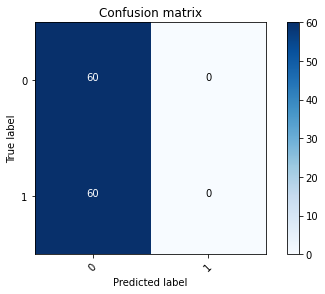

2022-08-09 15:37:01 - [Epoch Train: 7] loss: 0.6735, auc: 0.6296, acc: 0.5141, time: 98.00 s            
2022-08-09 15:37:01 - [Epoch Valid: 7] loss: 0.7056, auc: 0.5978, acc: 0.5000, time: 9.00 s


  5%|█▊                                      | 7/150 [12:35<4:17:31, 108.05s/it]

2022-08-09 15:37:01 - EPOCH: 8
2022-08-09 15:37:04 - Train Step 10/426, train_loss: 0.5831
2022-08-09 15:37:06 - Train Step 20/426, train_loss: 0.6274
2022-08-09 15:37:08 - Train Step 30/426, train_loss: 0.6328
2022-08-09 15:37:11 - Train Step 40/426, train_loss: 0.6284
2022-08-09 15:37:13 - Train Step 50/426, train_loss: 0.6427
2022-08-09 15:37:15 - Train Step 60/426, train_loss: 0.6447
2022-08-09 15:37:18 - Train Step 70/426, train_loss: 0.6375
2022-08-09 15:37:20 - Train Step 80/426, train_loss: 0.6402
2022-08-09 15:37:22 - Train Step 90/426, train_loss: 0.6461
2022-08-09 15:37:25 - Train Step 100/426, train_loss: 0.6514
2022-08-09 15:37:27 - Train Step 110/426, train_loss: 0.6517
2022-08-09 15:37:29 - Train Step 120/426, train_loss: 0.6566
2022-08-09 15:37:31 - Train Step 130/426, train_loss: 0.6570
2022-08-09 15:37:34 - Train Step 140/426, train_loss: 0.6556
2022-08-09 15:37:36 - Train Step 150/426, train_loss: 0.6573
2022-08-09 15:37:38 - Train Step 160/426, train_loss: 0.6572
20

  5%|█▊                                      | 7/150 [13:21<4:32:52, 114.49s/it]


KeyboardInterrupt: 

In [12]:
print(info)
m_modelfile = train_mri_type(m_model, device, info, epochs=150, pat=30, 
                       train_loader=train_loader, valid_loader=val_loader)
##m_modelfile = train_mri_type(m_model, device, info, epochs=150, pat=30, 
##                       train_loader=m_train_loader, valid_loader=m_val_loader)

#m_modelfile = train_mri_type(m_model, device, info, epochs=150, pat=30, 
#                       train_loader=n_train_loader, valid_loader=n_val_loader)

In [16]:
print(m_modelfile)

../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug05_22-07-19/RSNAClassifierSingle3D-DW-SO-KLF-e12-loss1.462-acc0.525-auc0.579.pth


In [9]:
"""
folders_list = [
    "RSNAClassifierSingle3D-DW-SO-KLF_Jan27_19-25-03",
    "RSNAAlternativeClassifierSingle2D-DW-SO-KLF_Jul07_17-25-17",
    "RSNAClassifierSingle3D-DW-SO_Jan27_10-46-07",
]
"""

folders_list = [
    #"RSNAClassifierSingle3D-DW-SO-KLF_Jul10_21-39-50", #m
    "RSNAClassifierSingle3D-DW-SO-KLF_Aug05_22-07-19", #m
    "RSNAClassifierSingle3D-DW-SO_Aug03_18-40-51", #m flair
    "RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30", #m t1w
    "RSNAClassifierSingle3D-DW-SO-KLF_Aug05_17-47-49", #n
    "RSNAClassifierSingle3D-DW-SO-KLF_Aug05_18-26-58", #f
    "RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47", #fn
    "RSNAAlternativeClassifierSingle2D-DW-SO-KLF_Aug02_11-12-02", #m
    "RSNAAlternativeClassifierSingle2D-DW-SO-KLF_Aug05_20-21-59", #n
    "RSNAAlternativeClassifierSingle2D-DW-SO-KLF_Aug02_12-17-49", #f
    "RSNAAlternativeClassifierSingle2D-DW-SO-KLF_Aug02_12-58-14" #fn 
]
"""
choice = 0
model_common_path = "../RSNA-BTC-Datasets/out_models/"
model_folder = model_common_path + folders_list[choice]

model_basefile, info = get_best_model(model_folder)
m_modelfile = model_folder + "/" + model_basefile
transform = None
size = len(info["mri_types"])
sel_slices = 1 if choice == 1 else None
chosen_net = "alt" if choice == 1 else "sim"

#m_modelfile = m_modelfile_3d
print(m_modelfile)
print(info)
"""
print(folders_list)

['RSNAClassifierSingle3D-DW-SO-KLF_Aug05_22-07-19', 'RSNAClassifierSingle3D-DW-SO_Aug03_18-40-51', 'RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30', 'RSNAClassifierSingle3D-DW-SO-KLF_Aug05_17-47-49', 'RSNAClassifierSingle3D-DW-SO-KLF_Aug05_18-26-58', 'RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47', 'RSNAAlternativeClassifierSingle2D-DW-SO-KLF_Aug02_11-12-02', 'RSNAAlternativeClassifierSingle2D-DW-SO-KLF_Aug05_20-21-59', 'RSNAAlternativeClassifierSingle2D-DW-SO-KLF_Aug02_12-17-49', 'RSNAAlternativeClassifierSingle2D-DW-SO-KLF_Aug02_12-58-14']


In [7]:
rc = pd.read_csv("RisultatoClassificazione.csv", dtype={"ID": object})
print(rc)
fixed_rc = rc.loc[rc["TUMORE"] == 0]
h_ids = fixed_rc["ID"]
h_preds = fixed_rc["PRED"]
h_probs = fixed_rc["PROB_1"]#[item["PROB_0"] for item in fixed_rc if item["PRED"] == 0 else item["PROB_1"]]

test_rc = fixed_rc.sample(frac=0.2)
h_ids = list(test_rc["ID"])
h_ids = [idx.zfill(5) for idx in h_ids]
h_y = list(np.zeros(len(h_ids)))
h_preds = list(test_rc["PRED"])
h_probs = list(test_rc["PROB_1"])#[item["PROB_0"] for item in fixed_rc if item["PRED"] == 0 else item["PROB_1"]]

print(h_ids)
print(h_y)
print(h_preds)
print(h_probs)

      ID  TUMORE  PRED    PROB_0    PROB_1
0      2       1     0  1.000000  0.000000
1     72       1     1  0.048780  0.951220
2     88       1     1  0.000000  1.000000
3    109       1     0  1.000000  0.000000
4    142       1     0  1.000000  0.000000
..   ...     ...   ...       ...       ...
568  636       0     0  0.846154  0.153846
569  667       0     1  0.000000  1.000000
570  703       0     1  0.000000  1.000000
571  744       0     1  0.000000  1.000000
572  806       0     1  0.000000  1.000000

[573 rows x 5 columns]
['00533', '00540', '00341', '00149', '00418', '00788', '00288', '00645', '00496', '00049', '00339', '00620', '00389', '00378', '00298', '00709', '00555', '00032', '00688', '00575', '00349', '00432', '00241', '00377', '00407']
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0]
[0.0, 1.0, 0.0, 0.16666666666666

../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug05_22-07-19/RSNAClassifierSingle3D-DW-SO-KLF-e12-loss1.462-acc0.525-auc0.579.pth
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'm', 'val_origin': 'm', 'net': 'RSNAClassifierSingle3D'}
Type: KLF
2022-08-06 10:44:26 - Train/Val datasets size: 270
2022-08-06 10:44:26 - Train/Val datasets size: 303
2022-08-06 10:44:26 - Train/Val datasets size: 231
2022-08-06 10:44:26 - Train/Val datasets size: 285
2022-08-06 10:44:26 - Train/Val datasets size: 170
2022-08-06 10:44:26 - Train/Val datasets size: 121
2022-08-06 10:44:26 - Train/Val datasets size: 129
2022-08-06 10:44:26 - Train/Val datasets size: 273
2022-08-06 10:44:26 - Train/Val datasets size: 141
Length of concatenated

2022-08-06 10:44:26 - (T) Train validation test splitted: 400 114 56
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404, 451, 455, 34

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

2022-08-06 10:44:26 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

2022-08-06 10:44:26 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

Predictions: 35 without tumor, 25 with tumor
Prediction AUC: 0.6744
Prediction Accuracy: 0.6833
Prediction Specificity: 0.7667
Prediction Sensitivity: 0.6000
Prediction Precision: 0.7200
Test set: n (B)
2022-08-06 10:44:31 - Predict: ../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug05_22-07-19/RSNAClassifierSingle3D-DW-SO-KLF-e12-loss1.462-acc0.525-auc0.579.pth 546
Dataset: Labeled Test Set
             BraTS21ID  MGMT_real_value  MGMT_value
9   UPENN-GBM-00093_11                0           1
6   UPENN-GBM-00122_21                0           1
24  UPENN-GBM-00134_21                0           0
52  UPENN-GBM-00139_11                0           1
53  UPENN-GBM-00140_21                0           0
5   UPENN-GBM-00141_11                0           1
1   UPENN-GBM-00302_11                1           0
8   UPENN-GBM-00302_11                1           0
23  UPENN-GBM-00304_11                0           1
10  UPENN-GBM-00316_11                0           1
49  UPENN-GBM-0

2022-08-06 10:44:37 - (T) Train validation test splitted: 400 114 56
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404, 451, 455, 34

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

2022-08-06 10:44:37 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

2022-08-06 10:44:37 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

Predictions: 48 without tumor, 12 with tumor
Prediction AUC: 0.3744
Prediction Accuracy: 0.4667
Prediction Specificity: 0.7667
Prediction Sensitivity: 0.1667
Prediction Precision: 0.4167
Test set: n (B)
2022-08-06 10:44:43 - Predict: ../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_18-40-51/RSNAClassifierSingle3D-DW-SO-e42-loss1.143-acc0.750-auc0.760.pth 340
Dataset: Labeled Test Set
             BraTS21ID  MGMT_real_value  MGMT_value
18  UPENN-GBM-00131_11                1           1
27  UPENN-GBM-00133_11                0           0
0   UPENN-GBM-00136_11                0           0
12  UPENN-GBM-00143_11                0           0
28  UPENN-GBM-00148_21                0           0
9   UPENN-GBM-00260_11                1           1
5   UPENN-GBM-00263_11                1           0
32  UPENN-GBM-00302_11                1           1
6   UPENN-GBM-00350_11                1           1
13  UPENN-GBM-00354_11                0           1
3   UPENN-GBM-00363_11 

2022-08-06 10:44:47 - (T) Train validation test splitted: 400 114 56
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404, 451, 455, 34

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

2022-08-06 10:44:47 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

2022-08-06 10:44:47 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

Prob:
[array([0.39712963], dtype=float32), array([0.3914341], dtype=float32), array([0.43703276], dtype=float32), array([0.8190378], dtype=float32), array([0.10396442], dtype=float32), array([0.25746828], dtype=float32), array([0.12925991], dtype=float32), array([0.2042029], dtype=float32), array([0.42282018], dtype=float32), array([0.7306867], dtype=float32), array([0.0510505], dtype=float32), array([0.31638327], dtype=float32), array([0.06558501], dtype=float32), array([0.15813759], dtype=float32), array([0.8459114], dtype=float32), array([0.27189958], dtype=float32), array([0.42074278], dtype=float32), array([0.05319233], dtype=float32), array([0.35430396], dtype=float32), array([0.24112119], dtype=float32), array([0.03813113], dtype=float32), array([0.2906988], dtype=float32), array([0.16062905], dtype=float32), array([0.02295735], dtype=float32), array([0.64211416], dtype=float32), array([0.00400143], dtype=float32), array([0.36367965], dtype=float32), array([0.18112954], dtype=fl

2022-08-06 10:44:58 - (T) Train validation test splitted: 400 114 56
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404, 451, 455, 34

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

2022-08-06 10:44:58 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

2022-08-06 10:44:58 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

Predictions: 40 without tumor, 20 with tumor
Prediction AUC: 0.5667
Prediction Accuracy: 0.5000
Prediction Specificity: 0.6667
Prediction Sensitivity: 0.3333
Prediction Precision: 0.5000
Test set: n (B)
2022-08-06 10:45:03 - Predict: ../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug05_17-47-49/RSNAClassifierSingle3D-DW-SO-KLF-e6-loss0.449-acc0.852-auc0.902.pth 546
Dataset: Labeled Test Set
             BraTS21ID  MGMT_real_value  MGMT_value
9   UPENN-GBM-00093_11                0           0
43  UPENN-GBM-00115_11                1           1
6   UPENN-GBM-00122_21                0           0
2   UPENN-GBM-00129_11                0           0
25  UPENN-GBM-00130_21                1           1
14  UPENN-GBM-00133_11                0           0
24  UPENN-GBM-00134_21                0           0
53  UPENN-GBM-00140_21                0           0
0   UPENN-GBM-00269_11                1           1
8   UPENN-GBM-00302_11                1           0
23  UPENN-GBM-00

2022-08-06 10:45:08 - (T) Train validation test splitted: 400 114 56
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404, 451, 455, 34

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

2022-08-06 10:45:08 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

2022-08-06 10:45:08 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

Prob:
[array([0.00518321], dtype=float32), array([0.9999838], dtype=float32), array([8.876609e-06], dtype=float32), array([0.20512293], dtype=float32), array([0.49142253], dtype=float32), array([0.00010678], dtype=float32), array([0.00011721], dtype=float32), array([0.16730039], dtype=float32), array([0.99631363], dtype=float32), array([1.33445e-05], dtype=float32), array([0.00011167], dtype=float32), array([0.99999976], dtype=float32), array([8.6423347e-07], dtype=float32), array([5.0114404e-06], dtype=float32), array([0.00077222], dtype=float32), array([0.12643513], dtype=float32), array([0.8034477], dtype=float32), array([0.00012132], dtype=float32), array([1.092604e-05], dtype=float32), array([0.00445874], dtype=float32), array([0.00052506], dtype=float32), array([0.9999753], dtype=float32), array([0.9999963], dtype=float32), array([7.157228e-05], dtype=float32), array([0.99999344], dtype=float32), array([0.41975436], dtype=float32), array([0.01098815], dtype=float32), array([0.000

/home/salvatorecapuozzo/.local/lib/python3.9/site-packages/sklearn/utils/validation.py:746: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  array = np.asarray(array, order=order, dtype=dtype)
/home/salvatorecapuozzo/.local/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:546: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_score = check_array(y_score, ensure_2d=False)


Dataset: Labeled Test Set
             BraTS21ID  MGMT_real_value  MGMT_value
42  UPENN-GBM-00088_11                0           0
9   UPENN-GBM-00093_11                0           1
46  UPENN-GBM-00095_11                1           1
30  UPENN-GBM-00098_11                1           1
27  UPENN-GBM-00122_21                0           0
6   UPENN-GBM-00122_21                0           0
37  UPENN-GBM-00131_11                1           1
24  UPENN-GBM-00134_21                0           0
12  UPENN-GBM-00134_21                0           0
53  UPENN-GBM-00140_21                0           0
5   UPENN-GBM-00140_21                0           0
2   UPENN-GBM-00151_11                0           1
8   UPENN-GBM-00302_11                1           1
31  UPENN-GBM-00304_11                0           1
23  UPENN-GBM-00304_11                0           1
49  UPENN-GBM-00344_11                1           1
35  UPENN-GBM-00358_11                1           0
26  UPENN-GBM-00360_11                

2022-08-06 10:45:17 - (T) Train validation test splitted: 400 114 56
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404, 451, 455, 34

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

2022-08-06 10:45:17 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

2022-08-06 10:45:17 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

/home/salvatorecapuozzo/.local/lib/python3.9/site-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


Predictions: 24 without tumor, 36 with tumor
Prediction AUC: 0.9178
Prediction Accuracy: 0.8333
Prediction Specificity: 0.7333
Prediction Sensitivity: 0.9333
Prediction Precision: 0.7778
Test set: n (B)
2022-08-06 10:45:23 - Predict: ../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e24-loss1.105-acc0.757-auc0.838.pth 546
Dataset: Labeled Test Set
             BraTS21ID  MGMT_real_value  MGMT_value
9   UPENN-GBM-00093_11                0           0
37  UPENN-GBM-00115_11                1           1
6   UPENN-GBM-00122_21                0           0
24  UPENN-GBM-00134_21                0           0
53  UPENN-GBM-00140_21                0           0
42  UPENN-GBM-00150_11                0           0
30  UPENN-GBM-00263_11                1           1
8   UPENN-GBM-00302_11                1           1
23  UPENN-GBM-00304_11                0           0
31  UPENN-GBM-00312_21                0           0
49  UPENN-GBM-0

2022-08-06 10:45:27 - (T) Train validation test splitted: 400 114 56
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404, 451, 455, 34

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

2022-08-06 10:45:27 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

2022-08-06 10:45:27 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

Prob:
[array([0.8533188], dtype=float32), array([0.4414379], dtype=float32), array([0.6648956], dtype=float32), array([0.51494616], dtype=float32), array([0.6944147], dtype=float32), array([0.7443719], dtype=float32), array([0.8481329], dtype=float32), array([0.8346447], dtype=float32), array([0.57842875], dtype=float32), array([0.75470036], dtype=float32), array([0.59493047], dtype=float32), array([0.16966936], dtype=float32), array([0.3840887], dtype=float32), array([0.6179401], dtype=float32), array([0.6801981], dtype=float32), array([0.54808426], dtype=float32), array([0.61961967], dtype=float32), array([0.28307483], dtype=float32), array([0.3852767], dtype=float32), array([0.25003514], dtype=float32), array([0.6473176], dtype=float32), array([0.42476994], dtype=float32), array([0.5958259], dtype=float32), array([0.52354634], dtype=float32), array([0.90309197], dtype=float32), array([0.3587757], dtype=float32), array([0.66949403], dtype=float32), array([0.24291919], dtype=float32),

Length of concatenated dataset: 340
2022-08-06 10:45:34 - Train/Val datasets size: 340
Length of concatenated dataset: 546
2022-08-06 10:45:34 - Train/Val datasets size: 546
Type: FLAIR
2022-08-06 10:45:34 - Train/Val datasets size: 270
2022-08-06 10:45:34 - Train/Val datasets size: 303
2022-08-06 10:45:34 - Train/Val datasets size: 231
2022-08-06 10:45:34 - Train/Val datasets size: 285
2022-08-06 10:45:34 - Train/Val datasets size: 170
2022-08-06 10:45:34 - Train/Val datasets size: 121
Type: T1w
2022-08-06 10:45:34 - Train/Val datasets size: 270
2022-08-06 10:45:34 - Train/Val datasets size: 303
2022-08-06 10:45:34 - Train/Val datasets size: 231
2022-08-06 10:45:34 - Train/Val datasets size: 285
2022-08-06 10:45:34 - Train/Val datasets size: 170
2022-08-06 10:45:34 - Train/Val datasets size: 121
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fc69546a550>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fc65375d520>, 'f_dataset_0': <utils.dataset_utils.Datas

2022-08-06 10:45:34 - (T) Train validation test splitted: 400 114 56
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404, 451, 455, 34

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

2022-08-06 10:45:34 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

2022-08-06 10:45:34 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

Prob:
[array([0.0198971], dtype=float32), array([0.24830973], dtype=float32), array([0.93274164], dtype=float32), array([0.00675198], dtype=float32), array([0.61417776], dtype=float32), array([0.11990701], dtype=float32), array([0.5824103], dtype=float32), array([0.00211313], dtype=float32), array([0.21665005], dtype=float32), array([0.99836105], dtype=float32), array([6.764211e-06], dtype=float32), array([0.26307097], dtype=float32), array([0.9718855], dtype=float32), array([0.98989046], dtype=float32), array([0.00131103], dtype=float32), array([0.0049685], dtype=float32), array([0.9996613], dtype=float32), array([0.99987626], dtype=float32), array([0.57289684], dtype=float32), array([0.99784493], dtype=float32), array([0.9046516], dtype=float32), array([0.6660055], dtype=float32), array([0.53274786], dtype=float32), array([0.8000808], dtype=float32), array([0.99975735], dtype=float32), array([0.9873006], dtype=float32), array([0.8250991], dtype=float32), array([0.34810612], dtype=flo

2022-08-06 10:45:41 - Train/Val datasets size: 303
2022-08-06 10:45:41 - Train/Val datasets size: 231
2022-08-06 10:45:41 - Train/Val datasets size: 285
2022-08-06 10:45:41 - Train/Val datasets size: 170
2022-08-06 10:45:41 - Train/Val datasets size: 121
2022-08-06 10:45:41 - Train/Val datasets size: 129
2022-08-06 10:45:41 - Train/Val datasets size: 273
2022-08-06 10:45:41 - Train/Val datasets size: 141
Length of concatenated dataset: 340
2022-08-06 10:45:41 - Train/Val datasets size: 340
Length of concatenated dataset: 546
2022-08-06 10:45:41 - Train/Val datasets size: 546
Type: FLAIR
2022-08-06 10:45:41 - Train/Val datasets size: 270
2022-08-06 10:45:41 - Train/Val datasets size: 303
2022-08-06 10:45:41 - Train/Val datasets size: 231
2022-08-06 10:45:41 - Train/Val datasets size: 285
2022-08-06 10:45:41 - Train/Val datasets size: 170
2022-08-06 10:45:41 - Train/Val datasets size: 121
Type: T1w
2022-08-06 10:45:41 - Train/Val datasets size: 270
2022-08-06 10:45:41 - Train/Val dataset

2022-08-06 10:45:41 - (T) Train validation test splitted: 400 114 56
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404, 451, 455, 34

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

2022-08-06 10:45:41 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

2022-08-06 10:45:41 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

Prob:
[array([0.9642223], dtype=float32), array([0.93831843], dtype=float32), array([0.48989126], dtype=float32), array([0.62126845], dtype=float32), array([0.93983203], dtype=float32), array([0.21013436], dtype=float32), array([0.23484898], dtype=float32), array([0.02460635], dtype=float32), array([0.99481755], dtype=float32), array([0.0109434], dtype=float32), array([0.21219863], dtype=float32), array([0.23766455], dtype=float32), array([0.01870711], dtype=float32), array([0.10574725], dtype=float32), array([0.13801026], dtype=float32), array([0.43042815], dtype=float32), array([0.13483284], dtype=float32), array([0.08505524], dtype=float32), array([0.19697407], dtype=float32), array([0.36739436], dtype=float32), array([0.23554605], dtype=float32), array([0.93885845], dtype=float32), array([0.98960996], dtype=float32), array([0.1486025], dtype=float32), array([0.96724486], dtype=float32), array([0.8752479], dtype=float32), array([0.01270448], dtype=float32), array([0.16752522], dtype

/home/salvatorecapuozzo/.local/lib/python3.9/site-packages/sklearn/utils/validation.py:746: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  array = np.asarray(array, order=order, dtype=dtype)
/home/salvatorecapuozzo/.local/lib/python3.9/site-packages/sklearn/metrics/_ranking.py:546: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  y_score = check_array(y_score, ensure_2d=False)


KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
Dataset: Labeled Test Set
             BraTS21ID  MGMT_real_value  MGMT_value
12  UPENN-GBM-00022_11                0           0
9   UPENN-GBM-00093_11                0           1
6   UPENN-GBM-00122_21                0           0
25  UPENN-GBM-00128_21                1           1
14  UPENN-GBM-00134_11                0           1
23  UPENN-GBM-00134_21                0           1
2   UPENN-GBM-00140_21                0           1
8   UPENN-GBM-00302_11                1           1
22  UPENN-GBM-00304_11                0           0
46  UPENN-GBM-00344_11                1           1
43  UPENN-GBM-00351_11                1           1
5   UPENN-GBM-00354_11                0           1
34  UPENN-GBM-00358_11                1           0
24  UPENN-GBM-00360_11                1           1
44  UPENN-GBM-00378_11                1           1
18  UPENN-GBM-00392_11                1           1
38  UPENN-GBM-00395_11    

2022-08-06 10:45:48 - (T) Train validation test splitted: 400 114 56
[33, 190, 245, 129, 253, 21, 237, 146, 16, 204, 75, 173, 135, 209, 179, 4, 96, 188, 61, 67, 52, 66, 26, 110, 233, 124, 268, 40, 13, 107, 145, 166, 3, 159, 24, 30, 252, 213, 60, 56, 248, 157, 46, 19, 212, 153, 54, 227, 80, 51, 2, 196, 104, 150, 86, 10, 168, 58, 41, 14, 50, 194, 123, 62, 158, 187, 130, 246, 154, 43, 221, 138, 254, 181, 149, 112, 207, 98, 180, 93, 171, 162, 36, 113, 0, 94, 95, 223, 69, 49, 48, 85, 270, 141, 23, 249, 143, 78, 100, 131, 228, 271, 6, 68, 84, 170, 121, 140, 214, 240, 234, 239, 91, 241, 257, 11, 119, 102, 35, 57, 169, 65, 1, 120, 226, 186, 42, 105, 132, 244, 17, 38, 133, 53, 164, 217, 128, 34, 28, 183, 114, 203, 163, 151, 202, 31, 232, 127, 185, 250, 260, 32, 167, 142, 236, 147, 29, 177, 216, 99, 82, 269, 175, 79, 197, 243, 208, 115, 148, 266, 72, 77, 25, 165, 81, 261, 174, 263, 39, 193, 88, 70, 87, 242, 211, 9, 195, 251, 192, 117, 47, 172, 413, 531, 485, 274, 430, 285, 426, 404, 451, 455, 34

Type: FLAIR
Length of concatenated dataset: 606
Length of concatenated dataset: 606
Train Idx:
[238, 137, 106, 284, 44, 139, 247, 288, 156, 297, 252, 54, 234, 18, 205, 254, 182, 56, 71, 144, 249, 209, 290, 219, 158, 176, 33, 83, 136, 210, 118, 60, 159, 282, 110, 21, 29, 150, 16, 75, 109, 179, 283, 4, 96, 229, 61, 67, 295, 266, 171, 281, 40, 189, 13, 107, 200, 3, 161, 125, 24, 30, 77, 279, 190, 19, 257, 235, 268, 80, 51, 2, 239, 104, 262, 86, 10, 224, 58, 41, 14, 155, 50, 215, 237, 123, 220, 62, 191, 230, 130, 213, 187, 43, 114, 138, 199, 222, 149, 112, 298, 98, 221, 93, 208, 162, 36, 178, 113, 0, 94, 294, 95, 299, 263, 256, 69, 49, 48, 85, 300, 141, 207, 23, 250, 148, 143, 78, 180, 100, 204, 131, 269, 301, 196, 6, 68, 203, 84, 170, 121, 140, 258, 276, 142, 259, 91, 82, 285, 11, 119, 102, 35, 57, 169, 231, 65, 1, 120, 267, 186, 42, 105, 132, 79, 17, 271, 38, 53, 260, 128, 28, 183, 163, 151, 244, 202, 31, 32, 127, 185, 280, 273, 147, 278, 177, 99, 197, 243, 115, 265, 72, 25, 165, 289, 17

2022-08-06 10:45:48 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

2022-08-06 10:45:48 - (T) Train validation test splitted: 400 114 56
[40, 71, 22, 151, 80, 123, 86, 111, 27, 154, 130, 95, 122, 149, 90, 62, 2, 59, 93, 94, 43, 10, 137, 73, 164, 107, 100, 89, 135, 163, 50, 112, 156, 64, 118, 124, 69, 49, 48, 85, 13, 129, 23, 126, 20, 15, 78, 52, 76, 3, 169, 104, 6, 68, 75, 84, 159, 12, 132, 145, 14, 0, 91, 146, 46, 11, 102, 35, 57, 41, 166, 65, 1, 120, 138, 158, 42, 105, 147, 17, 38, 53, 134, 128, 34, 28, 114, 31, 143, 127, 150, 32, 142, 29, 99, 82, 79, 115, 148, 165, 72, 77, 25, 81, 160, 162, 39, 58, 140, 88, 70, 87, 36, 21, 9, 103, 67, 117, 47, 259, 294, 272, 314, 298, 222, 334, 247, 265, 212, 186, 246, 279, 228, 198, 191, 300, 302, 219, 318, 257, 292, 338, 256, 260, 192, 326, 333, 339, 236, 287, 182, 276, 311, 254, 187, 331, 283, 307, 200, 268, 306, 195, 218, 280, 330, 261, 305, 251, 171, 290, 178, 232, 250, 309, 239, 285, 245, 170, 206, 315, 175, 203, 258, 286, 204, 324, 267, 255, 231, 304, 335, 215, 310, 180, 179, 337, 320, 278, 216, 301, 332, 243

KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
Dataset: Labeled Test Set
             BraTS21ID  MGMT_real_value  MGMT_value
9   UPENN-GBM-00093_11                0           0
49  UPENN-GBM-00117_11                0           0
6   UPENN-GBM-00122_21                0           0
40  UPENN-GBM-00125_11                0           0
44  UPENN-GBM-00131_11                1           1
23  UPENN-GBM-00134_21                0           0
50  UPENN-GBM-00140_21                0           0
30  UPENN-GBM-00141_11                0           0
17  UPENN-GBM-00146_11                0           0
25  UPENN-GBM-00287_11                1           1
8   UPENN-GBM-00302_11                1           1
22  UPENN-GBM-00304_11                0           0
46  UPENN-GBM-00344_11                1           1
41  UPENN-GBM-00350_11                1           1
20  UPENN-GBM-00358_11                1           1
45  UPENN-GBM-00378_11                1           1
1   UPENN-GBM-00380_11    

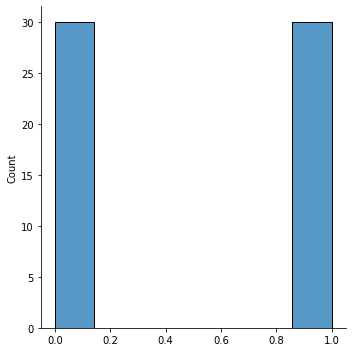

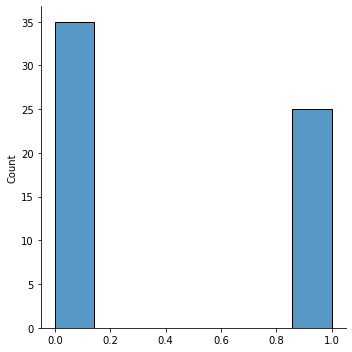

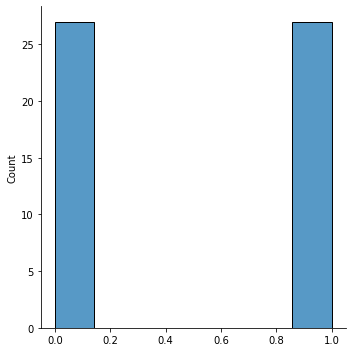

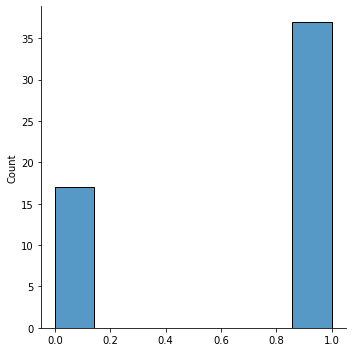

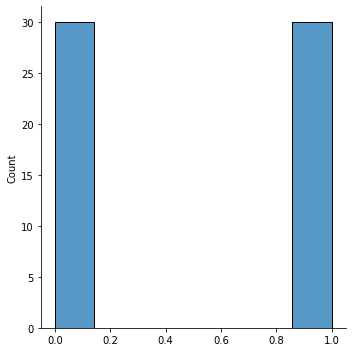

...

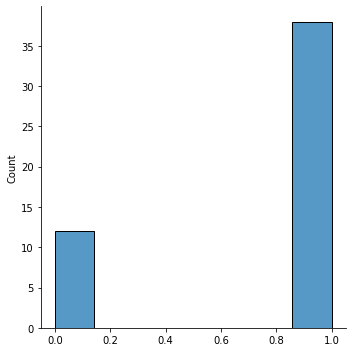

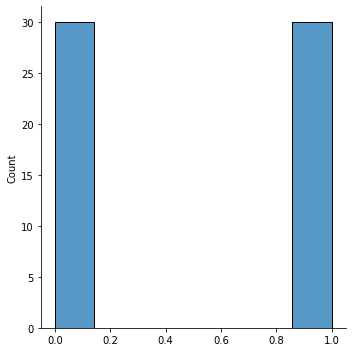

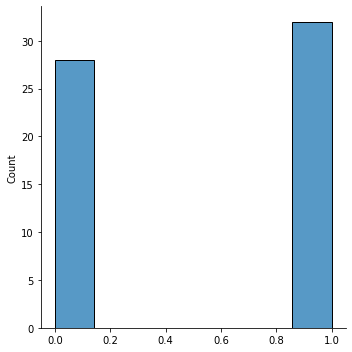

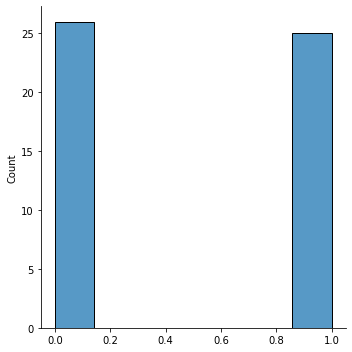

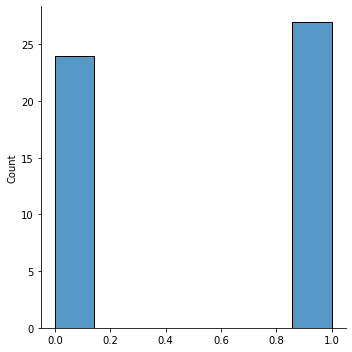

In [19]:
metrics = pd.DataFrame({"model": [], "AUC": [], "acc": [], "spec": [], "sens": [], "prec": []})
for folder in folders_list:
    model_common_path = "../RSNA-BTC-Datasets/out_models/"
    model_folder = model_common_path + folder

    model_basefile, info = get_best_model(model_folder)
    m_modelfile = model_folder + "/" + model_basefile
    transform = None
    size = len(info["mri_types"])
    sel_slices = 1 if info["dims"] == 2 else None
    chosen_net = "alt" if info["dims"] == 2 else "sim"

    #m_modelfile = m_modelfile_3d
    print(m_modelfile)
    print(info)
    
    packs = generate_datasets(['KLF','FLAIR','T1w'])
    print(packs)
    
    loader_packs = get_loaders(packs)
    print(loader_packs)
    
    # Model check
    model = try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])
    print(count_parameters(model))
    print(model)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    logging.info("Using CUDA...")
    
    pd.set_option("display.max_rows", None, "display.max_columns", None)
    #print(loader_packs['KLF']['m_dataloaders'])
    selected_type = info["mri_types"][0]
    print(selected_type)
    m_dataloader = loader_packs[selected_type]['m_dataloaders']#m_dataloaders[0]
    # Competition Train
    m_train_loader = m_dataloader[0]
    # Competition Val
    m_val_loader = m_dataloader[1]
    # Competition Train + Val
    m_train_val_loader = m_dataloader[3]#m_loader
    # Competition Test
    m_test_loader = m_dataloader[2]

    t_dataloader = loader_packs[selected_type]['t_dataloaders']#t_dataloaders[0]
    # External Train
    t_train_loader = t_dataloader[0]
    # External Val
    t_val_loader = t_dataloader[1]
    # External Test
    t_test_loader = t_dataloader[2]

    n_dataloader = loader_packs[selected_type]['n_dataloaders']#n_dataloaders[0]
    # UPENN Train
    n_train_loader = n_dataloader[0]
    # UPENN Val
    n_val_loader = n_dataloader[1]
    # UPENN Train + Val
    n_train_val_loader = n_dataloader[3]#n_loader
    # UPENN Test
    n_test_loader = n_dataloader[2]

    if selected_type == "KLF":
        f_dataloader = loader_packs[selected_type]['f_dataloaders']#f_dataloaders[0]
        # Competition (Tumor Only) Train
        f_train_loader = f_dataloader[0]
        # Competition (Tumor Only) Val
        f_val_loader = f_dataloader[1]
        # Competition (Tumor Only) Train + Val
        f_train_val_loader = f_dataloader[3]
        # Competition (Tumor Only) Test
        f_test_loader = f_dataloader[2]

        h_dataloader = loader_packs[selected_type]['h_dataloaders']#h_dataloaders[0]
        # Competition (No Tumor) Train
        h_train_loader = h_dataloader[0]
        # Competition (No Tumor) Val
        h_val_loader = h_dataloader[1]
        # Competition (No Tumor) Train + Val
        h_train_val_loader = h_dataloader[3]
        # Competition (No Tumor) Test
        h_test_loader = h_dataloader[2]

        fn_dataloader = loader_packs[selected_type]['fn_dataloaders']#fn_dataloaders[0]
        # Competition (Tumor Only) + UPENN Train
        fn_train_loader = fn_dataloader[0]
        # Competition (Tumor Only) + UPENN Val
        fn_val_loader = fn_dataloader[1]
        # Competition (Tumor Only) + UPENN Train + Val
        fn_train_val_loader = fn_dataloader[3]
        # Competition (Tumor Only) + UPENN Test
        fn_test_loader = fn_dataloader[2]
        
    m_model = try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])
    
    # Methylation Detector
    train_loader = m_train_loader
    to = info["train_origin"]
    if to == "m":
        train_loader = m_train_loader
    elif to == "M":
        train_loader = m_train_val_loader
    elif to == "f":
        train_loader = f_train_loader
    elif to == "F":
        train_loader = f_train_val_loader
    elif to == "h":
        train_loader = h_train_loader
    elif to == "n":
        train_loader = n_train_loader
    elif to == "N":
        train_loader = n_train_val_loader
    elif to == "t":
        train_loader = t_train_loader
    elif to == "fn":
        train_loader = fn_train_loader
    elif to == "FN":
        train_loader == fn_train_val_loader

    val_loader = m_val_loader
    vo = info["val_origin"]
    if vo == "m":
        val_loader = m_val_loader
    elif vo == "M":
        val_loader = m_train_val_loader
    elif vo == "f":
        val_loader = f_val_loader
    elif vo == "F":
        val_loader = f_train_val_loader
    elif vo == "h":
        val_loader = h_val_loader
    elif vo == "n":
        val_loader = n_val_loader
    elif vo == "N":
        val_loader = n_train_val_loader
    elif vo == "t":
        val_loader = t_val_loader
    elif vo == "fn":
        val_loader = fn_val_loader
    elif vo == "FN":
        val_loader == fn_train_val_loader

    print(to, vo)
    
    print("\nPREDICTIONS:")
    print(folder)
    print(to, vo)
    print("Test set: m (A)")
    if info["train_origin"] == "f":
        test_loader = f_test_loader
        f_test_pred, ids, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, test_loader, size)
        ids = list(ids) + h_ids
        y = list(y) + h_y
        y_pred = list(y_pred) + h_preds
        y_prob = list(y_prob) + h_probs
        print("Fixed metrics:")
        pd_metrics = get_metrics(y, y_pred, y_prob, f"{folder}_{to}_A")
        
    else:
        test_loader = m_test_loader
        m_test_pred, ids, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, test_loader, size)
        pd_metrics = get_metrics(y, y_pred, y_prob, f"{folder}_{to}_A")
        
    preddfA = pd.DataFrame({"BraTS21ID": ids, "MGMT_real_value": y, "MGMT_pred_value": y_pred, "MGMT_prob_value": y_prob}) 
    preddfA = preddfA.sort_values(by="BraTS21ID")
    preddfA.to_csv(f"pred_metrics/{folder}_{to}_A.csv", index=False)
    metrics = metrics.append(pd_metrics, ignore_index=True)
    #pd_metrics.to_csv(f"pred_metrics/{folder}_{to}_A_metrics.csv", index=False)
    
    print("Test set: n (B)")
    test_loader = n_test_loader
    n_test_pred, ids, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, test_loader, size)
    pd_metrics = get_metrics(y, y_pred, y_prob, f"{folder}_{to}_B")
    preddfB = pd.DataFrame({"BraTS21ID": ids, "MGMT_real_value": y, "MGMT_pred_value": y_pred, "MGMT_prob_value": y_prob}) 
    preddfB = preddfB.sort_values(by="BraTS21ID")
    preddfB.to_csv(f"pred_metrics/{folder}_{to}_B.csv", index=False)
    metrics = metrics.append(pd_metrics, ignore_index=True)
    
    print("----------\n")
    
metrics.to_csv(f"pred_metrics/all_metrics.csv", index=False)

{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin': 'fn', 'val_origin': 'fn', 'net': 'RSNAClassifierSingle3D'}
RSNAClassifierSingle3D(
  (part1): Sequential(
    (0): Sequential(
      (0): Conv3d(1, 1, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      (1): Conv3d(1, 4, kernel_size=(1, 1, 1), stride=(1, 1, 1), bias=False)
      (2): BatchNorm3d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): ReLU()
    )
    (1): Sequential(
      (0): Conv3d(4, 4, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), groups=4, bias=False)
      (1): Conv3d(4, 8, kernel_size=(1, 1, 1), stride=(1, 1, 1), bias=False)
      (2): BatchNorm3d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 

  0%|                                                   | 0/150 [00:00<?, ?it/s]

2022-08-02 18:42:47 - EPOCH: 1
2022-08-02 18:42:51 - Train Step 10/192, train_loss: 0.6979
2022-08-02 18:42:55 - Train Step 20/192, train_loss: 0.7040
2022-08-02 18:42:59 - Train Step 30/192, train_loss: 0.7108
2022-08-02 18:43:03 - Train Step 40/192, train_loss: 0.7046
2022-08-02 18:43:06 - Train Step 50/192, train_loss: 0.7023
2022-08-02 18:43:10 - Train Step 60/192, train_loss: 0.6921
2022-08-02 18:43:14 - Train Step 70/192, train_loss: 0.6970
2022-08-02 18:43:18 - Train Step 80/192, train_loss: 0.6946
2022-08-02 18:43:22 - Train Step 90/192, train_loss: 0.6922
2022-08-02 18:43:26 - Train Step 100/192, train_loss: 0.6937
2022-08-02 18:43:29 - Train Step 110/192, train_loss: 0.6931
2022-08-02 18:43:33 - Train Step 120/192, train_loss: 0.6929
2022-08-02 18:43:37 - Train Step 130/192, train_loss: 0.6863
2022-08-02 18:43:41 - Train Step 140/192, train_loss: 0.6885
2022-08-02 18:43:45 - Train Step 150/192, train_loss: 0.6886
2022-08-02 18:43:48 - Train Step 160/192, train_loss: 0.6880
20

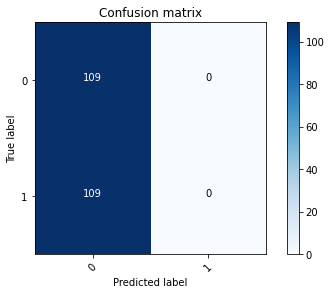

2022-08-02 18:44:22 - [Epoch Train: 1] loss: 0.6826, auc: 0.5797, acc: 0.5392, time: 72.00 s            
2022-08-02 18:44:22 - [Epoch Valid: 1] loss: 0.6770, auc: 0.6889, acc: 0.5000, time: 21.00 s
2022-08-02 18:44:22 - acc improved from 0.0000 to 0.5000. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e1-loss0.677-acc0.500-auc0.689.pth'


  1%|▎                                        | 1/150 [01:34<3:54:38, 94.49s/it]

2022-08-02 18:44:22 - EPOCH: 2
2022-08-02 18:44:26 - Train Step 10/192, train_loss: 0.5813
2022-08-02 18:44:31 - Train Step 20/192, train_loss: 0.6288
2022-08-02 18:44:35 - Train Step 30/192, train_loss: 0.6123
2022-08-02 18:44:39 - Train Step 40/192, train_loss: 0.6059
2022-08-02 18:44:43 - Train Step 50/192, train_loss: 0.6121
2022-08-02 18:44:47 - Train Step 60/192, train_loss: 0.6094
2022-08-02 18:44:51 - Train Step 70/192, train_loss: 0.6043
2022-08-02 18:44:55 - Train Step 80/192, train_loss: 0.6000
2022-08-02 18:44:58 - Train Step 90/192, train_loss: 0.6041
2022-08-02 18:45:02 - Train Step 100/192, train_loss: 0.6084
2022-08-02 18:45:06 - Train Step 110/192, train_loss: 0.6046
2022-08-02 18:45:10 - Train Step 120/192, train_loss: 0.6045
2022-08-02 18:45:14 - Train Step 130/192, train_loss: 0.6027
2022-08-02 18:45:18 - Train Step 140/192, train_loss: 0.6037
2022-08-02 18:45:21 - Train Step 150/192, train_loss: 0.6033
2022-08-02 18:45:25 - Train Step 160/192, train_loss: 0.6002
20

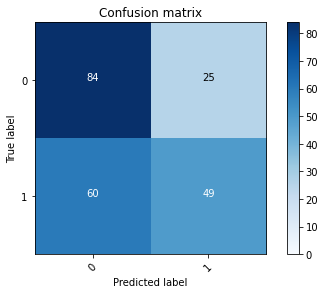

2022-08-02 18:45:59 - [Epoch Train: 2] loss: 0.5961, auc: 0.7853, acc: 0.6305, time: 74.00 s            
2022-08-02 18:45:59 - [Epoch Valid: 2] loss: 0.6526, auc: 0.6885, acc: 0.6101, time: 22.00 s
2022-08-02 18:45:59 - acc improved from 0.5000 to 0.6101. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e2-loss0.653-acc0.610-auc0.689.pth'


  1%|▌                                        | 2/150 [03:11<3:57:19, 96.21s/it]

2022-08-02 18:45:59 - EPOCH: 3
2022-08-02 18:46:03 - Train Step 10/192, train_loss: 0.5175
2022-08-02 18:46:07 - Train Step 20/192, train_loss: 0.5015
2022-08-02 18:46:11 - Train Step 30/192, train_loss: 0.4804
2022-08-02 18:46:15 - Train Step 40/192, train_loss: 0.4764
2022-08-02 18:46:19 - Train Step 50/192, train_loss: 0.4712
2022-08-02 18:46:23 - Train Step 60/192, train_loss: 0.4619
2022-08-02 18:46:27 - Train Step 70/192, train_loss: 0.4671
2022-08-02 18:46:30 - Train Step 80/192, train_loss: 0.4627
2022-08-02 18:46:34 - Train Step 90/192, train_loss: 0.4659
2022-08-02 18:46:38 - Train Step 100/192, train_loss: 0.4638
2022-08-02 18:46:42 - Train Step 110/192, train_loss: 0.4627
2022-08-02 18:46:46 - Train Step 120/192, train_loss: 0.4611
2022-08-02 18:46:50 - Train Step 130/192, train_loss: 0.4636
2022-08-02 18:46:53 - Train Step 140/192, train_loss: 0.4659
2022-08-02 18:46:57 - Train Step 150/192, train_loss: 0.4586
2022-08-02 18:47:01 - Train Step 160/192, train_loss: 0.4573
20

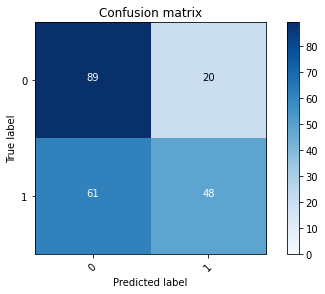

2022-08-02 18:47:35 - [Epoch Train: 3] loss: 0.4557, auc: 0.9184, acc: 0.7663, time: 74.00 s            
2022-08-02 18:47:35 - [Epoch Valid: 3] loss: 0.5872, auc: 0.7541, acc: 0.6284, time: 22.00 s
2022-08-02 18:47:35 - acc improved from 0.6101 to 0.6284. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e3-loss0.587-acc0.628-auc0.754.pth'


  2%|▊                                        | 3/150 [04:48<3:55:52, 96.28s/it]

2022-08-02 18:47:35 - EPOCH: 4
2022-08-02 18:47:40 - Train Step 10/192, train_loss: 0.3346
2022-08-02 18:47:43 - Train Step 20/192, train_loss: 0.3746
2022-08-02 18:47:47 - Train Step 30/192, train_loss: 0.3597
2022-08-02 18:47:51 - Train Step 40/192, train_loss: 0.3475
2022-08-02 18:47:55 - Train Step 50/192, train_loss: 0.3329
2022-08-02 18:47:59 - Train Step 60/192, train_loss: 0.3369
2022-08-02 18:48:03 - Train Step 70/192, train_loss: 0.3309
2022-08-02 18:48:07 - Train Step 80/192, train_loss: 0.3311
2022-08-02 18:48:11 - Train Step 90/192, train_loss: 0.3199
2022-08-02 18:48:14 - Train Step 100/192, train_loss: 0.3213
2022-08-02 18:48:18 - Train Step 110/192, train_loss: 0.3185
2022-08-02 18:48:22 - Train Step 120/192, train_loss: 0.3103
2022-08-02 18:48:27 - Train Step 130/192, train_loss: 0.3059
2022-08-02 18:48:31 - Train Step 140/192, train_loss: 0.3018
2022-08-02 18:48:35 - Train Step 150/192, train_loss: 0.3009
2022-08-02 18:48:40 - Train Step 160/192, train_loss: 0.3010
20

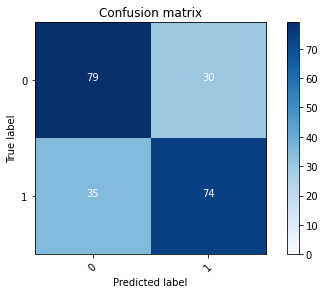

2022-08-02 18:49:21 - [Epoch Train: 4] loss: 0.2977, auc: 0.9731, acc: 0.8890, time: 77.00 s            
2022-08-02 18:49:21 - [Epoch Valid: 4] loss: 0.5827, auc: 0.7810, acc: 0.7018, time: 27.00 s
2022-08-02 18:49:21 - acc improved from 0.6284 to 0.7018. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e4-loss0.583-acc0.702-auc0.781.pth'


  3%|█                                        | 4/150 [06:33<4:02:59, 99.86s/it]

2022-08-02 18:49:21 - EPOCH: 5
2022-08-02 18:49:26 - Train Step 10/192, train_loss: 0.1632
2022-08-02 18:49:30 - Train Step 20/192, train_loss: 0.1831
2022-08-02 18:49:35 - Train Step 30/192, train_loss: 0.1807
2022-08-02 18:49:39 - Train Step 40/192, train_loss: 0.1874
2022-08-02 18:49:44 - Train Step 50/192, train_loss: 0.2071
2022-08-02 18:49:48 - Train Step 60/192, train_loss: 0.2020
2022-08-02 18:49:52 - Train Step 70/192, train_loss: 0.1974
2022-08-02 18:49:57 - Train Step 80/192, train_loss: 0.1974
2022-08-02 18:50:01 - Train Step 90/192, train_loss: 0.1953
2022-08-02 18:50:05 - Train Step 100/192, train_loss: 0.1917
2022-08-02 18:50:08 - Train Step 110/192, train_loss: 0.1852
2022-08-02 18:50:12 - Train Step 120/192, train_loss: 0.1879
2022-08-02 18:50:16 - Train Step 130/192, train_loss: 0.1829
2022-08-02 18:50:20 - Train Step 140/192, train_loss: 0.1814
2022-08-02 18:50:24 - Train Step 150/192, train_loss: 0.1767
2022-08-02 18:50:28 - Train Step 160/192, train_loss: 0.1735
20

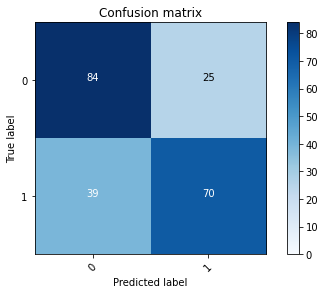

2022-08-02 18:51:06 - [Epoch Train: 5] loss: 0.1699, auc: 0.9926, acc: 0.9439, time: 79.00 s            
2022-08-02 18:51:06 - [Epoch Valid: 5] loss: 0.6154, auc: 0.7967, acc: 0.7064, time: 25.00 s
2022-08-02 18:51:06 - acc improved from 0.7018 to 0.7064. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e5-loss0.615-acc0.706-auc0.797.pth'


  3%|█▎                                      | 5/150 [08:18<4:05:44, 101.69s/it]

2022-08-02 18:51:06 - EPOCH: 6
2022-08-02 18:51:10 - Train Step 10/192, train_loss: 0.0813
2022-08-02 18:51:15 - Train Step 20/192, train_loss: 0.0864
2022-08-02 18:51:19 - Train Step 30/192, train_loss: 0.0964
2022-08-02 18:51:24 - Train Step 40/192, train_loss: 0.0882
2022-08-02 18:51:28 - Train Step 50/192, train_loss: 0.0899
2022-08-02 18:51:33 - Train Step 60/192, train_loss: 0.0906
2022-08-02 18:51:37 - Train Step 70/192, train_loss: 0.0962
2022-08-02 18:51:41 - Train Step 80/192, train_loss: 0.0983
2022-08-02 18:51:46 - Train Step 90/192, train_loss: 0.0957
2022-08-02 18:51:50 - Train Step 100/192, train_loss: 0.0938
2022-08-02 18:51:55 - Train Step 110/192, train_loss: 0.0927
2022-08-02 18:51:59 - Train Step 120/192, train_loss: 0.0899
2022-08-02 18:52:04 - Train Step 130/192, train_loss: 0.0879
2022-08-02 18:52:08 - Train Step 140/192, train_loss: 0.0853
2022-08-02 18:52:13 - Train Step 150/192, train_loss: 0.0840
2022-08-02 18:52:17 - Train Step 160/192, train_loss: 0.0838
20

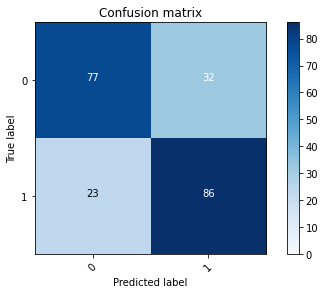

2022-08-02 18:52:56 - [Epoch Train: 6] loss: 0.0845, auc: 0.9994, acc: 0.9869, time: 85.00 s            
2022-08-02 18:52:56 - [Epoch Valid: 6] loss: 0.6667, auc: 0.8073, acc: 0.7477, time: 24.00 s
2022-08-02 18:52:56 - acc improved from 0.7064 to 0.7477. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e6-loss0.667-acc0.748-auc0.807.pth'


  4%|█▌                                      | 6/150 [10:08<4:11:00, 104.58s/it]

2022-08-02 18:52:56 - EPOCH: 7
2022-08-02 18:53:00 - Train Step 10/192, train_loss: 0.0369
2022-08-02 18:53:05 - Train Step 20/192, train_loss: 0.0457
2022-08-02 18:53:09 - Train Step 30/192, train_loss: 0.0421
2022-08-02 18:53:14 - Train Step 40/192, train_loss: 0.0389
2022-08-02 18:53:18 - Train Step 50/192, train_loss: 0.0427
2022-08-02 18:53:23 - Train Step 60/192, train_loss: 0.0444
2022-08-02 18:53:28 - Train Step 70/192, train_loss: 0.0443
2022-08-02 18:53:33 - Train Step 80/192, train_loss: 0.0429
2022-08-02 18:53:37 - Train Step 90/192, train_loss: 0.0425
2022-08-02 18:53:42 - Train Step 100/192, train_loss: 0.0430
2022-08-02 18:53:47 - Train Step 110/192, train_loss: 0.0418
2022-08-02 18:53:51 - Train Step 120/192, train_loss: 0.0426
2022-08-02 18:53:55 - Train Step 130/192, train_loss: 0.0417
2022-08-02 18:54:00 - Train Step 140/192, train_loss: 0.0419
2022-08-02 18:54:04 - Train Step 150/192, train_loss: 0.0427
2022-08-02 18:54:09 - Train Step 160/192, train_loss: 0.0442
20

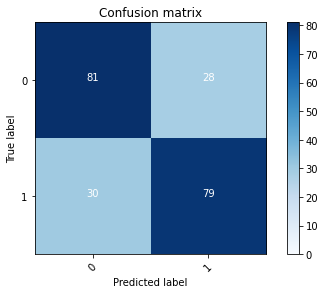

2022-08-02 18:54:47 - [Epoch Train: 7] loss: 0.0429, auc: 1.0000, acc: 0.9948, time: 86.00 s            
2022-08-02 18:54:47 - [Epoch Valid: 7] loss: 0.7005, auc: 0.8184, acc: 0.7339, time: 24.00 s


  5%|█▊                                      | 7/150 [11:59<4:14:10, 106.65s/it]

2022-08-02 18:54:47 - EPOCH: 8
2022-08-02 18:54:52 - Train Step 10/192, train_loss: 0.0315
2022-08-02 18:54:56 - Train Step 20/192, train_loss: 0.0284
2022-08-02 18:55:01 - Train Step 30/192, train_loss: 0.0244
2022-08-02 18:55:05 - Train Step 40/192, train_loss: 0.0236
2022-08-02 18:55:10 - Train Step 50/192, train_loss: 0.0273
2022-08-02 18:55:14 - Train Step 60/192, train_loss: 0.0272
2022-08-02 18:55:19 - Train Step 70/192, train_loss: 0.0263
2022-08-02 18:55:23 - Train Step 80/192, train_loss: 0.0282
2022-08-02 18:55:27 - Train Step 90/192, train_loss: 0.0286
2022-08-02 18:55:31 - Train Step 100/192, train_loss: 0.0271
2022-08-02 18:55:35 - Train Step 110/192, train_loss: 0.0269
2022-08-02 18:55:40 - Train Step 120/192, train_loss: 0.0259
2022-08-02 18:55:45 - Train Step 130/192, train_loss: 0.0252
2022-08-02 18:55:50 - Train Step 140/192, train_loss: 0.0250
2022-08-02 18:55:54 - Train Step 150/192, train_loss: 0.0246
2022-08-02 18:55:58 - Train Step 160/192, train_loss: 0.0254
20

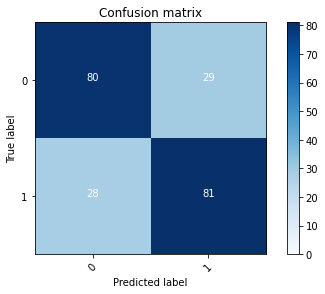

2022-08-02 18:56:38 - [Epoch Train: 8] loss: 0.0244, auc: 1.0000, acc: 0.9974, time: 85.00 s            
2022-08-02 18:56:38 - [Epoch Valid: 8] loss: 0.7475, auc: 0.8283, acc: 0.7385, time: 25.00 s


  5%|██▏                                     | 8/150 [13:51<4:16:10, 108.24s/it]

2022-08-02 18:56:38 - EPOCH: 9
2022-08-02 18:56:43 - Train Step 10/192, train_loss: 0.0120
2022-08-02 18:56:47 - Train Step 20/192, train_loss: 0.0135
2022-08-02 18:56:51 - Train Step 30/192, train_loss: 0.0145
2022-08-02 18:56:55 - Train Step 40/192, train_loss: 0.0129
2022-08-02 18:56:59 - Train Step 50/192, train_loss: 0.0128
2022-08-02 18:57:03 - Train Step 60/192, train_loss: 0.0140
2022-08-02 18:57:07 - Train Step 70/192, train_loss: 0.0133
2022-08-02 18:57:11 - Train Step 80/192, train_loss: 0.0146
2022-08-02 18:57:15 - Train Step 90/192, train_loss: 0.0142
2022-08-02 18:57:19 - Train Step 100/192, train_loss: 0.0137
2022-08-02 18:57:23 - Train Step 110/192, train_loss: 0.0134
2022-08-02 18:57:27 - Train Step 120/192, train_loss: 0.0140
2022-08-02 18:57:31 - Train Step 130/192, train_loss: 0.0141
2022-08-02 18:57:35 - Train Step 140/192, train_loss: 0.0149
2022-08-02 18:57:39 - Train Step 150/192, train_loss: 0.0148
2022-08-02 18:57:44 - Train Step 160/192, train_loss: 0.0156
20

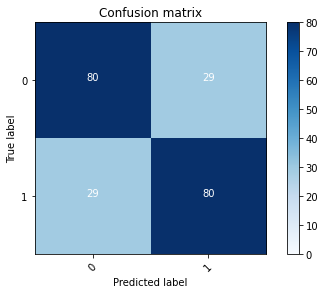

2022-08-02 18:58:15 - [Epoch Train: 9] loss: 0.0152, auc: 1.0000, acc: 0.9987, time: 77.00 s            
2022-08-02 18:58:15 - [Epoch Valid: 9] loss: 0.7933, auc: 0.8260, acc: 0.7339, time: 18.00 s


  6%|██▍                                     | 9/150 [15:27<4:05:37, 104.52s/it]

2022-08-02 18:58:15 - EPOCH: 10
2022-08-02 18:58:18 - Train Step 10/192, train_loss: 0.0109
2022-08-02 18:58:21 - Train Step 20/192, train_loss: 0.0132
2022-08-02 18:58:25 - Train Step 30/192, train_loss: 0.0113
2022-08-02 18:58:28 - Train Step 40/192, train_loss: 0.0111
2022-08-02 18:58:31 - Train Step 50/192, train_loss: 0.0126
2022-08-02 18:58:34 - Train Step 60/192, train_loss: 0.0126
2022-08-02 18:58:37 - Train Step 70/192, train_loss: 0.0116
2022-08-02 18:58:40 - Train Step 80/192, train_loss: 0.0111
2022-08-02 18:58:43 - Train Step 90/192, train_loss: 0.0110
2022-08-02 18:58:47 - Train Step 100/192, train_loss: 0.0108
2022-08-02 18:58:50 - Train Step 110/192, train_loss: 0.0104
2022-08-02 18:58:53 - Train Step 120/192, train_loss: 0.0104
2022-08-02 18:58:56 - Train Step 130/192, train_loss: 0.0103
2022-08-02 18:58:59 - Train Step 140/192, train_loss: 0.0101
2022-08-02 18:59:02 - Train Step 150/192, train_loss: 0.0100
2022-08-02 18:59:05 - Train Step 160/192, train_loss: 0.0098
2

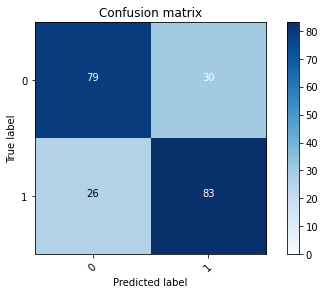

2022-08-02 18:59:33 - [Epoch Train: 10] loss: 0.0097, auc: 1.0000, acc: 0.9987, time: 60.00 s            
2022-08-02 18:59:33 - [Epoch Valid: 10] loss: 0.8346, auc: 0.8256, acc: 0.7431, time: 17.00 s


  7%|██▋                                     | 10/150 [16:45<3:44:44, 96.32s/it]

2022-08-02 18:59:33 - EPOCH: 11
2022-08-02 18:59:36 - Train Step 10/192, train_loss: 0.0067
2022-08-02 18:59:39 - Train Step 20/192, train_loss: 0.0062
2022-08-02 18:59:43 - Train Step 30/192, train_loss: 0.0057
2022-08-02 18:59:46 - Train Step 40/192, train_loss: 0.0056
2022-08-02 18:59:49 - Train Step 50/192, train_loss: 0.0059
2022-08-02 18:59:52 - Train Step 60/192, train_loss: 0.0057
2022-08-02 18:59:55 - Train Step 70/192, train_loss: 0.0062
2022-08-02 18:59:58 - Train Step 80/192, train_loss: 0.0059
2022-08-02 19:00:01 - Train Step 90/192, train_loss: 0.0059
2022-08-02 19:00:04 - Train Step 100/192, train_loss: 0.0056
2022-08-02 19:00:07 - Train Step 110/192, train_loss: 0.0056
2022-08-02 19:00:11 - Train Step 120/192, train_loss: 0.0059
2022-08-02 19:00:14 - Train Step 130/192, train_loss: 0.0063
2022-08-02 19:00:17 - Train Step 140/192, train_loss: 0.0062
2022-08-02 19:00:20 - Train Step 150/192, train_loss: 0.0063
2022-08-02 19:00:23 - Train Step 160/192, train_loss: 0.0062
2

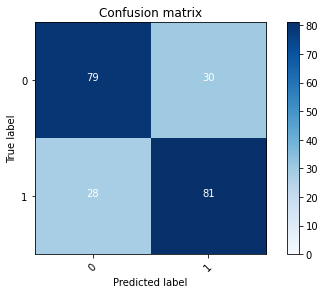

2022-08-02 19:00:51 - [Epoch Train: 11] loss: 0.0066, auc: 1.0000, acc: 1.0000, time: 60.00 s            
2022-08-02 19:00:51 - [Epoch Valid: 11] loss: 0.8504, auc: 0.8265, acc: 0.7339, time: 17.00 s


  7%|██▉                                     | 11/150 [18:03<3:30:19, 90.78s/it]

2022-08-02 19:00:51 - EPOCH: 12
2022-08-02 19:00:54 - Train Step 10/192, train_loss: 0.0061
2022-08-02 19:00:57 - Train Step 20/192, train_loss: 0.0049
2022-08-02 19:01:01 - Train Step 30/192, train_loss: 0.0054
2022-08-02 19:01:04 - Train Step 40/192, train_loss: 0.0051
2022-08-02 19:01:07 - Train Step 50/192, train_loss: 0.0057
2022-08-02 19:01:10 - Train Step 60/192, train_loss: 0.0054
2022-08-02 19:01:13 - Train Step 70/192, train_loss: 0.0063
2022-08-02 19:01:16 - Train Step 80/192, train_loss: 0.0060
2022-08-02 19:01:19 - Train Step 90/192, train_loss: 0.0060
2022-08-02 19:01:23 - Train Step 100/192, train_loss: 0.0059
2022-08-02 19:01:26 - Train Step 110/192, train_loss: 0.0057
2022-08-02 19:01:29 - Train Step 120/192, train_loss: 0.0057
2022-08-02 19:01:32 - Train Step 130/192, train_loss: 0.0056
2022-08-02 19:01:35 - Train Step 140/192, train_loss: 0.0056
2022-08-02 19:01:38 - Train Step 150/192, train_loss: 0.0055
2022-08-02 19:01:42 - Train Step 160/192, train_loss: 0.0053
2

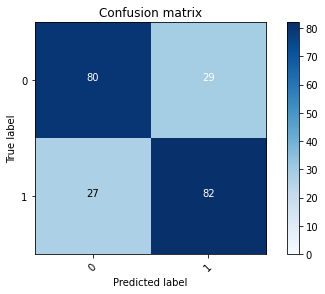

2022-08-02 19:02:09 - [Epoch Train: 12] loss: 0.0052, auc: 1.0000, acc: 1.0000, time: 60.00 s            
2022-08-02 19:02:09 - [Epoch Valid: 12] loss: 0.9588, auc: 0.8307, acc: 0.7431, time: 17.00 s


  8%|███▏                                    | 12/150 [19:21<3:19:57, 86.94s/it]

2022-08-02 19:02:09 - EPOCH: 13
2022-08-02 19:02:13 - Train Step 10/192, train_loss: 0.0042
2022-08-02 19:02:16 - Train Step 20/192, train_loss: 0.0044
2022-08-02 19:02:19 - Train Step 30/192, train_loss: 0.0046
2022-08-02 19:02:22 - Train Step 40/192, train_loss: 0.0056
2022-08-02 19:02:25 - Train Step 50/192, train_loss: 0.0053
2022-08-02 19:02:28 - Train Step 60/192, train_loss: 0.0051
2022-08-02 19:02:31 - Train Step 70/192, train_loss: 0.0059
2022-08-02 19:02:35 - Train Step 80/192, train_loss: 0.0056
2022-08-02 19:02:38 - Train Step 90/192, train_loss: 0.0053
2022-08-02 19:02:41 - Train Step 100/192, train_loss: 0.0061
2022-08-02 19:02:44 - Train Step 110/192, train_loss: 0.0060
2022-08-02 19:02:47 - Train Step 120/192, train_loss: 0.0060
2022-08-02 19:02:50 - Train Step 130/192, train_loss: 0.0058
2022-08-02 19:02:53 - Train Step 140/192, train_loss: 0.0055
2022-08-02 19:02:56 - Train Step 150/192, train_loss: 0.0059
2022-08-02 19:03:00 - Train Step 160/192, train_loss: 0.0058
2

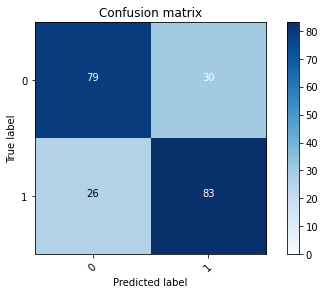

2022-08-02 19:03:27 - [Epoch Train: 13] loss: 0.0057, auc: 1.0000, acc: 1.0000, time: 60.00 s            
2022-08-02 19:03:27 - [Epoch Valid: 13] loss: 0.9665, auc: 0.8280, acc: 0.7431, time: 18.00 s


  9%|███▍                                    | 13/150 [20:40<3:12:22, 84.25s/it]

2022-08-02 19:03:27 - EPOCH: 14
2022-08-02 19:03:31 - Train Step 10/192, train_loss: 0.0032
2022-08-02 19:03:34 - Train Step 20/192, train_loss: 0.0046
2022-08-02 19:03:37 - Train Step 30/192, train_loss: 0.0040
2022-08-02 19:03:40 - Train Step 40/192, train_loss: 0.0038
2022-08-02 19:03:43 - Train Step 50/192, train_loss: 0.0035
2022-08-02 19:03:46 - Train Step 60/192, train_loss: 0.0035
2022-08-02 19:03:50 - Train Step 70/192, train_loss: 0.0036
2022-08-02 19:03:53 - Train Step 80/192, train_loss: 0.0037
2022-08-02 19:03:56 - Train Step 90/192, train_loss: 0.0039
2022-08-02 19:03:59 - Train Step 100/192, train_loss: 0.0038
2022-08-02 19:04:02 - Train Step 110/192, train_loss: 0.0038
2022-08-02 19:04:05 - Train Step 120/192, train_loss: 0.0036
2022-08-02 19:04:08 - Train Step 130/192, train_loss: 0.0037
2022-08-02 19:04:11 - Train Step 140/192, train_loss: 0.0047
2022-08-02 19:04:14 - Train Step 150/192, train_loss: 0.0048
2022-08-02 19:04:17 - Train Step 160/192, train_loss: 0.0047
2

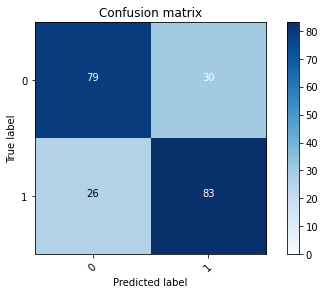

2022-08-02 19:04:45 - [Epoch Train: 14] loss: 0.0045, auc: 1.0000, acc: 0.9987, time: 59.00 s            
2022-08-02 19:04:45 - [Epoch Valid: 14] loss: 0.9479, auc: 0.8296, acc: 0.7431, time: 17.00 s


  9%|███▋                                    | 14/150 [21:57<3:06:27, 82.26s/it]

2022-08-02 19:04:45 - EPOCH: 15
2022-08-02 19:04:48 - Train Step 10/192, train_loss: 0.0031
2022-08-02 19:04:51 - Train Step 20/192, train_loss: 0.0069
2022-08-02 19:04:55 - Train Step 30/192, train_loss: 0.0057
2022-08-02 19:04:58 - Train Step 40/192, train_loss: 0.0050
2022-08-02 19:05:01 - Train Step 50/192, train_loss: 0.0044
2022-08-02 19:05:04 - Train Step 60/192, train_loss: 0.0040
2022-08-02 19:05:07 - Train Step 70/192, train_loss: 0.0040
2022-08-02 19:05:10 - Train Step 80/192, train_loss: 0.0043
2022-08-02 19:05:13 - Train Step 90/192, train_loss: 0.0042
2022-08-02 19:05:16 - Train Step 100/192, train_loss: 0.0040
2022-08-02 19:05:20 - Train Step 110/192, train_loss: 0.0040
2022-08-02 19:05:23 - Train Step 120/192, train_loss: 0.0044
2022-08-02 19:05:26 - Train Step 130/192, train_loss: 0.0042
2022-08-02 19:05:29 - Train Step 140/192, train_loss: 0.0042
2022-08-02 19:05:32 - Train Step 150/192, train_loss: 0.0041
2022-08-02 19:05:35 - Train Step 160/192, train_loss: 0.0040
2

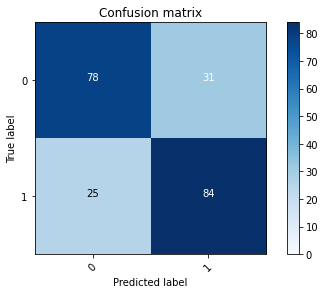

2022-08-02 19:06:02 - [Epoch Train: 15] loss: 0.0039, auc: 1.0000, acc: 1.0000, time: 59.00 s            
2022-08-02 19:06:02 - [Epoch Valid: 15] loss: 0.9710, auc: 0.8269, acc: 0.7431, time: 17.00 s


 10%|████                                    | 15/150 [23:14<3:01:36, 80.72s/it]

2022-08-02 19:06:02 - EPOCH: 16
2022-08-02 19:06:05 - Train Step 10/192, train_loss: 0.0017
2022-08-02 19:06:09 - Train Step 20/192, train_loss: 0.0022
2022-08-02 19:06:12 - Train Step 30/192, train_loss: 0.0021
2022-08-02 19:06:15 - Train Step 40/192, train_loss: 0.0022
2022-08-02 19:06:18 - Train Step 50/192, train_loss: 0.0022
2022-08-02 19:06:21 - Train Step 60/192, train_loss: 0.0023
2022-08-02 19:06:24 - Train Step 70/192, train_loss: 0.0044
2022-08-02 19:06:27 - Train Step 80/192, train_loss: 0.0043
2022-08-02 19:06:30 - Train Step 90/192, train_loss: 0.0043
2022-08-02 19:06:33 - Train Step 100/192, train_loss: 0.0041
2022-08-02 19:06:36 - Train Step 110/192, train_loss: 0.0041
2022-08-02 19:06:39 - Train Step 120/192, train_loss: 0.0040
2022-08-02 19:06:43 - Train Step 130/192, train_loss: 0.0039
2022-08-02 19:06:46 - Train Step 140/192, train_loss: 0.0043
2022-08-02 19:06:49 - Train Step 150/192, train_loss: 0.0041
2022-08-02 19:06:52 - Train Step 160/192, train_loss: 0.0041
2

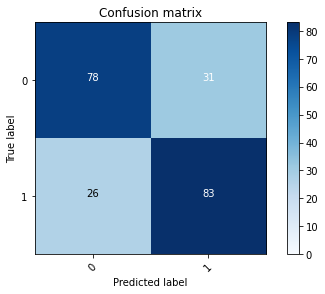

2022-08-02 19:07:20 - [Epoch Train: 16] loss: 0.0038, auc: 1.0000, acc: 0.9987, time: 59.00 s            
2022-08-02 19:07:20 - [Epoch Valid: 16] loss: 0.9851, auc: 0.8303, acc: 0.7385, time: 17.00 s


 11%|████▎                                   | 16/150 [24:32<2:58:16, 79.82s/it]

2022-08-02 19:07:20 - EPOCH: 17
2022-08-02 19:07:23 - Train Step 10/192, train_loss: 0.0025
2022-08-02 19:07:26 - Train Step 20/192, train_loss: 0.0021
2022-08-02 19:07:29 - Train Step 30/192, train_loss: 0.0021
2022-08-02 19:07:33 - Train Step 40/192, train_loss: 0.0021
2022-08-02 19:07:36 - Train Step 50/192, train_loss: 0.0021
2022-08-02 19:07:39 - Train Step 60/192, train_loss: 0.0022
2022-08-02 19:07:42 - Train Step 70/192, train_loss: 0.0021
2022-08-02 19:07:45 - Train Step 80/192, train_loss: 0.0020
2022-08-02 19:07:48 - Train Step 90/192, train_loss: 0.0020
2022-08-02 19:07:51 - Train Step 100/192, train_loss: 0.0024
2022-08-02 19:07:55 - Train Step 110/192, train_loss: 0.0023
2022-08-02 19:07:58 - Train Step 120/192, train_loss: 0.0025
2022-08-02 19:08:01 - Train Step 130/192, train_loss: 0.0027
2022-08-02 19:08:04 - Train Step 140/192, train_loss: 0.0031
2022-08-02 19:08:07 - Train Step 150/192, train_loss: 0.0030
2022-08-02 19:08:10 - Train Step 160/192, train_loss: 0.0030
2

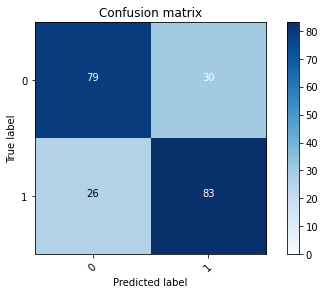

2022-08-02 19:08:38 - [Epoch Train: 17] loss: 0.0029, auc: 1.0000, acc: 1.0000, time: 60.00 s            
2022-08-02 19:08:38 - [Epoch Valid: 17] loss: 1.0190, auc: 0.8343, acc: 0.7431, time: 17.00 s


 11%|████▌                                   | 17/150 [25:50<2:55:38, 79.23s/it]

2022-08-02 19:08:38 - EPOCH: 18
2022-08-02 19:08:41 - Train Step 10/192, train_loss: 0.0031
2022-08-02 19:08:44 - Train Step 20/192, train_loss: 0.0041
2022-08-02 19:08:47 - Train Step 30/192, train_loss: 0.0031
2022-08-02 19:08:50 - Train Step 40/192, train_loss: 0.0030
2022-08-02 19:08:53 - Train Step 50/192, train_loss: 0.0027
2022-08-02 19:08:56 - Train Step 60/192, train_loss: 0.0027
2022-08-02 19:08:59 - Train Step 70/192, train_loss: 0.0025
2022-08-02 19:09:03 - Train Step 80/192, train_loss: 0.0023
2022-08-02 19:09:06 - Train Step 90/192, train_loss: 0.0023
2022-08-02 19:09:09 - Train Step 100/192, train_loss: 0.0022
2022-08-02 19:09:12 - Train Step 110/192, train_loss: 0.0021
2022-08-02 19:09:15 - Train Step 120/192, train_loss: 0.0020
2022-08-02 19:09:18 - Train Step 130/192, train_loss: 0.0019
2022-08-02 19:09:21 - Train Step 140/192, train_loss: 0.0022
2022-08-02 19:09:24 - Train Step 150/192, train_loss: 0.0022
2022-08-02 19:09:27 - Train Step 160/192, train_loss: 0.0022
2

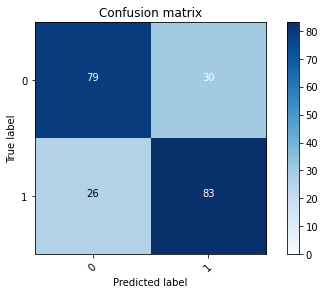

2022-08-02 19:09:55 - [Epoch Train: 18] loss: 0.0022, auc: 1.0000, acc: 1.0000, time: 59.00 s            
2022-08-02 19:09:55 - [Epoch Valid: 18] loss: 1.0450, auc: 0.8363, acc: 0.7431, time: 17.00 s


 12%|████▊                                   | 18/150 [27:07<2:52:56, 78.61s/it]

2022-08-02 19:09:55 - EPOCH: 19
2022-08-02 19:09:58 - Train Step 10/192, train_loss: 0.0023
2022-08-02 19:10:01 - Train Step 20/192, train_loss: 0.0024
2022-08-02 19:10:04 - Train Step 30/192, train_loss: 0.0022
2022-08-02 19:10:07 - Train Step 40/192, train_loss: 0.0023
2022-08-02 19:10:10 - Train Step 50/192, train_loss: 0.0028
2022-08-02 19:10:13 - Train Step 60/192, train_loss: 0.0026
2022-08-02 19:10:16 - Train Step 70/192, train_loss: 0.0025
2022-08-02 19:10:19 - Train Step 80/192, train_loss: 0.0023
2022-08-02 19:10:22 - Train Step 90/192, train_loss: 0.0023
2022-08-02 19:10:25 - Train Step 100/192, train_loss: 0.0022
2022-08-02 19:10:29 - Train Step 110/192, train_loss: 0.0022
2022-08-02 19:10:32 - Train Step 120/192, train_loss: 0.0022
2022-08-02 19:10:35 - Train Step 130/192, train_loss: 0.0021
2022-08-02 19:10:38 - Train Step 140/192, train_loss: 0.0022
2022-08-02 19:10:41 - Train Step 150/192, train_loss: 0.0021
2022-08-02 19:10:44 - Train Step 160/192, train_loss: 0.0021
2

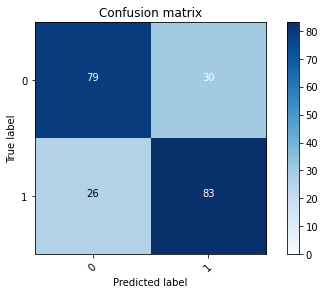

2022-08-02 19:11:11 - [Epoch Train: 19] loss: 0.0021, auc: 1.0000, acc: 1.0000, time: 58.00 s            
2022-08-02 19:11:11 - [Epoch Valid: 19] loss: 0.9847, auc: 0.8289, acc: 0.7431, time: 17.00 s


 13%|█████                                   | 19/150 [28:23<2:49:49, 77.78s/it]

2022-08-02 19:11:11 - EPOCH: 20
2022-08-02 19:11:14 - Train Step 10/192, train_loss: 0.0018
2022-08-02 19:11:17 - Train Step 20/192, train_loss: 0.0020
2022-08-02 19:11:20 - Train Step 30/192, train_loss: 0.0020
2022-08-02 19:11:23 - Train Step 40/192, train_loss: 0.0020
2022-08-02 19:11:26 - Train Step 50/192, train_loss: 0.0017
2022-08-02 19:11:30 - Train Step 60/192, train_loss: 0.0017
2022-08-02 19:11:33 - Train Step 70/192, train_loss: 0.0016
2022-08-02 19:11:36 - Train Step 80/192, train_loss: 0.0016
2022-08-02 19:11:39 - Train Step 90/192, train_loss: 0.0015
2022-08-02 19:11:42 - Train Step 100/192, train_loss: 0.0015
2022-08-02 19:11:45 - Train Step 110/192, train_loss: 0.0015
2022-08-02 19:11:48 - Train Step 120/192, train_loss: 0.0015
2022-08-02 19:11:51 - Train Step 130/192, train_loss: 0.0016
2022-08-02 19:11:54 - Train Step 140/192, train_loss: 0.0017
2022-08-02 19:11:57 - Train Step 150/192, train_loss: 0.0017
2022-08-02 19:12:00 - Train Step 160/192, train_loss: 0.0017
2

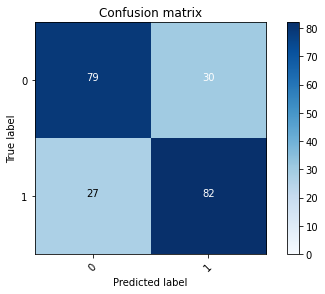

2022-08-02 19:12:28 - [Epoch Train: 20] loss: 0.0016, auc: 1.0000, acc: 1.0000, time: 59.00 s            
2022-08-02 19:12:28 - [Epoch Valid: 20] loss: 1.0455, auc: 0.8366, acc: 0.7385, time: 17.00 s


 13%|█████▎                                  | 20/150 [29:40<2:48:03, 77.56s/it]

2022-08-02 19:12:28 - EPOCH: 21
2022-08-02 19:12:31 - Train Step 10/192, train_loss: 0.0009
2022-08-02 19:12:34 - Train Step 20/192, train_loss: 0.0011
2022-08-02 19:12:37 - Train Step 30/192, train_loss: 0.0011
2022-08-02 19:12:40 - Train Step 40/192, train_loss: 0.0011
2022-08-02 19:12:44 - Train Step 50/192, train_loss: 0.0011
2022-08-02 19:12:47 - Train Step 60/192, train_loss: 0.0011
2022-08-02 19:12:50 - Train Step 70/192, train_loss: 0.0010
2022-08-02 19:12:53 - Train Step 80/192, train_loss: 0.0010
2022-08-02 19:12:56 - Train Step 90/192, train_loss: 0.0012
2022-08-02 19:12:59 - Train Step 100/192, train_loss: 0.0012
2022-08-02 19:13:02 - Train Step 110/192, train_loss: 0.0012
2022-08-02 19:13:05 - Train Step 120/192, train_loss: 0.0012
2022-08-02 19:13:08 - Train Step 130/192, train_loss: 0.0012
2022-08-02 19:13:12 - Train Step 140/192, train_loss: 0.0012
2022-08-02 19:13:15 - Train Step 150/192, train_loss: 0.0012
2022-08-02 19:13:18 - Train Step 160/192, train_loss: 0.0013
2

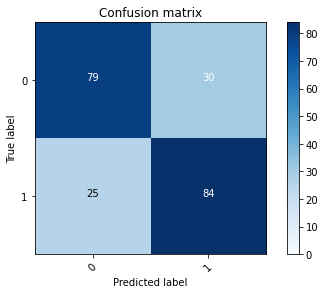

2022-08-02 19:13:45 - [Epoch Train: 21] loss: 0.0014, auc: 1.0000, acc: 1.0000, time: 59.00 s            
2022-08-02 19:13:45 - [Epoch Valid: 21] loss: 1.0667, auc: 0.8339, acc: 0.7477, time: 17.00 s
2022-08-02 19:13:45 - acc improved from 0.7477 to 0.7477. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e21-loss1.067-acc0.748-auc0.834.pth'


 14%|█████▌                                  | 21/150 [30:57<2:46:26, 77.42s/it]

2022-08-02 19:13:45 - EPOCH: 22
2022-08-02 19:13:48 - Train Step 10/192, train_loss: 0.0009
2022-08-02 19:13:51 - Train Step 20/192, train_loss: 0.0011
2022-08-02 19:13:54 - Train Step 30/192, train_loss: 0.0014
2022-08-02 19:13:58 - Train Step 40/192, train_loss: 0.0013
2022-08-02 19:14:01 - Train Step 50/192, train_loss: 0.0012
2022-08-02 19:14:04 - Train Step 60/192, train_loss: 0.0012
2022-08-02 19:14:07 - Train Step 70/192, train_loss: 0.0012
2022-08-02 19:14:10 - Train Step 80/192, train_loss: 0.0012
2022-08-02 19:14:13 - Train Step 90/192, train_loss: 0.0011
2022-08-02 19:14:16 - Train Step 100/192, train_loss: 0.0011
2022-08-02 19:14:19 - Train Step 110/192, train_loss: 0.0011
2022-08-02 19:14:22 - Train Step 120/192, train_loss: 0.0011
2022-08-02 19:14:26 - Train Step 130/192, train_loss: 0.0012
2022-08-02 19:14:29 - Train Step 140/192, train_loss: 0.0012
2022-08-02 19:14:32 - Train Step 150/192, train_loss: 0.0012
2022-08-02 19:14:35 - Train Step 160/192, train_loss: 0.0011
2

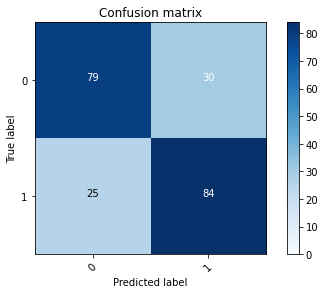

2022-08-02 19:15:02 - [Epoch Train: 22] loss: 0.0011, auc: 1.0000, acc: 1.0000, time: 59.00 s            
2022-08-02 19:15:02 - [Epoch Valid: 22] loss: 1.1882, auc: 0.8356, acc: 0.7477, time: 17.00 s
2022-08-02 19:15:02 - acc improved from 0.7477 to 0.7477. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e22-loss1.188-acc0.748-auc0.836.pth'


 15%|█████▊                                  | 22/150 [32:14<2:44:58, 77.33s/it]

2022-08-02 19:15:02 - EPOCH: 23
2022-08-02 19:15:06 - Train Step 10/192, train_loss: 0.0006
2022-08-02 19:15:09 - Train Step 20/192, train_loss: 0.0006
2022-08-02 19:15:12 - Train Step 30/192, train_loss: 0.0006
2022-08-02 19:15:15 - Train Step 40/192, train_loss: 0.0010
2022-08-02 19:15:18 - Train Step 50/192, train_loss: 0.0010
2022-08-02 19:15:21 - Train Step 60/192, train_loss: 0.0010
2022-08-02 19:15:24 - Train Step 70/192, train_loss: 0.0011
2022-08-02 19:15:27 - Train Step 80/192, train_loss: 0.0014
2022-08-02 19:15:30 - Train Step 90/192, train_loss: 0.0013
2022-08-02 19:15:33 - Train Step 100/192, train_loss: 0.0012
2022-08-02 19:15:36 - Train Step 110/192, train_loss: 0.0012
2022-08-02 19:15:39 - Train Step 120/192, train_loss: 0.0013
2022-08-02 19:15:43 - Train Step 130/192, train_loss: 0.0012
2022-08-02 19:15:46 - Train Step 140/192, train_loss: 0.0012
2022-08-02 19:15:49 - Train Step 150/192, train_loss: 0.0012
2022-08-02 19:15:52 - Train Step 160/192, train_loss: 0.0012
2

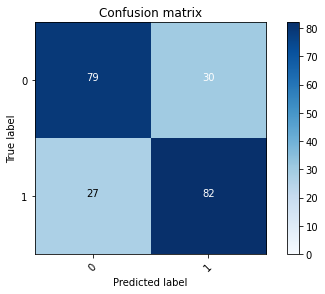

2022-08-02 19:16:19 - [Epoch Train: 23] loss: 0.0011, auc: 1.0000, acc: 1.0000, time: 59.00 s            
2022-08-02 19:16:19 - [Epoch Valid: 23] loss: 1.1168, auc: 0.8371, acc: 0.7385, time: 17.00 s


 15%|██████▏                                 | 23/150 [33:31<2:43:24, 77.20s/it]

2022-08-02 19:16:19 - EPOCH: 24
2022-08-02 19:16:22 - Train Step 10/192, train_loss: 0.0016
2022-08-02 19:16:25 - Train Step 20/192, train_loss: 0.0011
2022-08-02 19:16:28 - Train Step 30/192, train_loss: 0.0009
2022-08-02 19:16:31 - Train Step 40/192, train_loss: 0.0012
2022-08-02 19:16:35 - Train Step 50/192, train_loss: 0.0011
2022-08-02 19:16:38 - Train Step 60/192, train_loss: 0.0010
2022-08-02 19:16:41 - Train Step 70/192, train_loss: 0.0010
2022-08-02 19:16:44 - Train Step 80/192, train_loss: 0.0012
2022-08-02 19:16:47 - Train Step 90/192, train_loss: 0.0012
2022-08-02 19:16:50 - Train Step 100/192, train_loss: 0.0012
2022-08-02 19:16:53 - Train Step 110/192, train_loss: 0.0011
2022-08-02 19:16:56 - Train Step 120/192, train_loss: 0.0011
2022-08-02 19:16:59 - Train Step 130/192, train_loss: 0.0011
2022-08-02 19:17:02 - Train Step 140/192, train_loss: 0.0011
2022-08-02 19:17:06 - Train Step 150/192, train_loss: 0.0010
2022-08-02 19:17:09 - Train Step 160/192, train_loss: 0.0010
2

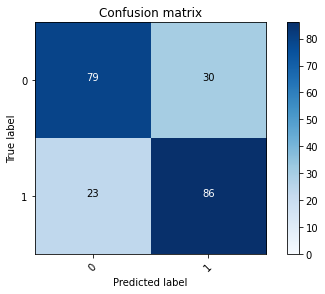

2022-08-02 19:17:35 - [Epoch Train: 24] loss: 0.0010, auc: 1.0000, acc: 1.0000, time: 59.00 s            
2022-08-02 19:17:35 - [Epoch Valid: 24] loss: 1.1048, auc: 0.8384, acc: 0.7569, time: 17.00 s
2022-08-02 19:17:35 - acc improved from 0.7477 to 0.7569. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e24-loss1.105-acc0.757-auc0.838.pth'


 16%|██████▍                                 | 24/150 [34:48<2:41:47, 77.04s/it]

2022-08-02 19:17:35 - EPOCH: 25
2022-08-02 19:17:39 - Train Step 10/192, train_loss: 0.0003
2022-08-02 19:17:42 - Train Step 20/192, train_loss: 0.0006
2022-08-02 19:17:45 - Train Step 30/192, train_loss: 0.0007
2022-08-02 19:17:48 - Train Step 40/192, train_loss: 0.0009
2022-08-02 19:17:52 - Train Step 50/192, train_loss: 0.0008
2022-08-02 19:17:55 - Train Step 60/192, train_loss: 0.0007
2022-08-02 19:17:58 - Train Step 70/192, train_loss: 0.0007
2022-08-02 19:18:01 - Train Step 80/192, train_loss: 0.0009
2022-08-02 19:18:05 - Train Step 90/192, train_loss: 0.0010
2022-08-02 19:18:08 - Train Step 100/192, train_loss: 0.0010
2022-08-02 19:18:11 - Train Step 110/192, train_loss: 0.0010
2022-08-02 19:18:14 - Train Step 120/192, train_loss: 0.0010
2022-08-02 19:18:17 - Train Step 130/192, train_loss: 0.0010
2022-08-02 19:18:20 - Train Step 140/192, train_loss: 0.0010
2022-08-02 19:18:23 - Train Step 150/192, train_loss: 0.0009
2022-08-02 19:18:27 - Train Step 160/192, train_loss: 0.0009
2

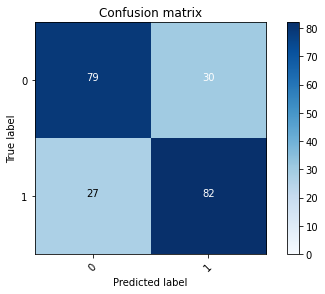

2022-08-02 19:18:54 - [Epoch Train: 25] loss: 0.0009, auc: 1.0000, acc: 1.0000, time: 61.00 s            
2022-08-02 19:18:54 - [Epoch Valid: 25] loss: 1.1258, auc: 0.8372, acc: 0.7385, time: 17.00 s


 17%|██████▋                                 | 25/150 [36:07<2:41:38, 77.59s/it]

2022-08-02 19:18:54 - EPOCH: 26
2022-08-02 19:18:58 - Train Step 10/192, train_loss: 0.0040
2022-08-02 19:19:01 - Train Step 20/192, train_loss: 0.0024
2022-08-02 19:19:04 - Train Step 30/192, train_loss: 0.0020
2022-08-02 19:19:07 - Train Step 40/192, train_loss: 0.0016
2022-08-02 19:19:10 - Train Step 50/192, train_loss: 0.0013
2022-08-02 19:19:13 - Train Step 60/192, train_loss: 0.0012
2022-08-02 19:19:16 - Train Step 70/192, train_loss: 0.0011
2022-08-02 19:19:19 - Train Step 80/192, train_loss: 0.0011
2022-08-02 19:19:22 - Train Step 90/192, train_loss: 0.0011
2022-08-02 19:19:25 - Train Step 100/192, train_loss: 0.0010
2022-08-02 19:19:29 - Train Step 110/192, train_loss: 0.0010
2022-08-02 19:19:32 - Train Step 120/192, train_loss: 0.0010
2022-08-02 19:19:35 - Train Step 130/192, train_loss: 0.0009
2022-08-02 19:19:38 - Train Step 140/192, train_loss: 0.0010
2022-08-02 19:19:41 - Train Step 150/192, train_loss: 0.0010
2022-08-02 19:19:44 - Train Step 160/192, train_loss: 0.0009
2

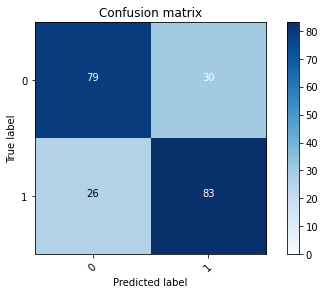

2022-08-02 19:20:11 - [Epoch Train: 26] loss: 0.0008, auc: 1.0000, acc: 1.0000, time: 59.00 s            
2022-08-02 19:20:11 - [Epoch Valid: 26] loss: 1.2724, auc: 0.8395, acc: 0.7431, time: 17.00 s


 17%|██████▉                                 | 26/150 [37:24<2:39:58, 77.41s/it]

2022-08-02 19:20:11 - EPOCH: 27
2022-08-02 19:20:15 - Train Step 10/192, train_loss: 0.0004
2022-08-02 19:20:18 - Train Step 20/192, train_loss: 0.0004
2022-08-02 19:20:21 - Train Step 30/192, train_loss: 0.0005
2022-08-02 19:20:24 - Train Step 40/192, train_loss: 0.0005
2022-08-02 19:20:27 - Train Step 50/192, train_loss: 0.0005
2022-08-02 19:20:30 - Train Step 60/192, train_loss: 0.0005
2022-08-02 19:20:33 - Train Step 70/192, train_loss: 0.0005
2022-08-02 19:20:36 - Train Step 80/192, train_loss: 0.0005
2022-08-02 19:20:39 - Train Step 90/192, train_loss: 0.0005
2022-08-02 19:20:42 - Train Step 100/192, train_loss: 0.0005
2022-08-02 19:20:45 - Train Step 110/192, train_loss: 0.0005
2022-08-02 19:20:48 - Train Step 120/192, train_loss: 0.0004
2022-08-02 19:20:51 - Train Step 130/192, train_loss: 0.0005
2022-08-02 19:20:54 - Train Step 140/192, train_loss: 0.0005
2022-08-02 19:20:57 - Train Step 150/192, train_loss: 0.0005
2022-08-02 19:21:01 - Train Step 160/192, train_loss: 0.0005
2

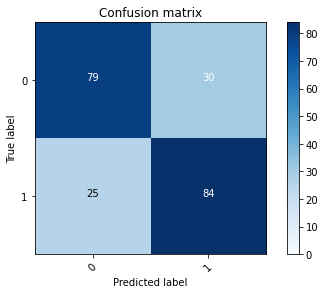

2022-08-02 19:21:27 - [Epoch Train: 27] loss: 0.0005, auc: 1.0000, acc: 1.0000, time: 58.00 s            
2022-08-02 19:21:27 - [Epoch Valid: 27] loss: 1.1737, auc: 0.8396, acc: 0.7477, time: 17.00 s


 18%|███████▏                                | 27/150 [38:40<2:37:56, 77.04s/it]

2022-08-02 19:21:27 - EPOCH: 28
2022-08-02 19:21:31 - Train Step 10/192, train_loss: 0.0004
2022-08-02 19:21:34 - Train Step 20/192, train_loss: 0.0003
2022-08-02 19:21:37 - Train Step 30/192, train_loss: 0.0004
2022-08-02 19:21:40 - Train Step 40/192, train_loss: 0.0004
2022-08-02 19:21:43 - Train Step 50/192, train_loss: 0.0005
2022-08-02 19:21:46 - Train Step 60/192, train_loss: 0.0007
2022-08-02 19:21:50 - Train Step 70/192, train_loss: 0.0007
2022-08-02 19:21:53 - Train Step 80/192, train_loss: 0.0007
2022-08-02 19:21:56 - Train Step 90/192, train_loss: 0.0006
2022-08-02 19:21:59 - Train Step 100/192, train_loss: 0.0006
2022-08-02 19:22:02 - Train Step 110/192, train_loss: 0.0006
2022-08-02 19:22:05 - Train Step 120/192, train_loss: 0.0006
2022-08-02 19:22:08 - Train Step 130/192, train_loss: 0.0006
2022-08-02 19:22:12 - Train Step 140/192, train_loss: 0.0006
2022-08-02 19:22:15 - Train Step 150/192, train_loss: 0.0006
2022-08-02 19:22:18 - Train Step 160/192, train_loss: 0.0005
2

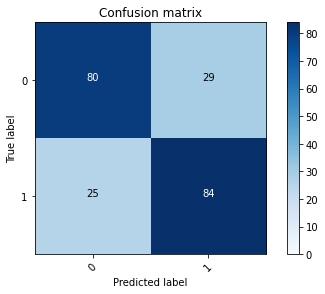

2022-08-02 19:22:44 - [Epoch Train: 28] loss: 0.0005, auc: 1.0000, acc: 1.0000, time: 60.00 s            
2022-08-02 19:22:44 - [Epoch Valid: 28] loss: 1.1754, auc: 0.8402, acc: 0.7523, time: 16.00 s


 19%|███████▍                                | 28/150 [39:57<2:36:35, 77.01s/it]

2022-08-02 19:22:44 - EPOCH: 29
2022-08-02 19:22:48 - Train Step 10/192, train_loss: 0.0021
2022-08-02 19:22:50 - Train Step 20/192, train_loss: 0.0012
2022-08-02 19:22:53 - Train Step 30/192, train_loss: 0.0010
2022-08-02 19:22:56 - Train Step 40/192, train_loss: 0.0010
2022-08-02 19:22:59 - Train Step 50/192, train_loss: 0.0008
2022-08-02 19:23:02 - Train Step 60/192, train_loss: 0.0008
2022-08-02 19:23:05 - Train Step 70/192, train_loss: 0.0007
2022-08-02 19:23:08 - Train Step 80/192, train_loss: 0.0006
2022-08-02 19:23:10 - Train Step 90/192, train_loss: 0.0006
2022-08-02 19:23:13 - Train Step 100/192, train_loss: 0.0006
2022-08-02 19:23:16 - Train Step 110/192, train_loss: 0.0006
2022-08-02 19:23:19 - Train Step 120/192, train_loss: 0.0006
2022-08-02 19:23:22 - Train Step 130/192, train_loss: 0.0006
2022-08-02 19:23:25 - Train Step 140/192, train_loss: 0.0006
2022-08-02 19:23:27 - Train Step 150/192, train_loss: 0.0006
2022-08-02 19:23:30 - Train Step 160/192, train_loss: 0.0005
2

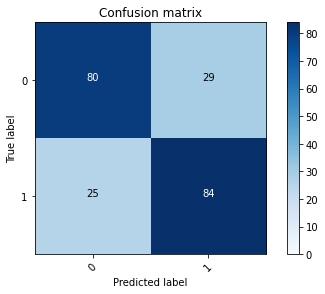

2022-08-02 19:23:55 - [Epoch Train: 29] loss: 0.0005, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:23:55 - [Epoch Valid: 29] loss: 1.1894, auc: 0.8397, acc: 0.7523, time: 16.00 s


 19%|███████▋                                | 29/150 [41:08<2:31:38, 75.20s/it]

2022-08-02 19:23:55 - EPOCH: 30
2022-08-02 19:23:58 - Train Step 10/192, train_loss: 0.0007
2022-08-02 19:24:02 - Train Step 20/192, train_loss: 0.0005
2022-08-02 19:24:05 - Train Step 30/192, train_loss: 0.0005
2022-08-02 19:24:07 - Train Step 40/192, train_loss: 0.0004
2022-08-02 19:24:10 - Train Step 50/192, train_loss: 0.0004
2022-08-02 19:24:13 - Train Step 60/192, train_loss: 0.0004
2022-08-02 19:24:16 - Train Step 70/192, train_loss: 0.0003
2022-08-02 19:24:19 - Train Step 80/192, train_loss: 0.0003
2022-08-02 19:24:22 - Train Step 90/192, train_loss: 0.0004
2022-08-02 19:24:24 - Train Step 100/192, train_loss: 0.0004
2022-08-02 19:24:27 - Train Step 110/192, train_loss: 0.0004
2022-08-02 19:24:30 - Train Step 120/192, train_loss: 0.0004
2022-08-02 19:24:33 - Train Step 130/192, train_loss: 0.0004
2022-08-02 19:24:36 - Train Step 140/192, train_loss: 0.0004
2022-08-02 19:24:39 - Train Step 150/192, train_loss: 0.0004
2022-08-02 19:24:42 - Train Step 160/192, train_loss: 0.0004
2

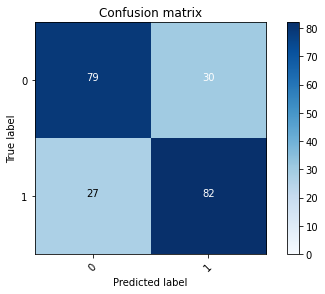

2022-08-02 19:25:07 - [Epoch Train: 30] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:25:07 - [Epoch Valid: 30] loss: 1.3140, auc: 0.8394, acc: 0.7385, time: 16.00 s


 20%|████████                                | 30/150 [42:19<2:28:19, 74.17s/it]

2022-08-02 19:25:07 - EPOCH: 31
2022-08-02 19:25:10 - Train Step 10/192, train_loss: 0.0005
2022-08-02 19:25:13 - Train Step 20/192, train_loss: 0.0004
2022-08-02 19:25:16 - Train Step 30/192, train_loss: 0.0004
2022-08-02 19:25:19 - Train Step 40/192, train_loss: 0.0005
2022-08-02 19:25:22 - Train Step 50/192, train_loss: 0.0005
2022-08-02 19:25:25 - Train Step 60/192, train_loss: 0.0005
2022-08-02 19:25:28 - Train Step 70/192, train_loss: 0.0005
2022-08-02 19:25:30 - Train Step 80/192, train_loss: 0.0005
2022-08-02 19:25:33 - Train Step 90/192, train_loss: 0.0004
2022-08-02 19:25:36 - Train Step 100/192, train_loss: 0.0004
2022-08-02 19:25:39 - Train Step 110/192, train_loss: 0.0004
2022-08-02 19:25:42 - Train Step 120/192, train_loss: 0.0004
2022-08-02 19:25:44 - Train Step 130/192, train_loss: 0.0004
2022-08-02 19:25:47 - Train Step 140/192, train_loss: 0.0004
2022-08-02 19:25:50 - Train Step 150/192, train_loss: 0.0004
2022-08-02 19:25:53 - Train Step 160/192, train_loss: 0.0004
2

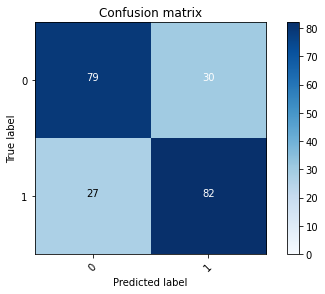

2022-08-02 19:26:18 - [Epoch Train: 31] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:26:18 - [Epoch Valid: 31] loss: 1.2612, auc: 0.8383, acc: 0.7385, time: 16.00 s


 21%|████████▎                               | 31/150 [43:30<2:24:58, 73.10s/it]

2022-08-02 19:26:18 - EPOCH: 32
2022-08-02 19:26:21 - Train Step 10/192, train_loss: 0.0002
2022-08-02 19:26:24 - Train Step 20/192, train_loss: 0.0002
2022-08-02 19:26:27 - Train Step 30/192, train_loss: 0.0003
2022-08-02 19:26:30 - Train Step 40/192, train_loss: 0.0002
2022-08-02 19:26:33 - Train Step 50/192, train_loss: 0.0002
2022-08-02 19:26:35 - Train Step 60/192, train_loss: 0.0002
2022-08-02 19:26:38 - Train Step 70/192, train_loss: 0.0003
2022-08-02 19:26:41 - Train Step 80/192, train_loss: 0.0002
2022-08-02 19:26:44 - Train Step 90/192, train_loss: 0.0002
2022-08-02 19:26:47 - Train Step 100/192, train_loss: 0.0003
2022-08-02 19:26:50 - Train Step 110/192, train_loss: 0.0003
2022-08-02 19:26:53 - Train Step 120/192, train_loss: 0.0003
2022-08-02 19:26:56 - Train Step 130/192, train_loss: 0.0003
2022-08-02 19:26:59 - Train Step 140/192, train_loss: 0.0003
2022-08-02 19:27:01 - Train Step 150/192, train_loss: 0.0003
2022-08-02 19:27:04 - Train Step 160/192, train_loss: 0.0003
2

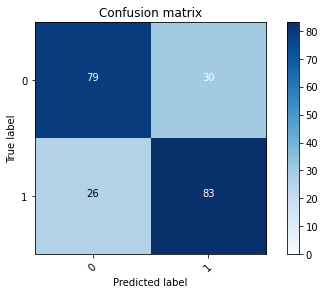

2022-08-02 19:27:29 - [Epoch Train: 32] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:27:29 - [Epoch Valid: 32] loss: 1.3291, auc: 0.8395, acc: 0.7431, time: 16.00 s


 21%|████████▌                               | 32/150 [44:42<2:22:56, 72.68s/it]

2022-08-02 19:27:29 - EPOCH: 33
2022-08-02 19:27:33 - Train Step 10/192, train_loss: 0.0002
2022-08-02 19:27:35 - Train Step 20/192, train_loss: 0.0002
2022-08-02 19:27:38 - Train Step 30/192, train_loss: 0.0002
2022-08-02 19:27:41 - Train Step 40/192, train_loss: 0.0002
2022-08-02 19:27:44 - Train Step 50/192, train_loss: 0.0002
2022-08-02 19:27:47 - Train Step 60/192, train_loss: 0.0002
2022-08-02 19:27:50 - Train Step 70/192, train_loss: 0.0002
2022-08-02 19:27:53 - Train Step 80/192, train_loss: 0.0002
2022-08-02 19:27:55 - Train Step 90/192, train_loss: 0.0002
2022-08-02 19:27:58 - Train Step 100/192, train_loss: 0.0002
2022-08-02 19:28:01 - Train Step 110/192, train_loss: 0.0002
2022-08-02 19:28:04 - Train Step 120/192, train_loss: 0.0003
2022-08-02 19:28:07 - Train Step 130/192, train_loss: 0.0003
2022-08-02 19:28:10 - Train Step 140/192, train_loss: 0.0003
2022-08-02 19:28:13 - Train Step 150/192, train_loss: 0.0003
2022-08-02 19:28:15 - Train Step 160/192, train_loss: 0.0003
2

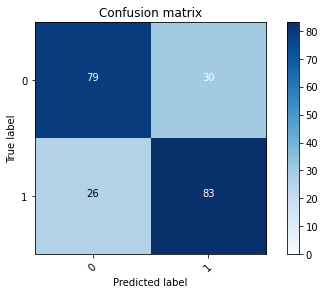

2022-08-02 19:28:41 - [Epoch Train: 33] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:28:41 - [Epoch Valid: 33] loss: 1.3465, auc: 0.8397, acc: 0.7431, time: 16.00 s


 22%|████████▊                               | 33/150 [45:53<2:21:01, 72.32s/it]

2022-08-02 19:28:41 - EPOCH: 34
2022-08-02 19:28:44 - Train Step 10/192, train_loss: 0.0002
2022-08-02 19:28:47 - Train Step 20/192, train_loss: 0.0002
2022-08-02 19:28:50 - Train Step 30/192, train_loss: 0.0003
2022-08-02 19:28:53 - Train Step 40/192, train_loss: 0.0002
2022-08-02 19:28:56 - Train Step 50/192, train_loss: 0.0003
2022-08-02 19:28:58 - Train Step 60/192, train_loss: 0.0002
2022-08-02 19:29:01 - Train Step 70/192, train_loss: 0.0002
2022-08-02 19:29:04 - Train Step 80/192, train_loss: 0.0002
2022-08-02 19:29:07 - Train Step 90/192, train_loss: 0.0003
2022-08-02 19:29:10 - Train Step 100/192, train_loss: 0.0003
2022-08-02 19:29:13 - Train Step 110/192, train_loss: 0.0003
2022-08-02 19:29:15 - Train Step 120/192, train_loss: 0.0003
2022-08-02 19:29:18 - Train Step 130/192, train_loss: 0.0002
2022-08-02 19:29:21 - Train Step 140/192, train_loss: 0.0002
2022-08-02 19:29:24 - Train Step 150/192, train_loss: 0.0002
2022-08-02 19:29:27 - Train Step 160/192, train_loss: 0.0002
2

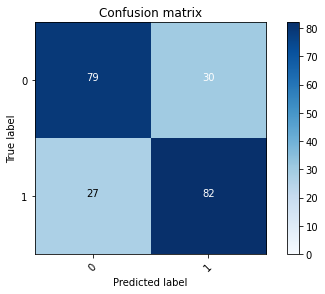

2022-08-02 19:29:52 - [Epoch Train: 34] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:29:52 - [Epoch Valid: 34] loss: 1.4034, auc: 0.8429, acc: 0.7385, time: 16.00 s


 23%|█████████                               | 34/150 [47:04<2:18:58, 71.89s/it]

2022-08-02 19:29:52 - EPOCH: 35
2022-08-02 19:29:55 - Train Step 10/192, train_loss: 0.0002
2022-08-02 19:29:58 - Train Step 20/192, train_loss: 0.0002
2022-08-02 19:30:01 - Train Step 30/192, train_loss: 0.0002
2022-08-02 19:30:03 - Train Step 40/192, train_loss: 0.0002
2022-08-02 19:30:06 - Train Step 50/192, train_loss: 0.0002
2022-08-02 19:30:09 - Train Step 60/192, train_loss: 0.0002
2022-08-02 19:30:12 - Train Step 70/192, train_loss: 0.0002
2022-08-02 19:30:15 - Train Step 80/192, train_loss: 0.0002
2022-08-02 19:30:18 - Train Step 90/192, train_loss: 0.0002
2022-08-02 19:30:21 - Train Step 100/192, train_loss: 0.0002
2022-08-02 19:30:24 - Train Step 110/192, train_loss: 0.0002
2022-08-02 19:30:26 - Train Step 120/192, train_loss: 0.0002
2022-08-02 19:30:29 - Train Step 130/192, train_loss: 0.0002
2022-08-02 19:30:32 - Train Step 140/192, train_loss: 0.0002
2022-08-02 19:30:35 - Train Step 150/192, train_loss: 0.0002
2022-08-02 19:30:38 - Train Step 160/192, train_loss: 0.0002
2

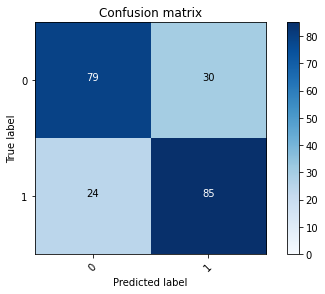

2022-08-02 19:31:03 - [Epoch Train: 35] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:31:03 - [Epoch Valid: 35] loss: 1.3910, auc: 0.8393, acc: 0.7523, time: 16.00 s


 23%|█████████▎                              | 35/150 [48:15<2:17:13, 71.59s/it]

2022-08-02 19:31:03 - EPOCH: 36
2022-08-02 19:31:06 - Train Step 10/192, train_loss: 0.0004
2022-08-02 19:31:09 - Train Step 20/192, train_loss: 0.0003
2022-08-02 19:31:11 - Train Step 30/192, train_loss: 0.0003
2022-08-02 19:31:14 - Train Step 40/192, train_loss: 0.0003
2022-08-02 19:31:17 - Train Step 50/192, train_loss: 0.0002
2022-08-02 19:31:20 - Train Step 60/192, train_loss: 0.0002
2022-08-02 19:31:23 - Train Step 70/192, train_loss: 0.0003
2022-08-02 19:31:26 - Train Step 80/192, train_loss: 0.0002
2022-08-02 19:31:29 - Train Step 90/192, train_loss: 0.0002
2022-08-02 19:31:32 - Train Step 100/192, train_loss: 0.0002
2022-08-02 19:31:35 - Train Step 110/192, train_loss: 0.0002
2022-08-02 19:31:37 - Train Step 120/192, train_loss: 0.0003
2022-08-02 19:31:40 - Train Step 130/192, train_loss: 0.0003
2022-08-02 19:31:43 - Train Step 140/192, train_loss: 0.0003
2022-08-02 19:31:46 - Train Step 150/192, train_loss: 0.0003
2022-08-02 19:31:49 - Train Step 160/192, train_loss: 0.0003
2

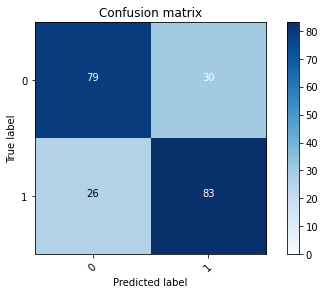

2022-08-02 19:32:14 - [Epoch Train: 36] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:32:14 - [Epoch Valid: 36] loss: 1.4845, auc: 0.8440, acc: 0.7431, time: 16.00 s


 24%|█████████▌                              | 36/150 [49:26<2:15:52, 71.51s/it]

2022-08-02 19:32:14 - EPOCH: 37
2022-08-02 19:32:17 - Train Step 10/192, train_loss: 0.0001
2022-08-02 19:32:20 - Train Step 20/192, train_loss: 0.0003
2022-08-02 19:32:23 - Train Step 30/192, train_loss: 0.0002
2022-08-02 19:32:26 - Train Step 40/192, train_loss: 0.0002
2022-08-02 19:32:29 - Train Step 50/192, train_loss: 0.0002
2022-08-02 19:32:32 - Train Step 60/192, train_loss: 0.0002
2022-08-02 19:32:35 - Train Step 70/192, train_loss: 0.0002
2022-08-02 19:32:37 - Train Step 80/192, train_loss: 0.0002
2022-08-02 19:32:40 - Train Step 90/192, train_loss: 0.0002
2022-08-02 19:32:43 - Train Step 100/192, train_loss: 0.0002
2022-08-02 19:32:46 - Train Step 110/192, train_loss: 0.0002
2022-08-02 19:32:49 - Train Step 120/192, train_loss: 0.0002
2022-08-02 19:32:52 - Train Step 130/192, train_loss: 0.0002
2022-08-02 19:32:54 - Train Step 140/192, train_loss: 0.0002
2022-08-02 19:32:57 - Train Step 150/192, train_loss: 0.0002
2022-08-02 19:33:00 - Train Step 160/192, train_loss: 0.0002
2

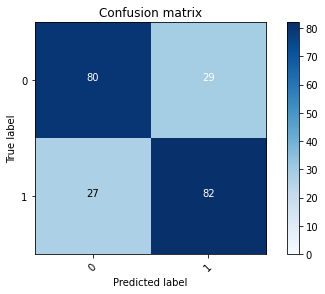

2022-08-02 19:33:26 - [Epoch Train: 37] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:33:26 - [Epoch Valid: 37] loss: 1.4060, auc: 0.8424, acc: 0.7431, time: 16.00 s


 25%|█████████▊                              | 37/150 [50:38<2:14:44, 71.54s/it]

2022-08-02 19:33:26 - EPOCH: 38
2022-08-02 19:33:29 - Train Step 10/192, train_loss: 0.0001
2022-08-02 19:33:32 - Train Step 20/192, train_loss: 0.0001
2022-08-02 19:33:35 - Train Step 30/192, train_loss: 0.0001
2022-08-02 19:33:38 - Train Step 40/192, train_loss: 0.0001
2022-08-02 19:33:41 - Train Step 50/192, train_loss: 0.0001
2022-08-02 19:33:44 - Train Step 60/192, train_loss: 0.0001
2022-08-02 19:33:47 - Train Step 70/192, train_loss: 0.0001
2022-08-02 19:33:49 - Train Step 80/192, train_loss: 0.0003
2022-08-02 19:33:52 - Train Step 90/192, train_loss: 0.0002
2022-08-02 19:33:55 - Train Step 100/192, train_loss: 0.0003
2022-08-02 19:33:58 - Train Step 110/192, train_loss: 0.0003
2022-08-02 19:34:01 - Train Step 120/192, train_loss: 0.0008
2022-08-02 19:34:04 - Train Step 130/192, train_loss: 0.0008
2022-08-02 19:34:07 - Train Step 140/192, train_loss: 0.0007
2022-08-02 19:34:10 - Train Step 150/192, train_loss: 0.0008
2022-08-02 19:34:13 - Train Step 160/192, train_loss: 0.0007
2

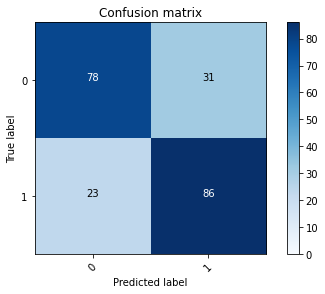

2022-08-02 19:34:38 - [Epoch Train: 38] loss: 0.0006, auc: 1.0000, acc: 1.0000, time: 56.00 s            
2022-08-02 19:34:38 - [Epoch Valid: 38] loss: 1.3973, auc: 0.8320, acc: 0.7523, time: 16.00 s


 25%|██████████▏                             | 38/150 [51:50<2:14:03, 71.82s/it]

2022-08-02 19:34:38 - EPOCH: 39
2022-08-02 19:34:41 - Train Step 10/192, train_loss: 0.0001
2022-08-02 19:34:44 - Train Step 20/192, train_loss: 0.0002
2022-08-02 19:34:47 - Train Step 30/192, train_loss: 0.0002
2022-08-02 19:34:50 - Train Step 40/192, train_loss: 0.0002
2022-08-02 19:34:53 - Train Step 50/192, train_loss: 0.0002
2022-08-02 19:34:56 - Train Step 60/192, train_loss: 0.0002
2022-08-02 19:34:59 - Train Step 70/192, train_loss: 0.0002
2022-08-02 19:35:02 - Train Step 80/192, train_loss: 0.0002
2022-08-02 19:35:05 - Train Step 90/192, train_loss: 0.0002
2022-08-02 19:35:08 - Train Step 100/192, train_loss: 0.0002
2022-08-02 19:35:11 - Train Step 110/192, train_loss: 0.0002
2022-08-02 19:35:14 - Train Step 120/192, train_loss: 0.0002
2022-08-02 19:35:16 - Train Step 130/192, train_loss: 0.0002
2022-08-02 19:35:19 - Train Step 140/192, train_loss: 0.0002
2022-08-02 19:35:22 - Train Step 150/192, train_loss: 0.0002
2022-08-02 19:35:25 - Train Step 160/192, train_loss: 0.0002
2

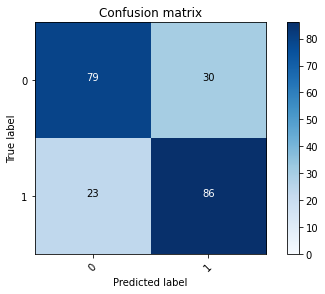

2022-08-02 19:35:50 - [Epoch Train: 39] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:35:50 - [Epoch Valid: 39] loss: 1.4755, auc: 0.8360, acc: 0.7569, time: 16.00 s
2022-08-02 19:35:50 - acc improved from 0.7569 to 0.7569. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e39-loss1.475-acc0.757-auc0.836.pth'


 26%|██████████▍                             | 39/150 [53:02<2:12:55, 71.85s/it]

2022-08-02 19:35:50 - EPOCH: 40
2022-08-02 19:35:53 - Train Step 10/192, train_loss: 0.0006
2022-08-02 19:35:56 - Train Step 20/192, train_loss: 0.0003
2022-08-02 19:35:59 - Train Step 30/192, train_loss: 0.0003
2022-08-02 19:36:02 - Train Step 40/192, train_loss: 0.0003
2022-08-02 19:36:05 - Train Step 50/192, train_loss: 0.0003
2022-08-02 19:36:08 - Train Step 60/192, train_loss: 0.0002
2022-08-02 19:36:10 - Train Step 70/192, train_loss: 0.0002
2022-08-02 19:36:13 - Train Step 80/192, train_loss: 0.0002
2022-08-02 19:36:16 - Train Step 90/192, train_loss: 0.0002
2022-08-02 19:36:19 - Train Step 100/192, train_loss: 0.0002
2022-08-02 19:36:22 - Train Step 110/192, train_loss: 0.0002
2022-08-02 19:36:25 - Train Step 120/192, train_loss: 0.0002
2022-08-02 19:36:28 - Train Step 130/192, train_loss: 0.0002
2022-08-02 19:36:30 - Train Step 140/192, train_loss: 0.0002
2022-08-02 19:36:33 - Train Step 150/192, train_loss: 0.0002
2022-08-02 19:36:36 - Train Step 160/192, train_loss: 0.0002
2

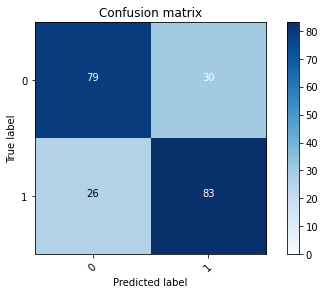

2022-08-02 19:37:01 - [Epoch Train: 40] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:37:01 - [Epoch Valid: 40] loss: 1.4494, auc: 0.8421, acc: 0.7431, time: 15.00 s


 27%|██████████▋                             | 40/150 [54:13<2:11:06, 71.51s/it]

2022-08-02 19:37:01 - EPOCH: 41
2022-08-02 19:37:04 - Train Step 10/192, train_loss: 0.0001
2022-08-02 19:37:07 - Train Step 20/192, train_loss: 0.0001
2022-08-02 19:37:10 - Train Step 30/192, train_loss: 0.0001
2022-08-02 19:37:13 - Train Step 40/192, train_loss: 0.0001
2022-08-02 19:37:15 - Train Step 50/192, train_loss: 0.0001
2022-08-02 19:37:18 - Train Step 60/192, train_loss: 0.0001
2022-08-02 19:37:21 - Train Step 70/192, train_loss: 0.0001
2022-08-02 19:37:24 - Train Step 80/192, train_loss: 0.0001
2022-08-02 19:37:27 - Train Step 90/192, train_loss: 0.0001
2022-08-02 19:37:30 - Train Step 100/192, train_loss: 0.0001
2022-08-02 19:37:32 - Train Step 110/192, train_loss: 0.0001
2022-08-02 19:37:35 - Train Step 120/192, train_loss: 0.0001
2022-08-02 19:37:38 - Train Step 130/192, train_loss: 0.0001
2022-08-02 19:37:41 - Train Step 140/192, train_loss: 0.0001
2022-08-02 19:37:44 - Train Step 150/192, train_loss: 0.0001
2022-08-02 19:37:47 - Train Step 160/192, train_loss: 0.0001
2

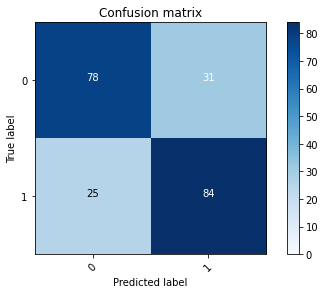

2022-08-02 19:38:11 - [Epoch Train: 41] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:38:11 - [Epoch Valid: 41] loss: 1.4362, auc: 0.8408, acc: 0.7431, time: 16.00 s


 27%|██████████▉                             | 41/150 [55:24<2:09:29, 71.28s/it]

2022-08-02 19:38:11 - EPOCH: 42
2022-08-02 19:38:15 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:38:17 - Train Step 20/192, train_loss: 0.0001
2022-08-02 19:38:20 - Train Step 30/192, train_loss: 0.0001
2022-08-02 19:38:23 - Train Step 40/192, train_loss: 0.0001
2022-08-02 19:38:26 - Train Step 50/192, train_loss: 0.0001
2022-08-02 19:38:29 - Train Step 60/192, train_loss: 0.0001
2022-08-02 19:38:32 - Train Step 70/192, train_loss: 0.0001
2022-08-02 19:38:34 - Train Step 80/192, train_loss: 0.0001
2022-08-02 19:38:37 - Train Step 90/192, train_loss: 0.0001
2022-08-02 19:38:40 - Train Step 100/192, train_loss: 0.0001
2022-08-02 19:38:43 - Train Step 110/192, train_loss: 0.0001
2022-08-02 19:38:46 - Train Step 120/192, train_loss: 0.0001
2022-08-02 19:38:49 - Train Step 130/192, train_loss: 0.0001
2022-08-02 19:38:51 - Train Step 140/192, train_loss: 0.0001
2022-08-02 19:38:54 - Train Step 150/192, train_loss: 0.0001
2022-08-02 19:38:57 - Train Step 160/192, train_loss: 0.0001
2

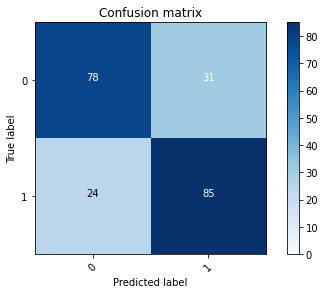

2022-08-02 19:39:22 - [Epoch Train: 42] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:39:22 - [Epoch Valid: 42] loss: 1.4697, auc: 0.8415, acc: 0.7477, time: 16.00 s


 28%|███████████▏                            | 42/150 [56:35<2:07:57, 71.09s/it]

2022-08-02 19:39:22 - EPOCH: 43
2022-08-02 19:39:26 - Train Step 10/192, train_loss: 0.0002
2022-08-02 19:39:28 - Train Step 20/192, train_loss: 0.0001
2022-08-02 19:39:31 - Train Step 30/192, train_loss: 0.0001
2022-08-02 19:39:34 - Train Step 40/192, train_loss: 0.0001
2022-08-02 19:39:37 - Train Step 50/192, train_loss: 0.0001
2022-08-02 19:39:40 - Train Step 60/192, train_loss: 0.0001
2022-08-02 19:39:43 - Train Step 70/192, train_loss: 0.0001
2022-08-02 19:39:46 - Train Step 80/192, train_loss: 0.0001
2022-08-02 19:39:49 - Train Step 90/192, train_loss: 0.0001
2022-08-02 19:39:52 - Train Step 100/192, train_loss: 0.0001
2022-08-02 19:39:54 - Train Step 110/192, train_loss: 0.0001
2022-08-02 19:39:57 - Train Step 120/192, train_loss: 0.0001
2022-08-02 19:40:00 - Train Step 130/192, train_loss: 0.0001
2022-08-02 19:40:03 - Train Step 140/192, train_loss: 0.0001
2022-08-02 19:40:06 - Train Step 150/192, train_loss: 0.0001
2022-08-02 19:40:09 - Train Step 160/192, train_loss: 0.0001
2

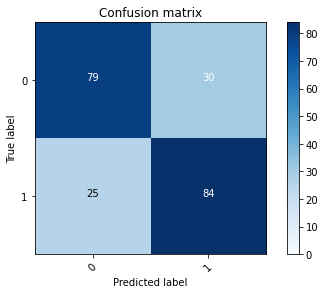

2022-08-02 19:40:34 - [Epoch Train: 43] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:40:34 - [Epoch Valid: 43] loss: 1.5317, auc: 0.8439, acc: 0.7477, time: 16.00 s


 29%|███████████▍                            | 43/150 [57:46<2:07:00, 71.22s/it]

2022-08-02 19:40:34 - EPOCH: 44
2022-08-02 19:40:37 - Train Step 10/192, train_loss: 0.0001
2022-08-02 19:40:40 - Train Step 20/192, train_loss: 0.0001
2022-08-02 19:40:43 - Train Step 30/192, train_loss: 0.0001
2022-08-02 19:40:45 - Train Step 40/192, train_loss: 0.0001
2022-08-02 19:40:48 - Train Step 50/192, train_loss: 0.0001
2022-08-02 19:40:51 - Train Step 60/192, train_loss: 0.0001
2022-08-02 19:40:54 - Train Step 70/192, train_loss: 0.0001
2022-08-02 19:40:57 - Train Step 80/192, train_loss: 0.0001
2022-08-02 19:41:00 - Train Step 90/192, train_loss: 0.0001
2022-08-02 19:41:03 - Train Step 100/192, train_loss: 0.0001
2022-08-02 19:41:06 - Train Step 110/192, train_loss: 0.0001
2022-08-02 19:41:08 - Train Step 120/192, train_loss: 0.0001
2022-08-02 19:41:11 - Train Step 130/192, train_loss: 0.0001
2022-08-02 19:41:14 - Train Step 140/192, train_loss: 0.0001
2022-08-02 19:41:17 - Train Step 150/192, train_loss: 0.0001
2022-08-02 19:41:20 - Train Step 160/192, train_loss: 0.0001
2

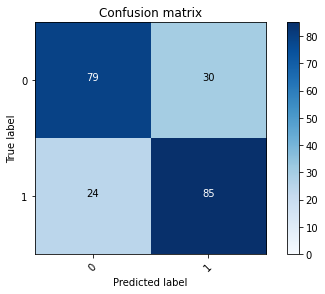

2022-08-02 19:41:44 - [Epoch Train: 44] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:41:44 - [Epoch Valid: 44] loss: 1.6365, auc: 0.8424, acc: 0.7523, time: 15.00 s


 29%|███████████▋                            | 44/150 [58:57<2:05:26, 71.00s/it]

2022-08-02 19:41:44 - EPOCH: 45
2022-08-02 19:41:47 - Train Step 10/192, train_loss: 0.0001
2022-08-02 19:41:50 - Train Step 20/192, train_loss: 0.0001
2022-08-02 19:41:53 - Train Step 30/192, train_loss: 0.0001
2022-08-02 19:41:56 - Train Step 40/192, train_loss: 0.0001
2022-08-02 19:41:59 - Train Step 50/192, train_loss: 0.0001
2022-08-02 19:42:02 - Train Step 60/192, train_loss: 0.0001
2022-08-02 19:42:05 - Train Step 70/192, train_loss: 0.0001
2022-08-02 19:42:07 - Train Step 80/192, train_loss: 0.0001
2022-08-02 19:42:10 - Train Step 90/192, train_loss: 0.0001
2022-08-02 19:42:13 - Train Step 100/192, train_loss: 0.0001
2022-08-02 19:42:16 - Train Step 110/192, train_loss: 0.0001
2022-08-02 19:42:19 - Train Step 120/192, train_loss: 0.0001
2022-08-02 19:42:22 - Train Step 130/192, train_loss: 0.0001
2022-08-02 19:42:24 - Train Step 140/192, train_loss: 0.0001
2022-08-02 19:42:27 - Train Step 150/192, train_loss: 0.0001
2022-08-02 19:42:30 - Train Step 160/192, train_loss: 0.0001
2

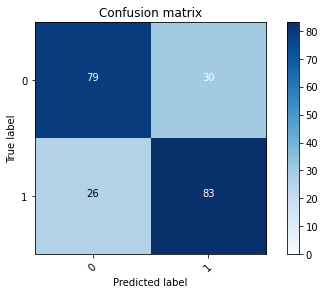

2022-08-02 19:42:56 - [Epoch Train: 45] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:42:56 - [Epoch Valid: 45] loss: 1.5123, auc: 0.8490, acc: 0.7431, time: 16.00 s


 30%|███████████▍                          | 45/150 [1:00:08<2:04:30, 71.15s/it]

2022-08-02 19:42:56 - EPOCH: 46
2022-08-02 19:42:59 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:43:02 - Train Step 20/192, train_loss: 0.0001
2022-08-02 19:43:05 - Train Step 30/192, train_loss: 0.0001
2022-08-02 19:43:07 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:43:10 - Train Step 50/192, train_loss: 0.0001
2022-08-02 19:43:13 - Train Step 60/192, train_loss: 0.0001
2022-08-02 19:43:16 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:43:19 - Train Step 80/192, train_loss: 0.0000
2022-08-02 19:43:22 - Train Step 90/192, train_loss: 0.0000
2022-08-02 19:43:25 - Train Step 100/192, train_loss: 0.0000
2022-08-02 19:43:27 - Train Step 110/192, train_loss: 0.0000
2022-08-02 19:43:30 - Train Step 120/192, train_loss: 0.0001
2022-08-02 19:43:33 - Train Step 130/192, train_loss: 0.0001
2022-08-02 19:43:36 - Train Step 140/192, train_loss: 0.0001
2022-08-02 19:43:39 - Train Step 150/192, train_loss: 0.0001
2022-08-02 19:43:42 - Train Step 160/192, train_loss: 0.0001
2

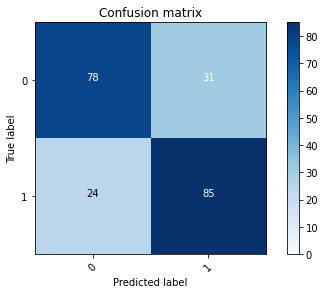

2022-08-02 19:44:06 - [Epoch Train: 46] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:44:06 - [Epoch Valid: 46] loss: 1.5393, auc: 0.8412, acc: 0.7477, time: 15.00 s


 31%|███████████▋                          | 46/150 [1:01:19<2:03:09, 71.05s/it]

2022-08-02 19:44:06 - EPOCH: 47
2022-08-02 19:44:09 - Train Step 10/192, train_loss: 0.0001
2022-08-02 19:44:12 - Train Step 20/192, train_loss: 0.0001
2022-08-02 19:44:15 - Train Step 30/192, train_loss: 0.0001
2022-08-02 19:44:18 - Train Step 40/192, train_loss: 0.0001
2022-08-02 19:44:21 - Train Step 50/192, train_loss: 0.0001
2022-08-02 19:44:24 - Train Step 60/192, train_loss: 0.0002
2022-08-02 19:44:27 - Train Step 70/192, train_loss: 0.0001
2022-08-02 19:44:30 - Train Step 80/192, train_loss: 0.0001
2022-08-02 19:44:33 - Train Step 90/192, train_loss: 0.0001
2022-08-02 19:44:36 - Train Step 100/192, train_loss: 0.0001
2022-08-02 19:44:39 - Train Step 110/192, train_loss: 0.0001
2022-08-02 19:44:41 - Train Step 120/192, train_loss: 0.0001
2022-08-02 19:44:44 - Train Step 130/192, train_loss: 0.0001
2022-08-02 19:44:47 - Train Step 140/192, train_loss: 0.0001
2022-08-02 19:44:50 - Train Step 150/192, train_loss: 0.0001
2022-08-02 19:44:53 - Train Step 160/192, train_loss: 0.0001
2

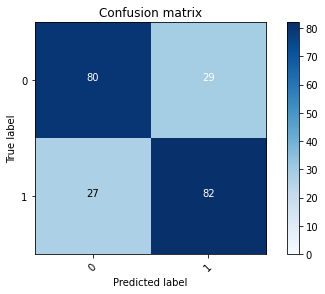

2022-08-02 19:45:18 - [Epoch Train: 47] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:45:18 - [Epoch Valid: 47] loss: 1.5740, auc: 0.8459, acc: 0.7431, time: 16.00 s


 31%|███████████▉                          | 47/150 [1:02:30<2:02:03, 71.10s/it]

2022-08-02 19:45:18 - EPOCH: 48
2022-08-02 19:45:21 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:45:24 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:45:27 - Train Step 30/192, train_loss: 0.0000
2022-08-02 19:45:29 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:45:32 - Train Step 50/192, train_loss: 0.0000
2022-08-02 19:45:35 - Train Step 60/192, train_loss: 0.0000
2022-08-02 19:45:38 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:45:41 - Train Step 80/192, train_loss: 0.0000
2022-08-02 19:45:44 - Train Step 90/192, train_loss: 0.0000
2022-08-02 19:45:47 - Train Step 100/192, train_loss: 0.0000
2022-08-02 19:45:49 - Train Step 110/192, train_loss: 0.0000
2022-08-02 19:45:52 - Train Step 120/192, train_loss: 0.0000
2022-08-02 19:45:55 - Train Step 130/192, train_loss: 0.0000
2022-08-02 19:45:58 - Train Step 140/192, train_loss: 0.0001
2022-08-02 19:46:01 - Train Step 150/192, train_loss: 0.0001
2022-08-02 19:46:04 - Train Step 160/192, train_loss: 0.0000
2

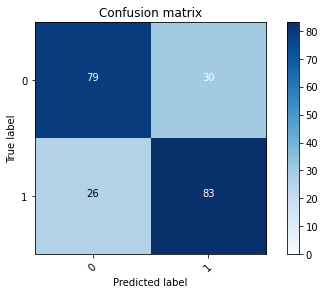

2022-08-02 19:46:29 - [Epoch Train: 48] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:46:29 - [Epoch Valid: 48] loss: 1.5786, auc: 0.8424, acc: 0.7431, time: 16.00 s


 32%|████████████▏                         | 48/150 [1:03:41<2:01:02, 71.20s/it]

2022-08-02 19:46:29 - EPOCH: 49
2022-08-02 19:46:32 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:46:35 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:46:38 - Train Step 30/192, train_loss: 0.0000
2022-08-02 19:46:40 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:46:43 - Train Step 50/192, train_loss: 0.0002
2022-08-02 19:46:46 - Train Step 60/192, train_loss: 0.0002
2022-08-02 19:46:49 - Train Step 70/192, train_loss: 0.0002
2022-08-02 19:46:52 - Train Step 80/192, train_loss: 0.0002
2022-08-02 19:46:55 - Train Step 90/192, train_loss: 0.0001
2022-08-02 19:46:58 - Train Step 100/192, train_loss: 0.0001
2022-08-02 19:47:01 - Train Step 110/192, train_loss: 0.0001
2022-08-02 19:47:03 - Train Step 120/192, train_loss: 0.0001
2022-08-02 19:47:06 - Train Step 130/192, train_loss: 0.0001
2022-08-02 19:47:09 - Train Step 140/192, train_loss: 0.0001
2022-08-02 19:47:12 - Train Step 150/192, train_loss: 0.0001
2022-08-02 19:47:14 - Train Step 160/192, train_loss: 0.0001
2

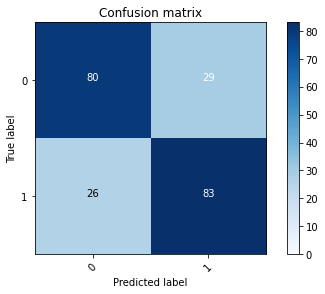

2022-08-02 19:47:39 - [Epoch Train: 49] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-02 19:47:39 - [Epoch Valid: 49] loss: 1.6772, auc: 0.8398, acc: 0.7477, time: 16.00 s


 33%|████████████▍                         | 49/150 [1:04:52<1:59:19, 70.88s/it]

2022-08-02 19:47:39 - EPOCH: 50
2022-08-02 19:47:42 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:47:45 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:47:48 - Train Step 30/192, train_loss: 0.0000
2022-08-02 19:47:51 - Train Step 40/192, train_loss: 0.0001
2022-08-02 19:47:54 - Train Step 50/192, train_loss: 0.0001
2022-08-02 19:47:56 - Train Step 60/192, train_loss: 0.0001
2022-08-02 19:47:59 - Train Step 70/192, train_loss: 0.0001
2022-08-02 19:48:02 - Train Step 80/192, train_loss: 0.0001
2022-08-02 19:48:05 - Train Step 90/192, train_loss: 0.0001
2022-08-02 19:48:08 - Train Step 100/192, train_loss: 0.0001
2022-08-02 19:48:11 - Train Step 110/192, train_loss: 0.0001
2022-08-02 19:48:14 - Train Step 120/192, train_loss: 0.0001
2022-08-02 19:48:16 - Train Step 130/192, train_loss: 0.0000
2022-08-02 19:48:19 - Train Step 140/192, train_loss: 0.0000
2022-08-02 19:48:22 - Train Step 150/192, train_loss: 0.0000
2022-08-02 19:48:25 - Train Step 160/192, train_loss: 0.0000
2

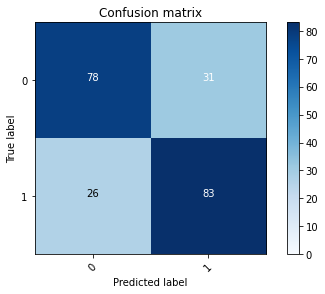

2022-08-02 19:48:51 - [Epoch Train: 50] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:48:51 - [Epoch Valid: 50] loss: 1.6713, auc: 0.8411, acc: 0.7385, time: 16.00 s


 33%|████████████▋                         | 50/150 [1:06:03<1:58:23, 71.03s/it]

2022-08-02 19:48:51 - EPOCH: 51
2022-08-02 19:48:54 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:48:57 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:48:59 - Train Step 30/192, train_loss: 0.0002
2022-08-02 19:49:02 - Train Step 40/192, train_loss: 0.0001
2022-08-02 19:49:05 - Train Step 50/192, train_loss: 0.0001
2022-08-02 19:49:08 - Train Step 60/192, train_loss: 0.0001
2022-08-02 19:49:11 - Train Step 70/192, train_loss: 0.0001
2022-08-02 19:49:14 - Train Step 80/192, train_loss: 0.0001
2022-08-02 19:49:17 - Train Step 90/192, train_loss: 0.0001
2022-08-02 19:49:20 - Train Step 100/192, train_loss: 0.0001
2022-08-02 19:49:23 - Train Step 110/192, train_loss: 0.0001
2022-08-02 19:49:26 - Train Step 120/192, train_loss: 0.0001
2022-08-02 19:49:29 - Train Step 130/192, train_loss: 0.0001
2022-08-02 19:49:32 - Train Step 140/192, train_loss: 0.0001
2022-08-02 19:49:34 - Train Step 150/192, train_loss: 0.0001
2022-08-02 19:49:37 - Train Step 160/192, train_loss: 0.0001
2

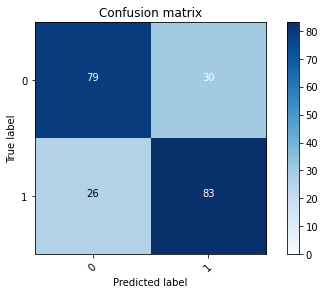

2022-08-02 19:50:02 - [Epoch Train: 51] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:50:02 - [Epoch Valid: 51] loss: 1.5804, auc: 0.8418, acc: 0.7431, time: 16.00 s


 34%|████████████▉                         | 51/150 [1:07:15<1:57:35, 71.27s/it]

2022-08-02 19:50:02 - EPOCH: 52
2022-08-02 19:50:05 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:50:08 - Train Step 20/192, train_loss: 0.0001
2022-08-02 19:50:11 - Train Step 30/192, train_loss: 0.0001
2022-08-02 19:50:14 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:50:17 - Train Step 50/192, train_loss: 0.0000
2022-08-02 19:50:20 - Train Step 60/192, train_loss: 0.0000
2022-08-02 19:50:23 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:50:26 - Train Step 80/192, train_loss: 0.0000
2022-08-02 19:50:29 - Train Step 90/192, train_loss: 0.0000
2022-08-02 19:50:31 - Train Step 100/192, train_loss: 0.0000
2022-08-02 19:50:34 - Train Step 110/192, train_loss: 0.0000
2022-08-02 19:50:37 - Train Step 120/192, train_loss: 0.0000
2022-08-02 19:50:40 - Train Step 130/192, train_loss: 0.0000
2022-08-02 19:50:43 - Train Step 140/192, train_loss: 0.0000
2022-08-02 19:50:46 - Train Step 150/192, train_loss: 0.0000
2022-08-02 19:50:48 - Train Step 160/192, train_loss: 0.0000
2

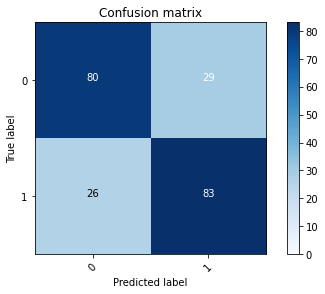

2022-08-02 19:51:14 - [Epoch Train: 52] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:51:14 - [Epoch Valid: 52] loss: 1.5546, auc: 0.8462, acc: 0.7477, time: 16.00 s


 35%|█████████████▏                        | 52/150 [1:08:26<1:56:19, 71.22s/it]

2022-08-02 19:51:14 - EPOCH: 53
2022-08-02 19:51:17 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:51:20 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:51:23 - Train Step 30/192, train_loss: 0.0001
2022-08-02 19:51:26 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:51:29 - Train Step 50/192, train_loss: 0.0000
2022-08-02 19:51:32 - Train Step 60/192, train_loss: 0.0000
2022-08-02 19:51:35 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:51:38 - Train Step 80/192, train_loss: 0.0000
2022-08-02 19:51:41 - Train Step 90/192, train_loss: 0.0000
2022-08-02 19:51:44 - Train Step 100/192, train_loss: 0.0000
2022-08-02 19:51:47 - Train Step 110/192, train_loss: 0.0000
2022-08-02 19:51:50 - Train Step 120/192, train_loss: 0.0000
2022-08-02 19:51:53 - Train Step 130/192, train_loss: 0.0000
2022-08-02 19:51:56 - Train Step 140/192, train_loss: 0.0000
2022-08-02 19:51:58 - Train Step 150/192, train_loss: 0.0000
2022-08-02 19:52:01 - Train Step 160/192, train_loss: 0.0000
2

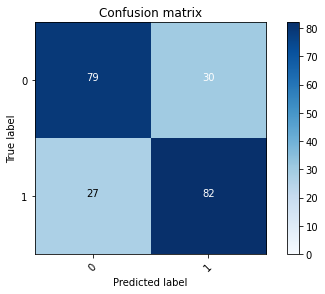

2022-08-02 19:52:26 - [Epoch Train: 53] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 57.00 s            
2022-08-02 19:52:26 - [Epoch Valid: 53] loss: 1.6458, auc: 0.8448, acc: 0.7385, time: 15.00 s


 35%|█████████████▍                        | 53/150 [1:09:39<1:55:58, 71.74s/it]

2022-08-02 19:52:26 - EPOCH: 54
2022-08-02 19:52:30 - Train Step 10/192, train_loss: 0.0001
2022-08-02 19:52:33 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:52:36 - Train Step 30/192, train_loss: 0.0000
2022-08-02 19:52:38 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:52:41 - Train Step 50/192, train_loss: 0.0000
2022-08-02 19:52:44 - Train Step 60/192, train_loss: 0.0000
2022-08-02 19:52:47 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:52:50 - Train Step 80/192, train_loss: 0.0000
2022-08-02 19:52:53 - Train Step 90/192, train_loss: 0.0000
2022-08-02 19:52:56 - Train Step 100/192, train_loss: 0.0000
2022-08-02 19:52:59 - Train Step 110/192, train_loss: 0.0000
2022-08-02 19:53:02 - Train Step 120/192, train_loss: 0.0000
2022-08-02 19:53:04 - Train Step 130/192, train_loss: 0.0000
2022-08-02 19:53:07 - Train Step 140/192, train_loss: 0.0000
2022-08-02 19:53:10 - Train Step 150/192, train_loss: 0.0000
2022-08-02 19:53:13 - Train Step 160/192, train_loss: 0.0000
2

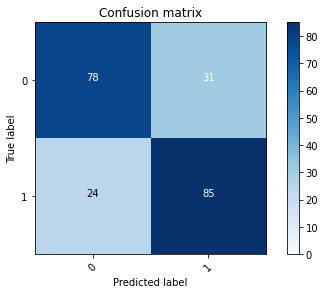

2022-08-02 19:53:38 - [Epoch Train: 54] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:53:38 - [Epoch Valid: 54] loss: 1.6809, auc: 0.8444, acc: 0.7477, time: 16.00 s


 36%|█████████████▋                        | 54/150 [1:10:51<1:54:51, 71.78s/it]

2022-08-02 19:53:38 - EPOCH: 55
2022-08-02 19:53:42 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:53:44 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:53:47 - Train Step 30/192, train_loss: 0.0000
2022-08-02 19:53:50 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:53:53 - Train Step 50/192, train_loss: 0.0000
2022-08-02 19:53:56 - Train Step 60/192, train_loss: 0.0000
2022-08-02 19:53:59 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:54:01 - Train Step 80/192, train_loss: 0.0000
2022-08-02 19:54:04 - Train Step 90/192, train_loss: 0.0000
2022-08-02 19:54:07 - Train Step 100/192, train_loss: 0.0000
2022-08-02 19:54:10 - Train Step 110/192, train_loss: 0.0000
2022-08-02 19:54:13 - Train Step 120/192, train_loss: 0.0000
2022-08-02 19:54:16 - Train Step 130/192, train_loss: 0.0000
2022-08-02 19:54:19 - Train Step 140/192, train_loss: 0.0000
2022-08-02 19:54:21 - Train Step 150/192, train_loss: 0.0000
2022-08-02 19:54:24 - Train Step 160/192, train_loss: 0.0000
2

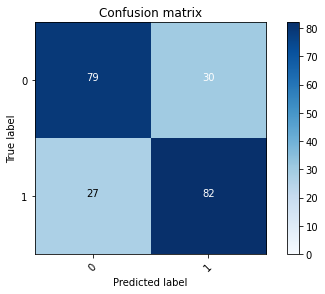

2022-08-02 19:54:49 - [Epoch Train: 55] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:54:49 - [Epoch Valid: 55] loss: 1.7003, auc: 0.8460, acc: 0.7385, time: 16.00 s


 37%|█████████████▉                        | 55/150 [1:12:02<1:53:17, 71.55s/it]

2022-08-02 19:54:49 - EPOCH: 56
2022-08-02 19:54:53 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:54:55 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:54:58 - Train Step 30/192, train_loss: 0.0000
2022-08-02 19:55:01 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:55:04 - Train Step 50/192, train_loss: 0.0000
2022-08-02 19:55:07 - Train Step 60/192, train_loss: 0.0000
2022-08-02 19:55:10 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:55:12 - Train Step 80/192, train_loss: 0.0000
2022-08-02 19:55:15 - Train Step 90/192, train_loss: 0.0000
2022-08-02 19:55:18 - Train Step 100/192, train_loss: 0.0000
2022-08-02 19:55:21 - Train Step 110/192, train_loss: 0.0000
2022-08-02 19:55:24 - Train Step 120/192, train_loss: 0.0000
2022-08-02 19:55:26 - Train Step 130/192, train_loss: 0.0000
2022-08-02 19:55:29 - Train Step 140/192, train_loss: 0.0000
2022-08-02 19:55:32 - Train Step 150/192, train_loss: 0.0000
2022-08-02 19:55:35 - Train Step 160/192, train_loss: 0.0000
2

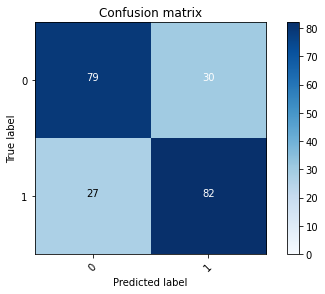

2022-08-02 19:56:00 - [Epoch Train: 56] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:56:00 - [Epoch Valid: 56] loss: 1.7020, auc: 0.8421, acc: 0.7385, time: 16.00 s


 37%|██████████████▏                       | 56/150 [1:13:13<1:51:46, 71.34s/it]

2022-08-02 19:56:00 - EPOCH: 57
2022-08-02 19:56:03 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:56:06 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:56:09 - Train Step 30/192, train_loss: 0.0000
2022-08-02 19:56:12 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:56:15 - Train Step 50/192, train_loss: 0.0000
2022-08-02 19:56:18 - Train Step 60/192, train_loss: 0.0000
2022-08-02 19:56:21 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:56:24 - Train Step 80/192, train_loss: 0.0000
2022-08-02 19:56:27 - Train Step 90/192, train_loss: 0.0000
2022-08-02 19:56:29 - Train Step 100/192, train_loss: 0.0000
2022-08-02 19:56:32 - Train Step 110/192, train_loss: 0.0000
2022-08-02 19:56:35 - Train Step 120/192, train_loss: 0.0000
2022-08-02 19:56:38 - Train Step 130/192, train_loss: 0.0000
2022-08-02 19:56:41 - Train Step 140/192, train_loss: 0.0000
2022-08-02 19:56:44 - Train Step 150/192, train_loss: 0.0000
2022-08-02 19:56:47 - Train Step 160/192, train_loss: 0.0000
2

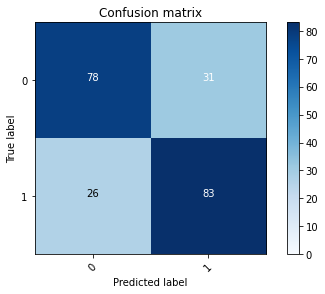

2022-08-02 19:57:12 - [Epoch Train: 57] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 19:57:12 - [Epoch Valid: 57] loss: 1.7027, auc: 0.8475, acc: 0.7385, time: 16.00 s


 38%|██████████████▍                       | 57/150 [1:14:25<1:50:52, 71.53s/it]

2022-08-02 19:57:12 - EPOCH: 58
2022-08-02 19:57:15 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:57:18 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:57:21 - Train Step 30/192, train_loss: 0.0000
2022-08-02 19:57:24 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:57:27 - Train Step 50/192, train_loss: 0.0000
2022-08-02 19:57:29 - Train Step 60/192, train_loss: 0.0000
2022-08-02 19:57:32 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:57:35 - Train Step 80/192, train_loss: 0.0000
2022-08-02 19:57:38 - Train Step 90/192, train_loss: 0.0000
2022-08-02 19:57:41 - Train Step 100/192, train_loss: 0.0000
2022-08-02 19:57:44 - Train Step 110/192, train_loss: 0.0000
2022-08-02 19:57:46 - Train Step 120/192, train_loss: 0.0000
2022-08-02 19:57:49 - Train Step 130/192, train_loss: 0.0000
2022-08-02 19:57:52 - Train Step 140/192, train_loss: 0.0000
2022-08-02 19:57:55 - Train Step 150/192, train_loss: 0.0000
2022-08-02 19:57:57 - Train Step 160/192, train_loss: 0.0000
2

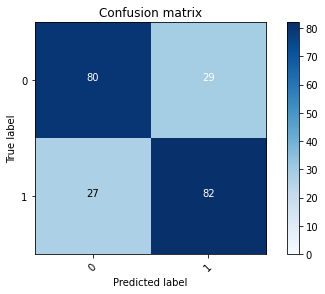

2022-08-02 19:58:22 - [Epoch Train: 58] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-02 19:58:22 - [Epoch Valid: 58] loss: 1.7505, auc: 0.8477, acc: 0.7431, time: 15.00 s


 39%|██████████████▋                       | 58/150 [1:15:34<1:48:54, 71.03s/it]

2022-08-02 19:58:22 - EPOCH: 59
2022-08-02 19:58:25 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:58:28 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:58:31 - Train Step 30/192, train_loss: 0.0000
2022-08-02 19:58:34 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:58:37 - Train Step 50/192, train_loss: 0.0000
2022-08-02 19:58:39 - Train Step 60/192, train_loss: 0.0000
2022-08-02 19:58:42 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:58:45 - Train Step 80/192, train_loss: 0.0000
2022-08-02 19:58:48 - Train Step 90/192, train_loss: 0.0000
2022-08-02 19:58:51 - Train Step 100/192, train_loss: 0.0000
2022-08-02 19:58:53 - Train Step 110/192, train_loss: 0.0000
2022-08-02 19:58:56 - Train Step 120/192, train_loss: 0.0000
2022-08-02 19:58:59 - Train Step 130/192, train_loss: 0.0000
2022-08-02 19:59:02 - Train Step 140/192, train_loss: 0.0000
2022-08-02 19:59:05 - Train Step 150/192, train_loss: 0.0000
2022-08-02 19:59:07 - Train Step 160/192, train_loss: 0.0000
2

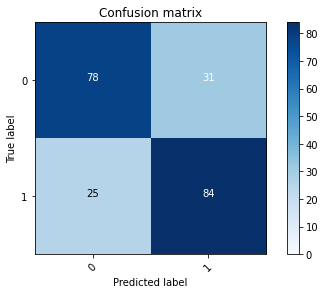

2022-08-02 19:59:33 - [Epoch Train: 59] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 19:59:33 - [Epoch Valid: 59] loss: 1.7344, auc: 0.8469, acc: 0.7431, time: 16.00 s


 39%|██████████████▉                       | 59/150 [1:16:45<1:47:40, 71.00s/it]

2022-08-02 19:59:33 - EPOCH: 60
2022-08-02 19:59:36 - Train Step 10/192, train_loss: 0.0000
2022-08-02 19:59:39 - Train Step 20/192, train_loss: 0.0000
2022-08-02 19:59:42 - Train Step 30/192, train_loss: 0.0000
2022-08-02 19:59:45 - Train Step 40/192, train_loss: 0.0000
2022-08-02 19:59:48 - Train Step 50/192, train_loss: 0.0000
2022-08-02 19:59:51 - Train Step 60/192, train_loss: 0.0000
2022-08-02 19:59:54 - Train Step 70/192, train_loss: 0.0000
2022-08-02 19:59:57 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:00:00 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:00:03 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:00:06 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:00:09 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:00:11 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:00:14 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:00:17 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:00:20 - Train Step 160/192, train_loss: 0.0000
2

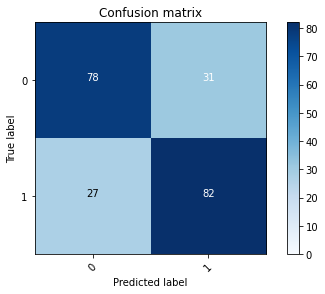

2022-08-02 20:00:45 - [Epoch Train: 60] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 56.00 s            
2022-08-02 20:00:45 - [Epoch Valid: 60] loss: 1.7409, auc: 0.8470, acc: 0.7339, time: 15.00 s


 40%|███████████████▏                      | 60/150 [1:17:58<1:47:04, 71.39s/it]

2022-08-02 20:00:45 - EPOCH: 61
2022-08-02 20:00:48 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:00:51 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:00:54 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:00:57 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:01:00 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:01:03 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:01:05 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:01:08 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:01:11 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:01:14 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:01:17 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:01:20 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:01:22 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:01:25 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:01:28 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:01:31 - Train Step 160/192, train_loss: 0.0000
2

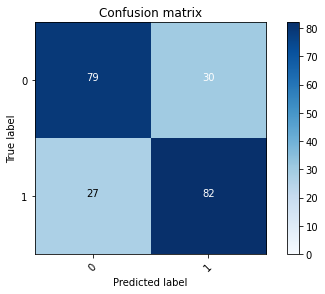

2022-08-02 20:01:55 - [Epoch Train: 61] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:01:55 - [Epoch Valid: 61] loss: 1.8131, auc: 0.8435, acc: 0.7385, time: 15.00 s


 41%|███████████████▍                      | 61/150 [1:19:08<1:45:19, 71.01s/it]

2022-08-02 20:01:55 - EPOCH: 62
2022-08-02 20:01:59 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:02:01 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:02:04 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:02:07 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:02:10 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:02:13 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:02:16 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:02:18 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:02:21 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:02:24 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:02:27 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:02:30 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:02:33 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:02:36 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:02:38 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:02:41 - Train Step 160/192, train_loss: 0.0000
2

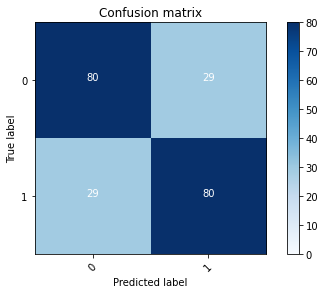

2022-08-02 20:03:06 - [Epoch Train: 62] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:03:06 - [Epoch Valid: 62] loss: 1.7703, auc: 0.8509, acc: 0.7339, time: 16.00 s


 41%|███████████████▋                      | 62/150 [1:20:19<1:44:04, 70.96s/it]

2022-08-02 20:03:06 - EPOCH: 63
2022-08-02 20:03:10 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:03:13 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:03:15 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:03:18 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:03:21 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:03:24 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:03:27 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:03:29 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:03:32 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:03:35 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:03:38 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:03:41 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:03:44 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:03:47 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:03:49 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:03:52 - Train Step 160/192, train_loss: 0.0000
2

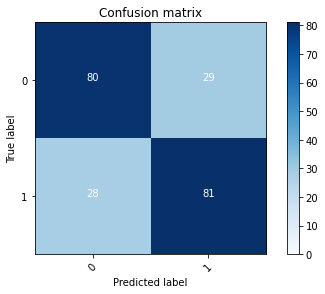

2022-08-02 20:04:18 - [Epoch Train: 63] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 20:04:18 - [Epoch Valid: 63] loss: 1.7516, auc: 0.8519, acc: 0.7385, time: 16.00 s


 42%|███████████████▉                      | 63/150 [1:21:30<1:43:11, 71.16s/it]

2022-08-02 20:04:18 - EPOCH: 64
2022-08-02 20:04:21 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:04:24 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:04:27 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:04:30 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:04:33 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:04:36 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:04:39 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:04:42 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:04:45 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:04:48 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:04:50 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:04:53 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:04:56 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:04:59 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:05:02 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:05:05 - Train Step 160/192, train_loss: 0.0000
2

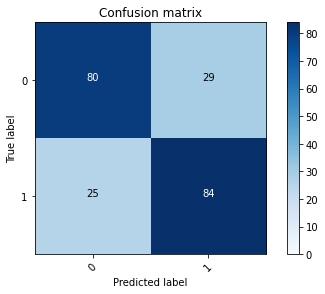

2022-08-02 20:05:30 - [Epoch Train: 64] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 20:05:30 - [Epoch Valid: 64] loss: 1.7380, auc: 0.8532, acc: 0.7523, time: 16.00 s


 43%|████████████████▏                     | 64/150 [1:22:43<1:42:35, 71.57s/it]

2022-08-02 20:05:30 - EPOCH: 65
2022-08-02 20:05:34 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:05:36 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:05:39 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:05:42 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:05:45 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:05:48 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:05:51 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:05:53 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:05:56 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:05:59 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:06:02 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:06:05 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:06:08 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:06:10 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:06:13 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:06:16 - Train Step 160/192, train_loss: 0.0000
2

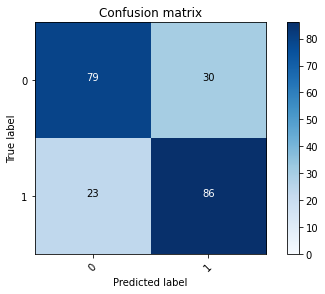

2022-08-02 20:06:41 - [Epoch Train: 65] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:06:41 - [Epoch Valid: 65] loss: 1.8797, auc: 0.8482, acc: 0.7569, time: 16.00 s
2022-08-02 20:06:41 - acc improved from 0.7569 to 0.7569. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e65-loss1.880-acc0.757-auc0.848.pth'


 43%|████████████████▍                     | 65/150 [1:23:53<1:40:54, 71.23s/it]

2022-08-02 20:06:41 - EPOCH: 66
2022-08-02 20:06:44 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:06:47 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:06:50 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:06:52 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:06:55 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:06:58 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:07:01 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:07:04 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:07:06 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:07:09 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:07:12 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:07:15 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:07:18 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:07:20 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:07:23 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:07:26 - Train Step 160/192, train_loss: 0.0000
2

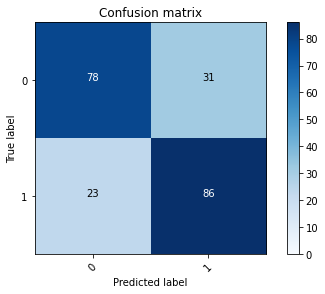

2022-08-02 20:07:51 - [Epoch Train: 66] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:07:51 - [Epoch Valid: 66] loss: 1.9431, auc: 0.8431, acc: 0.7523, time: 16.00 s


 44%|████████████████▋                     | 66/150 [1:25:03<1:39:16, 70.91s/it]

2022-08-02 20:07:51 - EPOCH: 67
2022-08-02 20:07:54 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:07:57 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:08:00 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:08:03 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:08:06 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:08:09 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:08:12 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:08:14 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:08:17 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:08:20 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:08:23 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:08:26 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:08:29 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:08:32 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:08:34 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:08:37 - Train Step 160/192, train_loss: 0.0000
2

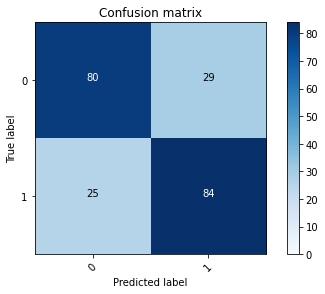

2022-08-02 20:09:03 - [Epoch Train: 67] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 20:09:03 - [Epoch Valid: 67] loss: 1.8774, auc: 0.8496, acc: 0.7523, time: 16.00 s


 45%|████████████████▉                     | 67/150 [1:26:15<1:38:21, 71.10s/it]

2022-08-02 20:09:03 - EPOCH: 68
2022-08-02 20:09:06 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:09:09 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:09:11 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:09:14 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:09:17 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:09:20 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:09:23 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:09:26 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:09:29 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:09:32 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:09:35 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:09:37 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:09:40 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:09:43 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:09:46 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:09:49 - Train Step 160/192, train_loss: 0.0000
2

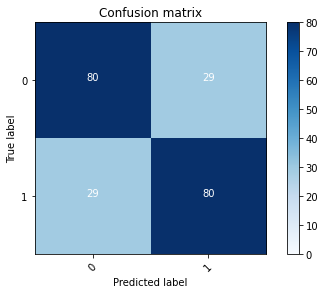

2022-08-02 20:10:14 - [Epoch Train: 68] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 20:10:14 - [Epoch Valid: 68] loss: 1.9871, auc: 0.8495, acc: 0.7339, time: 16.00 s


 45%|█████████████████▏                    | 68/150 [1:27:26<1:37:17, 71.19s/it]

2022-08-02 20:10:14 - EPOCH: 69
2022-08-02 20:10:17 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:10:20 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:10:23 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:10:26 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:10:29 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:10:31 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:10:34 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:10:37 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:10:40 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:10:43 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:10:46 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:10:48 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:10:51 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:10:54 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:10:57 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:11:00 - Train Step 160/192, train_loss: 0.0000
2

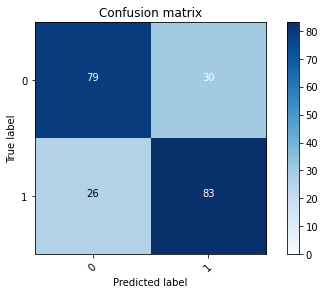

2022-08-02 20:11:25 - [Epoch Train: 69] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:11:25 - [Epoch Valid: 69] loss: 1.7925, auc: 0.8548, acc: 0.7431, time: 16.00 s


 46%|█████████████████▍                    | 69/150 [1:28:37<1:36:03, 71.15s/it]

2022-08-02 20:11:25 - EPOCH: 70
2022-08-02 20:11:28 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:11:31 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:11:34 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:11:37 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:11:40 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:11:42 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:11:45 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:11:48 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:11:51 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:11:54 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:11:57 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:12:00 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:12:02 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:12:05 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:12:08 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:12:11 - Train Step 160/192, train_loss: 0.0000
2

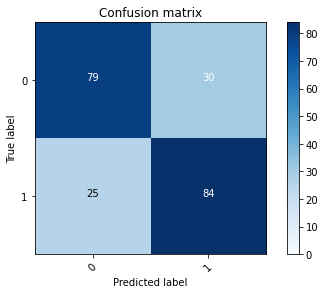

2022-08-02 20:12:36 - [Epoch Train: 70] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 20:12:36 - [Epoch Valid: 70] loss: 1.8329, auc: 0.8523, acc: 0.7477, time: 16.00 s


 47%|█████████████████▋                    | 70/150 [1:29:49<1:34:51, 71.14s/it]

2022-08-02 20:12:36 - EPOCH: 71
2022-08-02 20:12:39 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:12:42 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:12:45 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:12:48 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:12:51 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:12:54 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:12:57 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:12:59 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:13:02 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:13:05 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:13:08 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:13:11 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:13:13 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:13:16 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:13:19 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:13:22 - Train Step 160/192, train_loss: 0.0000
2

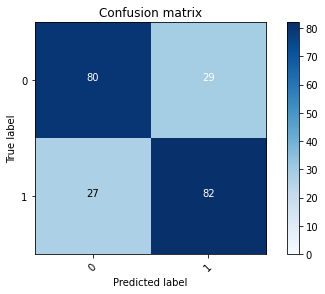

2022-08-02 20:13:47 - [Epoch Train: 71] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:13:47 - [Epoch Valid: 71] loss: 2.0165, auc: 0.8518, acc: 0.7431, time: 16.00 s


 47%|█████████████████▉                    | 71/150 [1:30:59<1:33:34, 71.07s/it]

2022-08-02 20:13:47 - EPOCH: 72
2022-08-02 20:13:50 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:13:53 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:13:56 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:13:59 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:14:02 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:14:05 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:14:08 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:14:10 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:14:13 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:14:16 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:14:19 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:14:22 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:14:25 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:14:28 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:14:31 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:14:33 - Train Step 160/192, train_loss: 0.0000
2

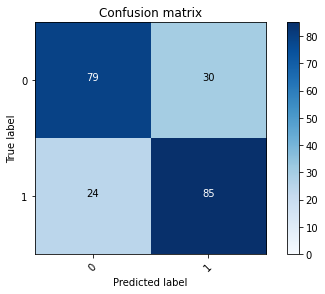

2022-08-02 20:14:58 - [Epoch Train: 72] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 20:14:58 - [Epoch Valid: 72] loss: 1.9051, auc: 0.8503, acc: 0.7523, time: 16.00 s


 48%|██████████████████▏                   | 72/150 [1:32:11<1:32:28, 71.13s/it]

2022-08-02 20:14:58 - EPOCH: 73
2022-08-02 20:15:01 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:15:04 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:15:07 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:15:10 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:15:13 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:15:16 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:15:19 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:15:22 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:15:25 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:15:28 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:15:31 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:15:34 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:15:37 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:15:40 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:15:43 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:15:45 - Train Step 160/192, train_loss: 0.0000
2

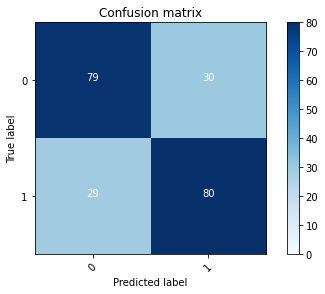

2022-08-02 20:16:11 - [Epoch Train: 73] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 56.00 s            
2022-08-02 20:16:11 - [Epoch Valid: 73] loss: 1.9591, auc: 0.8511, acc: 0.7294, time: 16.00 s


 49%|██████████████████▍                   | 73/150 [1:33:23<1:31:45, 71.50s/it]

2022-08-02 20:16:11 - EPOCH: 74
2022-08-02 20:16:14 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:16:17 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:16:20 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:16:22 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:16:25 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:16:28 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:16:31 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:16:34 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:16:37 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:16:40 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:16:43 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:16:45 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:16:48 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:16:51 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:16:54 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:16:57 - Train Step 160/192, train_loss: 0.0000
2

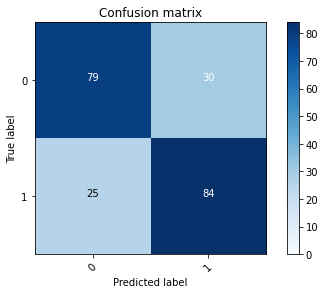

2022-08-02 20:17:22 - [Epoch Train: 74] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:17:22 - [Epoch Valid: 74] loss: 1.8949, auc: 0.8527, acc: 0.7477, time: 16.00 s


 49%|██████████████████▋                   | 74/150 [1:34:34<1:30:23, 71.36s/it]

2022-08-02 20:17:22 - EPOCH: 75
2022-08-02 20:17:25 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:17:28 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:17:31 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:17:34 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:17:36 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:17:39 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:17:42 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:17:45 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:17:48 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:17:50 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:17:53 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:17:56 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:17:59 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:18:01 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:18:04 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:18:07 - Train Step 160/192, train_loss: 0.0000
2

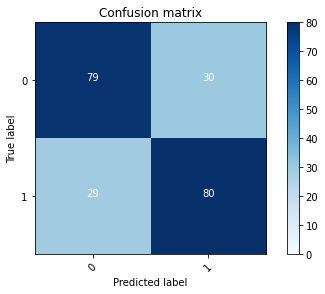

2022-08-02 20:18:32 - [Epoch Train: 75] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:18:32 - [Epoch Valid: 75] loss: 2.0114, auc: 0.8475, acc: 0.7294, time: 15.00 s


 50%|███████████████████                   | 75/150 [1:35:44<1:28:39, 70.92s/it]

2022-08-02 20:18:32 - EPOCH: 76
2022-08-02 20:18:35 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:18:37 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:18:40 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:18:43 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:18:46 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:18:49 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:18:52 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:18:55 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:18:58 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:19:00 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:19:03 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:19:06 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:19:09 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:19:12 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:19:15 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:19:18 - Train Step 160/192, train_loss: 0.0000
2

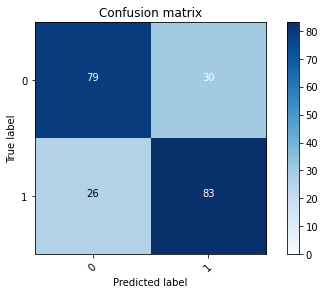

2022-08-02 20:19:42 - [Epoch Train: 76] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:19:42 - [Epoch Valid: 76] loss: 2.0325, auc: 0.8470, acc: 0.7431, time: 15.00 s


 51%|███████████████████▎                  | 76/150 [1:36:55<1:27:21, 70.83s/it]

2022-08-02 20:19:42 - EPOCH: 77
2022-08-02 20:19:45 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:19:48 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:19:51 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:19:54 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:19:56 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:19:59 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:20:02 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:20:05 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:20:07 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:20:10 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:20:13 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:20:16 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:20:19 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:20:21 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:20:24 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:20:27 - Train Step 160/192, train_loss: 0.0000
2

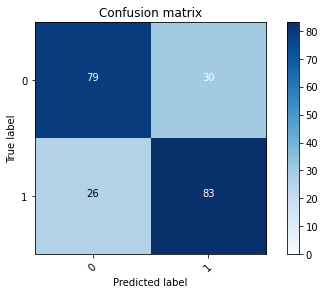

2022-08-02 20:20:52 - [Epoch Train: 77] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-02 20:20:52 - [Epoch Valid: 77] loss: 2.1147, auc: 0.8456, acc: 0.7431, time: 16.00 s


 51%|███████████████████▌                  | 77/150 [1:38:05<1:25:57, 70.65s/it]

2022-08-02 20:20:52 - EPOCH: 78
2022-08-02 20:20:56 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:20:58 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:21:01 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:21:04 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:21:07 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:21:10 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:21:12 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:21:15 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:21:18 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:21:21 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:21:24 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:21:26 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:21:29 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:21:32 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:21:35 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:21:38 - Train Step 160/192, train_loss: 0.0000
2

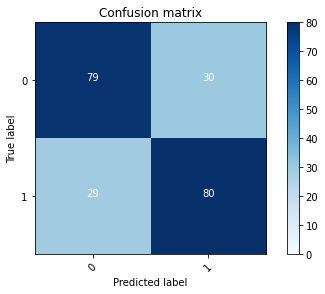

2022-08-02 20:22:03 - [Epoch Train: 78] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-02 20:22:03 - [Epoch Valid: 78] loss: 2.1022, auc: 0.8458, acc: 0.7294, time: 16.00 s


 52%|███████████████████▊                  | 78/150 [1:39:15<1:24:34, 70.48s/it]

2022-08-02 20:22:03 - EPOCH: 79
2022-08-02 20:22:06 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:22:08 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:22:11 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:22:14 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:22:17 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:22:20 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:22:23 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:22:25 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:22:28 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:22:31 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:22:34 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:22:37 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:22:40 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:22:42 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:22:45 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:22:48 - Train Step 160/192, train_loss: 0.0000
2

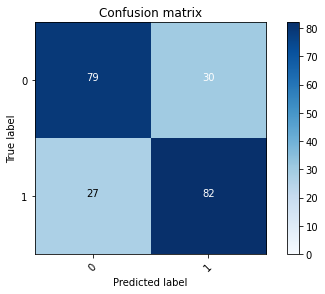

2022-08-02 20:23:13 - [Epoch Train: 79] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:23:13 - [Epoch Valid: 79] loss: 2.1236, auc: 0.8467, acc: 0.7385, time: 16.00 s


 53%|████████████████████                  | 79/150 [1:40:25<1:23:25, 70.50s/it]

2022-08-02 20:23:13 - EPOCH: 80
2022-08-02 20:23:16 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:23:19 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:23:22 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:23:25 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:23:27 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:23:30 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:23:33 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:23:36 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:23:39 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:23:42 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:23:45 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:23:48 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:23:50 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:23:53 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:23:56 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:23:59 - Train Step 160/192, train_loss: 0.0000
2

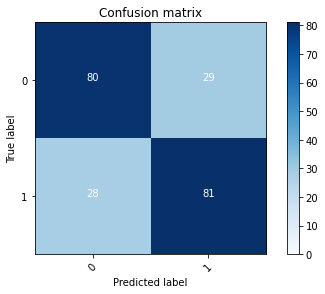

2022-08-02 20:24:24 - [Epoch Train: 80] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:24:24 - [Epoch Valid: 80] loss: 2.2547, auc: 0.8414, acc: 0.7385, time: 15.00 s


 53%|████████████████████▎                 | 80/150 [1:41:36<1:22:19, 70.56s/it]

2022-08-02 20:24:24 - EPOCH: 81
2022-08-02 20:24:27 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:24:30 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:24:32 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:24:35 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:24:38 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:24:41 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:24:44 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:24:46 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:24:49 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:24:52 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:24:55 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:24:58 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:25:00 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:25:03 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:25:06 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:25:09 - Train Step 160/192, train_loss: 0.0000
2

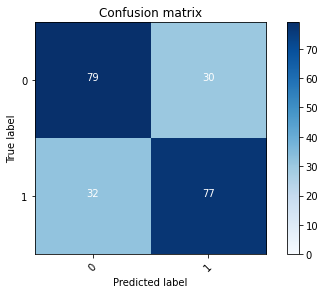

2022-08-02 20:25:34 - [Epoch Train: 81] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-02 20:25:34 - [Epoch Valid: 81] loss: 2.0729, auc: 0.8482, acc: 0.7156, time: 16.00 s


 54%|████████████████████▌                 | 81/150 [1:42:46<1:21:01, 70.46s/it]

2022-08-02 20:25:34 - EPOCH: 82
2022-08-02 20:25:37 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:25:40 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:25:43 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:25:46 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:25:49 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:25:51 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:25:54 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:25:57 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:26:00 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:26:03 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:26:06 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:26:09 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:26:11 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:26:14 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:26:17 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:26:20 - Train Step 160/192, train_loss: 0.0000
2

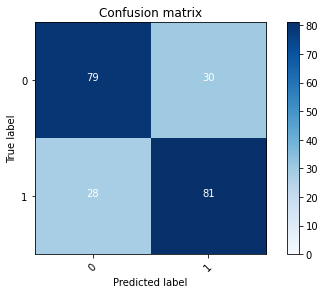

2022-08-02 20:26:45 - [Epoch Train: 82] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:26:45 - [Epoch Valid: 82] loss: 2.1557, auc: 0.8430, acc: 0.7339, time: 16.00 s


 55%|████████████████████▊                 | 82/150 [1:43:57<1:20:00, 70.60s/it]

2022-08-02 20:26:45 - EPOCH: 83
2022-08-02 20:26:48 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:26:51 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:26:54 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:26:57 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:27:00 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:27:03 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:27:05 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:27:08 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:27:11 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:27:14 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:27:17 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:27:20 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:27:22 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:27:25 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:27:28 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:27:31 - Train Step 160/192, train_loss: 0.0000
2

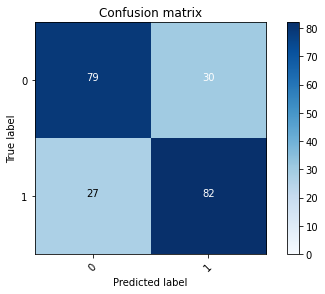

2022-08-02 20:27:55 - [Epoch Train: 83] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:27:55 - [Epoch Valid: 83] loss: 2.2562, auc: 0.8435, acc: 0.7385, time: 16.00 s


 55%|█████████████████████                 | 83/150 [1:45:08<1:18:49, 70.59s/it]

2022-08-02 20:27:55 - EPOCH: 84
2022-08-02 20:27:59 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:28:02 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:28:05 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:28:08 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:28:11 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:28:14 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:28:16 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:28:19 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:28:22 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:28:25 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:28:28 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:28:31 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:28:34 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:28:37 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:28:40 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:28:43 - Train Step 160/192, train_loss: 0.0000
2

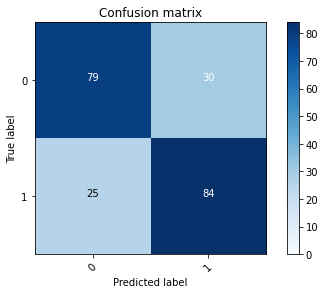

2022-08-02 20:29:08 - [Epoch Train: 84] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 56.00 s            
2022-08-02 20:29:08 - [Epoch Valid: 84] loss: 2.3030, auc: 0.8436, acc: 0.7477, time: 16.00 s


 56%|█████████████████████▎                | 84/150 [1:46:20<1:18:10, 71.06s/it]

2022-08-02 20:29:08 - EPOCH: 85
2022-08-02 20:29:11 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:29:13 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:29:16 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:29:19 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:29:22 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:29:25 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:29:28 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:29:30 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:29:33 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:29:36 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:29:39 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:29:42 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:29:45 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:29:47 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:29:50 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:29:53 - Train Step 160/192, train_loss: 0.0000
2

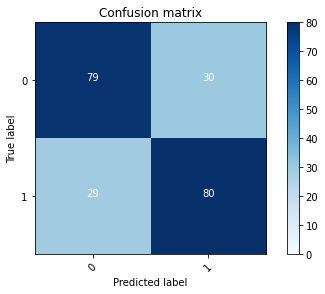

2022-08-02 20:30:18 - [Epoch Train: 85] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:30:18 - [Epoch Valid: 85] loss: 2.3275, auc: 0.8461, acc: 0.7294, time: 16.00 s


 57%|█████████████████████▌                | 85/150 [1:47:31<1:16:49, 70.92s/it]

2022-08-02 20:30:18 - EPOCH: 86
2022-08-02 20:30:21 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:30:24 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:30:27 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:30:30 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:30:33 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:30:36 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:30:39 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:30:42 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:30:44 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:30:47 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:30:50 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:30:53 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:30:56 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:30:59 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:31:02 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:31:04 - Train Step 160/192, train_loss: 0.0000
2

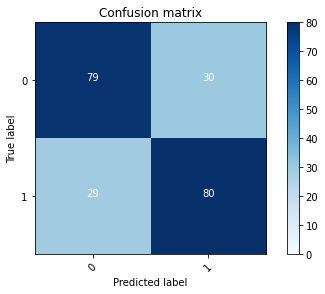

2022-08-02 20:31:29 - [Epoch Train: 86] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 20:31:29 - [Epoch Valid: 86] loss: 2.1324, auc: 0.8426, acc: 0.7294, time: 15.00 s


 57%|█████████████████████▊                | 86/150 [1:48:42<1:15:42, 70.98s/it]

2022-08-02 20:31:29 - EPOCH: 87
2022-08-02 20:31:32 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:31:35 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:31:38 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:31:41 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:31:44 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:31:46 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:31:49 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:31:52 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:31:55 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:31:58 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:32:01 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:32:03 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:32:06 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:32:09 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:32:12 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:32:15 - Train Step 160/192, train_loss: 0.0000
2

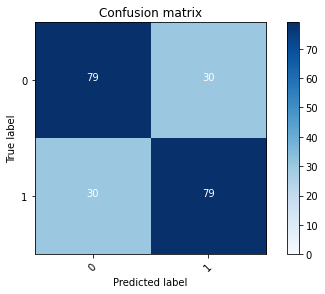

2022-08-02 20:32:39 - [Epoch Train: 87] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:32:39 - [Epoch Valid: 87] loss: 2.2097, auc: 0.8483, acc: 0.7248, time: 15.00 s


 58%|██████████████████████                | 87/150 [1:49:52<1:14:15, 70.73s/it]

2022-08-02 20:32:39 - EPOCH: 88
2022-08-02 20:32:43 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:32:45 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:32:48 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:32:51 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:32:54 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:32:57 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:33:00 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:33:03 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:33:05 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:33:08 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:33:11 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:33:14 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:33:17 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:33:20 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:33:23 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:33:26 - Train Step 160/192, train_loss: 0.0000
2

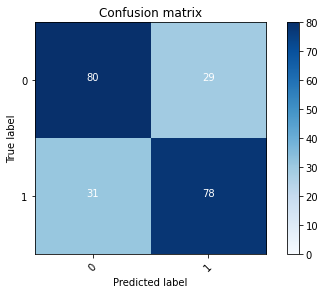

2022-08-02 20:33:51 - [Epoch Train: 88] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:33:51 - [Epoch Valid: 88] loss: 2.4573, auc: 0.8443, acc: 0.7248, time: 16.00 s


 59%|██████████████████████▎               | 88/150 [1:51:03<1:13:18, 70.94s/it]

2022-08-02 20:33:51 - EPOCH: 89
2022-08-02 20:33:54 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:33:57 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:34:00 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:34:03 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:34:06 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:34:09 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:34:12 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:34:15 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:34:17 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:34:20 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:34:23 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:34:26 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:34:29 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:34:32 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:34:35 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:34:37 - Train Step 160/192, train_loss: 0.0000
2

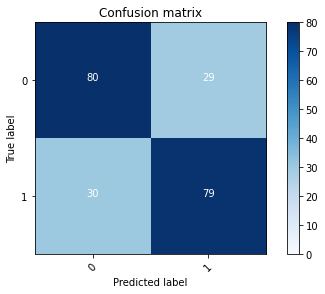

2022-08-02 20:35:02 - [Epoch Train: 89] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 20:35:02 - [Epoch Valid: 89] loss: 2.3771, auc: 0.8450, acc: 0.7294, time: 16.00 s


 59%|██████████████████████▌               | 89/150 [1:52:15<1:12:18, 71.13s/it]

2022-08-02 20:35:02 - EPOCH: 90
2022-08-02 20:35:06 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:35:09 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:35:11 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:35:14 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:35:17 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:35:20 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:35:23 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:35:25 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:35:28 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:35:31 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:35:34 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:35:37 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:35:40 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:35:42 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:35:45 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:35:48 - Train Step 160/192, train_loss: 0.0000
2

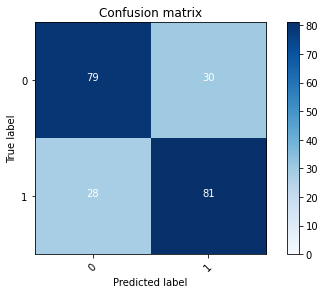

2022-08-02 20:36:13 - [Epoch Train: 90] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:36:13 - [Epoch Valid: 90] loss: 2.2785, auc: 0.8470, acc: 0.7339, time: 16.00 s


 60%|██████████████████████▊               | 90/150 [1:53:26<1:11:02, 71.04s/it]

2022-08-02 20:36:13 - EPOCH: 91
2022-08-02 20:36:16 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:36:19 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:36:22 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:36:25 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:36:28 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:36:31 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:36:34 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:36:37 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:36:40 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:36:42 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:36:45 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:36:48 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:36:51 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:36:54 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:36:57 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:36:59 - Train Step 160/192, train_loss: 0.0000
2

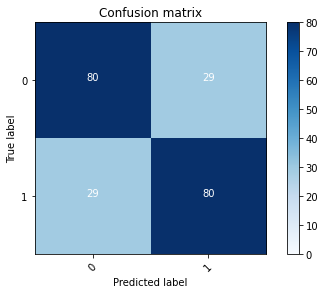

2022-08-02 20:37:25 - [Epoch Train: 91] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:37:25 - [Epoch Valid: 91] loss: 2.4332, auc: 0.8461, acc: 0.7339, time: 16.00 s


 61%|███████████████████████               | 91/150 [1:54:37<1:09:58, 71.15s/it]

2022-08-02 20:37:25 - EPOCH: 92
2022-08-02 20:37:28 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:37:31 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:37:33 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:37:36 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:37:39 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:37:42 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:37:45 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:37:48 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:37:51 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:37:53 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:37:56 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:37:59 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:38:02 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:38:05 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:38:07 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:38:10 - Train Step 160/192, train_loss: 0.0000
2

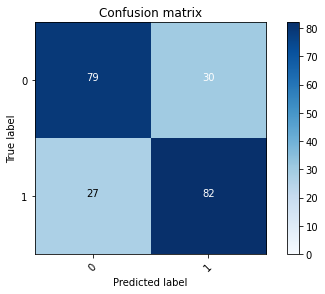

2022-08-02 20:38:35 - [Epoch Train: 92] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:38:35 - [Epoch Valid: 92] loss: 2.3937, auc: 0.8447, acc: 0.7385, time: 15.00 s


 61%|███████████████████████▎              | 92/150 [1:55:47<1:08:26, 70.80s/it]

2022-08-02 20:38:35 - EPOCH: 93
2022-08-02 20:38:38 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:38:41 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:38:43 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:38:46 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:38:49 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:38:52 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:38:55 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:38:58 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:39:01 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:39:04 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:39:06 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:39:09 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:39:12 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:39:15 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:39:18 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:39:20 - Train Step 160/192, train_loss: 0.0000
2

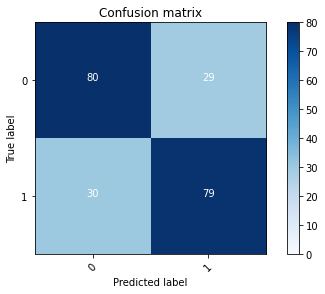

2022-08-02 20:39:45 - [Epoch Train: 93] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-02 20:39:45 - [Epoch Valid: 93] loss: 2.4422, auc: 0.8480, acc: 0.7294, time: 15.00 s


 62%|███████████████████████▌              | 93/150 [1:56:58<1:07:08, 70.68s/it]

2022-08-02 20:39:45 - EPOCH: 94
2022-08-02 20:39:48 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:39:51 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:39:54 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:39:57 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:40:00 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:40:03 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:40:06 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:40:08 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:40:11 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:40:14 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:40:17 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:40:20 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:40:23 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:40:26 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:40:29 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:40:32 - Train Step 160/192, train_loss: 0.0000
2

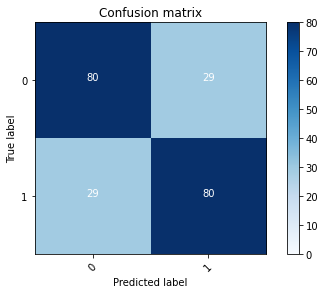

2022-08-02 20:40:56 - [Epoch Train: 94] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-02 20:40:56 - [Epoch Valid: 94] loss: 2.3450, auc: 0.8466, acc: 0.7339, time: 15.00 s


 63%|███████████████████████▊              | 94/150 [1:58:09<1:06:06, 70.84s/it]

2022-08-02 20:40:56 - EPOCH: 95
2022-08-02 20:41:00 - Train Step 10/192, train_loss: 0.0000
2022-08-02 20:41:03 - Train Step 20/192, train_loss: 0.0000
2022-08-02 20:41:05 - Train Step 30/192, train_loss: 0.0000
2022-08-02 20:41:08 - Train Step 40/192, train_loss: 0.0000
2022-08-02 20:41:11 - Train Step 50/192, train_loss: 0.0000
2022-08-02 20:41:14 - Train Step 60/192, train_loss: 0.0000
2022-08-02 20:41:17 - Train Step 70/192, train_loss: 0.0000
2022-08-02 20:41:20 - Train Step 80/192, train_loss: 0.0000
2022-08-02 20:41:23 - Train Step 90/192, train_loss: 0.0000
2022-08-02 20:41:26 - Train Step 100/192, train_loss: 0.0000
2022-08-02 20:41:29 - Train Step 110/192, train_loss: 0.0000
2022-08-02 20:41:32 - Train Step 120/192, train_loss: 0.0000
2022-08-02 20:41:35 - Train Step 130/192, train_loss: 0.0000
2022-08-02 20:41:37 - Train Step 140/192, train_loss: 0.0000
2022-08-02 20:41:40 - Train Step 150/192, train_loss: 0.0000
2022-08-02 20:41:43 - Train Step 160/192, train_loss: 0.0000
2

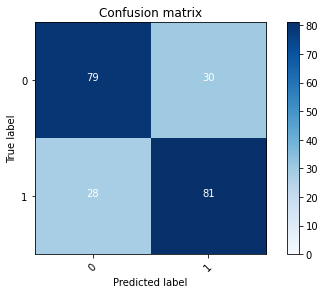

2022-08-02 20:42:09 - [Epoch Train: 95] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 56.00 s            
2022-08-02 20:42:09 - [Epoch Valid: 95] loss: 2.4066, auc: 0.8422, acc: 0.7339, time: 16.00 s
2022-08-02 20:42:09 - 
Valid acc didn't improve last 30 epochs.


 63%|███████████████████████▊              | 94/150 [1:59:21<1:11:06, 76.19s/it]


In [227]:
print(info)
m_modelfile = train_mri_type(m_model, device, info, epochs=150, pat=30, 
                       train_loader=train_loader, valid_loader=val_loader)
##m_modelfile = train_mri_type(m_model, device, info, epochs=150, pat=30, 
##                       train_loader=m_train_loader, valid_loader=m_val_loader)

#m_modelfile = train_mri_type(m_model, device, info, epochs=150, pat=30, 
#                       train_loader=n_train_loader, valid_loader=n_val_loader)

{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['T1w'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin': 'n', 'val_origin': 'n', 'net': 'RSNAClassifierSingle3D'}
RSNAClassifierSingle3D(
  (part1): Sequential(
    (0): Sequential(
      (0): Conv3d(1, 1, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      (1): Conv3d(1, 4, kernel_size=(1, 1, 1), stride=(1, 1, 1), bias=False)
      (2): BatchNorm3d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): ReLU()
    )
    (1): Sequential(
      (0): Conv3d(4, 4, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), groups=4, bias=False)
      (1): Conv3d(4, 8, kernel_size=(1, 1, 1), stride=(1, 1, 1), bias=False)
      (2): BatchNorm3d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

  0%|                                                   | 0/150 [00:00<?, ?it/s]

2022-08-03 20:14:30 - EPOCH: 1
2022-08-03 20:14:34 - Train Step 10/60, train_loss: 0.6991
2022-08-03 20:14:38 - Train Step 20/60, train_loss: 0.6901
2022-08-03 20:14:42 - Train Step 30/60, train_loss: 0.6936
2022-08-03 20:14:46 - Train Step 40/60, train_loss: 0.7053
2022-08-03 20:14:50 - Train Step 50/60, train_loss: 0.6990
2022-08-03 20:14:54 - Train Step 60/60, train_loss: 0.6968
Adjusting learning rate of group 0 to 1.0000e-04.
2022-08-03 20:14:57 - Valid Step 5/17, valid_loss: 0.7324
2022-08-03 20:14:59 - Valid Step 10/17, valid_loss: 0.7037
2022-08-03 20:15:01 - Valid Step 15/17, valid_loss: 0.6996
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
65  UPENN-GBM-00092_11_T1w                0           0
53  UPENN-GBM-00093_11_T1w                0           0
6   UPENN-GBM-00094_11_T1w                0           0
30  UPENN-GBM-00115_11_T1w                1           0
27  UPENN-GBM-00117_11_T1w                0           0
58  UPENN-GBM-00128_11_T1w         

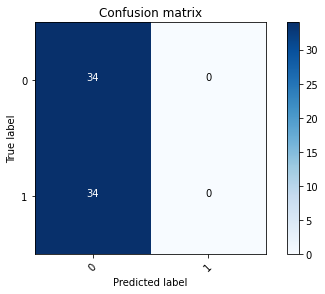

2022-08-03 20:15:02 - [Epoch Train: 1] loss: 0.6968, auc: 0.5359, acc: 0.4874, time: 24.00 s            
2022-08-03 20:15:02 - [Epoch Valid: 1] loss: 0.7011, auc: 0.4663, acc: 0.5000, time: 7.00 s
2022-08-03 20:15:02 - acc improved from 0.0000 to 0.5000. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e1-loss0.701-acc0.500-auc0.466.pth'


  1%|▎                                        | 1/150 [00:32<1:20:50, 32.55s/it]

2022-08-03 20:15:02 - EPOCH: 2
2022-08-03 20:15:06 - Train Step 10/60, train_loss: 0.6451
2022-08-03 20:15:10 - Train Step 20/60, train_loss: 0.6486
2022-08-03 20:15:15 - Train Step 30/60, train_loss: 0.6502
2022-08-03 20:15:19 - Train Step 40/60, train_loss: 0.6593
2022-08-03 20:15:24 - Train Step 50/60, train_loss: 0.6541
2022-08-03 20:15:28 - Train Step 60/60, train_loss: 0.6502
Adjusting learning rate of group 0 to 1.0000e-04.
2022-08-03 20:15:30 - Valid Step 5/17, valid_loss: 0.6793
2022-08-03 20:15:32 - Valid Step 10/17, valid_loss: 0.6793
2022-08-03 20:15:35 - Valid Step 15/17, valid_loss: 0.6704
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
22  UPENN-GBM-00092_11_T1w                0           0
66  UPENN-GBM-00093_11_T1w                0           0
34  UPENN-GBM-00094_11_T1w                0           0
53  UPENN-GBM-00115_11_T1w                1           0
13  UPENN-GBM-00117_11_T1w                0           0
32  UPENN-GBM-00128_11_T1w         

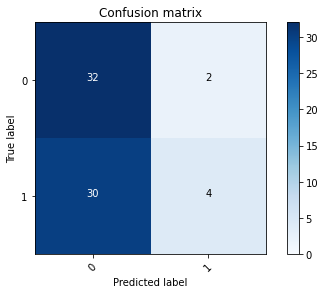

2022-08-03 20:15:36 - [Epoch Train: 2] loss: 0.6502, auc: 0.7182, acc: 0.5210, time: 25.00 s            
2022-08-03 20:15:36 - [Epoch Valid: 2] loss: 0.6771, auc: 0.5995, acc: 0.5294, time: 7.00 s
2022-08-03 20:15:36 - acc improved from 0.5000 to 0.5294. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e2-loss0.677-acc0.529-auc0.599.pth'


  1%|▌                                        | 2/150 [01:06<1:21:55, 33.22s/it]

2022-08-03 20:15:36 - EPOCH: 3
2022-08-03 20:15:40 - Train Step 10/60, train_loss: 0.5680
2022-08-03 20:15:44 - Train Step 20/60, train_loss: 0.5720
2022-08-03 20:15:48 - Train Step 30/60, train_loss: 0.5752
2022-08-03 20:15:52 - Train Step 40/60, train_loss: 0.5726
2022-08-03 20:15:56 - Train Step 50/60, train_loss: 0.5794
2022-08-03 20:15:59 - Train Step 60/60, train_loss: 0.5800
Adjusting learning rate of group 0 to 1.0000e-04.
2022-08-03 20:16:02 - Valid Step 5/17, valid_loss: 0.6713
2022-08-03 20:16:04 - Valid Step 10/17, valid_loss: 0.6916
2022-08-03 20:16:06 - Valid Step 15/17, valid_loss: 0.6868
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
33  UPENN-GBM-00092_11_T1w                0           1
39  UPENN-GBM-00093_11_T1w                0           0
20  UPENN-GBM-00094_11_T1w                0           0
66  UPENN-GBM-00115_11_T1w                1           1
34  UPENN-GBM-00117_11_T1w                0           0
11  UPENN-GBM-00128_11_T1w         

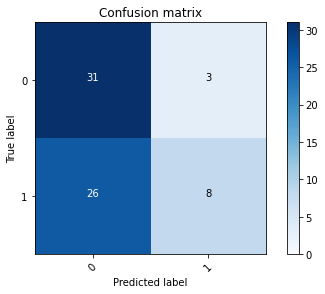

2022-08-03 20:16:07 - [Epoch Train: 3] loss: 0.5800, auc: 0.8816, acc: 0.6218, time: 23.00 s            
2022-08-03 20:16:07 - [Epoch Valid: 3] loss: 0.6696, auc: 0.6254, acc: 0.5735, time: 7.00 s
2022-08-03 20:16:07 - acc improved from 0.5294 to 0.5735. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e3-loss0.670-acc0.574-auc0.625.pth'


  2%|▊                                        | 3/150 [01:37<1:19:04, 32.27s/it]

2022-08-03 20:16:07 - EPOCH: 4
2022-08-03 20:16:11 - Train Step 10/60, train_loss: 0.5663
2022-08-03 20:16:15 - Train Step 20/60, train_loss: 0.5185
2022-08-03 20:16:19 - Train Step 30/60, train_loss: 0.5017
2022-08-03 20:16:23 - Train Step 40/60, train_loss: 0.4896
2022-08-03 20:16:27 - Train Step 50/60, train_loss: 0.4844
2022-08-03 20:16:31 - Train Step 60/60, train_loss: 0.4813
Adjusting learning rate of group 0 to 1.0000e-04.
2022-08-03 20:16:34 - Valid Step 5/17, valid_loss: 0.7097
2022-08-03 20:16:35 - Valid Step 10/17, valid_loss: 0.7027
2022-08-03 20:16:38 - Valid Step 15/17, valid_loss: 0.6777
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
44  UPENN-GBM-00092_11_T1w                0           1
54  UPENN-GBM-00093_11_T1w                0           0
53  UPENN-GBM-00094_11_T1w                0           0
41  UPENN-GBM-00115_11_T1w                1           1
40  UPENN-GBM-00117_11_T1w                0           0
12  UPENN-GBM-00128_11_T1w         

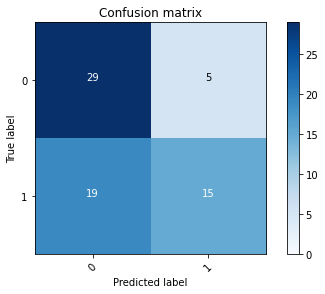

2022-08-03 20:16:39 - [Epoch Train: 4] loss: 0.4813, auc: 0.9636, acc: 0.7437, time: 24.00 s            
2022-08-03 20:16:39 - [Epoch Valid: 4] loss: 0.6615, auc: 0.6522, acc: 0.6471, time: 7.00 s
2022-08-03 20:16:39 - acc improved from 0.5735 to 0.6471. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e4-loss0.662-acc0.647-auc0.652.pth'


  3%|█                                        | 4/150 [02:09<1:18:01, 32.07s/it]

2022-08-03 20:16:39 - EPOCH: 5
2022-08-03 20:16:43 - Train Step 10/60, train_loss: 0.3806
2022-08-03 20:16:47 - Train Step 20/60, train_loss: 0.3892
2022-08-03 20:16:51 - Train Step 30/60, train_loss: 0.3843
2022-08-03 20:16:55 - Train Step 40/60, train_loss: 0.3677
2022-08-03 20:16:59 - Train Step 50/60, train_loss: 0.3669
2022-08-03 20:17:03 - Train Step 60/60, train_loss: 0.3532
Adjusting learning rate of group 0 to 1.0000e-04.
2022-08-03 20:17:05 - Valid Step 5/17, valid_loss: 0.6059
2022-08-03 20:17:07 - Valid Step 10/17, valid_loss: 0.6684
2022-08-03 20:17:09 - Valid Step 15/17, valid_loss: 0.6420
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
38  UPENN-GBM-00092_11_T1w                0           1
62  UPENN-GBM-00093_11_T1w                0           0
37  UPENN-GBM-00094_11_T1w                0           0
21  UPENN-GBM-00115_11_T1w                1           1
28  UPENN-GBM-00117_11_T1w                0           0
3   UPENN-GBM-00128_11_T1w         

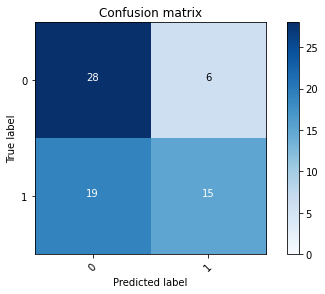

2022-08-03 20:17:10 - [Epoch Train: 5] loss: 0.3532, auc: 0.9902, acc: 0.8697, time: 23.00 s            
2022-08-03 20:17:10 - [Epoch Valid: 5] loss: 0.6544, auc: 0.6843, acc: 0.6324, time: 7.00 s


  3%|█▎                                       | 5/150 [02:40<1:17:01, 31.87s/it]

2022-08-03 20:17:10 - EPOCH: 6
2022-08-03 20:17:15 - Train Step 10/60, train_loss: 0.2734
2022-08-03 20:17:18 - Train Step 20/60, train_loss: 0.2620
2022-08-03 20:17:22 - Train Step 30/60, train_loss: 0.2628
2022-08-03 20:17:26 - Train Step 40/60, train_loss: 0.2545
2022-08-03 20:17:30 - Train Step 50/60, train_loss: 0.2539
2022-08-03 20:17:34 - Train Step 60/60, train_loss: 0.2592
Adjusting learning rate of group 0 to 1.0000e-04.
2022-08-03 20:17:37 - Valid Step 5/17, valid_loss: 0.7856
2022-08-03 20:17:38 - Valid Step 10/17, valid_loss: 0.7143
2022-08-03 20:17:40 - Valid Step 15/17, valid_loss: 0.7293
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
35  UPENN-GBM-00092_11_T1w                0           1
55  UPENN-GBM-00093_11_T1w                0           0
28  UPENN-GBM-00094_11_T1w                0           0
60  UPENN-GBM-00115_11_T1w                1           1
14  UPENN-GBM-00117_11_T1w                0           1
1   UPENN-GBM-00128_11_T1w         

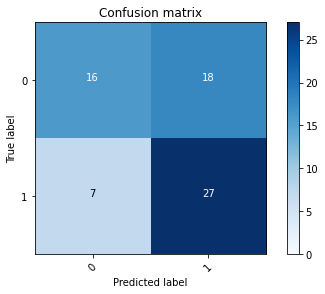

2022-08-03 20:17:41 - [Epoch Train: 6] loss: 0.2592, auc: 0.9933, acc: 0.8992, time: 23.00 s            
2022-08-03 20:17:41 - [Epoch Valid: 6] loss: 0.7788, auc: 0.6713, acc: 0.6324, time: 7.00 s


  4%|█▋                                       | 6/150 [03:11<1:15:56, 31.64s/it]

2022-08-03 20:17:41 - EPOCH: 7
2022-08-03 20:17:46 - Train Step 10/60, train_loss: 0.1808
2022-08-03 20:17:50 - Train Step 20/60, train_loss: 0.1740
2022-08-03 20:17:53 - Train Step 30/60, train_loss: 0.1801
2022-08-03 20:17:57 - Train Step 40/60, train_loss: 0.1736
2022-08-03 20:18:01 - Train Step 50/60, train_loss: 0.1708
2022-08-03 20:18:05 - Train Step 60/60, train_loss: 0.1697
Adjusting learning rate of group 0 to 1.0000e-04.
2022-08-03 20:18:07 - Valid Step 5/17, valid_loss: 0.5225
2022-08-03 20:18:09 - Valid Step 10/17, valid_loss: 0.6309
2022-08-03 20:18:11 - Valid Step 15/17, valid_loss: 0.7399
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
53  UPENN-GBM-00092_11_T1w                0           1
17  UPENN-GBM-00093_11_T1w                0           0
65  UPENN-GBM-00094_11_T1w                0           0
7   UPENN-GBM-00115_11_T1w                1           1
36  UPENN-GBM-00117_11_T1w                0           1
39  UPENN-GBM-00128_11_T1w         

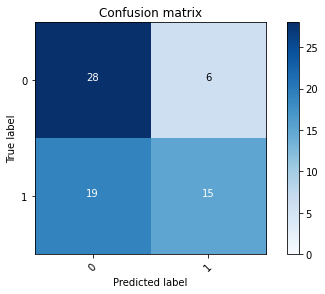

2022-08-03 20:18:12 - [Epoch Train: 7] loss: 0.1697, auc: 1.0000, acc: 0.9790, time: 23.00 s            
2022-08-03 20:18:12 - [Epoch Valid: 7] loss: 0.7137, auc: 0.6799, acc: 0.6324, time: 7.00 s


  5%|█▉                                       | 7/150 [03:42<1:14:40, 31.34s/it]

2022-08-03 20:18:12 - EPOCH: 8
2022-08-03 20:18:16 - Train Step 10/60, train_loss: 0.1016
2022-08-03 20:18:20 - Train Step 20/60, train_loss: 0.0960
2022-08-03 20:18:24 - Train Step 30/60, train_loss: 0.0988
2022-08-03 20:18:28 - Train Step 40/60, train_loss: 0.0947
2022-08-03 20:18:32 - Train Step 50/60, train_loss: 0.0922
2022-08-03 20:18:36 - Train Step 60/60, train_loss: 0.0923
Adjusting learning rate of group 0 to 1.0000e-04.
2022-08-03 20:18:38 - Valid Step 5/17, valid_loss: 0.9713
2022-08-03 20:18:40 - Valid Step 10/17, valid_loss: 0.6859
2022-08-03 20:18:42 - Valid Step 15/17, valid_loss: 0.7773
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
24  UPENN-GBM-00092_11_T1w                0           1
12  UPENN-GBM-00093_11_T1w                0           0
43  UPENN-GBM-00094_11_T1w                0           0
56  UPENN-GBM-00115_11_T1w                1           1
64  UPENN-GBM-00117_11_T1w                0           1
59  UPENN-GBM-00128_11_T1w         

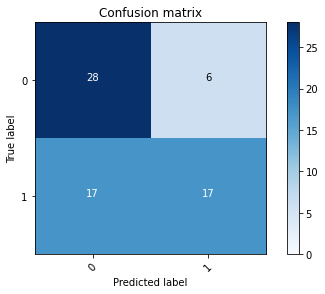

2022-08-03 20:18:43 - [Epoch Train: 8] loss: 0.0923, auc: 1.0000, acc: 0.9916, time: 23.00 s            
2022-08-03 20:18:43 - [Epoch Valid: 8] loss: 0.7800, auc: 0.6955, acc: 0.6618, time: 7.00 s
2022-08-03 20:18:43 - acc improved from 0.6471 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e8-loss0.780-acc0.662-auc0.696.pth'


  5%|██▏                                      | 8/150 [04:13<1:14:05, 31.30s/it]

2022-08-03 20:18:43 - EPOCH: 9
2022-08-03 20:18:48 - Train Step 10/60, train_loss: 0.0806
2022-08-03 20:18:51 - Train Step 20/60, train_loss: 0.0740
2022-08-03 20:18:55 - Train Step 30/60, train_loss: 0.0647
2022-08-03 20:18:59 - Train Step 40/60, train_loss: 0.0632
2022-08-03 20:19:03 - Train Step 50/60, train_loss: 0.0612
2022-08-03 20:19:07 - Train Step 60/60, train_loss: 0.0607
Adjusting learning rate of group 0 to 1.0000e-04.
2022-08-03 20:19:10 - Valid Step 5/17, valid_loss: 0.9708
2022-08-03 20:19:11 - Valid Step 10/17, valid_loss: 0.8680
2022-08-03 20:19:14 - Valid Step 15/17, valid_loss: 0.8350
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
45  UPENN-GBM-00092_11_T1w                0           1
7   UPENN-GBM-00093_11_T1w                0           0
24  UPENN-GBM-00094_11_T1w                0           1
47  UPENN-GBM-00115_11_T1w                1           1
63  UPENN-GBM-00117_11_T1w                0           1
4   UPENN-GBM-00128_11_T1w         

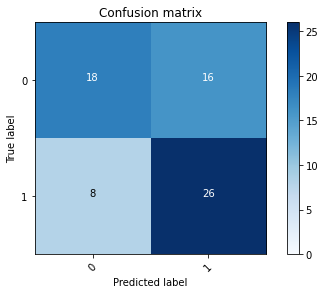

2022-08-03 20:19:15 - [Epoch Train: 9] loss: 0.0607, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:19:15 - [Epoch Valid: 9] loss: 0.8706, auc: 0.6972, acc: 0.6471, time: 7.00 s


  6%|██▍                                      | 9/150 [04:44<1:13:28, 31.26s/it]

2022-08-03 20:19:15 - EPOCH: 10
2022-08-03 20:19:19 - Train Step 10/60, train_loss: 0.0395
2022-08-03 20:19:23 - Train Step 20/60, train_loss: 0.0409
2022-08-03 20:19:27 - Train Step 30/60, train_loss: 0.0394
2022-08-03 20:19:30 - Train Step 40/60, train_loss: 0.0385
2022-08-03 20:19:34 - Train Step 50/60, train_loss: 0.0369
2022-08-03 20:19:38 - Train Step 60/60, train_loss: 0.0364
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:19:41 - Valid Step 5/17, valid_loss: 1.2942
2022-08-03 20:19:43 - Valid Step 10/17, valid_loss: 0.9618
2022-08-03 20:19:45 - Valid Step 15/17, valid_loss: 0.8326
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
15  UPENN-GBM-00092_11_T1w                0           1
18  UPENN-GBM-00093_11_T1w                0           0
23  UPENN-GBM-00094_11_T1w                0           1
49  UPENN-GBM-00115_11_T1w                1           1
36  UPENN-GBM-00117_11_T1w                0           1
64  UPENN-GBM-00128_11_T1w        

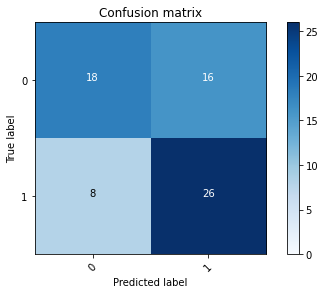

2022-08-03 20:19:46 - [Epoch Train: 10] loss: 0.0364, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:19:46 - [Epoch Valid: 10] loss: 0.8948, auc: 0.7007, acc: 0.6471, time: 7.00 s


  7%|██▋                                     | 10/150 [05:16<1:12:58, 31.27s/it]

2022-08-03 20:19:46 - EPOCH: 11
2022-08-03 20:19:50 - Train Step 10/60, train_loss: 0.0201
2022-08-03 20:19:54 - Train Step 20/60, train_loss: 0.0291
2022-08-03 20:19:58 - Train Step 30/60, train_loss: 0.0295
2022-08-03 20:20:01 - Train Step 40/60, train_loss: 0.0290
2022-08-03 20:20:05 - Train Step 50/60, train_loss: 0.0279
2022-08-03 20:20:09 - Train Step 60/60, train_loss: 0.0270
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:20:12 - Valid Step 5/17, valid_loss: 0.5732
2022-08-03 20:20:13 - Valid Step 10/17, valid_loss: 0.6206
2022-08-03 20:20:16 - Valid Step 15/17, valid_loss: 0.8380
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
29  UPENN-GBM-00092_11_T1w                0           1
15  UPENN-GBM-00093_11_T1w                0           0
63  UPENN-GBM-00094_11_T1w                0           1
7   UPENN-GBM-00115_11_T1w                1           1
0   UPENN-GBM-00117_11_T1w                0           1
14  UPENN-GBM-00128_11_T1w        

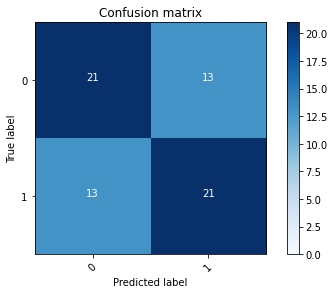

2022-08-03 20:20:17 - [Epoch Train: 11] loss: 0.0270, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:20:17 - [Epoch Valid: 11] loss: 0.8842, auc: 0.7016, acc: 0.6176, time: 7.00 s


  7%|██▉                                     | 11/150 [05:47<1:12:15, 31.19s/it]

2022-08-03 20:20:17 - EPOCH: 12
2022-08-03 20:20:21 - Train Step 10/60, train_loss: 0.0233
2022-08-03 20:20:25 - Train Step 20/60, train_loss: 0.0239
2022-08-03 20:20:29 - Train Step 30/60, train_loss: 0.0239
2022-08-03 20:20:33 - Train Step 40/60, train_loss: 0.0242
2022-08-03 20:20:37 - Train Step 50/60, train_loss: 0.0243
2022-08-03 20:20:41 - Train Step 60/60, train_loss: 0.0237
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:20:44 - Valid Step 5/17, valid_loss: 0.8045
2022-08-03 20:20:46 - Valid Step 10/17, valid_loss: 0.8891
2022-08-03 20:20:48 - Valid Step 15/17, valid_loss: 0.7666
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
50  UPENN-GBM-00092_11_T1w                0           1
27  UPENN-GBM-00093_11_T1w                0           0
19  UPENN-GBM-00094_11_T1w                0           1
47  UPENN-GBM-00115_11_T1w                1           1
36  UPENN-GBM-00117_11_T1w                0           1
18  UPENN-GBM-00128_11_T1w        

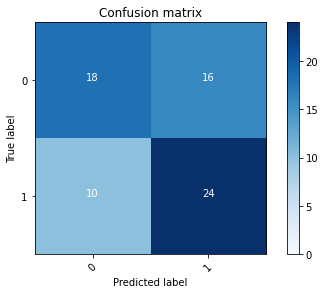

2022-08-03 20:20:49 - [Epoch Train: 12] loss: 0.0237, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 20:20:49 - [Epoch Valid: 12] loss: 0.9334, auc: 0.6981, acc: 0.6176, time: 7.00 s


  8%|███▏                                    | 12/150 [06:19<1:12:23, 31.47s/it]

2022-08-03 20:20:49 - EPOCH: 13
2022-08-03 20:20:53 - Train Step 10/60, train_loss: 0.0169
2022-08-03 20:20:57 - Train Step 20/60, train_loss: 0.0203
2022-08-03 20:21:01 - Train Step 30/60, train_loss: 0.0208
2022-08-03 20:21:05 - Train Step 40/60, train_loss: 0.0201
2022-08-03 20:21:08 - Train Step 50/60, train_loss: 0.0189
2022-08-03 20:21:12 - Train Step 60/60, train_loss: 0.0188
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:21:15 - Valid Step 5/17, valid_loss: 1.1533
2022-08-03 20:21:16 - Valid Step 10/17, valid_loss: 1.0687
2022-08-03 20:21:19 - Valid Step 15/17, valid_loss: 0.9352
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
20  UPENN-GBM-00092_11_T1w                0           1
48  UPENN-GBM-00093_11_T1w                0           0
66  UPENN-GBM-00094_11_T1w                0           1
25  UPENN-GBM-00115_11_T1w                1           1
19  UPENN-GBM-00117_11_T1w                0           1
7   UPENN-GBM-00128_11_T1w        

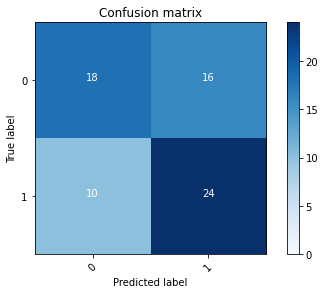

2022-08-03 20:21:20 - [Epoch Train: 13] loss: 0.0188, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:21:20 - [Epoch Valid: 13] loss: 0.9530, auc: 0.6981, acc: 0.6176, time: 7.00 s


  9%|███▍                                    | 13/150 [06:50<1:11:22, 31.26s/it]

2022-08-03 20:21:20 - EPOCH: 14
2022-08-03 20:21:24 - Train Step 10/60, train_loss: 0.0225
2022-08-03 20:21:28 - Train Step 20/60, train_loss: 0.0204
2022-08-03 20:21:32 - Train Step 30/60, train_loss: 0.0195
2022-08-03 20:21:36 - Train Step 40/60, train_loss: 0.0199
2022-08-03 20:21:40 - Train Step 50/60, train_loss: 0.0203
2022-08-03 20:21:43 - Train Step 60/60, train_loss: 0.0200
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:21:46 - Valid Step 5/17, valid_loss: 1.6246
2022-08-03 20:21:48 - Valid Step 10/17, valid_loss: 1.3348
2022-08-03 20:21:50 - Valid Step 15/17, valid_loss: 1.1010
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
24  UPENN-GBM-00092_11_T1w                0           1
16  UPENN-GBM-00093_11_T1w                0           0
54  UPENN-GBM-00094_11_T1w                0           1
64  UPENN-GBM-00115_11_T1w                1           1
49  UPENN-GBM-00117_11_T1w                0           1
52  UPENN-GBM-00128_11_T1w        

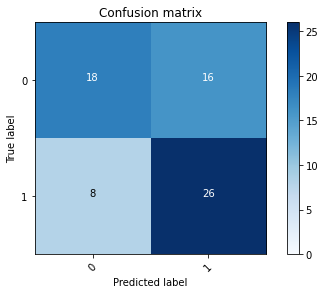

2022-08-03 20:21:51 - [Epoch Train: 14] loss: 0.0200, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:21:51 - [Epoch Valid: 14] loss: 1.0088, auc: 0.7059, acc: 0.6471, time: 7.00 s


  9%|███▋                                    | 14/150 [07:21<1:10:53, 31.27s/it]

2022-08-03 20:21:51 - EPOCH: 15
2022-08-03 20:21:55 - Train Step 10/60, train_loss: 0.0121
2022-08-03 20:21:59 - Train Step 20/60, train_loss: 0.0121
2022-08-03 20:22:03 - Train Step 30/60, train_loss: 0.0139
2022-08-03 20:22:07 - Train Step 40/60, train_loss: 0.0145
2022-08-03 20:22:10 - Train Step 50/60, train_loss: 0.0143
2022-08-03 20:22:14 - Train Step 60/60, train_loss: 0.0144
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:22:17 - Valid Step 5/17, valid_loss: 0.7349
2022-08-03 20:22:18 - Valid Step 10/17, valid_loss: 0.7526
2022-08-03 20:22:21 - Valid Step 15/17, valid_loss: 1.0204
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
18  UPENN-GBM-00092_11_T1w                0           1
14  UPENN-GBM-00093_11_T1w                0           0
58  UPENN-GBM-00094_11_T1w                0           1
55  UPENN-GBM-00115_11_T1w                1           1
48  UPENN-GBM-00117_11_T1w                0           1
35  UPENN-GBM-00128_11_T1w        

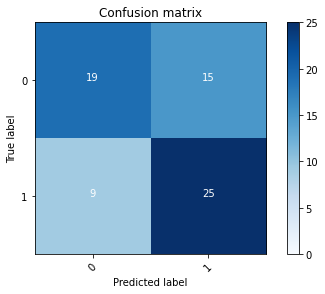

2022-08-03 20:22:22 - [Epoch Train: 15] loss: 0.0144, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:22:22 - [Epoch Valid: 15] loss: 0.9819, auc: 0.7024, acc: 0.6471, time: 7.00 s


 10%|████                                    | 15/150 [07:52<1:09:58, 31.10s/it]

2022-08-03 20:22:22 - EPOCH: 16
2022-08-03 20:22:26 - Train Step 10/60, train_loss: 0.0107
2022-08-03 20:22:30 - Train Step 20/60, train_loss: 0.0114
2022-08-03 20:22:34 - Train Step 30/60, train_loss: 0.0115
2022-08-03 20:22:38 - Train Step 40/60, train_loss: 0.0114
2022-08-03 20:22:41 - Train Step 50/60, train_loss: 0.0115
2022-08-03 20:22:45 - Train Step 60/60, train_loss: 0.0120
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:22:48 - Valid Step 5/17, valid_loss: 1.5342
2022-08-03 20:22:50 - Valid Step 10/17, valid_loss: 1.1058
2022-08-03 20:22:52 - Valid Step 15/17, valid_loss: 1.0558
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
46  UPENN-GBM-00092_11_T1w                0           1
17  UPENN-GBM-00093_11_T1w                0           0
11  UPENN-GBM-00094_11_T1w                0           1
30  UPENN-GBM-00115_11_T1w                1           1
18  UPENN-GBM-00117_11_T1w                0           1
50  UPENN-GBM-00128_11_T1w        

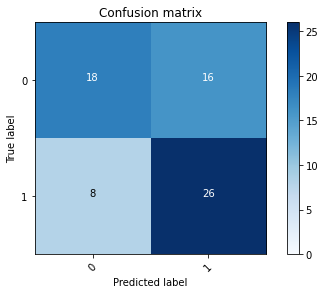

2022-08-03 20:22:53 - [Epoch Train: 16] loss: 0.0120, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:22:53 - [Epoch Valid: 16] loss: 1.0178, auc: 0.7102, acc: 0.6471, time: 7.00 s


 11%|████▎                                   | 16/150 [08:23<1:09:36, 31.17s/it]

2022-08-03 20:22:53 - EPOCH: 17
2022-08-03 20:22:57 - Train Step 10/60, train_loss: 0.0102
2022-08-03 20:23:01 - Train Step 20/60, train_loss: 0.0123
2022-08-03 20:23:05 - Train Step 30/60, train_loss: 0.0118
2022-08-03 20:23:09 - Train Step 40/60, train_loss: 0.0118
2022-08-03 20:23:13 - Train Step 50/60, train_loss: 0.0110
2022-08-03 20:23:17 - Train Step 60/60, train_loss: 0.0108
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:23:19 - Valid Step 5/17, valid_loss: 1.2438
2022-08-03 20:23:21 - Valid Step 10/17, valid_loss: 0.9546
2022-08-03 20:23:23 - Valid Step 15/17, valid_loss: 1.1171
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
17  UPENN-GBM-00092_11_T1w                0           1
48  UPENN-GBM-00093_11_T1w                0           0
47  UPENN-GBM-00094_11_T1w                0           1
52  UPENN-GBM-00115_11_T1w                1           1
3   UPENN-GBM-00117_11_T1w                0           1
59  UPENN-GBM-00128_11_T1w        

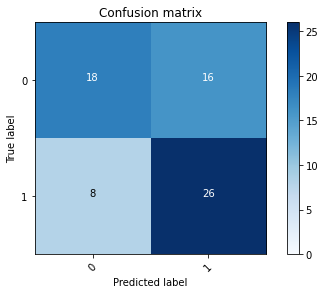

2022-08-03 20:23:24 - [Epoch Train: 17] loss: 0.0108, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:23:24 - [Epoch Valid: 17] loss: 1.0588, auc: 0.7024, acc: 0.6471, time: 7.00 s


 11%|████▌                                   | 17/150 [08:54<1:09:13, 31.23s/it]

2022-08-03 20:23:24 - EPOCH: 18
2022-08-03 20:23:29 - Train Step 10/60, train_loss: 0.0096
2022-08-03 20:23:33 - Train Step 20/60, train_loss: 0.0090
2022-08-03 20:23:37 - Train Step 30/60, train_loss: 0.0090
2022-08-03 20:23:40 - Train Step 40/60, train_loss: 0.0101
2022-08-03 20:23:44 - Train Step 50/60, train_loss: 0.0102
2022-08-03 20:23:48 - Train Step 60/60, train_loss: 0.0105
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:23:51 - Valid Step 5/17, valid_loss: 0.9951
2022-08-03 20:23:52 - Valid Step 10/17, valid_loss: 0.8717
2022-08-03 20:23:55 - Valid Step 15/17, valid_loss: 0.9031
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
3   UPENN-GBM-00092_11_T1w                0           1
51  UPENN-GBM-00093_11_T1w                0           0
42  UPENN-GBM-00094_11_T1w                0           1
10  UPENN-GBM-00115_11_T1w                1           1
13  UPENN-GBM-00117_11_T1w                0           1
36  UPENN-GBM-00128_11_T1w        

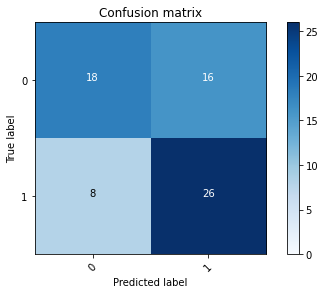

2022-08-03 20:23:55 - [Epoch Train: 18] loss: 0.0105, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:23:55 - [Epoch Valid: 18] loss: 1.0736, auc: 0.7042, acc: 0.6471, time: 7.00 s


 12%|████▊                                   | 18/150 [09:25<1:08:32, 31.15s/it]

2022-08-03 20:23:55 - EPOCH: 19
2022-08-03 20:24:00 - Train Step 10/60, train_loss: 0.0054
2022-08-03 20:24:03 - Train Step 20/60, train_loss: 0.0060
2022-08-03 20:24:07 - Train Step 30/60, train_loss: 0.0061
2022-08-03 20:24:11 - Train Step 40/60, train_loss: 0.0066
2022-08-03 20:24:15 - Train Step 50/60, train_loss: 0.0075
2022-08-03 20:24:18 - Train Step 60/60, train_loss: 0.0079
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:24:21 - Valid Step 5/17, valid_loss: 1.1150
2022-08-03 20:24:23 - Valid Step 10/17, valid_loss: 0.9066
2022-08-03 20:24:25 - Valid Step 15/17, valid_loss: 1.1493
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
25  UPENN-GBM-00092_11_T1w                0           1
59  UPENN-GBM-00093_11_T1w                0           0
55  UPENN-GBM-00094_11_T1w                0           1
33  UPENN-GBM-00115_11_T1w                1           1
7   UPENN-GBM-00117_11_T1w                0           1
62  UPENN-GBM-00128_11_T1w        

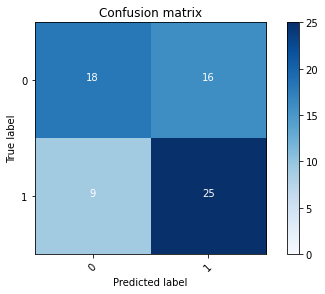

2022-08-03 20:24:26 - [Epoch Train: 19] loss: 0.0079, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:24:26 - [Epoch Valid: 19] loss: 1.0537, auc: 0.7042, acc: 0.6324, time: 7.00 s


 13%|█████                                   | 19/150 [09:56<1:07:49, 31.07s/it]

2022-08-03 20:24:26 - EPOCH: 20
2022-08-03 20:24:31 - Train Step 10/60, train_loss: 0.0088
2022-08-03 20:24:35 - Train Step 20/60, train_loss: 0.0095
2022-08-03 20:24:38 - Train Step 30/60, train_loss: 0.0089
2022-08-03 20:24:42 - Train Step 40/60, train_loss: 0.0083
2022-08-03 20:24:46 - Train Step 50/60, train_loss: 0.0081
2022-08-03 20:24:50 - Train Step 60/60, train_loss: 0.0078
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:24:53 - Valid Step 5/17, valid_loss: 0.7094
2022-08-03 20:24:54 - Valid Step 10/17, valid_loss: 1.2121
2022-08-03 20:24:57 - Valid Step 15/17, valid_loss: 1.1067
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
21  UPENN-GBM-00092_11_T1w                0           1
8   UPENN-GBM-00093_11_T1w                0           0
53  UPENN-GBM-00094_11_T1w                0           1
47  UPENN-GBM-00115_11_T1w                1           1
20  UPENN-GBM-00117_11_T1w                0           1
38  UPENN-GBM-00128_11_T1w        

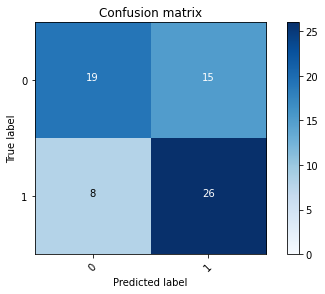

2022-08-03 20:24:58 - [Epoch Train: 20] loss: 0.0078, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 20:24:58 - [Epoch Valid: 20] loss: 1.0905, auc: 0.7042, acc: 0.6618, time: 7.00 s
2022-08-03 20:24:58 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e20-loss1.090-acc0.662-auc0.704.pth'


 13%|█████▎                                  | 20/150 [10:28<1:07:29, 31.15s/it]

2022-08-03 20:24:58 - EPOCH: 21
2022-08-03 20:25:02 - Train Step 10/60, train_loss: 0.0062
2022-08-03 20:25:06 - Train Step 20/60, train_loss: 0.0062
2022-08-03 20:25:09 - Train Step 30/60, train_loss: 0.0059
2022-08-03 20:25:13 - Train Step 40/60, train_loss: 0.0065
2022-08-03 20:25:17 - Train Step 50/60, train_loss: 0.0062
2022-08-03 20:25:20 - Train Step 60/60, train_loss: 0.0064
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:25:23 - Valid Step 5/17, valid_loss: 1.0550
2022-08-03 20:25:25 - Valid Step 10/17, valid_loss: 1.0434
2022-08-03 20:25:27 - Valid Step 15/17, valid_loss: 1.0924
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
39  UPENN-GBM-00092_11_T1w                0           1
21  UPENN-GBM-00093_11_T1w                0           0
4   UPENN-GBM-00094_11_T1w                0           1
15  UPENN-GBM-00115_11_T1w                1           1
57  UPENN-GBM-00117_11_T1w                0           1
53  UPENN-GBM-00128_11_T1w        

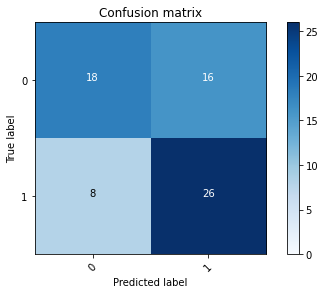

2022-08-03 20:25:28 - [Epoch Train: 21] loss: 0.0064, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:25:28 - [Epoch Valid: 21] loss: 1.1228, auc: 0.7067, acc: 0.6471, time: 7.00 s


 14%|█████▌                                  | 21/150 [10:58<1:06:20, 30.86s/it]

2022-08-03 20:25:28 - EPOCH: 22
2022-08-03 20:25:32 - Train Step 10/60, train_loss: 0.0050
2022-08-03 20:25:36 - Train Step 20/60, train_loss: 0.0056
2022-08-03 20:25:40 - Train Step 30/60, train_loss: 0.0054
2022-08-03 20:25:43 - Train Step 40/60, train_loss: 0.0057
2022-08-03 20:25:47 - Train Step 50/60, train_loss: 0.0060
2022-08-03 20:25:51 - Train Step 60/60, train_loss: 0.0058
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:25:54 - Valid Step 5/17, valid_loss: 1.6748
2022-08-03 20:25:55 - Valid Step 10/17, valid_loss: 1.2312
2022-08-03 20:25:58 - Valid Step 15/17, valid_loss: 1.2520
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
38  UPENN-GBM-00092_11_T1w                0           1
11  UPENN-GBM-00093_11_T1w                0           0
62  UPENN-GBM-00094_11_T1w                0           1
44  UPENN-GBM-00115_11_T1w                1           1
5   UPENN-GBM-00117_11_T1w                0           1
14  UPENN-GBM-00128_11_T1w        

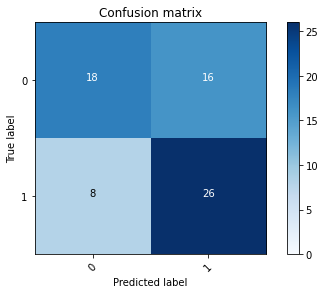

2022-08-03 20:25:59 - [Epoch Train: 22] loss: 0.0058, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:25:59 - [Epoch Valid: 22] loss: 1.1471, auc: 0.7024, acc: 0.6471, time: 7.00 s


 15%|█████▊                                  | 22/150 [11:28<1:05:45, 30.83s/it]

2022-08-03 20:25:59 - EPOCH: 23
2022-08-03 20:26:03 - Train Step 10/60, train_loss: 0.0051
2022-08-03 20:26:07 - Train Step 20/60, train_loss: 0.0048
2022-08-03 20:26:11 - Train Step 30/60, train_loss: 0.0047
2022-08-03 20:26:14 - Train Step 40/60, train_loss: 0.0046
2022-08-03 20:26:18 - Train Step 50/60, train_loss: 0.0048
2022-08-03 20:26:22 - Train Step 60/60, train_loss: 0.0068
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:26:25 - Valid Step 5/17, valid_loss: 0.9440
2022-08-03 20:26:27 - Valid Step 10/17, valid_loss: 1.1585
2022-08-03 20:26:29 - Valid Step 15/17, valid_loss: 1.2590
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
59  UPENN-GBM-00092_11_T1w                0           1
12  UPENN-GBM-00093_11_T1w                0           0
20  UPENN-GBM-00094_11_T1w                0           1
34  UPENN-GBM-00115_11_T1w                1           1
31  UPENN-GBM-00117_11_T1w                0           1
65  UPENN-GBM-00128_11_T1w        

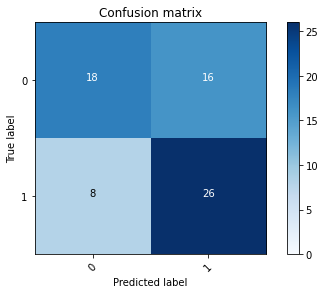

2022-08-03 20:26:30 - [Epoch Train: 23] loss: 0.0068, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:26:30 - [Epoch Valid: 23] loss: 1.1559, auc: 0.7137, acc: 0.6471, time: 7.00 s


 15%|██████▏                                 | 23/150 [12:00<1:05:37, 31.00s/it]

2022-08-03 20:26:30 - EPOCH: 24
2022-08-03 20:26:34 - Train Step 10/60, train_loss: 0.0077
2022-08-03 20:26:38 - Train Step 20/60, train_loss: 0.0071
2022-08-03 20:26:42 - Train Step 30/60, train_loss: 0.0064
2022-08-03 20:26:46 - Train Step 40/60, train_loss: 0.0059
2022-08-03 20:26:50 - Train Step 50/60, train_loss: 0.0057
2022-08-03 20:26:53 - Train Step 60/60, train_loss: 0.0057
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:26:56 - Valid Step 5/17, valid_loss: 1.4701
2022-08-03 20:26:58 - Valid Step 10/17, valid_loss: 0.9763
2022-08-03 20:27:00 - Valid Step 15/17, valid_loss: 1.2061
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
0   UPENN-GBM-00092_11_T1w                0           1
25  UPENN-GBM-00093_11_T1w                0           0
65  UPENN-GBM-00094_11_T1w                0           1
44  UPENN-GBM-00115_11_T1w                1           1
41  UPENN-GBM-00117_11_T1w                0           1
63  UPENN-GBM-00128_11_T1w        

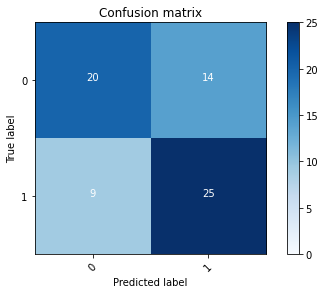

2022-08-03 20:27:01 - [Epoch Train: 24] loss: 0.0057, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:27:01 - [Epoch Valid: 24] loss: 1.1284, auc: 0.7085, acc: 0.6618, time: 7.00 s
2022-08-03 20:27:01 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e24-loss1.128-acc0.662-auc0.708.pth'


 16%|██████▍                                 | 24/150 [12:31<1:05:04, 30.98s/it]

2022-08-03 20:27:01 - EPOCH: 25
2022-08-03 20:27:05 - Train Step 10/60, train_loss: 0.0038
2022-08-03 20:27:09 - Train Step 20/60, train_loss: 0.0037
2022-08-03 20:27:13 - Train Step 30/60, train_loss: 0.0042
2022-08-03 20:27:17 - Train Step 40/60, train_loss: 0.0044
2022-08-03 20:27:21 - Train Step 50/60, train_loss: 0.0042
2022-08-03 20:27:25 - Train Step 60/60, train_loss: 0.0047
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:27:27 - Valid Step 5/17, valid_loss: 1.1555
2022-08-03 20:27:29 - Valid Step 10/17, valid_loss: 1.2654
2022-08-03 20:27:31 - Valid Step 15/17, valid_loss: 1.1452
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
37  UPENN-GBM-00092_11_T1w                0           1
6   UPENN-GBM-00093_11_T1w                0           0
19  UPENN-GBM-00094_11_T1w                0           1
35  UPENN-GBM-00115_11_T1w                1           1
28  UPENN-GBM-00117_11_T1w                0           1
55  UPENN-GBM-00128_11_T1w        

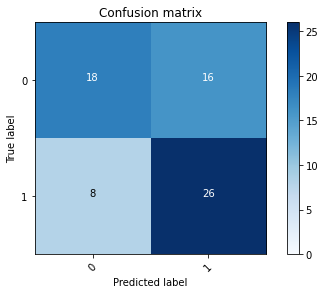

2022-08-03 20:27:32 - [Epoch Train: 25] loss: 0.0047, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:27:32 - [Epoch Valid: 25] loss: 1.1716, auc: 0.7067, acc: 0.6471, time: 7.00 s


 17%|██████▋                                 | 25/150 [13:02<1:04:48, 31.11s/it]

2022-08-03 20:27:32 - EPOCH: 26
2022-08-03 20:27:37 - Train Step 10/60, train_loss: 0.0042
2022-08-03 20:27:40 - Train Step 20/60, train_loss: 0.0037
2022-08-03 20:27:44 - Train Step 30/60, train_loss: 0.0035
2022-08-03 20:27:48 - Train Step 40/60, train_loss: 0.0034
2022-08-03 20:27:52 - Train Step 50/60, train_loss: 0.0037
2022-08-03 20:27:55 - Train Step 60/60, train_loss: 0.0035
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:27:58 - Valid Step 5/17, valid_loss: 2.1345
2022-08-03 20:28:00 - Valid Step 10/17, valid_loss: 1.4626
2022-08-03 20:28:02 - Valid Step 15/17, valid_loss: 1.3006
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
49  UPENN-GBM-00092_11_T1w                0           1
31  UPENN-GBM-00093_11_T1w                0           0
11  UPENN-GBM-00094_11_T1w                0           1
15  UPENN-GBM-00115_11_T1w                1           1
37  UPENN-GBM-00117_11_T1w                0           1
28  UPENN-GBM-00128_11_T1w        

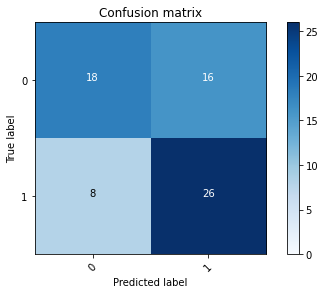

2022-08-03 20:28:03 - [Epoch Train: 26] loss: 0.0035, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:28:03 - [Epoch Valid: 26] loss: 1.2495, auc: 0.7059, acc: 0.6471, time: 7.00 s


 17%|██████▉                                 | 26/150 [13:33<1:04:08, 31.04s/it]

2022-08-03 20:28:03 - EPOCH: 27
2022-08-03 20:28:07 - Train Step 10/60, train_loss: 0.0034
2022-08-03 20:28:11 - Train Step 20/60, train_loss: 0.0035
2022-08-03 20:28:15 - Train Step 30/60, train_loss: 0.0033
2022-08-03 20:28:19 - Train Step 40/60, train_loss: 0.0033
2022-08-03 20:28:23 - Train Step 50/60, train_loss: 0.0033
2022-08-03 20:28:27 - Train Step 60/60, train_loss: 0.0033
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:28:30 - Valid Step 5/17, valid_loss: 1.1005
2022-08-03 20:28:32 - Valid Step 10/17, valid_loss: 1.2172
2022-08-03 20:28:34 - Valid Step 15/17, valid_loss: 1.1974
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
42  UPENN-GBM-00092_11_T1w                0           1
31  UPENN-GBM-00093_11_T1w                0           0
4   UPENN-GBM-00094_11_T1w                0           1
19  UPENN-GBM-00115_11_T1w                1           1
13  UPENN-GBM-00117_11_T1w                0           1
21  UPENN-GBM-00128_11_T1w        

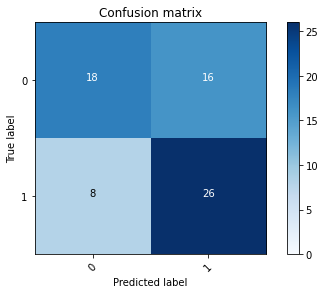

2022-08-03 20:28:35 - [Epoch Train: 27] loss: 0.0033, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 20:28:35 - [Epoch Valid: 27] loss: 1.2459, auc: 0.7085, acc: 0.6471, time: 7.00 s


 18%|███████▏                                | 27/150 [14:05<1:04:04, 31.26s/it]

2022-08-03 20:28:35 - EPOCH: 28
2022-08-03 20:28:39 - Train Step 10/60, train_loss: 0.0028
2022-08-03 20:28:43 - Train Step 20/60, train_loss: 0.0031
2022-08-03 20:28:47 - Train Step 30/60, train_loss: 0.0032
2022-08-03 20:28:51 - Train Step 40/60, train_loss: 0.0031
2022-08-03 20:28:55 - Train Step 50/60, train_loss: 0.0031
2022-08-03 20:28:58 - Train Step 60/60, train_loss: 0.0030
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:29:01 - Valid Step 5/17, valid_loss: 1.9015
2022-08-03 20:29:03 - Valid Step 10/17, valid_loss: 1.4116
2022-08-03 20:29:05 - Valid Step 15/17, valid_loss: 1.2234
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
55  UPENN-GBM-00092_11_T1w                0           1
44  UPENN-GBM-00093_11_T1w                0           0
14  UPENN-GBM-00094_11_T1w                0           1
4   UPENN-GBM-00115_11_T1w                1           1
22  UPENN-GBM-00117_11_T1w                0           1
50  UPENN-GBM-00128_11_T1w        

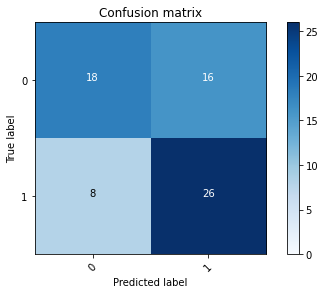

2022-08-03 20:29:06 - [Epoch Train: 28] loss: 0.0030, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:29:06 - [Epoch Valid: 28] loss: 1.2253, auc: 0.7076, acc: 0.6471, time: 7.00 s


 19%|███████▍                                | 28/150 [14:36<1:03:36, 31.29s/it]

2022-08-03 20:29:06 - EPOCH: 29
2022-08-03 20:29:11 - Train Step 10/60, train_loss: 0.0043
2022-08-03 20:29:14 - Train Step 20/60, train_loss: 0.0040
2022-08-03 20:29:18 - Train Step 30/60, train_loss: 0.0036
2022-08-03 20:29:22 - Train Step 40/60, train_loss: 0.0034
2022-08-03 20:29:26 - Train Step 50/60, train_loss: 0.0032
2022-08-03 20:29:30 - Train Step 60/60, train_loss: 0.0031
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:29:33 - Valid Step 5/17, valid_loss: 0.6749
2022-08-03 20:29:35 - Valid Step 10/17, valid_loss: 1.0832
2022-08-03 20:29:37 - Valid Step 15/17, valid_loss: 1.3356
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
14  UPENN-GBM-00092_11_T1w                0           1
6   UPENN-GBM-00093_11_T1w                0           0
19  UPENN-GBM-00094_11_T1w                0           1
27  UPENN-GBM-00115_11_T1w                1           1
34  UPENN-GBM-00117_11_T1w                0           1
41  UPENN-GBM-00128_11_T1w        

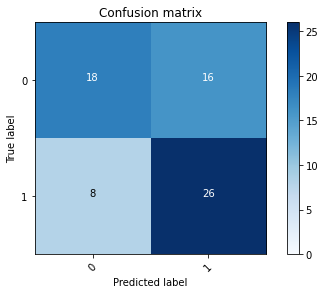

2022-08-03 20:29:38 - [Epoch Train: 29] loss: 0.0031, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:29:38 - [Epoch Valid: 29] loss: 1.2765, auc: 0.7093, acc: 0.6471, time: 7.00 s


 19%|███████▋                                | 29/150 [15:08<1:03:15, 31.37s/it]

2022-08-03 20:29:38 - EPOCH: 30
2022-08-03 20:29:42 - Train Step 10/60, train_loss: 0.0020
2022-08-03 20:29:46 - Train Step 20/60, train_loss: 0.0021
2022-08-03 20:29:50 - Train Step 30/60, train_loss: 0.0022
2022-08-03 20:29:54 - Train Step 40/60, train_loss: 0.0023
2022-08-03 20:29:57 - Train Step 50/60, train_loss: 0.0024
2022-08-03 20:30:01 - Train Step 60/60, train_loss: 0.0026
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:30:04 - Valid Step 5/17, valid_loss: 1.5741
2022-08-03 20:30:05 - Valid Step 10/17, valid_loss: 1.5394
2022-08-03 20:30:08 - Valid Step 15/17, valid_loss: 1.3131
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
50  UPENN-GBM-00092_11_T1w                0           1
5   UPENN-GBM-00093_11_T1w                0           0
37  UPENN-GBM-00094_11_T1w                0           1
21  UPENN-GBM-00115_11_T1w                1           1
7   UPENN-GBM-00117_11_T1w                0           1
38  UPENN-GBM-00128_11_T1w        

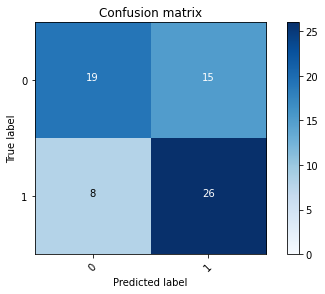

2022-08-03 20:30:09 - [Epoch Train: 30] loss: 0.0026, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:30:09 - [Epoch Valid: 30] loss: 1.2340, auc: 0.7076, acc: 0.6618, time: 7.00 s
2022-08-03 20:30:09 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e30-loss1.234-acc0.662-auc0.708.pth'


 20%|████████                                | 30/150 [15:39<1:02:22, 31.19s/it]

2022-08-03 20:30:09 - EPOCH: 31
2022-08-03 20:30:13 - Train Step 10/60, train_loss: 0.0015
2022-08-03 20:30:17 - Train Step 20/60, train_loss: 0.0017
2022-08-03 20:30:21 - Train Step 30/60, train_loss: 0.0019
2022-08-03 20:30:25 - Train Step 40/60, train_loss: 0.0018
2022-08-03 20:30:29 - Train Step 50/60, train_loss: 0.0019
2022-08-03 20:30:32 - Train Step 60/60, train_loss: 0.0019
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:30:35 - Valid Step 5/17, valid_loss: 1.5487
2022-08-03 20:30:37 - Valid Step 10/17, valid_loss: 1.4582
2022-08-03 20:30:39 - Valid Step 15/17, valid_loss: 1.2219
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
6   UPENN-GBM-00092_11_T1w                0           1
1   UPENN-GBM-00093_11_T1w                0           0
26  UPENN-GBM-00094_11_T1w                0           1
28  UPENN-GBM-00115_11_T1w                1           1
14  UPENN-GBM-00117_11_T1w                0           1
49  UPENN-GBM-00128_11_T1w        

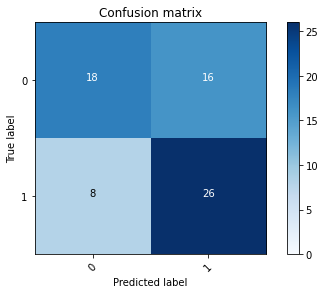

2022-08-03 20:30:40 - [Epoch Train: 31] loss: 0.0019, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:30:40 - [Epoch Valid: 31] loss: 1.2847, auc: 0.7102, acc: 0.6471, time: 7.00 s


 21%|████████▎                               | 31/150 [16:10<1:01:57, 31.24s/it]

2022-08-03 20:30:40 - EPOCH: 32
2022-08-03 20:30:44 - Train Step 10/60, train_loss: 0.0022
2022-08-03 20:30:49 - Train Step 20/60, train_loss: 0.0023
2022-08-03 20:30:53 - Train Step 30/60, train_loss: 0.0021
2022-08-03 20:30:56 - Train Step 40/60, train_loss: 0.0023
2022-08-03 20:31:00 - Train Step 50/60, train_loss: 0.0022
2022-08-03 20:31:04 - Train Step 60/60, train_loss: 0.0022
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:31:06 - Valid Step 5/17, valid_loss: 1.9048
2022-08-03 20:31:08 - Valid Step 10/17, valid_loss: 1.5076
2022-08-03 20:31:10 - Valid Step 15/17, valid_loss: 1.3133
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
53  UPENN-GBM-00092_11_T1w                0           1
25  UPENN-GBM-00093_11_T1w                0           0
26  UPENN-GBM-00094_11_T1w                0           1
5   UPENN-GBM-00115_11_T1w                1           1
56  UPENN-GBM-00117_11_T1w                0           1
34  UPENN-GBM-00128_11_T1w        

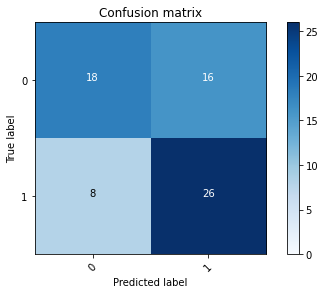

2022-08-03 20:31:11 - [Epoch Train: 32] loss: 0.0022, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 20:31:11 - [Epoch Valid: 32] loss: 1.3237, auc: 0.7128, acc: 0.6471, time: 7.00 s


 21%|████████▌                               | 32/150 [16:41<1:01:07, 31.08s/it]

2022-08-03 20:31:11 - EPOCH: 33
2022-08-03 20:31:15 - Train Step 10/60, train_loss: 0.0015
2022-08-03 20:31:18 - Train Step 20/60, train_loss: 0.0019
2022-08-03 20:31:22 - Train Step 30/60, train_loss: 0.0018
2022-08-03 20:31:25 - Train Step 40/60, train_loss: 0.0019
2022-08-03 20:31:29 - Train Step 50/60, train_loss: 0.0018
2022-08-03 20:31:32 - Train Step 60/60, train_loss: 0.0019
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:31:35 - Valid Step 5/17, valid_loss: 1.7511
2022-08-03 20:31:36 - Valid Step 10/17, valid_loss: 1.4340
2022-08-03 20:31:39 - Valid Step 15/17, valid_loss: 1.4155
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
16  UPENN-GBM-00092_11_T1w                0           1
1   UPENN-GBM-00093_11_T1w                0           0
6   UPENN-GBM-00094_11_T1w                0           1
24  UPENN-GBM-00115_11_T1w                1           1
18  UPENN-GBM-00117_11_T1w                0           1
8   UPENN-GBM-00128_11_T1w        

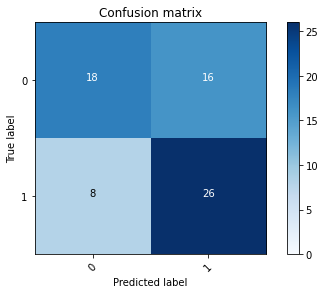

2022-08-03 20:31:39 - [Epoch Train: 33] loss: 0.0019, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:31:39 - [Epoch Valid: 33] loss: 1.3231, auc: 0.7137, acc: 0.6471, time: 6.00 s


 22%|█████████▏                                | 33/150 [17:09<59:12, 30.37s/it]

2022-08-03 20:31:39 - EPOCH: 34
2022-08-03 20:31:43 - Train Step 10/60, train_loss: 0.0013
2022-08-03 20:31:47 - Train Step 20/60, train_loss: 0.0016
2022-08-03 20:31:51 - Train Step 30/60, train_loss: 0.0017
2022-08-03 20:31:54 - Train Step 40/60, train_loss: 0.0017
2022-08-03 20:31:58 - Train Step 50/60, train_loss: 0.0018
2022-08-03 20:32:02 - Train Step 60/60, train_loss: 0.0018
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:32:04 - Valid Step 5/17, valid_loss: 1.3128
2022-08-03 20:32:06 - Valid Step 10/17, valid_loss: 1.1321
2022-08-03 20:32:08 - Valid Step 15/17, valid_loss: 1.3733
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
22  UPENN-GBM-00092_11_T1w                0           1
43  UPENN-GBM-00093_11_T1w                0           0
36  UPENN-GBM-00094_11_T1w                0           1
21  UPENN-GBM-00115_11_T1w                1           1
67  UPENN-GBM-00117_11_T1w                0           1
63  UPENN-GBM-00128_11_T1w        

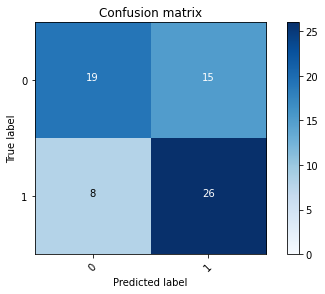

2022-08-03 20:32:09 - [Epoch Train: 34] loss: 0.0018, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:32:09 - [Epoch Valid: 34] loss: 1.2744, auc: 0.7128, acc: 0.6618, time: 6.00 s
2022-08-03 20:32:09 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e34-loss1.274-acc0.662-auc0.713.pth'


 23%|█████████▌                                | 34/150 [17:39<58:02, 30.02s/it]

2022-08-03 20:32:09 - EPOCH: 35
2022-08-03 20:32:13 - Train Step 10/60, train_loss: 0.0019
2022-08-03 20:32:16 - Train Step 20/60, train_loss: 0.0015
2022-08-03 20:32:20 - Train Step 30/60, train_loss: 0.0015
2022-08-03 20:32:24 - Train Step 40/60, train_loss: 0.0015
2022-08-03 20:32:27 - Train Step 50/60, train_loss: 0.0014
2022-08-03 20:32:31 - Train Step 60/60, train_loss: 0.0014
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:32:33 - Valid Step 5/17, valid_loss: 1.0639
2022-08-03 20:32:35 - Valid Step 10/17, valid_loss: 1.5909
2022-08-03 20:32:37 - Valid Step 15/17, valid_loss: 1.1698
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
35  UPENN-GBM-00092_11_T1w                0           1
57  UPENN-GBM-00093_11_T1w                0           0
18  UPENN-GBM-00094_11_T1w                0           1
40  UPENN-GBM-00115_11_T1w                1           1
10  UPENN-GBM-00117_11_T1w                0           1
8   UPENN-GBM-00128_11_T1w        

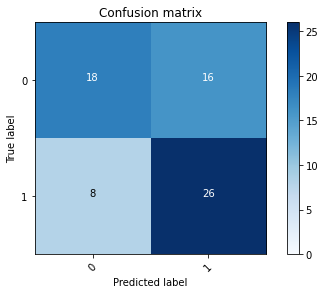

2022-08-03 20:32:38 - [Epoch Train: 35] loss: 0.0014, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:32:38 - [Epoch Valid: 35] loss: 1.3477, auc: 0.7145, acc: 0.6471, time: 6.00 s


 23%|█████████▊                                | 35/150 [18:08<57:10, 29.83s/it]

2022-08-03 20:32:38 - EPOCH: 36
2022-08-03 20:32:42 - Train Step 10/60, train_loss: 0.0015
2022-08-03 20:32:46 - Train Step 20/60, train_loss: 0.0018
2022-08-03 20:32:49 - Train Step 30/60, train_loss: 0.0015
2022-08-03 20:32:53 - Train Step 40/60, train_loss: 0.0014
2022-08-03 20:32:57 - Train Step 50/60, train_loss: 0.0014
2022-08-03 20:33:00 - Train Step 60/60, train_loss: 0.0017
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:33:03 - Valid Step 5/17, valid_loss: 0.8002
2022-08-03 20:33:04 - Valid Step 10/17, valid_loss: 0.8470
2022-08-03 20:33:06 - Valid Step 15/17, valid_loss: 1.4913
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
10  UPENN-GBM-00092_11_T1w                0           1
2   UPENN-GBM-00093_11_T1w                0           0
59  UPENN-GBM-00094_11_T1w                0           1
44  UPENN-GBM-00115_11_T1w                1           1
11  UPENN-GBM-00117_11_T1w                0           1
23  UPENN-GBM-00128_11_T1w        

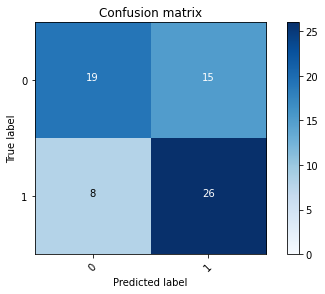

2022-08-03 20:33:07 - [Epoch Train: 36] loss: 0.0017, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:33:07 - [Epoch Valid: 36] loss: 1.3236, auc: 0.7111, acc: 0.6618, time: 6.00 s
2022-08-03 20:33:07 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e36-loss1.324-acc0.662-auc0.711.pth'


 24%|██████████                                | 36/150 [18:37<56:20, 29.66s/it]

2022-08-03 20:33:07 - EPOCH: 37
2022-08-03 20:33:11 - Train Step 10/60, train_loss: 0.0016
2022-08-03 20:33:15 - Train Step 20/60, train_loss: 0.0014
2022-08-03 20:33:18 - Train Step 30/60, train_loss: 0.0013
2022-08-03 20:33:22 - Train Step 40/60, train_loss: 0.0013
2022-08-03 20:33:26 - Train Step 50/60, train_loss: 0.0013
2022-08-03 20:33:29 - Train Step 60/60, train_loss: 0.0013
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:33:32 - Valid Step 5/17, valid_loss: 1.4136
2022-08-03 20:33:33 - Valid Step 10/17, valid_loss: 1.6581
2022-08-03 20:33:36 - Valid Step 15/17, valid_loss: 1.4353
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
38  UPENN-GBM-00092_11_T1w                0           1
19  UPENN-GBM-00093_11_T1w                0           0
32  UPENN-GBM-00094_11_T1w                0           1
29  UPENN-GBM-00115_11_T1w                1           1
41  UPENN-GBM-00117_11_T1w                0           1
42  UPENN-GBM-00128_11_T1w        

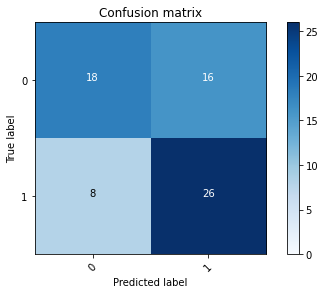

2022-08-03 20:33:37 - [Epoch Train: 37] loss: 0.0013, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:33:37 - [Epoch Valid: 37] loss: 1.3486, auc: 0.7111, acc: 0.6471, time: 7.00 s


 25%|██████████▎                               | 37/150 [19:06<55:38, 29.55s/it]

2022-08-03 20:33:37 - EPOCH: 38
2022-08-03 20:33:40 - Train Step 10/60, train_loss: 0.0013
2022-08-03 20:33:44 - Train Step 20/60, train_loss: 0.0013
2022-08-03 20:33:47 - Train Step 30/60, train_loss: 0.0012
2022-08-03 20:33:51 - Train Step 40/60, train_loss: 0.0012
2022-08-03 20:33:54 - Train Step 50/60, train_loss: 0.0014
2022-08-03 20:33:57 - Train Step 60/60, train_loss: 0.0014
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:34:00 - Valid Step 5/17, valid_loss: 0.7438
2022-08-03 20:34:01 - Valid Step 10/17, valid_loss: 1.2940
2022-08-03 20:34:04 - Valid Step 15/17, valid_loss: 1.3127
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
65  UPENN-GBM-00092_11_T1w                0           1
60  UPENN-GBM-00093_11_T1w                0           0
64  UPENN-GBM-00094_11_T1w                0           1
38  UPENN-GBM-00115_11_T1w                1           1
57  UPENN-GBM-00117_11_T1w                0           1
34  UPENN-GBM-00128_11_T1w        

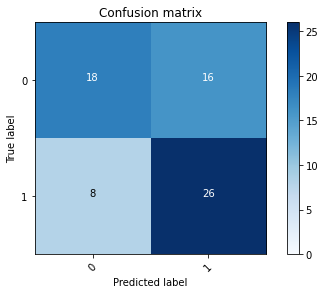

2022-08-03 20:34:04 - [Epoch Train: 38] loss: 0.0014, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:34:04 - [Epoch Valid: 38] loss: 1.3613, auc: 0.7093, acc: 0.6471, time: 6.00 s


 25%|██████████▋                               | 38/150 [19:34<54:16, 29.07s/it]

2022-08-03 20:34:04 - EPOCH: 39
2022-08-03 20:34:08 - Train Step 10/60, train_loss: 0.0011
2022-08-03 20:34:12 - Train Step 20/60, train_loss: 0.0012
2022-08-03 20:34:15 - Train Step 30/60, train_loss: 0.0012
2022-08-03 20:34:19 - Train Step 40/60, train_loss: 0.0012
2022-08-03 20:34:22 - Train Step 50/60, train_loss: 0.0012
2022-08-03 20:34:26 - Train Step 60/60, train_loss: 0.0012
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:34:28 - Valid Step 5/17, valid_loss: 1.2987
2022-08-03 20:34:30 - Valid Step 10/17, valid_loss: 1.5783
2022-08-03 20:34:32 - Valid Step 15/17, valid_loss: 1.3811
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
11  UPENN-GBM-00092_11_T1w                0           1
28  UPENN-GBM-00093_11_T1w                0           0
12  UPENN-GBM-00094_11_T1w                0           1
9   UPENN-GBM-00115_11_T1w                1           1
15  UPENN-GBM-00117_11_T1w                0           1
24  UPENN-GBM-00128_11_T1w        

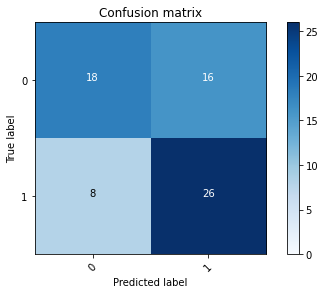

2022-08-03 20:34:33 - [Epoch Train: 39] loss: 0.0012, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:34:33 - [Epoch Valid: 39] loss: 1.4112, auc: 0.7085, acc: 0.6471, time: 6.00 s


 26%|██████████▉                               | 39/150 [20:03<53:26, 28.89s/it]

2022-08-03 20:34:33 - EPOCH: 40
2022-08-03 20:34:37 - Train Step 10/60, train_loss: 0.0016
2022-08-03 20:34:40 - Train Step 20/60, train_loss: 0.0013
2022-08-03 20:34:44 - Train Step 30/60, train_loss: 0.0012
2022-08-03 20:34:48 - Train Step 40/60, train_loss: 0.0013
2022-08-03 20:34:51 - Train Step 50/60, train_loss: 0.0012
2022-08-03 20:34:55 - Train Step 60/60, train_loss: 0.0012
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:34:57 - Valid Step 5/17, valid_loss: 1.7440
2022-08-03 20:34:59 - Valid Step 10/17, valid_loss: 1.5356
2022-08-03 20:35:01 - Valid Step 15/17, valid_loss: 1.3423
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
13  UPENN-GBM-00092_11_T1w                0           1
19  UPENN-GBM-00093_11_T1w                0           0
16  UPENN-GBM-00094_11_T1w                0           1
61  UPENN-GBM-00115_11_T1w                1           1
14  UPENN-GBM-00117_11_T1w                0           1
22  UPENN-GBM-00128_11_T1w        

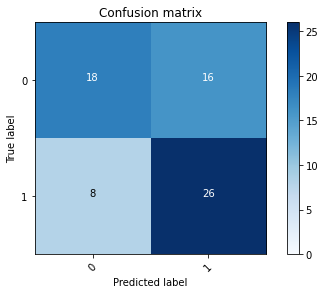

2022-08-03 20:35:02 - [Epoch Train: 40] loss: 0.0012, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:35:02 - [Epoch Valid: 40] loss: 1.3408, auc: 0.7128, acc: 0.6471, time: 7.00 s


 27%|███████████▏                              | 40/150 [20:32<53:13, 29.03s/it]

2022-08-03 20:35:02 - EPOCH: 41
2022-08-03 20:35:06 - Train Step 10/60, train_loss: 0.0008
2022-08-03 20:35:10 - Train Step 20/60, train_loss: 0.0009
2022-08-03 20:35:14 - Train Step 30/60, train_loss: 0.0010
2022-08-03 20:35:17 - Train Step 40/60, train_loss: 0.0010
2022-08-03 20:35:21 - Train Step 50/60, train_loss: 0.0010
2022-08-03 20:35:24 - Train Step 60/60, train_loss: 0.0011
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:35:27 - Valid Step 5/17, valid_loss: 1.3160
2022-08-03 20:35:28 - Valid Step 10/17, valid_loss: 1.6875
2022-08-03 20:35:31 - Valid Step 15/17, valid_loss: 1.4096
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
21  UPENN-GBM-00092_11_T1w                0           1
51  UPENN-GBM-00093_11_T1w                0           0
22  UPENN-GBM-00094_11_T1w                0           1
14  UPENN-GBM-00115_11_T1w                1           1
50  UPENN-GBM-00117_11_T1w                0           1
48  UPENN-GBM-00128_11_T1w        

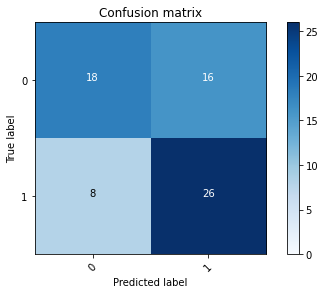

2022-08-03 20:35:31 - [Epoch Train: 41] loss: 0.0011, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:35:31 - [Epoch Valid: 41] loss: 1.3939, auc: 0.7067, acc: 0.6471, time: 6.00 s


 27%|███████████▍                              | 41/150 [21:01<52:43, 29.03s/it]

2022-08-03 20:35:31 - EPOCH: 42
2022-08-03 20:35:35 - Train Step 10/60, train_loss: 0.0011
2022-08-03 20:35:39 - Train Step 20/60, train_loss: 0.0009
2022-08-03 20:35:43 - Train Step 30/60, train_loss: 0.0008
2022-08-03 20:35:46 - Train Step 40/60, train_loss: 0.0008
2022-08-03 20:35:50 - Train Step 50/60, train_loss: 0.0008
2022-08-03 20:35:53 - Train Step 60/60, train_loss: 0.0008
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:35:56 - Valid Step 5/17, valid_loss: 2.1700
2022-08-03 20:35:58 - Valid Step 10/17, valid_loss: 1.6436
2022-08-03 20:36:00 - Valid Step 15/17, valid_loss: 1.3979
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
3   UPENN-GBM-00092_11_T1w                0           1
43  UPENN-GBM-00093_11_T1w                0           0
56  UPENN-GBM-00094_11_T1w                0           1
60  UPENN-GBM-00115_11_T1w                1           1
58  UPENN-GBM-00117_11_T1w                0           1
17  UPENN-GBM-00128_11_T1w        

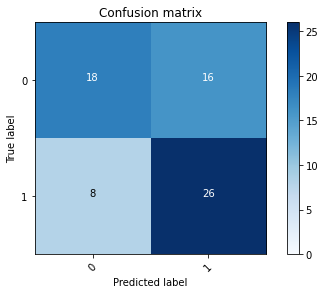

2022-08-03 20:36:01 - [Epoch Train: 42] loss: 0.0008, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:36:01 - [Epoch Valid: 42] loss: 1.3788, auc: 0.7085, acc: 0.6471, time: 7.00 s


 28%|███████████▊                              | 42/150 [21:31<52:25, 29.13s/it]

2022-08-03 20:36:01 - EPOCH: 43
2022-08-03 20:36:05 - Train Step 10/60, train_loss: 0.0011
2022-08-03 20:36:08 - Train Step 20/60, train_loss: 0.0010
2022-08-03 20:36:12 - Train Step 30/60, train_loss: 0.0010
2022-08-03 20:36:15 - Train Step 40/60, train_loss: 0.0009
2022-08-03 20:36:19 - Train Step 50/60, train_loss: 0.0009
2022-08-03 20:36:23 - Train Step 60/60, train_loss: 0.0009
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:36:25 - Valid Step 5/17, valid_loss: 1.8528
2022-08-03 20:36:27 - Valid Step 10/17, valid_loss: 1.4074
2022-08-03 20:36:29 - Valid Step 15/17, valid_loss: 1.3391
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
19  UPENN-GBM-00092_11_T1w                0           1
31  UPENN-GBM-00093_11_T1w                0           0
58  UPENN-GBM-00094_11_T1w                0           1
21  UPENN-GBM-00115_11_T1w                1           1
56  UPENN-GBM-00117_11_T1w                0           1
61  UPENN-GBM-00128_11_T1w        

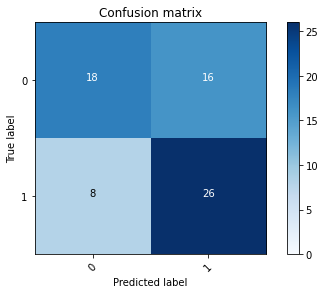

2022-08-03 20:36:30 - [Epoch Train: 43] loss: 0.0009, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:36:30 - [Epoch Valid: 43] loss: 1.4269, auc: 0.7145, acc: 0.6471, time: 7.00 s


 29%|████████████                              | 43/150 [22:00<51:54, 29.11s/it]

2022-08-03 20:36:30 - EPOCH: 44
2022-08-03 20:36:34 - Train Step 10/60, train_loss: 0.0010
2022-08-03 20:36:37 - Train Step 20/60, train_loss: 0.0009
2022-08-03 20:36:41 - Train Step 30/60, train_loss: 0.0010
2022-08-03 20:36:45 - Train Step 40/60, train_loss: 0.0009
2022-08-03 20:36:48 - Train Step 50/60, train_loss: 0.0008
2022-08-03 20:36:52 - Train Step 60/60, train_loss: 0.0008
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:36:54 - Valid Step 5/17, valid_loss: 1.5352
2022-08-03 20:36:56 - Valid Step 10/17, valid_loss: 1.6792
2022-08-03 20:36:58 - Valid Step 15/17, valid_loss: 1.4806
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
29  UPENN-GBM-00092_11_T1w                0           1
55  UPENN-GBM-00093_11_T1w                0           0
65  UPENN-GBM-00094_11_T1w                0           1
5   UPENN-GBM-00115_11_T1w                1           1
13  UPENN-GBM-00117_11_T1w                0           1
15  UPENN-GBM-00128_11_T1w        

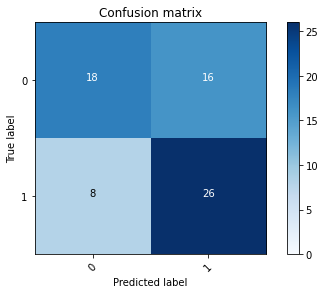

2022-08-03 20:36:59 - [Epoch Train: 44] loss: 0.0008, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:36:59 - [Epoch Valid: 44] loss: 1.4845, auc: 0.7128, acc: 0.6471, time: 6.00 s


 29%|████████████▎                             | 44/150 [22:29<51:23, 29.09s/it]

2022-08-03 20:36:59 - EPOCH: 45
2022-08-03 20:37:03 - Train Step 10/60, train_loss: 0.0007
2022-08-03 20:37:06 - Train Step 20/60, train_loss: 0.0008
2022-08-03 20:37:10 - Train Step 30/60, train_loss: 0.0008
2022-08-03 20:37:13 - Train Step 40/60, train_loss: 0.0008
2022-08-03 20:37:17 - Train Step 50/60, train_loss: 0.0008
2022-08-03 20:37:20 - Train Step 60/60, train_loss: 0.0008
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:37:23 - Valid Step 5/17, valid_loss: 1.1993
2022-08-03 20:37:24 - Valid Step 10/17, valid_loss: 1.6336
2022-08-03 20:37:27 - Valid Step 15/17, valid_loss: 1.2969
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
67  UPENN-GBM-00092_11_T1w                0           1
3   UPENN-GBM-00093_11_T1w                0           0
25  UPENN-GBM-00094_11_T1w                0           1
34  UPENN-GBM-00115_11_T1w                1           1
46  UPENN-GBM-00117_11_T1w                0           1
5   UPENN-GBM-00128_11_T1w        

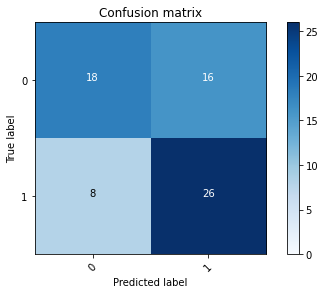

2022-08-03 20:37:27 - [Epoch Train: 45] loss: 0.0008, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:37:27 - [Epoch Valid: 45] loss: 1.4698, auc: 0.7154, acc: 0.6471, time: 7.00 s


 30%|████████████▌                             | 45/150 [22:57<50:42, 28.97s/it]

2022-08-03 20:37:27 - EPOCH: 46
2022-08-03 20:37:31 - Train Step 10/60, train_loss: 0.0007
2022-08-03 20:37:35 - Train Step 20/60, train_loss: 0.0007
2022-08-03 20:37:38 - Train Step 30/60, train_loss: 0.0007
2022-08-03 20:37:42 - Train Step 40/60, train_loss: 0.0007
2022-08-03 20:37:45 - Train Step 50/60, train_loss: 0.0008
2022-08-03 20:37:49 - Train Step 60/60, train_loss: 0.0007
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:37:51 - Valid Step 5/17, valid_loss: 1.7555
2022-08-03 20:37:53 - Valid Step 10/17, valid_loss: 1.2772
2022-08-03 20:37:55 - Valid Step 15/17, valid_loss: 1.5637
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
10  UPENN-GBM-00092_11_T1w                0           1
27  UPENN-GBM-00093_11_T1w                0           0
29  UPENN-GBM-00094_11_T1w                0           1
46  UPENN-GBM-00115_11_T1w                1           1
44  UPENN-GBM-00117_11_T1w                0           1
59  UPENN-GBM-00128_11_T1w        

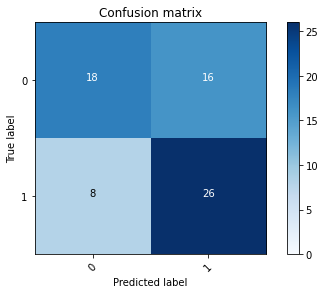

2022-08-03 20:37:56 - [Epoch Train: 46] loss: 0.0007, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:37:56 - [Epoch Valid: 46] loss: 1.4958, auc: 0.7085, acc: 0.6471, time: 6.00 s


 31%|████████████▉                             | 46/150 [23:26<49:48, 28.74s/it]

2022-08-03 20:37:56 - EPOCH: 47
2022-08-03 20:38:00 - Train Step 10/60, train_loss: 0.0012
2022-08-03 20:38:03 - Train Step 20/60, train_loss: 0.0010
2022-08-03 20:38:07 - Train Step 30/60, train_loss: 0.0008
2022-08-03 20:38:10 - Train Step 40/60, train_loss: 0.0007
2022-08-03 20:38:14 - Train Step 50/60, train_loss: 0.0007
2022-08-03 20:38:18 - Train Step 60/60, train_loss: 0.0007
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:38:20 - Valid Step 5/17, valid_loss: 1.1501
2022-08-03 20:38:22 - Valid Step 10/17, valid_loss: 1.0816
2022-08-03 20:38:24 - Valid Step 15/17, valid_loss: 1.4645
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
4   UPENN-GBM-00092_11_T1w                0           1
25  UPENN-GBM-00093_11_T1w                0           0
11  UPENN-GBM-00094_11_T1w                0           1
53  UPENN-GBM-00115_11_T1w                1           1
65  UPENN-GBM-00117_11_T1w                0           1
21  UPENN-GBM-00128_11_T1w        

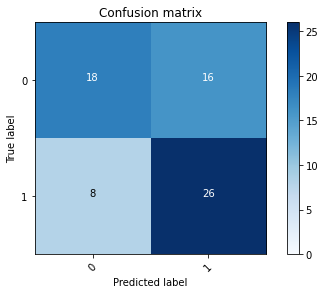

2022-08-03 20:38:25 - [Epoch Train: 47] loss: 0.0007, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:38:25 - [Epoch Valid: 47] loss: 1.5317, auc: 0.7050, acc: 0.6471, time: 7.00 s


 31%|█████████████▏                            | 47/150 [23:55<49:30, 28.84s/it]

2022-08-03 20:38:25 - EPOCH: 48
2022-08-03 20:38:29 - Train Step 10/60, train_loss: 0.0007
2022-08-03 20:38:32 - Train Step 20/60, train_loss: 0.0008
2022-08-03 20:38:36 - Train Step 30/60, train_loss: 0.0008
2022-08-03 20:38:40 - Train Step 40/60, train_loss: 0.0007
2022-08-03 20:38:43 - Train Step 50/60, train_loss: 0.0007
2022-08-03 20:38:47 - Train Step 60/60, train_loss: 0.0007
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:38:49 - Valid Step 5/17, valid_loss: 2.1633
2022-08-03 20:38:51 - Valid Step 10/17, valid_loss: 1.6252
2022-08-03 20:38:53 - Valid Step 15/17, valid_loss: 1.4572
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
10  UPENN-GBM-00092_11_T1w                0           1
13  UPENN-GBM-00093_11_T1w                0           0
56  UPENN-GBM-00094_11_T1w                0           1
66  UPENN-GBM-00115_11_T1w                1           1
22  UPENN-GBM-00117_11_T1w                0           1
60  UPENN-GBM-00128_11_T1w        

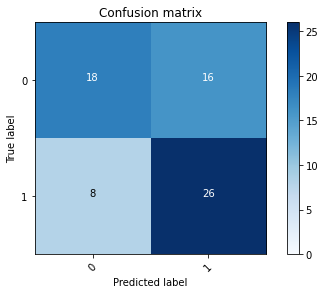

2022-08-03 20:38:54 - [Epoch Train: 48] loss: 0.0007, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:38:54 - [Epoch Valid: 48] loss: 1.4926, auc: 0.7093, acc: 0.6471, time: 6.00 s


 32%|█████████████▍                            | 48/150 [24:24<49:16, 28.99s/it]

2022-08-03 20:38:54 - EPOCH: 49
2022-08-03 20:38:58 - Train Step 10/60, train_loss: 0.0008
2022-08-03 20:39:02 - Train Step 20/60, train_loss: 0.0007
2022-08-03 20:39:05 - Train Step 30/60, train_loss: 0.0007
2022-08-03 20:39:09 - Train Step 40/60, train_loss: 0.0007
2022-08-03 20:39:13 - Train Step 50/60, train_loss: 0.0006
2022-08-03 20:39:16 - Train Step 60/60, train_loss: 0.0007
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:39:19 - Valid Step 5/17, valid_loss: 1.1980
2022-08-03 20:39:20 - Valid Step 10/17, valid_loss: 1.7963
2022-08-03 20:39:23 - Valid Step 15/17, valid_loss: 1.5651
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
46  UPENN-GBM-00092_11_T1w                0           1
26  UPENN-GBM-00093_11_T1w                0           0
35  UPENN-GBM-00094_11_T1w                0           1
12  UPENN-GBM-00115_11_T1w                1           1
30  UPENN-GBM-00117_11_T1w                0           1
41  UPENN-GBM-00128_11_T1w        

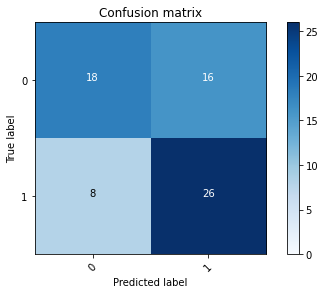

2022-08-03 20:39:23 - [Epoch Train: 49] loss: 0.0007, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:39:23 - [Epoch Valid: 49] loss: 1.5507, auc: 0.7119, acc: 0.6471, time: 7.00 s


 33%|█████████████▋                            | 49/150 [24:53<48:58, 29.09s/it]

2022-08-03 20:39:23 - EPOCH: 50
2022-08-03 20:39:27 - Train Step 10/60, train_loss: 0.0006
2022-08-03 20:39:31 - Train Step 20/60, train_loss: 0.0005
2022-08-03 20:39:34 - Train Step 30/60, train_loss: 0.0005
2022-08-03 20:39:38 - Train Step 40/60, train_loss: 0.0005
2022-08-03 20:39:42 - Train Step 50/60, train_loss: 0.0005
2022-08-03 20:39:45 - Train Step 60/60, train_loss: 0.0006
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:39:48 - Valid Step 5/17, valid_loss: 0.9076
2022-08-03 20:39:49 - Valid Step 10/17, valid_loss: 1.7666
2022-08-03 20:39:51 - Valid Step 15/17, valid_loss: 1.5475
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
19  UPENN-GBM-00092_11_T1w                0           1
5   UPENN-GBM-00093_11_T1w                0           0
41  UPENN-GBM-00094_11_T1w                0           1
44  UPENN-GBM-00115_11_T1w                1           1
22  UPENN-GBM-00117_11_T1w                0           1
61  UPENN-GBM-00128_11_T1w        

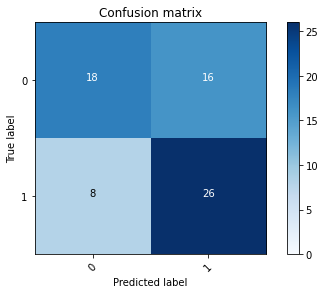

2022-08-03 20:39:52 - [Epoch Train: 50] loss: 0.0006, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:39:52 - [Epoch Valid: 50] loss: 1.5088, auc: 0.7111, acc: 0.6471, time: 6.00 s


 33%|██████████████                            | 50/150 [25:22<48:18, 28.99s/it]

2022-08-03 20:39:52 - EPOCH: 51
2022-08-03 20:39:56 - Train Step 10/60, train_loss: 0.0003
2022-08-03 20:40:00 - Train Step 20/60, train_loss: 0.0005
2022-08-03 20:40:03 - Train Step 30/60, train_loss: 0.0006
2022-08-03 20:40:07 - Train Step 40/60, train_loss: 0.0006
2022-08-03 20:40:11 - Train Step 50/60, train_loss: 0.0006
2022-08-03 20:40:14 - Train Step 60/60, train_loss: 0.0006
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:40:16 - Valid Step 5/17, valid_loss: 1.3643
2022-08-03 20:40:18 - Valid Step 10/17, valid_loss: 1.3514
2022-08-03 20:40:20 - Valid Step 15/17, valid_loss: 1.4564
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
64  UPENN-GBM-00092_11_T1w                0           1
22  UPENN-GBM-00093_11_T1w                0           0
47  UPENN-GBM-00094_11_T1w                0           1
3   UPENN-GBM-00115_11_T1w                1           1
20  UPENN-GBM-00117_11_T1w                0           1
2   UPENN-GBM-00128_11_T1w        

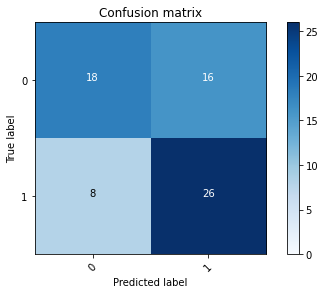

2022-08-03 20:40:21 - [Epoch Train: 51] loss: 0.0006, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:40:21 - [Epoch Valid: 51] loss: 1.4591, auc: 0.7102, acc: 0.6471, time: 7.00 s


 34%|██████████████▎                           | 51/150 [25:51<47:47, 28.97s/it]

2022-08-03 20:40:21 - EPOCH: 52
2022-08-03 20:40:25 - Train Step 10/60, train_loss: 0.0005
2022-08-03 20:40:29 - Train Step 20/60, train_loss: 0.0006
2022-08-03 20:40:32 - Train Step 30/60, train_loss: 0.0005
2022-08-03 20:40:36 - Train Step 40/60, train_loss: 0.0005
2022-08-03 20:40:40 - Train Step 50/60, train_loss: 0.0005
2022-08-03 20:40:44 - Train Step 60/60, train_loss: 0.0005
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:40:46 - Valid Step 5/17, valid_loss: 2.4574
2022-08-03 20:40:47 - Valid Step 10/17, valid_loss: 1.8069
2022-08-03 20:40:50 - Valid Step 15/17, valid_loss: 1.6458
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
44  UPENN-GBM-00092_11_T1w                0           1
50  UPENN-GBM-00093_11_T1w                0           0
38  UPENN-GBM-00094_11_T1w                0           1
35  UPENN-GBM-00115_11_T1w                1           1
6   UPENN-GBM-00117_11_T1w                0           1
19  UPENN-GBM-00128_11_T1w        

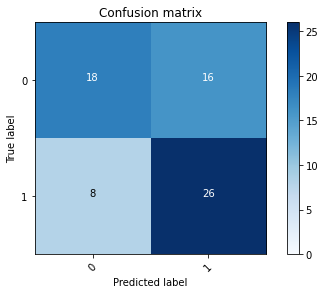

2022-08-03 20:40:50 - [Epoch Train: 52] loss: 0.0005, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:40:50 - [Epoch Valid: 52] loss: 1.5262, auc: 0.7137, acc: 0.6471, time: 6.00 s


 35%|██████████████▌                           | 52/150 [26:20<47:30, 29.08s/it]

2022-08-03 20:40:50 - EPOCH: 53
2022-08-03 20:40:54 - Train Step 10/60, train_loss: 0.0006
2022-08-03 20:40:58 - Train Step 20/60, train_loss: 0.0005
2022-08-03 20:41:02 - Train Step 30/60, train_loss: 0.0005
2022-08-03 20:41:05 - Train Step 40/60, train_loss: 0.0005
2022-08-03 20:41:09 - Train Step 50/60, train_loss: 0.0005
2022-08-03 20:41:12 - Train Step 60/60, train_loss: 0.0005
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:41:15 - Valid Step 5/17, valid_loss: 1.6464
2022-08-03 20:41:16 - Valid Step 10/17, valid_loss: 1.3447
2022-08-03 20:41:19 - Valid Step 15/17, valid_loss: 1.6412
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
38  UPENN-GBM-00092_11_T1w                0           1
36  UPENN-GBM-00093_11_T1w                0           0
51  UPENN-GBM-00094_11_T1w                0           1
35  UPENN-GBM-00115_11_T1w                1           1
43  UPENN-GBM-00117_11_T1w                0           1
64  UPENN-GBM-00128_11_T1w        

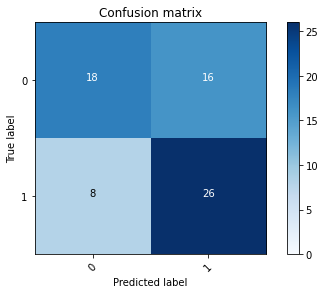

2022-08-03 20:41:19 - [Epoch Train: 53] loss: 0.0005, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:41:19 - [Epoch Valid: 53] loss: 1.5298, auc: 0.7111, acc: 0.6471, time: 7.00 s


 35%|██████████████▊                           | 53/150 [26:49<46:56, 29.03s/it]

2022-08-03 20:41:19 - EPOCH: 54
2022-08-03 20:41:23 - Train Step 10/60, train_loss: 0.0004
2022-08-03 20:41:27 - Train Step 20/60, train_loss: 0.0004
2022-08-03 20:41:31 - Train Step 30/60, train_loss: 0.0004
2022-08-03 20:41:34 - Train Step 40/60, train_loss: 0.0004
2022-08-03 20:41:38 - Train Step 50/60, train_loss: 0.0004
2022-08-03 20:41:41 - Train Step 60/60, train_loss: 0.0004
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:41:44 - Valid Step 5/17, valid_loss: 2.5930
2022-08-03 20:41:45 - Valid Step 10/17, valid_loss: 1.8335
2022-08-03 20:41:47 - Valid Step 15/17, valid_loss: 1.5815
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
59  UPENN-GBM-00092_11_T1w                0           1
19  UPENN-GBM-00093_11_T1w                0           0
0   UPENN-GBM-00094_11_T1w                0           1
43  UPENN-GBM-00115_11_T1w                1           1
66  UPENN-GBM-00117_11_T1w                0           1
54  UPENN-GBM-00128_11_T1w        

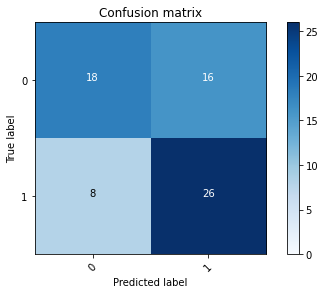

2022-08-03 20:41:48 - [Epoch Train: 54] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:41:48 - [Epoch Valid: 54] loss: 1.5626, auc: 0.7102, acc: 0.6471, time: 6.00 s


 36%|███████████████                           | 54/150 [27:18<46:26, 29.02s/it]

2022-08-03 20:41:48 - EPOCH: 55
2022-08-03 20:41:52 - Train Step 10/60, train_loss: 0.0004
2022-08-03 20:41:56 - Train Step 20/60, train_loss: 0.0005
2022-08-03 20:41:59 - Train Step 30/60, train_loss: 0.0004
2022-08-03 20:42:03 - Train Step 40/60, train_loss: 0.0004
2022-08-03 20:42:07 - Train Step 50/60, train_loss: 0.0004
2022-08-03 20:42:10 - Train Step 60/60, train_loss: 0.0004
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:42:12 - Valid Step 5/17, valid_loss: 2.1099
2022-08-03 20:42:14 - Valid Step 10/17, valid_loss: 1.7548
2022-08-03 20:42:16 - Valid Step 15/17, valid_loss: 1.6459
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
21  UPENN-GBM-00092_11_T1w                0           1
9   UPENN-GBM-00093_11_T1w                0           0
18  UPENN-GBM-00094_11_T1w                0           1
19  UPENN-GBM-00115_11_T1w                1           1
52  UPENN-GBM-00117_11_T1w                0           1
50  UPENN-GBM-00128_11_T1w        

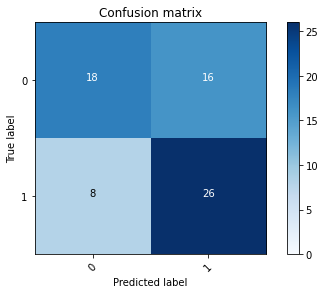

2022-08-03 20:42:17 - [Epoch Train: 55] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:42:17 - [Epoch Valid: 55] loss: 1.6011, auc: 0.7137, acc: 0.6471, time: 7.00 s


 37%|███████████████▍                          | 55/150 [27:47<45:50, 28.95s/it]

2022-08-03 20:42:17 - EPOCH: 56
2022-08-03 20:42:21 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:42:25 - Train Step 20/60, train_loss: 0.0003
2022-08-03 20:42:28 - Train Step 30/60, train_loss: 0.0003
2022-08-03 20:42:32 - Train Step 40/60, train_loss: 0.0003
2022-08-03 20:42:36 - Train Step 50/60, train_loss: 0.0003
2022-08-03 20:42:39 - Train Step 60/60, train_loss: 0.0003
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:42:42 - Valid Step 5/17, valid_loss: 1.5627
2022-08-03 20:42:43 - Valid Step 10/17, valid_loss: 1.6411
2022-08-03 20:42:45 - Valid Step 15/17, valid_loss: 1.4423
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
43  UPENN-GBM-00092_11_T1w                0           1
32  UPENN-GBM-00093_11_T1w                0           0
55  UPENN-GBM-00094_11_T1w                0           1
7   UPENN-GBM-00115_11_T1w                1           1
47  UPENN-GBM-00117_11_T1w                0           1
4   UPENN-GBM-00128_11_T1w        

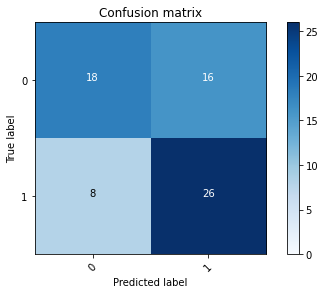

2022-08-03 20:42:46 - [Epoch Train: 56] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:42:46 - [Epoch Valid: 56] loss: 1.5056, auc: 0.7145, acc: 0.6471, time: 6.00 s


 37%|███████████████▋                          | 56/150 [28:16<45:26, 29.01s/it]

2022-08-03 20:42:46 - EPOCH: 57
2022-08-03 20:42:50 - Train Step 10/60, train_loss: 0.0006
2022-08-03 20:42:54 - Train Step 20/60, train_loss: 0.0005
2022-08-03 20:42:58 - Train Step 30/60, train_loss: 0.0004
2022-08-03 20:43:01 - Train Step 40/60, train_loss: 0.0004
2022-08-03 20:43:05 - Train Step 50/60, train_loss: 0.0004
2022-08-03 20:43:08 - Train Step 60/60, train_loss: 0.0004
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:43:11 - Valid Step 5/17, valid_loss: 2.8677
2022-08-03 20:43:12 - Valid Step 10/17, valid_loss: 2.2053
2022-08-03 20:43:14 - Valid Step 15/17, valid_loss: 1.5935
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
37  UPENN-GBM-00092_11_T1w                0           1
44  UPENN-GBM-00093_11_T1w                0           0
27  UPENN-GBM-00094_11_T1w                0           1
38  UPENN-GBM-00115_11_T1w                1           1
15  UPENN-GBM-00117_11_T1w                0           1
42  UPENN-GBM-00128_11_T1w        

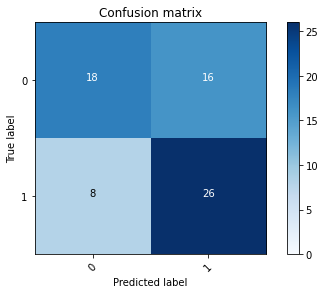

2022-08-03 20:43:15 - [Epoch Train: 57] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:43:15 - [Epoch Valid: 57] loss: 1.5796, auc: 0.7119, acc: 0.6471, time: 6.00 s


 38%|███████████████▉                          | 57/150 [28:45<44:58, 29.01s/it]

2022-08-03 20:43:15 - EPOCH: 58
2022-08-03 20:43:19 - Train Step 10/60, train_loss: 0.0004
2022-08-03 20:43:23 - Train Step 20/60, train_loss: 0.0004
2022-08-03 20:43:26 - Train Step 30/60, train_loss: 0.0004
2022-08-03 20:43:30 - Train Step 40/60, train_loss: 0.0004
2022-08-03 20:43:34 - Train Step 50/60, train_loss: 0.0004
2022-08-03 20:43:37 - Train Step 60/60, train_loss: 0.0004
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:43:39 - Valid Step 5/17, valid_loss: 1.7518
2022-08-03 20:43:41 - Valid Step 10/17, valid_loss: 1.4943
2022-08-03 20:43:43 - Valid Step 15/17, valid_loss: 1.7562
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
52  UPENN-GBM-00092_11_T1w                0           1
61  UPENN-GBM-00093_11_T1w                0           0
56  UPENN-GBM-00094_11_T1w                0           1
34  UPENN-GBM-00115_11_T1w                1           1
37  UPENN-GBM-00117_11_T1w                0           1
57  UPENN-GBM-00128_11_T1w        

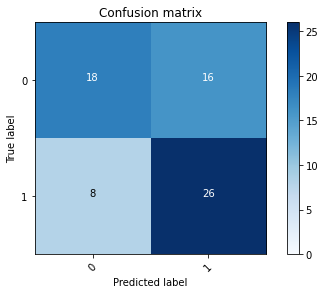

2022-08-03 20:43:44 - [Epoch Train: 58] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:43:44 - [Epoch Valid: 58] loss: 1.6326, auc: 0.7154, acc: 0.6471, time: 7.00 s


 39%|████████████████▏                         | 58/150 [29:14<44:17, 28.89s/it]

2022-08-03 20:43:44 - EPOCH: 59
2022-08-03 20:43:48 - Train Step 10/60, train_loss: 0.0003
2022-08-03 20:43:51 - Train Step 20/60, train_loss: 0.0004
2022-08-03 20:43:55 - Train Step 30/60, train_loss: 0.0004
2022-08-03 20:43:59 - Train Step 40/60, train_loss: 0.0004
2022-08-03 20:44:02 - Train Step 50/60, train_loss: 0.0004
2022-08-03 20:44:06 - Train Step 60/60, train_loss: 0.0004
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:44:08 - Valid Step 5/17, valid_loss: 0.9556
2022-08-03 20:44:10 - Valid Step 10/17, valid_loss: 1.0967
2022-08-03 20:44:12 - Valid Step 15/17, valid_loss: 1.5809
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
67  UPENN-GBM-00092_11_T1w                0           1
34  UPENN-GBM-00093_11_T1w                0           0
55  UPENN-GBM-00094_11_T1w                0           1
64  UPENN-GBM-00115_11_T1w                1           1
32  UPENN-GBM-00117_11_T1w                0           1
37  UPENN-GBM-00128_11_T1w        

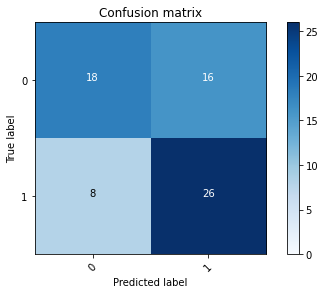

2022-08-03 20:44:13 - [Epoch Train: 59] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:44:13 - [Epoch Valid: 59] loss: 1.5324, auc: 0.7102, acc: 0.6471, time: 7.00 s


 39%|████████████████▌                         | 59/150 [29:43<43:46, 28.86s/it]

2022-08-03 20:44:13 - EPOCH: 60
2022-08-03 20:44:17 - Train Step 10/60, train_loss: 0.0003
2022-08-03 20:44:20 - Train Step 20/60, train_loss: 0.0003
2022-08-03 20:44:24 - Train Step 30/60, train_loss: 0.0003
2022-08-03 20:44:27 - Train Step 40/60, train_loss: 0.0003
2022-08-03 20:44:31 - Train Step 50/60, train_loss: 0.0008
2022-08-03 20:44:35 - Train Step 60/60, train_loss: 0.0007
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:44:37 - Valid Step 5/17, valid_loss: 1.7254
2022-08-03 20:44:39 - Valid Step 10/17, valid_loss: 1.8260
2022-08-03 20:44:41 - Valid Step 15/17, valid_loss: 1.8469
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
2   UPENN-GBM-00092_11_T1w                0           1
16  UPENN-GBM-00093_11_T1w                0           0
3   UPENN-GBM-00094_11_T1w                0           1
5   UPENN-GBM-00115_11_T1w                1           1
35  UPENN-GBM-00117_11_T1w                0           1
62  UPENN-GBM-00128_11_T1w        

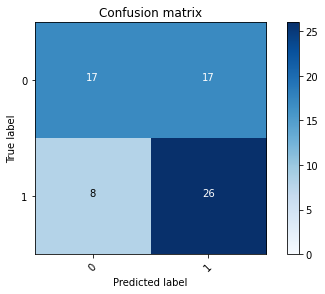

2022-08-03 20:44:42 - [Epoch Train: 60] loss: 0.0007, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:44:42 - [Epoch Valid: 60] loss: 1.6956, auc: 0.7093, acc: 0.6324, time: 6.00 s


 40%|████████████████▊                         | 60/150 [30:12<43:18, 28.88s/it]

2022-08-03 20:44:42 - EPOCH: 61
2022-08-03 20:44:46 - Train Step 10/60, train_loss: 0.0003
2022-08-03 20:44:49 - Train Step 20/60, train_loss: 0.0003
2022-08-03 20:44:53 - Train Step 30/60, train_loss: 0.0003
2022-08-03 20:44:56 - Train Step 40/60, train_loss: 0.0003
2022-08-03 20:45:00 - Train Step 50/60, train_loss: 0.0003
2022-08-03 20:45:04 - Train Step 60/60, train_loss: 0.0003
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:45:06 - Valid Step 5/17, valid_loss: 1.8479
2022-08-03 20:45:08 - Valid Step 10/17, valid_loss: 1.5323
2022-08-03 20:45:10 - Valid Step 15/17, valid_loss: 1.4966
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
46  UPENN-GBM-00092_11_T1w                0           1
13  UPENN-GBM-00093_11_T1w                0           0
62  UPENN-GBM-00094_11_T1w                0           1
57  UPENN-GBM-00115_11_T1w                1           1
66  UPENN-GBM-00117_11_T1w                0           1
24  UPENN-GBM-00128_11_T1w        

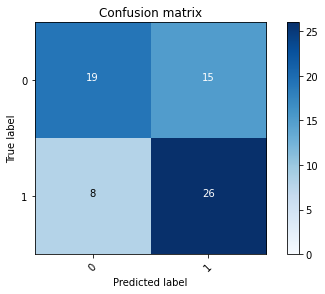

2022-08-03 20:45:11 - [Epoch Train: 61] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:45:11 - [Epoch Valid: 61] loss: 1.6553, auc: 0.7093, acc: 0.6618, time: 6.00 s
2022-08-03 20:45:11 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e61-loss1.655-acc0.662-auc0.709.pth'


 41%|█████████████████                         | 61/150 [30:41<42:57, 28.96s/it]

2022-08-03 20:45:11 - EPOCH: 62
2022-08-03 20:45:15 - Train Step 10/60, train_loss: 0.0003
2022-08-03 20:45:18 - Train Step 20/60, train_loss: 0.0003
2022-08-03 20:45:22 - Train Step 30/60, train_loss: 0.0003
2022-08-03 20:45:26 - Train Step 40/60, train_loss: 0.0003
2022-08-03 20:45:29 - Train Step 50/60, train_loss: 0.0003
2022-08-03 20:45:33 - Train Step 60/60, train_loss: 0.0003
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:45:35 - Valid Step 5/17, valid_loss: 1.6427
2022-08-03 20:45:37 - Valid Step 10/17, valid_loss: 1.7390
2022-08-03 20:45:39 - Valid Step 15/17, valid_loss: 1.7129
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
34  UPENN-GBM-00092_11_T1w                0           1
63  UPENN-GBM-00093_11_T1w                0           0
54  UPENN-GBM-00094_11_T1w                0           1
2   UPENN-GBM-00115_11_T1w                1           1
1   UPENN-GBM-00117_11_T1w                0           1
31  UPENN-GBM-00128_11_T1w        

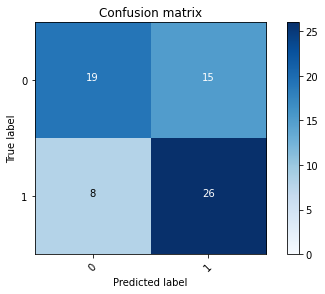

2022-08-03 20:45:40 - [Epoch Train: 62] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:45:40 - [Epoch Valid: 62] loss: 1.6145, auc: 0.7111, acc: 0.6618, time: 6.00 s
2022-08-03 20:45:40 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e62-loss1.614-acc0.662-auc0.711.pth'


 41%|█████████████████▎                        | 62/150 [31:10<42:27, 28.95s/it]

2022-08-03 20:45:40 - EPOCH: 63
2022-08-03 20:45:44 - Train Step 10/60, train_loss: 0.0003
2022-08-03 20:45:47 - Train Step 20/60, train_loss: 0.0003
2022-08-03 20:45:51 - Train Step 30/60, train_loss: 0.0003
2022-08-03 20:45:55 - Train Step 40/60, train_loss: 0.0003
2022-08-03 20:45:58 - Train Step 50/60, train_loss: 0.0003
2022-08-03 20:46:02 - Train Step 60/60, train_loss: 0.0003
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:46:04 - Valid Step 5/17, valid_loss: 1.4534
2022-08-03 20:46:06 - Valid Step 10/17, valid_loss: 1.7902
2022-08-03 20:46:08 - Valid Step 15/17, valid_loss: 1.6078
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
23  UPENN-GBM-00092_11_T1w                0           1
5   UPENN-GBM-00093_11_T1w                0           0
6   UPENN-GBM-00094_11_T1w                0           1
25  UPENN-GBM-00115_11_T1w                1           1
46  UPENN-GBM-00117_11_T1w                0           1
11  UPENN-GBM-00128_11_T1w        

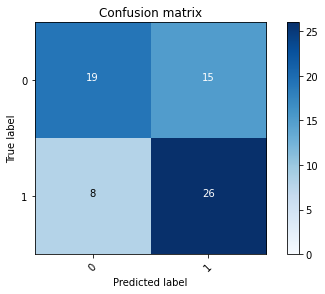

2022-08-03 20:46:09 - [Epoch Train: 63] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:46:09 - [Epoch Valid: 63] loss: 1.6578, auc: 0.7102, acc: 0.6618, time: 7.00 s
2022-08-03 20:46:09 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e63-loss1.658-acc0.662-auc0.710.pth'


 42%|█████████████████▋                        | 63/150 [31:39<42:05, 29.02s/it]

2022-08-03 20:46:09 - EPOCH: 64
2022-08-03 20:46:13 - Train Step 10/60, train_loss: 0.0004
2022-08-03 20:46:16 - Train Step 20/60, train_loss: 0.0004
2022-08-03 20:46:20 - Train Step 30/60, train_loss: 0.0003
2022-08-03 20:46:24 - Train Step 40/60, train_loss: 0.0003
2022-08-03 20:46:27 - Train Step 50/60, train_loss: 0.0003
2022-08-03 20:46:31 - Train Step 60/60, train_loss: 0.0003
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:46:33 - Valid Step 5/17, valid_loss: 1.0014
2022-08-03 20:46:35 - Valid Step 10/17, valid_loss: 1.6233
2022-08-03 20:46:37 - Valid Step 15/17, valid_loss: 1.5997
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
44  UPENN-GBM-00092_11_T1w                0           1
32  UPENN-GBM-00093_11_T1w                0           0
47  UPENN-GBM-00094_11_T1w                0           1
52  UPENN-GBM-00115_11_T1w                1           1
17  UPENN-GBM-00117_11_T1w                0           1
41  UPENN-GBM-00128_11_T1w        

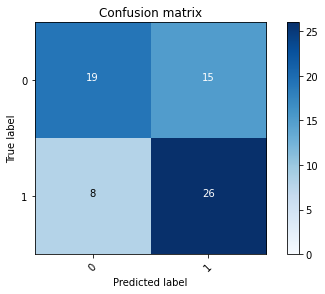

2022-08-03 20:46:38 - [Epoch Train: 64] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:46:38 - [Epoch Valid: 64] loss: 1.6898, auc: 0.7076, acc: 0.6618, time: 7.00 s
2022-08-03 20:46:38 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e64-loss1.690-acc0.662-auc0.708.pth'


 43%|█████████████████▉                        | 64/150 [32:08<41:34, 29.01s/it]

2022-08-03 20:46:38 - EPOCH: 65
2022-08-03 20:46:42 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:46:46 - Train Step 20/60, train_loss: 0.0003
2022-08-03 20:46:49 - Train Step 30/60, train_loss: 0.0003
2022-08-03 20:46:53 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:46:57 - Train Step 50/60, train_loss: 0.0003
2022-08-03 20:47:00 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:47:02 - Valid Step 5/17, valid_loss: 1.4218
2022-08-03 20:47:04 - Valid Step 10/17, valid_loss: 1.8263
2022-08-03 20:47:06 - Valid Step 15/17, valid_loss: 1.6149
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
61  UPENN-GBM-00092_11_T1w                0           1
42  UPENN-GBM-00093_11_T1w                0           0
28  UPENN-GBM-00094_11_T1w                0           1
58  UPENN-GBM-00115_11_T1w                1           1
66  UPENN-GBM-00117_11_T1w                0           1
17  UPENN-GBM-00128_11_T1w        

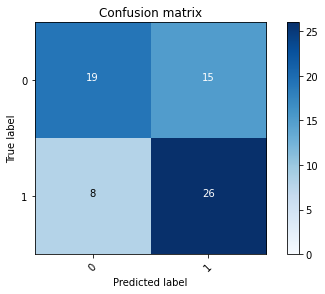

2022-08-03 20:47:07 - [Epoch Train: 65] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:47:07 - [Epoch Valid: 65] loss: 1.6519, auc: 0.7137, acc: 0.6618, time: 6.00 s
2022-08-03 20:47:07 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e65-loss1.652-acc0.662-auc0.714.pth'


 43%|██████████████████▏                       | 65/150 [32:37<41:13, 29.09s/it]

2022-08-03 20:47:07 - EPOCH: 66
2022-08-03 20:47:11 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:47:15 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:47:18 - Train Step 30/60, train_loss: 0.0003
2022-08-03 20:47:22 - Train Step 40/60, train_loss: 0.0003
2022-08-03 20:47:26 - Train Step 50/60, train_loss: 0.0003
2022-08-03 20:47:29 - Train Step 60/60, train_loss: 0.0003
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:47:32 - Valid Step 5/17, valid_loss: 2.1877
2022-08-03 20:47:33 - Valid Step 10/17, valid_loss: 2.3533
2022-08-03 20:47:35 - Valid Step 15/17, valid_loss: 1.7859
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
19  UPENN-GBM-00092_11_T1w                0           1
53  UPENN-GBM-00093_11_T1w                0           0
22  UPENN-GBM-00094_11_T1w                0           1
47  UPENN-GBM-00115_11_T1w                1           1
0   UPENN-GBM-00117_11_T1w                0           1
35  UPENN-GBM-00128_11_T1w        

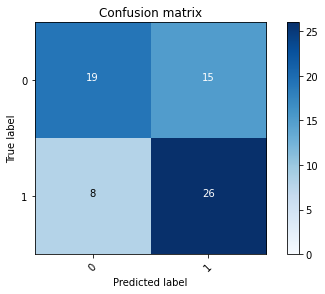

2022-08-03 20:47:36 - [Epoch Train: 66] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:47:36 - [Epoch Valid: 66] loss: 1.6712, auc: 0.7059, acc: 0.6618, time: 6.00 s
2022-08-03 20:47:36 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e66-loss1.671-acc0.662-auc0.706.pth'


 44%|██████████████████▍                       | 66/150 [33:06<40:37, 29.02s/it]

2022-08-03 20:47:36 - EPOCH: 67
2022-08-03 20:47:40 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:47:44 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:47:47 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:47:51 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:47:55 - Train Step 50/60, train_loss: 0.0002
2022-08-03 20:47:58 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:48:01 - Valid Step 5/17, valid_loss: 1.6882
2022-08-03 20:48:02 - Valid Step 10/17, valid_loss: 1.5326
2022-08-03 20:48:04 - Valid Step 15/17, valid_loss: 1.4420
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
24  UPENN-GBM-00092_11_T1w                0           1
48  UPENN-GBM-00093_11_T1w                0           0
64  UPENN-GBM-00094_11_T1w                0           1
1   UPENN-GBM-00115_11_T1w                1           1
4   UPENN-GBM-00117_11_T1w                0           1
29  UPENN-GBM-00128_11_T1w        

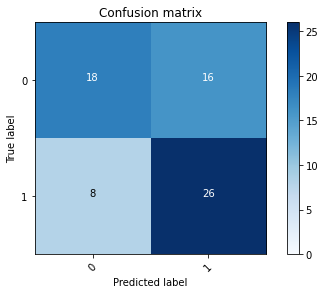

2022-08-03 20:48:05 - [Epoch Train: 67] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:48:05 - [Epoch Valid: 67] loss: 1.6765, auc: 0.7111, acc: 0.6471, time: 6.00 s


 45%|██████████████████▊                       | 67/150 [33:35<40:14, 29.09s/it]

2022-08-03 20:48:05 - EPOCH: 68
2022-08-03 20:48:09 - Train Step 10/60, train_loss: 0.0003
2022-08-03 20:48:13 - Train Step 20/60, train_loss: 0.0003
2022-08-03 20:48:17 - Train Step 30/60, train_loss: 0.0003
2022-08-03 20:48:20 - Train Step 40/60, train_loss: 0.0003
2022-08-03 20:48:24 - Train Step 50/60, train_loss: 0.0003
2022-08-03 20:48:27 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:48:30 - Valid Step 5/17, valid_loss: 0.9960
2022-08-03 20:48:32 - Valid Step 10/17, valid_loss: 0.8459
2022-08-03 20:48:34 - Valid Step 15/17, valid_loss: 1.5661
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
58  UPENN-GBM-00092_11_T1w                0           1
13  UPENN-GBM-00093_11_T1w                0           0
3   UPENN-GBM-00094_11_T1w                0           1
22  UPENN-GBM-00115_11_T1w                1           1
65  UPENN-GBM-00117_11_T1w                0           1
24  UPENN-GBM-00128_11_T1w        

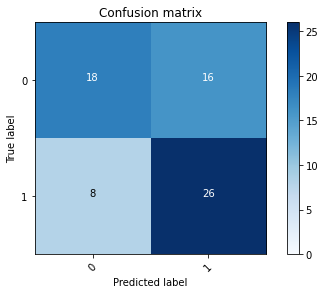

2022-08-03 20:48:35 - [Epoch Train: 68] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:48:35 - [Epoch Valid: 68] loss: 1.7096, auc: 0.7119, acc: 0.6471, time: 7.00 s


 45%|███████████████████                       | 68/150 [34:05<39:52, 29.17s/it]

2022-08-03 20:48:35 - EPOCH: 69
2022-08-03 20:48:39 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:48:42 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:48:46 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:48:50 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:48:53 - Train Step 50/60, train_loss: 0.0002
2022-08-03 20:48:57 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:48:59 - Valid Step 5/17, valid_loss: 2.4335
2022-08-03 20:49:01 - Valid Step 10/17, valid_loss: 2.0158
2022-08-03 20:49:03 - Valid Step 15/17, valid_loss: 1.6107
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
42  UPENN-GBM-00092_11_T1w                0           1
65  UPENN-GBM-00093_11_T1w                0           0
66  UPENN-GBM-00094_11_T1w                0           1
57  UPENN-GBM-00115_11_T1w                1           1
11  UPENN-GBM-00117_11_T1w                0           1
8   UPENN-GBM-00128_11_T1w        

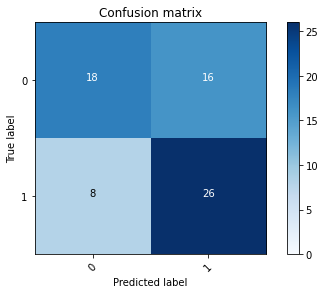

2022-08-03 20:49:04 - [Epoch Train: 69] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:49:04 - [Epoch Valid: 69] loss: 1.6384, auc: 0.7111, acc: 0.6471, time: 6.00 s


 46%|███████████████████▎                      | 69/150 [34:34<39:22, 29.17s/it]

2022-08-03 20:49:04 - EPOCH: 70
2022-08-03 20:49:08 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:49:11 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:49:15 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:49:19 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:49:22 - Train Step 50/60, train_loss: 0.0002
2022-08-03 20:49:26 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:49:28 - Valid Step 5/17, valid_loss: 1.3896
2022-08-03 20:49:30 - Valid Step 10/17, valid_loss: 1.3121
2022-08-03 20:49:32 - Valid Step 15/17, valid_loss: 1.5321
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
21  UPENN-GBM-00092_11_T1w                0           1
33  UPENN-GBM-00093_11_T1w                0           0
26  UPENN-GBM-00094_11_T1w                0           1
55  UPENN-GBM-00115_11_T1w                1           1
61  UPENN-GBM-00117_11_T1w                0           1
38  UPENN-GBM-00128_11_T1w        

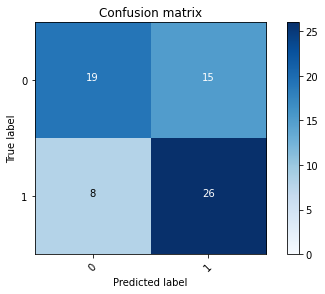

2022-08-03 20:49:33 - [Epoch Train: 70] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:49:33 - [Epoch Valid: 70] loss: 1.6503, auc: 0.7085, acc: 0.6618, time: 6.00 s
2022-08-03 20:49:33 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e70-loss1.650-acc0.662-auc0.708.pth'


 47%|███████████████████▌                      | 70/150 [35:03<38:54, 29.19s/it]

2022-08-03 20:49:33 - EPOCH: 71
2022-08-03 20:49:37 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:49:41 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:49:44 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:49:48 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:49:52 - Train Step 50/60, train_loss: 0.0002
2022-08-03 20:49:55 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:49:58 - Valid Step 5/17, valid_loss: 1.9516
2022-08-03 20:49:59 - Valid Step 10/17, valid_loss: 1.5678
2022-08-03 20:50:02 - Valid Step 15/17, valid_loss: 1.8195
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
22  UPENN-GBM-00092_11_T1w                0           1
33  UPENN-GBM-00093_11_T1w                0           0
50  UPENN-GBM-00094_11_T1w                0           1
24  UPENN-GBM-00115_11_T1w                1           1
11  UPENN-GBM-00117_11_T1w                0           1
53  UPENN-GBM-00128_11_T1w        

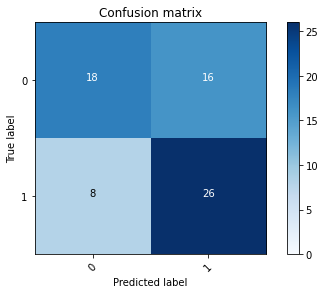

2022-08-03 20:50:02 - [Epoch Train: 71] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:50:02 - [Epoch Valid: 71] loss: 1.7627, auc: 0.7093, acc: 0.6471, time: 6.00 s


 47%|███████████████████▉                      | 71/150 [35:32<38:32, 29.27s/it]

2022-08-03 20:50:02 - EPOCH: 72
2022-08-03 20:50:06 - Train Step 10/60, train_loss: 0.0003
2022-08-03 20:50:10 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:50:14 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:50:17 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:50:21 - Train Step 50/60, train_loss: 0.0002
2022-08-03 20:50:25 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:50:27 - Valid Step 5/17, valid_loss: 1.4421
2022-08-03 20:50:29 - Valid Step 10/17, valid_loss: 2.2501
2022-08-03 20:50:31 - Valid Step 15/17, valid_loss: 1.8193
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
24  UPENN-GBM-00092_11_T1w                0           1
51  UPENN-GBM-00093_11_T1w                0           0
31  UPENN-GBM-00094_11_T1w                0           1
20  UPENN-GBM-00115_11_T1w                1           1
55  UPENN-GBM-00117_11_T1w                0           1
61  UPENN-GBM-00128_11_T1w        

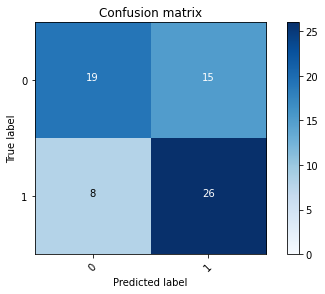

2022-08-03 20:50:32 - [Epoch Train: 72] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:50:32 - [Epoch Valid: 72] loss: 1.6318, auc: 0.7145, acc: 0.6618, time: 7.00 s
2022-08-03 20:50:32 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e72-loss1.632-acc0.662-auc0.715.pth'


 48%|████████████████████▏                     | 72/150 [36:02<38:06, 29.32s/it]

2022-08-03 20:50:32 - EPOCH: 73
2022-08-03 20:50:36 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:50:40 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:50:43 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:50:47 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:50:51 - Train Step 50/60, train_loss: 0.0002
2022-08-03 20:50:54 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:50:57 - Valid Step 5/17, valid_loss: 1.3251
2022-08-03 20:50:58 - Valid Step 10/17, valid_loss: 1.3723
2022-08-03 20:51:00 - Valid Step 15/17, valid_loss: 1.7541
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
9   UPENN-GBM-00092_11_T1w                0           1
65  UPENN-GBM-00093_11_T1w                0           0
40  UPENN-GBM-00094_11_T1w                0           1
37  UPENN-GBM-00115_11_T1w                1           1
27  UPENN-GBM-00117_11_T1w                0           1
45  UPENN-GBM-00128_11_T1w        

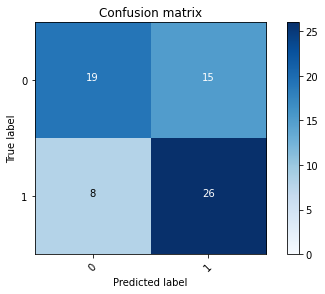

2022-08-03 20:51:01 - [Epoch Train: 73] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:51:01 - [Epoch Valid: 73] loss: 1.6734, auc: 0.7119, acc: 0.6618, time: 6.00 s
2022-08-03 20:51:01 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e73-loss1.673-acc0.662-auc0.712.pth'


 49%|████████████████████▍                     | 73/150 [36:31<37:38, 29.33s/it]

2022-08-03 20:51:01 - EPOCH: 74
2022-08-03 20:51:05 - Train Step 10/60, train_loss: 0.0003
2022-08-03 20:51:09 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:51:12 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:51:16 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:51:20 - Train Step 50/60, train_loss: 0.0002
2022-08-03 20:51:23 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:51:25 - Valid Step 5/17, valid_loss: 1.5590
2022-08-03 20:51:27 - Valid Step 10/17, valid_loss: 1.7912
2022-08-03 20:51:29 - Valid Step 15/17, valid_loss: 1.7931
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
10  UPENN-GBM-00092_11_T1w                0           1
8   UPENN-GBM-00093_11_T1w                0           0
21  UPENN-GBM-00094_11_T1w                0           1
13  UPENN-GBM-00115_11_T1w                1           1
56  UPENN-GBM-00117_11_T1w                0           1
7   UPENN-GBM-00128_11_T1w        

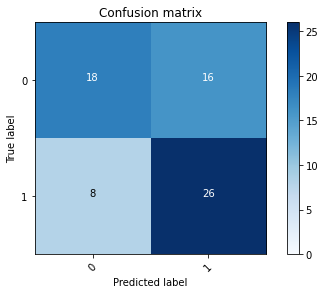

2022-08-03 20:51:30 - [Epoch Train: 74] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:51:30 - [Epoch Valid: 74] loss: 1.7139, auc: 0.7137, acc: 0.6471, time: 6.00 s


 49%|████████████████████▋                     | 74/150 [37:00<36:53, 29.13s/it]

2022-08-03 20:51:30 - EPOCH: 75
2022-08-03 20:51:34 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:51:38 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:51:41 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:51:45 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:51:48 - Train Step 50/60, train_loss: 0.0002
2022-08-03 20:51:52 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:51:54 - Valid Step 5/17, valid_loss: 1.4159
2022-08-03 20:51:56 - Valid Step 10/17, valid_loss: 1.3816
2022-08-03 20:51:58 - Valid Step 15/17, valid_loss: 1.7894
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
30  UPENN-GBM-00092_11_T1w                0           1
8   UPENN-GBM-00093_11_T1w                0           0
19  UPENN-GBM-00094_11_T1w                0           1
41  UPENN-GBM-00115_11_T1w                1           1
45  UPENN-GBM-00117_11_T1w                0           1
2   UPENN-GBM-00128_11_T1w        

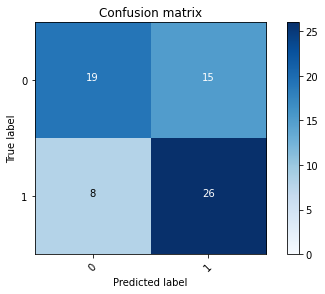

2022-08-03 20:51:59 - [Epoch Train: 75] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:51:59 - [Epoch Valid: 75] loss: 1.6448, auc: 0.7128, acc: 0.6618, time: 7.00 s
2022-08-03 20:51:59 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e75-loss1.645-acc0.662-auc0.713.pth'


 50%|█████████████████████                     | 75/150 [37:29<36:18, 29.04s/it]

2022-08-03 20:51:59 - EPOCH: 76
2022-08-03 20:52:03 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:52:06 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:52:10 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:52:13 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:52:17 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:52:20 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:52:23 - Valid Step 5/17, valid_loss: 2.0993
2022-08-03 20:52:24 - Valid Step 10/17, valid_loss: 2.0611
2022-08-03 20:52:27 - Valid Step 15/17, valid_loss: 1.8980
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
28  UPENN-GBM-00092_11_T1w                0           1
46  UPENN-GBM-00093_11_T1w                0           0
56  UPENN-GBM-00094_11_T1w                0           1
59  UPENN-GBM-00115_11_T1w                1           1
36  UPENN-GBM-00117_11_T1w                0           1
45  UPENN-GBM-00128_11_T1w        

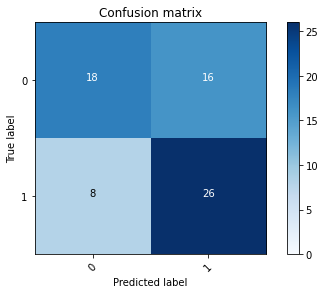

2022-08-03 20:52:27 - [Epoch Train: 76] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:52:27 - [Epoch Valid: 76] loss: 1.7088, auc: 0.7128, acc: 0.6471, time: 7.00 s


 51%|█████████████████████▎                    | 76/150 [37:57<35:40, 28.92s/it]

2022-08-03 20:52:27 - EPOCH: 77
2022-08-03 20:52:31 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:52:35 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:52:39 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:52:43 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:52:46 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:52:50 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:52:52 - Valid Step 5/17, valid_loss: 1.4141
2022-08-03 20:52:54 - Valid Step 10/17, valid_loss: 1.9464
2022-08-03 20:52:56 - Valid Step 15/17, valid_loss: 1.8217
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
1   UPENN-GBM-00092_11_T1w                0           1
14  UPENN-GBM-00093_11_T1w                0           0
39  UPENN-GBM-00094_11_T1w                0           1
53  UPENN-GBM-00115_11_T1w                1           1
46  UPENN-GBM-00117_11_T1w                0           1
52  UPENN-GBM-00128_11_T1w        

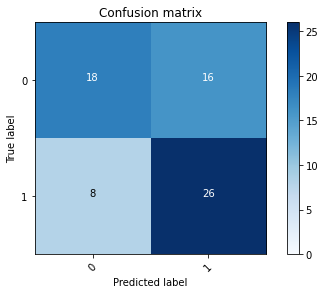

2022-08-03 20:52:57 - [Epoch Train: 77] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:52:57 - [Epoch Valid: 77] loss: 1.7115, auc: 0.7067, acc: 0.6471, time: 6.00 s


 51%|█████████████████████▌                    | 77/150 [38:27<35:21, 29.06s/it]

2022-08-03 20:52:57 - EPOCH: 78
2022-08-03 20:53:01 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:53:04 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:53:08 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:53:11 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:53:15 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:53:18 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:53:20 - Valid Step 5/17, valid_loss: 1.4317
2022-08-03 20:53:22 - Valid Step 10/17, valid_loss: 1.2615
2022-08-03 20:53:24 - Valid Step 15/17, valid_loss: 1.6994
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
63  UPENN-GBM-00092_11_T1w                0           1
20  UPENN-GBM-00093_11_T1w                0           0
64  UPENN-GBM-00094_11_T1w                0           1
40  UPENN-GBM-00115_11_T1w                1           1
17  UPENN-GBM-00117_11_T1w                0           1
62  UPENN-GBM-00128_11_T1w        

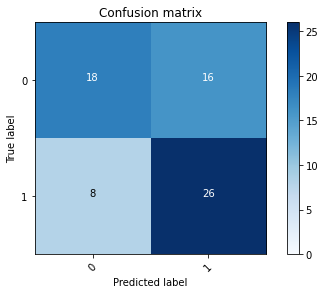

2022-08-03 20:53:25 - [Epoch Train: 78] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:53:25 - [Epoch Valid: 78] loss: 1.7708, auc: 0.7145, acc: 0.6471, time: 7.00 s


 52%|█████████████████████▊                    | 78/150 [38:55<34:36, 28.85s/it]

2022-08-03 20:53:25 - EPOCH: 79
2022-08-03 20:53:29 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:53:33 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:53:36 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:53:40 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:53:43 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:53:46 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:53:49 - Valid Step 5/17, valid_loss: 0.7823
2022-08-03 20:53:50 - Valid Step 10/17, valid_loss: 1.2264
2022-08-03 20:53:52 - Valid Step 15/17, valid_loss: 1.8502
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
55  UPENN-GBM-00092_11_T1w                0           1
16  UPENN-GBM-00093_11_T1w                0           0
30  UPENN-GBM-00094_11_T1w                0           1
40  UPENN-GBM-00115_11_T1w                1           1
45  UPENN-GBM-00117_11_T1w                0           1
43  UPENN-GBM-00128_11_T1w        

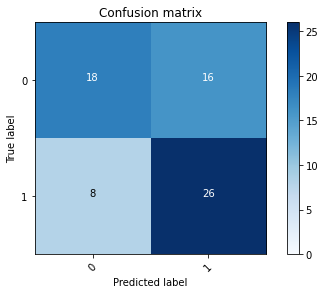

2022-08-03 20:53:53 - [Epoch Train: 79] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:53:53 - [Epoch Valid: 79] loss: 1.7652, auc: 0.7128, acc: 0.6471, time: 6.00 s


 53%|██████████████████████                    | 79/150 [39:23<33:51, 28.61s/it]

2022-08-03 20:53:53 - EPOCH: 80
2022-08-03 20:53:57 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:54:01 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:54:04 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:54:08 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:54:12 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:54:15 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:54:18 - Valid Step 5/17, valid_loss: 1.5512
2022-08-03 20:54:19 - Valid Step 10/17, valid_loss: 2.1898
2022-08-03 20:54:21 - Valid Step 15/17, valid_loss: 1.8111
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
40  UPENN-GBM-00092_11_T1w                0           1
4   UPENN-GBM-00093_11_T1w                0           0
56  UPENN-GBM-00094_11_T1w                0           1
32  UPENN-GBM-00115_11_T1w                1           1
30  UPENN-GBM-00117_11_T1w                0           1
10  UPENN-GBM-00128_11_T1w        

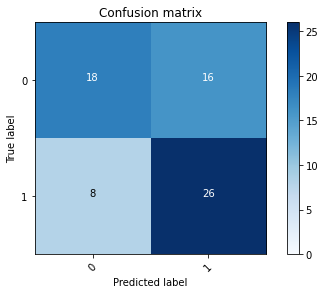

2022-08-03 20:54:22 - [Epoch Train: 80] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:54:22 - [Epoch Valid: 80] loss: 1.7805, auc: 0.7076, acc: 0.6471, time: 6.00 s


 53%|██████████████████████▍                   | 80/150 [39:52<33:30, 28.72s/it]

2022-08-03 20:54:22 - EPOCH: 81
2022-08-03 20:54:26 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:54:30 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:54:33 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:54:37 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:54:41 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:54:44 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:54:46 - Valid Step 5/17, valid_loss: 1.3386
2022-08-03 20:54:48 - Valid Step 10/17, valid_loss: 1.2134
2022-08-03 20:54:50 - Valid Step 15/17, valid_loss: 1.5738
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
18  UPENN-GBM-00092_11_T1w                0           1
30  UPENN-GBM-00093_11_T1w                0           0
53  UPENN-GBM-00094_11_T1w                0           1
60  UPENN-GBM-00115_11_T1w                1           1
29  UPENN-GBM-00117_11_T1w                0           1
44  UPENN-GBM-00128_11_T1w        

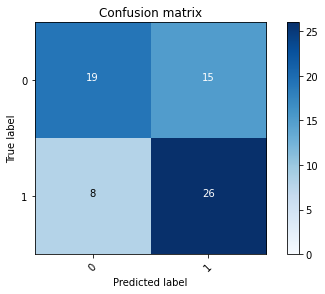

2022-08-03 20:54:51 - [Epoch Train: 81] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:54:51 - [Epoch Valid: 81] loss: 1.7083, auc: 0.7111, acc: 0.6618, time: 6.00 s
2022-08-03 20:54:51 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e81-loss1.708-acc0.662-auc0.711.pth'


 54%|██████████████████████▋                   | 81/150 [40:21<33:02, 28.72s/it]

2022-08-03 20:54:51 - EPOCH: 82
2022-08-03 20:54:55 - Train Step 10/60, train_loss: 0.0002
2022-08-03 20:54:58 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:55:02 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:55:05 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:55:09 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:55:12 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:55:15 - Valid Step 5/17, valid_loss: 1.6599
2022-08-03 20:55:16 - Valid Step 10/17, valid_loss: 1.8449
2022-08-03 20:55:19 - Valid Step 15/17, valid_loss: 1.7406
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
51  UPENN-GBM-00092_11_T1w                0           1
7   UPENN-GBM-00093_11_T1w                0           0
26  UPENN-GBM-00094_11_T1w                0           1
61  UPENN-GBM-00115_11_T1w                1           1
43  UPENN-GBM-00117_11_T1w                0           1
0   UPENN-GBM-00128_11_T1w        

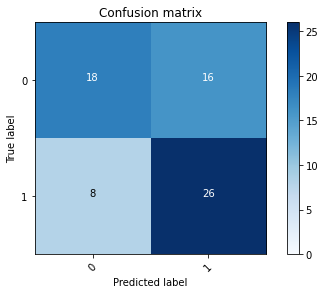

2022-08-03 20:55:20 - [Epoch Train: 82] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:55:20 - [Epoch Valid: 82] loss: 1.7785, auc: 0.7085, acc: 0.6471, time: 7.00 s


 55%|██████████████████████▉                   | 82/150 [40:50<32:35, 28.76s/it]

2022-08-03 20:55:20 - EPOCH: 83
2022-08-03 20:55:24 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:55:27 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:55:31 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:55:35 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:55:39 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:55:42 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:55:45 - Valid Step 5/17, valid_loss: 1.9979
2022-08-03 20:55:46 - Valid Step 10/17, valid_loss: 1.6540
2022-08-03 20:55:48 - Valid Step 15/17, valid_loss: 1.7415
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
5   UPENN-GBM-00092_11_T1w                0           1
55  UPENN-GBM-00093_11_T1w                0           0
50  UPENN-GBM-00094_11_T1w                0           1
15  UPENN-GBM-00115_11_T1w                1           1
38  UPENN-GBM-00117_11_T1w                0           1
65  UPENN-GBM-00128_11_T1w        

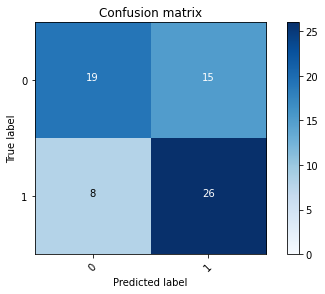

2022-08-03 20:55:49 - [Epoch Train: 83] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:55:49 - [Epoch Valid: 83] loss: 1.6973, auc: 0.7102, acc: 0.6618, time: 6.00 s
2022-08-03 20:55:49 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e83-loss1.697-acc0.662-auc0.710.pth'


 55%|███████████████████████▏                  | 83/150 [41:19<32:17, 28.92s/it]

2022-08-03 20:55:49 - EPOCH: 84
2022-08-03 20:55:53 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:55:57 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:56:00 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:56:04 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:56:07 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:56:11 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:56:13 - Valid Step 5/17, valid_loss: 1.2539
2022-08-03 20:56:15 - Valid Step 10/17, valid_loss: 1.4854
2022-08-03 20:56:17 - Valid Step 15/17, valid_loss: 1.9325
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
50  UPENN-GBM-00092_11_T1w                0           1
67  UPENN-GBM-00093_11_T1w                0           0
42  UPENN-GBM-00094_11_T1w                0           1
29  UPENN-GBM-00115_11_T1w                1           1
5   UPENN-GBM-00117_11_T1w                0           1
11  UPENN-GBM-00128_11_T1w        

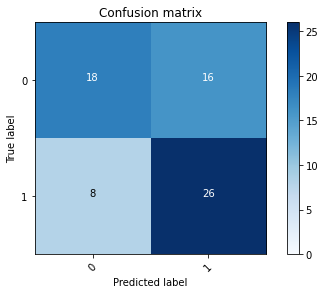

2022-08-03 20:56:18 - [Epoch Train: 84] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:56:18 - [Epoch Valid: 84] loss: 1.8480, auc: 0.7111, acc: 0.6471, time: 6.00 s


 56%|███████████████████████▌                  | 84/150 [41:48<31:48, 28.91s/it]

2022-08-03 20:56:18 - EPOCH: 85
2022-08-03 20:56:22 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:56:26 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:56:29 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:56:33 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:56:37 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:56:40 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:56:43 - Valid Step 5/17, valid_loss: 2.6358
2022-08-03 20:56:44 - Valid Step 10/17, valid_loss: 1.9642
2022-08-03 20:56:46 - Valid Step 15/17, valid_loss: 1.9939
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
55  UPENN-GBM-00092_11_T1w                0           1
61  UPENN-GBM-00093_11_T1w                0           0
33  UPENN-GBM-00094_11_T1w                0           1
37  UPENN-GBM-00115_11_T1w                1           1
29  UPENN-GBM-00117_11_T1w                0           1
49  UPENN-GBM-00128_11_T1w        

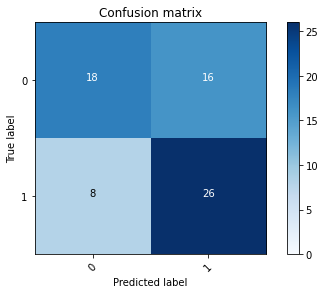

2022-08-03 20:56:47 - [Epoch Train: 85] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:56:47 - [Epoch Valid: 85] loss: 1.8386, auc: 0.7093, acc: 0.6471, time: 6.00 s


 57%|███████████████████████▊                  | 85/150 [42:17<31:29, 29.07s/it]

2022-08-03 20:56:47 - EPOCH: 86
2022-08-03 20:56:51 - Train Step 10/60, train_loss: 0.0003
2022-08-03 20:56:55 - Train Step 20/60, train_loss: 0.0002
2022-08-03 20:56:58 - Train Step 30/60, train_loss: 0.0002
2022-08-03 20:57:02 - Train Step 40/60, train_loss: 0.0002
2022-08-03 20:57:06 - Train Step 50/60, train_loss: 0.0002
2022-08-03 20:57:09 - Train Step 60/60, train_loss: 0.0002
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:57:12 - Valid Step 5/17, valid_loss: 1.6585
2022-08-03 20:57:13 - Valid Step 10/17, valid_loss: 2.0307
2022-08-03 20:57:15 - Valid Step 15/17, valid_loss: 1.8937
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
30  UPENN-GBM-00092_11_T1w                0           1
22  UPENN-GBM-00093_11_T1w                0           0
18  UPENN-GBM-00094_11_T1w                0           1
1   UPENN-GBM-00115_11_T1w                1           1
53  UPENN-GBM-00117_11_T1w                0           1
41  UPENN-GBM-00128_11_T1w        

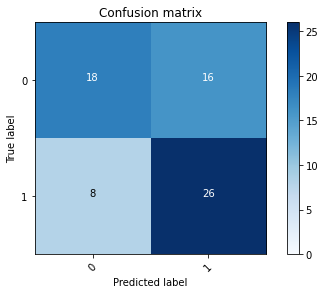

2022-08-03 20:57:16 - [Epoch Train: 86] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:57:16 - [Epoch Valid: 86] loss: 1.8731, auc: 0.7163, acc: 0.6471, time: 7.00 s


 57%|████████████████████████                  | 86/150 [42:46<30:56, 29.02s/it]

2022-08-03 20:57:16 - EPOCH: 87
2022-08-03 20:57:20 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:57:24 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:57:28 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:57:31 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:57:35 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:57:38 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:57:41 - Valid Step 5/17, valid_loss: 2.2651
2022-08-03 20:57:42 - Valid Step 10/17, valid_loss: 1.8046
2022-08-03 20:57:44 - Valid Step 15/17, valid_loss: 1.4162
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
62  UPENN-GBM-00092_11_T1w                0           1
66  UPENN-GBM-00093_11_T1w                0           0
53  UPENN-GBM-00094_11_T1w                0           1
38  UPENN-GBM-00115_11_T1w                1           1
4   UPENN-GBM-00117_11_T1w                0           1
51  UPENN-GBM-00128_11_T1w        

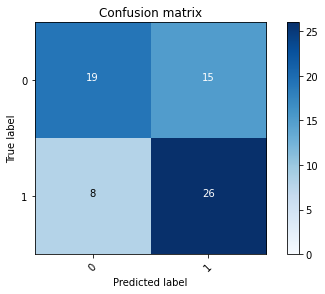

2022-08-03 20:57:45 - [Epoch Train: 87] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:57:45 - [Epoch Valid: 87] loss: 1.7832, auc: 0.7119, acc: 0.6618, time: 6.00 s
2022-08-03 20:57:45 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e87-loss1.783-acc0.662-auc0.712.pth'


 58%|████████████████████████▎                 | 87/150 [43:15<30:27, 29.01s/it]

2022-08-03 20:57:45 - EPOCH: 88
2022-08-03 20:57:49 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:57:53 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:57:57 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:58:00 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:58:04 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:58:08 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:58:10 - Valid Step 5/17, valid_loss: 1.9851
2022-08-03 20:58:12 - Valid Step 10/17, valid_loss: 1.6357
2022-08-03 20:58:14 - Valid Step 15/17, valid_loss: 1.8520
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
6   UPENN-GBM-00092_11_T1w                0           1
55  UPENN-GBM-00093_11_T1w                0           0
31  UPENN-GBM-00094_11_T1w                0           1
64  UPENN-GBM-00115_11_T1w                1           1
44  UPENN-GBM-00117_11_T1w                0           1
18  UPENN-GBM-00128_11_T1w        

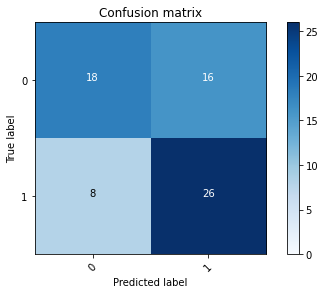

2022-08-03 20:58:15 - [Epoch Train: 88] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:58:15 - [Epoch Valid: 88] loss: 1.8733, auc: 0.7111, acc: 0.6471, time: 7.00 s


 59%|████████████████████████▋                 | 88/150 [43:45<30:07, 29.15s/it]

2022-08-03 20:58:15 - EPOCH: 89
2022-08-03 20:58:19 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:58:22 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:58:26 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:58:30 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:58:33 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:58:37 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:58:39 - Valid Step 5/17, valid_loss: 2.7488
2022-08-03 20:58:41 - Valid Step 10/17, valid_loss: 2.2646
2022-08-03 20:58:43 - Valid Step 15/17, valid_loss: 1.7329
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
62  UPENN-GBM-00092_11_T1w                0           1
44  UPENN-GBM-00093_11_T1w                0           0
38  UPENN-GBM-00094_11_T1w                0           1
54  UPENN-GBM-00115_11_T1w                1           1
51  UPENN-GBM-00117_11_T1w                0           1
58  UPENN-GBM-00128_11_T1w        

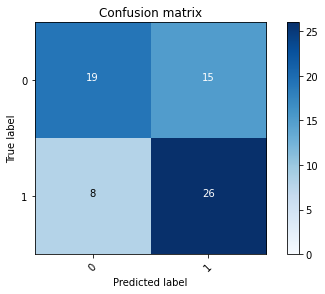

2022-08-03 20:58:44 - [Epoch Train: 89] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:58:44 - [Epoch Valid: 89] loss: 1.8636, auc: 0.7067, acc: 0.6618, time: 7.00 s
2022-08-03 20:58:44 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e89-loss1.864-acc0.662-auc0.707.pth'


 59%|████████████████████████▉                 | 89/150 [44:14<29:40, 29.18s/it]

2022-08-03 20:58:44 - EPOCH: 90
2022-08-03 20:58:48 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:58:52 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:58:55 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:58:59 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:59:02 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:59:06 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:59:08 - Valid Step 5/17, valid_loss: 2.6606
2022-08-03 20:59:10 - Valid Step 10/17, valid_loss: 2.2220
2022-08-03 20:59:12 - Valid Step 15/17, valid_loss: 2.1275
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
42  UPENN-GBM-00092_11_T1w                0           1
18  UPENN-GBM-00093_11_T1w                0           0
24  UPENN-GBM-00094_11_T1w                0           1
36  UPENN-GBM-00115_11_T1w                1           1
6   UPENN-GBM-00117_11_T1w                0           1
28  UPENN-GBM-00128_11_T1w        

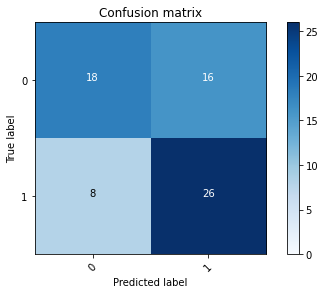

2022-08-03 20:59:13 - [Epoch Train: 90] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 20:59:13 - [Epoch Valid: 90] loss: 1.9336, auc: 0.7067, acc: 0.6471, time: 7.00 s


 60%|█████████████████████████▏                | 90/150 [44:43<29:11, 29.19s/it]

2022-08-03 20:59:13 - EPOCH: 91
2022-08-03 20:59:17 - Train Step 10/60, train_loss: 0.0001
2022-08-03 20:59:21 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:59:24 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:59:28 - Train Step 40/60, train_loss: 0.0001
2022-08-03 20:59:32 - Train Step 50/60, train_loss: 0.0001
2022-08-03 20:59:35 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 20:59:37 - Valid Step 5/17, valid_loss: 1.8747
2022-08-03 20:59:39 - Valid Step 10/17, valid_loss: 2.0925
2022-08-03 20:59:41 - Valid Step 15/17, valid_loss: 1.8902
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
29  UPENN-GBM-00092_11_T1w                0           1
17  UPENN-GBM-00093_11_T1w                0           0
66  UPENN-GBM-00094_11_T1w                0           1
43  UPENN-GBM-00115_11_T1w                1           1
27  UPENN-GBM-00117_11_T1w                0           1
10  UPENN-GBM-00128_11_T1w        

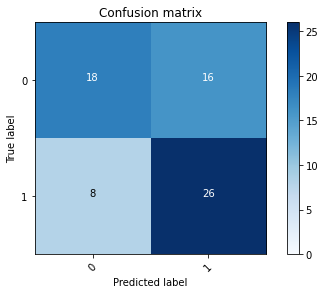

2022-08-03 20:59:42 - [Epoch Train: 91] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 20:59:42 - [Epoch Valid: 91] loss: 1.8845, auc: 0.7076, acc: 0.6471, time: 6.00 s


 61%|█████████████████████████▍                | 91/150 [45:12<28:37, 29.10s/it]

2022-08-03 20:59:42 - EPOCH: 92
2022-08-03 20:59:46 - Train Step 10/60, train_loss: 0.0000
2022-08-03 20:59:50 - Train Step 20/60, train_loss: 0.0001
2022-08-03 20:59:53 - Train Step 30/60, train_loss: 0.0001
2022-08-03 20:59:57 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:00:01 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:00:04 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:00:06 - Valid Step 5/17, valid_loss: 1.1247
2022-08-03 21:00:08 - Valid Step 10/17, valid_loss: 1.2723
2022-08-03 21:00:10 - Valid Step 15/17, valid_loss: 1.8295
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
66  UPENN-GBM-00092_11_T1w                0           1
15  UPENN-GBM-00093_11_T1w                0           0
48  UPENN-GBM-00094_11_T1w                0           1
17  UPENN-GBM-00115_11_T1w                1           1
56  UPENN-GBM-00117_11_T1w                0           1
65  UPENN-GBM-00128_11_T1w        

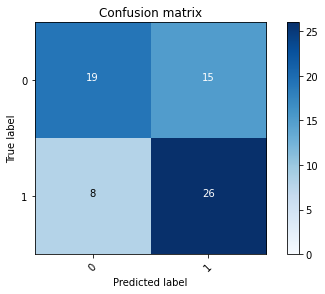

2022-08-03 21:00:11 - [Epoch Train: 92] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 21:00:11 - [Epoch Valid: 92] loss: 1.8461, auc: 0.7085, acc: 0.6618, time: 6.00 s
2022-08-03 21:00:11 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e92-loss1.846-acc0.662-auc0.708.pth'


 61%|█████████████████████████▊                | 92/150 [45:41<28:04, 29.04s/it]

2022-08-03 21:00:11 - EPOCH: 93
2022-08-03 21:00:15 - Train Step 10/60, train_loss: 0.0001
2022-08-03 21:00:19 - Train Step 20/60, train_loss: 0.0001
2022-08-03 21:00:22 - Train Step 30/60, train_loss: 0.0001
2022-08-03 21:00:26 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:00:29 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:00:33 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:00:35 - Valid Step 5/17, valid_loss: 2.0551
2022-08-03 21:00:37 - Valid Step 10/17, valid_loss: 2.2855
2022-08-03 21:00:39 - Valid Step 15/17, valid_loss: 1.8233
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
2   UPENN-GBM-00092_11_T1w                0           1
22  UPENN-GBM-00093_11_T1w                0           0
36  UPENN-GBM-00094_11_T1w                0           1
6   UPENN-GBM-00115_11_T1w                1           1
59  UPENN-GBM-00117_11_T1w                0           1
25  UPENN-GBM-00128_11_T1w        

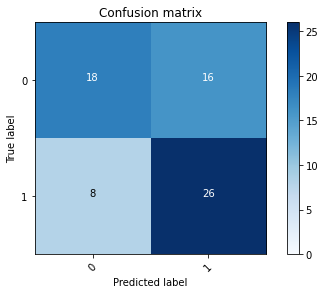

2022-08-03 21:00:40 - [Epoch Train: 93] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 21:00:40 - [Epoch Valid: 93] loss: 1.8341, auc: 0.7076, acc: 0.6471, time: 6.00 s


 62%|██████████████████████████                | 93/150 [46:10<27:33, 29.01s/it]

2022-08-03 21:00:40 - EPOCH: 94
2022-08-03 21:00:44 - Train Step 10/60, train_loss: 0.0001
2022-08-03 21:00:48 - Train Step 20/60, train_loss: 0.0001
2022-08-03 21:00:51 - Train Step 30/60, train_loss: 0.0001
2022-08-03 21:00:55 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:00:58 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:01:02 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:01:04 - Valid Step 5/17, valid_loss: 0.8440
2022-08-03 21:01:06 - Valid Step 10/17, valid_loss: 1.8143
2022-08-03 21:01:08 - Valid Step 15/17, valid_loss: 1.8060
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
40  UPENN-GBM-00092_11_T1w                0           1
28  UPENN-GBM-00093_11_T1w                0           0
14  UPENN-GBM-00094_11_T1w                0           1
32  UPENN-GBM-00115_11_T1w                1           1
8   UPENN-GBM-00117_11_T1w                0           1
59  UPENN-GBM-00128_11_T1w        

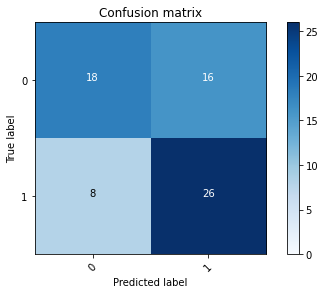

2022-08-03 21:01:09 - [Epoch Train: 94] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:01:09 - [Epoch Valid: 94] loss: 1.8415, auc: 0.7102, acc: 0.6471, time: 7.00 s


 63%|██████████████████████████▎               | 94/150 [46:39<27:08, 29.08s/it]

2022-08-03 21:01:09 - EPOCH: 95
2022-08-03 21:01:13 - Train Step 10/60, train_loss: 0.0001
2022-08-03 21:01:17 - Train Step 20/60, train_loss: 0.0001
2022-08-03 21:01:20 - Train Step 30/60, train_loss: 0.0001
2022-08-03 21:01:24 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:01:27 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:01:31 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:01:33 - Valid Step 5/17, valid_loss: 1.9170
2022-08-03 21:01:35 - Valid Step 10/17, valid_loss: 1.5214
2022-08-03 21:01:37 - Valid Step 15/17, valid_loss: 1.9261
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
3   UPENN-GBM-00092_11_T1w                0           1
20  UPENN-GBM-00093_11_T1w                0           0
14  UPENN-GBM-00094_11_T1w                0           1
52  UPENN-GBM-00115_11_T1w                1           1
46  UPENN-GBM-00117_11_T1w                0           1
48  UPENN-GBM-00128_11_T1w        

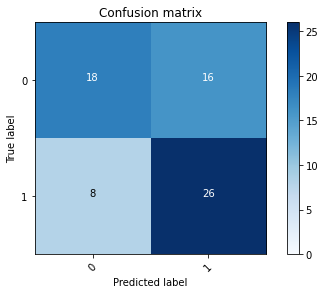

2022-08-03 21:01:38 - [Epoch Train: 95] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 21:01:38 - [Epoch Valid: 95] loss: 1.8548, auc: 0.7154, acc: 0.6471, time: 6.00 s


 63%|██████████████████████████▌               | 95/150 [47:08<26:28, 28.88s/it]

2022-08-03 21:01:38 - EPOCH: 96
2022-08-03 21:01:42 - Train Step 10/60, train_loss: 0.0001
2022-08-03 21:01:45 - Train Step 20/60, train_loss: 0.0001
2022-08-03 21:01:49 - Train Step 30/60, train_loss: 0.0001
2022-08-03 21:01:53 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:01:56 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:02:00 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:02:02 - Valid Step 5/17, valid_loss: 1.3656
2022-08-03 21:02:04 - Valid Step 10/17, valid_loss: 2.4064
2022-08-03 21:02:06 - Valid Step 15/17, valid_loss: 1.9898
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
0   UPENN-GBM-00092_11_T1w                0           1
12  UPENN-GBM-00093_11_T1w                0           0
35  UPENN-GBM-00094_11_T1w                0           1
28  UPENN-GBM-00115_11_T1w                1           1
65  UPENN-GBM-00117_11_T1w                0           1
45  UPENN-GBM-00128_11_T1w        

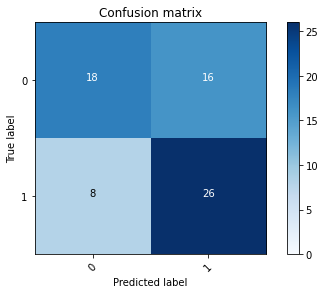

2022-08-03 21:02:07 - [Epoch Train: 96] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:02:07 - [Epoch Valid: 96] loss: 1.8877, auc: 0.7076, acc: 0.6471, time: 7.00 s


 64%|██████████████████████████▉               | 96/150 [47:37<26:09, 29.07s/it]

2022-08-03 21:02:07 - EPOCH: 97
2022-08-03 21:02:11 - Train Step 10/60, train_loss: 0.0001
2022-08-03 21:02:15 - Train Step 20/60, train_loss: 0.0001
2022-08-03 21:02:18 - Train Step 30/60, train_loss: 0.0001
2022-08-03 21:02:22 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:02:26 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:02:29 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:02:32 - Valid Step 5/17, valid_loss: 1.5271
2022-08-03 21:02:33 - Valid Step 10/17, valid_loss: 1.4625
2022-08-03 21:02:35 - Valid Step 15/17, valid_loss: 1.8463
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
66  UPENN-GBM-00092_11_T1w                0           1
16  UPENN-GBM-00093_11_T1w                0           0
26  UPENN-GBM-00094_11_T1w                0           1
49  UPENN-GBM-00115_11_T1w                1           1
14  UPENN-GBM-00117_11_T1w                0           1
11  UPENN-GBM-00128_11_T1w        

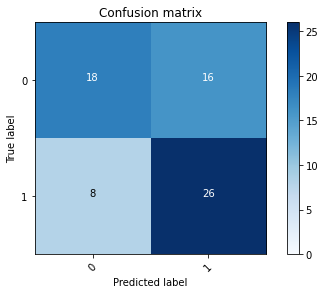

2022-08-03 21:02:36 - [Epoch Train: 97] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:02:36 - [Epoch Valid: 97] loss: 1.8726, auc: 0.7119, acc: 0.6471, time: 7.00 s


 65%|███████████████████████████▏              | 97/150 [48:06<25:42, 29.11s/it]

2022-08-03 21:02:36 - EPOCH: 98
2022-08-03 21:02:40 - Train Step 10/60, train_loss: 0.0001
2022-08-03 21:02:44 - Train Step 20/60, train_loss: 0.0001
2022-08-03 21:02:48 - Train Step 30/60, train_loss: 0.0001
2022-08-03 21:02:51 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:02:55 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:02:59 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:03:01 - Valid Step 5/17, valid_loss: 1.0552
2022-08-03 21:03:02 - Valid Step 10/17, valid_loss: 1.0964
2022-08-03 21:03:05 - Valid Step 15/17, valid_loss: 1.8261
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
56  UPENN-GBM-00092_11_T1w                0           1
9   UPENN-GBM-00093_11_T1w                0           0
6   UPENN-GBM-00094_11_T1w                0           1
1   UPENN-GBM-00115_11_T1w                1           1
42  UPENN-GBM-00117_11_T1w                0           1
18  UPENN-GBM-00128_11_T1w        

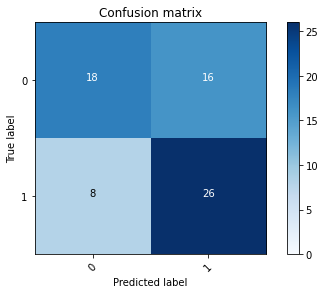

2022-08-03 21:03:05 - [Epoch Train: 98] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:03:05 - [Epoch Valid: 98] loss: 1.9572, auc: 0.7067, acc: 0.6471, time: 6.00 s


 65%|███████████████████████████▍              | 98/150 [48:35<25:13, 29.11s/it]

2022-08-03 21:03:05 - EPOCH: 99
2022-08-03 21:03:09 - Train Step 10/60, train_loss: 0.0001
2022-08-03 21:03:13 - Train Step 20/60, train_loss: 0.0001
2022-08-03 21:03:17 - Train Step 30/60, train_loss: 0.0001
2022-08-03 21:03:20 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:03:24 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:03:28 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:03:30 - Valid Step 5/17, valid_loss: 2.5553
2022-08-03 21:03:32 - Valid Step 10/17, valid_loss: 1.9106
2022-08-03 21:03:34 - Valid Step 15/17, valid_loss: 1.8578
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
8   UPENN-GBM-00092_11_T1w                0           1
32  UPENN-GBM-00093_11_T1w                0           0
34  UPENN-GBM-00094_11_T1w                0           1
39  UPENN-GBM-00115_11_T1w                1           1
53  UPENN-GBM-00117_11_T1w                0           1
24  UPENN-GBM-00128_11_T1w        

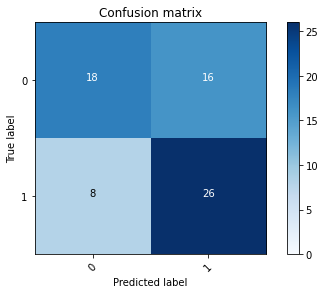

2022-08-03 21:03:35 - [Epoch Train: 99] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:03:35 - [Epoch Valid: 99] loss: 1.9366, auc: 0.7093, acc: 0.6471, time: 7.00 s


 66%|███████████████████████████▋              | 99/150 [49:05<24:48, 29.19s/it]

2022-08-03 21:03:35 - EPOCH: 100
2022-08-03 21:03:39 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:03:42 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:03:46 - Train Step 30/60, train_loss: 0.0001
2022-08-03 21:03:50 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:03:53 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:03:57 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:03:59 - Valid Step 5/17, valid_loss: 1.7783
2022-08-03 21:04:01 - Valid Step 10/17, valid_loss: 1.9224
2022-08-03 21:04:03 - Valid Step 15/17, valid_loss: 1.9380
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
56  UPENN-GBM-00092_11_T1w                0           1
38  UPENN-GBM-00093_11_T1w                0           0
63  UPENN-GBM-00094_11_T1w                0           1
58  UPENN-GBM-00115_11_T1w                1           1
39  UPENN-GBM-00117_11_T1w                0           1
51  UPENN-GBM-00128_11_T1w       

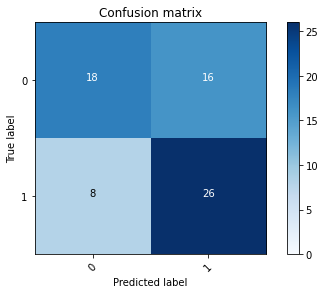

2022-08-03 21:04:04 - [Epoch Train: 100] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:04:04 - [Epoch Valid: 100] loss: 1.8855, auc: 0.7089, acc: 0.6471, time: 6.00 s


 67%|███████████████████████████▎             | 100/150 [49:34<24:19, 29.19s/it]

2022-08-03 21:04:04 - EPOCH: 101
2022-08-03 21:04:08 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:04:12 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:04:15 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:04:19 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:04:23 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:04:26 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:04:29 - Valid Step 5/17, valid_loss: 2.5140
2022-08-03 21:04:30 - Valid Step 10/17, valid_loss: 2.7971
2022-08-03 21:04:32 - Valid Step 15/17, valid_loss: 2.1873
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
24  UPENN-GBM-00092_11_T1w                0           1
13  UPENN-GBM-00093_11_T1w                0           0
21  UPENN-GBM-00094_11_T1w                0           1
53  UPENN-GBM-00115_11_T1w                1           1
12  UPENN-GBM-00117_11_T1w                0           1
57  UPENN-GBM-00128_11_T1w       

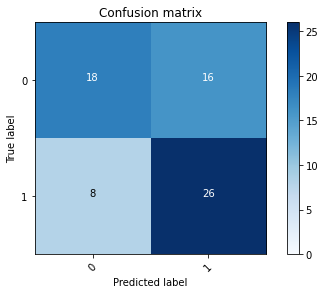

2022-08-03 21:04:33 - [Epoch Train: 101] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:04:33 - [Epoch Valid: 101] loss: 1.9583, auc: 0.7050, acc: 0.6471, time: 7.00 s


 67%|███████████████████████████▌             | 101/150 [50:03<23:52, 29.24s/it]

2022-08-03 21:04:33 - EPOCH: 102
2022-08-03 21:04:37 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:04:41 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:04:45 - Train Step 30/60, train_loss: 0.0001
2022-08-03 21:04:48 - Train Step 40/60, train_loss: 0.0001
2022-08-03 21:04:52 - Train Step 50/60, train_loss: 0.0001
2022-08-03 21:04:55 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:04:58 - Valid Step 5/17, valid_loss: 2.1627
2022-08-03 21:04:59 - Valid Step 10/17, valid_loss: 2.3502
2022-08-03 21:05:02 - Valid Step 15/17, valid_loss: 2.0448
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
55  UPENN-GBM-00092_11_T1w                0           1
31  UPENN-GBM-00093_11_T1w                0           0
1   UPENN-GBM-00094_11_T1w                0           1
5   UPENN-GBM-00115_11_T1w                1           1
33  UPENN-GBM-00117_11_T1w                0           1
37  UPENN-GBM-00128_11_T1w       

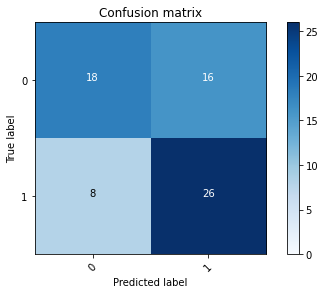

2022-08-03 21:05:02 - [Epoch Train: 102] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:05:02 - [Epoch Valid: 102] loss: 1.9530, auc: 0.7141, acc: 0.6471, time: 6.00 s


 68%|███████████████████████████▉             | 102/150 [50:32<23:21, 29.19s/it]

2022-08-03 21:05:02 - EPOCH: 103
2022-08-03 21:05:06 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:05:10 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:05:14 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:05:17 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:05:21 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:05:24 - Train Step 60/60, train_loss: 0.0001
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:05:26 - Valid Step 5/17, valid_loss: 2.8256
2022-08-03 21:05:28 - Valid Step 10/17, valid_loss: 2.4429
2022-08-03 21:05:30 - Valid Step 15/17, valid_loss: 2.1440
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
45  UPENN-GBM-00092_11_T1w                0           1
4   UPENN-GBM-00093_11_T1w                0           0
37  UPENN-GBM-00094_11_T1w                0           1
2   UPENN-GBM-00115_11_T1w                1           1
14  UPENN-GBM-00117_11_T1w                0           1
58  UPENN-GBM-00128_11_T1w       

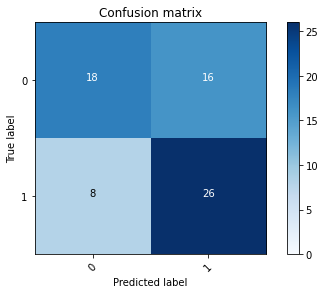

2022-08-03 21:05:31 - [Epoch Train: 103] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 21:05:31 - [Epoch Valid: 103] loss: 1.9851, auc: 0.7093, acc: 0.6471, time: 7.00 s


 69%|████████████████████████████▏            | 103/150 [51:01<22:47, 29.09s/it]

2022-08-03 21:05:31 - EPOCH: 104
2022-08-03 21:05:35 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:05:39 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:05:43 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:05:46 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:05:50 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:05:53 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:05:56 - Valid Step 5/17, valid_loss: 2.6734
2022-08-03 21:05:57 - Valid Step 10/17, valid_loss: 2.7844
2022-08-03 21:05:59 - Valid Step 15/17, valid_loss: 2.2427
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
26  UPENN-GBM-00092_11_T1w                0           1
37  UPENN-GBM-00093_11_T1w                0           0
35  UPENN-GBM-00094_11_T1w                0           1
48  UPENN-GBM-00115_11_T1w                1           1
12  UPENN-GBM-00117_11_T1w                0           1
16  UPENN-GBM-00128_11_T1w       

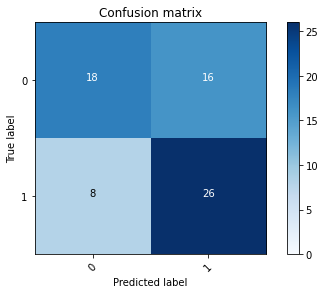

2022-08-03 21:06:00 - [Epoch Train: 104] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:06:00 - [Epoch Valid: 104] loss: 1.9908, auc: 0.7042, acc: 0.6471, time: 6.00 s


 69%|████████████████████████████▍            | 104/150 [51:30<22:17, 29.09s/it]

2022-08-03 21:06:00 - EPOCH: 105
2022-08-03 21:06:04 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:06:08 - Train Step 20/60, train_loss: 0.0001
2022-08-03 21:06:12 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:06:15 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:06:19 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:06:22 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:06:25 - Valid Step 5/17, valid_loss: 1.1089
2022-08-03 21:06:27 - Valid Step 10/17, valid_loss: 1.8053
2022-08-03 21:06:29 - Valid Step 15/17, valid_loss: 1.5377
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
24  UPENN-GBM-00092_11_T1w                0           1
55  UPENN-GBM-00093_11_T1w                0           0
9   UPENN-GBM-00094_11_T1w                0           1
16  UPENN-GBM-00115_11_T1w                1           1
66  UPENN-GBM-00117_11_T1w                0           1
14  UPENN-GBM-00128_11_T1w       

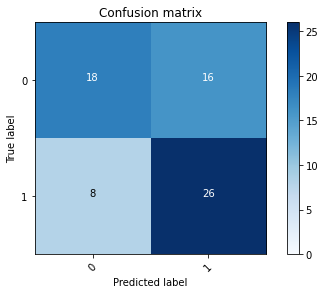

2022-08-03 21:06:30 - [Epoch Train: 105] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:06:30 - [Epoch Valid: 105] loss: 1.9532, auc: 0.7115, acc: 0.6471, time: 7.00 s


 70%|████████████████████████████▋            | 105/150 [52:00<21:52, 29.16s/it]

2022-08-03 21:06:30 - EPOCH: 106
2022-08-03 21:06:34 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:06:37 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:06:41 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:06:45 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:06:48 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:06:52 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:06:54 - Valid Step 5/17, valid_loss: 1.3696
2022-08-03 21:06:56 - Valid Step 10/17, valid_loss: 1.7265
2022-08-03 21:06:58 - Valid Step 15/17, valid_loss: 2.0978
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
37  UPENN-GBM-00092_11_T1w                0           1
46  UPENN-GBM-00093_11_T1w                0           0
14  UPENN-GBM-00094_11_T1w                0           1
60  UPENN-GBM-00115_11_T1w                1           1
59  UPENN-GBM-00117_11_T1w                0           1
62  UPENN-GBM-00128_11_T1w       

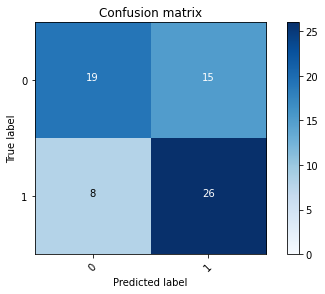

2022-08-03 21:06:59 - [Epoch Train: 106] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 21:06:59 - [Epoch Valid: 106] loss: 1.8967, auc: 0.7137, acc: 0.6618, time: 7.00 s
2022-08-03 21:06:59 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e106-loss1.897-acc0.662-auc0.714.pth'


 71%|████████████████████████████▉            | 106/150 [52:29<21:21, 29.13s/it]

2022-08-03 21:06:59 - EPOCH: 107
2022-08-03 21:07:03 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:07:06 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:07:10 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:07:14 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:07:17 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:07:21 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:07:23 - Valid Step 5/17, valid_loss: 1.5874
2022-08-03 21:07:25 - Valid Step 10/17, valid_loss: 1.9218
2022-08-03 21:07:27 - Valid Step 15/17, valid_loss: 1.8777
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
17  UPENN-GBM-00092_11_T1w                0           1
60  UPENN-GBM-00093_11_T1w                0           0
19  UPENN-GBM-00094_11_T1w                0           1
34  UPENN-GBM-00115_11_T1w                1           1
64  UPENN-GBM-00117_11_T1w                0           1
29  UPENN-GBM-00128_11_T1w       

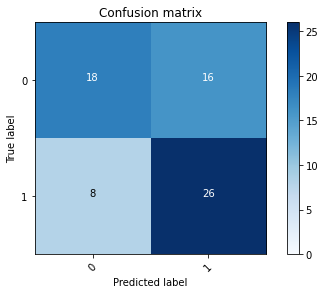

2022-08-03 21:07:28 - [Epoch Train: 107] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:07:28 - [Epoch Valid: 107] loss: 1.9670, auc: 0.7085, acc: 0.6471, time: 7.00 s


 71%|█████████████████████████████▏           | 107/150 [52:58<20:55, 29.20s/it]

2022-08-03 21:07:28 - EPOCH: 108
2022-08-03 21:07:32 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:07:36 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:07:40 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:07:43 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:07:47 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:07:50 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:07:53 - Valid Step 5/17, valid_loss: 1.5261
2022-08-03 21:07:55 - Valid Step 10/17, valid_loss: 1.9673
2022-08-03 21:07:57 - Valid Step 15/17, valid_loss: 1.7987
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
48  UPENN-GBM-00092_11_T1w                0           1
42  UPENN-GBM-00093_11_T1w                0           0
27  UPENN-GBM-00094_11_T1w                0           1
58  UPENN-GBM-00115_11_T1w                1           1
20  UPENN-GBM-00117_11_T1w                0           1
65  UPENN-GBM-00128_11_T1w       

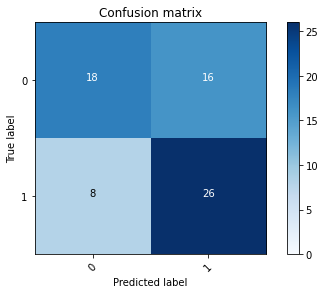

2022-08-03 21:07:58 - [Epoch Train: 108] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 22.00 s            
2022-08-03 21:07:58 - [Epoch Valid: 108] loss: 1.9841, auc: 0.7102, acc: 0.6471, time: 7.00 s


 72%|█████████████████████████████▌           | 108/150 [53:28<20:30, 29.29s/it]

2022-08-03 21:07:58 - EPOCH: 109
2022-08-03 21:08:02 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:08:05 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:08:09 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:08:12 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:08:16 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:08:19 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:08:22 - Valid Step 5/17, valid_loss: 2.1647
2022-08-03 21:08:23 - Valid Step 10/17, valid_loss: 1.8541
2022-08-03 21:08:25 - Valid Step 15/17, valid_loss: 1.7413
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
13  UPENN-GBM-00092_11_T1w                0           1
64  UPENN-GBM-00093_11_T1w                0           0
60  UPENN-GBM-00094_11_T1w                0           1
57  UPENN-GBM-00115_11_T1w                1           1
49  UPENN-GBM-00117_11_T1w                0           1
45  UPENN-GBM-00128_11_T1w       

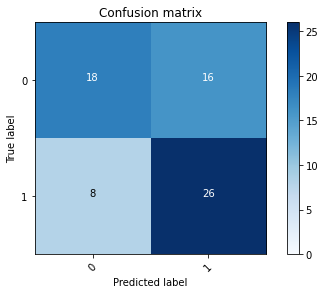

2022-08-03 21:08:26 - [Epoch Train: 109] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 21.00 s            
2022-08-03 21:08:26 - [Epoch Valid: 109] loss: 1.8894, auc: 0.7163, acc: 0.6471, time: 6.00 s


 73%|█████████████████████████████▊           | 109/150 [53:56<19:53, 29.11s/it]

2022-08-03 21:08:26 - EPOCH: 110
2022-08-03 21:08:31 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:08:35 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:08:39 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:08:43 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:08:47 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:08:51 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:08:54 - Valid Step 5/17, valid_loss: 3.5502
2022-08-03 21:08:56 - Valid Step 10/17, valid_loss: 2.3009
2022-08-03 21:08:58 - Valid Step 15/17, valid_loss: 1.7848
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
61  UPENN-GBM-00092_11_T1w                0           1
21  UPENN-GBM-00093_11_T1w                0           0
8   UPENN-GBM-00094_11_T1w                0           1
28  UPENN-GBM-00115_11_T1w                1           1
3   UPENN-GBM-00117_11_T1w                0           1
35  UPENN-GBM-00128_11_T1w       

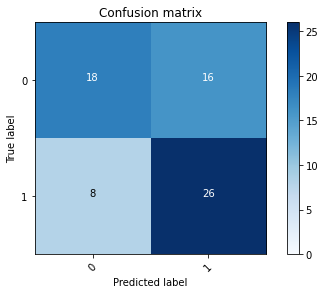

2022-08-03 21:08:59 - [Epoch Train: 110] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:08:59 - [Epoch Valid: 110] loss: 1.9652, auc: 0.7050, acc: 0.6471, time: 7.00 s


 73%|██████████████████████████████           | 110/150 [54:29<20:07, 30.18s/it]

2022-08-03 21:08:59 - EPOCH: 111
2022-08-03 21:09:03 - Train Step 10/60, train_loss: 0.0001
2022-08-03 21:09:07 - Train Step 20/60, train_loss: 0.0001
2022-08-03 21:09:11 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:09:15 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:09:19 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:09:23 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:09:26 - Valid Step 5/17, valid_loss: 2.8307
2022-08-03 21:09:27 - Valid Step 10/17, valid_loss: 2.4884
2022-08-03 21:09:30 - Valid Step 15/17, valid_loss: 1.9258
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
57  UPENN-GBM-00092_11_T1w                0           1
22  UPENN-GBM-00093_11_T1w                0           0
26  UPENN-GBM-00094_11_T1w                0           1
21  UPENN-GBM-00115_11_T1w                1           1
67  UPENN-GBM-00117_11_T1w                0           1
37  UPENN-GBM-00128_11_T1w       

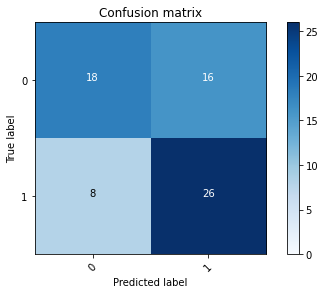

2022-08-03 21:09:31 - [Epoch Train: 111] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:09:31 - [Epoch Valid: 111] loss: 1.9397, auc: 0.7102, acc: 0.6471, time: 7.00 s


 74%|██████████████████████████████▎          | 111/150 [55:01<19:54, 30.62s/it]

2022-08-03 21:09:31 - EPOCH: 112
2022-08-03 21:09:35 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:09:39 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:09:43 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:09:46 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:09:50 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:09:54 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:09:56 - Valid Step 5/17, valid_loss: 2.8313
2022-08-03 21:09:58 - Valid Step 10/17, valid_loss: 2.6748
2022-08-03 21:10:01 - Valid Step 15/17, valid_loss: 2.2660
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
37  UPENN-GBM-00092_11_T1w                0           1
61  UPENN-GBM-00093_11_T1w                0           0
45  UPENN-GBM-00094_11_T1w                0           1
15  UPENN-GBM-00115_11_T1w                1           1
9   UPENN-GBM-00117_11_T1w                0           1
16  UPENN-GBM-00128_11_T1w       

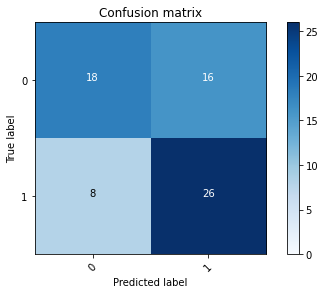

2022-08-03 21:10:02 - [Epoch Train: 112] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:10:02 - [Epoch Valid: 112] loss: 2.0157, auc: 0.7085, acc: 0.6471, time: 7.00 s


 75%|██████████████████████████████▌          | 112/150 [55:32<19:27, 30.73s/it]

2022-08-03 21:10:02 - EPOCH: 113
2022-08-03 21:10:06 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:10:10 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:10:14 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:10:18 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:10:22 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:10:27 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:10:30 - Valid Step 5/17, valid_loss: 2.3873
2022-08-03 21:10:32 - Valid Step 10/17, valid_loss: 2.2435
2022-08-03 21:10:35 - Valid Step 15/17, valid_loss: 2.2853
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
36  UPENN-GBM-00092_11_T1w                0           1
60  UPENN-GBM-00093_11_T1w                0           0
9   UPENN-GBM-00094_11_T1w                0           1
1   UPENN-GBM-00115_11_T1w                1           1
48  UPENN-GBM-00117_11_T1w                0           1
13  UPENN-GBM-00128_11_T1w       

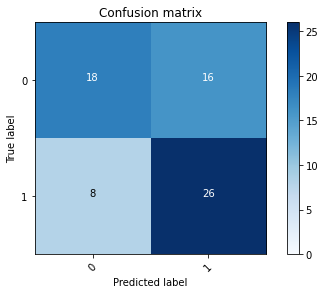

2022-08-03 21:10:35 - [Epoch Train: 113] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 25.00 s            
2022-08-03 21:10:35 - [Epoch Valid: 113] loss: 2.0248, auc: 0.7102, acc: 0.6471, time: 8.00 s


 75%|██████████████████████████████▉          | 113/150 [56:05<19:32, 31.68s/it]

2022-08-03 21:10:35 - EPOCH: 114
2022-08-03 21:10:40 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:10:44 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:10:48 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:10:52 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:10:56 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:11:00 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:11:03 - Valid Step 5/17, valid_loss: 0.7423
2022-08-03 21:11:05 - Valid Step 10/17, valid_loss: 1.4351
2022-08-03 21:11:07 - Valid Step 15/17, valid_loss: 1.8239
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
29  UPENN-GBM-00092_11_T1w                0           1
13  UPENN-GBM-00093_11_T1w                0           0
16  UPENN-GBM-00094_11_T1w                0           1
48  UPENN-GBM-00115_11_T1w                1           1
67  UPENN-GBM-00117_11_T1w                0           1
3   UPENN-GBM-00128_11_T1w       

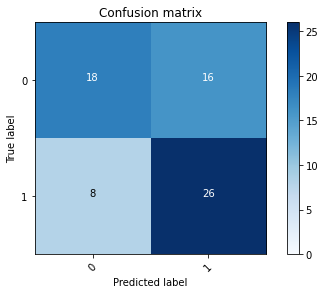

2022-08-03 21:11:08 - [Epoch Train: 114] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:11:08 - [Epoch Valid: 114] loss: 2.0303, auc: 0.7137, acc: 0.6471, time: 8.00 s


 76%|███████████████████████████████▏         | 114/150 [56:38<19:10, 31.96s/it]

2022-08-03 21:11:08 - EPOCH: 115
2022-08-03 21:11:13 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:11:17 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:11:21 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:11:25 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:11:29 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:11:32 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:11:35 - Valid Step 5/17, valid_loss: 2.2641
2022-08-03 21:11:37 - Valid Step 10/17, valid_loss: 1.7925
2022-08-03 21:11:39 - Valid Step 15/17, valid_loss: 2.1102
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
8   UPENN-GBM-00092_11_T1w                0           1
14  UPENN-GBM-00093_11_T1w                0           0
9   UPENN-GBM-00094_11_T1w                0           1
30  UPENN-GBM-00115_11_T1w                1           1
6   UPENN-GBM-00117_11_T1w                0           1
51  UPENN-GBM-00128_11_T1w       

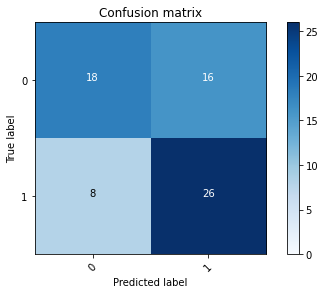

2022-08-03 21:11:40 - [Epoch Train: 115] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:11:40 - [Epoch Valid: 115] loss: 2.0155, auc: 0.7067, acc: 0.6471, time: 7.00 s


 77%|███████████████████████████████▍         | 115/150 [57:10<18:39, 31.99s/it]

2022-08-03 21:11:40 - EPOCH: 116
2022-08-03 21:11:45 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:11:49 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:11:53 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:11:57 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:12:01 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:12:05 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:12:08 - Valid Step 5/17, valid_loss: 2.9349
2022-08-03 21:12:10 - Valid Step 10/17, valid_loss: 2.2408
2022-08-03 21:12:12 - Valid Step 15/17, valid_loss: 1.9954
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
10  UPENN-GBM-00092_11_T1w                0           1
37  UPENN-GBM-00093_11_T1w                0           0
29  UPENN-GBM-00094_11_T1w                0           1
26  UPENN-GBM-00115_11_T1w                1           1
4   UPENN-GBM-00117_11_T1w                0           1
23  UPENN-GBM-00128_11_T1w       

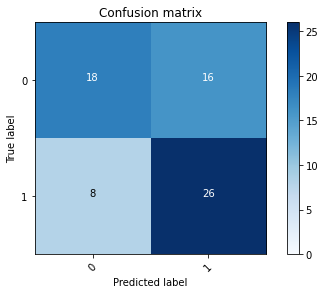

2022-08-03 21:12:13 - [Epoch Train: 116] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:12:13 - [Epoch Valid: 116] loss: 2.0446, auc: 0.7176, acc: 0.6471, time: 7.00 s


 77%|███████████████████████████████▋         | 116/150 [57:43<18:16, 32.25s/it]

2022-08-03 21:12:13 - EPOCH: 117
2022-08-03 21:12:18 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:12:22 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:12:26 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:12:30 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:12:34 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:12:38 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:12:41 - Valid Step 5/17, valid_loss: 3.4275
2022-08-03 21:12:42 - Valid Step 10/17, valid_loss: 2.3256
2022-08-03 21:12:45 - Valid Step 15/17, valid_loss: 2.3564
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
52  UPENN-GBM-00092_11_T1w                0           1
44  UPENN-GBM-00093_11_T1w                0           0
14  UPENN-GBM-00094_11_T1w                0           1
1   UPENN-GBM-00115_11_T1w                1           1
47  UPENN-GBM-00117_11_T1w                0           1
60  UPENN-GBM-00128_11_T1w       

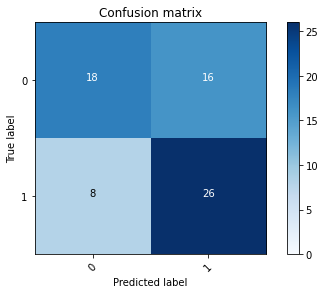

2022-08-03 21:12:46 - [Epoch Train: 117] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:12:46 - [Epoch Valid: 117] loss: 2.0876, auc: 0.7154, acc: 0.6471, time: 7.00 s


 78%|███████████████████████████████▉         | 117/150 [58:16<17:49, 32.42s/it]

2022-08-03 21:12:46 - EPOCH: 118
2022-08-03 21:12:50 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:12:54 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:12:58 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:13:03 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:13:07 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:13:11 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:13:13 - Valid Step 5/17, valid_loss: 1.8206
2022-08-03 21:13:15 - Valid Step 10/17, valid_loss: 1.3462
2022-08-03 21:13:18 - Valid Step 15/17, valid_loss: 1.5062
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
23  UPENN-GBM-00092_11_T1w                0           1
48  UPENN-GBM-00093_11_T1w                0           0
6   UPENN-GBM-00094_11_T1w                0           1
60  UPENN-GBM-00115_11_T1w                1           1
31  UPENN-GBM-00117_11_T1w                0           1
32  UPENN-GBM-00128_11_T1w       

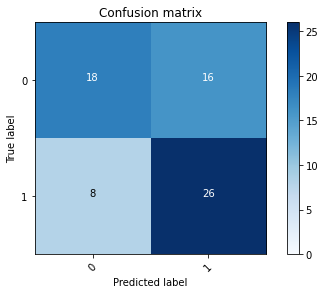

2022-08-03 21:13:19 - [Epoch Train: 118] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:13:19 - [Epoch Valid: 118] loss: 2.0107, auc: 0.7085, acc: 0.6471, time: 8.00 s


 79%|████████████████████████████████▎        | 118/150 [58:49<17:22, 32.57s/it]

2022-08-03 21:13:19 - EPOCH: 119
2022-08-03 21:13:23 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:13:27 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:13:32 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:13:36 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:13:40 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:13:44 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:13:47 - Valid Step 5/17, valid_loss: 0.9511
2022-08-03 21:13:49 - Valid Step 10/17, valid_loss: 1.9922
2022-08-03 21:13:51 - Valid Step 15/17, valid_loss: 2.0007
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
27  UPENN-GBM-00092_11_T1w                0           1
33  UPENN-GBM-00093_11_T1w                0           0
40  UPENN-GBM-00094_11_T1w                0           1
3   UPENN-GBM-00115_11_T1w                1           1
52  UPENN-GBM-00117_11_T1w                0           1
56  UPENN-GBM-00128_11_T1w       

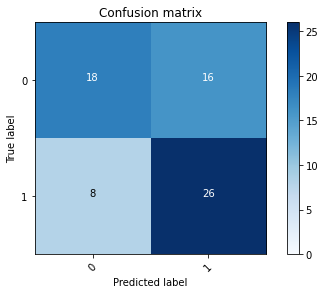

2022-08-03 21:13:52 - [Epoch Train: 119] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 25.00 s            
2022-08-03 21:13:52 - [Epoch Valid: 119] loss: 2.0860, auc: 0.7180, acc: 0.6471, time: 7.00 s


 79%|████████████████████████████████▌        | 119/150 [59:22<16:56, 32.80s/it]

2022-08-03 21:13:52 - EPOCH: 120
2022-08-03 21:13:56 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:14:00 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:14:04 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:14:08 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:14:13 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:14:17 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:14:19 - Valid Step 5/17, valid_loss: 2.6229
2022-08-03 21:14:21 - Valid Step 10/17, valid_loss: 1.8641
2022-08-03 21:14:23 - Valid Step 15/17, valid_loss: 1.7549
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
6   UPENN-GBM-00092_11_T1w                0           1
34  UPENN-GBM-00093_11_T1w                0           0
39  UPENN-GBM-00094_11_T1w                0           1
65  UPENN-GBM-00115_11_T1w                1           1
45  UPENN-GBM-00117_11_T1w                0           1
11  UPENN-GBM-00128_11_T1w       

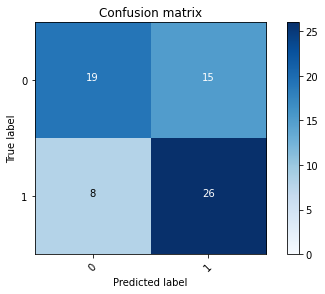

2022-08-03 21:14:24 - [Epoch Train: 120] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:14:24 - [Epoch Valid: 120] loss: 1.9440, auc: 0.7163, acc: 0.6618, time: 7.00 s
2022-08-03 21:14:24 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e120-loss1.944-acc0.662-auc0.716.pth'


 80%|████████████████████████████████▊        | 120/150 [59:54<16:17, 32.58s/it]

2022-08-03 21:14:24 - EPOCH: 121
2022-08-03 21:14:29 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:14:33 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:14:37 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:14:41 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:14:45 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:14:49 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:14:51 - Valid Step 5/17, valid_loss: 0.8553
2022-08-03 21:14:53 - Valid Step 10/17, valid_loss: 1.9705
2022-08-03 21:14:55 - Valid Step 15/17, valid_loss: 2.1594
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
39  UPENN-GBM-00092_11_T1w                0           1
0   UPENN-GBM-00093_11_T1w                0           0
56  UPENN-GBM-00094_11_T1w                0           1
46  UPENN-GBM-00115_11_T1w                1           1
12  UPENN-GBM-00117_11_T1w                0           1
52  UPENN-GBM-00128_11_T1w       

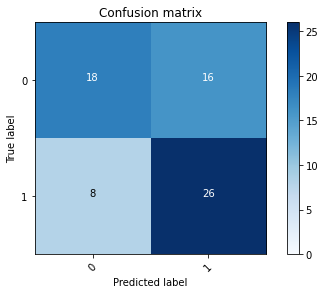

2022-08-03 21:14:56 - [Epoch Train: 121] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:14:56 - [Epoch Valid: 121] loss: 1.9679, auc: 0.7154, acc: 0.6471, time: 7.00 s


 81%|███████████████████████████████▍       | 121/150 [1:00:26<15:39, 32.41s/it]

2022-08-03 21:14:56 - EPOCH: 122
2022-08-03 21:15:01 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:15:05 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:15:08 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:15:12 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:15:16 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:15:20 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:15:23 - Valid Step 5/17, valid_loss: 2.6181
2022-08-03 21:15:24 - Valid Step 10/17, valid_loss: 2.1333
2022-08-03 21:15:27 - Valid Step 15/17, valid_loss: 2.0012
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
6   UPENN-GBM-00092_11_T1w                0           1
32  UPENN-GBM-00093_11_T1w                0           0
17  UPENN-GBM-00094_11_T1w                0           1
61  UPENN-GBM-00115_11_T1w                1           1
62  UPENN-GBM-00117_11_T1w                0           1
50  UPENN-GBM-00128_11_T1w       

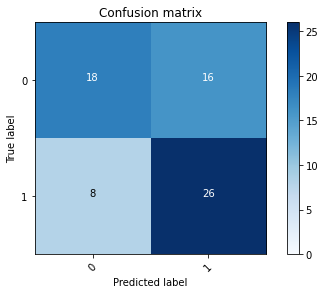

2022-08-03 21:15:28 - [Epoch Train: 122] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:15:28 - [Epoch Valid: 122] loss: 2.0682, auc: 0.7085, acc: 0.6471, time: 7.00 s


 81%|███████████████████████████████▋       | 122/150 [1:00:58<15:00, 32.15s/it]

2022-08-03 21:15:28 - EPOCH: 123
2022-08-03 21:15:32 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:15:36 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:15:40 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:15:44 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:15:48 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:15:52 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:15:54 - Valid Step 5/17, valid_loss: 1.3975
2022-08-03 21:15:56 - Valid Step 10/17, valid_loss: 1.9185
2022-08-03 21:15:58 - Valid Step 15/17, valid_loss: 2.1051
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
23  UPENN-GBM-00092_11_T1w                0           1
21  UPENN-GBM-00093_11_T1w                0           0
48  UPENN-GBM-00094_11_T1w                0           1
50  UPENN-GBM-00115_11_T1w                1           1
24  UPENN-GBM-00117_11_T1w                0           1
34  UPENN-GBM-00128_11_T1w       

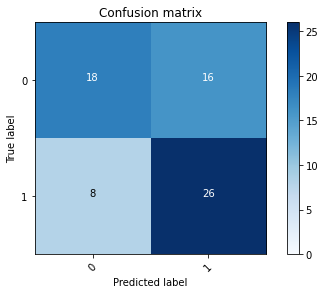

2022-08-03 21:15:59 - [Epoch Train: 123] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:15:59 - [Epoch Valid: 123] loss: 1.9869, auc: 0.7171, acc: 0.6471, time: 7.00 s


 82%|███████████████████████████████▉       | 123/150 [1:01:29<14:22, 31.94s/it]

2022-08-03 21:15:59 - EPOCH: 124
2022-08-03 21:16:04 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:16:07 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:16:11 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:16:15 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:16:19 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:16:23 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:16:26 - Valid Step 5/17, valid_loss: 1.9452
2022-08-03 21:16:27 - Valid Step 10/17, valid_loss: 2.1824
2022-08-03 21:16:30 - Valid Step 15/17, valid_loss: 2.3588
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
54  UPENN-GBM-00092_11_T1w                0           1
36  UPENN-GBM-00093_11_T1w                0           0
37  UPENN-GBM-00094_11_T1w                0           1
13  UPENN-GBM-00115_11_T1w                1           1
40  UPENN-GBM-00117_11_T1w                0           1
23  UPENN-GBM-00128_11_T1w       

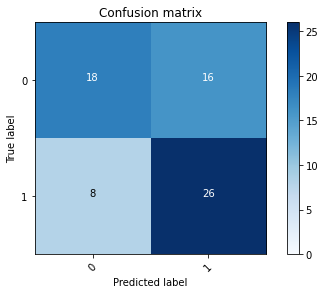

2022-08-03 21:16:31 - [Epoch Train: 124] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:16:31 - [Epoch Valid: 124] loss: 2.1108, auc: 0.7128, acc: 0.6471, time: 7.00 s


 83%|████████████████████████████████▏      | 124/150 [1:02:01<13:47, 31.82s/it]

2022-08-03 21:16:31 - EPOCH: 125
2022-08-03 21:16:35 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:16:39 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:16:43 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:16:47 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:16:51 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:16:55 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:16:58 - Valid Step 5/17, valid_loss: 2.0405
2022-08-03 21:16:59 - Valid Step 10/17, valid_loss: 1.7681
2022-08-03 21:17:02 - Valid Step 15/17, valid_loss: 1.5150
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
25  UPENN-GBM-00092_11_T1w                0           1
49  UPENN-GBM-00093_11_T1w                0           0
57  UPENN-GBM-00094_11_T1w                0           1
28  UPENN-GBM-00115_11_T1w                1           1
61  UPENN-GBM-00117_11_T1w                0           1
29  UPENN-GBM-00128_11_T1w       

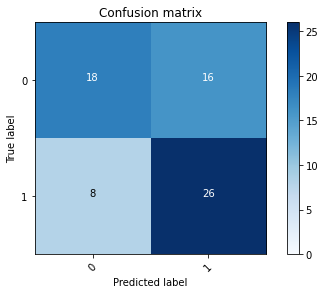

2022-08-03 21:17:03 - [Epoch Train: 125] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:17:03 - [Epoch Valid: 125] loss: 2.0362, auc: 0.7145, acc: 0.6471, time: 7.00 s


 83%|████████████████████████████████▌      | 125/150 [1:02:33<13:17, 31.90s/it]

2022-08-03 21:17:03 - EPOCH: 126
2022-08-03 21:17:07 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:17:11 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:17:15 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:17:19 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:17:22 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:17:26 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:17:29 - Valid Step 5/17, valid_loss: 2.9192
2022-08-03 21:17:31 - Valid Step 10/17, valid_loss: 2.3544
2022-08-03 21:17:33 - Valid Step 15/17, valid_loss: 1.9308
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
50  UPENN-GBM-00092_11_T1w                0           1
3   UPENN-GBM-00093_11_T1w                0           0
23  UPENN-GBM-00094_11_T1w                0           1
34  UPENN-GBM-00115_11_T1w                1           1
45  UPENN-GBM-00117_11_T1w                0           1
40  UPENN-GBM-00128_11_T1w       

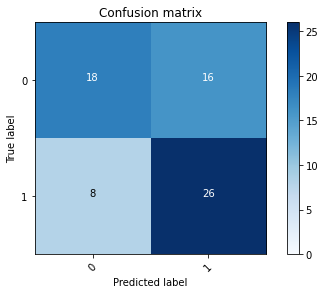

2022-08-03 21:17:34 - [Epoch Train: 126] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:17:34 - [Epoch Valid: 126] loss: 2.0341, auc: 0.7154, acc: 0.6471, time: 7.00 s


 84%|████████████████████████████████▊      | 126/150 [1:03:04<12:39, 31.66s/it]

2022-08-03 21:17:34 - EPOCH: 127
2022-08-03 21:17:38 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:17:42 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:17:46 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:17:50 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:17:54 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:17:58 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:18:01 - Valid Step 5/17, valid_loss: 1.0961
2022-08-03 21:18:02 - Valid Step 10/17, valid_loss: 1.8828
2022-08-03 21:18:05 - Valid Step 15/17, valid_loss: 2.0320
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
49  UPENN-GBM-00092_11_T1w                0           1
43  UPENN-GBM-00093_11_T1w                0           0
12  UPENN-GBM-00094_11_T1w                0           1
45  UPENN-GBM-00115_11_T1w                1           1
57  UPENN-GBM-00117_11_T1w                0           1
6   UPENN-GBM-00128_11_T1w       

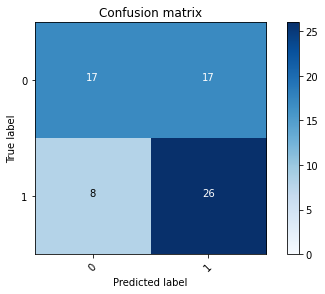

2022-08-03 21:18:06 - [Epoch Train: 127] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:18:06 - [Epoch Valid: 127] loss: 2.0428, auc: 0.7176, acc: 0.6324, time: 7.00 s


 85%|█████████████████████████████████      | 127/150 [1:03:36<12:10, 31.75s/it]

2022-08-03 21:18:06 - EPOCH: 128
2022-08-03 21:18:10 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:18:14 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:18:18 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:18:22 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:18:26 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:18:30 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:18:32 - Valid Step 5/17, valid_loss: 2.7814
2022-08-03 21:18:34 - Valid Step 10/17, valid_loss: 2.3328
2022-08-03 21:18:37 - Valid Step 15/17, valid_loss: 2.0892
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
30  UPENN-GBM-00092_11_T1w                0           1
24  UPENN-GBM-00093_11_T1w                0           0
10  UPENN-GBM-00094_11_T1w                0           1
20  UPENN-GBM-00115_11_T1w                1           1
56  UPENN-GBM-00117_11_T1w                0           1
41  UPENN-GBM-00128_11_T1w       

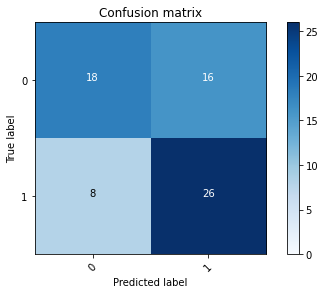

2022-08-03 21:18:38 - [Epoch Train: 128] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:18:38 - [Epoch Valid: 128] loss: 2.1001, auc: 0.7102, acc: 0.6471, time: 7.00 s


 85%|█████████████████████████████████▎     | 128/150 [1:04:07<11:37, 31.72s/it]

2022-08-03 21:18:38 - EPOCH: 129
2022-08-03 21:18:42 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:18:46 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:18:50 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:18:54 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:18:58 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:19:02 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:19:04 - Valid Step 5/17, valid_loss: 2.8527
2022-08-03 21:19:06 - Valid Step 10/17, valid_loss: 2.1744
2022-08-03 21:19:08 - Valid Step 15/17, valid_loss: 2.3195
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
43  UPENN-GBM-00092_11_T1w                0           1
0   UPENN-GBM-00093_11_T1w                0           0
44  UPENN-GBM-00094_11_T1w                0           1
42  UPENN-GBM-00115_11_T1w                1           1
59  UPENN-GBM-00117_11_T1w                0           1
38  UPENN-GBM-00128_11_T1w       

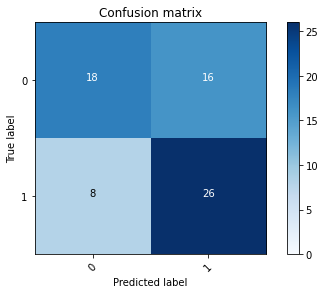

2022-08-03 21:19:09 - [Epoch Train: 129] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:19:09 - [Epoch Valid: 129] loss: 2.1595, auc: 0.7119, acc: 0.6471, time: 7.00 s


 86%|█████████████████████████████████▌     | 129/150 [1:04:39<11:06, 31.74s/it]

2022-08-03 21:19:09 - EPOCH: 130
2022-08-03 21:19:14 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:19:18 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:19:22 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:19:26 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:19:30 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:19:34 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:19:37 - Valid Step 5/17, valid_loss: 2.5131
2022-08-03 21:19:38 - Valid Step 10/17, valid_loss: 2.3445
2022-08-03 21:19:40 - Valid Step 15/17, valid_loss: 1.9709
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
19  UPENN-GBM-00092_11_T1w                0           1
32  UPENN-GBM-00093_11_T1w                0           0
50  UPENN-GBM-00094_11_T1w                0           1
62  UPENN-GBM-00115_11_T1w                1           1
65  UPENN-GBM-00117_11_T1w                0           1
51  UPENN-GBM-00128_11_T1w       

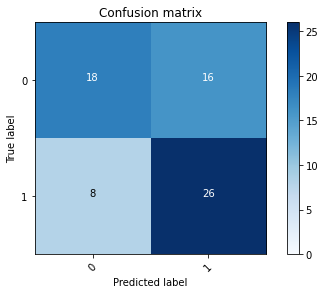

2022-08-03 21:19:41 - [Epoch Train: 130] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:19:41 - [Epoch Valid: 130] loss: 2.1491, auc: 0.7102, acc: 0.6471, time: 7.00 s


 87%|█████████████████████████████████▊     | 130/150 [1:05:11<10:36, 31.83s/it]

2022-08-03 21:19:41 - EPOCH: 131
2022-08-03 21:19:46 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:19:50 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:19:54 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:19:57 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:20:01 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:20:05 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:20:08 - Valid Step 5/17, valid_loss: 1.8434
2022-08-03 21:20:10 - Valid Step 10/17, valid_loss: 2.4024
2022-08-03 21:20:12 - Valid Step 15/17, valid_loss: 1.9500
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
16  UPENN-GBM-00092_11_T1w                0           1
6   UPENN-GBM-00093_11_T1w                0           0
21  UPENN-GBM-00094_11_T1w                0           1
43  UPENN-GBM-00115_11_T1w                1           1
39  UPENN-GBM-00117_11_T1w                0           1
34  UPENN-GBM-00128_11_T1w       

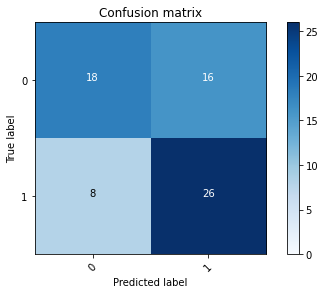

2022-08-03 21:20:13 - [Epoch Train: 131] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:20:13 - [Epoch Valid: 131] loss: 2.1019, auc: 0.7141, acc: 0.6471, time: 7.00 s


 87%|██████████████████████████████████     | 131/150 [1:05:43<10:02, 31.70s/it]

2022-08-03 21:20:13 - EPOCH: 132
2022-08-03 21:20:17 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:20:21 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:20:25 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:20:29 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:20:33 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:20:37 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:20:40 - Valid Step 5/17, valid_loss: 1.9265
2022-08-03 21:20:41 - Valid Step 10/17, valid_loss: 2.3862
2022-08-03 21:20:44 - Valid Step 15/17, valid_loss: 2.1914
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
35  UPENN-GBM-00092_11_T1w                0           1
21  UPENN-GBM-00093_11_T1w                0           0
61  UPENN-GBM-00094_11_T1w                0           1
15  UPENN-GBM-00115_11_T1w                1           1
22  UPENN-GBM-00117_11_T1w                0           1
17  UPENN-GBM-00128_11_T1w       

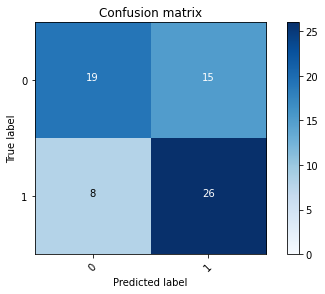

2022-08-03 21:20:45 - [Epoch Train: 132] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:20:45 - [Epoch Valid: 132] loss: 2.0895, auc: 0.7141, acc: 0.6618, time: 7.00 s
2022-08-03 21:20:45 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e132-loss2.089-acc0.662-auc0.714.pth'


 88%|██████████████████████████████████▎    | 132/150 [1:06:15<09:32, 31.83s/it]

2022-08-03 21:20:45 - EPOCH: 133
2022-08-03 21:20:49 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:20:53 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:20:57 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:21:01 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:21:05 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:21:09 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:21:11 - Valid Step 5/17, valid_loss: 3.2577
2022-08-03 21:21:13 - Valid Step 10/17, valid_loss: 2.8432
2022-08-03 21:21:15 - Valid Step 15/17, valid_loss: 2.3041
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
24  UPENN-GBM-00092_11_T1w                0           1
22  UPENN-GBM-00093_11_T1w                0           0
37  UPENN-GBM-00094_11_T1w                0           1
59  UPENN-GBM-00115_11_T1w                1           1
31  UPENN-GBM-00117_11_T1w                0           1
8   UPENN-GBM-00128_11_T1w       

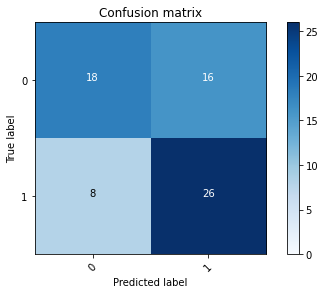

2022-08-03 21:21:16 - [Epoch Train: 133] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:21:16 - [Epoch Valid: 133] loss: 2.1621, auc: 0.7085, acc: 0.6471, time: 7.00 s


 89%|██████████████████████████████████▌    | 133/150 [1:06:46<08:59, 31.73s/it]

2022-08-03 21:21:16 - EPOCH: 134
2022-08-03 21:21:21 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:21:24 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:21:28 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:21:32 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:21:36 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:21:40 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:21:43 - Valid Step 5/17, valid_loss: 1.6923
2022-08-03 21:21:45 - Valid Step 10/17, valid_loss: 1.9504
2022-08-03 21:21:47 - Valid Step 15/17, valid_loss: 2.2394
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
19  UPENN-GBM-00092_11_T1w                0           1
13  UPENN-GBM-00093_11_T1w                0           0
23  UPENN-GBM-00094_11_T1w                0           1
38  UPENN-GBM-00115_11_T1w                1           1
15  UPENN-GBM-00117_11_T1w                0           1
2   UPENN-GBM-00128_11_T1w       

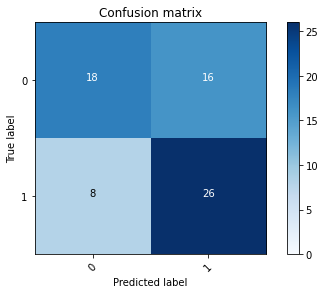

2022-08-03 21:21:48 - [Epoch Train: 134] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:21:48 - [Epoch Valid: 134] loss: 2.0545, auc: 0.7210, acc: 0.6471, time: 7.00 s


 89%|██████████████████████████████████▊    | 134/150 [1:07:18<08:26, 31.69s/it]

2022-08-03 21:21:48 - EPOCH: 135
2022-08-03 21:21:52 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:21:56 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:22:00 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:22:04 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:22:08 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:22:12 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:22:14 - Valid Step 5/17, valid_loss: 2.3588
2022-08-03 21:22:16 - Valid Step 10/17, valid_loss: 1.9378
2022-08-03 21:22:18 - Valid Step 15/17, valid_loss: 2.2623
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
60  UPENN-GBM-00092_11_T1w                0           1
62  UPENN-GBM-00093_11_T1w                0           0
49  UPENN-GBM-00094_11_T1w                0           1
25  UPENN-GBM-00115_11_T1w                1           1
0   UPENN-GBM-00117_11_T1w                0           1
29  UPENN-GBM-00128_11_T1w       

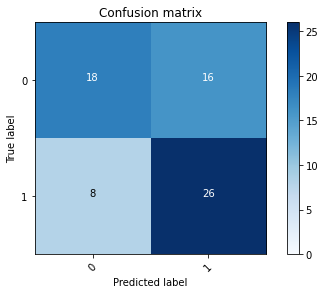

2022-08-03 21:22:19 - [Epoch Train: 135] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:22:19 - [Epoch Valid: 135] loss: 2.1731, auc: 0.7137, acc: 0.6471, time: 7.00 s


 90%|███████████████████████████████████    | 135/150 [1:07:49<07:53, 31.60s/it]

2022-08-03 21:22:19 - EPOCH: 136
2022-08-03 21:22:24 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:22:28 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:22:32 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:22:35 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:22:39 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:22:43 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:22:46 - Valid Step 5/17, valid_loss: 1.5376
2022-08-03 21:22:47 - Valid Step 10/17, valid_loss: 2.2998
2022-08-03 21:22:50 - Valid Step 15/17, valid_loss: 2.0899
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
22  UPENN-GBM-00092_11_T1w                0           1
27  UPENN-GBM-00093_11_T1w                0           0
1   UPENN-GBM-00094_11_T1w                0           1
16  UPENN-GBM-00115_11_T1w                1           1
29  UPENN-GBM-00117_11_T1w                0           1
66  UPENN-GBM-00128_11_T1w       

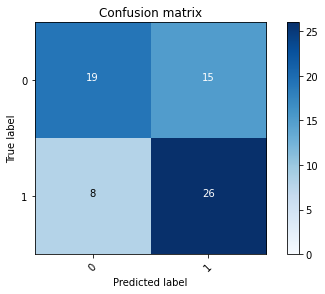

2022-08-03 21:22:51 - [Epoch Train: 136] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:22:51 - [Epoch Valid: 136] loss: 2.0574, auc: 0.7124, acc: 0.6618, time: 7.00 s
2022-08-03 21:22:51 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e136-loss2.057-acc0.662-auc0.712.pth'


 91%|███████████████████████████████████▎   | 136/150 [1:08:21<07:21, 31.55s/it]

2022-08-03 21:22:51 - EPOCH: 137
2022-08-03 21:22:55 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:22:59 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:23:03 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:23:07 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:23:11 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:23:15 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:23:17 - Valid Step 5/17, valid_loss: 1.9145
2022-08-03 21:23:19 - Valid Step 10/17, valid_loss: 1.8461
2022-08-03 21:23:21 - Valid Step 15/17, valid_loss: 2.1601
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
6   UPENN-GBM-00092_11_T1w                0           1
42  UPENN-GBM-00093_11_T1w                0           0
10  UPENN-GBM-00094_11_T1w                0           1
27  UPENN-GBM-00115_11_T1w                1           1
7   UPENN-GBM-00117_11_T1w                0           1
57  UPENN-GBM-00128_11_T1w       

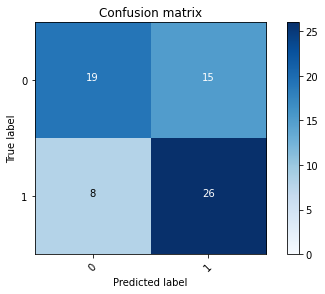

2022-08-03 21:23:22 - [Epoch Train: 137] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:23:22 - [Epoch Valid: 137] loss: 2.1071, auc: 0.7128, acc: 0.6618, time: 7.00 s
2022-08-03 21:23:22 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e137-loss2.107-acc0.662-auc0.713.pth'


 91%|███████████████████████████████████▌   | 137/150 [1:08:52<06:50, 31.58s/it]

2022-08-03 21:23:22 - EPOCH: 138
2022-08-03 21:23:27 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:23:31 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:23:34 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:23:38 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:23:42 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:23:46 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:23:49 - Valid Step 5/17, valid_loss: 2.7099
2022-08-03 21:23:50 - Valid Step 10/17, valid_loss: 2.5668
2022-08-03 21:23:53 - Valid Step 15/17, valid_loss: 2.0617
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
60  UPENN-GBM-00092_11_T1w                0           1
42  UPENN-GBM-00093_11_T1w                0           0
3   UPENN-GBM-00094_11_T1w                0           1
32  UPENN-GBM-00115_11_T1w                1           1
59  UPENN-GBM-00117_11_T1w                0           1
38  UPENN-GBM-00128_11_T1w       

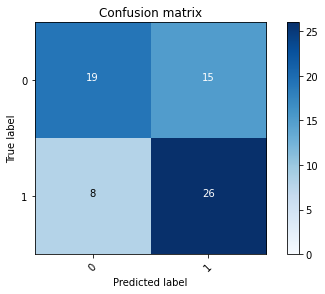

2022-08-03 21:23:54 - [Epoch Train: 138] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:23:54 - [Epoch Valid: 138] loss: 2.0869, auc: 0.7145, acc: 0.6618, time: 7.00 s
2022-08-03 21:23:54 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e138-loss2.087-acc0.662-auc0.715.pth'


 92%|███████████████████████████████████▉   | 138/150 [1:09:24<06:17, 31.45s/it]

2022-08-03 21:23:54 - EPOCH: 139
2022-08-03 21:23:58 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:24:02 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:24:06 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:24:10 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:24:14 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:24:17 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:24:20 - Valid Step 5/17, valid_loss: 1.0764
2022-08-03 21:24:22 - Valid Step 10/17, valid_loss: 1.8644
2022-08-03 21:24:24 - Valid Step 15/17, valid_loss: 2.2755
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
31  UPENN-GBM-00092_11_T1w                0           1
15  UPENN-GBM-00093_11_T1w                0           0
44  UPENN-GBM-00094_11_T1w                0           1
57  UPENN-GBM-00115_11_T1w                1           1
40  UPENN-GBM-00117_11_T1w                0           1
54  UPENN-GBM-00128_11_T1w       

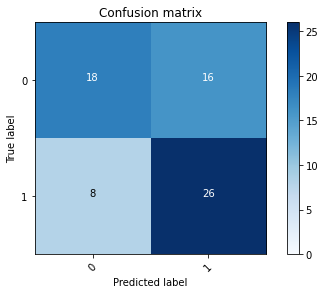

2022-08-03 21:24:25 - [Epoch Train: 139] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:24:25 - [Epoch Valid: 139] loss: 2.2324, auc: 0.7132, acc: 0.6471, time: 7.00 s


 93%|████████████████████████████████████▏  | 139/150 [1:09:55<05:45, 31.43s/it]

2022-08-03 21:24:25 - EPOCH: 140
2022-08-03 21:24:29 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:24:33 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:24:37 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:24:41 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:24:45 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:24:49 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:24:51 - Valid Step 5/17, valid_loss: 1.9504
2022-08-03 21:24:53 - Valid Step 10/17, valid_loss: 2.4013
2022-08-03 21:24:56 - Valid Step 15/17, valid_loss: 2.0311
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
28  UPENN-GBM-00092_11_T1w                0           1
49  UPENN-GBM-00093_11_T1w                0           0
57  UPENN-GBM-00094_11_T1w                0           1
58  UPENN-GBM-00115_11_T1w                1           1
55  UPENN-GBM-00117_11_T1w                0           1
11  UPENN-GBM-00128_11_T1w       

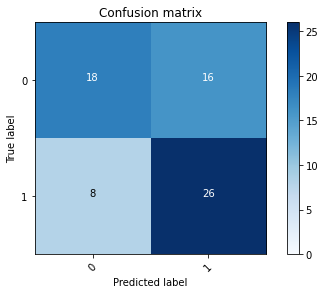

2022-08-03 21:24:57 - [Epoch Train: 140] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:24:57 - [Epoch Valid: 140] loss: 2.1640, auc: 0.7111, acc: 0.6471, time: 7.00 s


 93%|████████████████████████████████████▍  | 140/150 [1:10:27<05:14, 31.48s/it]

2022-08-03 21:24:57 - EPOCH: 141
2022-08-03 21:25:01 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:25:05 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:25:09 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:25:13 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:25:17 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:25:21 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:25:23 - Valid Step 5/17, valid_loss: 2.0131
2022-08-03 21:25:25 - Valid Step 10/17, valid_loss: 1.8430
2022-08-03 21:25:27 - Valid Step 15/17, valid_loss: 2.0511
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
49  UPENN-GBM-00092_11_T1w                0           1
16  UPENN-GBM-00093_11_T1w                0           0
26  UPENN-GBM-00094_11_T1w                0           1
62  UPENN-GBM-00115_11_T1w                1           1
56  UPENN-GBM-00117_11_T1w                0           1
35  UPENN-GBM-00128_11_T1w       

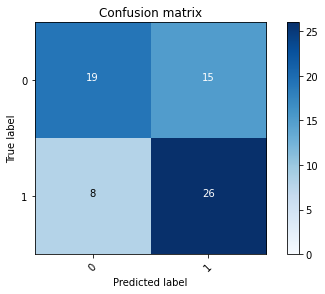

2022-08-03 21:25:28 - [Epoch Train: 141] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:25:28 - [Epoch Valid: 141] loss: 2.0520, auc: 0.7176, acc: 0.6618, time: 7.00 s
2022-08-03 21:25:28 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e141-loss2.052-acc0.662-auc0.718.pth'


 94%|████████████████████████████████████▋  | 141/150 [1:10:58<04:44, 31.60s/it]

2022-08-03 21:25:28 - EPOCH: 142
2022-08-03 21:25:33 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:25:37 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:25:40 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:25:44 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:25:48 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:25:52 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:25:55 - Valid Step 5/17, valid_loss: 1.8879
2022-08-03 21:25:56 - Valid Step 10/17, valid_loss: 1.6826
2022-08-03 21:25:59 - Valid Step 15/17, valid_loss: 2.1396
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
63  UPENN-GBM-00092_11_T1w                0           1
4   UPENN-GBM-00093_11_T1w                0           0
17  UPENN-GBM-00094_11_T1w                0           1
32  UPENN-GBM-00115_11_T1w                1           1
53  UPENN-GBM-00117_11_T1w                0           1
5   UPENN-GBM-00128_11_T1w       

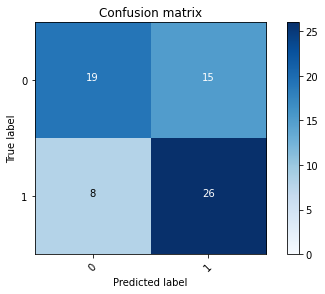

2022-08-03 21:26:00 - [Epoch Train: 142] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:26:00 - [Epoch Valid: 142] loss: 2.1440, auc: 0.7115, acc: 0.6618, time: 7.00 s
2022-08-03 21:26:00 - acc improved from 0.6618 to 0.6618. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e142-loss2.144-acc0.662-auc0.712.pth'


 95%|████████████████████████████████████▉  | 142/150 [1:11:30<04:12, 31.54s/it]

2022-08-03 21:26:00 - EPOCH: 143
2022-08-03 21:26:04 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:26:08 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:26:12 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:26:16 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:26:20 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:26:24 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:26:27 - Valid Step 5/17, valid_loss: 3.2541
2022-08-03 21:26:28 - Valid Step 10/17, valid_loss: 1.9812
2022-08-03 21:26:31 - Valid Step 15/17, valid_loss: 2.1167
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
41  UPENN-GBM-00092_11_T1w                0           1
32  UPENN-GBM-00093_11_T1w                0           0
38  UPENN-GBM-00094_11_T1w                0           1
28  UPENN-GBM-00115_11_T1w                1           1
47  UPENN-GBM-00117_11_T1w                0           1
49  UPENN-GBM-00128_11_T1w       

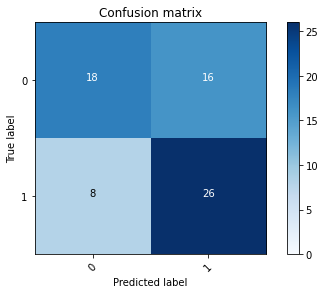

2022-08-03 21:26:32 - [Epoch Train: 143] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:26:32 - [Epoch Valid: 143] loss: 2.1488, auc: 0.7150, acc: 0.6471, time: 7.00 s


 95%|█████████████████████████████████████▏ | 143/150 [1:12:02<03:41, 31.64s/it]

2022-08-03 21:26:32 - EPOCH: 144
2022-08-03 21:26:36 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:26:40 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:26:44 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:26:48 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:26:52 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:26:55 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:26:58 - Valid Step 5/17, valid_loss: 2.9253
2022-08-03 21:27:00 - Valid Step 10/17, valid_loss: 2.7035
2022-08-03 21:27:02 - Valid Step 15/17, valid_loss: 2.3616
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
1   UPENN-GBM-00092_11_T1w                0           1
37  UPENN-GBM-00093_11_T1w                0           0
21  UPENN-GBM-00094_11_T1w                0           1
61  UPENN-GBM-00115_11_T1w                1           1
0   UPENN-GBM-00117_11_T1w                0           1
26  UPENN-GBM-00128_11_T1w       

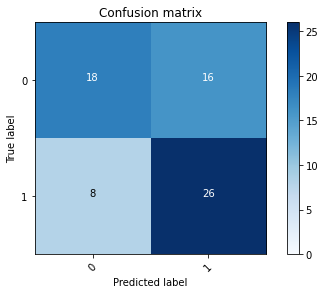

2022-08-03 21:27:03 - [Epoch Train: 144] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:27:03 - [Epoch Valid: 144] loss: 2.2791, auc: 0.7115, acc: 0.6471, time: 7.00 s


 96%|█████████████████████████████████████▍ | 144/150 [1:12:33<03:09, 31.53s/it]

2022-08-03 21:27:03 - EPOCH: 145
2022-08-03 21:27:07 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:27:11 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:27:15 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:27:19 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:27:23 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:27:27 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:27:29 - Valid Step 5/17, valid_loss: 1.0616
2022-08-03 21:27:31 - Valid Step 10/17, valid_loss: 1.0653
2022-08-03 21:27:34 - Valid Step 15/17, valid_loss: 1.8403
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
63  UPENN-GBM-00092_11_T1w                0           1
39  UPENN-GBM-00093_11_T1w                0           0
49  UPENN-GBM-00094_11_T1w                0           1
56  UPENN-GBM-00115_11_T1w                1           1
54  UPENN-GBM-00117_11_T1w                0           1
35  UPENN-GBM-00128_11_T1w       

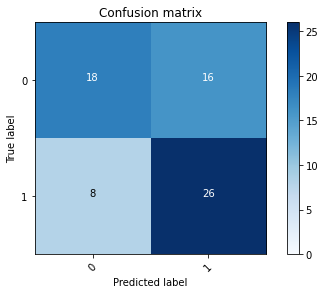

2022-08-03 21:27:35 - [Epoch Train: 145] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:27:35 - [Epoch Valid: 145] loss: 2.1405, auc: 0.7154, acc: 0.6471, time: 7.00 s


 97%|█████████████████████████████████████▋ | 145/150 [1:13:05<02:38, 31.61s/it]

2022-08-03 21:27:35 - EPOCH: 146
2022-08-03 21:27:39 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:27:43 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:27:47 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:27:51 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:27:55 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:27:59 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:28:02 - Valid Step 5/17, valid_loss: 1.7399
2022-08-03 21:28:04 - Valid Step 10/17, valid_loss: 1.9638
2022-08-03 21:28:06 - Valid Step 15/17, valid_loss: 1.9766
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
16  UPENN-GBM-00092_11_T1w                0           1
34  UPENN-GBM-00093_11_T1w                0           0
26  UPENN-GBM-00094_11_T1w                0           1
8   UPENN-GBM-00115_11_T1w                1           1
55  UPENN-GBM-00117_11_T1w                0           1
22  UPENN-GBM-00128_11_T1w       

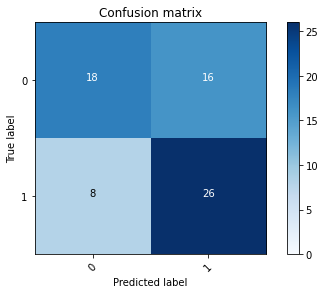

2022-08-03 21:28:07 - [Epoch Train: 146] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:28:07 - [Epoch Valid: 146] loss: 2.2161, auc: 0.7106, acc: 0.6471, time: 7.00 s


 97%|█████████████████████████████████████▉ | 146/150 [1:13:37<02:06, 31.74s/it]

2022-08-03 21:28:07 - EPOCH: 147
2022-08-03 21:28:11 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:28:15 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:28:19 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:28:23 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:28:27 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:28:30 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:28:33 - Valid Step 5/17, valid_loss: 2.1339
2022-08-03 21:28:35 - Valid Step 10/17, valid_loss: 2.0405
2022-08-03 21:28:37 - Valid Step 15/17, valid_loss: 2.1358
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
62  UPENN-GBM-00092_11_T1w                0           1
36  UPENN-GBM-00093_11_T1w                0           0
31  UPENN-GBM-00094_11_T1w                0           1
48  UPENN-GBM-00115_11_T1w                1           1
64  UPENN-GBM-00117_11_T1w                0           1
12  UPENN-GBM-00128_11_T1w       

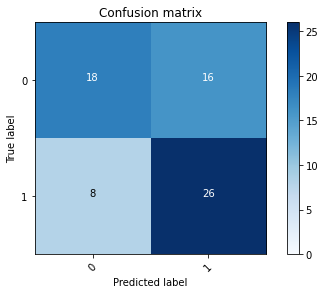

2022-08-03 21:28:38 - [Epoch Train: 147] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:28:38 - [Epoch Valid: 147] loss: 2.1901, auc: 0.7150, acc: 0.6471, time: 7.00 s


 98%|██████████████████████████████████████▏| 147/150 [1:14:08<01:34, 31.61s/it]

2022-08-03 21:28:38 - EPOCH: 148
2022-08-03 21:28:42 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:28:46 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:28:50 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:28:54 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:28:58 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:29:01 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:29:04 - Valid Step 5/17, valid_loss: 1.0490
2022-08-03 21:29:06 - Valid Step 10/17, valid_loss: 1.7330
2022-08-03 21:29:08 - Valid Step 15/17, valid_loss: 2.0541
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
22  UPENN-GBM-00092_11_T1w                0           1
0   UPENN-GBM-00093_11_T1w                0           0
54  UPENN-GBM-00094_11_T1w                0           1
42  UPENN-GBM-00115_11_T1w                1           1
62  UPENN-GBM-00117_11_T1w                0           1
12  UPENN-GBM-00128_11_T1w       

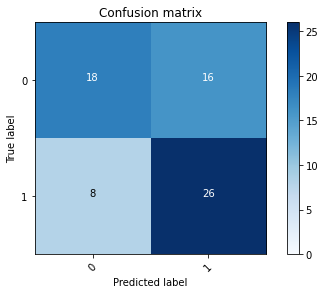

2022-08-03 21:29:09 - [Epoch Train: 148] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 23.00 s            
2022-08-03 21:29:09 - [Epoch Valid: 148] loss: 2.2697, auc: 0.7124, acc: 0.6471, time: 7.00 s


 99%|██████████████████████████████████████▍| 148/150 [1:14:39<01:02, 31.43s/it]

2022-08-03 21:29:09 - EPOCH: 149
2022-08-03 21:29:13 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:29:17 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:29:22 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:29:25 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:29:30 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:29:33 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:29:36 - Valid Step 5/17, valid_loss: 2.0400
2022-08-03 21:29:38 - Valid Step 10/17, valid_loss: 2.3328
2022-08-03 21:29:40 - Valid Step 15/17, valid_loss: 2.3506
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
12  UPENN-GBM-00092_11_T1w                0           1
29  UPENN-GBM-00093_11_T1w                0           0
27  UPENN-GBM-00094_11_T1w                0           1
31  UPENN-GBM-00115_11_T1w                1           1
42  UPENN-GBM-00117_11_T1w                0           1
24  UPENN-GBM-00128_11_T1w       

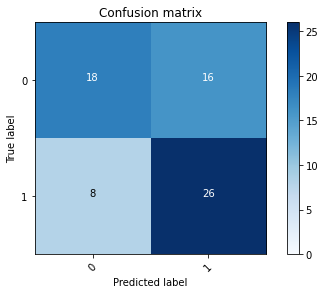

2022-08-03 21:29:41 - [Epoch Train: 149] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:29:41 - [Epoch Valid: 149] loss: 2.3579, auc: 0.7124, acc: 0.6471, time: 7.00 s


 99%|██████████████████████████████████████▋| 149/150 [1:15:11<00:31, 31.64s/it]

2022-08-03 21:29:41 - EPOCH: 150
2022-08-03 21:29:46 - Train Step 10/60, train_loss: 0.0000
2022-08-03 21:29:50 - Train Step 20/60, train_loss: 0.0000
2022-08-03 21:29:53 - Train Step 30/60, train_loss: 0.0000
2022-08-03 21:29:57 - Train Step 40/60, train_loss: 0.0000
2022-08-03 21:30:01 - Train Step 50/60, train_loss: 0.0000
2022-08-03 21:30:05 - Train Step 60/60, train_loss: 0.0000
Adjusting learning rate of group 0 to 5.0000e-05.
2022-08-03 21:30:08 - Valid Step 5/17, valid_loss: 0.5478
2022-08-03 21:30:10 - Valid Step 10/17, valid_loss: 1.5381
2022-08-03 21:30:12 - Valid Step 15/17, valid_loss: 1.9785
First 64 results:
                 BraTS21ID  MGMT_real_value  MGMT_value
34  UPENN-GBM-00092_11_T1w                0           1
41  UPENN-GBM-00093_11_T1w                0           0
66  UPENN-GBM-00094_11_T1w                0           1
3   UPENN-GBM-00115_11_T1w                1           1
23  UPENN-GBM-00117_11_T1w                0           1
44  UPENN-GBM-00128_11_T1w       

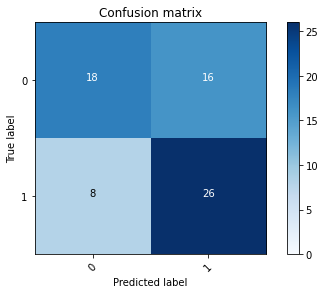

2022-08-03 21:30:13 - [Epoch Train: 150] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 24.00 s            
2022-08-03 21:30:13 - [Epoch Valid: 150] loss: 2.1838, auc: 0.7102, acc: 0.6471, time: 7.00 s


100%|███████████████████████████████████████| 150/150 [1:15:43<00:00, 30.29s/it]


In [24]:
print(info)
m_modelfile = train_mri_type(m_model, device, info, epochs=150, pat=30, 
                       train_loader=train_loader, valid_loader=val_loader)
##m_modelfile = train_mri_type(m_model, device, info, epochs=150, pat=30, 
##                       train_loader=m_train_loader, valid_loader=m_val_loader)

#m_modelfile = train_mri_type(m_model, device, info, epochs=150, pat=30, 
#                       train_loader=n_train_loader, valid_loader=n_val_loader)

In [11]:
print(m_modelfile)

../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug05_17-47-49/RSNAClassifierSingle3D-DW-SO-KLF-e6-loss0.449-acc0.852-auc0.902.pth


2022-07-10 21:37:55 - Predict: ../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Jul10_20-59-21/RSNAClassifierSingle3D-DW-SO-KLF-e4-loss1.238-acc0.550-auc0.591.pth 340
Dataset: Labeled Test Set
             BraTS21ID  MGMT_real_value  MGMT_value
18  UPENN-GBM-00131_11                1           0
27  UPENN-GBM-00133_11                0           0
0   UPENN-GBM-00136_11                0           0
12  UPENN-GBM-00143_11                0           0
28  UPENN-GBM-00148_21                0           0
9   UPENN-GBM-00260_11                1           0
32  UPENN-GBM-00302_11                1           0
6   UPENN-GBM-00350_11                1           1
13  UPENN-GBM-00354_11                0           0
23  UPENN-GBM-00413_11                0           1
14  UPENN-GBM-00430_11                1           1
7   UPENN-GBM-00445_11                1           1
31  UPENN-GBM-00457_11                0           1
10  UPENN-GBM-00461_11                1           0
26  UPENN-G

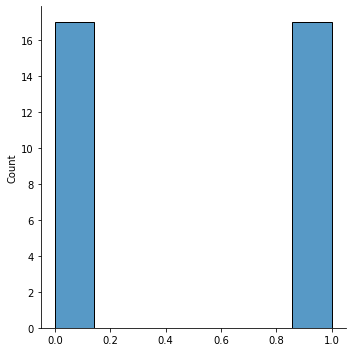

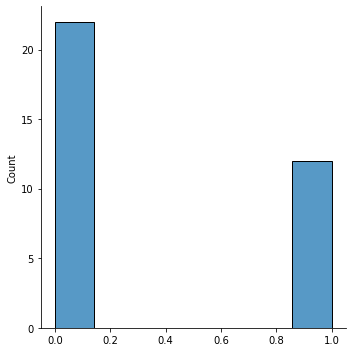

In [13]:
# C+N
#cn_test_pred, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, n_test_loader, size)

In [42]:
print(cc_test_pred)

2022-07-08 23:24:15 - Predict: ../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Jul08_22-51-18/RSNAClassifierSingle3D-DW-SO-e19-loss1.062-acc0.706-auc0.789.pth 606
Dataset: Labeled Test Set
   BraTS21ID  MGMT_real_value  MGMT_value
15     00022                0           1
12     00030                0           1
46     00031                1           1
27     00032                0           0
34     00035                1           1
8      00068                1           1
20     00077                1           0
13     00085                1           1
9      00096                1           1
38     00110                0           0
31     00124                0           1
18     00165                0           1
28     00206                0           0
19     00216                0           0
44     00234                1           1
6      00254                1           1
17     00258                0           1
54     00270                1           1


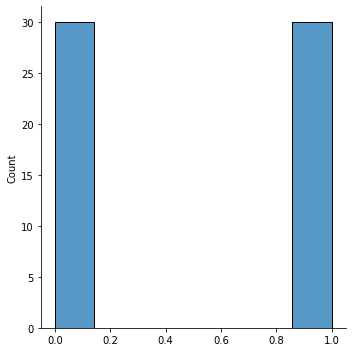

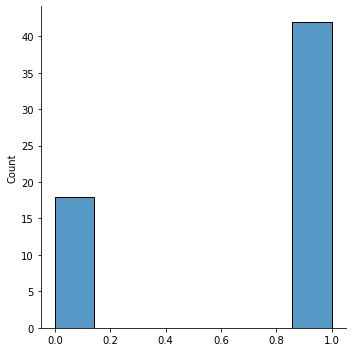

In [43]:
# N+C
nc_test_pred, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, m_test_loader, size)

In [7]:
from sklearn.metrics import roc_auc_score
def plot_confusion_matrix(y_valid, y_pred,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    cm = confusion_matrix(y_valid, y_pred)
    classes = ["0", "1"]

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.clim(0,cm.max())
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = (cm.max() - cm.min()) / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

2022-08-02 21:45:31 - Predict: ../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Aug02_18-42-47/RSNAClassifierSingle3D-DW-SO-KLF-e65-loss1.880-acc0.757-auc0.848.pth 1092
Dataset: Labeled Test Set
              BraTS21ID  MGMT_real_value  MGMT_value
91                00043                1           1
56                00053                0           0
80                00063                1           1
81                00064                0           1
76                00066                1           0
78                00072                0           0
34                00090                0           0
83                00133                0           0
52                00140                1           1
49                00150                0           0
103               00154                0           0
16                00166                1           0
92                00167                0           0
54                00183                0       

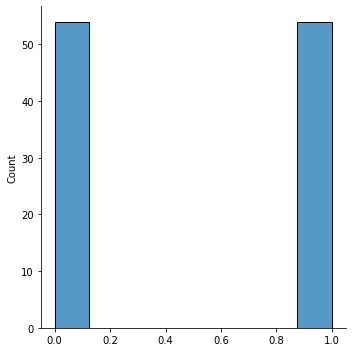

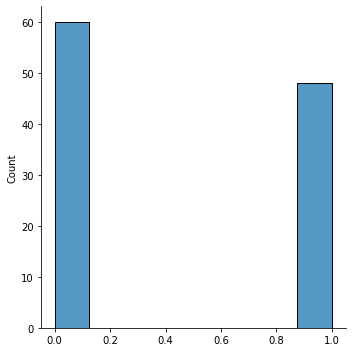

In [228]:
#m_old_modelfile = "../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Jul07_16-02-56/RSNAClassifierSingle3D-DW-SO-KLF-e59-loss2.968-acc0.617-auc0.553.pth"
#m_old_modelfile = "../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF_Jul07_17-25-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-e137-loss2.965-acc0.675-auc0.667.pth"
#m_old_modelfile = "../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Jan27_10-46-07/RSNAClassifierSingle3D-DW-SO-e13-loss0.012-acc1.000-auc1.000.pth"
#m_old_modelfile = "../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Jan27_19-25-03/RSNAClassifierSingle3D-DW-SO-KLF-e65-loss0.004-acc1.000-auc1.000.pth"
#m_modelfile = "../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Jul10_20-59-21/RSNAClassifierSingle3D-DW-SO-KLF-e4-loss1.238-acc0.550-auc0.591.pth"
# C+N
#cn_test_pred, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, n_test_loader, size)
#cn_test_pred_f, X_f, y_f, y_pred_f, y_prob_f = predict(m_model, device, m_modelfile, loader_packs['FLAIR']['n_dataloaders'][2], size)
# C+C
test_loader = fn_test_loader
cc_test_pred, ids, X, y, y_pred, y_prob = classifier_utils.predict(m_model, device, m_modelfile, test_loader, size)

2022-08-03 21:30:37 - Predict: ../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Aug03_20-14-30/RSNAClassifierSingle3D-DW-SO-e142-loss2.144-acc0.662-auc0.712.pth 340
Dataset: Labeled Test Set
             BraTS21ID  MGMT_real_value  MGMT_value
4   UPENN-GBM-00131_11                1           0
26  UPENN-GBM-00131_11                1           0
8   UPENN-GBM-00133_11                0           0
1   UPENN-GBM-00136_11                0           0
21  UPENN-GBM-00143_11                0           0
27  UPENN-GBM-00148_21                0           0
9   UPENN-GBM-00260_11                1           1
11  UPENN-GBM-00302_11                1           1
19  UPENN-GBM-00350_11                1           0
13  UPENN-GBM-00350_11                1           0
20  UPENN-GBM-00354_11                0           1
24  UPENN-GBM-00413_11                0           0
22  UPENN-GBM-00445_11                1           1
6   UPENN-GBM-00457_11                0           0
3   UPENN-GBM-004

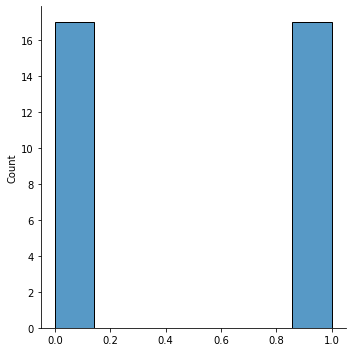

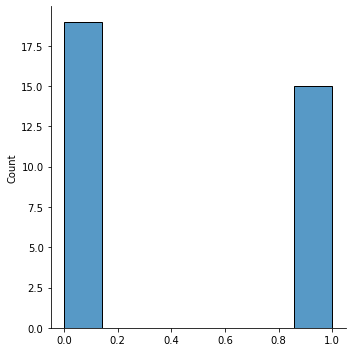

In [26]:
test_loader = n_test_loader
cc_test_pred, ids, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, test_loader, size)

2022-08-02 22:01:13 - Predict: ../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF_Jan27_19-25-03/RSNAClassifierSingle3D-DW-SO-KLF-e65-loss0.004-acc1.000-auc1.000.pth 606
Dataset: Labeled Test Set
   BraTS21ID  MGMT_real_value  MGMT_value
13     00002                1           0
54     00005                1           0
29     00026                1           1
4      00043                1           0
37     00064                0           0
12     00090                0           1
5      00106                1           1
40     00111                0           0
47     00138                1           1
38     00142                0           0
2      00160                1           0
0      00167                0           1
1      00217                0           0
3      00230                1           0
21     00238                0           0
46     00239                0           0
56     00242                0           0
11     00275                0     

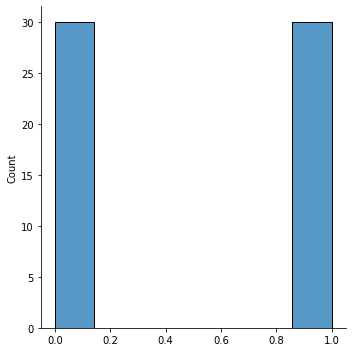

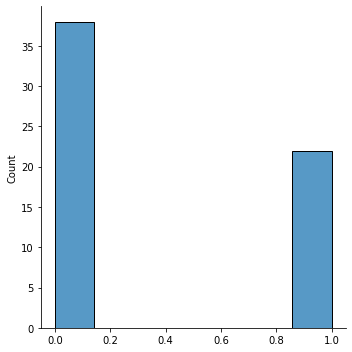

In [234]:
import importlib
importlib.reload(classifier_utils)

test_loader = m_test_loader
cc_test_pred, ids, X, y, y_pred, y_prob = classifier_utils.predict(m_model, device, m_modelfile, test_loader, size)

In [215]:
#test_loader = h_test_loader
#cc_test_pred, ids, X, y, y_pred, y_prob = classifier_utils.predict(m_model, device, m_modelfile, test_loader, size)

0.7300000000000001
Best Threshold: 0.9312999844551086 with G-Mean: 0.7333
FPR: 0.2667, TPR: 0.7333


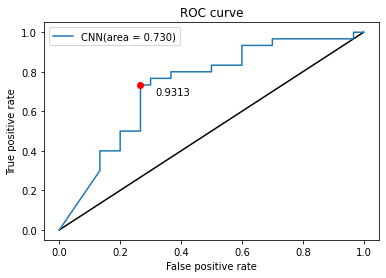

<Figure size 432x288 with 0 Axes>

In [192]:
#plot_confusion_matrix(y, y_pred)
auc = roc_auc_score(y, y_prob)
print(auc)
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y, y_prob)

# Calculate the G-mean
gmean = np.sqrt(tpr * (1 - fpr))

# Find the optimal threshold
index = np.argmax(gmean)
thresholdOpt = round(thresholds[index], ndigits = 4)
gmeanOpt = round(gmean[index], ndigits = 4)
fprOpt = round(fpr[index], ndigits = 4)
tprOpt = round(tpr[index], ndigits = 4)
print('Best Threshold: {} with G-Mean: {}'.format(thresholdOpt, gmeanOpt))
print('FPR: {}, TPR: {}'.format(fprOpt, tprOpt))

plt.figure(1)
plt.plot([0, 1], [0, 1], 'k-')
plt.plot(fpr, tpr, label='CNN(area = {:.3f})'.format(auc))
plt.plot(fprOpt, tprOpt, 'ro')
plt.text(fprOpt+0.05,tprOpt-0.05,thresholdOpt)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()
plt.savefig("/home/salvatorecapuozzo/Scrivania/ROC_curve_m.png")

In [190]:
for i in range(1,10):
    j = 0.1*i
    y_pred_new = (np.array(y_prob) > j).astype(int)
    print(f"{j:.1f}")
    #print(y_pred)
    acc = [1 if yy == out else 0 for (yy,out) in zip(y,y_pred_new)].count(1)/len(y_pred_new)
    total_0_count = y.count(0)
    total_1_count = y.count(1)
    total_1_pred_count = list(y_pred_new).count(1)
    true_0 = [1 if yy == out and yy == 0 else 0 for (yy,out) in zip(y,y_pred_new)].count(1)
    true_1 = [1 if yy == out and yy == 1 else 0 for (yy,out) in zip(y,y_pred_new)].count(1)
    spec = true_0/total_0_count
    sens = true_1/total_1_count
    if total_1_pred_count != 0:
        prec = true_1/total_1_pred_count
    else:
        prec = 0
    print(f"Prediction Accuracy: {acc:.4f}")
    print(f"Prediction Specificity: {spec:.4f}")
    print(f"Prediction Sensitivity: {sens:.4f}")
    print(f"Prediction Precision: {prec:.4f}")

0.1
Prediction Accuracy: 0.8269
Prediction Specificity: 0.7037
Prediction Sensitivity: 0.9600
Prediction Precision: 0.7500
0.2
Prediction Accuracy: 0.8077
Prediction Specificity: 0.7037
Prediction Sensitivity: 0.9200
Prediction Precision: 0.7419
0.3
Prediction Accuracy: 0.8269
Prediction Specificity: 0.7407
Prediction Sensitivity: 0.9200
Prediction Precision: 0.7667
0.4
Prediction Accuracy: 0.8269
Prediction Specificity: 0.7407
Prediction Sensitivity: 0.9200
Prediction Precision: 0.7667
0.5
Prediction Accuracy: 0.8269
Prediction Specificity: 0.7407
Prediction Sensitivity: 0.9200
Prediction Precision: 0.7667
0.6
Prediction Accuracy: 0.7500
Prediction Specificity: 0.8148
Prediction Sensitivity: 0.6800
Prediction Precision: 0.7727
0.7
Prediction Accuracy: 0.7692
Prediction Specificity: 0.8519
Prediction Sensitivity: 0.6800
Prediction Precision: 0.8095
0.8
Prediction Accuracy: 0.7885
Prediction Specificity: 0.8889
Prediction Sensitivity: 0.6800
Prediction Precision: 0.8500
0.9
Prediction A

In [4]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
import sys
from PIL import Image
import json
import numpy as np
from captum.attr import IntegratedGradients
from matplotlib.colors import LinearSegmentedColormap
from captum.attr import GuidedGradCam, LayerGradCam, LayerAttribution
from captum.attr import visualization as viz
from captum.attr import Occlusion
import matplotlib.pyplot as plt

Bad pipe message: %s [b'\xfc\x12\xb4\xa4\x8eZ\xae\xb1\x16\xcc\xe0\x15!m\x1bk\xb9\xd9 H\xef\x0b?4\xf0']
Bad pipe message: %s [b'oF\xe6y\x80\xee\xfd\xa2\xa1t\xa0\x8d(\x0c?\x07\xebEB\x01\xe3;_.\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t', b'7.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00']
Bad pipe message: %s [b'\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01']
Bad pipe message: %s [b'\xa6\xc4#]nd\x1b\x1c\xc8o\xdb\x06\x88|c\x07Mw \x07d\x06\x07\x84X\x03\x98\x850\xcd\x19\x07]\xbc\x9d\xf9\x8d\x9b\xaa1^/\x0bH\xa3\xe8N\x1f\x0f\x1b\xb0\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00']
Bad pipe message: %s [b'\x00\t127.0.0.1']
Bad pipe message: %s [b")yo\x9d\x8a\x93\xe0S\xf5\xd4\xb4\x86\x0e#&\xa5\xece\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\

In [168]:

%matplotlib inline

list_tumor = [18, 19, 21, 22, 30, 36, 53, 64, 72, 84, 88, 90, 95, 97, 99, 116, 121, 122, 124, 130, 133, 142, 150, 
             154, 157, 158, 165, 167, 169, 172, 176, 183, 184, 191, 192, 194, 195, 201, 206, 209, 211, 214, 216, 
             221, 231, 237, 238, 239, 242, 247, 249, 259, 261, 266, 267, 283, 289, 290, 297, 300, 301, 309, 310, 
             312, 316, 320, 324, 325, 327, 336, 347, 351, 356, 373, 382, 388, 391, 392, 395, 397, 399, 401, 402, 
             414, 417, 421, 430, 433, 445, 446, 452, 455, 477, 481, 495, 498, 512, 538, 563, 565, 568, 569, 587, 
             588, 589, 591, 596, 601, 605, 616, 641, 649, 651, 654, 663, 668, 682, 683, 685, 686, 687, 706, 724, 
             727, 730, 733, 742, 747, 751, 756, 759, 764, 767, 774, 780, 792, 796, 797, 800, 803, 804, 810, 814, 
             818, 830, 1004, 1009]

tumor_y = []

test_origin = "m" #n

if test_origin == "m":
    for elem in ids:
        val = cc_test_pred.loc[cc_test_pred["BraTS21ID"]==elem]["MGMT_real_value"]
        if val.values[0] == 1 or int(elem[:5]) in list_tumor:
            tumor_y.append(1)
        else:
            tumor_y.append(0)
else:
    for elem in ids:
        tumor_y.append(1)

#print(cc_test_pred)
print(len(X))
print("Ids:")
print(list(ids))
print("Predictions:")
print(y_pred)
print("Real:")
print(y)
print("Probabilities:")
print(y_prob)
print("Tumors:")
print(tumor_y)

sel_idx = 19 #54,27,17,2
pred = y_pred[sel_idx]
real = y[sel_idx]
prob = y_prob[sel_idx]
tumor = tumor_y[sel_idx]

#print(X[sel_idx].shape)
#img_test = X[sel_idx].unsqueeze(0)
#print(img_test.shape)
#print("Methylation pred value: "+str(pred))
#print("Methylation real value: "+str(real))
#print("Methylation prob value: "+str(prob))
#print("Tumor real value: "+str(tumor))

Ids:
['UPENN-GBM-00442_11', 'UPENN-GBM-00260_11', 'UPENN-GBM-00344_11', 'UPENN-GBM-00430_11', 'UPENN-GBM-00605_11', 'UPENN-GBM-00183_21', 'UPENN-GBM-00596_11', 'UPENN-GBM-00522_11', 'UPENN-GBM-00409_11', 'UPENN-GBM-00377_11', 'UPENN-GBM-00120_11', 'UPENN-GBM-00425_11', 'UPENN-GBM-00447_11', 'UPENN-GBM-00379_11', 'UPENN-GBM-00287_11', 'UPENN-GBM-00411_11', 'UPENN-GBM-00616_21', 'UPENN-GBM-00093_21', 'UPENN-GBM-00534_11', 'UPENN-GBM-00461_11', 'UPENN-GBM-00413_11', 'UPENN-GBM-00518_11', 'UPENN-GBM-00566_11', 'UPENN-GBM-00546_11', 'UPENN-GBM-00350_11', 'UPENN-GBM-00539_11', 'UPENN-GBM-00426_11', 'UPENN-GBM-00629_21', 'UPENN-GBM-00463_11', 'UPENN-GBM-00134_11', 'UPENN-GBM-00554_11', 'UPENN-GBM-00630_21', 'UPENN-GBM-00612_21', 'UPENN-GBM-00519_11', 'UPENN-GBM-00549_11', 'UPENN-GBM-00563_11', 'UPENN-GBM-00401_11', 'UPENN-GBM-00375_11', 'UPENN-GBM-00140_21', 'UPENN-GBM-00575_11', 'UPENN-GBM-00393_11', 'UPENN-GBM-00565_11', 'UPENN-GBM-00310_11', 'UPENN-GBM-00454_11', 'UPENN-GBM-00579_11', 'UPE

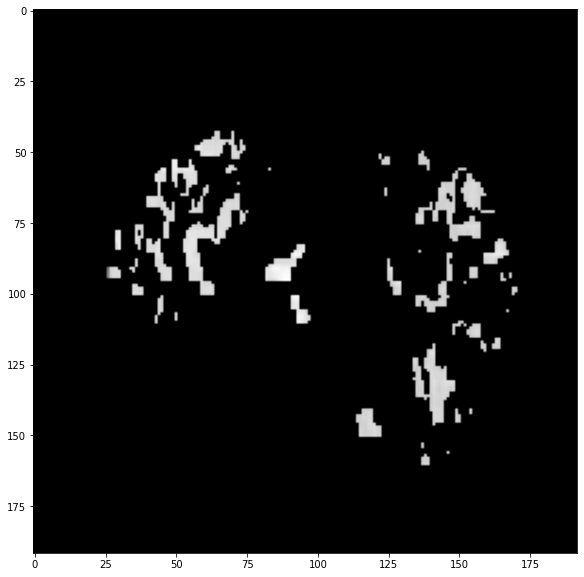

In [99]:
%matplotlib inline
if chosen_net == "sim":
    if selected_type == "KLF":
        orig = img_test.squeeze().cpu().detach().numpy().transpose(1,2,0)
    else:
        orig = img_test.squeeze().cpu().detach().numpy()
else:
    orig = img_test.squeeze().cpu().detach().numpy().transpose(1,0)
    
if chosen_net == "sim":
    slice_num = 96
    fig, axs = plt.subplots(1,1,figsize = (10,10))
    axs.imshow(orig[slice_num,:,:], cmap=cm.Greys_r)
    plt.show()
else:
    fig, axs = plt.subplots(1,1,figsize = (10,10))
    axs.imshow(orig, cmap=cm.Greys_r)
    plt.show()

Idx: UPENN-GBM-00442_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.999734
Tumor real value: 1


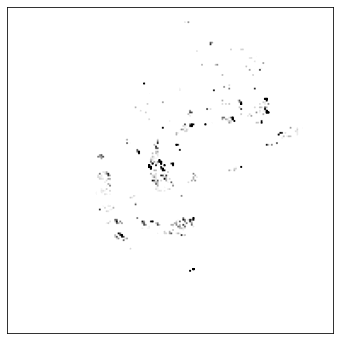

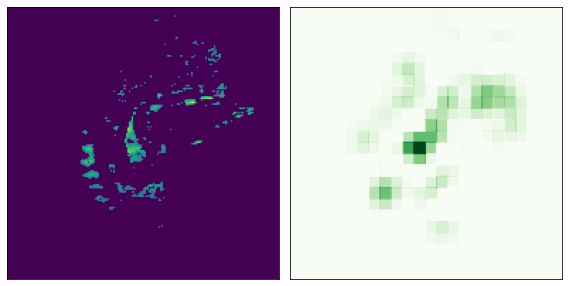

Idx: UPENN-GBM-00260_11
Methylation pred value: 0
Methylation real value: 1
Methylation prob value: 0.19126083
Tumor real value: 1


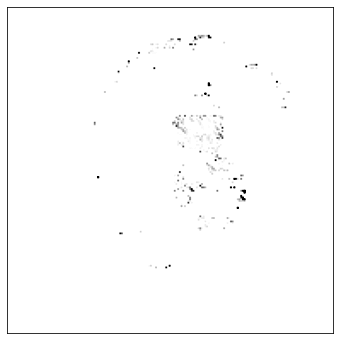

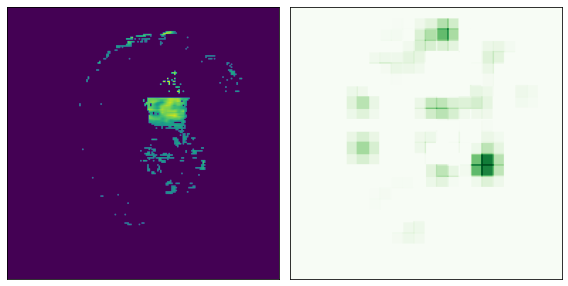

Idx: UPENN-GBM-00344_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.99988127
Tumor real value: 1


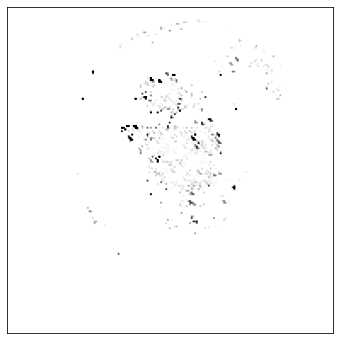

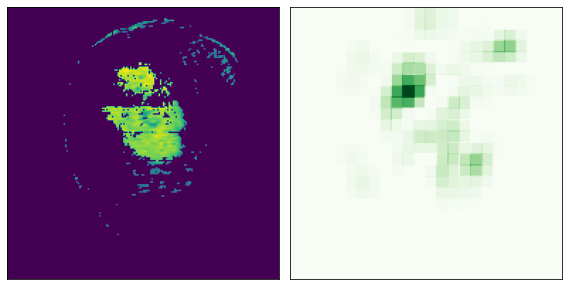

Idx: UPENN-GBM-00430_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.99953735
Tumor real value: 1


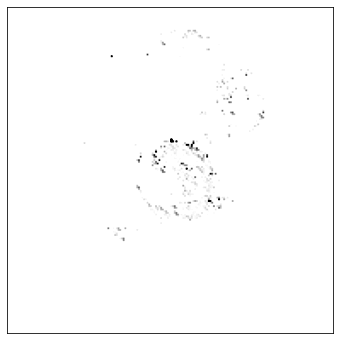

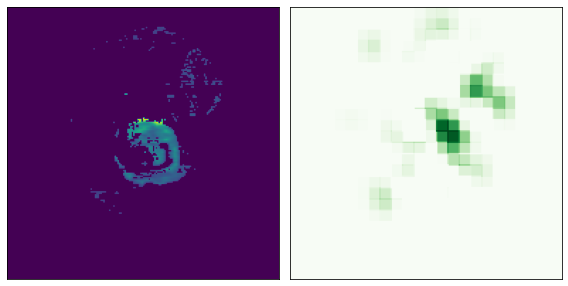

Idx: UPENN-GBM-00605_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.050682314
Tumor real value: 1


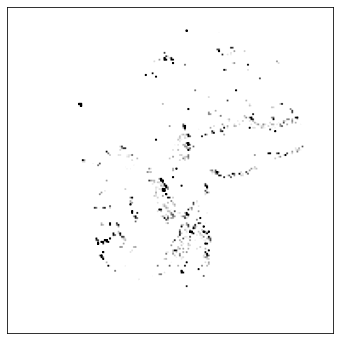

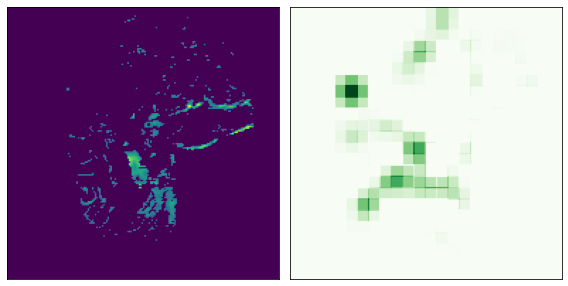

Idx: UPENN-GBM-00183_21
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.99894756
Tumor real value: 1


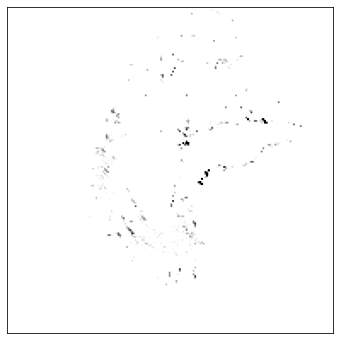

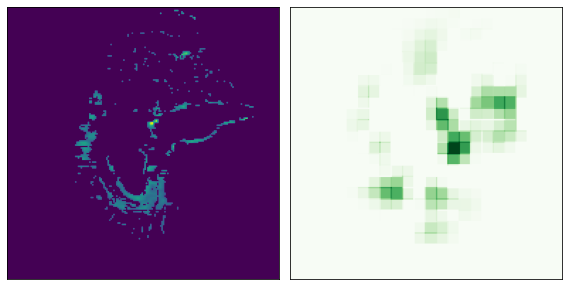

Idx: UPENN-GBM-00596_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.024481002
Tumor real value: 1


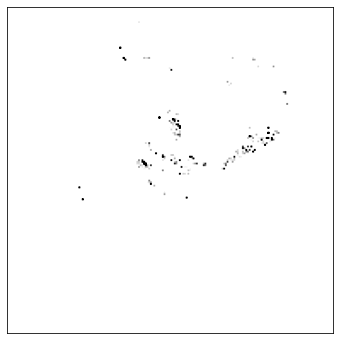

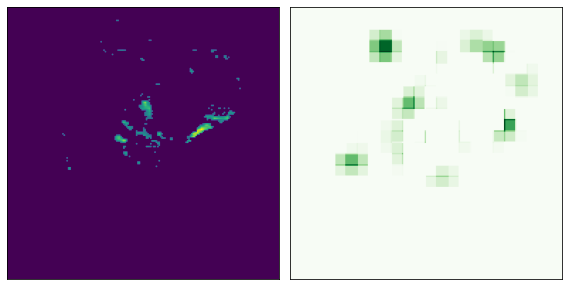

Idx: UPENN-GBM-00522_11
Methylation pred value: 1
Methylation real value: 0
Methylation prob value: 0.6527679
Tumor real value: 1


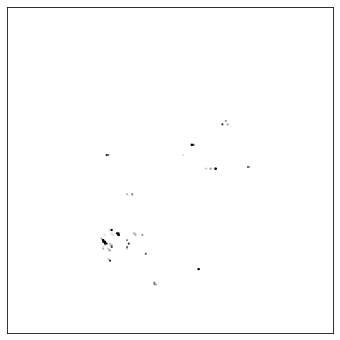

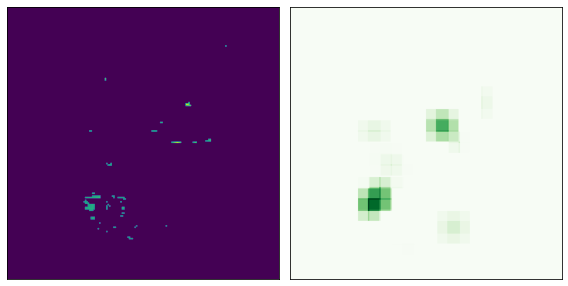

Idx: UPENN-GBM-00409_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.94339055
Tumor real value: 1


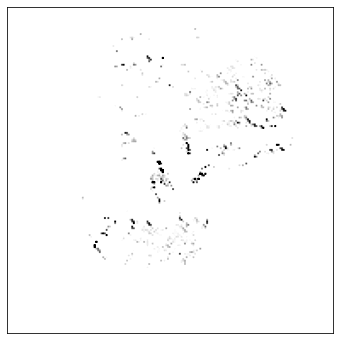

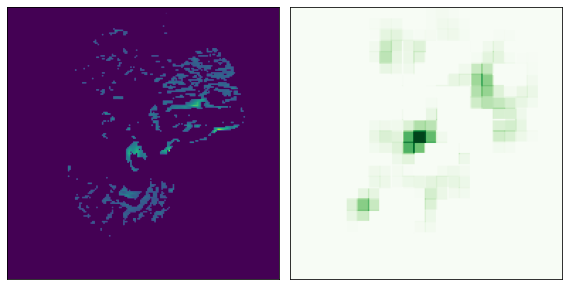

Idx: UPENN-GBM-00377_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 1.0
Tumor real value: 1


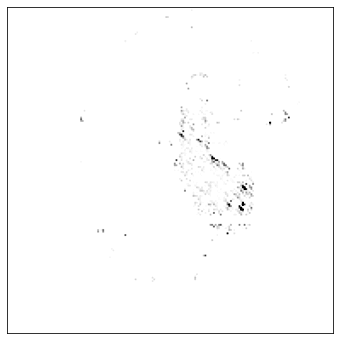

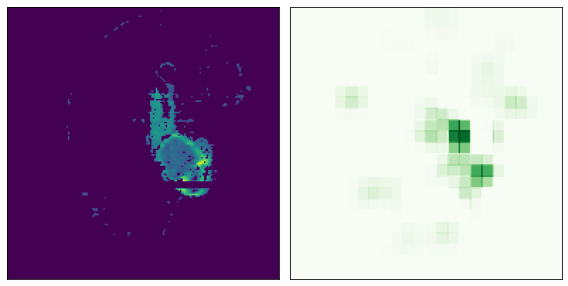

Idx: UPENN-GBM-00120_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 1.2766598e-12
Tumor real value: 1


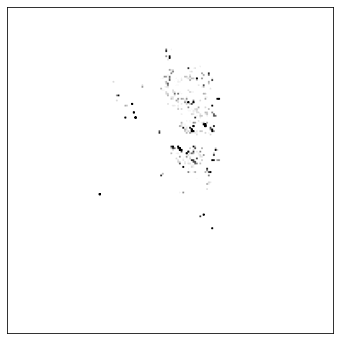

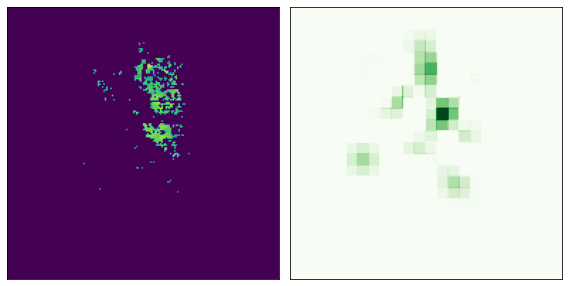

Idx: UPENN-GBM-00425_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.9999887
Tumor real value: 1


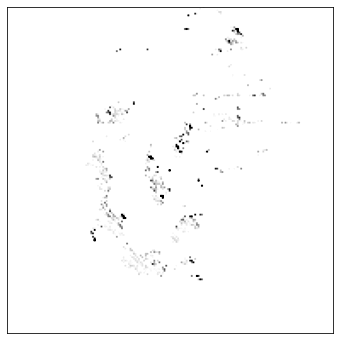

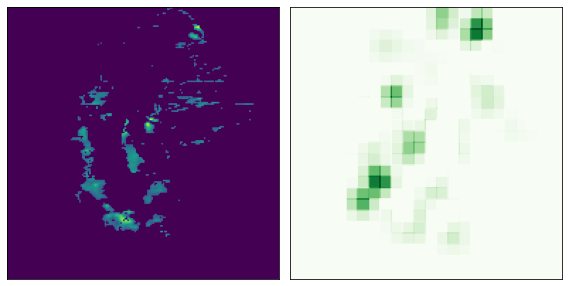

Idx: UPENN-GBM-00447_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.010958192
Tumor real value: 1


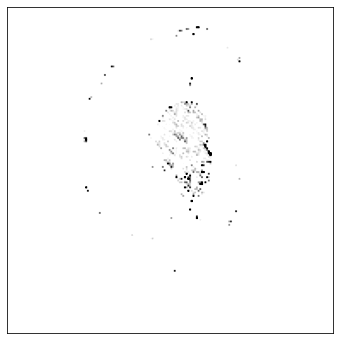

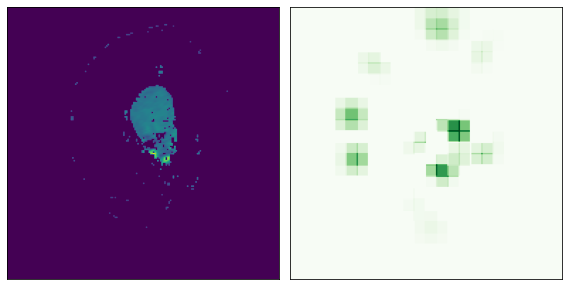

Idx: UPENN-GBM-00379_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 8.8960136e-05
Tumor real value: 1


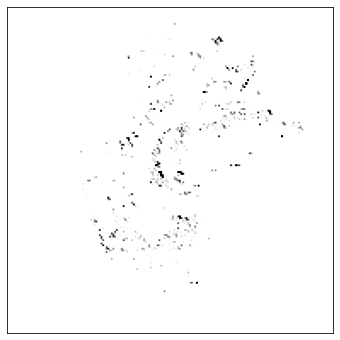

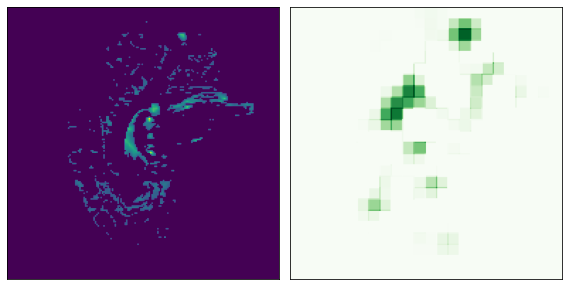

Idx: UPENN-GBM-00287_11
Methylation pred value: 0
Methylation real value: 1
Methylation prob value: 0.5702977
Tumor real value: 1


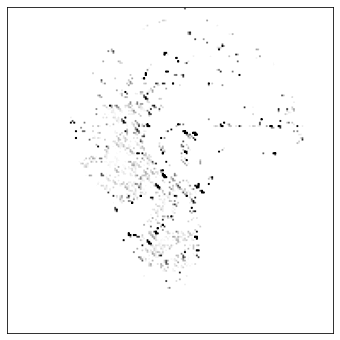

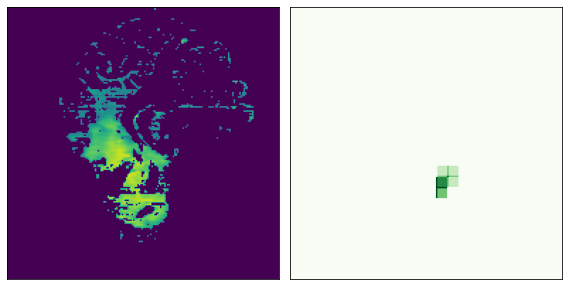

Idx: UPENN-GBM-00411_11
Methylation pred value: 1
Methylation real value: 0
Methylation prob value: 0.8547846
Tumor real value: 1


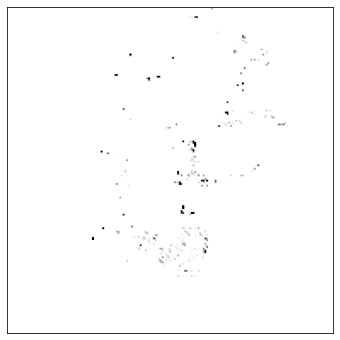

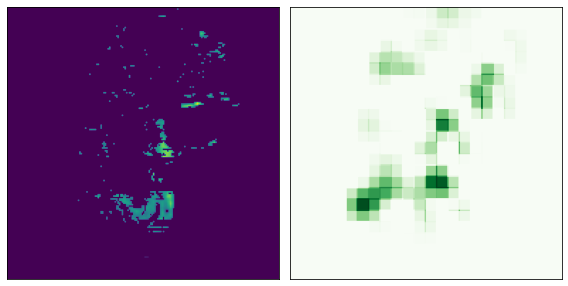

Idx: UPENN-GBM-00616_21
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.22017574
Tumor real value: 1


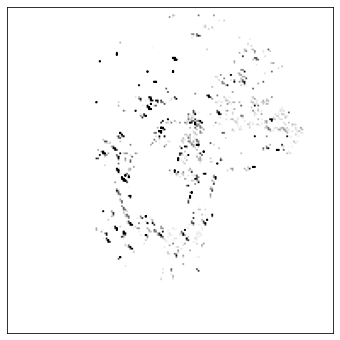

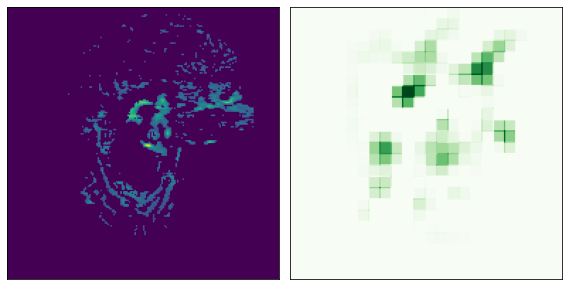

Idx: UPENN-GBM-00093_21
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.00016761056
Tumor real value: 1


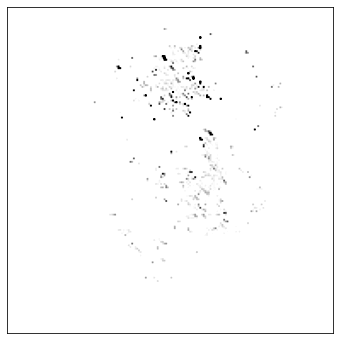

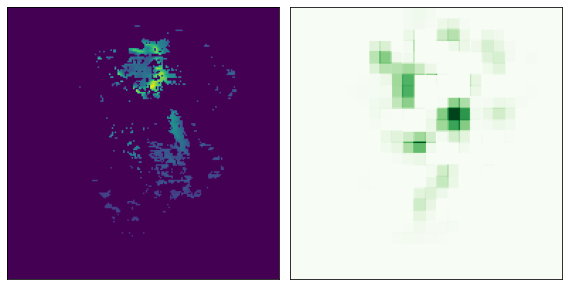

Idx: UPENN-GBM-00534_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.9985561
Tumor real value: 1


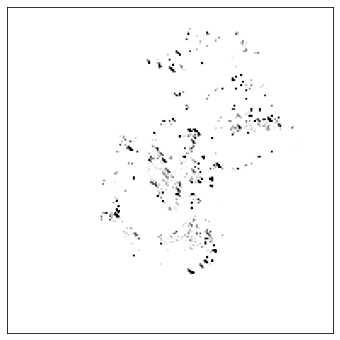

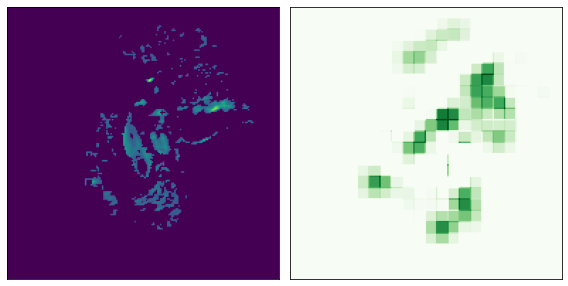

Idx: UPENN-GBM-00461_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.9417229
Tumor real value: 1


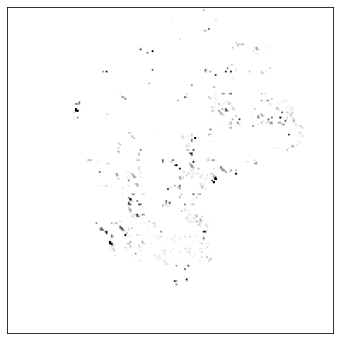

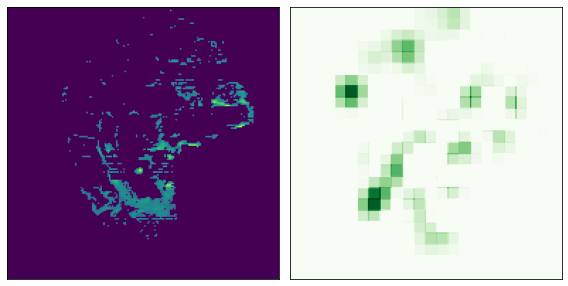

Idx: UPENN-GBM-00413_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.08524597
Tumor real value: 1


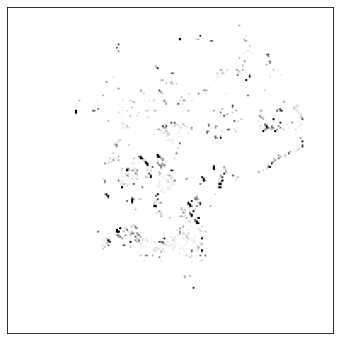

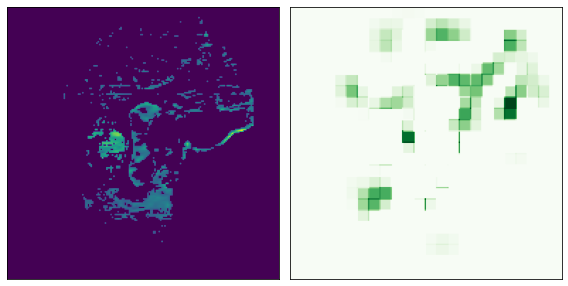

Idx: UPENN-GBM-00518_11
Methylation pred value: 0
Methylation real value: 1
Methylation prob value: 0.5702977
Tumor real value: 1


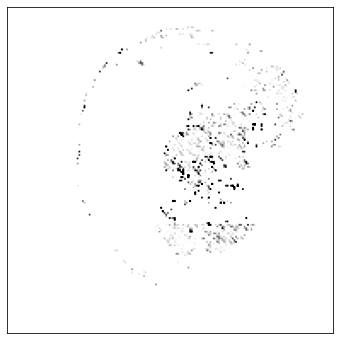

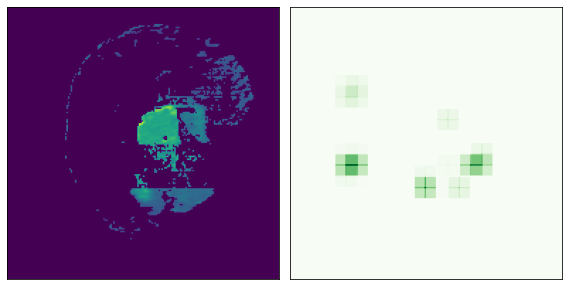

Idx: UPENN-GBM-00566_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.99516857
Tumor real value: 1


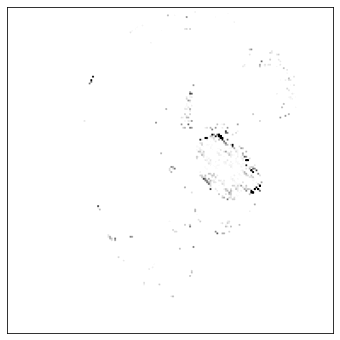

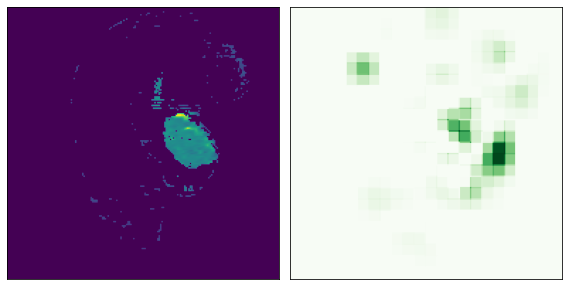

Idx: UPENN-GBM-00546_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.9972709
Tumor real value: 1


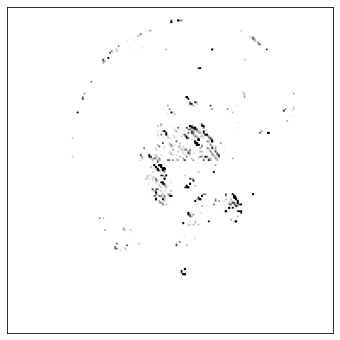

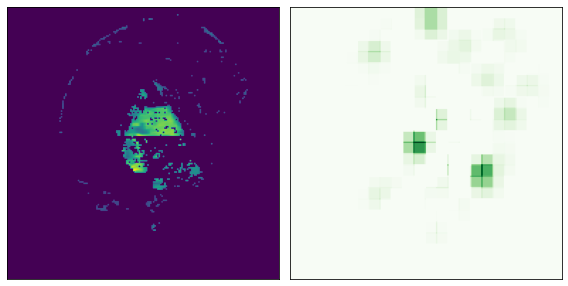

Idx: UPENN-GBM-00350_11
Methylation pred value: 0
Methylation real value: 1
Methylation prob value: 0.5702977
Tumor real value: 1


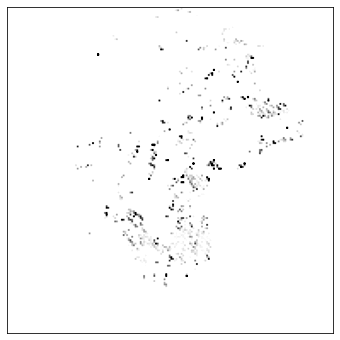

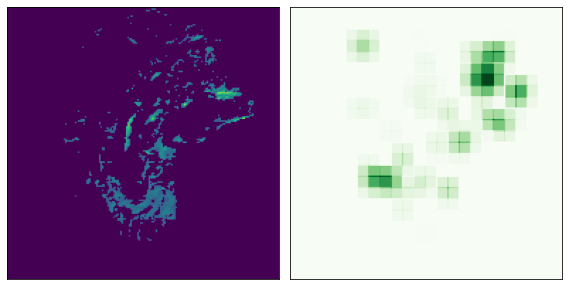

Idx: UPENN-GBM-00539_11
Methylation pred value: 0
Methylation real value: 1
Methylation prob value: 0.5702977
Tumor real value: 1


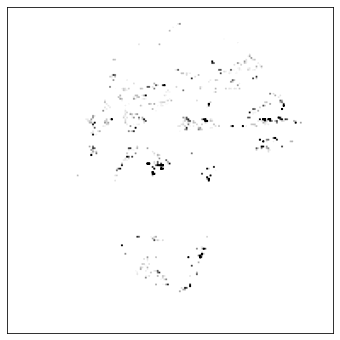

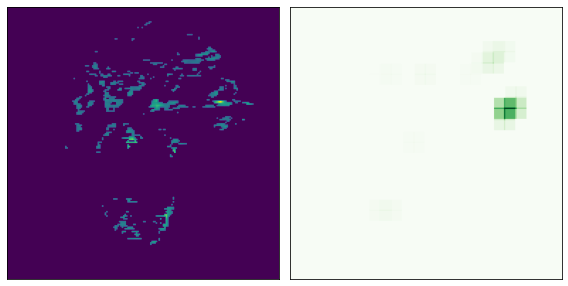

Idx: UPENN-GBM-00426_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 4.3822365e-06
Tumor real value: 1


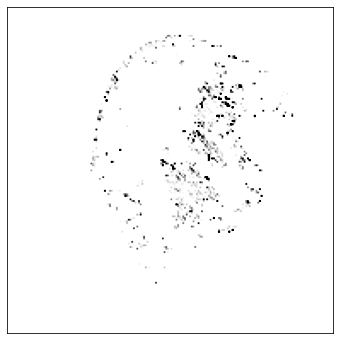

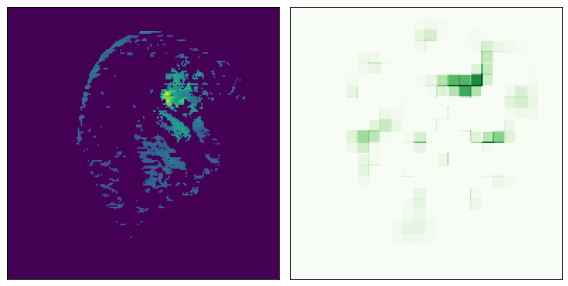

Idx: UPENN-GBM-00629_21
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.0021673185
Tumor real value: 1


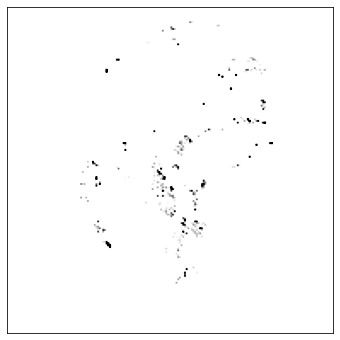

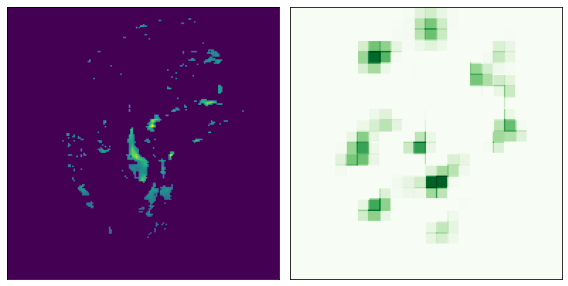

Idx: UPENN-GBM-00463_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.05877506
Tumor real value: 1


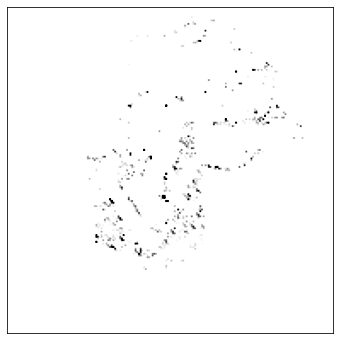

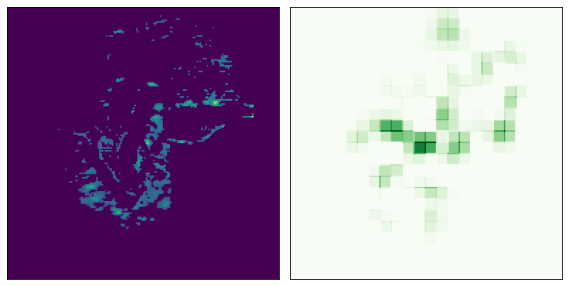

Idx: UPENN-GBM-00134_11
Methylation pred value: 1
Methylation real value: 0
Methylation prob value: 0.86549073
Tumor real value: 1


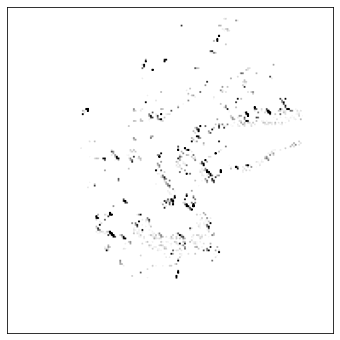

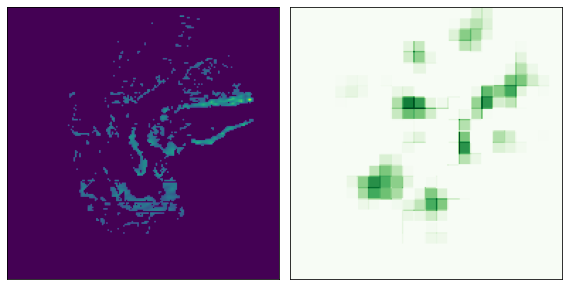

Idx: UPENN-GBM-00554_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.9999869
Tumor real value: 1


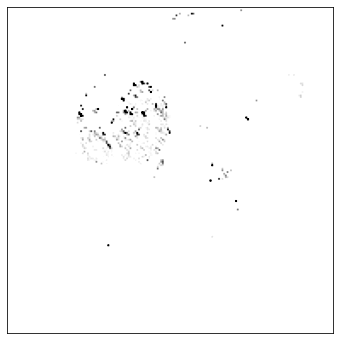

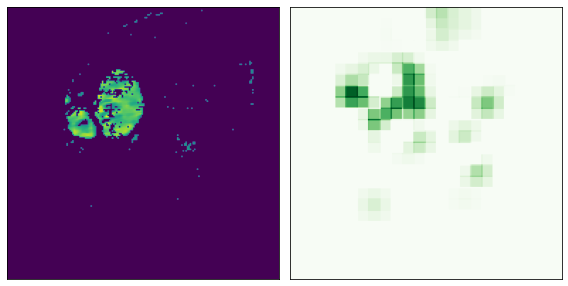

Idx: UPENN-GBM-00630_21
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.99999654
Tumor real value: 1


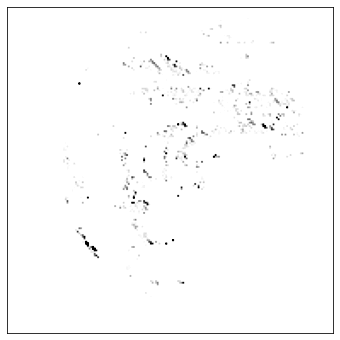

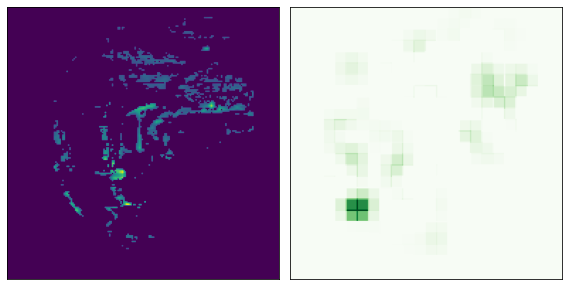

Idx: UPENN-GBM-00612_21
Methylation pred value: 0
Methylation real value: 1
Methylation prob value: 0.5702977
Tumor real value: 1


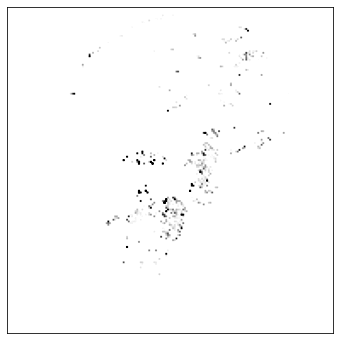

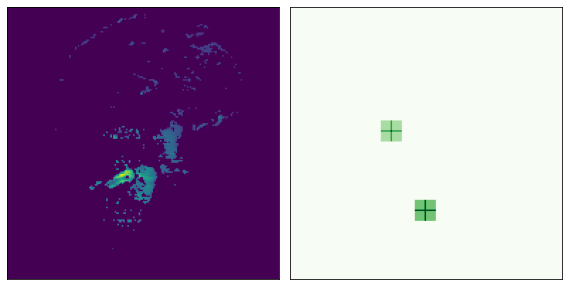

Idx: UPENN-GBM-00519_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.004559885
Tumor real value: 1


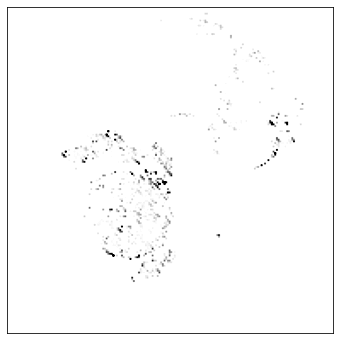

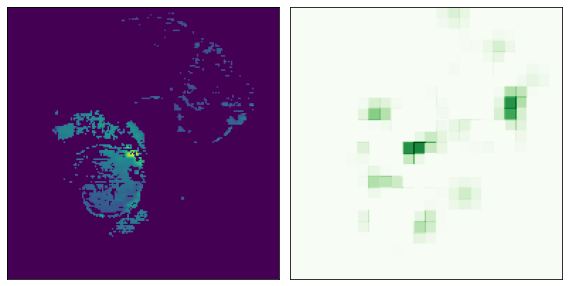

Idx: UPENN-GBM-00549_11
Methylation pred value: 1
Methylation real value: 0
Methylation prob value: 0.97397023
Tumor real value: 1


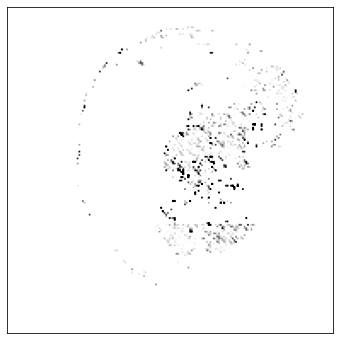

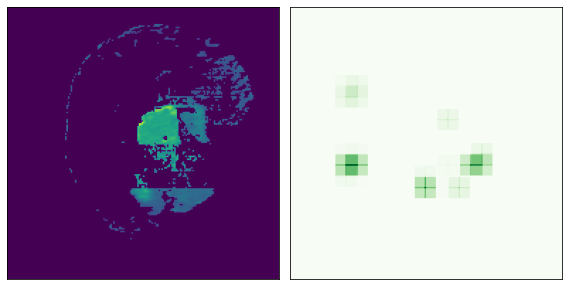

Idx: UPENN-GBM-00563_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.5702977
Tumor real value: 1


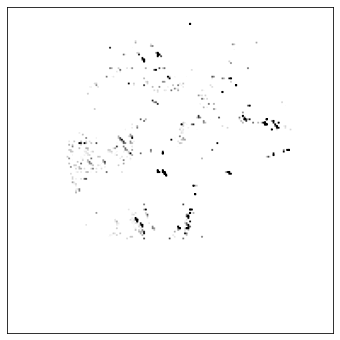

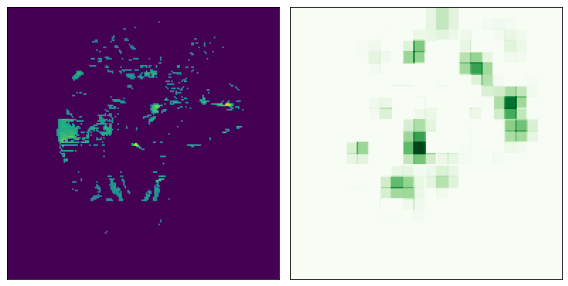

Idx: UPENN-GBM-00401_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.9999987
Tumor real value: 1


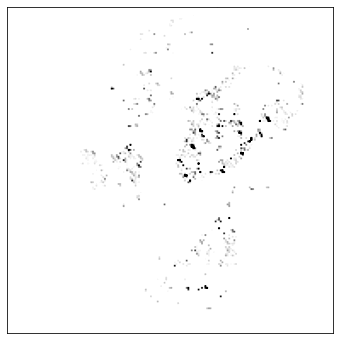

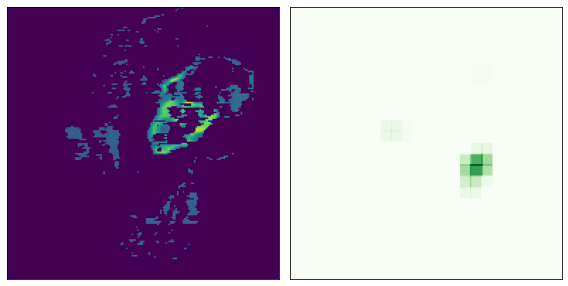

Idx: UPENN-GBM-00375_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.0027761052
Tumor real value: 1


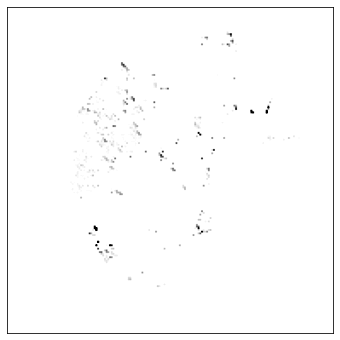

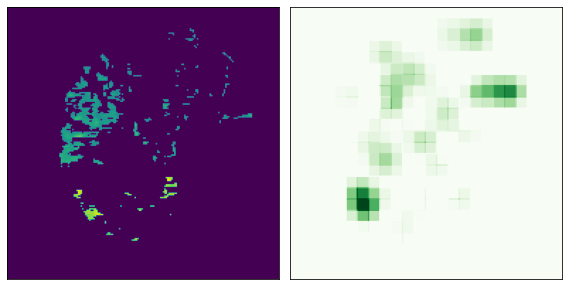

Idx: UPENN-GBM-00140_21
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.09320587
Tumor real value: 1


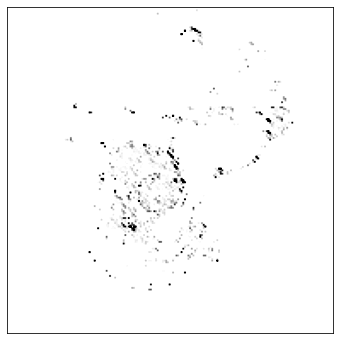

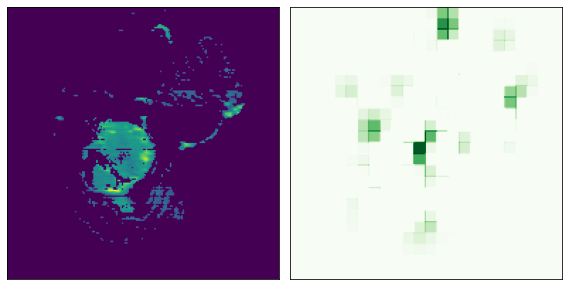

Idx: UPENN-GBM-00575_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 1.3784698e-08
Tumor real value: 1


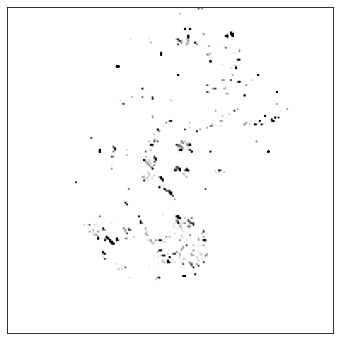

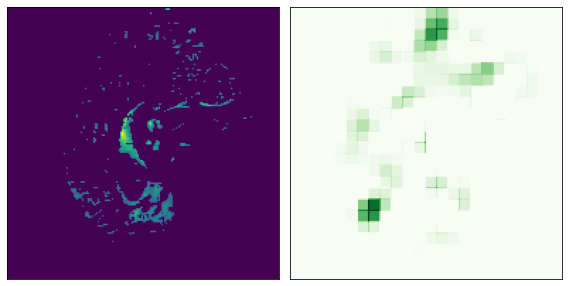

Idx: UPENN-GBM-00393_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.5702977
Tumor real value: 1


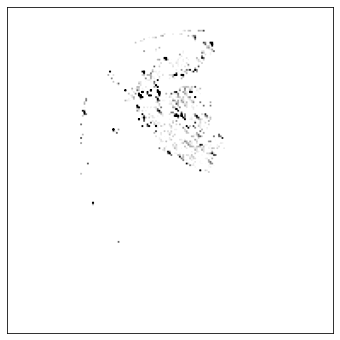

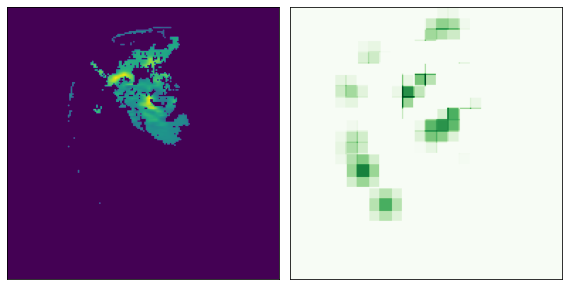

Idx: UPENN-GBM-00565_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.99816555
Tumor real value: 1


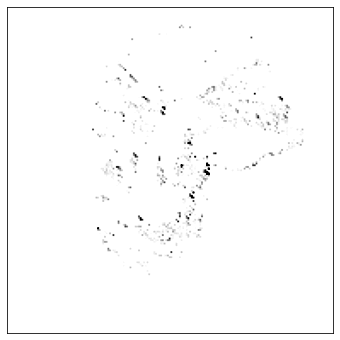

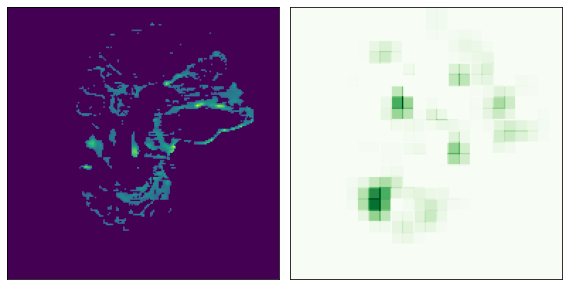

Idx: UPENN-GBM-00310_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 0.99887973
Tumor real value: 1


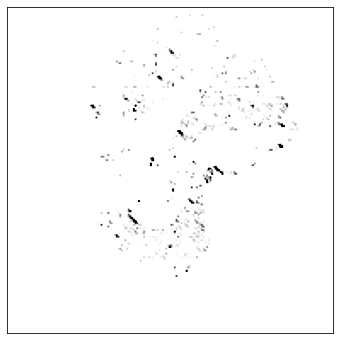

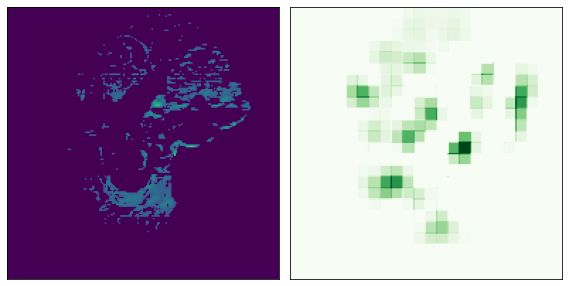

Idx: UPENN-GBM-00454_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.033877872
Tumor real value: 1


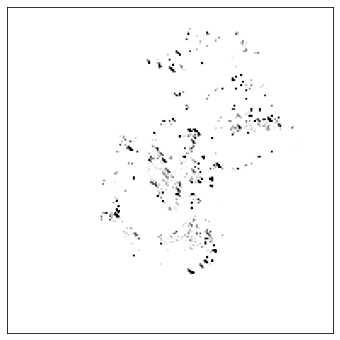

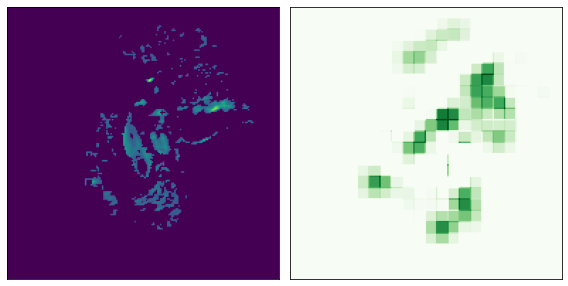

Idx: UPENN-GBM-00579_11
Methylation pred value: 0
Methylation real value: 1
Methylation prob value: 6.875352e-07
Tumor real value: 1


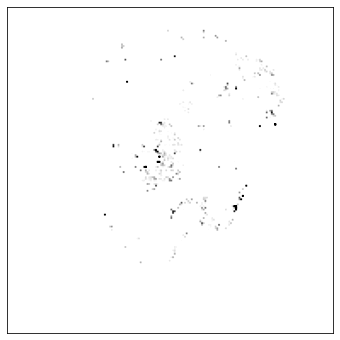

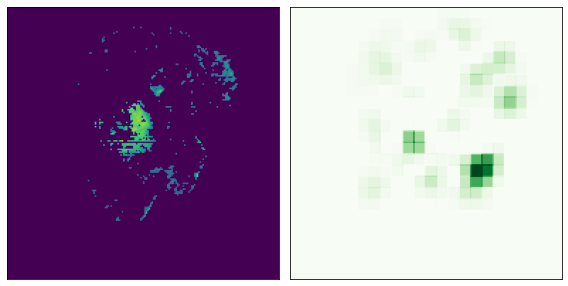

Idx: UPENN-GBM-00144_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.0011154918
Tumor real value: 1


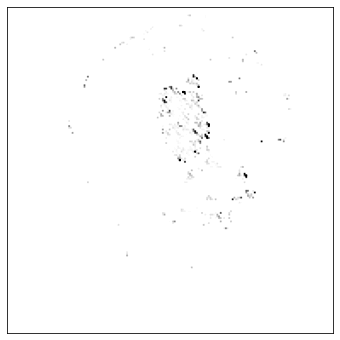

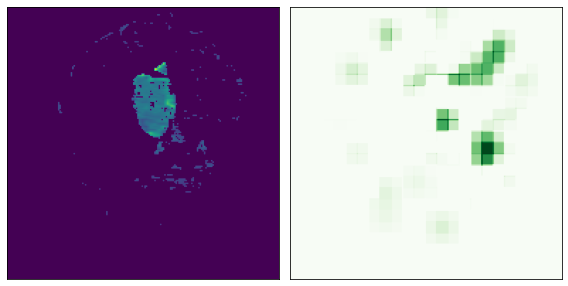

Idx: UPENN-GBM-00384_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.008473361
Tumor real value: 1


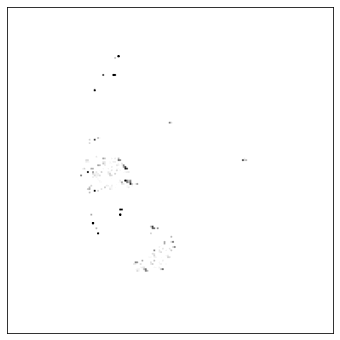

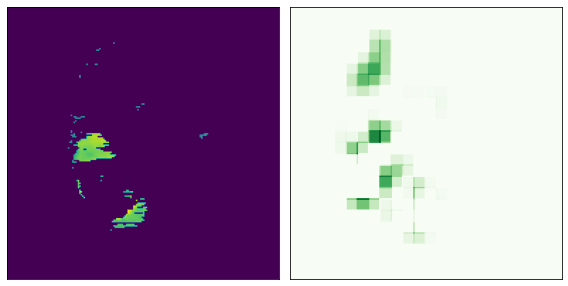

Idx: UPENN-GBM-00351_11
Methylation pred value: 0
Methylation real value: 1
Methylation prob value: 0.518271
Tumor real value: 1


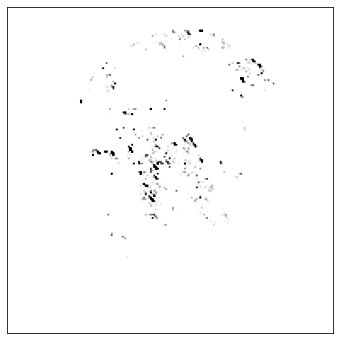

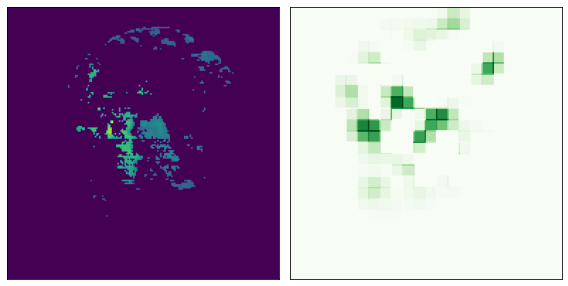

Idx: UPENN-GBM-00362_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.026605558
Tumor real value: 1


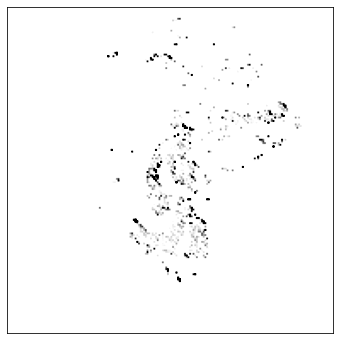

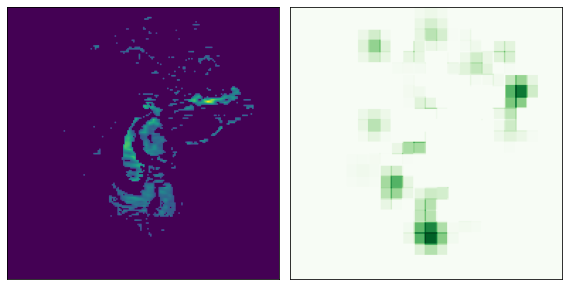

Idx: UPENN-GBM-00240_11
Methylation pred value: 1
Methylation real value: 1
Methylation prob value: 1.0
Tumor real value: 1


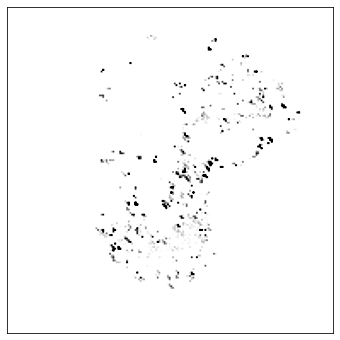

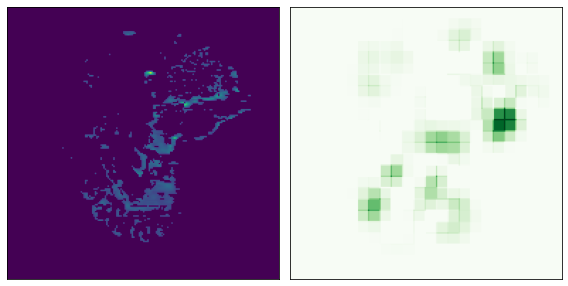

Idx: UPENN-GBM-00570_11
Methylation pred value: 0
Methylation real value: 0
Methylation prob value: 0.0006482843
Tumor real value: 1


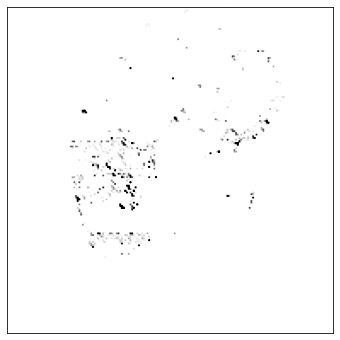

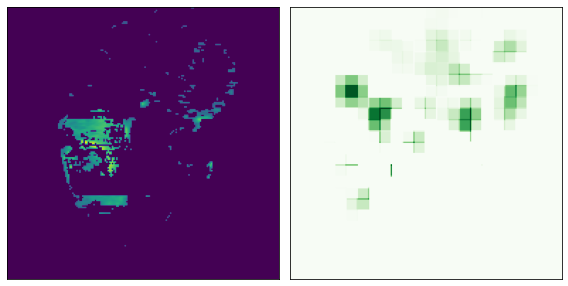

Idx: UPENN-GBM-00246_11
Methylation pred value: 1
Methylation real value: 0
Methylation prob value: 0.74094176
Tumor real value: 1


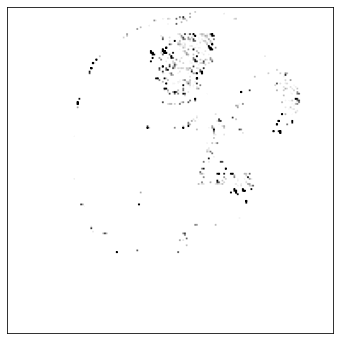

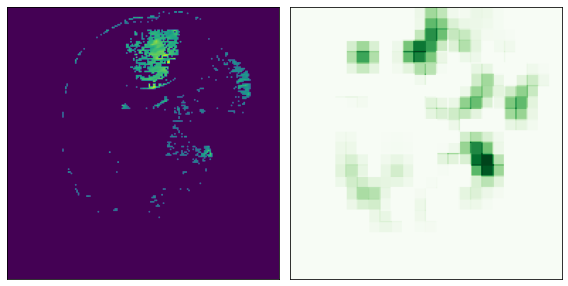

IndexError: list index out of range

In [169]:
default_cmap = LinearSegmentedColormap.from_list('custom blue',
                                                   [(0, '#ffffff'),
                                                    (0.25, '#000000'),
                                                    (1, '#000000')], N=256)
integrated_gradients = IntegratedGradients(m_model)
occlusion = Occlusion(m_model)

for i in range(len(X)):
    idx = list(ids)[i]
    print("Idx: "+idx)
    pred = y_pred[i]
    real = y[i]
    prob = y_prob[i][0]
    tumor = tumor_y[i]
    img_test = X[i].unsqueeze(0)
    print("Methylation pred value: "+str(pred))
    print("Methylation real value: "+str(real))
    print("Methylation prob value: "+str(prob))
    print("Tumor real value: "+str(tumor))
    
    attributions_ig = integrated_gradients.attribute(img_test, target=0, n_steps=10)
    if chosen_net == "sim":
        attributions_occ = occlusion.attribute(img_test,
                                             strides=(1, 8, 8, 8),
                                             target=0,
                                             sliding_window_shapes=(1, 8, 8, 8), #1,15,15,15
                                             baselines=0)
    else:
        attributions_occ = occlusion.attribute(img_test,
                                             strides=(1, 8, 8),
                                             target=0,
                                             sliding_window_shapes=(1, 15, 15), #1,15,15,15
                                             baselines=0)
    if chosen_net == "alt":
        fig, axs = viz.visualize_image_attr(np.transpose(attributions_ig.squeeze(0).cpu().detach().numpy(), (1, 2, 0)), #1,2,0
                               img_test.cpu().detach().numpy().transpose(2, 3, 1, 0)[:, :, :, 0], #2,3,1,0
                               method='heat_map',
                               cmap=default_cmap,
                               show_colorbar=False,
                               sign='positive',
                               outlier_perc=1)
        fig.savefig(f"/home/salvatorecapuozzo/Scrivania/captum_results/n/ig_{idx}_pred{pred}_real{real}_tumor{tumor}_prob{prob}.png")
        try:
            fig, axs = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze(0).cpu().detach().numpy(), (1, 2, 0)),
                                    img_test.cpu().detach().numpy().transpose(2, 3, 1, 0)[:, :, :, 0],
                                    ["original_image", "heat_map"],
                                    ["all", "positive"],
                                    show_colorbar=False,
                                    outlier_perc=2,
                                    )
            fig.savefig(f"/home/salvatorecapuozzo/Scrivania/captum_results/n/occ_{idx}_pred{pred}_real{real}_tumor{tumor}_prob{prob}.png")
        except: continue

In [100]:
default_cmap = LinearSegmentedColormap.from_list('custom blue',
                                                   [(0, '#ffffff'),
                                                    (0.25, '#000000'),
                                                    (1, '#000000')], N=256)

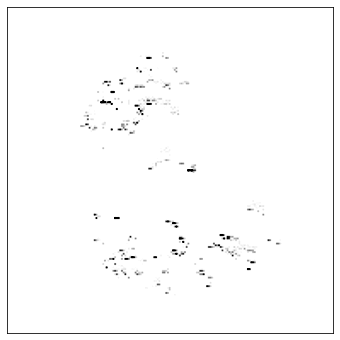

In [101]:
integrated_gradients = IntegratedGradients(m_model)
attributions_ig = integrated_gradients.attribute(img_test, target=0, n_steps=10)
if chosen_net == "alt":
    fig, axs = viz.visualize_image_attr(np.transpose(attributions_ig.squeeze(0).cpu().detach().numpy(), (1, 2, 0)), #1,2,0
                           img_test.cpu().detach().numpy().transpose(2, 3, 1, 0)[:, :, :, 0], #2,3,1,0
                           method='heat_map',
                           cmap=default_cmap,
                           show_colorbar=False,
                           sign='positive',
                           outlier_perc=1)
    fig.savefig("/home/salvatorecapuozzo/Scrivania/KBF_interpr/ig_2_t.png")

-0.5698399661576637 0.32813825804390745
0.0 0.9999999998886387
<class 'numpy.ndarray'>


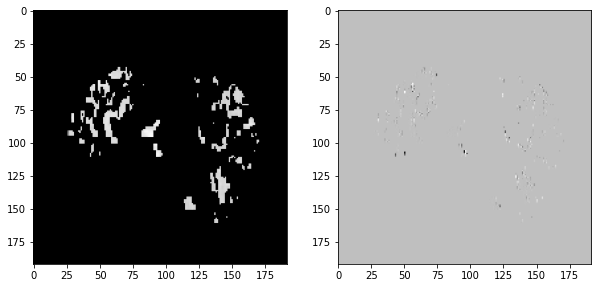

In [102]:
%matplotlib inline
if chosen_net == "sim":
    if selected_type == "KLF":
        ig = attributions_ig.squeeze().cpu().detach().numpy().transpose(1,2,0)
        orig = img_test.squeeze().cpu().detach().numpy().transpose(1,2,0)
    else:
        ig = attributions_ig.squeeze().cpu().detach().numpy()
        orig = img_test.squeeze().cpu().detach().numpy()
else:
    ig = attributions_ig.squeeze().cpu().detach().numpy().transpose(1,0)
    orig = img_test.squeeze().cpu().detach().numpy().transpose(1,0)
    
norm_ig = (ig-ig.min())/(ig.max()-ig.min()+0.0000000001)
print(ig.min(), ig.max())
print(norm_ig.min(), norm_ig.max())
cmap = cm.get_cmap('jet',256)
#cmap = cm.Greys_r
print(type(ig))
if chosen_net == "sim":
    slice_num = 96
    fig, axs = plt.subplots(1,2,figsize = (10,30))
    axs[0].imshow(orig[slice_num,:,:], cmap=cm.Greys_r)
    #axs[1].imshow(orig_f[slice_num,:,:], cmap=cm.Greys_r)
    axs[1].imshow(ig[slice_num,:,:], cmap=cm.Greys_r)
    plt.show()
else:
    fig, axs = plt.subplots(1,2,figsize = (10,30))
    axs[0].imshow(orig, cmap=cm.Greys_r)
    #axs[1].imshow(orig_f[slice_num,:,:], cmap=cm.Greys_r)
    axs[1].imshow(ig, cmap=cm.Greys_r)
    plt.show()

<IPython.core.display.Javascript object>


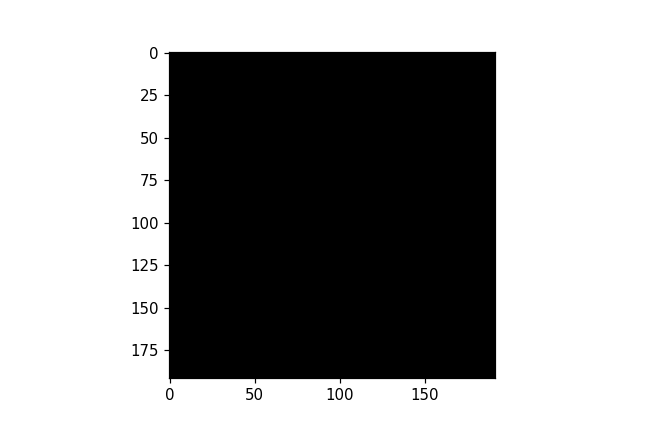

In [15]:
%matplotlib notebook

j = 0
fig = plt.figure()
frames = []
img = orig
while (j < len(img)):
    frames.append([plt.imshow(img[j], cmap=cm.Greys_r, animated=True)])
    j += 1

ani = animation.ArtistAnimation(fig, frames, interval=50, blit=True,
                                repeat_delay=1000)
plt.show()
#%matplotlib inline

<IPython.core.display.Javascript object>


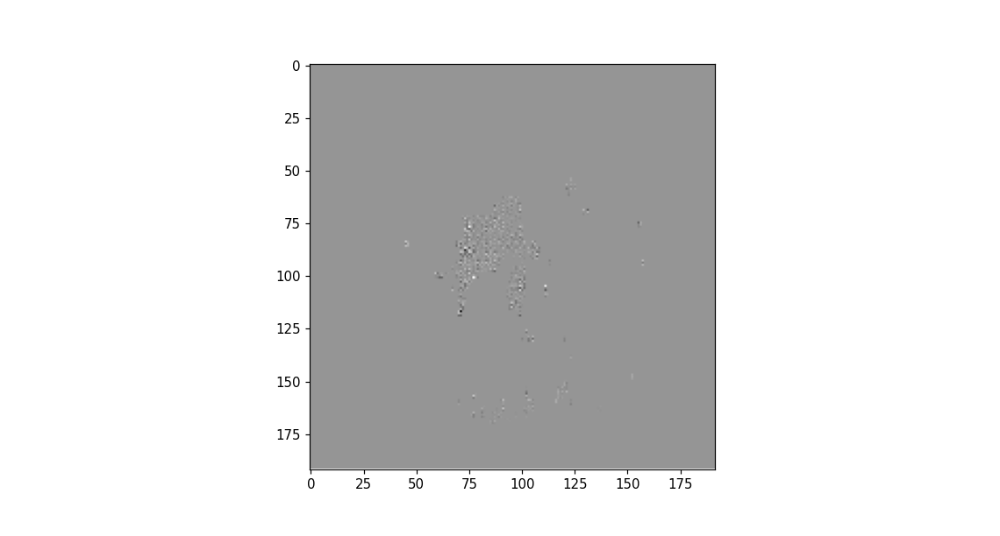

In [16]:
%matplotlib notebook

j = 0
fig = plt.figure()
frames = []
img = ig
while (j < len(img)):
    frames.append([plt.imshow(img[j], cmap=cm.Greys_r, animated=True)])
    j += 1

ani = animation.ArtistAnimation(fig, frames, interval=50, blit=True,
                                repeat_delay=1000)
plt.show()
#%matplotlib inline

In [18]:
#savemat("/home/salvatorecapuozzo/Scrivania/prova.mat", {'X': ig} )

In [103]:
%matplotlib inline
occlusion = Occlusion(m_model)
if chosen_net == "sim":
    attributions_occ = occlusion.attribute(img_test,
                                         strides=(1, 8, 8, 8),
                                         target=0,
                                         sliding_window_shapes=(1, 8, 8, 8), #1,15,15,15
                                         baselines=0)
else:
    attributions_occ = occlusion.attribute(img_test,
                                         strides=(1, 8, 8),
                                         target=0,
                                         sliding_window_shapes=(1, 15, 15), #1,15,15,15
                                         baselines=0)

AssertionError: Cannot normalize by scale factor = 0

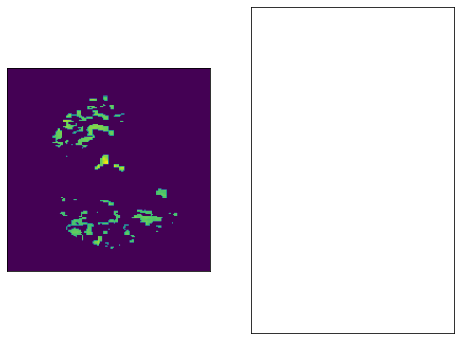

In [104]:
%matplotlib inline

if chosen_net == "alt":
    fig, axs = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze(0).cpu().detach().numpy(), (1, 2, 0)),
                                    img_test.cpu().detach().numpy().transpose(2, 3, 1, 0)[:, :, :, 0],
                                    ["original_image", "heat_map"],
                                    ["all", "positive"],
                                    show_colorbar=False,
                                    outlier_perc=2,
                                    )
    fig.savefig("/home/salvatorecapuozzo/Scrivania/KBF_interpr/occ_2_t.png")

(192, 192)
(192, 192)


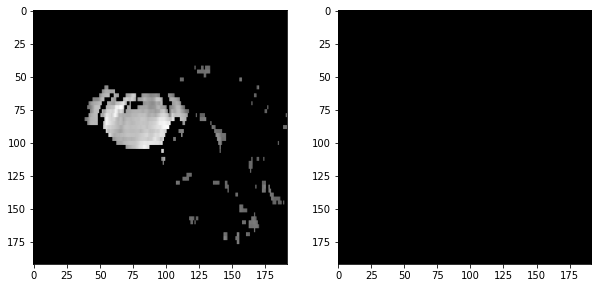

In [44]:
%matplotlib inline
if chosen_net == "sim":
    if selected_type == "KLF":
        occ = attributions_occ.squeeze().cpu().detach().numpy().transpose(1,2,0)
        orig = img_test.squeeze().cpu().detach().numpy().transpose(1,2,0)
    else:
        occ = attributions_occ.squeeze().cpu().detach().numpy()
        orig = img_test.squeeze().cpu().detach().numpy()
else:
    occ = attributions_occ.squeeze().cpu().detach().numpy().transpose(1,0)
    orig = img_test.squeeze().cpu().detach().numpy().transpose(1,0)
#orig = np.rot90(orig, k=3)
#orig = np.flip(orig, axis=1)
#orig_f = img_test_f.squeeze().cpu().detach().numpy()
print(occ.shape)
print(orig.shape)

cmap = cm.get_cmap('jet',256)
#cmap = cm.Greys_r
if chosen_net == "sim":
    slice_num = 96
    fig, axs = plt.subplots(1,2,figsize = (10,30))
    axs[0].imshow(orig[slice_num,:,:], cmap=cm.Greys_r)
    #axs[1].imshow(orig_f[slice_num,:,:], cmap=cm.Greys_r)
    axs[1].imshow(occ[slice_num,:,:], cmap=cm.Greys_r)
    plt.show()
    #plt.imshow(occ[slice_num,:,:], cmap=cmap)
    #plt.show()
else:
    fig, axs = plt.subplots(1,2,figsize = (10,30))
    axs[0].imshow(orig, cmap=cm.Greys_r)
    #axs[1].imshow(orig_f[slice_num,:,:], cmap=cm.Greys_r)
    axs[1].imshow(occ, cmap=cm.Greys_r)
    plt.show()

<IPython.core.display.Javascript object>


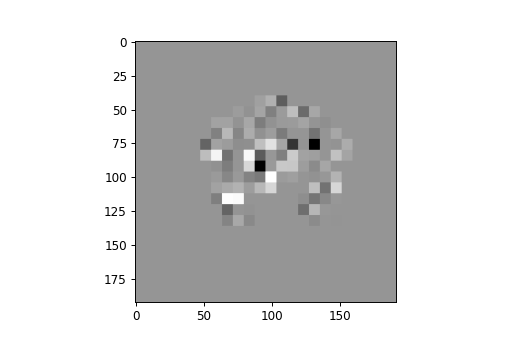

192


In [106]:
%matplotlib notebook

j = 0
fig = plt.figure()
frames = []
img = occ
print(len(img))
while (j < len(img)):
    frames.append([plt.imshow(img[j], cmap=cm.Greys_r, animated=True)])
    j += 1

ani = animation.ArtistAnimation(fig, frames, interval=50, blit=True,
                                repeat_delay=1000)
plt.show()
#%matplotlib inline

In [122]:
from medcam import medcam

In [125]:
model = medcam.inject(m_model, label=0, backend="gcam", output_dir="attention_maps", save_maps=True)

2022-08-01 16:24:13 - Predict: ../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO_Jan27_10-46-07/RSNAClassifierSingle3D-DW-SO-e13-loss0.012-acc1.000-auc1.000.pth 606
Dataset: Labeled Test Set
   BraTS21ID  MGMT_real_value  MGMT_value
54     00020                1           0
27     00059                1           0
13     00062                1           0
9      00077                1           0
33     00102                0           0
11     00110                0           0
18     00117                1           0
43     00134                1           0
49     00139                1           0
46     00158                0           1
16     00177                1           1
5      00186                1           0
28     00194                0           1
31     00195                0           1
1      00217                0           1
37     00218                0           0
59     00219                0           0
56     00249                0           1


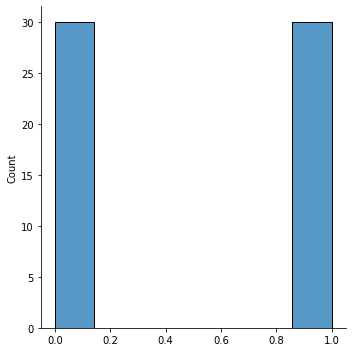

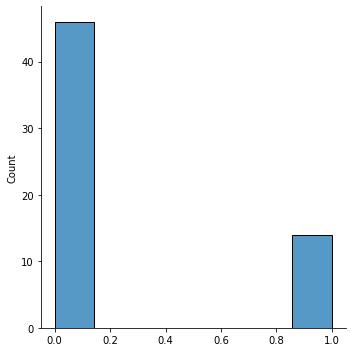

In [127]:
test_pred, X, y, y_pred, y_prob = predict(model, device, m_modelfile, m_test_loader, size)

(2, 2, 2, 1)


TypeError: Invalid shape (2, 2, 2, 1) for image data

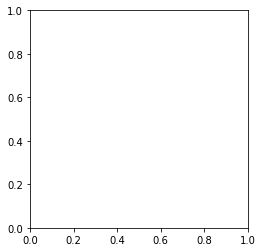

In [128]:
path = "attention_maps/part1/attention_map_34_0_0.nii.gz"
y, _ = loader_fc_3d_nifti(path)
print(y.shape)
img = y
fig = "Attention map"
slice_num = 96
plt.imshow(img, cmap=cm.Greys_r)
plt.show()

-- FOLD N:0
Train origin: mn
Type: KLF
2022-08-20 13:35:43 - (M0) Train/Val datasets size: 270
2022-08-20 13:35:43 - (M1) Train/Val datasets size: 303
2022-08-20 13:35:43 - (N0) Train/Val datasets size: 170
2022-08-20 13:35:43 - (N1) Train/Val datasets size: 121
2022-08-20 13:35:43 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 13:35:43 - (MN0) Train/Val datasets size: 540
2022-08-20 13:35:43 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-20 13:35:43 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9e4091610>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9e40a39a0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9e5b7efa0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9e5b7e7c0>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9e5b7ed00>, 'mn_dataset_1': <utils.da

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 6, 7, 9, 10, 11, 13, 14, 15, 17, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 117, 118, 120, 121, 122, 123, 125, 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 139, 140, 141, 142, 143, 145, 146, 148, 149, 150, 152, 153, 154, 155, 157, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 174, 175, 178, 180, 181, 182, 183, 184, 185, 186, 187, 188, 190, 191, 192, 193, 194, 195, 197, 198, 200, 201, 202, 203, 204, 205, 208, 209, 211, 213, 215, 216, 217, 218, 219, 220, 221, 222, 223, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 238, 240, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9e5b7ef70>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9e41268e0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9e41265b0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9def399a0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9def392b0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9def397f0>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9def39190>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9def39a90>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9def39700>]}}
2022-08-20 13:42:35 - Using CUDA...
KLF
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin'

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-20 13:42:35 - EPOCH: 1
2022-08-20 13:42:37 - Train Step 10/245, train_loss: 0.7200
2022-08-20 13:42:39 - Train Step 20/245, train_loss: 0.6925
2022-08-20 13:42:41 - Train Step 30/245, train_loss: 0.7157
2022-08-20 13:42:43 - Train Step 40/245, train_loss: 0.7131
2022-08-20 13:42:45 - Train Step 50/245, train_loss: 0.7047
2022-08-20 13:42:46 - Train Step 60/245, train_loss: 0.7115
2022-08-20 13:42:48 - Train Step 70/245, train_loss: 0.7089
2022-08-20 13:42:50 - Train Step 80/245, train_loss: 0.7091
2022-08-20 13:42:52 - Train Step 90/245, train_loss: 0.7055
2022-08-20 13:42:54 - Train Step 100/245, train_loss: 0.7043
2022-08-20 13:42:56 - Train Step 110/245, train_loss: 0.7030
2022-08-20 13:42:58 - Train Step 120/245, train_loss: 0.7026
2022-08-20 13:42:59 - Train Step 130/245, train_loss: 0.7015
2022-08-20 13:43:01 - Train Step 140/245, train_loss: 0.6996
2022-08-20 13:43:03 - Train Step 150/245, train_loss: 0.6981
2022-08-20 13:43:05 - Train Step 160/245, train_loss: 0.6953
20

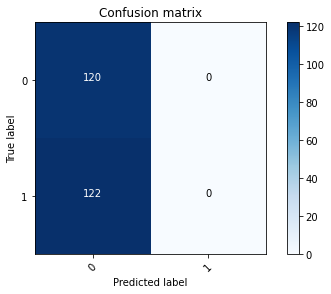

2022-08-20 13:43:32 - [Epoch Train: 1] loss: 0.6936, auc: 0.5359, acc: 0.5041, time: 45.00 s            
2022-08-20 13:43:32 - [Epoch Valid: 1] loss: 0.6897, auc: 0.5607, acc: 0.4959, time: 11.00 s
2022-08-20 13:43:32 - acc improved from 0.0000 to 0.4959. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_13-42-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e1-loss0.690-acc0.496-auc0.561.pth'


  1%|▍                                        | 1/100 [00:57<1:34:36, 57.34s/it]

2022-08-20 13:43:32 - EPOCH: 2
2022-08-20 13:43:34 - Train Step 10/245, train_loss: 0.6445
2022-08-20 13:43:36 - Train Step 20/245, train_loss: 0.6484
2022-08-20 13:43:38 - Train Step 30/245, train_loss: 0.6468
2022-08-20 13:43:40 - Train Step 40/245, train_loss: 0.6444
2022-08-20 13:43:42 - Train Step 50/245, train_loss: 0.6394
2022-08-20 13:43:44 - Train Step 60/245, train_loss: 0.6339
2022-08-20 13:43:46 - Train Step 70/245, train_loss: 0.6264
2022-08-20 13:43:48 - Train Step 80/245, train_loss: 0.6284
2022-08-20 13:43:49 - Train Step 90/245, train_loss: 0.6236
2022-08-20 13:43:51 - Train Step 100/245, train_loss: 0.6262
2022-08-20 13:43:53 - Train Step 110/245, train_loss: 0.6281
2022-08-20 13:43:55 - Train Step 120/245, train_loss: 0.6280
2022-08-20 13:43:57 - Train Step 130/245, train_loss: 0.6286
2022-08-20 13:43:59 - Train Step 140/245, train_loss: 0.6294
2022-08-20 13:44:01 - Train Step 150/245, train_loss: 0.6311
2022-08-20 13:44:03 - Train Step 160/245, train_loss: 0.6316
20

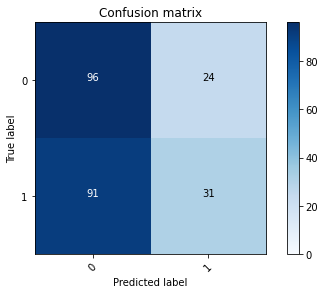

2022-08-20 13:44:31 - [Epoch Train: 2] loss: 0.6341, auc: 0.7305, acc: 0.5622, time: 47.00 s            
2022-08-20 13:44:31 - [Epoch Valid: 2] loss: 0.6861, auc: 0.5703, acc: 0.5248, time: 12.00 s
2022-08-20 13:44:31 - acc improved from 0.4959 to 0.5248. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_13-42-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e2-loss0.686-acc0.525-auc0.570.pth'


  2%|▊                                        | 2/100 [01:56<1:35:23, 58.40s/it]

2022-08-20 13:44:31 - EPOCH: 3
2022-08-20 13:44:34 - Train Step 10/245, train_loss: 0.5664
2022-08-20 13:44:35 - Train Step 20/245, train_loss: 0.5518
2022-08-20 13:44:37 - Train Step 30/245, train_loss: 0.5472
2022-08-20 13:44:39 - Train Step 40/245, train_loss: 0.5468
2022-08-20 13:44:41 - Train Step 50/245, train_loss: 0.5377
2022-08-20 13:44:43 - Train Step 60/245, train_loss: 0.5325
2022-08-20 13:44:45 - Train Step 70/245, train_loss: 0.5296
2022-08-20 13:44:47 - Train Step 80/245, train_loss: 0.5262
2022-08-20 13:44:49 - Train Step 90/245, train_loss: 0.5194
2022-08-20 13:44:51 - Train Step 100/245, train_loss: 0.5208
2022-08-20 13:44:53 - Train Step 110/245, train_loss: 0.5185
2022-08-20 13:44:55 - Train Step 120/245, train_loss: 0.5203
2022-08-20 13:44:57 - Train Step 130/245, train_loss: 0.5208
2022-08-20 13:44:59 - Train Step 140/245, train_loss: 0.5192
2022-08-20 13:45:01 - Train Step 150/245, train_loss: 0.5159
2022-08-20 13:45:03 - Train Step 160/245, train_loss: 0.5141
20

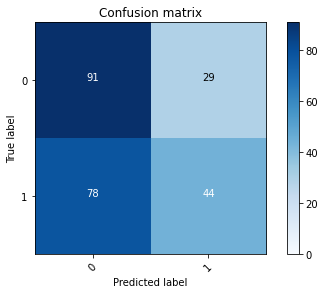

2022-08-20 13:45:32 - [Epoch Train: 3] loss: 0.5034, auc: 0.8791, acc: 0.7276, time: 47.00 s            
2022-08-20 13:45:32 - [Epoch Valid: 3] loss: 0.7271, auc: 0.5714, acc: 0.5579, time: 12.00 s
2022-08-20 13:45:32 - acc improved from 0.5248 to 0.5579. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_13-42-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e3-loss0.727-acc0.558-auc0.571.pth'


  3%|█▏                                       | 3/100 [02:56<1:35:52, 59.30s/it]

2022-08-20 13:45:32 - EPOCH: 4
2022-08-20 13:45:34 - Train Step 10/245, train_loss: 0.3875
2022-08-20 13:45:36 - Train Step 20/245, train_loss: 0.3705
2022-08-20 13:45:38 - Train Step 30/245, train_loss: 0.3784
2022-08-20 13:45:40 - Train Step 40/245, train_loss: 0.3707
2022-08-20 13:45:43 - Train Step 50/245, train_loss: 0.3592
2022-08-20 13:45:45 - Train Step 60/245, train_loss: 0.3517
2022-08-20 13:45:47 - Train Step 70/245, train_loss: 0.3595
2022-08-20 13:45:49 - Train Step 80/245, train_loss: 0.3476
2022-08-20 13:45:51 - Train Step 90/245, train_loss: 0.3518
2022-08-20 13:45:53 - Train Step 100/245, train_loss: 0.3489
2022-08-20 13:45:55 - Train Step 110/245, train_loss: 0.3414
2022-08-20 13:45:57 - Train Step 120/245, train_loss: 0.3328
2022-08-20 13:45:59 - Train Step 130/245, train_loss: 0.3326
2022-08-20 13:46:01 - Train Step 140/245, train_loss: 0.3266
2022-08-20 13:46:03 - Train Step 150/245, train_loss: 0.3253
2022-08-20 13:46:06 - Train Step 160/245, train_loss: 0.3213
20

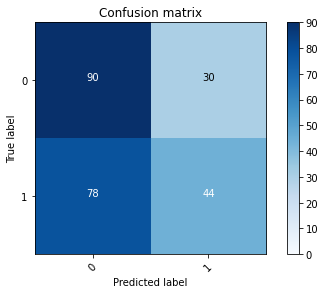

2022-08-20 13:46:38 - [Epoch Train: 4] loss: 0.3232, auc: 0.9571, acc: 0.8714, time: 53.00 s            
2022-08-20 13:46:38 - [Epoch Valid: 4] loss: 0.8371, auc: 0.5831, acc: 0.5537, time: 13.00 s


  4%|█▋                                       | 4/100 [04:03<1:39:26, 62.15s/it]

2022-08-20 13:46:38 - EPOCH: 5
2022-08-20 13:46:41 - Train Step 10/245, train_loss: 0.1926
2022-08-20 13:46:43 - Train Step 20/245, train_loss: 0.2042
2022-08-20 13:46:45 - Train Step 30/245, train_loss: 0.2070
2022-08-20 13:46:47 - Train Step 40/245, train_loss: 0.1922
2022-08-20 13:46:49 - Train Step 50/245, train_loss: 0.1865
2022-08-20 13:46:51 - Train Step 60/245, train_loss: 0.1836
2022-08-20 13:46:53 - Train Step 70/245, train_loss: 0.1894
2022-08-20 13:46:55 - Train Step 80/245, train_loss: 0.1847
2022-08-20 13:46:57 - Train Step 90/245, train_loss: 0.1790
2022-08-20 13:46:59 - Train Step 100/245, train_loss: 0.1816
2022-08-20 13:47:02 - Train Step 110/245, train_loss: 0.1839
2022-08-20 13:47:04 - Train Step 120/245, train_loss: 0.1785
2022-08-20 13:47:06 - Train Step 130/245, train_loss: 0.1787
2022-08-20 13:47:08 - Train Step 140/245, train_loss: 0.1814
2022-08-20 13:47:10 - Train Step 150/245, train_loss: 0.1801
2022-08-20 13:47:12 - Train Step 160/245, train_loss: 0.1776
20

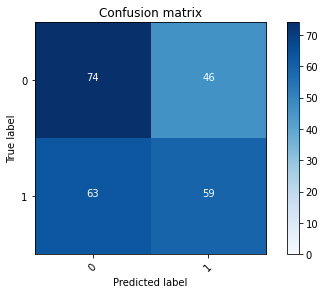

2022-08-20 13:47:44 - [Epoch Train: 5] loss: 0.1698, auc: 0.9933, acc: 0.9490, time: 52.00 s            
2022-08-20 13:47:44 - [Epoch Valid: 5] loss: 0.9904, auc: 0.5713, acc: 0.5496, time: 13.00 s


  5%|██                                       | 5/100 [05:09<1:40:36, 63.54s/it]

2022-08-20 13:47:44 - EPOCH: 6
2022-08-20 13:47:47 - Train Step 10/245, train_loss: 0.0876
2022-08-20 13:47:49 - Train Step 20/245, train_loss: 0.0877
2022-08-20 13:47:51 - Train Step 30/245, train_loss: 0.0808
2022-08-20 13:47:53 - Train Step 40/245, train_loss: 0.0826
2022-08-20 13:47:55 - Train Step 50/245, train_loss: 0.0818
2022-08-20 13:47:57 - Train Step 60/245, train_loss: 0.0812
2022-08-20 13:47:59 - Train Step 70/245, train_loss: 0.0829
2022-08-20 13:48:01 - Train Step 80/245, train_loss: 0.0814
2022-08-20 13:48:04 - Train Step 90/245, train_loss: 0.0787
2022-08-20 13:48:06 - Train Step 100/245, train_loss: 0.0797
2022-08-20 13:48:08 - Train Step 110/245, train_loss: 0.0807
2022-08-20 13:48:10 - Train Step 120/245, train_loss: 0.0803
2022-08-20 13:48:12 - Train Step 130/245, train_loss: 0.0775
2022-08-20 13:48:14 - Train Step 140/245, train_loss: 0.0807
2022-08-20 13:48:16 - Train Step 150/245, train_loss: 0.0807
2022-08-20 13:48:19 - Train Step 160/245, train_loss: 0.0790
20

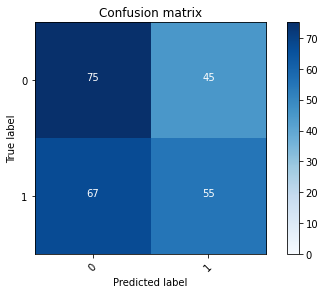

2022-08-20 13:48:50 - [Epoch Train: 6] loss: 0.0743, auc: 0.9999, acc: 0.9898, time: 52.00 s            
2022-08-20 13:48:50 - [Epoch Valid: 6] loss: 1.1979, auc: 0.5637, acc: 0.5372, time: 13.00 s


  6%|██▍                                      | 6/100 [06:15<1:40:51, 64.37s/it]

2022-08-20 13:48:50 - EPOCH: 7
2022-08-20 13:48:53 - Train Step 10/245, train_loss: 0.0521
2022-08-20 13:48:55 - Train Step 20/245, train_loss: 0.0564
2022-08-20 13:48:57 - Train Step 30/245, train_loss: 0.0562
2022-08-20 13:48:59 - Train Step 40/245, train_loss: 0.0467
2022-08-20 13:49:01 - Train Step 50/245, train_loss: 0.0427
2022-08-20 13:49:04 - Train Step 60/245, train_loss: 0.0391
2022-08-20 13:49:06 - Train Step 70/245, train_loss: 0.0389
2022-08-20 13:49:08 - Train Step 80/245, train_loss: 0.0375
2022-08-20 13:49:10 - Train Step 90/245, train_loss: 0.0364
2022-08-20 13:49:12 - Train Step 100/245, train_loss: 0.0360
2022-08-20 13:49:14 - Train Step 110/245, train_loss: 0.0355
2022-08-20 13:49:16 - Train Step 120/245, train_loss: 0.0346
2022-08-20 13:49:18 - Train Step 130/245, train_loss: 0.0337
2022-08-20 13:49:21 - Train Step 140/245, train_loss: 0.0330
2022-08-20 13:49:23 - Train Step 150/245, train_loss: 0.0330
2022-08-20 13:49:25 - Train Step 160/245, train_loss: 0.0326
20

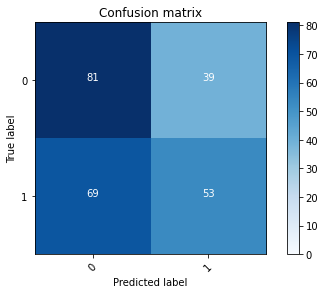

2022-08-20 13:49:56 - [Epoch Train: 7] loss: 0.0322, auc: 1.0000, acc: 0.9969, time: 52.00 s            
2022-08-20 13:49:56 - [Epoch Valid: 7] loss: 1.3279, auc: 0.5673, acc: 0.5537, time: 13.00 s


  7%|██▊                                      | 7/100 [07:20<1:40:23, 64.77s/it]

2022-08-20 13:49:56 - EPOCH: 8
2022-08-20 13:49:58 - Train Step 10/245, train_loss: 0.0189
2022-08-20 13:50:01 - Train Step 20/245, train_loss: 0.0160
2022-08-20 13:50:03 - Train Step 30/245, train_loss: 0.0146
2022-08-20 13:50:05 - Train Step 40/245, train_loss: 0.0180
2022-08-20 13:50:08 - Train Step 50/245, train_loss: 0.0181
2022-08-20 13:50:10 - Train Step 60/245, train_loss: 0.0167
2022-08-20 13:50:12 - Train Step 70/245, train_loss: 0.0170
2022-08-20 13:50:15 - Train Step 80/245, train_loss: 0.0185
2022-08-20 13:50:17 - Train Step 90/245, train_loss: 0.0181
2022-08-20 13:50:19 - Train Step 100/245, train_loss: 0.0178
2022-08-20 13:50:22 - Train Step 110/245, train_loss: 0.0176
2022-08-20 13:50:24 - Train Step 120/245, train_loss: 0.0177
2022-08-20 13:50:26 - Train Step 130/245, train_loss: 0.0178
2022-08-20 13:50:28 - Train Step 140/245, train_loss: 0.0179
2022-08-20 13:50:30 - Train Step 150/245, train_loss: 0.0180
2022-08-20 13:50:32 - Train Step 160/245, train_loss: 0.0175
20

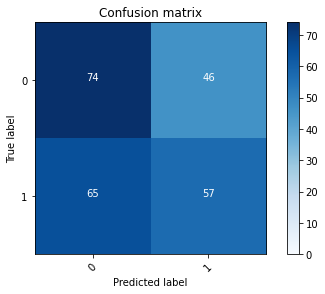

2022-08-20 13:51:04 - [Epoch Train: 8] loss: 0.0189, auc: 1.0000, acc: 0.9980, time: 54.00 s            
2022-08-20 13:51:04 - [Epoch Valid: 8] loss: 1.4346, auc: 0.5670, acc: 0.5413, time: 13.00 s


  8%|███▎                                     | 8/100 [08:28<1:40:44, 65.70s/it]

2022-08-20 13:51:04 - EPOCH: 9
2022-08-20 13:51:06 - Train Step 10/245, train_loss: 0.0091
2022-08-20 13:51:08 - Train Step 20/245, train_loss: 0.0105
2022-08-20 13:51:10 - Train Step 30/245, train_loss: 0.0107
2022-08-20 13:51:13 - Train Step 40/245, train_loss: 0.0105
2022-08-20 13:51:15 - Train Step 50/245, train_loss: 0.0113
2022-08-20 13:51:17 - Train Step 60/245, train_loss: 0.0109
2022-08-20 13:51:19 - Train Step 70/245, train_loss: 0.0107
2022-08-20 13:51:21 - Train Step 80/245, train_loss: 0.0135
2022-08-20 13:51:23 - Train Step 90/245, train_loss: 0.0128
2022-08-20 13:51:25 - Train Step 100/245, train_loss: 0.0125
2022-08-20 13:51:27 - Train Step 110/245, train_loss: 0.0120
2022-08-20 13:51:29 - Train Step 120/245, train_loss: 0.0118
2022-08-20 13:51:32 - Train Step 130/245, train_loss: 0.0116
2022-08-20 13:51:34 - Train Step 140/245, train_loss: 0.0114
2022-08-20 13:51:37 - Train Step 150/245, train_loss: 0.0113
2022-08-20 13:51:39 - Train Step 160/245, train_loss: 0.0111
20

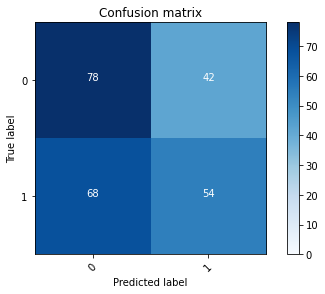

2022-08-20 13:52:11 - [Epoch Train: 9] loss: 0.0110, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 13:52:11 - [Epoch Valid: 9] loss: 1.5108, auc: 0.5648, acc: 0.5455, time: 13.00 s


  9%|███▋                                     | 9/100 [09:35<1:40:18, 66.14s/it]

2022-08-20 13:52:11 - EPOCH: 10
2022-08-20 13:52:13 - Train Step 10/245, train_loss: 0.0082
2022-08-20 13:52:15 - Train Step 20/245, train_loss: 0.0064
2022-08-20 13:52:17 - Train Step 30/245, train_loss: 0.0060
2022-08-20 13:52:19 - Train Step 40/245, train_loss: 0.0059
2022-08-20 13:52:21 - Train Step 50/245, train_loss: 0.0056
2022-08-20 13:52:23 - Train Step 60/245, train_loss: 0.0058
2022-08-20 13:52:25 - Train Step 70/245, train_loss: 0.0061
2022-08-20 13:52:27 - Train Step 80/245, train_loss: 0.0058
2022-08-20 13:52:29 - Train Step 90/245, train_loss: 0.0074
2022-08-20 13:52:31 - Train Step 100/245, train_loss: 0.0075
2022-08-20 13:52:33 - Train Step 110/245, train_loss: 0.0074
2022-08-20 13:52:35 - Train Step 120/245, train_loss: 0.0074
2022-08-20 13:52:37 - Train Step 130/245, train_loss: 0.0074
2022-08-20 13:52:39 - Train Step 140/245, train_loss: 0.0073
2022-08-20 13:52:41 - Train Step 150/245, train_loss: 0.0072
2022-08-20 13:52:43 - Train Step 160/245, train_loss: 0.0073
2

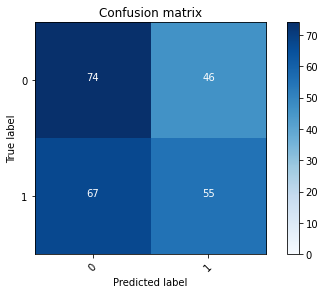

2022-08-20 13:53:14 - [Epoch Train: 10] loss: 0.0080, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 13:53:14 - [Epoch Valid: 10] loss: 1.6290, auc: 0.5607, acc: 0.5331, time: 13.00 s


 10%|████                                    | 10/100 [10:38<1:37:51, 65.24s/it]

2022-08-20 13:53:14 - EPOCH: 11
2022-08-20 13:53:16 - Train Step 10/245, train_loss: 0.0056
2022-08-20 13:53:18 - Train Step 20/245, train_loss: 0.0048
2022-08-20 13:53:21 - Train Step 30/245, train_loss: 0.0043
2022-08-20 13:53:23 - Train Step 40/245, train_loss: 0.0082
2022-08-20 13:53:25 - Train Step 50/245, train_loss: 0.0074
2022-08-20 13:53:27 - Train Step 60/245, train_loss: 0.0072
2022-08-20 13:53:29 - Train Step 70/245, train_loss: 0.0066
2022-08-20 13:53:31 - Train Step 80/245, train_loss: 0.0063
2022-08-20 13:53:33 - Train Step 90/245, train_loss: 0.0059
2022-08-20 13:53:35 - Train Step 100/245, train_loss: 0.0058
2022-08-20 13:53:37 - Train Step 110/245, train_loss: 0.0055
2022-08-20 13:53:39 - Train Step 120/245, train_loss: 0.0054
2022-08-20 13:53:41 - Train Step 130/245, train_loss: 0.0055
2022-08-20 13:53:43 - Train Step 140/245, train_loss: 0.0053
2022-08-20 13:53:45 - Train Step 150/245, train_loss: 0.0053
2022-08-20 13:53:47 - Train Step 160/245, train_loss: 0.0053
2

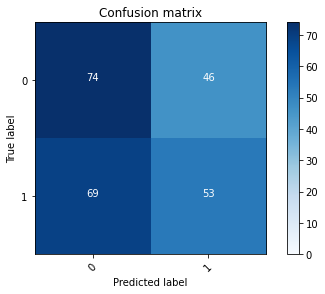

2022-08-20 13:54:19 - [Epoch Train: 11] loss: 0.0065, auc: 1.0000, acc: 0.9980, time: 51.00 s            
2022-08-20 13:54:19 - [Epoch Valid: 11] loss: 1.7893, auc: 0.5626, acc: 0.5248, time: 13.00 s


 11%|████▍                                   | 11/100 [11:43<1:36:33, 65.09s/it]

2022-08-20 13:54:19 - EPOCH: 12
2022-08-20 13:54:21 - Train Step 10/245, train_loss: 0.0017
2022-08-20 13:54:23 - Train Step 20/245, train_loss: 0.0020
2022-08-20 13:54:25 - Train Step 30/245, train_loss: 0.0027
2022-08-20 13:54:27 - Train Step 40/245, train_loss: 0.0024
2022-08-20 13:54:30 - Train Step 50/245, train_loss: 0.0024
2022-08-20 13:54:32 - Train Step 60/245, train_loss: 0.0027
2022-08-20 13:54:34 - Train Step 70/245, train_loss: 0.0038
2022-08-20 13:54:36 - Train Step 80/245, train_loss: 0.0037
2022-08-20 13:54:38 - Train Step 90/245, train_loss: 0.0039
2022-08-20 13:54:40 - Train Step 100/245, train_loss: 0.0037
2022-08-20 13:54:42 - Train Step 110/245, train_loss: 0.0038
2022-08-20 13:54:44 - Train Step 120/245, train_loss: 0.0037
2022-08-20 13:54:46 - Train Step 130/245, train_loss: 0.0036
2022-08-20 13:54:49 - Train Step 140/245, train_loss: 0.0036
2022-08-20 13:54:51 - Train Step 150/245, train_loss: 0.0035
2022-08-20 13:54:53 - Train Step 160/245, train_loss: 0.0036
2

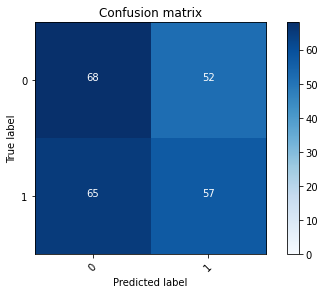

2022-08-20 13:55:24 - [Epoch Train: 12] loss: 0.0049, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 13:55:24 - [Epoch Valid: 12] loss: 1.7139, auc: 0.5667, acc: 0.5165, time: 13.00 s


 12%|████▊                                   | 12/100 [12:49<1:35:39, 65.22s/it]

2022-08-20 13:55:24 - EPOCH: 13
2022-08-20 13:55:27 - Train Step 10/245, train_loss: 0.0033
2022-08-20 13:55:29 - Train Step 20/245, train_loss: 0.0045
2022-08-20 13:55:31 - Train Step 30/245, train_loss: 0.0038
2022-08-20 13:55:33 - Train Step 40/245, train_loss: 0.0036
2022-08-20 13:55:35 - Train Step 50/245, train_loss: 0.0033
2022-08-20 13:55:37 - Train Step 60/245, train_loss: 0.0031
2022-08-20 13:55:39 - Train Step 70/245, train_loss: 0.0035
2022-08-20 13:55:41 - Train Step 80/245, train_loss: 0.0037
2022-08-20 13:55:44 - Train Step 90/245, train_loss: 0.0035
2022-08-20 13:55:46 - Train Step 100/245, train_loss: 0.0034
2022-08-20 13:55:48 - Train Step 110/245, train_loss: 0.0035
2022-08-20 13:55:50 - Train Step 120/245, train_loss: 0.0036
2022-08-20 13:55:52 - Train Step 130/245, train_loss: 0.0048
2022-08-20 13:55:54 - Train Step 140/245, train_loss: 0.0047
2022-08-20 13:55:56 - Train Step 150/245, train_loss: 0.0045
2022-08-20 13:55:58 - Train Step 160/245, train_loss: 0.0043
2

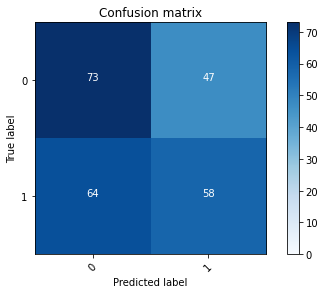

2022-08-20 13:56:31 - [Epoch Train: 13] loss: 0.0053, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 13:56:31 - [Epoch Valid: 13] loss: 1.9124, auc: 0.5645, acc: 0.5413, time: 14.00 s


 13%|█████▏                                  | 13/100 [13:55<1:35:14, 65.68s/it]

2022-08-20 13:56:31 - EPOCH: 14
2022-08-20 13:56:34 - Train Step 10/245, train_loss: 0.0047
2022-08-20 13:56:36 - Train Step 20/245, train_loss: 0.0033
2022-08-20 13:56:38 - Train Step 30/245, train_loss: 0.0031
2022-08-20 13:56:40 - Train Step 40/245, train_loss: 0.0029
2022-08-20 13:56:42 - Train Step 50/245, train_loss: 0.0030
2022-08-20 13:56:44 - Train Step 60/245, train_loss: 0.0029
2022-08-20 13:56:46 - Train Step 70/245, train_loss: 0.0028
2022-08-20 13:56:48 - Train Step 80/245, train_loss: 0.0028
2022-08-20 13:56:50 - Train Step 90/245, train_loss: 0.0060
2022-08-20 13:56:52 - Train Step 100/245, train_loss: 0.0058
2022-08-20 13:56:54 - Train Step 110/245, train_loss: 0.0080
2022-08-20 13:56:56 - Train Step 120/245, train_loss: 0.0075
2022-08-20 13:56:58 - Train Step 130/245, train_loss: 0.0071
2022-08-20 13:57:00 - Train Step 140/245, train_loss: 0.0069
2022-08-20 13:57:02 - Train Step 150/245, train_loss: 0.0065
2022-08-20 13:57:04 - Train Step 160/245, train_loss: 0.0064
2

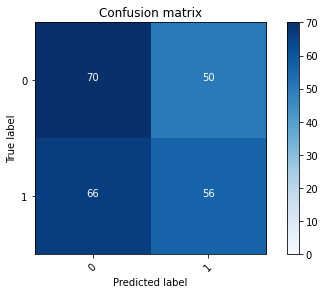

2022-08-20 13:57:33 - [Epoch Train: 14] loss: 0.0052, auc: 1.0000, acc: 0.9980, time: 49.00 s            
2022-08-20 13:57:33 - [Epoch Valid: 14] loss: 1.6943, auc: 0.5702, acc: 0.5207, time: 12.00 s


 14%|█████▌                                  | 14/100 [14:57<1:32:26, 64.49s/it]

2022-08-20 13:57:33 - EPOCH: 15
2022-08-20 13:57:35 - Train Step 10/245, train_loss: 0.0015
2022-08-20 13:57:37 - Train Step 20/245, train_loss: 0.0017
2022-08-20 13:57:39 - Train Step 30/245, train_loss: 0.0021
2022-08-20 13:57:41 - Train Step 40/245, train_loss: 0.0021
2022-08-20 13:57:43 - Train Step 50/245, train_loss: 0.0026
2022-08-20 13:57:45 - Train Step 60/245, train_loss: 0.0027
2022-08-20 13:57:46 - Train Step 70/245, train_loss: 0.0026
2022-08-20 13:57:48 - Train Step 80/245, train_loss: 0.0025
2022-08-20 13:57:50 - Train Step 90/245, train_loss: 0.0025
2022-08-20 13:57:52 - Train Step 100/245, train_loss: 0.0024
2022-08-20 13:57:54 - Train Step 110/245, train_loss: 0.0024
2022-08-20 13:57:56 - Train Step 120/245, train_loss: 0.0024
2022-08-20 13:57:58 - Train Step 130/245, train_loss: 0.0023
2022-08-20 13:58:00 - Train Step 140/245, train_loss: 0.0030
2022-08-20 13:58:02 - Train Step 150/245, train_loss: 0.0029
2022-08-20 13:58:04 - Train Step 160/245, train_loss: 0.0028
2

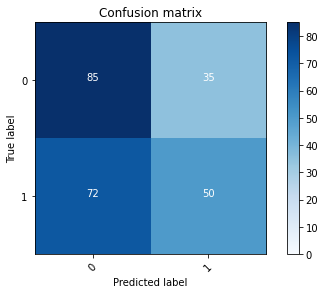

2022-08-20 13:58:32 - [Epoch Train: 15] loss: 0.0038, auc: 1.0000, acc: 0.9990, time: 47.00 s            
2022-08-20 13:58:32 - [Epoch Valid: 15] loss: 1.9061, auc: 0.5676, acc: 0.5579, time: 11.00 s
2022-08-20 13:58:32 - acc improved from 0.5579 to 0.5579. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_13-42-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e15-loss1.906-acc0.558-auc0.568.pth'


 15%|██████                                  | 15/100 [15:56<1:29:06, 62.90s/it]

2022-08-20 13:58:32 - EPOCH: 16
2022-08-20 13:58:34 - Train Step 10/245, train_loss: 0.0012
2022-08-20 13:58:36 - Train Step 20/245, train_loss: 0.0019
2022-08-20 13:58:38 - Train Step 30/245, train_loss: 0.0054
2022-08-20 13:58:40 - Train Step 40/245, train_loss: 0.0046
2022-08-20 13:58:42 - Train Step 50/245, train_loss: 0.0041
2022-08-20 13:58:44 - Train Step 60/245, train_loss: 0.0038
2022-08-20 13:58:46 - Train Step 70/245, train_loss: 0.0035
2022-08-20 13:58:48 - Train Step 80/245, train_loss: 0.0090
2022-08-20 13:58:49 - Train Step 90/245, train_loss: 0.0083
2022-08-20 13:58:51 - Train Step 100/245, train_loss: 0.0076
2022-08-20 13:58:53 - Train Step 110/245, train_loss: 0.0071
2022-08-20 13:58:55 - Train Step 120/245, train_loss: 0.0067
2022-08-20 13:58:57 - Train Step 130/245, train_loss: 0.0064
2022-08-20 13:58:59 - Train Step 140/245, train_loss: 0.0062
2022-08-20 13:59:01 - Train Step 150/245, train_loss: 0.0060
2022-08-20 13:59:03 - Train Step 160/245, train_loss: 0.0057
2

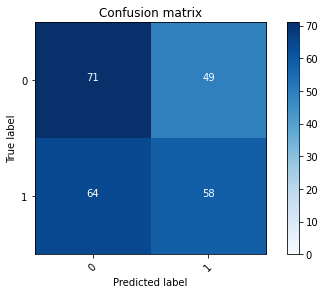

2022-08-20 13:59:32 - [Epoch Train: 16] loss: 0.0044, auc: 1.0000, acc: 0.9990, time: 47.00 s            
2022-08-20 13:59:32 - [Epoch Valid: 16] loss: 1.9580, auc: 0.5669, acc: 0.5331, time: 11.00 s


 16%|██████▍                                 | 16/100 [16:56<1:26:46, 61.98s/it]

2022-08-20 13:59:32 - EPOCH: 17
2022-08-20 13:59:34 - Train Step 10/245, train_loss: 0.0018
2022-08-20 13:59:36 - Train Step 20/245, train_loss: 0.0128
2022-08-20 13:59:38 - Train Step 30/245, train_loss: 0.0090
2022-08-20 13:59:40 - Train Step 40/245, train_loss: 0.0072
2022-08-20 13:59:42 - Train Step 50/245, train_loss: 0.0059
2022-08-20 13:59:44 - Train Step 60/245, train_loss: 0.0051
2022-08-20 13:59:45 - Train Step 70/245, train_loss: 0.0046
2022-08-20 13:59:47 - Train Step 80/245, train_loss: 0.0043
2022-08-20 13:59:49 - Train Step 90/245, train_loss: 0.0078
2022-08-20 13:59:51 - Train Step 100/245, train_loss: 0.0070
2022-08-20 13:59:53 - Train Step 110/245, train_loss: 0.0067
2022-08-20 13:59:55 - Train Step 120/245, train_loss: 0.0065
2022-08-20 13:59:57 - Train Step 130/245, train_loss: 0.0061
2022-08-20 13:59:59 - Train Step 140/245, train_loss: 0.0058
2022-08-20 14:00:01 - Train Step 150/245, train_loss: 0.0056
2022-08-20 14:00:03 - Train Step 160/245, train_loss: 0.0055
2

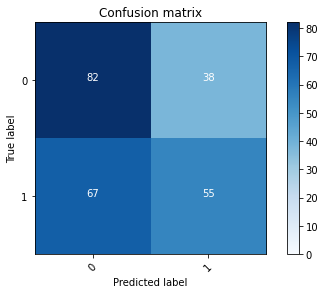

2022-08-20 14:00:31 - [Epoch Train: 17] loss: 0.0041, auc: 1.0000, acc: 0.9990, time: 47.00 s            
2022-08-20 14:00:31 - [Epoch Valid: 17] loss: 2.0710, auc: 0.5679, acc: 0.5661, time: 11.00 s
2022-08-20 14:00:31 - acc improved from 0.5579 to 0.5661. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_13-42-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e17-loss2.071-acc0.566-auc0.568.pth'


 17%|██████▊                                 | 17/100 [17:55<1:24:29, 61.08s/it]

2022-08-20 14:00:31 - EPOCH: 18
2022-08-20 14:00:33 - Train Step 10/245, train_loss: 0.0011
2022-08-20 14:00:35 - Train Step 20/245, train_loss: 0.0013
2022-08-20 14:00:37 - Train Step 30/245, train_loss: 0.0012
2022-08-20 14:00:39 - Train Step 40/245, train_loss: 0.0011
2022-08-20 14:00:41 - Train Step 50/245, train_loss: 0.0013
2022-08-20 14:00:43 - Train Step 60/245, train_loss: 0.0013
2022-08-20 14:00:45 - Train Step 70/245, train_loss: 0.0015
2022-08-20 14:00:47 - Train Step 80/245, train_loss: 0.0015
2022-08-20 14:00:48 - Train Step 90/245, train_loss: 0.0014
2022-08-20 14:00:50 - Train Step 100/245, train_loss: 0.0065
2022-08-20 14:00:52 - Train Step 110/245, train_loss: 0.0061
2022-08-20 14:00:54 - Train Step 120/245, train_loss: 0.0058
2022-08-20 14:00:56 - Train Step 130/245, train_loss: 0.0056
2022-08-20 14:00:58 - Train Step 140/245, train_loss: 0.0054
2022-08-20 14:01:00 - Train Step 150/245, train_loss: 0.0073
2022-08-20 14:01:02 - Train Step 160/245, train_loss: 0.0070
2

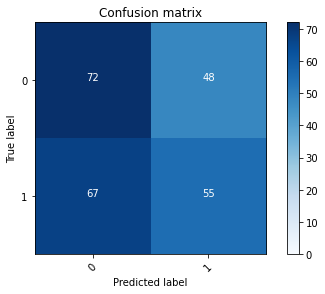

2022-08-20 14:01:31 - [Epoch Train: 18] loss: 0.0051, auc: 1.0000, acc: 0.9980, time: 48.00 s            
2022-08-20 14:01:31 - [Epoch Valid: 18] loss: 1.9636, auc: 0.5669, acc: 0.5248, time: 11.00 s


 18%|███████▏                                | 18/100 [18:55<1:23:02, 60.76s/it]

2022-08-20 14:01:31 - EPOCH: 19
2022-08-20 14:01:33 - Train Step 10/245, train_loss: 0.0017
2022-08-20 14:01:35 - Train Step 20/245, train_loss: 0.0015
2022-08-20 14:01:37 - Train Step 30/245, train_loss: 0.0014
2022-08-20 14:01:39 - Train Step 40/245, train_loss: 0.0014
2022-08-20 14:01:41 - Train Step 50/245, train_loss: 0.0013
2022-08-20 14:01:42 - Train Step 60/245, train_loss: 0.0013
2022-08-20 14:01:44 - Train Step 70/245, train_loss: 0.0020
2022-08-20 14:01:46 - Train Step 80/245, train_loss: 0.0019
2022-08-20 14:01:48 - Train Step 90/245, train_loss: 0.0018
2022-08-20 14:01:50 - Train Step 100/245, train_loss: 0.0017
2022-08-20 14:01:52 - Train Step 110/245, train_loss: 0.0017
2022-08-20 14:01:54 - Train Step 120/245, train_loss: 0.0016
2022-08-20 14:01:56 - Train Step 130/245, train_loss: 0.0016
2022-08-20 14:01:58 - Train Step 140/245, train_loss: 0.0016
2022-08-20 14:02:00 - Train Step 150/245, train_loss: 0.0015
2022-08-20 14:02:02 - Train Step 160/245, train_loss: 0.0015
2

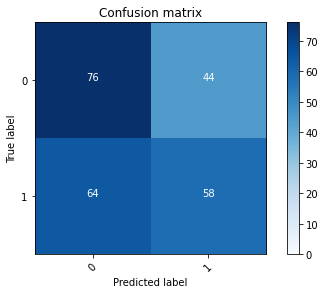

2022-08-20 14:02:31 - [Epoch Train: 19] loss: 0.0025, auc: 1.0000, acc: 0.9990, time: 48.00 s            
2022-08-20 14:02:31 - [Epoch Valid: 19] loss: 2.0525, auc: 0.5643, acc: 0.5537, time: 12.00 s


 19%|███████▌                                | 19/100 [19:55<1:21:44, 60.55s/it]

2022-08-20 14:02:31 - EPOCH: 20
2022-08-20 14:02:33 - Train Step 10/245, train_loss: 0.0008
2022-08-20 14:02:35 - Train Step 20/245, train_loss: 0.0009
2022-08-20 14:02:37 - Train Step 30/245, train_loss: 0.0009
2022-08-20 14:02:39 - Train Step 40/245, train_loss: 0.0007
2022-08-20 14:02:41 - Train Step 50/245, train_loss: 0.0012
2022-08-20 14:02:43 - Train Step 60/245, train_loss: 0.0084
2022-08-20 14:02:45 - Train Step 70/245, train_loss: 0.0074
2022-08-20 14:02:47 - Train Step 80/245, train_loss: 0.0068
2022-08-20 14:02:48 - Train Step 90/245, train_loss: 0.0061
2022-08-20 14:02:50 - Train Step 100/245, train_loss: 0.0056
2022-08-20 14:02:52 - Train Step 110/245, train_loss: 0.0053
2022-08-20 14:02:54 - Train Step 120/245, train_loss: 0.0049
2022-08-20 14:02:56 - Train Step 130/245, train_loss: 0.0046
2022-08-20 14:02:58 - Train Step 140/245, train_loss: 0.0043
2022-08-20 14:03:00 - Train Step 150/245, train_loss: 0.0041
2022-08-20 14:03:02 - Train Step 160/245, train_loss: 0.0039
2

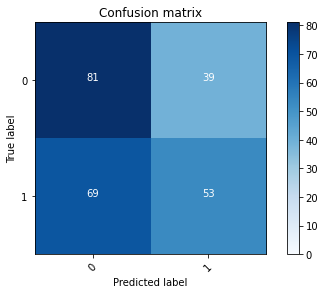

2022-08-20 14:03:30 - [Epoch Train: 20] loss: 0.0040, auc: 1.0000, acc: 0.9980, time: 47.00 s            
2022-08-20 14:03:30 - [Epoch Valid: 20] loss: 2.1980, auc: 0.5620, acc: 0.5537, time: 11.00 s


 20%|████████                                | 20/100 [20:55<1:20:18, 60.23s/it]

2022-08-20 14:03:30 - EPOCH: 21
2022-08-20 14:03:32 - Train Step 10/245, train_loss: 0.0011
2022-08-20 14:03:34 - Train Step 20/245, train_loss: 0.0030
2022-08-20 14:03:36 - Train Step 30/245, train_loss: 0.0027
2022-08-20 14:03:38 - Train Step 40/245, train_loss: 0.0022
2022-08-20 14:03:40 - Train Step 50/245, train_loss: 0.0023
2022-08-20 14:03:42 - Train Step 60/245, train_loss: 0.0020
2022-08-20 14:03:44 - Train Step 70/245, train_loss: 0.0018
2022-08-20 14:03:45 - Train Step 80/245, train_loss: 0.0017
2022-08-20 14:03:47 - Train Step 90/245, train_loss: 0.0016
2022-08-20 14:03:49 - Train Step 100/245, train_loss: 0.0016
2022-08-20 14:03:51 - Train Step 110/245, train_loss: 0.0016
2022-08-20 14:03:53 - Train Step 120/245, train_loss: 0.0048
2022-08-20 14:03:55 - Train Step 130/245, train_loss: 0.0046
2022-08-20 14:03:57 - Train Step 140/245, train_loss: 0.0044
2022-08-20 14:03:59 - Train Step 150/245, train_loss: 0.0042
2022-08-20 14:04:00 - Train Step 160/245, train_loss: 0.0040
2

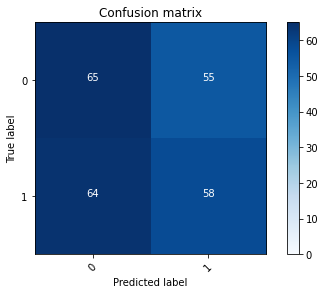

2022-08-20 14:04:28 - [Epoch Train: 21] loss: 0.0029, auc: 1.0000, acc: 0.9990, time: 46.00 s            
2022-08-20 14:04:28 - [Epoch Valid: 21] loss: 2.0424, auc: 0.5639, acc: 0.5083, time: 12.00 s


 21%|████████▍                               | 21/100 [21:53<1:18:27, 59.59s/it]

2022-08-20 14:04:28 - EPOCH: 22
2022-08-20 14:04:30 - Train Step 10/245, train_loss: 0.0006
2022-08-20 14:04:32 - Train Step 20/245, train_loss: 0.0006
2022-08-20 14:04:34 - Train Step 30/245, train_loss: 0.0006
2022-08-20 14:04:36 - Train Step 40/245, train_loss: 0.0006
2022-08-20 14:04:38 - Train Step 50/245, train_loss: 0.0006
2022-08-20 14:04:40 - Train Step 60/245, train_loss: 0.0007
2022-08-20 14:04:42 - Train Step 70/245, train_loss: 0.0007
2022-08-20 14:04:44 - Train Step 80/245, train_loss: 0.0007
2022-08-20 14:04:46 - Train Step 90/245, train_loss: 0.0007
2022-08-20 14:04:47 - Train Step 100/245, train_loss: 0.0007
2022-08-20 14:04:49 - Train Step 110/245, train_loss: 0.0007
2022-08-20 14:04:51 - Train Step 120/245, train_loss: 0.0008
2022-08-20 14:04:53 - Train Step 130/245, train_loss: 0.0008
2022-08-20 14:04:55 - Train Step 140/245, train_loss: 0.0008
2022-08-20 14:04:57 - Train Step 150/245, train_loss: 0.0008
2022-08-20 14:04:59 - Train Step 160/245, train_loss: 0.0008
2

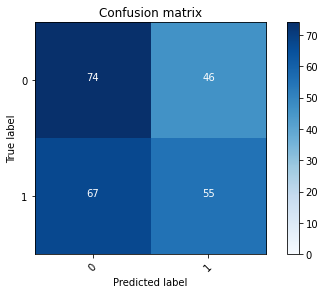

2022-08-20 14:05:27 - [Epoch Train: 22] loss: 0.0032, auc: 1.0000, acc: 0.9980, time: 46.00 s            
2022-08-20 14:05:27 - [Epoch Valid: 22] loss: 2.1878, auc: 0.5591, acc: 0.5331, time: 12.00 s


 22%|████████▊                               | 22/100 [22:52<1:17:11, 59.38s/it]

2022-08-20 14:05:27 - EPOCH: 23
2022-08-20 14:05:30 - Train Step 10/245, train_loss: 0.0006
2022-08-20 14:05:32 - Train Step 20/245, train_loss: 0.0124
2022-08-20 14:05:34 - Train Step 30/245, train_loss: 0.0086
2022-08-20 14:05:35 - Train Step 40/245, train_loss: 0.0066
2022-08-20 14:05:37 - Train Step 50/245, train_loss: 0.0054
2022-08-20 14:05:39 - Train Step 60/245, train_loss: 0.0045
2022-08-20 14:05:41 - Train Step 70/245, train_loss: 0.0040
2022-08-20 14:05:43 - Train Step 80/245, train_loss: 0.0036
2022-08-20 14:05:45 - Train Step 90/245, train_loss: 0.0035
2022-08-20 14:05:47 - Train Step 100/245, train_loss: 0.0033
2022-08-20 14:05:49 - Train Step 110/245, train_loss: 0.0030
2022-08-20 14:05:51 - Train Step 120/245, train_loss: 0.0029
2022-08-20 14:05:53 - Train Step 130/245, train_loss: 0.0073
2022-08-20 14:05:55 - Train Step 140/245, train_loss: 0.0068
2022-08-20 14:05:57 - Train Step 150/245, train_loss: 0.0065
2022-08-20 14:05:59 - Train Step 160/245, train_loss: 0.0061
2

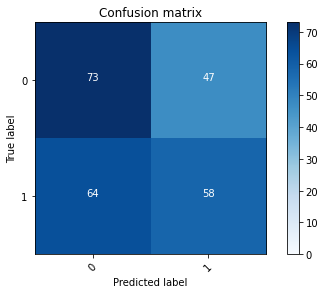

2022-08-20 14:06:27 - [Epoch Train: 23] loss: 0.0042, auc: 1.0000, acc: 0.9980, time: 47.00 s            
2022-08-20 14:06:27 - [Epoch Valid: 23] loss: 2.2880, auc: 0.5587, acc: 0.5413, time: 12.00 s


 23%|█████████▏                              | 23/100 [23:52<1:16:19, 59.48s/it]

2022-08-20 14:06:27 - EPOCH: 24
2022-08-20 14:06:29 - Train Step 10/245, train_loss: 0.0011
2022-08-20 14:06:31 - Train Step 20/245, train_loss: 0.0008
2022-08-20 14:06:33 - Train Step 30/245, train_loss: 0.0009
2022-08-20 14:06:35 - Train Step 40/245, train_loss: 0.0008
2022-08-20 14:06:37 - Train Step 50/245, train_loss: 0.0008
2022-08-20 14:06:39 - Train Step 60/245, train_loss: 0.0007
2022-08-20 14:06:40 - Train Step 70/245, train_loss: 0.0007
2022-08-20 14:06:42 - Train Step 80/245, train_loss: 0.0010
2022-08-20 14:06:44 - Train Step 90/245, train_loss: 0.0036
2022-08-20 14:06:46 - Train Step 100/245, train_loss: 0.0033
2022-08-20 14:06:48 - Train Step 110/245, train_loss: 0.0031
2022-08-20 14:06:50 - Train Step 120/245, train_loss: 0.0028
2022-08-20 14:06:52 - Train Step 130/245, train_loss: 0.0027
2022-08-20 14:06:53 - Train Step 140/245, train_loss: 0.0025
2022-08-20 14:06:55 - Train Step 150/245, train_loss: 0.0048
2022-08-20 14:06:57 - Train Step 160/245, train_loss: 0.0046
2

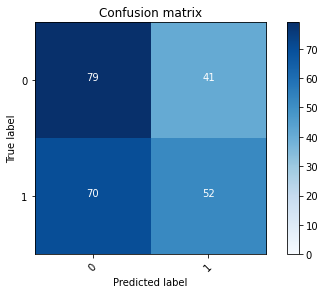

2022-08-20 14:07:25 - [Epoch Train: 24] loss: 0.0033, auc: 1.0000, acc: 0.9980, time: 46.00 s            
2022-08-20 14:07:25 - [Epoch Valid: 24] loss: 2.2483, auc: 0.5587, acc: 0.5413, time: 12.00 s


 24%|█████████▌                              | 24/100 [24:50<1:14:52, 59.11s/it]

2022-08-20 14:07:25 - EPOCH: 25
2022-08-20 14:07:27 - Train Step 10/245, train_loss: 0.0025
2022-08-20 14:07:29 - Train Step 20/245, train_loss: 0.0014
2022-08-20 14:07:31 - Train Step 30/245, train_loss: 0.0012
2022-08-20 14:07:33 - Train Step 40/245, train_loss: 0.0010
2022-08-20 14:07:35 - Train Step 50/245, train_loss: 0.0009
2022-08-20 14:07:37 - Train Step 60/245, train_loss: 0.0021
2022-08-20 14:07:39 - Train Step 70/245, train_loss: 0.0019
2022-08-20 14:07:41 - Train Step 80/245, train_loss: 0.0017
2022-08-20 14:07:43 - Train Step 90/245, train_loss: 0.0016
2022-08-20 14:07:45 - Train Step 100/245, train_loss: 0.0015
2022-08-20 14:07:47 - Train Step 110/245, train_loss: 0.0014
2022-08-20 14:07:49 - Train Step 120/245, train_loss: 0.0013
2022-08-20 14:07:50 - Train Step 130/245, train_loss: 0.0053
2022-08-20 14:07:52 - Train Step 140/245, train_loss: 0.0050
2022-08-20 14:07:54 - Train Step 150/245, train_loss: 0.0047
2022-08-20 14:07:56 - Train Step 160/245, train_loss: 0.0045
2

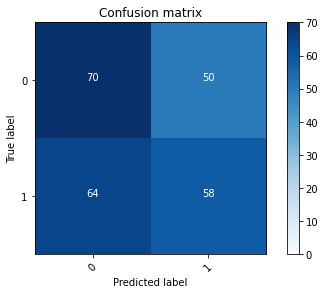

2022-08-20 14:08:24 - [Epoch Train: 25] loss: 0.0031, auc: 1.0000, acc: 0.9990, time: 46.00 s            
2022-08-20 14:08:24 - [Epoch Valid: 25] loss: 2.2883, auc: 0.5582, acc: 0.5289, time: 12.00 s


 25%|██████████                              | 25/100 [25:49<1:13:51, 59.08s/it]

2022-08-20 14:08:24 - EPOCH: 26
2022-08-20 14:08:26 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:08:28 - Train Step 20/245, train_loss: 0.0188
2022-08-20 14:08:30 - Train Step 30/245, train_loss: 0.0128
2022-08-20 14:08:32 - Train Step 40/245, train_loss: 0.0099
2022-08-20 14:08:34 - Train Step 50/245, train_loss: 0.0085
2022-08-20 14:08:36 - Train Step 60/245, train_loss: 0.0072
2022-08-20 14:08:38 - Train Step 70/245, train_loss: 0.0062
2022-08-20 14:08:39 - Train Step 80/245, train_loss: 0.0055
2022-08-20 14:08:41 - Train Step 90/245, train_loss: 0.0050
2022-08-20 14:08:43 - Train Step 100/245, train_loss: 0.0046
2022-08-20 14:08:45 - Train Step 110/245, train_loss: 0.0042
2022-08-20 14:08:47 - Train Step 120/245, train_loss: 0.0039
2022-08-20 14:08:49 - Train Step 130/245, train_loss: 0.0037
2022-08-20 14:08:50 - Train Step 140/245, train_loss: 0.0035
2022-08-20 14:08:52 - Train Step 150/245, train_loss: 0.0033
2022-08-20 14:08:54 - Train Step 160/245, train_loss: 0.0031
2

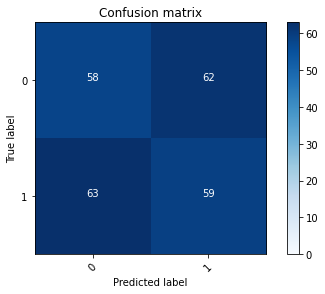

2022-08-20 14:09:22 - [Epoch Train: 26] loss: 0.0040, auc: 1.0000, acc: 0.9980, time: 45.00 s            
2022-08-20 14:09:22 - [Epoch Valid: 26] loss: 2.4223, auc: 0.5578, acc: 0.4835, time: 11.00 s


 26%|██████████▍                             | 26/100 [26:46<1:12:20, 58.65s/it]

2022-08-20 14:09:22 - EPOCH: 27
2022-08-20 14:09:24 - Train Step 10/245, train_loss: 0.0015
2022-08-20 14:09:26 - Train Step 20/245, train_loss: 0.0012
2022-08-20 14:09:28 - Train Step 30/245, train_loss: 0.0009
2022-08-20 14:09:30 - Train Step 40/245, train_loss: 0.0009
2022-08-20 14:09:32 - Train Step 50/245, train_loss: 0.0021
2022-08-20 14:09:34 - Train Step 60/245, train_loss: 0.0018
2022-08-20 14:09:36 - Train Step 70/245, train_loss: 0.0016
2022-08-20 14:09:38 - Train Step 80/245, train_loss: 0.0014
2022-08-20 14:09:39 - Train Step 90/245, train_loss: 0.0013
2022-08-20 14:09:41 - Train Step 100/245, train_loss: 0.0012
2022-08-20 14:09:43 - Train Step 110/245, train_loss: 0.0011
2022-08-20 14:09:45 - Train Step 120/245, train_loss: 0.0051
2022-08-20 14:09:47 - Train Step 130/245, train_loss: 0.0048
2022-08-20 14:09:49 - Train Step 140/245, train_loss: 0.0045
2022-08-20 14:09:51 - Train Step 150/245, train_loss: 0.0042
2022-08-20 14:09:53 - Train Step 160/245, train_loss: 0.0040
2

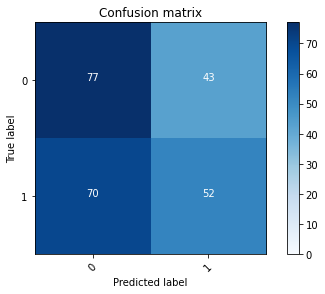

2022-08-20 14:10:21 - [Epoch Train: 27] loss: 0.0028, auc: 1.0000, acc: 0.9990, time: 46.00 s            
2022-08-20 14:10:21 - [Epoch Valid: 27] loss: 2.3692, auc: 0.5548, acc: 0.5331, time: 11.00 s


 27%|██████████▊                             | 27/100 [27:45<1:11:22, 58.67s/it]

2022-08-20 14:10:21 - EPOCH: 28
2022-08-20 14:10:23 - Train Step 10/245, train_loss: 0.0003
2022-08-20 14:10:25 - Train Step 20/245, train_loss: 0.0037
2022-08-20 14:10:27 - Train Step 30/245, train_loss: 0.0026
2022-08-20 14:10:29 - Train Step 40/245, train_loss: 0.0022
2022-08-20 14:10:30 - Train Step 50/245, train_loss: 0.0018
2022-08-20 14:10:32 - Train Step 60/245, train_loss: 0.0016
2022-08-20 14:10:34 - Train Step 70/245, train_loss: 0.0014
2022-08-20 14:10:36 - Train Step 80/245, train_loss: 0.0014
2022-08-20 14:10:38 - Train Step 90/245, train_loss: 0.0012
2022-08-20 14:10:40 - Train Step 100/245, train_loss: 0.0012
2022-08-20 14:10:42 - Train Step 110/245, train_loss: 0.0011
2022-08-20 14:10:44 - Train Step 120/245, train_loss: 0.0011
2022-08-20 14:10:46 - Train Step 130/245, train_loss: 0.0010
2022-08-20 14:10:48 - Train Step 140/245, train_loss: 0.0010
2022-08-20 14:10:50 - Train Step 150/245, train_loss: 0.0010
2022-08-20 14:10:51 - Train Step 160/245, train_loss: 0.0009
2

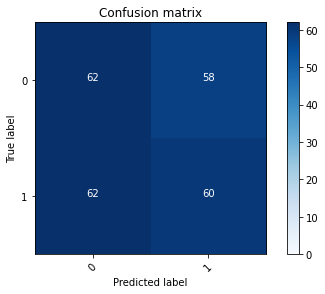

2022-08-20 14:11:21 - [Epoch Train: 28] loss: 0.0031, auc: 1.0000, acc: 0.9990, time: 47.00 s            
2022-08-20 14:11:21 - [Epoch Valid: 28] loss: 2.3023, auc: 0.5578, acc: 0.5041, time: 12.00 s


 28%|███████████▏                            | 28/100 [28:46<1:11:02, 59.20s/it]

2022-08-20 14:11:21 - EPOCH: 29
2022-08-20 14:11:24 - Train Step 10/245, train_loss: 0.0009
2022-08-20 14:11:26 - Train Step 20/245, train_loss: 0.0007
2022-08-20 14:11:28 - Train Step 30/245, train_loss: 0.0005
2022-08-20 14:11:30 - Train Step 40/245, train_loss: 0.0006
2022-08-20 14:11:32 - Train Step 50/245, train_loss: 0.0022
2022-08-20 14:11:34 - Train Step 60/245, train_loss: 0.0019
2022-08-20 14:11:36 - Train Step 70/245, train_loss: 0.0059
2022-08-20 14:11:38 - Train Step 80/245, train_loss: 0.0053
2022-08-20 14:11:40 - Train Step 90/245, train_loss: 0.0047
2022-08-20 14:11:42 - Train Step 100/245, train_loss: 0.0043
2022-08-20 14:11:44 - Train Step 110/245, train_loss: 0.0040
2022-08-20 14:11:46 - Train Step 120/245, train_loss: 0.0037
2022-08-20 14:11:49 - Train Step 130/245, train_loss: 0.0034
2022-08-20 14:11:51 - Train Step 140/245, train_loss: 0.0032
2022-08-20 14:11:53 - Train Step 150/245, train_loss: 0.0030
2022-08-20 14:11:55 - Train Step 160/245, train_loss: 0.0029
2

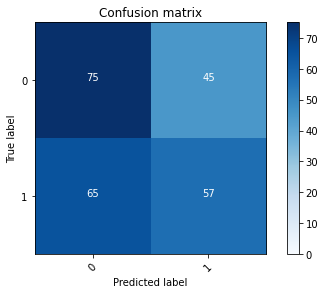

2022-08-20 14:12:27 - [Epoch Train: 29] loss: 0.0021, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 14:12:27 - [Epoch Valid: 29] loss: 2.3653, auc: 0.5574, acc: 0.5455, time: 13.00 s


 29%|███████████▌                            | 29/100 [29:52<1:12:32, 61.30s/it]

2022-08-20 14:12:27 - EPOCH: 30
2022-08-20 14:12:30 - Train Step 10/245, train_loss: 0.0004
2022-08-20 14:12:32 - Train Step 20/245, train_loss: 0.0003
2022-08-20 14:12:34 - Train Step 30/245, train_loss: 0.0004
2022-08-20 14:12:36 - Train Step 40/245, train_loss: 0.0004
2022-08-20 14:12:38 - Train Step 50/245, train_loss: 0.0004
2022-08-20 14:12:40 - Train Step 60/245, train_loss: 0.0004
2022-08-20 14:12:42 - Train Step 70/245, train_loss: 0.0004
2022-08-20 14:12:45 - Train Step 80/245, train_loss: 0.0004
2022-08-20 14:12:47 - Train Step 90/245, train_loss: 0.0028
2022-08-20 14:12:49 - Train Step 100/245, train_loss: 0.0063
2022-08-20 14:12:51 - Train Step 110/245, train_loss: 0.0058
2022-08-20 14:12:53 - Train Step 120/245, train_loss: 0.0053
2022-08-20 14:12:55 - Train Step 130/245, train_loss: 0.0049
2022-08-20 14:12:58 - Train Step 140/245, train_loss: 0.0046
2022-08-20 14:13:00 - Train Step 150/245, train_loss: 0.0043
2022-08-20 14:13:02 - Train Step 160/245, train_loss: 0.0041
2

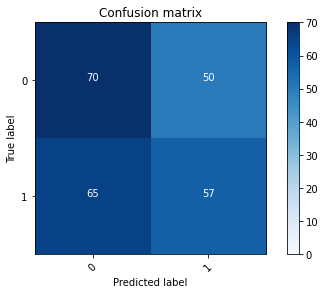

2022-08-20 14:13:33 - [Epoch Train: 30] loss: 0.0028, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 14:13:33 - [Epoch Valid: 30] loss: 2.3588, auc: 0.5581, acc: 0.5248, time: 13.00 s


 30%|████████████                            | 30/100 [30:58<1:13:10, 62.72s/it]

2022-08-20 14:13:33 - EPOCH: 31
2022-08-20 14:13:36 - Train Step 10/245, train_loss: 0.0007
2022-08-20 14:13:38 - Train Step 20/245, train_loss: 0.0005
2022-08-20 14:13:40 - Train Step 30/245, train_loss: 0.0004
2022-08-20 14:13:43 - Train Step 40/245, train_loss: 0.0086
2022-08-20 14:13:45 - Train Step 50/245, train_loss: 0.0070
2022-08-20 14:13:47 - Train Step 60/245, train_loss: 0.0058
2022-08-20 14:13:49 - Train Step 70/245, train_loss: 0.0050
2022-08-20 14:13:51 - Train Step 80/245, train_loss: 0.0044
2022-08-20 14:13:53 - Train Step 90/245, train_loss: 0.0040
2022-08-20 14:13:56 - Train Step 100/245, train_loss: 0.0036
2022-08-20 14:13:58 - Train Step 110/245, train_loss: 0.0033
2022-08-20 14:14:00 - Train Step 120/245, train_loss: 0.0030
2022-08-20 14:14:02 - Train Step 130/245, train_loss: 0.0029
2022-08-20 14:14:04 - Train Step 140/245, train_loss: 0.0027
2022-08-20 14:14:06 - Train Step 150/245, train_loss: 0.0025
2022-08-20 14:14:08 - Train Step 160/245, train_loss: 0.0024
2

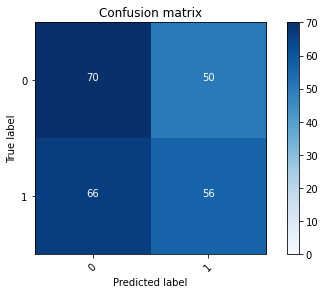

2022-08-20 14:14:42 - [Epoch Train: 31] loss: 0.0016, auc: 1.0000, acc: 0.9990, time: 55.00 s            
2022-08-20 14:14:42 - [Epoch Valid: 31] loss: 2.5710, auc: 0.5585, acc: 0.5207, time: 13.00 s


 31%|████████████▍                           | 31/100 [32:06<1:14:05, 64.43s/it]

2022-08-20 14:14:42 - EPOCH: 32
2022-08-20 14:14:44 - Train Step 10/245, train_loss: 0.0141
2022-08-20 14:14:46 - Train Step 20/245, train_loss: 0.0072
2022-08-20 14:14:48 - Train Step 30/245, train_loss: 0.0050
2022-08-20 14:14:50 - Train Step 40/245, train_loss: 0.0038
2022-08-20 14:14:53 - Train Step 50/245, train_loss: 0.0031
2022-08-20 14:14:55 - Train Step 60/245, train_loss: 0.0026
2022-08-20 14:14:57 - Train Step 70/245, train_loss: 0.0023
2022-08-20 14:14:59 - Train Step 80/245, train_loss: 0.0021
2022-08-20 14:15:02 - Train Step 90/245, train_loss: 0.0019
2022-08-20 14:15:04 - Train Step 100/245, train_loss: 0.0017
2022-08-20 14:15:06 - Train Step 110/245, train_loss: 0.0016
2022-08-20 14:15:08 - Train Step 120/245, train_loss: 0.0015
2022-08-20 14:15:11 - Train Step 130/245, train_loss: 0.0014
2022-08-20 14:15:13 - Train Step 140/245, train_loss: 0.0013
2022-08-20 14:15:15 - Train Step 150/245, train_loss: 0.0012
2022-08-20 14:15:18 - Train Step 160/245, train_loss: 0.0012
2

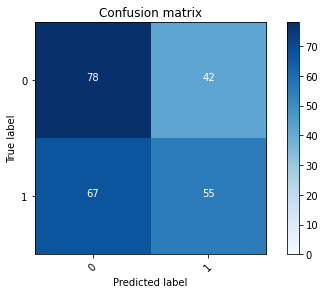

2022-08-20 14:15:49 - [Epoch Train: 32] loss: 0.0015, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 14:15:49 - [Epoch Valid: 32] loss: 2.6710, auc: 0.5568, acc: 0.5496, time: 13.00 s


 32%|████████████▊                           | 32/100 [33:14<1:14:09, 65.43s/it]

2022-08-20 14:15:49 - EPOCH: 33
2022-08-20 14:15:52 - Train Step 10/245, train_loss: 0.0235
2022-08-20 14:15:54 - Train Step 20/245, train_loss: 0.0123
2022-08-20 14:15:57 - Train Step 30/245, train_loss: 0.0084
2022-08-20 14:15:59 - Train Step 40/245, train_loss: 0.0064
2022-08-20 14:16:01 - Train Step 50/245, train_loss: 0.0053
2022-08-20 14:16:04 - Train Step 60/245, train_loss: 0.0045
2022-08-20 14:16:06 - Train Step 70/245, train_loss: 0.0038
2022-08-20 14:16:08 - Train Step 80/245, train_loss: 0.0034
2022-08-20 14:16:10 - Train Step 90/245, train_loss: 0.0030
2022-08-20 14:16:12 - Train Step 100/245, train_loss: 0.0028
2022-08-20 14:16:14 - Train Step 110/245, train_loss: 0.0025
2022-08-20 14:16:17 - Train Step 120/245, train_loss: 0.0024
2022-08-20 14:16:19 - Train Step 130/245, train_loss: 0.0022
2022-08-20 14:16:21 - Train Step 140/245, train_loss: 0.0021
2022-08-20 14:16:23 - Train Step 150/245, train_loss: 0.0020
2022-08-20 14:16:25 - Train Step 160/245, train_loss: 0.0019
2

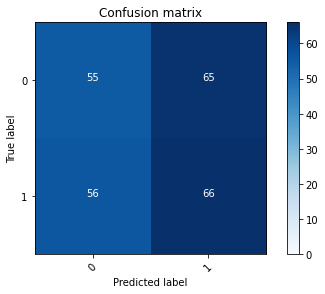

2022-08-20 14:16:57 - [Epoch Train: 33] loss: 0.0032, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 14:16:57 - [Epoch Valid: 33] loss: 2.6079, auc: 0.5582, acc: 0.5000, time: 13.00 s


 33%|█████████████▏                          | 33/100 [34:22<1:13:51, 66.14s/it]

2022-08-20 14:16:57 - EPOCH: 34
2022-08-20 14:17:00 - Train Step 10/245, train_loss: 0.0005
2022-08-20 14:17:02 - Train Step 20/245, train_loss: 0.0004
2022-08-20 14:17:04 - Train Step 30/245, train_loss: 0.0008
2022-08-20 14:17:06 - Train Step 40/245, train_loss: 0.0006
2022-08-20 14:17:08 - Train Step 50/245, train_loss: 0.0007
2022-08-20 14:17:10 - Train Step 60/245, train_loss: 0.0006
2022-08-20 14:17:12 - Train Step 70/245, train_loss: 0.0006
2022-08-20 14:17:14 - Train Step 80/245, train_loss: 0.0006
2022-08-20 14:17:16 - Train Step 90/245, train_loss: 0.0005
2022-08-20 14:17:18 - Train Step 100/245, train_loss: 0.0005
2022-08-20 14:17:21 - Train Step 110/245, train_loss: 0.0005
2022-08-20 14:17:23 - Train Step 120/245, train_loss: 0.0005
2022-08-20 14:17:25 - Train Step 130/245, train_loss: 0.0007
2022-08-20 14:17:27 - Train Step 140/245, train_loss: 0.0025
2022-08-20 14:17:29 - Train Step 150/245, train_loss: 0.0024
2022-08-20 14:17:31 - Train Step 160/245, train_loss: 0.0022
2

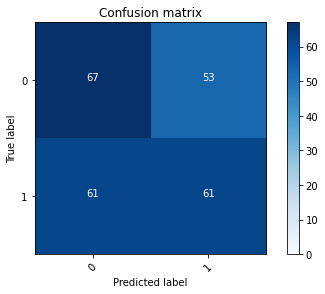

2022-08-20 14:18:03 - [Epoch Train: 34] loss: 0.0016, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 14:18:03 - [Epoch Valid: 34] loss: 2.7912, auc: 0.5595, acc: 0.5289, time: 14.00 s


 34%|█████████████▌                          | 34/100 [35:27<1:12:31, 65.94s/it]

2022-08-20 14:18:03 - EPOCH: 35
2022-08-20 14:18:05 - Train Step 10/245, train_loss: 0.0002
2022-08-20 14:18:07 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:18:09 - Train Step 30/245, train_loss: 0.0003
2022-08-20 14:18:12 - Train Step 40/245, train_loss: 0.0003
2022-08-20 14:18:14 - Train Step 50/245, train_loss: 0.0003
2022-08-20 14:18:16 - Train Step 60/245, train_loss: 0.0003
2022-08-20 14:18:19 - Train Step 70/245, train_loss: 0.0002
2022-08-20 14:18:20 - Train Step 80/245, train_loss: 0.0002
2022-08-20 14:18:23 - Train Step 90/245, train_loss: 0.0002
2022-08-20 14:18:25 - Train Step 100/245, train_loss: 0.0002
2022-08-20 14:18:27 - Train Step 110/245, train_loss: 0.0002
2022-08-20 14:18:29 - Train Step 120/245, train_loss: 0.0003
2022-08-20 14:18:31 - Train Step 130/245, train_loss: 0.0003
2022-08-20 14:18:33 - Train Step 140/245, train_loss: 0.0003
2022-08-20 14:18:35 - Train Step 150/245, train_loss: 0.0003
2022-08-20 14:18:37 - Train Step 160/245, train_loss: 0.0003
2

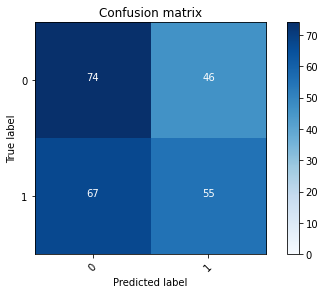

2022-08-20 14:19:08 - [Epoch Train: 35] loss: 0.0026, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 14:19:08 - [Epoch Valid: 35] loss: 2.4946, auc: 0.5589, acc: 0.5331, time: 13.00 s


 35%|██████████████                          | 35/100 [36:33<1:11:22, 65.89s/it]

2022-08-20 14:19:08 - EPOCH: 36
2022-08-20 14:19:11 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:19:13 - Train Step 20/245, train_loss: 0.0002
2022-08-20 14:19:15 - Train Step 30/245, train_loss: 0.0002
2022-08-20 14:19:17 - Train Step 40/245, train_loss: 0.0002
2022-08-20 14:19:20 - Train Step 50/245, train_loss: 0.0002
2022-08-20 14:19:22 - Train Step 60/245, train_loss: 0.0002
2022-08-20 14:19:24 - Train Step 70/245, train_loss: 0.0003
2022-08-20 14:19:27 - Train Step 80/245, train_loss: 0.0002
2022-08-20 14:19:29 - Train Step 90/245, train_loss: 0.0002
2022-08-20 14:19:31 - Train Step 100/245, train_loss: 0.0003
2022-08-20 14:19:33 - Train Step 110/245, train_loss: 0.0003
2022-08-20 14:19:36 - Train Step 120/245, train_loss: 0.0003
2022-08-20 14:19:38 - Train Step 130/245, train_loss: 0.0003
2022-08-20 14:19:40 - Train Step 140/245, train_loss: 0.0003
2022-08-20 14:19:42 - Train Step 150/245, train_loss: 0.0003
2022-08-20 14:19:44 - Train Step 160/245, train_loss: 0.0003
2

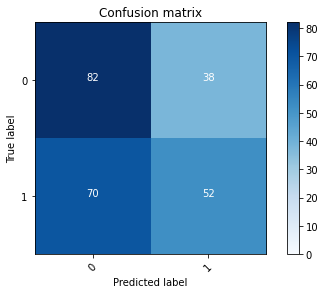

2022-08-20 14:20:17 - [Epoch Train: 36] loss: 0.0027, auc: 1.0000, acc: 0.9980, time: 54.00 s            
2022-08-20 14:20:17 - [Epoch Valid: 36] loss: 2.7494, auc: 0.5590, acc: 0.5537, time: 13.00 s


 36%|██████████████▍                         | 36/100 [37:41<1:10:58, 66.53s/it]

2022-08-20 14:20:17 - EPOCH: 37
2022-08-20 14:20:19 - Train Step 10/245, train_loss: 0.0002
2022-08-20 14:20:21 - Train Step 20/245, train_loss: 0.0002
2022-08-20 14:20:23 - Train Step 30/245, train_loss: 0.0149
2022-08-20 14:20:25 - Train Step 40/245, train_loss: 0.0112
2022-08-20 14:20:28 - Train Step 50/245, train_loss: 0.0090
2022-08-20 14:20:30 - Train Step 60/245, train_loss: 0.0076
2022-08-20 14:20:32 - Train Step 70/245, train_loss: 0.0065
2022-08-20 14:20:34 - Train Step 80/245, train_loss: 0.0058
2022-08-20 14:20:36 - Train Step 90/245, train_loss: 0.0052
2022-08-20 14:20:38 - Train Step 100/245, train_loss: 0.0047
2022-08-20 14:20:40 - Train Step 110/245, train_loss: 0.0043
2022-08-20 14:20:42 - Train Step 120/245, train_loss: 0.0039
2022-08-20 14:20:44 - Train Step 130/245, train_loss: 0.0037
2022-08-20 14:20:47 - Train Step 140/245, train_loss: 0.0034
2022-08-20 14:20:49 - Train Step 150/245, train_loss: 0.0032
2022-08-20 14:20:51 - Train Step 160/245, train_loss: 0.0030
2

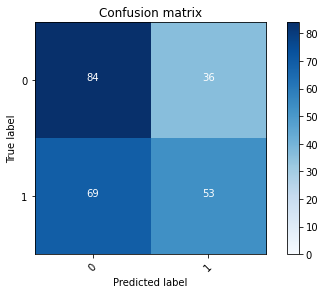

2022-08-20 14:21:23 - [Epoch Train: 37] loss: 0.0037, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 14:21:23 - [Epoch Valid: 37] loss: 2.7744, auc: 0.5545, acc: 0.5661, time: 13.00 s
2022-08-20 14:21:23 - acc improved from 0.5661 to 0.5661. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_13-42-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e37-loss2.774-acc0.566-auc0.555.pth'


 37%|██████████████▊                         | 37/100 [38:47<1:09:42, 66.39s/it]

2022-08-20 14:21:23 - EPOCH: 38
2022-08-20 14:21:25 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:21:27 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:21:29 - Train Step 30/245, train_loss: 0.0002
2022-08-20 14:21:32 - Train Step 40/245, train_loss: 0.0003
2022-08-20 14:21:34 - Train Step 50/245, train_loss: 0.0003
2022-08-20 14:21:36 - Train Step 60/245, train_loss: 0.0003
2022-08-20 14:21:38 - Train Step 70/245, train_loss: 0.0003
2022-08-20 14:21:40 - Train Step 80/245, train_loss: 0.0003
2022-08-20 14:21:42 - Train Step 90/245, train_loss: 0.0003
2022-08-20 14:21:45 - Train Step 100/245, train_loss: 0.0003
2022-08-20 14:21:47 - Train Step 110/245, train_loss: 0.0003
2022-08-20 14:21:49 - Train Step 120/245, train_loss: 0.0003
2022-08-20 14:21:51 - Train Step 130/245, train_loss: 0.0003
2022-08-20 14:21:53 - Train Step 140/245, train_loss: 0.0003
2022-08-20 14:21:56 - Train Step 150/245, train_loss: 0.0003
2022-08-20 14:21:58 - Train Step 160/245, train_loss: 0.0003
2

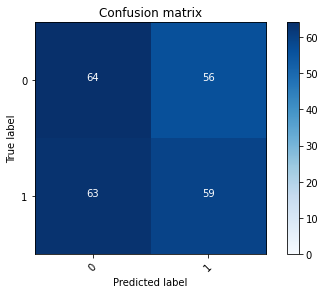

2022-08-20 14:22:30 - [Epoch Train: 38] loss: 0.0023, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 14:22:30 - [Epoch Valid: 38] loss: 2.6457, auc: 0.5564, acc: 0.5083, time: 13.00 s


 38%|███████████████▏                        | 38/100 [39:55<1:08:56, 66.71s/it]

2022-08-20 14:22:30 - EPOCH: 39
2022-08-20 14:22:32 - Train Step 10/245, train_loss: 0.0002
2022-08-20 14:22:35 - Train Step 20/245, train_loss: 0.0002
2022-08-20 14:22:37 - Train Step 30/245, train_loss: 0.0002
2022-08-20 14:22:39 - Train Step 40/245, train_loss: 0.0002
2022-08-20 14:22:41 - Train Step 50/245, train_loss: 0.0002
2022-08-20 14:22:43 - Train Step 60/245, train_loss: 0.0002
2022-08-20 14:22:45 - Train Step 70/245, train_loss: 0.0002
2022-08-20 14:22:48 - Train Step 80/245, train_loss: 0.0002
2022-08-20 14:22:50 - Train Step 90/245, train_loss: 0.0002
2022-08-20 14:22:52 - Train Step 100/245, train_loss: 0.0002
2022-08-20 14:22:54 - Train Step 110/245, train_loss: 0.0028
2022-08-20 14:22:56 - Train Step 120/245, train_loss: 0.0026
2022-08-20 14:22:59 - Train Step 130/245, train_loss: 0.0024
2022-08-20 14:23:01 - Train Step 140/245, train_loss: 0.0023
2022-08-20 14:23:03 - Train Step 150/245, train_loss: 0.0021
2022-08-20 14:23:05 - Train Step 160/245, train_loss: 0.0020
2

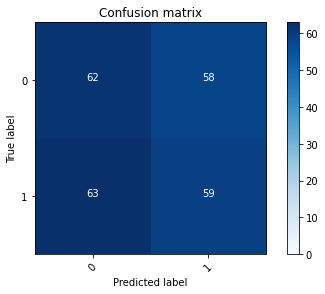

2022-08-20 14:23:37 - [Epoch Train: 39] loss: 0.0023, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:23:37 - [Epoch Valid: 39] loss: 2.6318, auc: 0.5530, acc: 0.5000, time: 13.00 s


 39%|███████████████▌                        | 39/100 [41:02<1:07:54, 66.80s/it]

2022-08-20 14:23:37 - EPOCH: 40
2022-08-20 14:23:39 - Train Step 10/245, train_loss: 0.0003
2022-08-20 14:23:42 - Train Step 20/245, train_loss: 0.0035
2022-08-20 14:23:44 - Train Step 30/245, train_loss: 0.0024
2022-08-20 14:23:46 - Train Step 40/245, train_loss: 0.0018
2022-08-20 14:23:48 - Train Step 50/245, train_loss: 0.0015
2022-08-20 14:23:50 - Train Step 60/245, train_loss: 0.0013
2022-08-20 14:23:53 - Train Step 70/245, train_loss: 0.0011
2022-08-20 14:23:55 - Train Step 80/245, train_loss: 0.0010
2022-08-20 14:23:57 - Train Step 90/245, train_loss: 0.0009
2022-08-20 14:23:59 - Train Step 100/245, train_loss: 0.0058
2022-08-20 14:24:01 - Train Step 110/245, train_loss: 0.0053
2022-08-20 14:24:04 - Train Step 120/245, train_loss: 0.0049
2022-08-20 14:24:06 - Train Step 130/245, train_loss: 0.0045
2022-08-20 14:24:08 - Train Step 140/245, train_loss: 0.0042
2022-08-20 14:24:10 - Train Step 150/245, train_loss: 0.0039
2022-08-20 14:24:12 - Train Step 160/245, train_loss: 0.0038
2

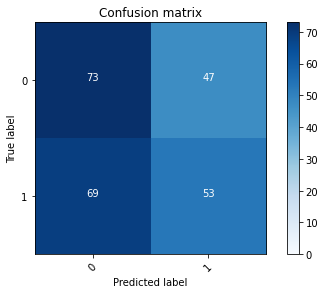

2022-08-20 14:24:45 - [Epoch Train: 40] loss: 0.0025, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 14:24:45 - [Epoch Valid: 40] loss: 2.6475, auc: 0.5551, acc: 0.5207, time: 13.00 s


 40%|████████████████                        | 40/100 [42:09<1:07:03, 67.06s/it]

2022-08-20 14:24:45 - EPOCH: 41
2022-08-20 14:24:47 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:24:49 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:24:52 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:24:54 - Train Step 40/245, train_loss: 0.0018
2022-08-20 14:24:56 - Train Step 50/245, train_loss: 0.0014
2022-08-20 14:24:58 - Train Step 60/245, train_loss: 0.0015
2022-08-20 14:25:00 - Train Step 70/245, train_loss: 0.0013
2022-08-20 14:25:02 - Train Step 80/245, train_loss: 0.0012
2022-08-20 14:25:04 - Train Step 90/245, train_loss: 0.0011
2022-08-20 14:25:06 - Train Step 100/245, train_loss: 0.0010
2022-08-20 14:25:08 - Train Step 110/245, train_loss: 0.0009
2022-08-20 14:25:10 - Train Step 120/245, train_loss: 0.0078
2022-08-20 14:25:12 - Train Step 130/245, train_loss: 0.0072
2022-08-20 14:25:14 - Train Step 140/245, train_loss: 0.0068
2022-08-20 14:25:16 - Train Step 150/245, train_loss: 0.0063
2022-08-20 14:25:19 - Train Step 160/245, train_loss: 0.0059
2

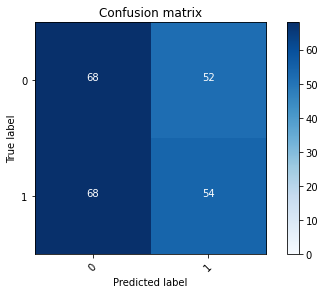

2022-08-20 14:25:50 - [Epoch Train: 41] loss: 0.0040, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 14:25:50 - [Epoch Valid: 41] loss: 2.7444, auc: 0.5586, acc: 0.5041, time: 13.00 s


 41%|████████████████▍                       | 41/100 [43:14<1:05:18, 66.42s/it]

2022-08-20 14:25:50 - EPOCH: 42
2022-08-20 14:25:52 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:25:54 - Train Step 20/245, train_loss: 0.0002
2022-08-20 14:25:56 - Train Step 30/245, train_loss: 0.0002
2022-08-20 14:25:59 - Train Step 40/245, train_loss: 0.0070
2022-08-20 14:26:01 - Train Step 50/245, train_loss: 0.0056
2022-08-20 14:26:03 - Train Step 60/245, train_loss: 0.0047
2022-08-20 14:26:05 - Train Step 70/245, train_loss: 0.0040
2022-08-20 14:26:07 - Train Step 80/245, train_loss: 0.0109
2022-08-20 14:26:09 - Train Step 90/245, train_loss: 0.0098
2022-08-20 14:26:12 - Train Step 100/245, train_loss: 0.0088
2022-08-20 14:26:14 - Train Step 110/245, train_loss: 0.0080
2022-08-20 14:26:16 - Train Step 120/245, train_loss: 0.0073
2022-08-20 14:26:18 - Train Step 130/245, train_loss: 0.0068
2022-08-20 14:26:20 - Train Step 140/245, train_loss: 0.0063
2022-08-20 14:26:22 - Train Step 150/245, train_loss: 0.0059
2022-08-20 14:26:25 - Train Step 160/245, train_loss: 0.0056
2

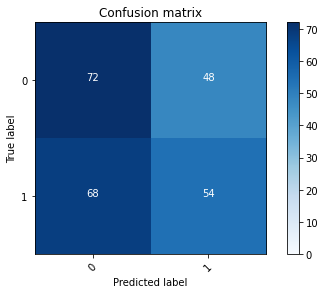

2022-08-20 14:26:57 - [Epoch Train: 42] loss: 0.0037, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:26:57 - [Epoch Valid: 42] loss: 2.7643, auc: 0.5544, acc: 0.5207, time: 13.00 s


 42%|████████████████▊                       | 42/100 [44:21<1:04:27, 66.68s/it]

2022-08-20 14:26:57 - EPOCH: 43
2022-08-20 14:26:59 - Train Step 10/245, train_loss: 0.0005
2022-08-20 14:27:02 - Train Step 20/245, train_loss: 0.0003
2022-08-20 14:27:04 - Train Step 30/245, train_loss: 0.0002
2022-08-20 14:27:06 - Train Step 40/245, train_loss: 0.0002
2022-08-20 14:27:08 - Train Step 50/245, train_loss: 0.0003
2022-08-20 14:27:10 - Train Step 60/245, train_loss: 0.0003
2022-08-20 14:27:12 - Train Step 70/245, train_loss: 0.0003
2022-08-20 14:27:14 - Train Step 80/245, train_loss: 0.0002
2022-08-20 14:27:17 - Train Step 90/245, train_loss: 0.0046
2022-08-20 14:27:19 - Train Step 100/245, train_loss: 0.0041
2022-08-20 14:27:21 - Train Step 110/245, train_loss: 0.0038
2022-08-20 14:27:23 - Train Step 120/245, train_loss: 0.0034
2022-08-20 14:27:25 - Train Step 130/245, train_loss: 0.0032
2022-08-20 14:27:27 - Train Step 140/245, train_loss: 0.0030
2022-08-20 14:27:29 - Train Step 150/245, train_loss: 0.0028
2022-08-20 14:27:31 - Train Step 160/245, train_loss: 0.0026
2

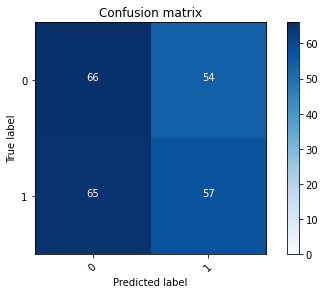

2022-08-20 14:28:03 - [Epoch Train: 43] loss: 0.0038, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 14:28:03 - [Epoch Valid: 43] loss: 2.6947, auc: 0.5578, acc: 0.5083, time: 13.00 s


 43%|█████████████████▏                      | 43/100 [45:28<1:03:13, 66.55s/it]

2022-08-20 14:28:03 - EPOCH: 44
2022-08-20 14:28:06 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:28:08 - Train Step 20/245, train_loss: 0.0002
2022-08-20 14:28:10 - Train Step 30/245, train_loss: 0.0003
2022-08-20 14:28:12 - Train Step 40/245, train_loss: 0.0003
2022-08-20 14:28:15 - Train Step 50/245, train_loss: 0.0002
2022-08-20 14:28:17 - Train Step 60/245, train_loss: 0.0002
2022-08-20 14:28:19 - Train Step 70/245, train_loss: 0.0002
2022-08-20 14:28:21 - Train Step 80/245, train_loss: 0.0002
2022-08-20 14:28:23 - Train Step 90/245, train_loss: 0.0018
2022-08-20 14:28:25 - Train Step 100/245, train_loss: 0.0016
2022-08-20 14:28:27 - Train Step 110/245, train_loss: 0.0015
2022-08-20 14:28:30 - Train Step 120/245, train_loss: 0.0014
2022-08-20 14:28:32 - Train Step 130/245, train_loss: 0.0013
2022-08-20 14:28:34 - Train Step 140/245, train_loss: 0.0012
2022-08-20 14:28:36 - Train Step 150/245, train_loss: 0.0011
2022-08-20 14:28:38 - Train Step 160/245, train_loss: 0.0032
2

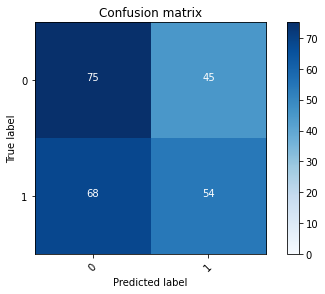

2022-08-20 14:29:10 - [Epoch Train: 44] loss: 0.0021, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:29:10 - [Epoch Valid: 44] loss: 2.7127, auc: 0.5547, acc: 0.5331, time: 13.00 s


 44%|█████████████████▌                      | 44/100 [46:35<1:02:18, 66.76s/it]

2022-08-20 14:29:10 - EPOCH: 45
2022-08-20 14:29:13 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:29:15 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:29:17 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:29:19 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:29:22 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:29:24 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:29:26 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:29:28 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:29:30 - Train Step 90/245, train_loss: 0.0028
2022-08-20 14:29:33 - Train Step 100/245, train_loss: 0.0026
2022-08-20 14:29:35 - Train Step 110/245, train_loss: 0.0024
2022-08-20 14:29:37 - Train Step 120/245, train_loss: 0.0023
2022-08-20 14:29:39 - Train Step 130/245, train_loss: 0.0021
2022-08-20 14:29:41 - Train Step 140/245, train_loss: 0.0020
2022-08-20 14:29:43 - Train Step 150/245, train_loss: 0.0052
2022-08-20 14:29:46 - Train Step 160/245, train_loss: 0.0049
2

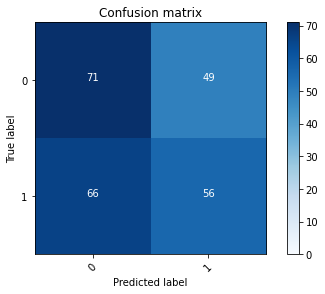

2022-08-20 14:30:18 - [Epoch Train: 45] loss: 0.0033, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:30:18 - [Epoch Valid: 45] loss: 2.8271, auc: 0.5532, acc: 0.5248, time: 13.00 s


 45%|██████████████████                      | 45/100 [47:42<1:01:24, 66.99s/it]

2022-08-20 14:30:18 - EPOCH: 46
2022-08-20 14:30:20 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:30:23 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:30:25 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:30:27 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:30:29 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:30:31 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:30:33 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:30:36 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:30:38 - Train Step 90/245, train_loss: 0.0001
2022-08-20 14:30:40 - Train Step 100/245, train_loss: 0.0001
2022-08-20 14:30:42 - Train Step 110/245, train_loss: 0.0001
2022-08-20 14:30:44 - Train Step 120/245, train_loss: 0.0001
2022-08-20 14:30:46 - Train Step 130/245, train_loss: 0.0001
2022-08-20 14:30:48 - Train Step 140/245, train_loss: 0.0001
2022-08-20 14:30:50 - Train Step 150/245, train_loss: 0.0023
2022-08-20 14:30:52 - Train Step 160/245, train_loss: 0.0022
2

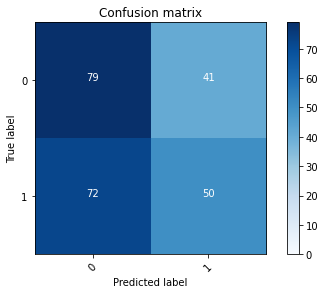

2022-08-20 14:31:25 - [Epoch Train: 46] loss: 0.0030, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:31:25 - [Epoch Valid: 46] loss: 2.9010, auc: 0.5579, acc: 0.5331, time: 13.00 s


 46%|██████████████████▍                     | 46/100 [48:49<1:00:11, 66.89s/it]

2022-08-20 14:31:25 - EPOCH: 47
2022-08-20 14:31:27 - Train Step 10/245, train_loss: 0.0166
2022-08-20 14:31:29 - Train Step 20/245, train_loss: 0.0084
2022-08-20 14:31:31 - Train Step 30/245, train_loss: 0.0056
2022-08-20 14:31:34 - Train Step 40/245, train_loss: 0.0042
2022-08-20 14:31:36 - Train Step 50/245, train_loss: 0.0041
2022-08-20 14:31:38 - Train Step 60/245, train_loss: 0.0034
2022-08-20 14:31:40 - Train Step 70/245, train_loss: 0.0030
2022-08-20 14:31:42 - Train Step 80/245, train_loss: 0.0026
2022-08-20 14:31:44 - Train Step 90/245, train_loss: 0.0023
2022-08-20 14:31:46 - Train Step 100/245, train_loss: 0.0021
2022-08-20 14:31:49 - Train Step 110/245, train_loss: 0.0019
2022-08-20 14:31:51 - Train Step 120/245, train_loss: 0.0018
2022-08-20 14:31:53 - Train Step 130/245, train_loss: 0.0017
2022-08-20 14:31:55 - Train Step 140/245, train_loss: 0.0016
2022-08-20 14:31:57 - Train Step 150/245, train_loss: 0.0015
2022-08-20 14:31:59 - Train Step 160/245, train_loss: 0.0014
2

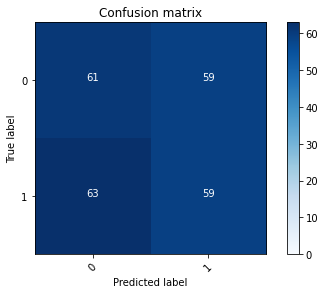

2022-08-20 14:32:31 - [Epoch Train: 47] loss: 0.0029, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 14:32:31 - [Epoch Valid: 47] loss: 3.1883, auc: 0.5578, acc: 0.4959, time: 13.00 s


 47%|███████████████████▋                      | 47/100 [49:56<58:59, 66.78s/it]

2022-08-20 14:32:31 - EPOCH: 48
2022-08-20 14:32:34 - Train Step 10/245, train_loss: 0.0005
2022-08-20 14:32:36 - Train Step 20/245, train_loss: 0.0003
2022-08-20 14:32:38 - Train Step 30/245, train_loss: 0.0003
2022-08-20 14:32:40 - Train Step 40/245, train_loss: 0.0002
2022-08-20 14:32:42 - Train Step 50/245, train_loss: 0.0002
2022-08-20 14:32:44 - Train Step 60/245, train_loss: 0.0079
2022-08-20 14:32:46 - Train Step 70/245, train_loss: 0.0068
2022-08-20 14:32:49 - Train Step 80/245, train_loss: 0.0059
2022-08-20 14:32:51 - Train Step 90/245, train_loss: 0.0053
2022-08-20 14:32:53 - Train Step 100/245, train_loss: 0.0048
2022-08-20 14:32:55 - Train Step 110/245, train_loss: 0.0044
2022-08-20 14:32:57 - Train Step 120/245, train_loss: 0.0040
2022-08-20 14:32:59 - Train Step 130/245, train_loss: 0.0037
2022-08-20 14:33:01 - Train Step 140/245, train_loss: 0.0035
2022-08-20 14:33:04 - Train Step 150/245, train_loss: 0.0032
2022-08-20 14:33:06 - Train Step 160/245, train_loss: 0.0049
2

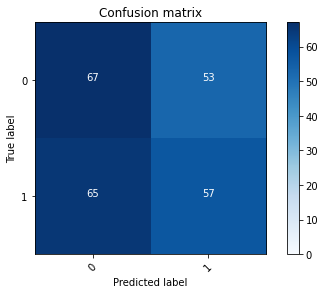

2022-08-20 14:33:38 - [Epoch Train: 48] loss: 0.0032, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:33:38 - [Epoch Valid: 48] loss: 2.8695, auc: 0.5555, acc: 0.5124, time: 13.00 s


 48%|████████████████████▏                     | 48/100 [51:02<57:50, 66.74s/it]

2022-08-20 14:33:38 - EPOCH: 49
2022-08-20 14:33:40 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:33:42 - Train Step 20/245, train_loss: 0.0002
2022-08-20 14:33:45 - Train Step 30/245, train_loss: 0.0002
2022-08-20 14:33:47 - Train Step 40/245, train_loss: 0.0002
2022-08-20 14:33:49 - Train Step 50/245, train_loss: 0.0002
2022-08-20 14:33:51 - Train Step 60/245, train_loss: 0.0002
2022-08-20 14:33:53 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:33:55 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:33:57 - Train Step 90/245, train_loss: 0.0002
2022-08-20 14:34:00 - Train Step 100/245, train_loss: 0.0002
2022-08-20 14:34:02 - Train Step 110/245, train_loss: 0.0001
2022-08-20 14:34:04 - Train Step 120/245, train_loss: 0.0012
2022-08-20 14:34:06 - Train Step 130/245, train_loss: 0.0011
2022-08-20 14:34:08 - Train Step 140/245, train_loss: 0.0010
2022-08-20 14:34:10 - Train Step 150/245, train_loss: 0.0009
2022-08-20 14:34:12 - Train Step 160/245, train_loss: 0.0009
2

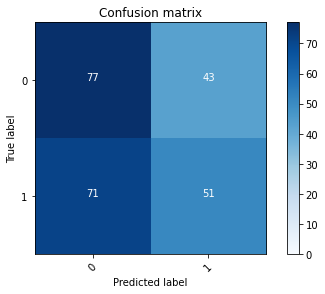

2022-08-20 14:34:45 - [Epoch Train: 49] loss: 0.0017, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 14:34:45 - [Epoch Valid: 49] loss: 2.7494, auc: 0.5575, acc: 0.5289, time: 13.00 s


 49%|████████████████████▌                     | 49/100 [52:09<56:44, 66.76s/it]

2022-08-20 14:34:45 - EPOCH: 50
2022-08-20 14:34:47 - Train Step 10/245, train_loss: 0.0002
2022-08-20 14:34:49 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:34:51 - Train Step 30/245, train_loss: 0.0079
2022-08-20 14:34:53 - Train Step 40/245, train_loss: 0.0060
2022-08-20 14:34:55 - Train Step 50/245, train_loss: 0.0048
2022-08-20 14:34:57 - Train Step 60/245, train_loss: 0.0040
2022-08-20 14:34:59 - Train Step 70/245, train_loss: 0.0035
2022-08-20 14:35:01 - Train Step 80/245, train_loss: 0.0031
2022-08-20 14:35:03 - Train Step 90/245, train_loss: 0.0027
2022-08-20 14:35:05 - Train Step 100/245, train_loss: 0.0025
2022-08-20 14:35:07 - Train Step 110/245, train_loss: 0.0082
2022-08-20 14:35:09 - Train Step 120/245, train_loss: 0.0075
2022-08-20 14:35:11 - Train Step 130/245, train_loss: 0.0070
2022-08-20 14:35:14 - Train Step 140/245, train_loss: 0.0065
2022-08-20 14:35:16 - Train Step 150/245, train_loss: 0.0061
2022-08-20 14:35:18 - Train Step 160/245, train_loss: 0.0057
2

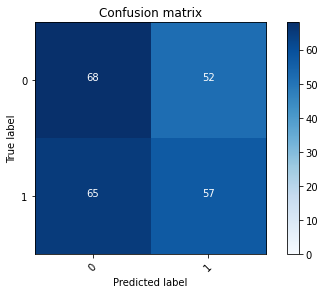

2022-08-20 14:35:48 - [Epoch Train: 50] loss: 0.0038, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 14:35:48 - [Epoch Valid: 50] loss: 2.9513, auc: 0.5625, acc: 0.5165, time: 13.00 s


 50%|█████████████████████                     | 50/100 [53:13<54:50, 65.80s/it]

2022-08-20 14:35:48 - EPOCH: 51
2022-08-20 14:35:50 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:35:53 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:35:55 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:35:57 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:35:59 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:36:01 - Train Step 60/245, train_loss: 0.0020
2022-08-20 14:36:03 - Train Step 70/245, train_loss: 0.0017
2022-08-20 14:36:05 - Train Step 80/245, train_loss: 0.0015
2022-08-20 14:36:07 - Train Step 90/245, train_loss: 0.0014
2022-08-20 14:36:09 - Train Step 100/245, train_loss: 0.0013
2022-08-20 14:36:11 - Train Step 110/245, train_loss: 0.0012
2022-08-20 14:36:14 - Train Step 120/245, train_loss: 0.0011
2022-08-20 14:36:16 - Train Step 130/245, train_loss: 0.0010
2022-08-20 14:36:18 - Train Step 140/245, train_loss: 0.0028
2022-08-20 14:36:20 - Train Step 150/245, train_loss: 0.0026
2022-08-20 14:36:22 - Train Step 160/245, train_loss: 0.0025
2

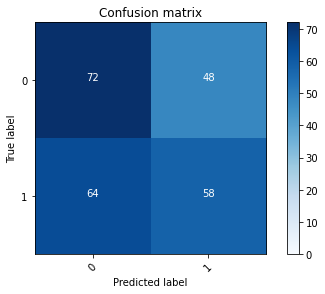

2022-08-20 14:36:54 - [Epoch Train: 51] loss: 0.0017, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 14:36:54 - [Epoch Valid: 51] loss: 3.0127, auc: 0.5580, acc: 0.5372, time: 13.00 s


 51%|█████████████████████▍                    | 51/100 [54:18<53:42, 65.77s/it]

2022-08-20 14:36:54 - EPOCH: 52
2022-08-20 14:36:56 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:36:59 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:37:01 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:37:03 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:37:05 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:37:07 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:37:10 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:37:12 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:37:14 - Train Step 90/245, train_loss: 0.0001
2022-08-20 14:37:16 - Train Step 100/245, train_loss: 0.0001
2022-08-20 14:37:18 - Train Step 110/245, train_loss: 0.0001
2022-08-20 14:37:21 - Train Step 120/245, train_loss: 0.0001
2022-08-20 14:37:23 - Train Step 130/245, train_loss: 0.0001
2022-08-20 14:37:25 - Train Step 140/245, train_loss: 0.0001
2022-08-20 14:37:27 - Train Step 150/245, train_loss: 0.0001
2022-08-20 14:37:30 - Train Step 160/245, train_loss: 0.0005
2

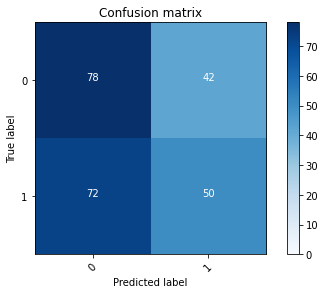

2022-08-20 14:38:02 - [Epoch Train: 52] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 14:38:02 - [Epoch Valid: 52] loss: 2.9107, auc: 0.5610, acc: 0.5289, time: 13.00 s


 52%|█████████████████████▊                    | 52/100 [55:26<53:08, 66.42s/it]

2022-08-20 14:38:02 - EPOCH: 53
2022-08-20 14:38:04 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:38:07 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:38:09 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:38:11 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:38:13 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:38:15 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:38:18 - Train Step 70/245, train_loss: 0.0016
2022-08-20 14:38:20 - Train Step 80/245, train_loss: 0.0015
2022-08-20 14:38:22 - Train Step 90/245, train_loss: 0.0013
2022-08-20 14:38:24 - Train Step 100/245, train_loss: 0.0012
2022-08-20 14:38:26 - Train Step 110/245, train_loss: 0.0011
2022-08-20 14:38:28 - Train Step 120/245, train_loss: 0.0010
2022-08-20 14:38:30 - Train Step 130/245, train_loss: 0.0009
2022-08-20 14:38:32 - Train Step 140/245, train_loss: 0.0009
2022-08-20 14:38:34 - Train Step 150/245, train_loss: 0.0008
2022-08-20 14:38:37 - Train Step 160/245, train_loss: 0.0008
2

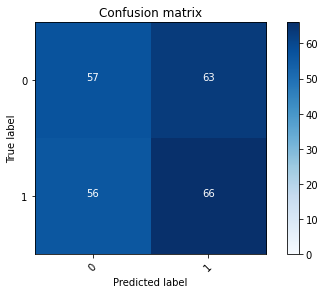

2022-08-20 14:39:08 - [Epoch Train: 53] loss: 0.0028, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 14:39:08 - [Epoch Valid: 53] loss: 3.2743, auc: 0.5519, acc: 0.5083, time: 13.00 s


 53%|██████████████████████▎                   | 53/100 [56:32<51:57, 66.33s/it]

2022-08-20 14:39:08 - EPOCH: 54
2022-08-20 14:39:11 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:39:13 - Train Step 20/245, train_loss: 0.0106
2022-08-20 14:39:15 - Train Step 30/245, train_loss: 0.0073
2022-08-20 14:39:17 - Train Step 40/245, train_loss: 0.0056
2022-08-20 14:39:19 - Train Step 50/245, train_loss: 0.0045
2022-08-20 14:39:22 - Train Step 60/245, train_loss: 0.0038
2022-08-20 14:39:24 - Train Step 70/245, train_loss: 0.0035
2022-08-20 14:39:26 - Train Step 80/245, train_loss: 0.0031
2022-08-20 14:39:28 - Train Step 90/245, train_loss: 0.0028
2022-08-20 14:39:30 - Train Step 100/245, train_loss: 0.0025
2022-08-20 14:39:33 - Train Step 110/245, train_loss: 0.0023
2022-08-20 14:39:35 - Train Step 120/245, train_loss: 0.0059
2022-08-20 14:39:37 - Train Step 130/245, train_loss: 0.0055
2022-08-20 14:39:39 - Train Step 140/245, train_loss: 0.0051
2022-08-20 14:39:41 - Train Step 150/245, train_loss: 0.0048
2022-08-20 14:39:43 - Train Step 160/245, train_loss: 0.0045
2

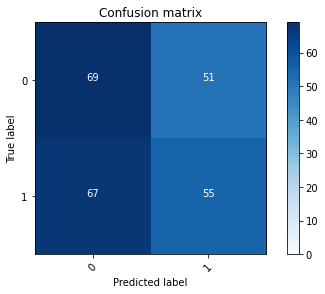

2022-08-20 14:40:15 - [Epoch Train: 54] loss: 0.0029, auc: 1.0000, acc: 0.9980, time: 54.00 s            
2022-08-20 14:40:15 - [Epoch Valid: 54] loss: 2.9019, auc: 0.5499, acc: 0.5124, time: 13.00 s


 54%|██████████████████████▋                   | 54/100 [57:40<51:08, 66.70s/it]

2022-08-20 14:40:15 - EPOCH: 55
2022-08-20 14:40:18 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:40:20 - Train Step 20/245, train_loss: 0.0150
2022-08-20 14:40:22 - Train Step 30/245, train_loss: 0.0101
2022-08-20 14:40:24 - Train Step 40/245, train_loss: 0.0076
2022-08-20 14:40:27 - Train Step 50/245, train_loss: 0.0062
2022-08-20 14:40:29 - Train Step 60/245, train_loss: 0.0052
2022-08-20 14:40:31 - Train Step 70/245, train_loss: 0.0045
2022-08-20 14:40:33 - Train Step 80/245, train_loss: 0.0039
2022-08-20 14:40:35 - Train Step 90/245, train_loss: 0.0035
2022-08-20 14:40:38 - Train Step 100/245, train_loss: 0.0031
2022-08-20 14:40:40 - Train Step 110/245, train_loss: 0.0029
2022-08-20 14:40:42 - Train Step 120/245, train_loss: 0.0026
2022-08-20 14:40:44 - Train Step 130/245, train_loss: 0.0024
2022-08-20 14:40:46 - Train Step 140/245, train_loss: 0.0023
2022-08-20 14:40:48 - Train Step 150/245, train_loss: 0.0021
2022-08-20 14:40:51 - Train Step 160/245, train_loss: 0.0020
2

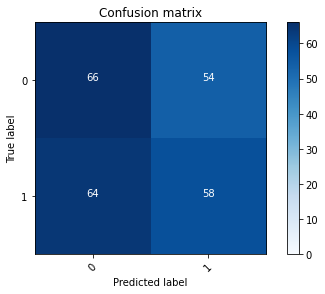

2022-08-20 14:41:23 - [Epoch Train: 55] loss: 0.0034, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:41:23 - [Epoch Valid: 55] loss: 3.0395, auc: 0.5485, acc: 0.5124, time: 13.00 s


 55%|███████████████████████                   | 55/100 [58:48<50:15, 67.01s/it]

2022-08-20 14:41:23 - EPOCH: 56
2022-08-20 14:41:26 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:41:27 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:41:30 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:41:32 - Train Step 40/245, train_loss: 0.0002
2022-08-20 14:41:34 - Train Step 50/245, train_loss: 0.0002
2022-08-20 14:41:36 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:41:38 - Train Step 70/245, train_loss: 0.0002
2022-08-20 14:41:40 - Train Step 80/245, train_loss: 0.0002
2022-08-20 14:41:42 - Train Step 90/245, train_loss: 0.0002
2022-08-20 14:41:44 - Train Step 100/245, train_loss: 0.0002
2022-08-20 14:41:46 - Train Step 110/245, train_loss: 0.0020
2022-08-20 14:41:48 - Train Step 120/245, train_loss: 0.0018
2022-08-20 14:41:50 - Train Step 130/245, train_loss: 0.0017
2022-08-20 14:41:52 - Train Step 140/245, train_loss: 0.0016
2022-08-20 14:41:54 - Train Step 150/245, train_loss: 0.0015
2022-08-20 14:41:56 - Train Step 160/245, train_loss: 0.0014
2

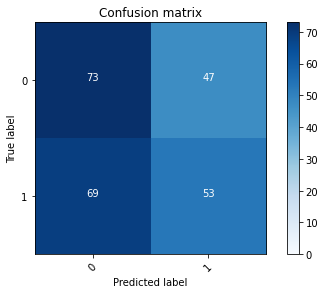

2022-08-20 14:42:27 - [Epoch Train: 56] loss: 0.0017, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 14:42:27 - [Epoch Valid: 56] loss: 2.8518, auc: 0.5500, acc: 0.5207, time: 13.00 s


 56%|███████████████████████▌                  | 56/100 [59:51<48:22, 65.97s/it]

2022-08-20 14:42:27 - EPOCH: 57
2022-08-20 14:42:29 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:42:31 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:42:34 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:42:36 - Train Step 40/245, train_loss: 0.0002
2022-08-20 14:42:38 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:42:40 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:42:43 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:42:45 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:42:47 - Train Step 90/245, train_loss: 0.0001
2022-08-20 14:42:49 - Train Step 100/245, train_loss: 0.0001
2022-08-20 14:42:51 - Train Step 110/245, train_loss: 0.0001
2022-08-20 14:42:53 - Train Step 120/245, train_loss: 0.0001
2022-08-20 14:42:56 - Train Step 130/245, train_loss: 0.0001
2022-08-20 14:42:58 - Train Step 140/245, train_loss: 0.0001
2022-08-20 14:43:00 - Train Step 150/245, train_loss: 0.0001
2022-08-20 14:43:02 - Train Step 160/245, train_loss: 0.0001
2

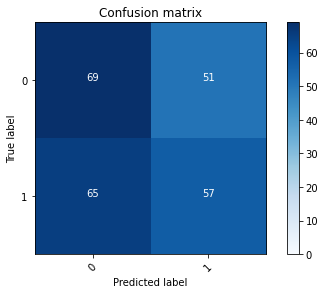

2022-08-20 14:43:33 - [Epoch Train: 57] loss: 0.0030, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:43:33 - [Epoch Valid: 57] loss: 3.2764, auc: 0.5546, acc: 0.5207, time: 13.00 s


 57%|██████████████████████▊                 | 57/100 [1:00:58<47:24, 66.15s/it]

2022-08-20 14:43:33 - EPOCH: 58
2022-08-20 14:43:36 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:43:38 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:43:40 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:43:42 - Train Step 40/245, train_loss: 0.0065
2022-08-20 14:43:44 - Train Step 50/245, train_loss: 0.0052
2022-08-20 14:43:46 - Train Step 60/245, train_loss: 0.0044
2022-08-20 14:43:48 - Train Step 70/245, train_loss: 0.0101
2022-08-20 14:43:50 - Train Step 80/245, train_loss: 0.0088
2022-08-20 14:43:52 - Train Step 90/245, train_loss: 0.0079
2022-08-20 14:43:54 - Train Step 100/245, train_loss: 0.0071
2022-08-20 14:43:57 - Train Step 110/245, train_loss: 0.0065
2022-08-20 14:43:59 - Train Step 120/245, train_loss: 0.0059
2022-08-20 14:44:01 - Train Step 130/245, train_loss: 0.0055
2022-08-20 14:44:03 - Train Step 140/245, train_loss: 0.0051
2022-08-20 14:44:05 - Train Step 150/245, train_loss: 0.0048
2022-08-20 14:44:07 - Train Step 160/245, train_loss: 0.0045
2

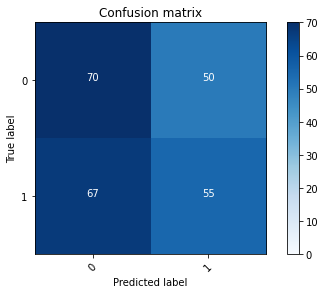

2022-08-20 14:44:38 - [Epoch Train: 58] loss: 0.0029, auc: 1.0000, acc: 0.9980, time: 51.00 s            
2022-08-20 14:44:38 - [Epoch Valid: 58] loss: 3.2983, auc: 0.5460, acc: 0.5165, time: 13.00 s


 58%|███████████████████████▏                | 58/100 [1:02:02<45:58, 65.68s/it]

2022-08-20 14:44:38 - EPOCH: 59
2022-08-20 14:44:40 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:44:42 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:44:45 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:44:47 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:44:49 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:44:51 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:44:53 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:44:55 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:44:57 - Train Step 90/245, train_loss: 0.0001
2022-08-20 14:44:59 - Train Step 100/245, train_loss: 0.0001
2022-08-20 14:45:02 - Train Step 110/245, train_loss: 0.0001
2022-08-20 14:45:04 - Train Step 120/245, train_loss: 0.0001
2022-08-20 14:45:06 - Train Step 130/245, train_loss: 0.0001
2022-08-20 14:45:08 - Train Step 140/245, train_loss: 0.0001
2022-08-20 14:45:10 - Train Step 150/245, train_loss: 0.0001
2022-08-20 14:45:12 - Train Step 160/245, train_loss: 0.0001
2

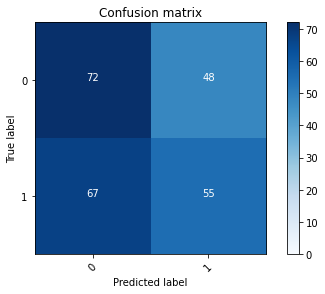

2022-08-20 14:45:43 - [Epoch Train: 59] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 14:45:43 - [Epoch Valid: 59] loss: 3.1818, auc: 0.5456, acc: 0.5248, time: 13.00 s


 59%|███████████████████████▌                | 59/100 [1:03:08<44:50, 65.62s/it]

2022-08-20 14:45:43 - EPOCH: 60
2022-08-20 14:45:46 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:45:48 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:45:50 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:45:52 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:45:54 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:45:56 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:45:59 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:46:01 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:46:03 - Train Step 90/245, train_loss: 0.0001
2022-08-20 14:46:05 - Train Step 100/245, train_loss: 0.0001
2022-08-20 14:46:07 - Train Step 110/245, train_loss: 0.0001
2022-08-20 14:46:09 - Train Step 120/245, train_loss: 0.0001
2022-08-20 14:46:11 - Train Step 130/245, train_loss: 0.0009
2022-08-20 14:46:13 - Train Step 140/245, train_loss: 0.0009
2022-08-20 14:46:15 - Train Step 150/245, train_loss: 0.0008
2022-08-20 14:46:17 - Train Step 160/245, train_loss: 0.0008
2

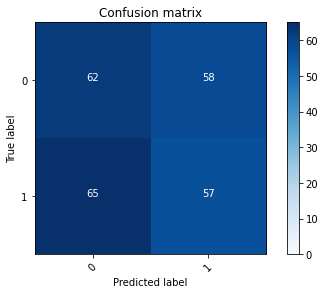

2022-08-20 14:46:48 - [Epoch Train: 60] loss: 0.0021, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 14:46:48 - [Epoch Valid: 60] loss: 3.2754, auc: 0.5429, acc: 0.4917, time: 12.00 s


 60%|████████████████████████                | 60/100 [1:04:12<43:31, 65.29s/it]

2022-08-20 14:46:48 - EPOCH: 61
2022-08-20 14:46:50 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:46:52 - Train Step 20/245, train_loss: 0.0157
2022-08-20 14:46:55 - Train Step 30/245, train_loss: 0.0105
2022-08-20 14:46:57 - Train Step 40/245, train_loss: 0.0079
2022-08-20 14:46:59 - Train Step 50/245, train_loss: 0.0064
2022-08-20 14:47:01 - Train Step 60/245, train_loss: 0.0053
2022-08-20 14:47:03 - Train Step 70/245, train_loss: 0.0046
2022-08-20 14:47:05 - Train Step 80/245, train_loss: 0.0040
2022-08-20 14:47:07 - Train Step 90/245, train_loss: 0.0036
2022-08-20 14:47:09 - Train Step 100/245, train_loss: 0.0032
2022-08-20 14:47:11 - Train Step 110/245, train_loss: 0.0029
2022-08-20 14:47:13 - Train Step 120/245, train_loss: 0.0027
2022-08-20 14:47:16 - Train Step 130/245, train_loss: 0.0025
2022-08-20 14:47:18 - Train Step 140/245, train_loss: 0.0023
2022-08-20 14:47:20 - Train Step 150/245, train_loss: 0.0022
2022-08-20 14:47:22 - Train Step 160/245, train_loss: 0.0020
2

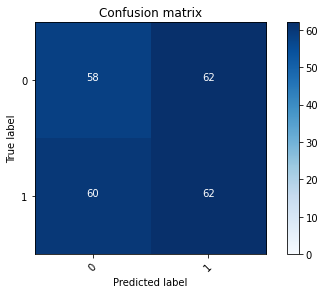

2022-08-20 14:47:53 - [Epoch Train: 61] loss: 0.0029, auc: 1.0000, acc: 0.9980, time: 51.00 s            
2022-08-20 14:47:53 - [Epoch Valid: 61] loss: 2.9254, auc: 0.5465, acc: 0.4959, time: 12.00 s


 61%|████████████████████████▍               | 61/100 [1:05:17<42:20, 65.14s/it]

2022-08-20 14:47:53 - EPOCH: 62
2022-08-20 14:47:55 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:47:57 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:48:00 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:48:02 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:48:04 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:48:06 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:48:08 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:48:11 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:48:13 - Train Step 90/245, train_loss: 0.0001
2022-08-20 14:48:15 - Train Step 100/245, train_loss: 0.0001
2022-08-20 14:48:17 - Train Step 110/245, train_loss: 0.0007
2022-08-20 14:48:19 - Train Step 120/245, train_loss: 0.0007
2022-08-20 14:48:22 - Train Step 130/245, train_loss: 0.0006
2022-08-20 14:48:24 - Train Step 140/245, train_loss: 0.0006
2022-08-20 14:48:26 - Train Step 150/245, train_loss: 0.0005
2022-08-20 14:48:28 - Train Step 160/245, train_loss: 0.0005
2

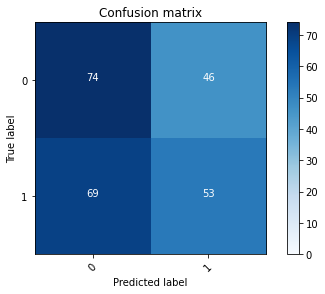

2022-08-20 14:49:00 - [Epoch Train: 62] loss: 0.0018, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 14:49:00 - [Epoch Valid: 62] loss: 3.3306, auc: 0.5404, acc: 0.5248, time: 13.00 s


 62%|████████████████████████▊               | 62/100 [1:06:25<41:44, 65.91s/it]

2022-08-20 14:49:00 - EPOCH: 63
2022-08-20 14:49:03 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:49:05 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:49:07 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:49:09 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:49:11 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:49:13 - Train Step 60/245, train_loss: 0.0051
2022-08-20 14:49:15 - Train Step 70/245, train_loss: 0.0044
2022-08-20 14:49:18 - Train Step 80/245, train_loss: 0.0038
2022-08-20 14:49:20 - Train Step 90/245, train_loss: 0.0034
2022-08-20 14:49:22 - Train Step 100/245, train_loss: 0.0031
2022-08-20 14:49:24 - Train Step 110/245, train_loss: 0.0028
2022-08-20 14:49:26 - Train Step 120/245, train_loss: 0.0026
2022-08-20 14:49:29 - Train Step 130/245, train_loss: 0.0024
2022-08-20 14:49:31 - Train Step 140/245, train_loss: 0.0022
2022-08-20 14:49:33 - Train Step 150/245, train_loss: 0.0021
2022-08-20 14:49:35 - Train Step 160/245, train_loss: 0.0039
2

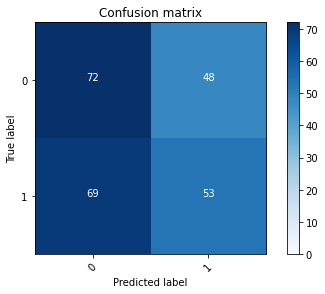

2022-08-20 14:50:07 - [Epoch Train: 63] loss: 0.0026, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:50:07 - [Epoch Valid: 63] loss: 3.2461, auc: 0.5443, acc: 0.5165, time: 13.00 s


 63%|█████████████████████████▏              | 63/100 [1:07:32<40:48, 66.18s/it]

2022-08-20 14:50:07 - EPOCH: 64
2022-08-20 14:50:10 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:50:12 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:50:14 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:50:16 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:50:18 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:50:21 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:50:23 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:50:25 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:50:27 - Train Step 90/245, train_loss: 0.0001
2022-08-20 14:50:30 - Train Step 100/245, train_loss: 0.0001
2022-08-20 14:50:32 - Train Step 110/245, train_loss: 0.0001
2022-08-20 14:50:34 - Train Step 120/245, train_loss: 0.0040
2022-08-20 14:50:37 - Train Step 130/245, train_loss: 0.0037
2022-08-20 14:50:39 - Train Step 140/245, train_loss: 0.0034
2022-08-20 14:50:41 - Train Step 150/245, train_loss: 0.0032
2022-08-20 14:50:43 - Train Step 160/245, train_loss: 0.0030
2

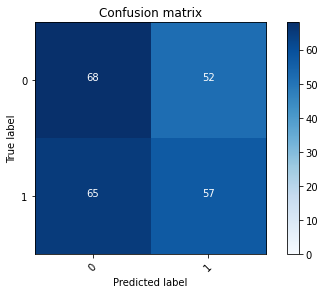

2022-08-20 14:51:14 - [Epoch Train: 64] loss: 0.0020, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 14:51:14 - [Epoch Valid: 64] loss: 3.1070, auc: 0.5442, acc: 0.5165, time: 12.00 s


 64%|█████████████████████████▌              | 64/100 [1:08:39<39:53, 66.49s/it]

2022-08-20 14:51:14 - EPOCH: 65
2022-08-20 14:51:17 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:51:19 - Train Step 20/245, train_loss: 0.0000
2022-08-20 14:51:21 - Train Step 30/245, train_loss: 0.0000
2022-08-20 14:51:24 - Train Step 40/245, train_loss: 0.0000
2022-08-20 14:51:26 - Train Step 50/245, train_loss: 0.0000
2022-08-20 14:51:28 - Train Step 60/245, train_loss: 0.0044
2022-08-20 14:51:30 - Train Step 70/245, train_loss: 0.0038
2022-08-20 14:51:32 - Train Step 80/245, train_loss: 0.0033
2022-08-20 14:51:34 - Train Step 90/245, train_loss: 0.0030
2022-08-20 14:51:36 - Train Step 100/245, train_loss: 0.0027
2022-08-20 14:51:38 - Train Step 110/245, train_loss: 0.0024
2022-08-20 14:51:40 - Train Step 120/245, train_loss: 0.0023
2022-08-20 14:51:42 - Train Step 130/245, train_loss: 0.0021
2022-08-20 14:51:44 - Train Step 140/245, train_loss: 0.0019
2022-08-20 14:51:46 - Train Step 150/245, train_loss: 0.0018
2022-08-20 14:51:49 - Train Step 160/245, train_loss: 0.0017
2

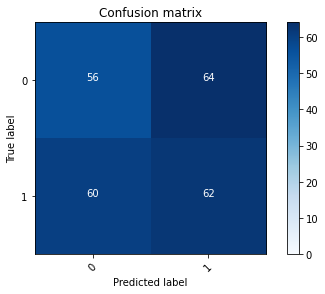

2022-08-20 14:52:20 - [Epoch Train: 65] loss: 0.0026, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 14:52:20 - [Epoch Valid: 65] loss: 3.3019, auc: 0.5428, acc: 0.4876, time: 13.00 s


 65%|██████████████████████████              | 65/100 [1:09:44<38:33, 66.11s/it]

2022-08-20 14:52:20 - EPOCH: 66
2022-08-20 14:52:22 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:52:24 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:52:27 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:52:29 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:52:31 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:52:33 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:52:36 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:52:38 - Train Step 80/245, train_loss: 0.0022
2022-08-20 14:52:40 - Train Step 90/245, train_loss: 0.0020
2022-08-20 14:52:42 - Train Step 100/245, train_loss: 0.0018
2022-08-20 14:52:45 - Train Step 110/245, train_loss: 0.0016
2022-08-20 14:52:47 - Train Step 120/245, train_loss: 0.0015
2022-08-20 14:52:49 - Train Step 130/245, train_loss: 0.0014
2022-08-20 14:52:51 - Train Step 140/245, train_loss: 0.0013
2022-08-20 14:52:53 - Train Step 150/245, train_loss: 0.0021
2022-08-20 14:52:56 - Train Step 160/245, train_loss: 0.0020
2

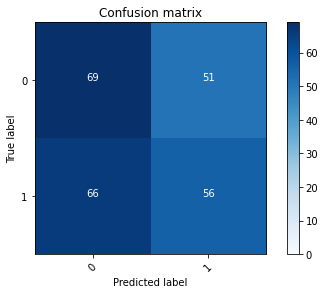

2022-08-20 14:53:27 - [Epoch Train: 66] loss: 0.0013, auc: 1.0000, acc: 0.9990, time: 55.00 s            
2022-08-20 14:53:27 - [Epoch Valid: 66] loss: 3.3026, auc: 0.5447, acc: 0.5165, time: 12.00 s


 66%|██████████████████████████▍             | 66/100 [1:10:52<37:45, 66.63s/it]

2022-08-20 14:53:27 - EPOCH: 67
2022-08-20 14:53:30 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:53:32 - Train Step 20/245, train_loss: 0.0000
2022-08-20 14:53:35 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:53:37 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:53:39 - Train Step 50/245, train_loss: 0.0028
2022-08-20 14:53:41 - Train Step 60/245, train_loss: 0.0023
2022-08-20 14:53:43 - Train Step 70/245, train_loss: 0.0020
2022-08-20 14:53:45 - Train Step 80/245, train_loss: 0.0017
2022-08-20 14:53:48 - Train Step 90/245, train_loss: 0.0016
2022-08-20 14:53:50 - Train Step 100/245, train_loss: 0.0014
2022-08-20 14:53:52 - Train Step 110/245, train_loss: 0.0051
2022-08-20 14:53:54 - Train Step 120/245, train_loss: 0.0047
2022-08-20 14:53:57 - Train Step 130/245, train_loss: 0.0043
2022-08-20 14:53:59 - Train Step 140/245, train_loss: 0.0040
2022-08-20 14:54:01 - Train Step 150/245, train_loss: 0.0038
2022-08-20 14:54:03 - Train Step 160/245, train_loss: 0.0035
2

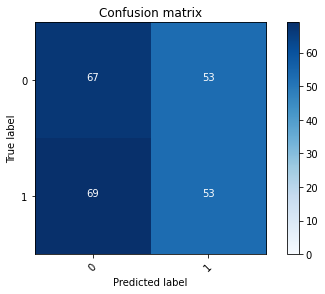

2022-08-20 14:54:35 - [Epoch Train: 67] loss: 0.0023, auc: 1.0000, acc: 0.9980, time: 54.00 s            
2022-08-20 14:54:35 - [Epoch Valid: 67] loss: 3.3259, auc: 0.5438, acc: 0.4959, time: 13.00 s


 67%|██████████████████████████▊             | 67/100 [1:11:59<36:46, 66.87s/it]

2022-08-20 14:54:35 - EPOCH: 68
2022-08-20 14:54:37 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:54:40 - Train Step 20/245, train_loss: 0.0000
2022-08-20 14:54:42 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:54:44 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:54:46 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:54:48 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:54:51 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:54:53 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:54:55 - Train Step 90/245, train_loss: 0.0001
2022-08-20 14:54:57 - Train Step 100/245, train_loss: 0.0020
2022-08-20 14:54:59 - Train Step 110/245, train_loss: 0.0019
2022-08-20 14:55:02 - Train Step 120/245, train_loss: 0.0017
2022-08-20 14:55:04 - Train Step 130/245, train_loss: 0.0016
2022-08-20 14:55:06 - Train Step 140/245, train_loss: 0.0015
2022-08-20 14:55:08 - Train Step 150/245, train_loss: 0.0014
2022-08-20 14:55:10 - Train Step 160/245, train_loss: 0.0013
2

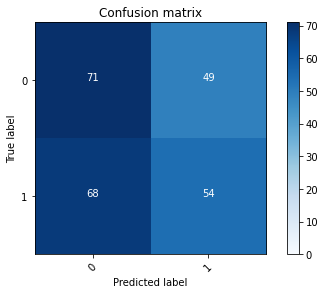

2022-08-20 14:55:42 - [Epoch Train: 68] loss: 0.0024, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:55:42 - [Epoch Valid: 68] loss: 3.2725, auc: 0.5470, acc: 0.5165, time: 13.00 s


 68%|███████████████████████████▏            | 68/100 [1:13:07<35:43, 66.99s/it]

2022-08-20 14:55:42 - EPOCH: 69
2022-08-20 14:55:45 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:55:47 - Train Step 20/245, train_loss: 0.0000
2022-08-20 14:55:49 - Train Step 30/245, train_loss: 0.0000
2022-08-20 14:55:51 - Train Step 40/245, train_loss: 0.0000
2022-08-20 14:55:53 - Train Step 50/245, train_loss: 0.0001
2022-08-20 14:55:56 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:55:58 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:56:00 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:56:02 - Train Step 90/245, train_loss: 0.0027
2022-08-20 14:56:04 - Train Step 100/245, train_loss: 0.0051
2022-08-20 14:56:06 - Train Step 110/245, train_loss: 0.0047
2022-08-20 14:56:08 - Train Step 120/245, train_loss: 0.0043
2022-08-20 14:56:10 - Train Step 130/245, train_loss: 0.0040
2022-08-20 14:56:13 - Train Step 140/245, train_loss: 0.0037
2022-08-20 14:56:15 - Train Step 150/245, train_loss: 0.0034
2022-08-20 14:56:17 - Train Step 160/245, train_loss: 0.0032
2

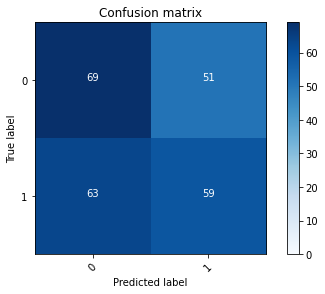

2022-08-20 14:56:49 - [Epoch Train: 69] loss: 0.0021, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:56:49 - [Epoch Valid: 69] loss: 3.1956, auc: 0.5547, acc: 0.5289, time: 13.00 s


 69%|███████████████████████████▌            | 69/100 [1:14:14<34:36, 66.97s/it]

2022-08-20 14:56:49 - EPOCH: 70
2022-08-20 14:56:52 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:56:54 - Train Step 20/245, train_loss: 0.0000
2022-08-20 14:56:56 - Train Step 30/245, train_loss: 0.0000
2022-08-20 14:56:58 - Train Step 40/245, train_loss: 0.0000
2022-08-20 14:57:00 - Train Step 50/245, train_loss: 0.0000
2022-08-20 14:57:03 - Train Step 60/245, train_loss: 0.0001
2022-08-20 14:57:05 - Train Step 70/245, train_loss: 0.0001
2022-08-20 14:57:07 - Train Step 80/245, train_loss: 0.0001
2022-08-20 14:57:09 - Train Step 90/245, train_loss: 0.0001
2022-08-20 14:57:11 - Train Step 100/245, train_loss: 0.0001
2022-08-20 14:57:13 - Train Step 110/245, train_loss: 0.0001
2022-08-20 14:57:16 - Train Step 120/245, train_loss: 0.0001
2022-08-20 14:57:18 - Train Step 130/245, train_loss: 0.0001
2022-08-20 14:57:20 - Train Step 140/245, train_loss: 0.0001
2022-08-20 14:57:22 - Train Step 150/245, train_loss: 0.0001
2022-08-20 14:57:24 - Train Step 160/245, train_loss: 0.0001
2

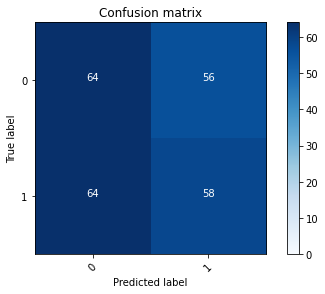

2022-08-20 14:57:56 - [Epoch Train: 70] loss: 0.0027, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 14:57:56 - [Epoch Valid: 70] loss: 3.2702, auc: 0.5433, acc: 0.5041, time: 12.00 s


 70%|████████████████████████████            | 70/100 [1:15:20<33:25, 66.85s/it]

2022-08-20 14:57:56 - EPOCH: 71
2022-08-20 14:57:58 - Train Step 10/245, train_loss: 0.0000
2022-08-20 14:58:00 - Train Step 20/245, train_loss: 0.0000
2022-08-20 14:58:02 - Train Step 30/245, train_loss: 0.0000
2022-08-20 14:58:04 - Train Step 40/245, train_loss: 0.0000
2022-08-20 14:58:06 - Train Step 50/245, train_loss: 0.0000
2022-08-20 14:58:08 - Train Step 60/245, train_loss: 0.0000
2022-08-20 14:58:10 - Train Step 70/245, train_loss: 0.0000
2022-08-20 14:58:12 - Train Step 80/245, train_loss: 0.0000
2022-08-20 14:58:14 - Train Step 90/245, train_loss: 0.0000
2022-08-20 14:58:16 - Train Step 100/245, train_loss: 0.0000
2022-08-20 14:58:19 - Train Step 110/245, train_loss: 0.0010
2022-08-20 14:58:21 - Train Step 120/245, train_loss: 0.0009
2022-08-20 14:58:23 - Train Step 130/245, train_loss: 0.0008
2022-08-20 14:58:25 - Train Step 140/245, train_loss: 0.0008
2022-08-20 14:58:27 - Train Step 150/245, train_loss: 0.0007
2022-08-20 14:58:29 - Train Step 160/245, train_loss: 0.0040
2

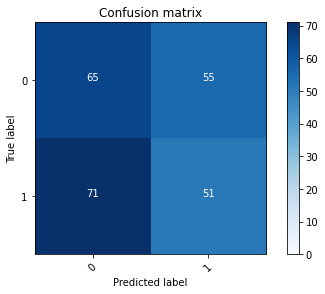

2022-08-20 14:59:01 - [Epoch Train: 71] loss: 0.0027, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 14:59:01 - [Epoch Valid: 71] loss: 3.1487, auc: 0.5436, acc: 0.4793, time: 13.00 s


 71%|████████████████████████████▍           | 71/100 [1:16:25<32:04, 66.38s/it]

2022-08-20 14:59:01 - EPOCH: 72
2022-08-20 14:59:03 - Train Step 10/245, train_loss: 0.0001
2022-08-20 14:59:05 - Train Step 20/245, train_loss: 0.0001
2022-08-20 14:59:07 - Train Step 30/245, train_loss: 0.0001
2022-08-20 14:59:10 - Train Step 40/245, train_loss: 0.0001
2022-08-20 14:59:12 - Train Step 50/245, train_loss: 0.0073
2022-08-20 14:59:14 - Train Step 60/245, train_loss: 0.0061
2022-08-20 14:59:16 - Train Step 70/245, train_loss: 0.0052
2022-08-20 14:59:18 - Train Step 80/245, train_loss: 0.0046
2022-08-20 14:59:20 - Train Step 90/245, train_loss: 0.0058
2022-08-20 14:59:23 - Train Step 100/245, train_loss: 0.0052
2022-08-20 14:59:25 - Train Step 110/245, train_loss: 0.0047
2022-08-20 14:59:27 - Train Step 120/245, train_loss: 0.0043
2022-08-20 14:59:29 - Train Step 130/245, train_loss: 0.0040
2022-08-20 14:59:31 - Train Step 140/245, train_loss: 0.0037
2022-08-20 14:59:33 - Train Step 150/245, train_loss: 0.0035
2022-08-20 14:59:35 - Train Step 160/245, train_loss: 0.0033
2

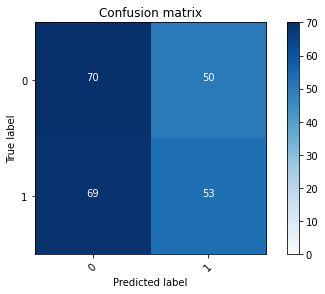

2022-08-20 15:00:07 - [Epoch Train: 72] loss: 0.0021, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 15:00:07 - [Epoch Valid: 72] loss: 3.3564, auc: 0.5417, acc: 0.5083, time: 13.00 s


 72%|████████████████████████████▊           | 72/100 [1:17:32<30:57, 66.33s/it]

2022-08-20 15:00:07 - EPOCH: 73
2022-08-20 15:00:10 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:00:12 - Train Step 20/245, train_loss: 0.0003
2022-08-20 15:00:14 - Train Step 30/245, train_loss: 0.0003
2022-08-20 15:00:16 - Train Step 40/245, train_loss: 0.0002
2022-08-20 15:00:18 - Train Step 50/245, train_loss: 0.0002
2022-08-20 15:00:20 - Train Step 60/245, train_loss: 0.0002
2022-08-20 15:00:22 - Train Step 70/245, train_loss: 0.0001
2022-08-20 15:00:24 - Train Step 80/245, train_loss: 0.0001
2022-08-20 15:00:26 - Train Step 90/245, train_loss: 0.0001
2022-08-20 15:00:29 - Train Step 100/245, train_loss: 0.0029
2022-08-20 15:00:31 - Train Step 110/245, train_loss: 0.0027
2022-08-20 15:00:33 - Train Step 120/245, train_loss: 0.0059
2022-08-20 15:00:35 - Train Step 130/245, train_loss: 0.0054
2022-08-20 15:00:37 - Train Step 140/245, train_loss: 0.0050
2022-08-20 15:00:40 - Train Step 150/245, train_loss: 0.0047
2022-08-20 15:00:42 - Train Step 160/245, train_loss: 0.0044
2

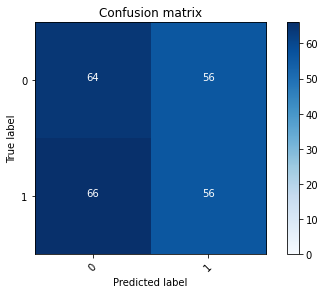

2022-08-20 15:01:14 - [Epoch Train: 73] loss: 0.0029, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 15:01:14 - [Epoch Valid: 73] loss: 3.3279, auc: 0.5439, acc: 0.4959, time: 13.00 s


 73%|█████████████████████████████▏          | 73/100 [1:18:38<29:52, 66.40s/it]

2022-08-20 15:01:14 - EPOCH: 74
2022-08-20 15:01:16 - Train Step 10/245, train_loss: 0.0001
2022-08-20 15:01:18 - Train Step 20/245, train_loss: 0.0001
2022-08-20 15:01:20 - Train Step 30/245, train_loss: 0.0001
2022-08-20 15:01:23 - Train Step 40/245, train_loss: 0.0001
2022-08-20 15:01:25 - Train Step 50/245, train_loss: 0.0001
2022-08-20 15:01:27 - Train Step 60/245, train_loss: 0.0029
2022-08-20 15:01:29 - Train Step 70/245, train_loss: 0.0025
2022-08-20 15:01:31 - Train Step 80/245, train_loss: 0.0022
2022-08-20 15:01:33 - Train Step 90/245, train_loss: 0.0020
2022-08-20 15:01:36 - Train Step 100/245, train_loss: 0.0018
2022-08-20 15:01:38 - Train Step 110/245, train_loss: 0.0016
2022-08-20 15:01:40 - Train Step 120/245, train_loss: 0.0015
2022-08-20 15:01:42 - Train Step 130/245, train_loss: 0.0014
2022-08-20 15:01:44 - Train Step 140/245, train_loss: 0.0013
2022-08-20 15:01:46 - Train Step 150/245, train_loss: 0.0012
2022-08-20 15:01:48 - Train Step 160/245, train_loss: 0.0012
2

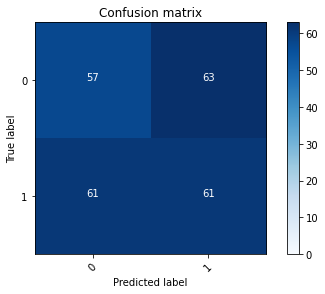

2022-08-20 15:02:20 - [Epoch Train: 74] loss: 0.0024, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 15:02:20 - [Epoch Valid: 74] loss: 3.3726, auc: 0.5441, acc: 0.4876, time: 13.00 s


 74%|█████████████████████████████▌          | 74/100 [1:19:45<28:47, 66.46s/it]

2022-08-20 15:02:20 - EPOCH: 75
2022-08-20 15:02:23 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:02:25 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:02:27 - Train Step 30/245, train_loss: 0.0067
2022-08-20 15:02:29 - Train Step 40/245, train_loss: 0.0050
2022-08-20 15:02:31 - Train Step 50/245, train_loss: 0.0040
2022-08-20 15:02:34 - Train Step 60/245, train_loss: 0.0034
2022-08-20 15:02:36 - Train Step 70/245, train_loss: 0.0029
2022-08-20 15:02:38 - Train Step 80/245, train_loss: 0.0025
2022-08-20 15:02:40 - Train Step 90/245, train_loss: 0.0023
2022-08-20 15:02:42 - Train Step 100/245, train_loss: 0.0020
2022-08-20 15:02:45 - Train Step 110/245, train_loss: 0.0019
2022-08-20 15:02:47 - Train Step 120/245, train_loss: 0.0017
2022-08-20 15:02:49 - Train Step 130/245, train_loss: 0.0016
2022-08-20 15:02:51 - Train Step 140/245, train_loss: 0.0015
2022-08-20 15:02:53 - Train Step 150/245, train_loss: 0.0014
2022-08-20 15:02:56 - Train Step 160/245, train_loss: 0.0013
2

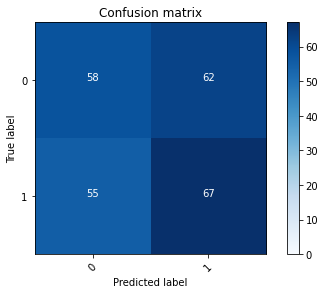

2022-08-20 15:03:28 - [Epoch Train: 75] loss: 0.0016, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 15:03:28 - [Epoch Valid: 75] loss: 3.1525, auc: 0.5423, acc: 0.5165, time: 13.00 s


 75%|██████████████████████████████          | 75/100 [1:20:52<27:49, 66.79s/it]

2022-08-20 15:03:28 - EPOCH: 76
2022-08-20 15:03:30 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:03:32 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:03:34 - Train Step 30/245, train_loss: 0.0001
2022-08-20 15:03:37 - Train Step 40/245, train_loss: 0.0030
2022-08-20 15:03:39 - Train Step 50/245, train_loss: 0.0024
2022-08-20 15:03:41 - Train Step 60/245, train_loss: 0.0020
2022-08-20 15:03:43 - Train Step 70/245, train_loss: 0.0018
2022-08-20 15:03:45 - Train Step 80/245, train_loss: 0.0015
2022-08-20 15:03:47 - Train Step 90/245, train_loss: 0.0014
2022-08-20 15:03:49 - Train Step 100/245, train_loss: 0.0012
2022-08-20 15:03:51 - Train Step 110/245, train_loss: 0.0011
2022-08-20 15:03:53 - Train Step 120/245, train_loss: 0.0038
2022-08-20 15:03:55 - Train Step 130/245, train_loss: 0.0035
2022-08-20 15:03:57 - Train Step 140/245, train_loss: 0.0032
2022-08-20 15:03:59 - Train Step 150/245, train_loss: 0.0030
2022-08-20 15:04:02 - Train Step 160/245, train_loss: 0.0028
2

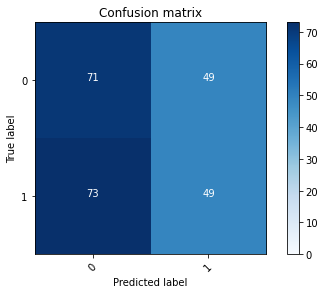

2022-08-20 15:04:33 - [Epoch Train: 76] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 15:04:33 - [Epoch Valid: 76] loss: 3.3968, auc: 0.5451, acc: 0.4959, time: 13.00 s


 76%|██████████████████████████████▍         | 76/100 [1:21:58<26:30, 66.29s/it]

2022-08-20 15:04:33 - EPOCH: 77
2022-08-20 15:04:35 - Train Step 10/245, train_loss: 0.0001
2022-08-20 15:04:38 - Train Step 20/245, train_loss: 0.0001
2022-08-20 15:04:40 - Train Step 30/245, train_loss: 0.0041
2022-08-20 15:04:42 - Train Step 40/245, train_loss: 0.0031
2022-08-20 15:04:44 - Train Step 50/245, train_loss: 0.0025
2022-08-20 15:04:46 - Train Step 60/245, train_loss: 0.0021
2022-08-20 15:04:49 - Train Step 70/245, train_loss: 0.0018
2022-08-20 15:04:51 - Train Step 80/245, train_loss: 0.0016
2022-08-20 15:04:53 - Train Step 90/245, train_loss: 0.0014
2022-08-20 15:04:55 - Train Step 100/245, train_loss: 0.0013
2022-08-20 15:04:58 - Train Step 110/245, train_loss: 0.0012
2022-08-20 15:05:00 - Train Step 120/245, train_loss: 0.0011
2022-08-20 15:05:02 - Train Step 130/245, train_loss: 0.0010
2022-08-20 15:05:04 - Train Step 140/245, train_loss: 0.0009
2022-08-20 15:05:06 - Train Step 150/245, train_loss: 0.0009
2022-08-20 15:05:09 - Train Step 160/245, train_loss: 0.0008
2

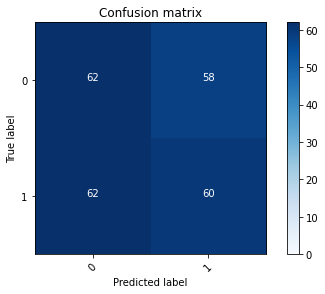

2022-08-20 15:05:40 - [Epoch Train: 77] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 15:05:40 - [Epoch Valid: 77] loss: 3.3323, auc: 0.5451, acc: 0.5041, time: 12.00 s


 77%|██████████████████████████████▊         | 77/100 [1:23:05<25:30, 66.53s/it]

2022-08-20 15:05:40 - EPOCH: 78
2022-08-20 15:05:43 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:05:45 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:05:47 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:05:49 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:05:51 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:05:53 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:05:56 - Train Step 70/245, train_loss: 0.0000
2022-08-20 15:05:58 - Train Step 80/245, train_loss: 0.0000
2022-08-20 15:06:00 - Train Step 90/245, train_loss: 0.0000
2022-08-20 15:06:02 - Train Step 100/245, train_loss: 0.0000
2022-08-20 15:06:04 - Train Step 110/245, train_loss: 0.0000
2022-08-20 15:06:07 - Train Step 120/245, train_loss: 0.0000
2022-08-20 15:06:09 - Train Step 130/245, train_loss: 0.0000
2022-08-20 15:06:11 - Train Step 140/245, train_loss: 0.0000
2022-08-20 15:06:13 - Train Step 150/245, train_loss: 0.0011
2022-08-20 15:06:16 - Train Step 160/245, train_loss: 0.0010
2

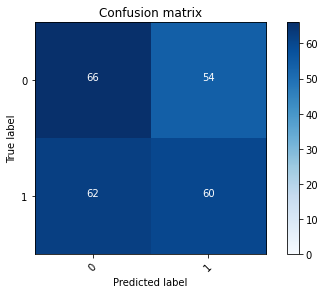

2022-08-20 15:06:48 - [Epoch Train: 78] loss: 0.0016, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 15:06:48 - [Epoch Valid: 78] loss: 3.4120, auc: 0.5511, acc: 0.5207, time: 13.00 s


 78%|███████████████████████████████▏        | 78/100 [1:24:13<24:33, 66.96s/it]

2022-08-20 15:06:48 - EPOCH: 79
2022-08-20 15:06:51 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:06:53 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:06:55 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:06:57 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:06:59 - Train Step 50/245, train_loss: 0.0039
2022-08-20 15:07:01 - Train Step 60/245, train_loss: 0.0032
2022-08-20 15:07:04 - Train Step 70/245, train_loss: 0.0028
2022-08-20 15:07:06 - Train Step 80/245, train_loss: 0.0024
2022-08-20 15:07:08 - Train Step 90/245, train_loss: 0.0022
2022-08-20 15:07:10 - Train Step 100/245, train_loss: 0.0054
2022-08-20 15:07:12 - Train Step 110/245, train_loss: 0.0050
2022-08-20 15:07:14 - Train Step 120/245, train_loss: 0.0045
2022-08-20 15:07:16 - Train Step 130/245, train_loss: 0.0042
2022-08-20 15:07:18 - Train Step 140/245, train_loss: 0.0039
2022-08-20 15:07:20 - Train Step 150/245, train_loss: 0.0036
2022-08-20 15:07:23 - Train Step 160/245, train_loss: 0.0034
2

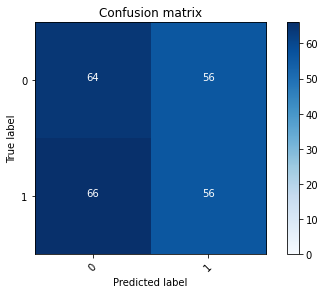

2022-08-20 15:07:54 - [Epoch Train: 79] loss: 0.0022, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 15:07:54 - [Epoch Valid: 79] loss: 3.3601, auc: 0.5490, acc: 0.4959, time: 13.00 s


 79%|███████████████████████████████▌        | 79/100 [1:25:18<23:17, 66.55s/it]

2022-08-20 15:07:54 - EPOCH: 80
2022-08-20 15:07:56 - Train Step 10/245, train_loss: 0.0001
2022-08-20 15:07:58 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:08:01 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:08:03 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:08:05 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:08:07 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:08:09 - Train Step 70/245, train_loss: 0.0000
2022-08-20 15:08:12 - Train Step 80/245, train_loss: 0.0000
2022-08-20 15:08:14 - Train Step 90/245, train_loss: 0.0000
2022-08-20 15:08:16 - Train Step 100/245, train_loss: 0.0000
2022-08-20 15:08:18 - Train Step 110/245, train_loss: 0.0000
2022-08-20 15:08:21 - Train Step 120/245, train_loss: 0.0000
2022-08-20 15:08:23 - Train Step 130/245, train_loss: 0.0000
2022-08-20 15:08:25 - Train Step 140/245, train_loss: 0.0000
2022-08-20 15:08:27 - Train Step 150/245, train_loss: 0.0000
2022-08-20 15:08:30 - Train Step 160/245, train_loss: 0.0000
2

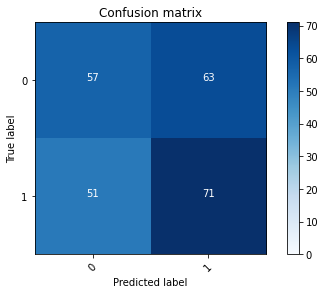

2022-08-20 15:09:01 - [Epoch Train: 80] loss: 0.0033, auc: 1.0000, acc: 0.9980, time: 54.00 s            
2022-08-20 15:09:01 - [Epoch Valid: 80] loss: 3.5078, auc: 0.5345, acc: 0.5289, time: 12.00 s


 80%|████████████████████████████████        | 80/100 [1:26:25<22:14, 66.72s/it]

2022-08-20 15:09:01 - EPOCH: 81
2022-08-20 15:09:03 - Train Step 10/245, train_loss: 0.0001
2022-08-20 15:09:05 - Train Step 20/245, train_loss: 0.0001
2022-08-20 15:09:08 - Train Step 30/245, train_loss: 0.0001
2022-08-20 15:09:10 - Train Step 40/245, train_loss: 0.0048
2022-08-20 15:09:12 - Train Step 50/245, train_loss: 0.0038
2022-08-20 15:09:14 - Train Step 60/245, train_loss: 0.0032
2022-08-20 15:09:16 - Train Step 70/245, train_loss: 0.0028
2022-08-20 15:09:19 - Train Step 80/245, train_loss: 0.0025
2022-08-20 15:09:21 - Train Step 90/245, train_loss: 0.0022
2022-08-20 15:09:23 - Train Step 100/245, train_loss: 0.0020
2022-08-20 15:09:25 - Train Step 110/245, train_loss: 0.0018
2022-08-20 15:09:27 - Train Step 120/245, train_loss: 0.0017
2022-08-20 15:09:30 - Train Step 130/245, train_loss: 0.0015
2022-08-20 15:09:32 - Train Step 140/245, train_loss: 0.0014
2022-08-20 15:09:34 - Train Step 150/245, train_loss: 0.0013
2022-08-20 15:09:36 - Train Step 160/245, train_loss: 0.0013
2

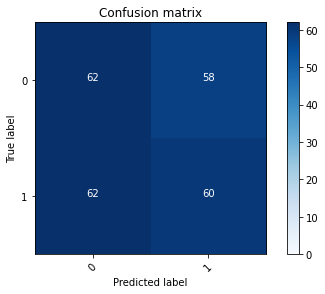

2022-08-20 15:10:09 - [Epoch Train: 81] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 15:10:09 - [Epoch Valid: 81] loss: 3.5500, auc: 0.5394, acc: 0.5041, time: 13.00 s


 81%|████████████████████████████████▍       | 81/100 [1:27:33<21:15, 67.11s/it]

2022-08-20 15:10:09 - EPOCH: 82
2022-08-20 15:10:11 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:10:13 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:10:15 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:10:17 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:10:19 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:10:21 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:10:23 - Train Step 70/245, train_loss: 0.0017
2022-08-20 15:10:26 - Train Step 80/245, train_loss: 0.0015
2022-08-20 15:10:28 - Train Step 90/245, train_loss: 0.0013
2022-08-20 15:10:30 - Train Step 100/245, train_loss: 0.0012
2022-08-20 15:10:32 - Train Step 110/245, train_loss: 0.0011
2022-08-20 15:10:34 - Train Step 120/245, train_loss: 0.0010
2022-08-20 15:10:36 - Train Step 130/245, train_loss: 0.0027
2022-08-20 15:10:38 - Train Step 140/245, train_loss: 0.0025
2022-08-20 15:10:40 - Train Step 150/245, train_loss: 0.0023
2022-08-20 15:10:42 - Train Step 160/245, train_loss: 0.0022
2

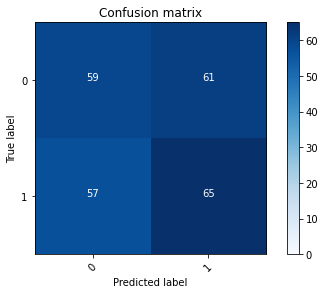

2022-08-20 15:11:13 - [Epoch Train: 82] loss: 0.0015, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 15:11:13 - [Epoch Valid: 82] loss: 3.4515, auc: 0.5393, acc: 0.5124, time: 13.00 s


 82%|████████████████████████████████▊       | 82/100 [1:28:37<19:50, 66.14s/it]

2022-08-20 15:11:13 - EPOCH: 83
2022-08-20 15:11:15 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:11:17 - Train Step 20/245, train_loss: 0.0133
2022-08-20 15:11:20 - Train Step 30/245, train_loss: 0.0089
2022-08-20 15:11:22 - Train Step 40/245, train_loss: 0.0067
2022-08-20 15:11:24 - Train Step 50/245, train_loss: 0.0053
2022-08-20 15:11:26 - Train Step 60/245, train_loss: 0.0044
2022-08-20 15:11:28 - Train Step 70/245, train_loss: 0.0038
2022-08-20 15:11:31 - Train Step 80/245, train_loss: 0.0033
2022-08-20 15:11:33 - Train Step 90/245, train_loss: 0.0030
2022-08-20 15:11:35 - Train Step 100/245, train_loss: 0.0027
2022-08-20 15:11:37 - Train Step 110/245, train_loss: 0.0024
2022-08-20 15:11:39 - Train Step 120/245, train_loss: 0.0022
2022-08-20 15:11:41 - Train Step 130/245, train_loss: 0.0021
2022-08-20 15:11:43 - Train Step 140/245, train_loss: 0.0019
2022-08-20 15:11:45 - Train Step 150/245, train_loss: 0.0018
2022-08-20 15:11:48 - Train Step 160/245, train_loss: 0.0035
2

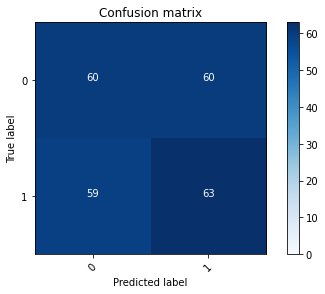

2022-08-20 15:12:19 - [Epoch Train: 83] loss: 0.0023, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 15:12:19 - [Epoch Valid: 83] loss: 3.3546, auc: 0.5360, acc: 0.5083, time: 13.00 s


 83%|█████████████████████████████████▏      | 83/100 [1:29:44<18:45, 66.23s/it]

2022-08-20 15:12:19 - EPOCH: 84
2022-08-20 15:12:22 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:12:24 - Train Step 20/245, train_loss: 0.0001
2022-08-20 15:12:26 - Train Step 30/245, train_loss: 0.0001
2022-08-20 15:12:28 - Train Step 40/245, train_loss: 0.0001
2022-08-20 15:12:30 - Train Step 50/245, train_loss: 0.0001
2022-08-20 15:12:33 - Train Step 60/245, train_loss: 0.0001
2022-08-20 15:12:35 - Train Step 70/245, train_loss: 0.0001
2022-08-20 15:12:37 - Train Step 80/245, train_loss: 0.0001
2022-08-20 15:12:39 - Train Step 90/245, train_loss: 0.0001
2022-08-20 15:12:41 - Train Step 100/245, train_loss: 0.0035
2022-08-20 15:12:43 - Train Step 110/245, train_loss: 0.0032
2022-08-20 15:12:46 - Train Step 120/245, train_loss: 0.0029
2022-08-20 15:12:48 - Train Step 130/245, train_loss: 0.0027
2022-08-20 15:12:50 - Train Step 140/245, train_loss: 0.0025
2022-08-20 15:12:52 - Train Step 150/245, train_loss: 0.0024
2022-08-20 15:12:55 - Train Step 160/245, train_loss: 0.0022
2

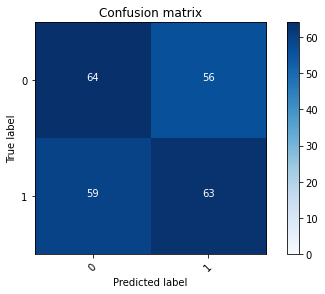

2022-08-20 15:13:27 - [Epoch Train: 84] loss: 0.0023, auc: 1.0000, acc: 0.9980, time: 54.00 s            
2022-08-20 15:13:27 - [Epoch Valid: 84] loss: 3.7505, auc: 0.5404, acc: 0.5248, time: 13.00 s


 84%|█████████████████████████████████▌      | 84/100 [1:30:52<17:48, 66.81s/it]

2022-08-20 15:13:27 - EPOCH: 85
2022-08-20 15:13:30 - Train Step 10/245, train_loss: 0.0002
2022-08-20 15:13:32 - Train Step 20/245, train_loss: 0.0001
2022-08-20 15:13:34 - Train Step 30/245, train_loss: 0.0104
2022-08-20 15:13:36 - Train Step 40/245, train_loss: 0.0078
2022-08-20 15:13:38 - Train Step 50/245, train_loss: 0.0062
2022-08-20 15:13:40 - Train Step 60/245, train_loss: 0.0052
2022-08-20 15:13:43 - Train Step 70/245, train_loss: 0.0045
2022-08-20 15:13:45 - Train Step 80/245, train_loss: 0.0039
2022-08-20 15:13:47 - Train Step 90/245, train_loss: 0.0035
2022-08-20 15:13:49 - Train Step 100/245, train_loss: 0.0032
2022-08-20 15:13:51 - Train Step 110/245, train_loss: 0.0029
2022-08-20 15:13:53 - Train Step 120/245, train_loss: 0.0026
2022-08-20 15:13:56 - Train Step 130/245, train_loss: 0.0024
2022-08-20 15:13:58 - Train Step 140/245, train_loss: 0.0023
2022-08-20 15:14:00 - Train Step 150/245, train_loss: 0.0021
2022-08-20 15:14:02 - Train Step 160/245, train_loss: 0.0020
2

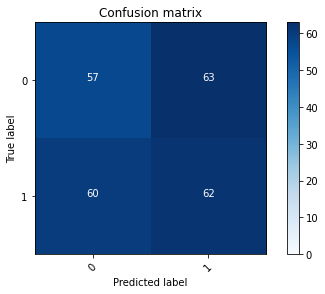

2022-08-20 15:14:33 - [Epoch Train: 85] loss: 0.0024, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 15:14:33 - [Epoch Valid: 85] loss: 3.6329, auc: 0.5354, acc: 0.4917, time: 12.00 s


 85%|██████████████████████████████████      | 85/100 [1:31:57<16:36, 66.43s/it]

2022-08-20 15:14:33 - EPOCH: 86
2022-08-20 15:14:35 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:14:37 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:14:40 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:14:42 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:14:44 - Train Step 50/245, train_loss: 0.0021
2022-08-20 15:14:46 - Train Step 60/245, train_loss: 0.0018
2022-08-20 15:14:48 - Train Step 70/245, train_loss: 0.0052
2022-08-20 15:14:50 - Train Step 80/245, train_loss: 0.0046
2022-08-20 15:14:52 - Train Step 90/245, train_loss: 0.0041
2022-08-20 15:14:55 - Train Step 100/245, train_loss: 0.0037
2022-08-20 15:14:57 - Train Step 110/245, train_loss: 0.0033
2022-08-20 15:14:59 - Train Step 120/245, train_loss: 0.0031
2022-08-20 15:15:01 - Train Step 130/245, train_loss: 0.0028
2022-08-20 15:15:03 - Train Step 140/245, train_loss: 0.0026
2022-08-20 15:15:05 - Train Step 150/245, train_loss: 0.0025
2022-08-20 15:15:07 - Train Step 160/245, train_loss: 0.0023
2

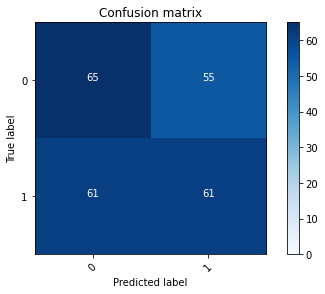

2022-08-20 15:15:39 - [Epoch Train: 86] loss: 0.0015, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 15:15:39 - [Epoch Valid: 86] loss: 3.4785, auc: 0.5349, acc: 0.5207, time: 13.00 s


 86%|██████████████████████████████████▍     | 86/100 [1:33:04<15:28, 66.35s/it]

2022-08-20 15:15:39 - EPOCH: 87
2022-08-20 15:15:41 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:15:44 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:15:46 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:15:48 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:15:50 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:15:52 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:15:54 - Train Step 70/245, train_loss: 0.0000
2022-08-20 15:15:57 - Train Step 80/245, train_loss: 0.0000
2022-08-20 15:15:59 - Train Step 90/245, train_loss: 0.0000
2022-08-20 15:16:01 - Train Step 100/245, train_loss: 0.0014
2022-08-20 15:16:03 - Train Step 110/245, train_loss: 0.0012
2022-08-20 15:16:05 - Train Step 120/245, train_loss: 0.0011
2022-08-20 15:16:07 - Train Step 130/245, train_loss: 0.0011
2022-08-20 15:16:09 - Train Step 140/245, train_loss: 0.0010
2022-08-20 15:16:11 - Train Step 150/245, train_loss: 0.0009
2022-08-20 15:16:14 - Train Step 160/245, train_loss: 0.0009
2

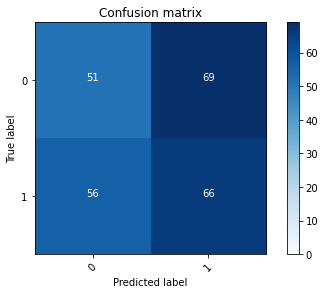

2022-08-20 15:16:45 - [Epoch Train: 87] loss: 0.0020, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 15:16:45 - [Epoch Valid: 87] loss: 3.7308, auc: 0.5363, acc: 0.4835, time: 13.00 s


 87%|██████████████████████████████████▊     | 87/100 [1:34:09<14:21, 66.24s/it]

2022-08-20 15:16:45 - EPOCH: 88
2022-08-20 15:16:47 - Train Step 10/245, train_loss: 0.0281
2022-08-20 15:16:49 - Train Step 20/245, train_loss: 0.0141
2022-08-20 15:16:51 - Train Step 30/245, train_loss: 0.0094
2022-08-20 15:16:53 - Train Step 40/245, train_loss: 0.0071
2022-08-20 15:16:56 - Train Step 50/245, train_loss: 0.0057
2022-08-20 15:16:58 - Train Step 60/245, train_loss: 0.0047
2022-08-20 15:17:00 - Train Step 70/245, train_loss: 0.0040
2022-08-20 15:17:02 - Train Step 80/245, train_loss: 0.0035
2022-08-20 15:17:04 - Train Step 90/245, train_loss: 0.0032
2022-08-20 15:17:06 - Train Step 100/245, train_loss: 0.0028
2022-08-20 15:17:08 - Train Step 110/245, train_loss: 0.0026
2022-08-20 15:17:10 - Train Step 120/245, train_loss: 0.0024
2022-08-20 15:17:12 - Train Step 130/245, train_loss: 0.0022
2022-08-20 15:17:14 - Train Step 140/245, train_loss: 0.0039
2022-08-20 15:17:16 - Train Step 150/245, train_loss: 0.0037
2022-08-20 15:17:19 - Train Step 160/245, train_loss: 0.0035
2

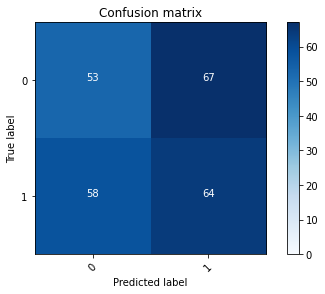

2022-08-20 15:17:50 - [Epoch Train: 88] loss: 0.0023, auc: 1.0000, acc: 0.9980, time: 51.00 s            
2022-08-20 15:17:50 - [Epoch Valid: 88] loss: 3.6986, auc: 0.5365, acc: 0.4835, time: 13.00 s


 88%|███████████████████████████████████▏    | 88/100 [1:35:14<13:09, 65.79s/it]

2022-08-20 15:17:50 - EPOCH: 89
2022-08-20 15:17:52 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:17:55 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:17:57 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:17:59 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:18:01 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:18:03 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:18:05 - Train Step 70/245, train_loss: 0.0000
2022-08-20 15:18:07 - Train Step 80/245, train_loss: 0.0000
2022-08-20 15:18:09 - Train Step 90/245, train_loss: 0.0025
2022-08-20 15:18:11 - Train Step 100/245, train_loss: 0.0022
2022-08-20 15:18:14 - Train Step 110/245, train_loss: 0.0020
2022-08-20 15:18:16 - Train Step 120/245, train_loss: 0.0019
2022-08-20 15:18:18 - Train Step 130/245, train_loss: 0.0017
2022-08-20 15:18:20 - Train Step 140/245, train_loss: 0.0016
2022-08-20 15:18:22 - Train Step 150/245, train_loss: 0.0015
2022-08-20 15:18:24 - Train Step 160/245, train_loss: 0.0014
2

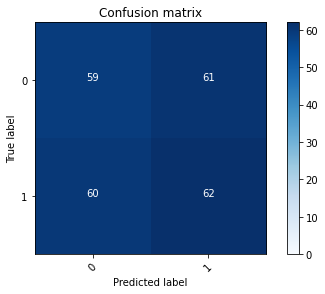

2022-08-20 15:18:56 - [Epoch Train: 89] loss: 0.0015, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 15:18:56 - [Epoch Valid: 89] loss: 3.8181, auc: 0.5372, acc: 0.5000, time: 13.00 s


 89%|███████████████████████████████████▌    | 89/100 [1:36:21<12:06, 66.04s/it]

2022-08-20 15:18:56 - EPOCH: 90
2022-08-20 15:18:59 - Train Step 10/245, train_loss: 0.0293
2022-08-20 15:19:01 - Train Step 20/245, train_loss: 0.0148
2022-08-20 15:19:03 - Train Step 30/245, train_loss: 0.0099
2022-08-20 15:19:05 - Train Step 40/245, train_loss: 0.0074
2022-08-20 15:19:07 - Train Step 50/245, train_loss: 0.0059
2022-08-20 15:19:09 - Train Step 60/245, train_loss: 0.0049
2022-08-20 15:19:11 - Train Step 70/245, train_loss: 0.0042
2022-08-20 15:19:13 - Train Step 80/245, train_loss: 0.0037
2022-08-20 15:19:15 - Train Step 90/245, train_loss: 0.0033
2022-08-20 15:19:17 - Train Step 100/245, train_loss: 0.0030
2022-08-20 15:19:19 - Train Step 110/245, train_loss: 0.0027
2022-08-20 15:19:21 - Train Step 120/245, train_loss: 0.0025
2022-08-20 15:19:23 - Train Step 130/245, train_loss: 0.0023
2022-08-20 15:19:26 - Train Step 140/245, train_loss: 0.0022
2022-08-20 15:19:28 - Train Step 150/245, train_loss: 0.0020
2022-08-20 15:19:30 - Train Step 160/245, train_loss: 0.0019
2

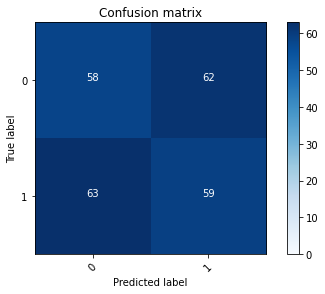

2022-08-20 15:20:01 - [Epoch Train: 90] loss: 0.0023, auc: 1.0000, acc: 0.9980, time: 51.00 s            
2022-08-20 15:20:01 - [Epoch Valid: 90] loss: 3.6211, auc: 0.5317, acc: 0.4835, time: 13.00 s


 90%|████████████████████████████████████    | 90/100 [1:37:26<10:57, 65.76s/it]

2022-08-20 15:20:01 - EPOCH: 91
2022-08-20 15:20:04 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:20:06 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:20:08 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:20:10 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:20:12 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:20:14 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:20:17 - Train Step 70/245, train_loss: 0.0000
2022-08-20 15:20:19 - Train Step 80/245, train_loss: 0.0000
2022-08-20 15:20:21 - Train Step 90/245, train_loss: 0.0000
2022-08-20 15:20:23 - Train Step 100/245, train_loss: 0.0000
2022-08-20 15:20:25 - Train Step 110/245, train_loss: 0.0000
2022-08-20 15:20:27 - Train Step 120/245, train_loss: 0.0021
2022-08-20 15:20:29 - Train Step 130/245, train_loss: 0.0019
2022-08-20 15:20:32 - Train Step 140/245, train_loss: 0.0034
2022-08-20 15:20:34 - Train Step 150/245, train_loss: 0.0032
2022-08-20 15:20:36 - Train Step 160/245, train_loss: 0.0030
2

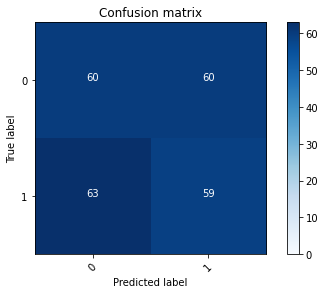

2022-08-20 15:21:08 - [Epoch Train: 91] loss: 0.0020, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 15:21:08 - [Epoch Valid: 91] loss: 3.7791, auc: 0.5268, acc: 0.4917, time: 13.00 s


 91%|████████████████████████████████████▍   | 91/100 [1:38:32<09:53, 65.99s/it]

2022-08-20 15:21:08 - EPOCH: 92
2022-08-20 15:21:10 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:21:13 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:21:15 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:21:17 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:21:19 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:21:21 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:21:24 - Train Step 70/245, train_loss: 0.0000
2022-08-20 15:21:26 - Train Step 80/245, train_loss: 0.0000
2022-08-20 15:21:28 - Train Step 90/245, train_loss: 0.0000
2022-08-20 15:21:30 - Train Step 100/245, train_loss: 0.0018
2022-08-20 15:21:32 - Train Step 110/245, train_loss: 0.0017
2022-08-20 15:21:34 - Train Step 120/245, train_loss: 0.0015
2022-08-20 15:21:37 - Train Step 130/245, train_loss: 0.0014
2022-08-20 15:21:39 - Train Step 140/245, train_loss: 0.0013
2022-08-20 15:21:41 - Train Step 150/245, train_loss: 0.0012
2022-08-20 15:21:43 - Train Step 160/245, train_loss: 0.0012
2

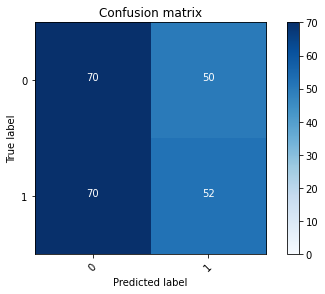

2022-08-20 15:22:15 - [Epoch Train: 92] loss: 0.0016, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 15:22:15 - [Epoch Valid: 92] loss: 3.7450, auc: 0.5283, acc: 0.5041, time: 13.00 s


 92%|████████████████████████████████████▊   | 92/100 [1:39:39<08:50, 66.27s/it]

2022-08-20 15:22:15 - EPOCH: 93
2022-08-20 15:22:17 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:22:20 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:22:22 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:22:24 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:22:26 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:22:28 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:22:31 - Train Step 70/245, train_loss: 0.0034
2022-08-20 15:22:33 - Train Step 80/245, train_loss: 0.0030
2022-08-20 15:22:35 - Train Step 90/245, train_loss: 0.0026
2022-08-20 15:22:37 - Train Step 100/245, train_loss: 0.0024
2022-08-20 15:22:39 - Train Step 110/245, train_loss: 0.0022
2022-08-20 15:22:41 - Train Step 120/245, train_loss: 0.0020
2022-08-20 15:22:43 - Train Step 130/245, train_loss: 0.0018
2022-08-20 15:22:46 - Train Step 140/245, train_loss: 0.0017
2022-08-20 15:22:48 - Train Step 150/245, train_loss: 0.0016
2022-08-20 15:22:50 - Train Step 160/245, train_loss: 0.0015
2

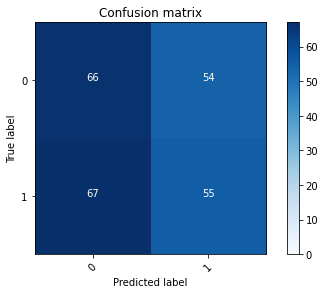

2022-08-20 15:23:21 - [Epoch Train: 93] loss: 0.0022, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 15:23:21 - [Epoch Valid: 93] loss: 3.6154, auc: 0.5312, acc: 0.5000, time: 13.00 s


 93%|█████████████████████████████████████▏  | 93/100 [1:40:46<07:43, 66.26s/it]

2022-08-20 15:23:21 - EPOCH: 94
2022-08-20 15:23:23 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:23:26 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:23:28 - Train Step 30/245, train_loss: 0.0064
2022-08-20 15:23:30 - Train Step 40/245, train_loss: 0.0048
2022-08-20 15:23:32 - Train Step 50/245, train_loss: 0.0038
2022-08-20 15:23:35 - Train Step 60/245, train_loss: 0.0032
2022-08-20 15:23:37 - Train Step 70/245, train_loss: 0.0028
2022-08-20 15:23:39 - Train Step 80/245, train_loss: 0.0024
2022-08-20 15:23:41 - Train Step 90/245, train_loss: 0.0022
2022-08-20 15:23:43 - Train Step 100/245, train_loss: 0.0019
2022-08-20 15:23:46 - Train Step 110/245, train_loss: 0.0046
2022-08-20 15:23:48 - Train Step 120/245, train_loss: 0.0043
2022-08-20 15:23:50 - Train Step 130/245, train_loss: 0.0039
2022-08-20 15:23:52 - Train Step 140/245, train_loss: 0.0037
2022-08-20 15:23:54 - Train Step 150/245, train_loss: 0.0034
2022-08-20 15:23:56 - Train Step 160/245, train_loss: 0.0032
2

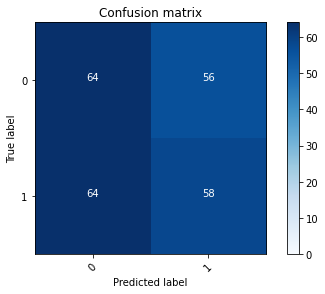

2022-08-20 15:24:28 - [Epoch Train: 94] loss: 0.0021, auc: 1.0000, acc: 0.9980, time: 54.00 s            
2022-08-20 15:24:28 - [Epoch Valid: 94] loss: 3.6281, auc: 0.5230, acc: 0.5041, time: 12.00 s


 94%|█████████████████████████████████████▌  | 94/100 [1:41:52<06:38, 66.40s/it]

2022-08-20 15:24:28 - EPOCH: 95
2022-08-20 15:24:31 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:24:33 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:24:35 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:24:37 - Train Step 40/245, train_loss: 0.0070
2022-08-20 15:24:39 - Train Step 50/245, train_loss: 0.0056
2022-08-20 15:24:41 - Train Step 60/245, train_loss: 0.0046
2022-08-20 15:24:44 - Train Step 70/245, train_loss: 0.0040
2022-08-20 15:24:46 - Train Step 80/245, train_loss: 0.0035
2022-08-20 15:24:48 - Train Step 90/245, train_loss: 0.0031
2022-08-20 15:24:50 - Train Step 100/245, train_loss: 0.0028
2022-08-20 15:24:52 - Train Step 110/245, train_loss: 0.0026
2022-08-20 15:24:55 - Train Step 120/245, train_loss: 0.0023
2022-08-20 15:24:57 - Train Step 130/245, train_loss: 0.0022
2022-08-20 15:24:59 - Train Step 140/245, train_loss: 0.0020
2022-08-20 15:25:01 - Train Step 150/245, train_loss: 0.0019
2022-08-20 15:25:03 - Train Step 160/245, train_loss: 0.0018
2

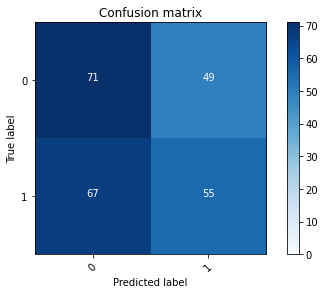

2022-08-20 15:25:34 - [Epoch Train: 95] loss: 0.0026, auc: 1.0000, acc: 0.9980, time: 52.00 s            
2022-08-20 15:25:34 - [Epoch Valid: 95] loss: 3.9704, auc: 0.5241, acc: 0.5207, time: 13.00 s


 95%|██████████████████████████████████████  | 95/100 [1:42:59<05:31, 66.34s/it]

2022-08-20 15:25:34 - EPOCH: 96
2022-08-20 15:25:36 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:25:38 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:25:41 - Train Step 30/245, train_loss: 0.0073
2022-08-20 15:25:43 - Train Step 40/245, train_loss: 0.0055
2022-08-20 15:25:45 - Train Step 50/245, train_loss: 0.0044
2022-08-20 15:25:47 - Train Step 60/245, train_loss: 0.0037
2022-08-20 15:25:49 - Train Step 70/245, train_loss: 0.0032
2022-08-20 15:25:51 - Train Step 80/245, train_loss: 0.0028
2022-08-20 15:25:53 - Train Step 90/245, train_loss: 0.0025
2022-08-20 15:25:55 - Train Step 100/245, train_loss: 0.0022
2022-08-20 15:25:57 - Train Step 110/245, train_loss: 0.0020
2022-08-20 15:25:59 - Train Step 120/245, train_loss: 0.0019
2022-08-20 15:26:01 - Train Step 130/245, train_loss: 0.0042
2022-08-20 15:26:04 - Train Step 140/245, train_loss: 0.0039
2022-08-20 15:26:06 - Train Step 150/245, train_loss: 0.0037
2022-08-20 15:26:08 - Train Step 160/245, train_loss: 0.0034
2

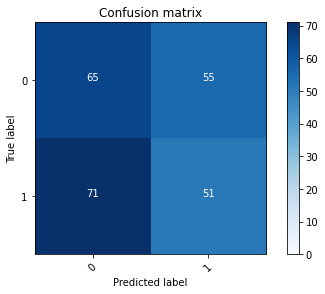

2022-08-20 15:26:40 - [Epoch Train: 96] loss: 0.0023, auc: 1.0000, acc: 0.9980, time: 51.00 s            
2022-08-20 15:26:40 - [Epoch Valid: 96] loss: 3.8307, auc: 0.5237, acc: 0.4793, time: 13.00 s


 96%|██████████████████████████████████████▍ | 96/100 [1:44:04<04:24, 66.21s/it]

2022-08-20 15:26:40 - EPOCH: 97
2022-08-20 15:26:42 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:26:44 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:26:46 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:26:48 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:26:51 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:26:53 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:26:55 - Train Step 70/245, train_loss: 0.0000
2022-08-20 15:26:57 - Train Step 80/245, train_loss: 0.0000
2022-08-20 15:26:59 - Train Step 90/245, train_loss: 0.0000
2022-08-20 15:27:01 - Train Step 100/245, train_loss: 0.0022
2022-08-20 15:27:03 - Train Step 110/245, train_loss: 0.0020
2022-08-20 15:27:06 - Train Step 120/245, train_loss: 0.0018
2022-08-20 15:27:08 - Train Step 130/245, train_loss: 0.0017
2022-08-20 15:27:10 - Train Step 140/245, train_loss: 0.0016
2022-08-20 15:27:12 - Train Step 150/245, train_loss: 0.0015
2022-08-20 15:27:14 - Train Step 160/245, train_loss: 0.0014
2

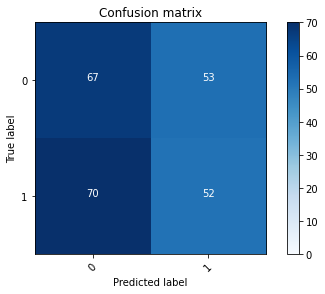

2022-08-20 15:27:46 - [Epoch Train: 97] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 15:27:46 - [Epoch Valid: 97] loss: 4.1573, auc: 0.5312, acc: 0.4917, time: 14.00 s


 97%|██████████████████████████████████████▊ | 97/100 [1:45:11<03:18, 66.31s/it]

2022-08-20 15:27:46 - EPOCH: 98
2022-08-20 15:27:49 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:27:51 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:27:53 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:27:56 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:27:58 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:28:00 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:28:02 - Train Step 70/245, train_loss: 0.0000
2022-08-20 15:28:04 - Train Step 80/245, train_loss: 0.0000
2022-08-20 15:28:07 - Train Step 90/245, train_loss: 0.0000
2022-08-20 15:28:09 - Train Step 100/245, train_loss: 0.0000
2022-08-20 15:28:11 - Train Step 110/245, train_loss: 0.0000
2022-08-20 15:28:13 - Train Step 120/245, train_loss: 0.0001
2022-08-20 15:28:15 - Train Step 130/245, train_loss: 0.0001
2022-08-20 15:28:17 - Train Step 140/245, train_loss: 0.0001
2022-08-20 15:28:20 - Train Step 150/245, train_loss: 0.0001
2022-08-20 15:28:22 - Train Step 160/245, train_loss: 0.0001
2

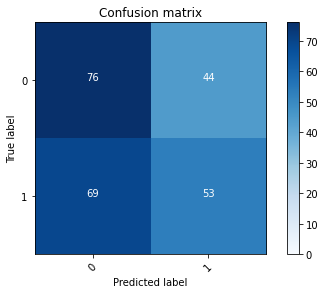

2022-08-20 15:28:54 - [Epoch Train: 98] loss: 0.0023, auc: 1.0000, acc: 0.9980, time: 54.00 s            
2022-08-20 15:28:54 - [Epoch Valid: 98] loss: 3.6488, auc: 0.5409, acc: 0.5331, time: 13.00 s


 98%|███████████████████████████████████████▏| 98/100 [1:46:19<02:13, 66.74s/it]

2022-08-20 15:28:54 - EPOCH: 99
2022-08-20 15:28:57 - Train Step 10/245, train_loss: 0.0001
2022-08-20 15:28:59 - Train Step 20/245, train_loss: 0.0001
2022-08-20 15:29:01 - Train Step 30/245, train_loss: 0.0001
2022-08-20 15:29:03 - Train Step 40/245, train_loss: 0.0001
2022-08-20 15:29:06 - Train Step 50/245, train_loss: 0.0001
2022-08-20 15:29:08 - Train Step 60/245, train_loss: 0.0001
2022-08-20 15:29:10 - Train Step 70/245, train_loss: 0.0000
2022-08-20 15:29:12 - Train Step 80/245, train_loss: 0.0020
2022-08-20 15:29:14 - Train Step 90/245, train_loss: 0.0018
2022-08-20 15:29:17 - Train Step 100/245, train_loss: 0.0016
2022-08-20 15:29:19 - Train Step 110/245, train_loss: 0.0015
2022-08-20 15:29:21 - Train Step 120/245, train_loss: 0.0014
2022-08-20 15:29:23 - Train Step 130/245, train_loss: 0.0013
2022-08-20 15:29:25 - Train Step 140/245, train_loss: 0.0012
2022-08-20 15:29:28 - Train Step 150/245, train_loss: 0.0011
2022-08-20 15:29:30 - Train Step 160/245, train_loss: 0.0010
2

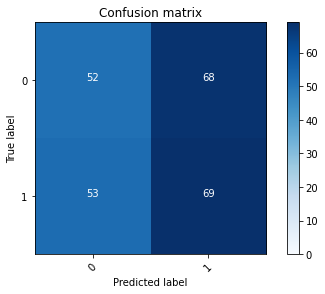

2022-08-20 15:30:02 - [Epoch Train: 99] loss: 0.0017, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 15:30:02 - [Epoch Valid: 99] loss: 3.7318, auc: 0.5436, acc: 0.5000, time: 13.00 s


 99%|███████████████████████████████████████▌| 99/100 [1:47:26<01:06, 66.98s/it]

2022-08-20 15:30:02 - EPOCH: 100
2022-08-20 15:30:04 - Train Step 10/245, train_loss: 0.0000
2022-08-20 15:30:06 - Train Step 20/245, train_loss: 0.0000
2022-08-20 15:30:09 - Train Step 30/245, train_loss: 0.0000
2022-08-20 15:30:11 - Train Step 40/245, train_loss: 0.0000
2022-08-20 15:30:13 - Train Step 50/245, train_loss: 0.0000
2022-08-20 15:30:15 - Train Step 60/245, train_loss: 0.0000
2022-08-20 15:30:17 - Train Step 70/245, train_loss: 0.0001
2022-08-20 15:30:20 - Train Step 80/245, train_loss: 0.0024
2022-08-20 15:30:22 - Train Step 90/245, train_loss: 0.0021
2022-08-20 15:30:24 - Train Step 100/245, train_loss: 0.0019
2022-08-20 15:30:26 - Train Step 110/245, train_loss: 0.0032
2022-08-20 15:30:29 - Train Step 120/245, train_loss: 0.0029
2022-08-20 15:30:31 - Train Step 130/245, train_loss: 0.0027
2022-08-20 15:30:33 - Train Step 140/245, train_loss: 0.0025
2022-08-20 15:30:35 - Train Step 150/245, train_loss: 0.0024
2022-08-20 15:30:38 - Train Step 160/245, train_loss: 0.0022


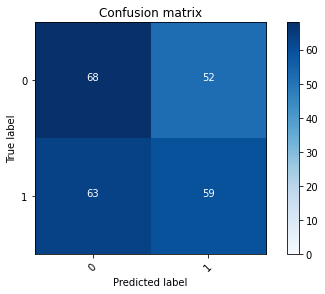

2022-08-20 15:31:11 - [Epoch Train: 100] loss: 0.0014, auc: 1.0000, acc: 0.9990, time: 55.00 s            
2022-08-20 15:31:11 - [Epoch Valid: 100] loss: 3.7181, auc: 0.5438, acc: 0.5248, time: 13.00 s


100%|███████████████████████████████████████| 100/100 [1:48:35<00:00, 65.16s/it]

-- FOLD N:1
Train origin: mn
Type: KLF
2022-08-20 15:31:11 - (M0) Train/Val datasets size: 270
2022-08-20 15:31:11 - (M1) Train/Val datasets size: 303
2022-08-20 15:31:11 - (N0) Train/Val datasets size: 170
2022-08-20 15:31:11 - (N1) Train/Val datasets size: 121
2022-08-20 15:31:11 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 15:31:11 - (MN0) Train/Val datasets size: 540
2022-08-20 15:31:11 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-20 15:31:11 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9def39070>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d84ae580>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d90eb6d0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d82163a0>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9def39be0>, 'mn_dataset_1': <utils.da

[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 249, 250, 251, 253, 256, 257, 258, 259, 260, 261, 262, 264, 265, 266, 268,

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9ca0ec700>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8c73b50>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8d2b0a0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9e4191e80>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9ca0d08e0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8ff8a30>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9ca0db7f0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9e5b7efa0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9deea35e0>]}}
2022-08-20 15:38:50 - Using CUDA...
KLF
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin'

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-20 15:38:50 - EPOCH: 1
2022-08-20 15:38:52 - Train Step 10/244, train_loss: 0.6950
2022-08-20 15:38:55 - Train Step 20/244, train_loss: 0.6945
2022-08-20 15:38:57 - Train Step 30/244, train_loss: 0.7072
2022-08-20 15:38:59 - Train Step 40/244, train_loss: 0.7079
2022-08-20 15:39:01 - Train Step 50/244, train_loss: 0.7050
2022-08-20 15:39:03 - Train Step 60/244, train_loss: 0.7043
2022-08-20 15:39:05 - Train Step 70/244, train_loss: 0.7018
2022-08-20 15:39:08 - Train Step 80/244, train_loss: 0.7011
2022-08-20 15:39:10 - Train Step 90/244, train_loss: 0.7020
2022-08-20 15:39:12 - Train Step 100/244, train_loss: 0.7012
2022-08-20 15:39:14 - Train Step 110/244, train_loss: 0.6993
2022-08-20 15:39:16 - Train Step 120/244, train_loss: 0.6987
2022-08-20 15:39:18 - Train Step 130/244, train_loss: 0.6983
2022-08-20 15:39:20 - Train Step 140/244, train_loss: 0.6989
2022-08-20 15:39:23 - Train Step 150/244, train_loss: 0.6974
2022-08-20 15:39:25 - Train Step 160/244, train_loss: 0.6964
20

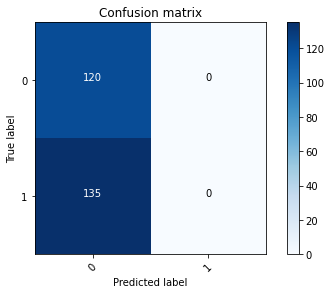

2022-08-20 15:39:55 - [Epoch Train: 1] loss: 0.6902, auc: 0.5604, acc: 0.5005, time: 51.00 s            
2022-08-20 15:39:55 - [Epoch Valid: 1] loss: 0.7120, auc: 0.5927, acc: 0.4706, time: 13.00 s
2022-08-20 15:39:55 - acc improved from 0.0000 to 0.4706. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_15-38-50/RSNAClassifierSingle3D-DW-SO-KLF-mn-e1-loss0.712-acc0.471-auc0.593.pth'


  1%|▍                                        | 1/100 [01:05<1:47:36, 65.22s/it]

2022-08-20 15:39:55 - EPOCH: 2
2022-08-20 15:39:58 - Train Step 10/244, train_loss: 0.6501
2022-08-20 15:40:00 - Train Step 20/244, train_loss: 0.6442
2022-08-20 15:40:02 - Train Step 30/244, train_loss: 0.6380
2022-08-20 15:40:04 - Train Step 40/244, train_loss: 0.6375
2022-08-20 15:40:06 - Train Step 50/244, train_loss: 0.6367
2022-08-20 15:40:08 - Train Step 60/244, train_loss: 0.6378
2022-08-20 15:40:10 - Train Step 70/244, train_loss: 0.6398
2022-08-20 15:40:11 - Train Step 80/244, train_loss: 0.6398
2022-08-20 15:40:13 - Train Step 90/244, train_loss: 0.6366
2022-08-20 15:40:15 - Train Step 100/244, train_loss: 0.6367
2022-08-20 15:40:17 - Train Step 110/244, train_loss: 0.6365
2022-08-20 15:40:19 - Train Step 120/244, train_loss: 0.6366
2022-08-20 15:40:21 - Train Step 130/244, train_loss: 0.6359
2022-08-20 15:40:23 - Train Step 140/244, train_loss: 0.6351
2022-08-20 15:40:25 - Train Step 150/244, train_loss: 0.6337
2022-08-20 15:40:27 - Train Step 160/244, train_loss: 0.6323
20

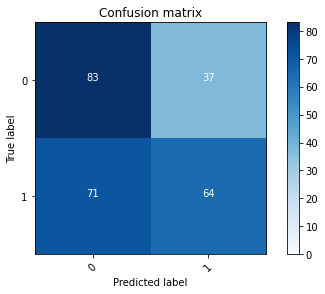

2022-08-20 15:40:58 - [Epoch Train: 2] loss: 0.6258, auc: 0.7616, acc: 0.5610, time: 48.00 s            
2022-08-20 15:40:58 - [Epoch Valid: 2] loss: 0.6859, auc: 0.6320, acc: 0.5765, time: 14.00 s
2022-08-20 15:40:58 - acc improved from 0.4706 to 0.5765. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_15-38-50/RSNAClassifierSingle3D-DW-SO-KLF-mn-e2-loss0.686-acc0.576-auc0.632.pth'


  2%|▊                                        | 2/100 [02:07<1:44:05, 63.73s/it]

2022-08-20 15:40:58 - EPOCH: 3
2022-08-20 15:41:00 - Train Step 10/244, train_loss: 0.5652
2022-08-20 15:41:03 - Train Step 20/244, train_loss: 0.5350
2022-08-20 15:41:05 - Train Step 30/244, train_loss: 0.5585
2022-08-20 15:41:07 - Train Step 40/244, train_loss: 0.5666
2022-08-20 15:41:09 - Train Step 50/244, train_loss: 0.5567
2022-08-20 15:41:11 - Train Step 60/244, train_loss: 0.5468
2022-08-20 15:41:13 - Train Step 70/244, train_loss: 0.5429
2022-08-20 15:41:15 - Train Step 80/244, train_loss: 0.5294
2022-08-20 15:41:18 - Train Step 90/244, train_loss: 0.5308
2022-08-20 15:41:20 - Train Step 100/244, train_loss: 0.5302
2022-08-20 15:41:22 - Train Step 110/244, train_loss: 0.5259
2022-08-20 15:41:25 - Train Step 120/244, train_loss: 0.5278
2022-08-20 15:41:27 - Train Step 130/244, train_loss: 0.5256
2022-08-20 15:41:29 - Train Step 140/244, train_loss: 0.5263
2022-08-20 15:41:31 - Train Step 150/244, train_loss: 0.5238
2022-08-20 15:41:33 - Train Step 160/244, train_loss: 0.5208
20

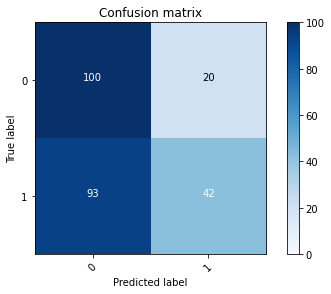

2022-08-20 15:42:06 - [Epoch Train: 3] loss: 0.5170, auc: 0.8514, acc: 0.7179, time: 53.00 s            
2022-08-20 15:42:06 - [Epoch Valid: 3] loss: 0.6878, auc: 0.6230, acc: 0.5569, time: 14.00 s


  3%|█▏                                       | 3/100 [03:16<1:46:16, 65.74s/it]

2022-08-20 15:42:06 - EPOCH: 4
2022-08-20 15:42:09 - Train Step 10/244, train_loss: 0.3814
2022-08-20 15:42:11 - Train Step 20/244, train_loss: 0.3803
2022-08-20 15:42:13 - Train Step 30/244, train_loss: 0.3734
2022-08-20 15:42:15 - Train Step 40/244, train_loss: 0.3788
2022-08-20 15:42:17 - Train Step 50/244, train_loss: 0.3578
2022-08-20 15:42:20 - Train Step 60/244, train_loss: 0.3426
2022-08-20 15:42:22 - Train Step 70/244, train_loss: 0.3492
2022-08-20 15:42:24 - Train Step 80/244, train_loss: 0.3470
2022-08-20 15:42:26 - Train Step 90/244, train_loss: 0.3558
2022-08-20 15:42:29 - Train Step 100/244, train_loss: 0.3501
2022-08-20 15:42:31 - Train Step 110/244, train_loss: 0.3539
2022-08-20 15:42:33 - Train Step 120/244, train_loss: 0.3563
2022-08-20 15:42:35 - Train Step 130/244, train_loss: 0.3608
2022-08-20 15:42:38 - Train Step 140/244, train_loss: 0.3586
2022-08-20 15:42:40 - Train Step 150/244, train_loss: 0.3565
2022-08-20 15:42:42 - Train Step 160/244, train_loss: 0.3592
20

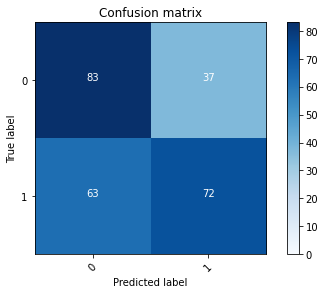

2022-08-20 15:43:13 - [Epoch Train: 4] loss: 0.3444, auc: 0.9537, acc: 0.8564, time: 53.00 s            
2022-08-20 15:43:13 - [Epoch Valid: 4] loss: 0.7991, auc: 0.6064, acc: 0.6078, time: 13.00 s
2022-08-20 15:43:13 - acc improved from 0.5765 to 0.6078. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_15-38-50/RSNAClassifierSingle3D-DW-SO-KLF-mn-e4-loss0.799-acc0.608-auc0.606.pth'


  4%|█▋                                       | 4/100 [04:23<1:46:01, 66.27s/it]

2022-08-20 15:43:13 - EPOCH: 5
2022-08-20 15:43:15 - Train Step 10/244, train_loss: 0.2182
2022-08-20 15:43:18 - Train Step 20/244, train_loss: 0.2167
2022-08-20 15:43:20 - Train Step 30/244, train_loss: 0.2106
2022-08-20 15:43:22 - Train Step 40/244, train_loss: 0.2189
2022-08-20 15:43:24 - Train Step 50/244, train_loss: 0.2185
2022-08-20 15:43:26 - Train Step 60/244, train_loss: 0.2141
2022-08-20 15:43:28 - Train Step 70/244, train_loss: 0.2076
2022-08-20 15:43:30 - Train Step 80/244, train_loss: 0.2030
2022-08-20 15:43:32 - Train Step 90/244, train_loss: 0.2063
2022-08-20 15:43:34 - Train Step 100/244, train_loss: 0.2043
2022-08-20 15:43:36 - Train Step 110/244, train_loss: 0.2029
2022-08-20 15:43:38 - Train Step 120/244, train_loss: 0.2008
2022-08-20 15:43:40 - Train Step 130/244, train_loss: 0.2037
2022-08-20 15:43:42 - Train Step 140/244, train_loss: 0.1989
2022-08-20 15:43:44 - Train Step 150/244, train_loss: 0.1973
2022-08-20 15:43:46 - Train Step 160/244, train_loss: 0.2010
20

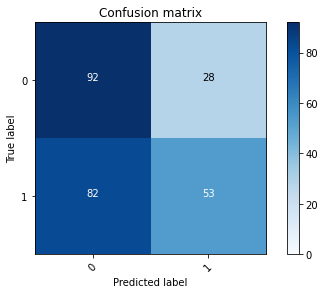

2022-08-20 15:44:18 - [Epoch Train: 5] loss: 0.1944, auc: 0.9912, acc: 0.9364, time: 50.00 s            
2022-08-20 15:44:18 - [Epoch Valid: 5] loss: 0.9970, auc: 0.5974, acc: 0.5686, time: 14.00 s


  5%|██                                       | 5/100 [05:27<1:44:07, 65.77s/it]

2022-08-20 15:44:18 - EPOCH: 6
2022-08-20 15:44:21 - Train Step 10/244, train_loss: 0.1345
2022-08-20 15:44:23 - Train Step 20/244, train_loss: 0.1311
2022-08-20 15:44:25 - Train Step 30/244, train_loss: 0.1257
2022-08-20 15:44:27 - Train Step 40/244, train_loss: 0.1111
2022-08-20 15:44:29 - Train Step 50/244, train_loss: 0.1093
2022-08-20 15:44:32 - Train Step 60/244, train_loss: 0.1042
2022-08-20 15:44:34 - Train Step 70/244, train_loss: 0.1019
2022-08-20 15:44:36 - Train Step 80/244, train_loss: 0.1062
2022-08-20 15:44:38 - Train Step 90/244, train_loss: 0.1077
2022-08-20 15:44:40 - Train Step 100/244, train_loss: 0.1110
2022-08-20 15:44:43 - Train Step 110/244, train_loss: 0.1094
2022-08-20 15:44:45 - Train Step 120/244, train_loss: 0.1083
2022-08-20 15:44:47 - Train Step 130/244, train_loss: 0.1069
2022-08-20 15:44:49 - Train Step 140/244, train_loss: 0.1042
2022-08-20 15:44:52 - Train Step 150/244, train_loss: 0.1016
2022-08-20 15:44:54 - Train Step 160/244, train_loss: 0.1059
20

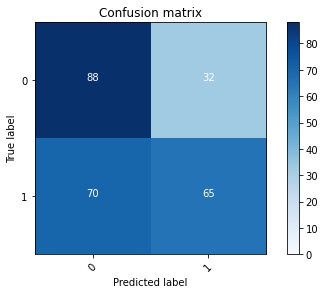

2022-08-20 15:45:27 - [Epoch Train: 6] loss: 0.1020, auc: 0.9984, acc: 0.9836, time: 54.00 s            
2022-08-20 15:45:27 - [Epoch Valid: 6] loss: 1.0567, auc: 0.6096, acc: 0.6000, time: 13.00 s


  6%|██▍                                      | 6/100 [06:36<1:44:28, 66.68s/it]

2022-08-20 15:45:27 - EPOCH: 7
2022-08-20 15:45:29 - Train Step 10/244, train_loss: 0.0657
2022-08-20 15:45:31 - Train Step 20/244, train_loss: 0.0680
2022-08-20 15:45:33 - Train Step 30/244, train_loss: 0.0733
2022-08-20 15:45:35 - Train Step 40/244, train_loss: 0.0711
2022-08-20 15:45:37 - Train Step 50/244, train_loss: 0.0698
2022-08-20 15:45:39 - Train Step 60/244, train_loss: 0.0649
2022-08-20 15:45:41 - Train Step 70/244, train_loss: 0.0626
2022-08-20 15:45:43 - Train Step 80/244, train_loss: 0.0605
2022-08-20 15:45:45 - Train Step 90/244, train_loss: 0.0597
2022-08-20 15:45:47 - Train Step 100/244, train_loss: 0.0611
2022-08-20 15:45:49 - Train Step 110/244, train_loss: 0.0585
2022-08-20 15:45:52 - Train Step 120/244, train_loss: 0.0560
2022-08-20 15:45:54 - Train Step 130/244, train_loss: 0.0552
2022-08-20 15:45:56 - Train Step 140/244, train_loss: 0.0546
2022-08-20 15:45:58 - Train Step 150/244, train_loss: 0.0529
2022-08-20 15:46:00 - Train Step 160/244, train_loss: 0.0534
20

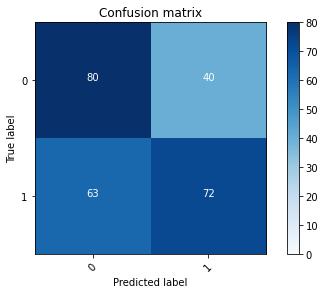

2022-08-20 15:46:31 - [Epoch Train: 7] loss: 0.0495, auc: 0.9999, acc: 0.9949, time: 50.00 s            
2022-08-20 15:46:31 - [Epoch Valid: 7] loss: 1.2154, auc: 0.6111, acc: 0.5961, time: 13.00 s


  7%|██▊                                      | 7/100 [07:40<1:41:59, 65.81s/it]

2022-08-20 15:46:31 - EPOCH: 8
2022-08-20 15:46:33 - Train Step 10/244, train_loss: 0.0438
2022-08-20 15:46:35 - Train Step 20/244, train_loss: 0.0336
2022-08-20 15:46:37 - Train Step 30/244, train_loss: 0.0301
2022-08-20 15:46:40 - Train Step 40/244, train_loss: 0.0309
2022-08-20 15:46:42 - Train Step 50/244, train_loss: 0.0330
2022-08-20 15:46:44 - Train Step 60/244, train_loss: 0.0313
2022-08-20 15:46:46 - Train Step 70/244, train_loss: 0.0299
2022-08-20 15:46:48 - Train Step 80/244, train_loss: 0.0301
2022-08-20 15:46:50 - Train Step 90/244, train_loss: 0.0294
2022-08-20 15:46:52 - Train Step 100/244, train_loss: 0.0278
2022-08-20 15:46:55 - Train Step 110/244, train_loss: 0.0272
2022-08-20 15:46:57 - Train Step 120/244, train_loss: 0.0273
2022-08-20 15:46:59 - Train Step 130/244, train_loss: 0.0269
2022-08-20 15:47:01 - Train Step 140/244, train_loss: 0.0276
2022-08-20 15:47:03 - Train Step 150/244, train_loss: 0.0267
2022-08-20 15:47:06 - Train Step 160/244, train_loss: 0.0271
20

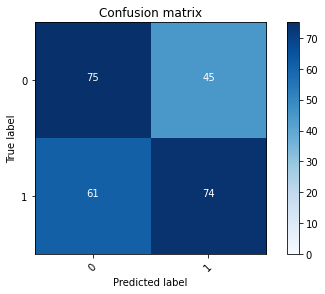

2022-08-20 15:47:38 - [Epoch Train: 8] loss: 0.0263, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 15:47:38 - [Epoch Valid: 8] loss: 1.2663, auc: 0.6167, acc: 0.5843, time: 14.00 s


  8%|███▎                                     | 8/100 [08:47<1:41:41, 66.32s/it]

2022-08-20 15:47:38 - EPOCH: 9
2022-08-20 15:47:40 - Train Step 10/244, train_loss: 0.0121
2022-08-20 15:47:43 - Train Step 20/244, train_loss: 0.0129
2022-08-20 15:47:45 - Train Step 30/244, train_loss: 0.0144
2022-08-20 15:47:47 - Train Step 40/244, train_loss: 0.0269
2022-08-20 15:47:49 - Train Step 50/244, train_loss: 0.0270
2022-08-20 15:47:51 - Train Step 60/244, train_loss: 0.0247
2022-08-20 15:47:54 - Train Step 70/244, train_loss: 0.0241
2022-08-20 15:47:56 - Train Step 80/244, train_loss: 0.0232
2022-08-20 15:47:58 - Train Step 90/244, train_loss: 0.0224
2022-08-20 15:48:00 - Train Step 100/244, train_loss: 0.0220
2022-08-20 15:48:02 - Train Step 110/244, train_loss: 0.0209
2022-08-20 15:48:04 - Train Step 120/244, train_loss: 0.0205
2022-08-20 15:48:06 - Train Step 130/244, train_loss: 0.0200
2022-08-20 15:48:09 - Train Step 140/244, train_loss: 0.0192
2022-08-20 15:48:11 - Train Step 150/244, train_loss: 0.0193
2022-08-20 15:48:13 - Train Step 160/244, train_loss: 0.0195
20

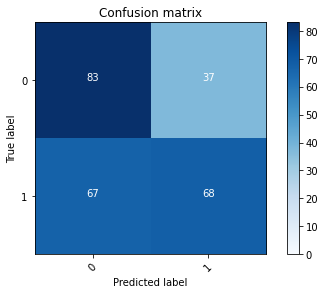

2022-08-20 15:48:45 - [Epoch Train: 9] loss: 0.0179, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 15:48:45 - [Epoch Valid: 9] loss: 1.3859, auc: 0.6131, acc: 0.5922, time: 13.00 s


  9%|███▋                                     | 9/100 [09:54<1:40:57, 66.56s/it]

2022-08-20 15:48:45 - EPOCH: 10
2022-08-20 15:48:47 - Train Step 10/244, train_loss: 0.0134
2022-08-20 15:48:49 - Train Step 20/244, train_loss: 0.0143
2022-08-20 15:48:51 - Train Step 30/244, train_loss: 0.0133
2022-08-20 15:48:53 - Train Step 40/244, train_loss: 0.0123
2022-08-20 15:48:56 - Train Step 50/244, train_loss: 0.0167
2022-08-20 15:48:58 - Train Step 60/244, train_loss: 0.0150
2022-08-20 15:49:00 - Train Step 70/244, train_loss: 0.0146
2022-08-20 15:49:02 - Train Step 80/244, train_loss: 0.0132
2022-08-20 15:49:04 - Train Step 90/244, train_loss: 0.0132
2022-08-20 15:49:06 - Train Step 100/244, train_loss: 0.0130
2022-08-20 15:49:08 - Train Step 110/244, train_loss: 0.0130
2022-08-20 15:49:10 - Train Step 120/244, train_loss: 0.0147
2022-08-20 15:49:12 - Train Step 130/244, train_loss: 0.0141
2022-08-20 15:49:14 - Train Step 140/244, train_loss: 0.0136
2022-08-20 15:49:16 - Train Step 150/244, train_loss: 0.0134
2022-08-20 15:49:18 - Train Step 160/244, train_loss: 0.0131
2

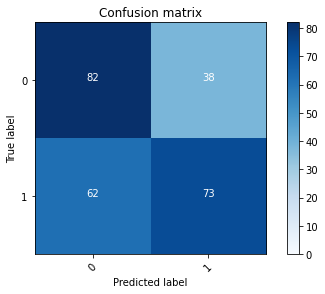

2022-08-20 15:49:49 - [Epoch Train: 10] loss: 0.0114, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 15:49:49 - [Epoch Valid: 10] loss: 1.3823, auc: 0.6104, acc: 0.6078, time: 13.00 s
2022-08-20 15:49:49 - acc improved from 0.6078 to 0.6078. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_15-38-50/RSNAClassifierSingle3D-DW-SO-KLF-mn-e10-loss1.382-acc0.608-auc0.610.pth'


 10%|████                                    | 10/100 [10:58<1:38:35, 65.73s/it]

2022-08-20 15:49:49 - EPOCH: 11
2022-08-20 15:49:51 - Train Step 10/244, train_loss: 0.0092
2022-08-20 15:49:54 - Train Step 20/244, train_loss: 0.0190
2022-08-20 15:49:56 - Train Step 30/244, train_loss: 0.0141
2022-08-20 15:49:58 - Train Step 40/244, train_loss: 0.0116
2022-08-20 15:50:00 - Train Step 50/244, train_loss: 0.0115
2022-08-20 15:50:02 - Train Step 60/244, train_loss: 0.0109
2022-08-20 15:50:05 - Train Step 70/244, train_loss: 0.0101
2022-08-20 15:50:07 - Train Step 80/244, train_loss: 0.0096
2022-08-20 15:50:09 - Train Step 90/244, train_loss: 0.0112
2022-08-20 15:50:11 - Train Step 100/244, train_loss: 0.0123
2022-08-20 15:50:13 - Train Step 110/244, train_loss: 0.0115
2022-08-20 15:50:15 - Train Step 120/244, train_loss: 0.0116
2022-08-20 15:50:18 - Train Step 130/244, train_loss: 0.0113
2022-08-20 15:50:20 - Train Step 140/244, train_loss: 0.0110
2022-08-20 15:50:22 - Train Step 150/244, train_loss: 0.0109
2022-08-20 15:50:24 - Train Step 160/244, train_loss: 0.0106
2

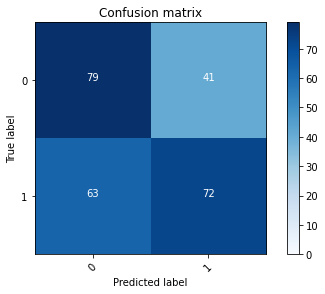

2022-08-20 15:50:57 - [Epoch Train: 11] loss: 0.0096, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 15:50:57 - [Epoch Valid: 11] loss: 1.5847, auc: 0.6113, acc: 0.5922, time: 14.00 s


 11%|████▍                                   | 11/100 [12:06<1:38:28, 66.39s/it]

2022-08-20 15:50:57 - EPOCH: 12
2022-08-20 15:50:59 - Train Step 10/244, train_loss: 0.0065
2022-08-20 15:51:02 - Train Step 20/244, train_loss: 0.0086
2022-08-20 15:51:04 - Train Step 30/244, train_loss: 0.0069
2022-08-20 15:51:06 - Train Step 40/244, train_loss: 0.0062
2022-08-20 15:51:08 - Train Step 50/244, train_loss: 0.0086
2022-08-20 15:51:10 - Train Step 60/244, train_loss: 0.0089
2022-08-20 15:51:13 - Train Step 70/244, train_loss: 0.0084
2022-08-20 15:51:15 - Train Step 80/244, train_loss: 0.0081
2022-08-20 15:51:17 - Train Step 90/244, train_loss: 0.0078
2022-08-20 15:51:19 - Train Step 100/244, train_loss: 0.0078
2022-08-20 15:51:21 - Train Step 110/244, train_loss: 0.0075
2022-08-20 15:51:24 - Train Step 120/244, train_loss: 0.0073
2022-08-20 15:51:26 - Train Step 130/244, train_loss: 0.0070
2022-08-20 15:51:28 - Train Step 140/244, train_loss: 0.0074
2022-08-20 15:51:30 - Train Step 150/244, train_loss: 0.0073
2022-08-20 15:51:32 - Train Step 160/244, train_loss: 0.0071
2

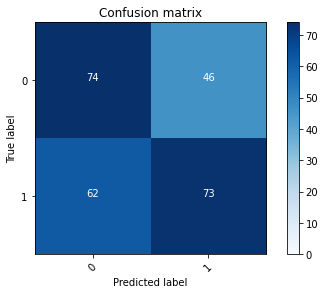

2022-08-20 15:52:05 - [Epoch Train: 12] loss: 0.0072, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 15:52:05 - [Epoch Valid: 12] loss: 1.4854, auc: 0.6124, acc: 0.5765, time: 14.00 s


 12%|████▊                                   | 12/100 [13:15<1:38:13, 66.97s/it]

2022-08-20 15:52:05 - EPOCH: 13
2022-08-20 15:52:08 - Train Step 10/244, train_loss: 0.0051
2022-08-20 15:52:10 - Train Step 20/244, train_loss: 0.0175
2022-08-20 15:52:12 - Train Step 30/244, train_loss: 0.0132
2022-08-20 15:52:14 - Train Step 40/244, train_loss: 0.0108
2022-08-20 15:52:16 - Train Step 50/244, train_loss: 0.0093
2022-08-20 15:52:18 - Train Step 60/244, train_loss: 0.0084
2022-08-20 15:52:21 - Train Step 70/244, train_loss: 0.0077
2022-08-20 15:52:23 - Train Step 80/244, train_loss: 0.0070
2022-08-20 15:52:25 - Train Step 90/244, train_loss: 0.0067
2022-08-20 15:52:27 - Train Step 100/244, train_loss: 0.0066
2022-08-20 15:52:30 - Train Step 110/244, train_loss: 0.0063
2022-08-20 15:52:32 - Train Step 120/244, train_loss: 0.0062
2022-08-20 15:52:34 - Train Step 130/244, train_loss: 0.0062
2022-08-20 15:52:36 - Train Step 140/244, train_loss: 0.0063
2022-08-20 15:52:38 - Train Step 150/244, train_loss: 0.0073
2022-08-20 15:52:41 - Train Step 160/244, train_loss: 0.0074
2

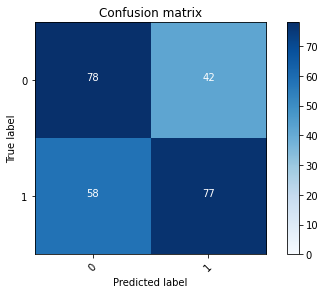

2022-08-20 15:53:14 - [Epoch Train: 13] loss: 0.0070, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 15:53:14 - [Epoch Valid: 13] loss: 1.5954, auc: 0.6138, acc: 0.6078, time: 14.00 s
2022-08-20 15:53:14 - acc improved from 0.6078 to 0.6078. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_15-38-50/RSNAClassifierSingle3D-DW-SO-KLF-mn-e13-loss1.595-acc0.608-auc0.614.pth'


 13%|█████▏                                  | 13/100 [14:23<1:37:58, 67.57s/it]

2022-08-20 15:53:14 - EPOCH: 14
2022-08-20 15:53:16 - Train Step 10/244, train_loss: 0.0049
2022-08-20 15:53:18 - Train Step 20/244, train_loss: 0.0034
2022-08-20 15:53:20 - Train Step 30/244, train_loss: 0.0036
2022-08-20 15:53:23 - Train Step 40/244, train_loss: 0.0038
2022-08-20 15:53:25 - Train Step 50/244, train_loss: 0.0039
2022-08-20 15:53:27 - Train Step 60/244, train_loss: 0.0038
2022-08-20 15:53:29 - Train Step 70/244, train_loss: 0.0039
2022-08-20 15:53:31 - Train Step 80/244, train_loss: 0.0061
2022-08-20 15:53:33 - Train Step 90/244, train_loss: 0.0063
2022-08-20 15:53:35 - Train Step 100/244, train_loss: 0.0059
2022-08-20 15:53:37 - Train Step 110/244, train_loss: 0.0057
2022-08-20 15:53:39 - Train Step 120/244, train_loss: 0.0057
2022-08-20 15:53:41 - Train Step 130/244, train_loss: 0.0058
2022-08-20 15:53:43 - Train Step 140/244, train_loss: 0.0056
2022-08-20 15:53:45 - Train Step 150/244, train_loss: 0.0054
2022-08-20 15:53:47 - Train Step 160/244, train_loss: 0.0054
2

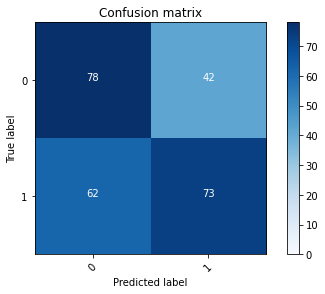

2022-08-20 15:54:18 - [Epoch Train: 14] loss: 0.0050, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 15:54:18 - [Epoch Valid: 14] loss: 1.6658, auc: 0.6140, acc: 0.5922, time: 13.00 s


 14%|█████▌                                  | 14/100 [15:28<1:35:24, 66.56s/it]

2022-08-20 15:54:18 - EPOCH: 15
2022-08-20 15:54:21 - Train Step 10/244, train_loss: 0.0035
2022-08-20 15:54:23 - Train Step 20/244, train_loss: 0.0148
2022-08-20 15:54:25 - Train Step 30/244, train_loss: 0.0106
2022-08-20 15:54:27 - Train Step 40/244, train_loss: 0.0138
2022-08-20 15:54:29 - Train Step 50/244, train_loss: 0.0117
2022-08-20 15:54:31 - Train Step 60/244, train_loss: 0.0106
2022-08-20 15:54:33 - Train Step 70/244, train_loss: 0.0098
2022-08-20 15:54:36 - Train Step 80/244, train_loss: 0.0089
2022-08-20 15:54:38 - Train Step 90/244, train_loss: 0.0080
2022-08-20 15:54:40 - Train Step 100/244, train_loss: 0.0076
2022-08-20 15:54:42 - Train Step 110/244, train_loss: 0.0072
2022-08-20 15:54:44 - Train Step 120/244, train_loss: 0.0069
2022-08-20 15:54:46 - Train Step 130/244, train_loss: 0.0067
2022-08-20 15:54:48 - Train Step 140/244, train_loss: 0.0064
2022-08-20 15:54:50 - Train Step 150/244, train_loss: 0.0062
2022-08-20 15:54:52 - Train Step 160/244, train_loss: 0.0060
2

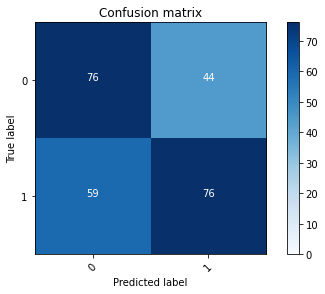

2022-08-20 15:55:25 - [Epoch Train: 15] loss: 0.0051, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 15:55:25 - [Epoch Valid: 15] loss: 1.6214, auc: 0.6134, acc: 0.5961, time: 14.00 s


 15%|██████                                  | 15/100 [16:34<1:34:17, 66.56s/it]

2022-08-20 15:55:25 - EPOCH: 16
2022-08-20 15:55:27 - Train Step 10/244, train_loss: 0.0125
2022-08-20 15:55:29 - Train Step 20/244, train_loss: 0.0073
2022-08-20 15:55:32 - Train Step 30/244, train_loss: 0.0059
2022-08-20 15:55:34 - Train Step 40/244, train_loss: 0.0052
2022-08-20 15:55:36 - Train Step 50/244, train_loss: 0.0048
2022-08-20 15:55:38 - Train Step 60/244, train_loss: 0.0043
2022-08-20 15:55:40 - Train Step 70/244, train_loss: 0.0040
2022-08-20 15:55:42 - Train Step 80/244, train_loss: 0.0041
2022-08-20 15:55:44 - Train Step 90/244, train_loss: 0.0038
2022-08-20 15:55:46 - Train Step 100/244, train_loss: 0.0038
2022-08-20 15:55:49 - Train Step 110/244, train_loss: 0.0045
2022-08-20 15:55:51 - Train Step 120/244, train_loss: 0.0043
2022-08-20 15:55:53 - Train Step 130/244, train_loss: 0.0041
2022-08-20 15:55:55 - Train Step 140/244, train_loss: 0.0057
2022-08-20 15:55:57 - Train Step 150/244, train_loss: 0.0055
2022-08-20 15:55:59 - Train Step 160/244, train_loss: 0.0054
2

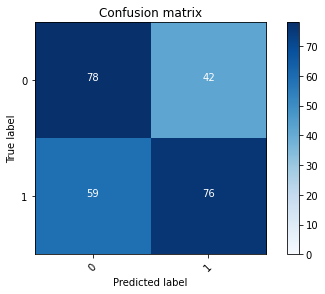

2022-08-20 15:56:32 - [Epoch Train: 16] loss: 0.0048, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 15:56:32 - [Epoch Valid: 16] loss: 1.7947, auc: 0.6172, acc: 0.6039, time: 14.00 s


 16%|██████▍                                 | 16/100 [17:41<1:33:21, 66.69s/it]

2022-08-20 15:56:32 - EPOCH: 17
2022-08-20 15:56:34 - Train Step 10/244, train_loss: 0.0018
2022-08-20 15:56:36 - Train Step 20/244, train_loss: 0.0025
2022-08-20 15:56:39 - Train Step 30/244, train_loss: 0.0025
2022-08-20 15:56:41 - Train Step 40/244, train_loss: 0.0026
2022-08-20 15:56:43 - Train Step 50/244, train_loss: 0.0029
2022-08-20 15:56:45 - Train Step 60/244, train_loss: 0.0056
2022-08-20 15:56:48 - Train Step 70/244, train_loss: 0.0052
2022-08-20 15:56:50 - Train Step 80/244, train_loss: 0.0048
2022-08-20 15:56:52 - Train Step 90/244, train_loss: 0.0045
2022-08-20 15:56:54 - Train Step 100/244, train_loss: 0.0044
2022-08-20 15:56:57 - Train Step 110/244, train_loss: 0.0042
2022-08-20 15:56:59 - Train Step 120/244, train_loss: 0.0040
2022-08-20 15:57:01 - Train Step 130/244, train_loss: 0.0060
2022-08-20 15:57:03 - Train Step 140/244, train_loss: 0.0058
2022-08-20 15:57:05 - Train Step 150/244, train_loss: 0.0055
2022-08-20 15:57:08 - Train Step 160/244, train_loss: 0.0053
2

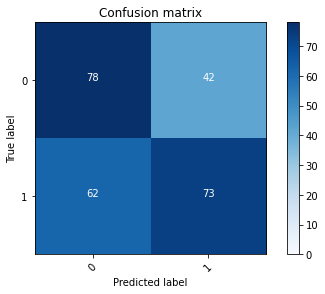

2022-08-20 15:57:41 - [Epoch Train: 17] loss: 0.0043, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 15:57:41 - [Epoch Valid: 17] loss: 1.7857, auc: 0.6169, acc: 0.5922, time: 14.00 s


 17%|██████▊                                 | 17/100 [18:50<1:33:10, 67.35s/it]

2022-08-20 15:57:41 - EPOCH: 18
2022-08-20 15:57:43 - Train Step 10/244, train_loss: 0.0022
2022-08-20 15:57:45 - Train Step 20/244, train_loss: 0.0076
2022-08-20 15:57:48 - Train Step 30/244, train_loss: 0.0058
2022-08-20 15:57:50 - Train Step 40/244, train_loss: 0.0052
2022-08-20 15:57:52 - Train Step 50/244, train_loss: 0.0047
2022-08-20 15:57:54 - Train Step 60/244, train_loss: 0.0041
2022-08-20 15:57:56 - Train Step 70/244, train_loss: 0.0038
2022-08-20 15:57:58 - Train Step 80/244, train_loss: 0.0038
2022-08-20 15:58:01 - Train Step 90/244, train_loss: 0.0036
2022-08-20 15:58:03 - Train Step 100/244, train_loss: 0.0035
2022-08-20 15:58:05 - Train Step 110/244, train_loss: 0.0035
2022-08-20 15:58:07 - Train Step 120/244, train_loss: 0.0034
2022-08-20 15:58:09 - Train Step 130/244, train_loss: 0.0035
2022-08-20 15:58:12 - Train Step 140/244, train_loss: 0.0051
2022-08-20 15:58:14 - Train Step 150/244, train_loss: 0.0048
2022-08-20 15:58:16 - Train Step 160/244, train_loss: 0.0046
2

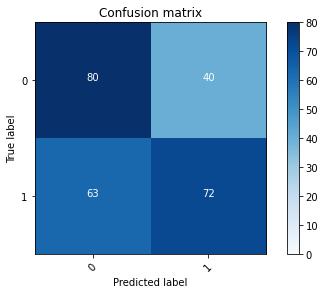

2022-08-20 15:58:48 - [Epoch Train: 18] loss: 0.0036, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 15:58:48 - [Epoch Valid: 18] loss: 1.8821, auc: 0.6125, acc: 0.5961, time: 13.00 s


 18%|███████▏                                | 18/100 [19:57<1:31:57, 67.28s/it]

2022-08-20 15:58:48 - EPOCH: 19
2022-08-20 15:58:50 - Train Step 10/244, train_loss: 0.0014
2022-08-20 15:58:52 - Train Step 20/244, train_loss: 0.0025
2022-08-20 15:58:55 - Train Step 30/244, train_loss: 0.0025
2022-08-20 15:58:57 - Train Step 40/244, train_loss: 0.0026
2022-08-20 15:58:59 - Train Step 50/244, train_loss: 0.0024
2022-08-20 15:59:01 - Train Step 60/244, train_loss: 0.0023
2022-08-20 15:59:03 - Train Step 70/244, train_loss: 0.0024
2022-08-20 15:59:06 - Train Step 80/244, train_loss: 0.0023
2022-08-20 15:59:08 - Train Step 90/244, train_loss: 0.0024
2022-08-20 15:59:10 - Train Step 100/244, train_loss: 0.0023
2022-08-20 15:59:12 - Train Step 110/244, train_loss: 0.0022
2022-08-20 15:59:14 - Train Step 120/244, train_loss: 0.0025
2022-08-20 15:59:16 - Train Step 130/244, train_loss: 0.0024
2022-08-20 15:59:19 - Train Step 140/244, train_loss: 0.0023
2022-08-20 15:59:21 - Train Step 150/244, train_loss: 0.0028
2022-08-20 15:59:23 - Train Step 160/244, train_loss: 0.0027
2

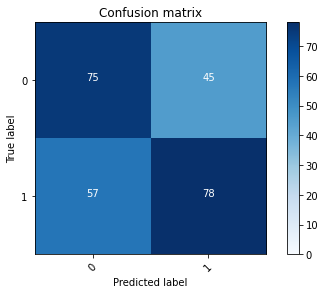

2022-08-20 15:59:55 - [Epoch Train: 19] loss: 0.0037, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 15:59:55 - [Epoch Valid: 19] loss: 1.8022, auc: 0.6178, acc: 0.6000, time: 13.00 s


 19%|███████▌                                | 19/100 [21:05<1:30:52, 67.32s/it]

2022-08-20 15:59:55 - EPOCH: 20
2022-08-20 15:59:58 - Train Step 10/244, train_loss: 0.0040
2022-08-20 16:00:00 - Train Step 20/244, train_loss: 0.0028
2022-08-20 16:00:02 - Train Step 30/244, train_loss: 0.0024
2022-08-20 16:00:04 - Train Step 40/244, train_loss: 0.0020
2022-08-20 16:00:06 - Train Step 50/244, train_loss: 0.0019
2022-08-20 16:00:08 - Train Step 60/244, train_loss: 0.0049
2022-08-20 16:00:11 - Train Step 70/244, train_loss: 0.0043
2022-08-20 16:00:13 - Train Step 80/244, train_loss: 0.0039
2022-08-20 16:00:15 - Train Step 90/244, train_loss: 0.0036
2022-08-20 16:00:17 - Train Step 100/244, train_loss: 0.0034
2022-08-20 16:00:19 - Train Step 110/244, train_loss: 0.0032
2022-08-20 16:00:22 - Train Step 120/244, train_loss: 0.0031
2022-08-20 16:00:24 - Train Step 130/244, train_loss: 0.0029
2022-08-20 16:00:26 - Train Step 140/244, train_loss: 0.0028
2022-08-20 16:00:29 - Train Step 150/244, train_loss: 0.0027
2022-08-20 16:00:31 - Train Step 160/244, train_loss: 0.0026
2

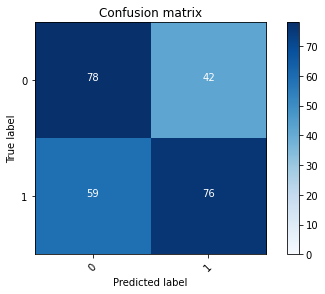

2022-08-20 16:01:03 - [Epoch Train: 20] loss: 0.0030, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 16:01:03 - [Epoch Valid: 20] loss: 1.7985, auc: 0.6140, acc: 0.6039, time: 13.00 s


 20%|████████                                | 20/100 [22:12<1:29:45, 67.32s/it]

2022-08-20 16:01:03 - EPOCH: 21
2022-08-20 16:01:05 - Train Step 10/244, train_loss: 0.0020
2022-08-20 16:01:07 - Train Step 20/244, train_loss: 0.0015
2022-08-20 16:01:09 - Train Step 30/244, train_loss: 0.0016
2022-08-20 16:01:12 - Train Step 40/244, train_loss: 0.0015
2022-08-20 16:01:14 - Train Step 50/244, train_loss: 0.0014
2022-08-20 16:01:16 - Train Step 60/244, train_loss: 0.0014
2022-08-20 16:01:18 - Train Step 70/244, train_loss: 0.0016
2022-08-20 16:01:21 - Train Step 80/244, train_loss: 0.0015
2022-08-20 16:01:23 - Train Step 90/244, train_loss: 0.0015
2022-08-20 16:01:25 - Train Step 100/244, train_loss: 0.0015
2022-08-20 16:01:27 - Train Step 110/244, train_loss: 0.0014
2022-08-20 16:01:29 - Train Step 120/244, train_loss: 0.0014
2022-08-20 16:01:32 - Train Step 130/244, train_loss: 0.0014
2022-08-20 16:01:34 - Train Step 140/244, train_loss: 0.0014
2022-08-20 16:01:36 - Train Step 150/244, train_loss: 0.0013
2022-08-20 16:01:38 - Train Step 160/244, train_loss: 0.0013
2

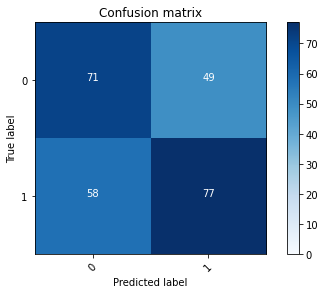

2022-08-20 16:02:11 - [Epoch Train: 21] loss: 0.0041, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 16:02:11 - [Epoch Valid: 21] loss: 1.9274, auc: 0.6118, acc: 0.5804, time: 14.00 s


 21%|████████▍                               | 21/100 [23:20<1:29:00, 67.60s/it]

2022-08-20 16:02:11 - EPOCH: 22
2022-08-20 16:02:13 - Train Step 10/244, train_loss: 0.0014
2022-08-20 16:02:15 - Train Step 20/244, train_loss: 0.0025
2022-08-20 16:02:17 - Train Step 30/244, train_loss: 0.0020
2022-08-20 16:02:19 - Train Step 40/244, train_loss: 0.0017
2022-08-20 16:02:21 - Train Step 50/244, train_loss: 0.0015
2022-08-20 16:02:24 - Train Step 60/244, train_loss: 0.0015
2022-08-20 16:02:26 - Train Step 70/244, train_loss: 0.0015
2022-08-20 16:02:28 - Train Step 80/244, train_loss: 0.0015
2022-08-20 16:02:30 - Train Step 90/244, train_loss: 0.0014
2022-08-20 16:02:32 - Train Step 100/244, train_loss: 0.0013
2022-08-20 16:02:34 - Train Step 110/244, train_loss: 0.0013
2022-08-20 16:02:36 - Train Step 120/244, train_loss: 0.0039
2022-08-20 16:02:38 - Train Step 130/244, train_loss: 0.0038
2022-08-20 16:02:40 - Train Step 140/244, train_loss: 0.0036
2022-08-20 16:02:42 - Train Step 150/244, train_loss: 0.0035
2022-08-20 16:02:44 - Train Step 160/244, train_loss: 0.0035
2

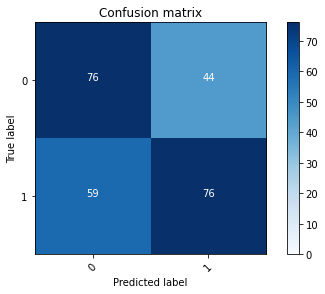

2022-08-20 16:03:16 - [Epoch Train: 22] loss: 0.0039, auc: 1.0000, acc: 0.9979, time: 51.00 s            
2022-08-20 16:03:16 - [Epoch Valid: 22] loss: 1.9284, auc: 0.6124, acc: 0.5961, time: 14.00 s


 22%|████████▊                               | 22/100 [24:26<1:27:07, 67.02s/it]

2022-08-20 16:03:16 - EPOCH: 23
2022-08-20 16:03:19 - Train Step 10/244, train_loss: 0.0010
2022-08-20 16:03:21 - Train Step 20/244, train_loss: 0.0011
2022-08-20 16:03:23 - Train Step 30/244, train_loss: 0.0012
2022-08-20 16:03:26 - Train Step 40/244, train_loss: 0.0011
2022-08-20 16:03:28 - Train Step 50/244, train_loss: 0.0010
2022-08-20 16:03:30 - Train Step 60/244, train_loss: 0.0010
2022-08-20 16:03:32 - Train Step 70/244, train_loss: 0.0010
2022-08-20 16:03:34 - Train Step 80/244, train_loss: 0.0011
2022-08-20 16:03:36 - Train Step 90/244, train_loss: 0.0010
2022-08-20 16:03:39 - Train Step 100/244, train_loss: 0.0010
2022-08-20 16:03:41 - Train Step 110/244, train_loss: 0.0010
2022-08-20 16:03:43 - Train Step 120/244, train_loss: 0.0010
2022-08-20 16:03:45 - Train Step 130/244, train_loss: 0.0010
2022-08-20 16:03:47 - Train Step 140/244, train_loss: 0.0010
2022-08-20 16:03:50 - Train Step 150/244, train_loss: 0.0010
2022-08-20 16:03:52 - Train Step 160/244, train_loss: 0.0010
2

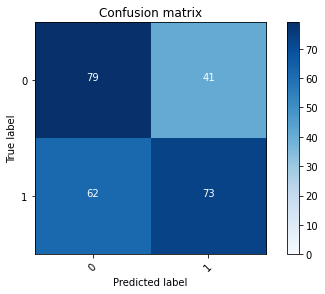

2022-08-20 16:04:24 - [Epoch Train: 23] loss: 0.0030, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:04:24 - [Epoch Valid: 23] loss: 1.9297, auc: 0.6115, acc: 0.5961, time: 13.00 s


 23%|█████████▏                              | 23/100 [25:33<1:26:05, 67.08s/it]

2022-08-20 16:04:24 - EPOCH: 24
2022-08-20 16:04:26 - Train Step 10/244, train_loss: 0.0006
2022-08-20 16:04:28 - Train Step 20/244, train_loss: 0.0007
2022-08-20 16:04:31 - Train Step 30/244, train_loss: 0.0011
2022-08-20 16:04:33 - Train Step 40/244, train_loss: 0.0094
2022-08-20 16:04:35 - Train Step 50/244, train_loss: 0.0077
2022-08-20 16:04:37 - Train Step 60/244, train_loss: 0.0066
2022-08-20 16:04:40 - Train Step 70/244, train_loss: 0.0058
2022-08-20 16:04:42 - Train Step 80/244, train_loss: 0.0051
2022-08-20 16:04:44 - Train Step 90/244, train_loss: 0.0047
2022-08-20 16:04:46 - Train Step 100/244, train_loss: 0.0042
2022-08-20 16:04:48 - Train Step 110/244, train_loss: 0.0039
2022-08-20 16:04:50 - Train Step 120/244, train_loss: 0.0042
2022-08-20 16:04:52 - Train Step 130/244, train_loss: 0.0040
2022-08-20 16:04:55 - Train Step 140/244, train_loss: 0.0037
2022-08-20 16:04:57 - Train Step 150/244, train_loss: 0.0052
2022-08-20 16:04:59 - Train Step 160/244, train_loss: 0.0050
2

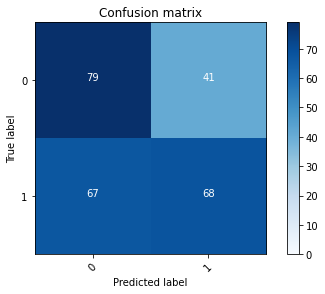

2022-08-20 16:05:31 - [Epoch Train: 24] loss: 0.0037, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:05:31 - [Epoch Valid: 24] loss: 2.1921, auc: 0.6059, acc: 0.5765, time: 14.00 s


 24%|█████████▌                              | 24/100 [26:41<1:25:14, 67.30s/it]

2022-08-20 16:05:31 - EPOCH: 25
2022-08-20 16:05:34 - Train Step 10/244, train_loss: 0.0011
2022-08-20 16:05:36 - Train Step 20/244, train_loss: 0.0013
2022-08-20 16:05:38 - Train Step 30/244, train_loss: 0.0011
2022-08-20 16:05:41 - Train Step 40/244, train_loss: 0.0012
2022-08-20 16:05:43 - Train Step 50/244, train_loss: 0.0010
2022-08-20 16:05:45 - Train Step 60/244, train_loss: 0.0010
2022-08-20 16:05:47 - Train Step 70/244, train_loss: 0.0009
2022-08-20 16:05:49 - Train Step 80/244, train_loss: 0.0009
2022-08-20 16:05:52 - Train Step 90/244, train_loss: 0.0009
2022-08-20 16:05:54 - Train Step 100/244, train_loss: 0.0008
2022-08-20 16:05:56 - Train Step 110/244, train_loss: 0.0008
2022-08-20 16:05:58 - Train Step 120/244, train_loss: 0.0008
2022-08-20 16:06:01 - Train Step 130/244, train_loss: 0.0008
2022-08-20 16:06:03 - Train Step 140/244, train_loss: 0.0008
2022-08-20 16:06:05 - Train Step 150/244, train_loss: 0.0008
2022-08-20 16:06:07 - Train Step 160/244, train_loss: 0.0008
2

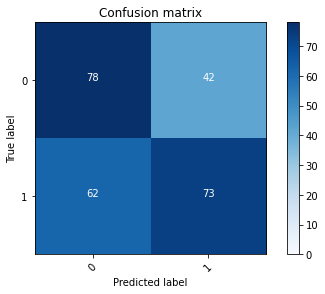

2022-08-20 16:06:40 - [Epoch Train: 25] loss: 0.0025, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 16:06:40 - [Epoch Valid: 25] loss: 2.1083, auc: 0.6075, acc: 0.5922, time: 14.00 s


 25%|██████████                              | 25/100 [27:50<1:24:45, 67.80s/it]

2022-08-20 16:06:40 - EPOCH: 26
2022-08-20 16:06:43 - Train Step 10/244, train_loss: 0.0004
2022-08-20 16:06:45 - Train Step 20/244, train_loss: 0.0006
2022-08-20 16:06:47 - Train Step 30/244, train_loss: 0.0005
2022-08-20 16:06:49 - Train Step 40/244, train_loss: 0.0006
2022-08-20 16:06:52 - Train Step 50/244, train_loss: 0.0052
2022-08-20 16:06:54 - Train Step 60/244, train_loss: 0.0045
2022-08-20 16:06:56 - Train Step 70/244, train_loss: 0.0041
2022-08-20 16:06:58 - Train Step 80/244, train_loss: 0.0038
2022-08-20 16:07:00 - Train Step 90/244, train_loss: 0.0034
2022-08-20 16:07:02 - Train Step 100/244, train_loss: 0.0032
2022-08-20 16:07:04 - Train Step 110/244, train_loss: 0.0029
2022-08-20 16:07:06 - Train Step 120/244, train_loss: 0.0055
2022-08-20 16:07:08 - Train Step 130/244, train_loss: 0.0052
2022-08-20 16:07:11 - Train Step 140/244, train_loss: 0.0048
2022-08-20 16:07:13 - Train Step 150/244, train_loss: 0.0047
2022-08-20 16:07:15 - Train Step 160/244, train_loss: 0.0044
2

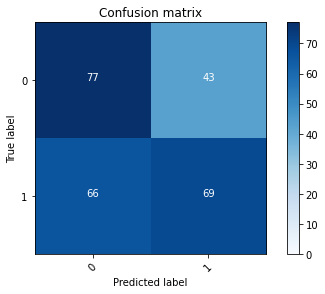

2022-08-20 16:07:48 - [Epoch Train: 26] loss: 0.0032, auc: 1.0000, acc: 0.9979, time: 52.00 s            
2022-08-20 16:07:48 - [Epoch Valid: 26] loss: 2.0369, auc: 0.6065, acc: 0.5725, time: 14.00 s


 26%|██████████▍                             | 26/100 [28:57<1:23:30, 67.72s/it]

2022-08-20 16:07:48 - EPOCH: 27
2022-08-20 16:07:50 - Train Step 10/244, train_loss: 0.0004
2022-08-20 16:07:53 - Train Step 20/244, train_loss: 0.0004
2022-08-20 16:07:55 - Train Step 30/244, train_loss: 0.0009
2022-08-20 16:07:57 - Train Step 40/244, train_loss: 0.0008
2022-08-20 16:07:59 - Train Step 50/244, train_loss: 0.0007
2022-08-20 16:08:02 - Train Step 60/244, train_loss: 0.0007
2022-08-20 16:08:04 - Train Step 70/244, train_loss: 0.0006
2022-08-20 16:08:06 - Train Step 80/244, train_loss: 0.0006
2022-08-20 16:08:08 - Train Step 90/244, train_loss: 0.0006
2022-08-20 16:08:10 - Train Step 100/244, train_loss: 0.0006
2022-08-20 16:08:12 - Train Step 110/244, train_loss: 0.0006
2022-08-20 16:08:14 - Train Step 120/244, train_loss: 0.0007
2022-08-20 16:08:17 - Train Step 130/244, train_loss: 0.0007
2022-08-20 16:08:19 - Train Step 140/244, train_loss: 0.0007
2022-08-20 16:08:21 - Train Step 150/244, train_loss: 0.0021
2022-08-20 16:08:23 - Train Step 160/244, train_loss: 0.0035
2

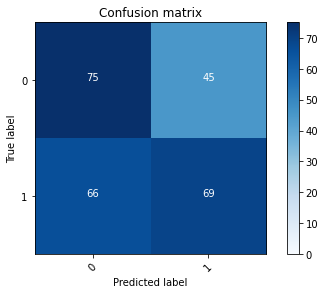

2022-08-20 16:08:55 - [Epoch Train: 27] loss: 0.0031, auc: 1.0000, acc: 0.9979, time: 52.00 s            
2022-08-20 16:08:55 - [Epoch Valid: 27] loss: 2.2878, auc: 0.6143, acc: 0.5647, time: 14.00 s


 27%|██████████▊                             | 27/100 [30:04<1:22:01, 67.42s/it]

2022-08-20 16:08:55 - EPOCH: 28
2022-08-20 16:08:57 - Train Step 10/244, train_loss: 0.0005
2022-08-20 16:08:59 - Train Step 20/244, train_loss: 0.0006
2022-08-20 16:09:02 - Train Step 30/244, train_loss: 0.0007
2022-08-20 16:09:04 - Train Step 40/244, train_loss: 0.0008
2022-08-20 16:09:06 - Train Step 50/244, train_loss: 0.0075
2022-08-20 16:09:08 - Train Step 60/244, train_loss: 0.0062
2022-08-20 16:09:10 - Train Step 70/244, train_loss: 0.0054
2022-08-20 16:09:12 - Train Step 80/244, train_loss: 0.0100
2022-08-20 16:09:15 - Train Step 90/244, train_loss: 0.0089
2022-08-20 16:09:17 - Train Step 100/244, train_loss: 0.0081
2022-08-20 16:09:19 - Train Step 110/244, train_loss: 0.0074
2022-08-20 16:09:21 - Train Step 120/244, train_loss: 0.0069
2022-08-20 16:09:23 - Train Step 130/244, train_loss: 0.0065
2022-08-20 16:09:25 - Train Step 140/244, train_loss: 0.0060
2022-08-20 16:09:27 - Train Step 150/244, train_loss: 0.0057
2022-08-20 16:09:30 - Train Step 160/244, train_loss: 0.0054
2

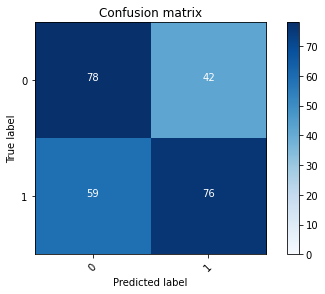

2022-08-20 16:10:01 - [Epoch Train: 28] loss: 0.0038, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:10:01 - [Epoch Valid: 28] loss: 2.1509, auc: 0.6183, acc: 0.6039, time: 13.00 s


 28%|███████████▏                            | 28/100 [31:10<1:20:31, 67.10s/it]

2022-08-20 16:10:01 - EPOCH: 29
2022-08-20 16:10:03 - Train Step 10/244, train_loss: 0.0006
2022-08-20 16:10:06 - Train Step 20/244, train_loss: 0.0006
2022-08-20 16:10:08 - Train Step 30/244, train_loss: 0.0006
2022-08-20 16:10:10 - Train Step 40/244, train_loss: 0.0005
2022-08-20 16:10:12 - Train Step 50/244, train_loss: 0.0006
2022-08-20 16:10:15 - Train Step 60/244, train_loss: 0.0005
2022-08-20 16:10:17 - Train Step 70/244, train_loss: 0.0005
2022-08-20 16:10:19 - Train Step 80/244, train_loss: 0.0005
2022-08-20 16:10:21 - Train Step 90/244, train_loss: 0.0026
2022-08-20 16:10:23 - Train Step 100/244, train_loss: 0.0061
2022-08-20 16:10:26 - Train Step 110/244, train_loss: 0.0056
2022-08-20 16:10:28 - Train Step 120/244, train_loss: 0.0052
2022-08-20 16:10:30 - Train Step 130/244, train_loss: 0.0049
2022-08-20 16:10:32 - Train Step 140/244, train_loss: 0.0045
2022-08-20 16:10:34 - Train Step 150/244, train_loss: 0.0043
2022-08-20 16:10:36 - Train Step 160/244, train_loss: 0.0041
2

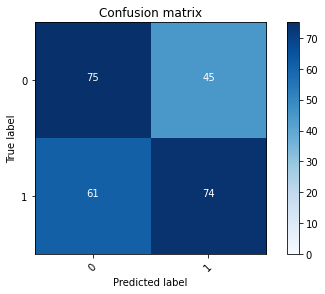

2022-08-20 16:11:09 - [Epoch Train: 29] loss: 0.0030, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:11:09 - [Epoch Valid: 29] loss: 2.2698, auc: 0.6117, acc: 0.5843, time: 13.00 s


 29%|███████████▌                            | 29/100 [32:18<1:19:34, 67.24s/it]

2022-08-20 16:11:09 - EPOCH: 30
2022-08-20 16:11:11 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:11:13 - Train Step 20/244, train_loss: 0.0002
2022-08-20 16:11:15 - Train Step 30/244, train_loss: 0.0003
2022-08-20 16:11:18 - Train Step 40/244, train_loss: 0.0003
2022-08-20 16:11:20 - Train Step 50/244, train_loss: 0.0003
2022-08-20 16:11:22 - Train Step 60/244, train_loss: 0.0003
2022-08-20 16:11:24 - Train Step 70/244, train_loss: 0.0003
2022-08-20 16:11:26 - Train Step 80/244, train_loss: 0.0003
2022-08-20 16:11:29 - Train Step 90/244, train_loss: 0.0003
2022-08-20 16:11:31 - Train Step 100/244, train_loss: 0.0003
2022-08-20 16:11:33 - Train Step 110/244, train_loss: 0.0003
2022-08-20 16:11:35 - Train Step 120/244, train_loss: 0.0004
2022-08-20 16:11:37 - Train Step 130/244, train_loss: 0.0004
2022-08-20 16:11:40 - Train Step 140/244, train_loss: 0.0004
2022-08-20 16:11:42 - Train Step 150/244, train_loss: 0.0004
2022-08-20 16:11:44 - Train Step 160/244, train_loss: 0.0021
2

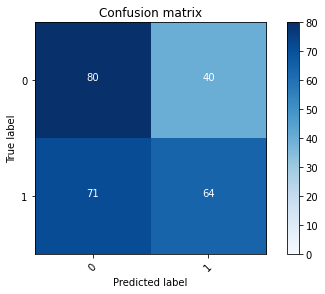

2022-08-20 16:12:17 - [Epoch Train: 30] loss: 0.0026, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 16:12:17 - [Epoch Valid: 30] loss: 2.3334, auc: 0.6038, acc: 0.5647, time: 14.00 s


 30%|████████████                            | 30/100 [33:26<1:18:45, 67.50s/it]

2022-08-20 16:12:17 - EPOCH: 31
2022-08-20 16:12:19 - Train Step 10/244, train_loss: 0.0002
2022-08-20 16:12:21 - Train Step 20/244, train_loss: 0.0007
2022-08-20 16:12:23 - Train Step 30/244, train_loss: 0.0006
2022-08-20 16:12:26 - Train Step 40/244, train_loss: 0.0006
2022-08-20 16:12:28 - Train Step 50/244, train_loss: 0.0006
2022-08-20 16:12:30 - Train Step 60/244, train_loss: 0.0006
2022-08-20 16:12:32 - Train Step 70/244, train_loss: 0.0005
2022-08-20 16:12:34 - Train Step 80/244, train_loss: 0.0005
2022-08-20 16:12:36 - Train Step 90/244, train_loss: 0.0015
2022-08-20 16:12:38 - Train Step 100/244, train_loss: 0.0013
2022-08-20 16:12:41 - Train Step 110/244, train_loss: 0.0013
2022-08-20 16:12:43 - Train Step 120/244, train_loss: 0.0012
2022-08-20 16:12:45 - Train Step 130/244, train_loss: 0.0011
2022-08-20 16:12:47 - Train Step 140/244, train_loss: 0.0011
2022-08-20 16:12:49 - Train Step 150/244, train_loss: 0.0010
2022-08-20 16:12:51 - Train Step 160/244, train_loss: 0.0010
2

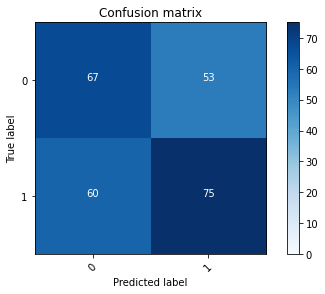

2022-08-20 16:13:24 - [Epoch Train: 31] loss: 0.0032, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 16:13:24 - [Epoch Valid: 31] loss: 2.2251, auc: 0.6057, acc: 0.5569, time: 14.00 s


 31%|████████████▍                           | 31/100 [34:33<1:17:31, 67.41s/it]

2022-08-20 16:13:24 - EPOCH: 32
2022-08-20 16:13:26 - Train Step 10/244, train_loss: 0.0008
2022-08-20 16:13:28 - Train Step 20/244, train_loss: 0.0009
2022-08-20 16:13:30 - Train Step 30/244, train_loss: 0.0008
2022-08-20 16:13:32 - Train Step 40/244, train_loss: 0.0007
2022-08-20 16:13:34 - Train Step 50/244, train_loss: 0.0006
2022-08-20 16:13:36 - Train Step 60/244, train_loss: 0.0006
2022-08-20 16:13:38 - Train Step 70/244, train_loss: 0.0006
2022-08-20 16:13:40 - Train Step 80/244, train_loss: 0.0008
2022-08-20 16:13:42 - Train Step 90/244, train_loss: 0.0009
2022-08-20 16:13:44 - Train Step 100/244, train_loss: 0.0009
2022-08-20 16:13:46 - Train Step 110/244, train_loss: 0.0009
2022-08-20 16:13:48 - Train Step 120/244, train_loss: 0.0008
2022-08-20 16:13:50 - Train Step 130/244, train_loss: 0.0008
2022-08-20 16:13:52 - Train Step 140/244, train_loss: 0.0023
2022-08-20 16:13:54 - Train Step 150/244, train_loss: 0.0022
2022-08-20 16:13:57 - Train Step 160/244, train_loss: 0.0022
2

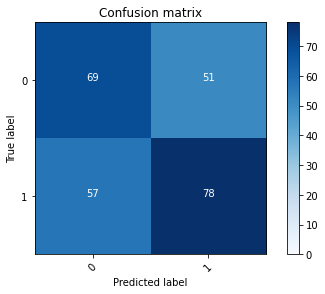

2022-08-20 16:14:28 - [Epoch Train: 32] loss: 0.0031, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 16:14:28 - [Epoch Valid: 32] loss: 2.3166, auc: 0.6105, acc: 0.5765, time: 13.00 s


 32%|████████████▊                           | 32/100 [35:38<1:15:20, 66.48s/it]

2022-08-20 16:14:28 - EPOCH: 33
2022-08-20 16:14:31 - Train Step 10/244, train_loss: 0.0005
2022-08-20 16:14:33 - Train Step 20/244, train_loss: 0.0038
2022-08-20 16:14:35 - Train Step 30/244, train_loss: 0.0029
2022-08-20 16:14:37 - Train Step 40/244, train_loss: 0.0024
2022-08-20 16:14:39 - Train Step 50/244, train_loss: 0.0021
2022-08-20 16:14:42 - Train Step 60/244, train_loss: 0.0018
2022-08-20 16:14:44 - Train Step 70/244, train_loss: 0.0018
2022-08-20 16:14:46 - Train Step 80/244, train_loss: 0.0016
2022-08-20 16:14:48 - Train Step 90/244, train_loss: 0.0015
2022-08-20 16:14:50 - Train Step 100/244, train_loss: 0.0015
2022-08-20 16:14:53 - Train Step 110/244, train_loss: 0.0014
2022-08-20 16:14:55 - Train Step 120/244, train_loss: 0.0013
2022-08-20 16:14:57 - Train Step 130/244, train_loss: 0.0012
2022-08-20 16:15:00 - Train Step 140/244, train_loss: 0.0012
2022-08-20 16:15:02 - Train Step 150/244, train_loss: 0.0011
2022-08-20 16:15:05 - Train Step 160/244, train_loss: 0.0011
2

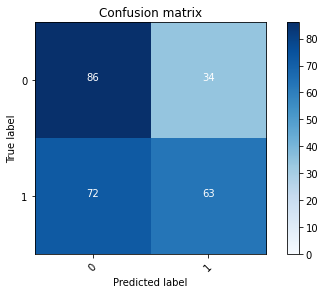

2022-08-20 16:15:37 - [Epoch Train: 33] loss: 0.0020, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 16:15:37 - [Epoch Valid: 33] loss: 2.5435, auc: 0.6053, acc: 0.5843, time: 13.00 s


 33%|█████████████▏                          | 33/100 [36:46<1:14:49, 67.01s/it]

2022-08-20 16:15:37 - EPOCH: 34
2022-08-20 16:15:39 - Train Step 10/244, train_loss: 0.0007
2022-08-20 16:15:41 - Train Step 20/244, train_loss: 0.0005
2022-08-20 16:15:43 - Train Step 30/244, train_loss: 0.0004
2022-08-20 16:15:45 - Train Step 40/244, train_loss: 0.0004
2022-08-20 16:15:47 - Train Step 50/244, train_loss: 0.0006
2022-08-20 16:15:49 - Train Step 60/244, train_loss: 0.0005
2022-08-20 16:15:52 - Train Step 70/244, train_loss: 0.0006
2022-08-20 16:15:54 - Train Step 80/244, train_loss: 0.0005
2022-08-20 16:15:56 - Train Step 90/244, train_loss: 0.0005
2022-08-20 16:15:58 - Train Step 100/244, train_loss: 0.0005
2022-08-20 16:16:00 - Train Step 110/244, train_loss: 0.0004
2022-08-20 16:16:02 - Train Step 120/244, train_loss: 0.0004
2022-08-20 16:16:04 - Train Step 130/244, train_loss: 0.0004
2022-08-20 16:16:06 - Train Step 140/244, train_loss: 0.0004
2022-08-20 16:16:09 - Train Step 150/244, train_loss: 0.0004
2022-08-20 16:16:11 - Train Step 160/244, train_loss: 0.0004
2

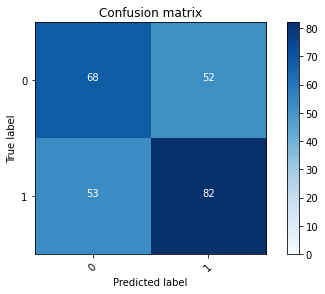

2022-08-20 16:16:42 - [Epoch Train: 34] loss: 0.0029, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 16:16:42 - [Epoch Valid: 34] loss: 2.4793, auc: 0.6115, acc: 0.5882, time: 14.00 s


 34%|█████████████▌                          | 34/100 [37:52<1:13:22, 66.70s/it]

2022-08-20 16:16:42 - EPOCH: 35
2022-08-20 16:16:45 - Train Step 10/244, train_loss: 0.0004
2022-08-20 16:16:47 - Train Step 20/244, train_loss: 0.0005
2022-08-20 16:16:49 - Train Step 30/244, train_loss: 0.0005
2022-08-20 16:16:51 - Train Step 40/244, train_loss: 0.0004
2022-08-20 16:16:53 - Train Step 50/244, train_loss: 0.0004
2022-08-20 16:16:55 - Train Step 60/244, train_loss: 0.0004
2022-08-20 16:16:57 - Train Step 70/244, train_loss: 0.0004
2022-08-20 16:16:59 - Train Step 80/244, train_loss: 0.0004
2022-08-20 16:17:01 - Train Step 90/244, train_loss: 0.0004
2022-08-20 16:17:03 - Train Step 100/244, train_loss: 0.0006
2022-08-20 16:17:05 - Train Step 110/244, train_loss: 0.0006
2022-08-20 16:17:07 - Train Step 120/244, train_loss: 0.0005
2022-08-20 16:17:09 - Train Step 130/244, train_loss: 0.0005
2022-08-20 16:17:11 - Train Step 140/244, train_loss: 0.0005
2022-08-20 16:17:13 - Train Step 150/244, train_loss: 0.0016
2022-08-20 16:17:15 - Train Step 160/244, train_loss: 0.0015
2

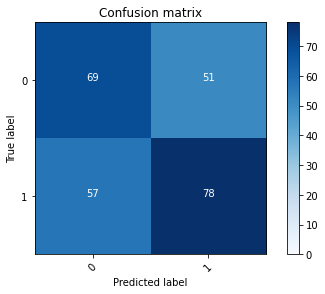

2022-08-20 16:17:47 - [Epoch Train: 35] loss: 0.0025, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 16:17:47 - [Epoch Valid: 35] loss: 2.3071, auc: 0.6123, acc: 0.5765, time: 14.00 s


 35%|██████████████                          | 35/100 [38:56<1:11:28, 65.98s/it]

2022-08-20 16:17:47 - EPOCH: 36
2022-08-20 16:17:49 - Train Step 10/244, train_loss: 0.0012
2022-08-20 16:17:51 - Train Step 20/244, train_loss: 0.0018
2022-08-20 16:17:54 - Train Step 30/244, train_loss: 0.0013
2022-08-20 16:17:56 - Train Step 40/244, train_loss: 0.0010
2022-08-20 16:17:58 - Train Step 50/244, train_loss: 0.0009
2022-08-20 16:18:00 - Train Step 60/244, train_loss: 0.0008
2022-08-20 16:18:02 - Train Step 70/244, train_loss: 0.0007
2022-08-20 16:18:05 - Train Step 80/244, train_loss: 0.0007
2022-08-20 16:18:07 - Train Step 90/244, train_loss: 0.0006
2022-08-20 16:18:09 - Train Step 100/244, train_loss: 0.0024
2022-08-20 16:18:12 - Train Step 110/244, train_loss: 0.0023
2022-08-20 16:18:14 - Train Step 120/244, train_loss: 0.0021
2022-08-20 16:18:16 - Train Step 130/244, train_loss: 0.0020
2022-08-20 16:18:18 - Train Step 140/244, train_loss: 0.0019
2022-08-20 16:18:20 - Train Step 150/244, train_loss: 0.0018
2022-08-20 16:18:22 - Train Step 160/244, train_loss: 0.0017
2

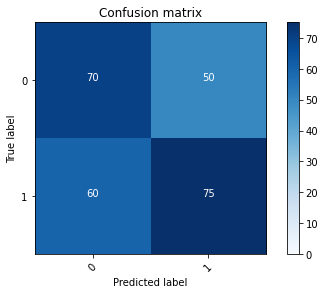

2022-08-20 16:18:54 - [Epoch Train: 36] loss: 0.0021, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 16:18:54 - [Epoch Valid: 36] loss: 2.4536, auc: 0.6143, acc: 0.5686, time: 14.00 s


 36%|██████████████▍                         | 36/100 [40:03<1:10:47, 66.36s/it]

2022-08-20 16:18:54 - EPOCH: 37
2022-08-20 16:18:57 - Train Step 10/244, train_loss: 0.0002
2022-08-20 16:18:59 - Train Step 20/244, train_loss: 0.0006
2022-08-20 16:19:02 - Train Step 30/244, train_loss: 0.0005
2022-08-20 16:19:04 - Train Step 40/244, train_loss: 0.0004
2022-08-20 16:19:07 - Train Step 50/244, train_loss: 0.0004
2022-08-20 16:19:09 - Train Step 60/244, train_loss: 0.0030
2022-08-20 16:19:11 - Train Step 70/244, train_loss: 0.0026
2022-08-20 16:19:14 - Train Step 80/244, train_loss: 0.0023
2022-08-20 16:19:16 - Train Step 90/244, train_loss: 0.0021
2022-08-20 16:19:19 - Train Step 100/244, train_loss: 0.0061
2022-08-20 16:19:21 - Train Step 110/244, train_loss: 0.0056
2022-08-20 16:19:24 - Train Step 120/244, train_loss: 0.0052
2022-08-20 16:19:26 - Train Step 130/244, train_loss: 0.0048
2022-08-20 16:19:28 - Train Step 140/244, train_loss: 0.0045
2022-08-20 16:19:30 - Train Step 150/244, train_loss: 0.0042
2022-08-20 16:19:33 - Train Step 160/244, train_loss: 0.0040
2

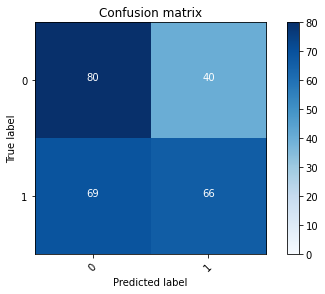

2022-08-20 16:20:06 - [Epoch Train: 37] loss: 0.0027, auc: 1.0000, acc: 0.9979, time: 57.00 s            
2022-08-20 16:20:06 - [Epoch Valid: 37] loss: 2.3174, auc: 0.6063, acc: 0.5725, time: 14.00 s


 37%|██████████████▊                         | 37/100 [41:15<1:11:20, 67.94s/it]

2022-08-20 16:20:06 - EPOCH: 38
2022-08-20 16:20:08 - Train Step 10/244, train_loss: 0.0125
2022-08-20 16:20:10 - Train Step 20/244, train_loss: 0.0064
2022-08-20 16:20:13 - Train Step 30/244, train_loss: 0.0043
2022-08-20 16:20:15 - Train Step 40/244, train_loss: 0.0034
2022-08-20 16:20:17 - Train Step 50/244, train_loss: 0.0028
2022-08-20 16:20:19 - Train Step 60/244, train_loss: 0.0024
2022-08-20 16:20:21 - Train Step 70/244, train_loss: 0.0021
2022-08-20 16:20:24 - Train Step 80/244, train_loss: 0.0019
2022-08-20 16:20:26 - Train Step 90/244, train_loss: 0.0017
2022-08-20 16:20:29 - Train Step 100/244, train_loss: 0.0068
2022-08-20 16:20:31 - Train Step 110/244, train_loss: 0.0062
2022-08-20 16:20:33 - Train Step 120/244, train_loss: 0.0057
2022-08-20 16:20:36 - Train Step 130/244, train_loss: 0.0057
2022-08-20 16:20:38 - Train Step 140/244, train_loss: 0.0053
2022-08-20 16:20:40 - Train Step 150/244, train_loss: 0.0050
2022-08-20 16:20:43 - Train Step 160/244, train_loss: 0.0047
2

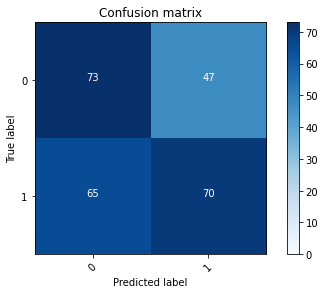

2022-08-20 16:21:16 - [Epoch Train: 38] loss: 0.0032, auc: 1.0000, acc: 0.9990, time: 55.00 s            
2022-08-20 16:21:16 - [Epoch Valid: 38] loss: 2.6136, auc: 0.6051, acc: 0.5608, time: 14.00 s


 38%|███████████████▏                        | 38/100 [42:25<1:10:49, 68.54s/it]

2022-08-20 16:21:16 - EPOCH: 39
2022-08-20 16:21:18 - Train Step 10/244, train_loss: 0.0008
2022-08-20 16:21:20 - Train Step 20/244, train_loss: 0.0006
2022-08-20 16:21:22 - Train Step 30/244, train_loss: 0.0005
2022-08-20 16:21:24 - Train Step 40/244, train_loss: 0.0004
2022-08-20 16:21:26 - Train Step 50/244, train_loss: 0.0004
2022-08-20 16:21:28 - Train Step 60/244, train_loss: 0.0004
2022-08-20 16:21:30 - Train Step 70/244, train_loss: 0.0004
2022-08-20 16:21:32 - Train Step 80/244, train_loss: 0.0003
2022-08-20 16:21:35 - Train Step 90/244, train_loss: 0.0003
2022-08-20 16:21:37 - Train Step 100/244, train_loss: 0.0003
2022-08-20 16:21:39 - Train Step 110/244, train_loss: 0.0003
2022-08-20 16:21:41 - Train Step 120/244, train_loss: 0.0017
2022-08-20 16:21:43 - Train Step 130/244, train_loss: 0.0016
2022-08-20 16:21:45 - Train Step 140/244, train_loss: 0.0050
2022-08-20 16:21:47 - Train Step 150/244, train_loss: 0.0047
2022-08-20 16:21:49 - Train Step 160/244, train_loss: 0.0044
2

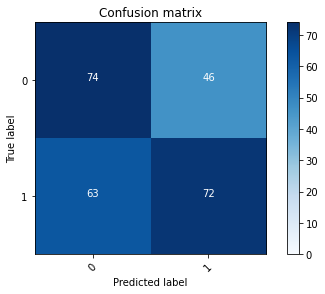

2022-08-20 16:22:21 - [Epoch Train: 39] loss: 0.0030, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 16:22:21 - [Epoch Valid: 39] loss: 2.5117, auc: 0.6058, acc: 0.5725, time: 14.00 s


 39%|███████████████▌                        | 39/100 [43:30<1:08:41, 67.57s/it]

2022-08-20 16:22:21 - EPOCH: 40
2022-08-20 16:22:23 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:22:26 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:22:28 - Train Step 30/244, train_loss: 0.0004
2022-08-20 16:22:30 - Train Step 40/244, train_loss: 0.0003
2022-08-20 16:22:32 - Train Step 50/244, train_loss: 0.0003
2022-08-20 16:22:34 - Train Step 60/244, train_loss: 0.0003
2022-08-20 16:22:37 - Train Step 70/244, train_loss: 0.0003
2022-08-20 16:22:39 - Train Step 80/244, train_loss: 0.0003
2022-08-20 16:22:41 - Train Step 90/244, train_loss: 0.0017
2022-08-20 16:22:43 - Train Step 100/244, train_loss: 0.0015
2022-08-20 16:22:45 - Train Step 110/244, train_loss: 0.0015
2022-08-20 16:22:47 - Train Step 120/244, train_loss: 0.0014
2022-08-20 16:22:50 - Train Step 130/244, train_loss: 0.0013
2022-08-20 16:22:52 - Train Step 140/244, train_loss: 0.0012
2022-08-20 16:22:54 - Train Step 150/244, train_loss: 0.0012
2022-08-20 16:22:56 - Train Step 160/244, train_loss: 0.0011
2

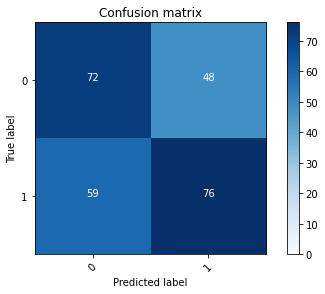

2022-08-20 16:23:29 - [Epoch Train: 40] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 16:23:29 - [Epoch Valid: 40] loss: 2.4955, auc: 0.6056, acc: 0.5804, time: 14.00 s


 40%|████████████████                        | 40/100 [44:39<1:07:49, 67.82s/it]

2022-08-20 16:23:29 - EPOCH: 41
2022-08-20 16:23:32 - Train Step 10/244, train_loss: 0.0003
2022-08-20 16:23:34 - Train Step 20/244, train_loss: 0.0002
2022-08-20 16:23:36 - Train Step 30/244, train_loss: 0.0002
2022-08-20 16:23:38 - Train Step 40/244, train_loss: 0.0003
2022-08-20 16:23:41 - Train Step 50/244, train_loss: 0.0003
2022-08-20 16:23:43 - Train Step 60/244, train_loss: 0.0003
2022-08-20 16:23:45 - Train Step 70/244, train_loss: 0.0002
2022-08-20 16:23:47 - Train Step 80/244, train_loss: 0.0036
2022-08-20 16:23:49 - Train Step 90/244, train_loss: 0.0033
2022-08-20 16:23:51 - Train Step 100/244, train_loss: 0.0030
2022-08-20 16:23:53 - Train Step 110/244, train_loss: 0.0027
2022-08-20 16:23:56 - Train Step 120/244, train_loss: 0.0026
2022-08-20 16:23:58 - Train Step 130/244, train_loss: 0.0024
2022-08-20 16:24:00 - Train Step 140/244, train_loss: 0.0023
2022-08-20 16:24:02 - Train Step 150/244, train_loss: 0.0021
2022-08-20 16:24:04 - Train Step 160/244, train_loss: 0.0020
2

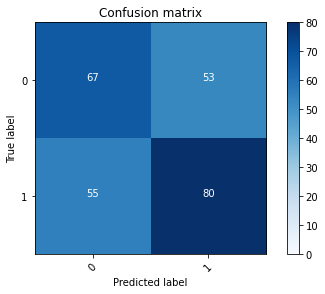

2022-08-20 16:24:37 - [Epoch Train: 41] loss: 0.0026, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:24:37 - [Epoch Valid: 41] loss: 2.5664, auc: 0.6098, acc: 0.5765, time: 14.00 s


 41%|████████████████▍                       | 41/100 [45:47<1:06:40, 67.81s/it]

2022-08-20 16:24:37 - EPOCH: 42
2022-08-20 16:24:40 - Train Step 10/244, train_loss: 0.0002
2022-08-20 16:24:42 - Train Step 20/244, train_loss: 0.0018
2022-08-20 16:24:44 - Train Step 30/244, train_loss: 0.0013
2022-08-20 16:24:46 - Train Step 40/244, train_loss: 0.0011
2022-08-20 16:24:48 - Train Step 50/244, train_loss: 0.0009
2022-08-20 16:24:51 - Train Step 60/244, train_loss: 0.0011
2022-08-20 16:24:53 - Train Step 70/244, train_loss: 0.0010
2022-08-20 16:24:55 - Train Step 80/244, train_loss: 0.0009
2022-08-20 16:24:57 - Train Step 90/244, train_loss: 0.0008
2022-08-20 16:25:00 - Train Step 100/244, train_loss: 0.0007
2022-08-20 16:25:02 - Train Step 110/244, train_loss: 0.0007
2022-08-20 16:25:04 - Train Step 120/244, train_loss: 0.0006
2022-08-20 16:25:06 - Train Step 130/244, train_loss: 0.0006
2022-08-20 16:25:08 - Train Step 140/244, train_loss: 0.0006
2022-08-20 16:25:11 - Train Step 150/244, train_loss: 0.0005
2022-08-20 16:25:13 - Train Step 160/244, train_loss: 0.0005
2

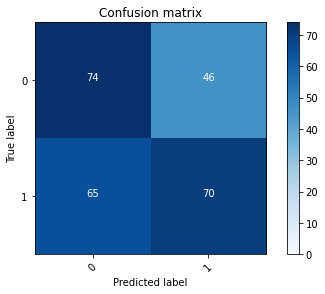

2022-08-20 16:25:45 - [Epoch Train: 42] loss: 0.0009, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 16:25:45 - [Epoch Valid: 42] loss: 2.4870, auc: 0.6007, acc: 0.5647, time: 13.00 s


 42%|████████████████▊                       | 42/100 [46:54<1:05:28, 67.73s/it]

2022-08-20 16:25:45 - EPOCH: 43
2022-08-20 16:25:47 - Train Step 10/244, train_loss: 0.0002
2022-08-20 16:25:49 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:25:52 - Train Step 30/244, train_loss: 0.0001
2022-08-20 16:25:54 - Train Step 40/244, train_loss: 0.0069
2022-08-20 16:25:56 - Train Step 50/244, train_loss: 0.0056
2022-08-20 16:25:58 - Train Step 60/244, train_loss: 0.0047
2022-08-20 16:26:01 - Train Step 70/244, train_loss: 0.0040
2022-08-20 16:26:03 - Train Step 80/244, train_loss: 0.0036
2022-08-20 16:26:05 - Train Step 90/244, train_loss: 0.0036
2022-08-20 16:26:07 - Train Step 100/244, train_loss: 0.0032
2022-08-20 16:26:10 - Train Step 110/244, train_loss: 0.0030
2022-08-20 16:26:12 - Train Step 120/244, train_loss: 0.0027
2022-08-20 16:26:14 - Train Step 130/244, train_loss: 0.0025
2022-08-20 16:26:16 - Train Step 140/244, train_loss: 0.0023
2022-08-20 16:26:19 - Train Step 150/244, train_loss: 0.0022
2022-08-20 16:26:21 - Train Step 160/244, train_loss: 0.0021
2

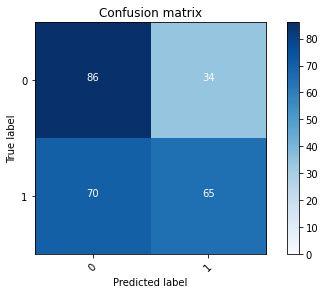

2022-08-20 16:26:54 - [Epoch Train: 43] loss: 0.0036, auc: 1.0000, acc: 0.9979, time: 55.00 s            
2022-08-20 16:26:54 - [Epoch Valid: 43] loss: 2.5485, auc: 0.6010, acc: 0.5922, time: 14.00 s


 43%|█████████████████▏                      | 43/100 [48:04<1:04:53, 68.30s/it]

2022-08-20 16:26:54 - EPOCH: 44
2022-08-20 16:26:57 - Train Step 10/244, train_loss: 0.0009
2022-08-20 16:26:59 - Train Step 20/244, train_loss: 0.0005
2022-08-20 16:27:01 - Train Step 30/244, train_loss: 0.0003
2022-08-20 16:27:03 - Train Step 40/244, train_loss: 0.0003
2022-08-20 16:27:05 - Train Step 50/244, train_loss: 0.0002
2022-08-20 16:27:08 - Train Step 60/244, train_loss: 0.0002
2022-08-20 16:27:10 - Train Step 70/244, train_loss: 0.0002
2022-08-20 16:27:12 - Train Step 80/244, train_loss: 0.0002
2022-08-20 16:27:14 - Train Step 90/244, train_loss: 0.0002
2022-08-20 16:27:16 - Train Step 100/244, train_loss: 0.0002
2022-08-20 16:27:19 - Train Step 110/244, train_loss: 0.0002
2022-08-20 16:27:21 - Train Step 120/244, train_loss: 0.0002
2022-08-20 16:27:23 - Train Step 130/244, train_loss: 0.0002
2022-08-20 16:27:25 - Train Step 140/244, train_loss: 0.0002
2022-08-20 16:27:27 - Train Step 150/244, train_loss: 0.0002
2022-08-20 16:27:30 - Train Step 160/244, train_loss: 0.0002
2

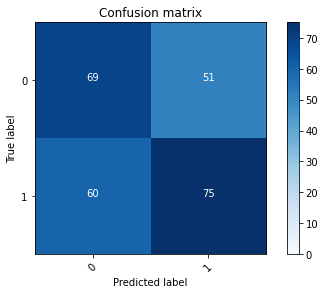

2022-08-20 16:28:02 - [Epoch Train: 44] loss: 0.0015, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 16:28:02 - [Epoch Valid: 44] loss: 2.5033, auc: 0.6105, acc: 0.5647, time: 13.00 s


 44%|█████████████████▌                      | 44/100 [49:12<1:03:37, 68.17s/it]

2022-08-20 16:28:02 - EPOCH: 45
2022-08-20 16:28:05 - Train Step 10/244, train_loss: 0.0015
2022-08-20 16:28:07 - Train Step 20/244, train_loss: 0.0009
2022-08-20 16:28:09 - Train Step 30/244, train_loss: 0.0007
2022-08-20 16:28:11 - Train Step 40/244, train_loss: 0.0075
2022-08-20 16:28:13 - Train Step 50/244, train_loss: 0.0060
2022-08-20 16:28:16 - Train Step 60/244, train_loss: 0.0050
2022-08-20 16:28:18 - Train Step 70/244, train_loss: 0.0044
2022-08-20 16:28:20 - Train Step 80/244, train_loss: 0.0038
2022-08-20 16:28:22 - Train Step 90/244, train_loss: 0.0034
2022-08-20 16:28:24 - Train Step 100/244, train_loss: 0.0031
2022-08-20 16:28:26 - Train Step 110/244, train_loss: 0.0028
2022-08-20 16:28:28 - Train Step 120/244, train_loss: 0.0056
2022-08-20 16:28:30 - Train Step 130/244, train_loss: 0.0052
2022-08-20 16:28:33 - Train Step 140/244, train_loss: 0.0048
2022-08-20 16:28:35 - Train Step 150/244, train_loss: 0.0045
2022-08-20 16:28:37 - Train Step 160/244, train_loss: 0.0042
2

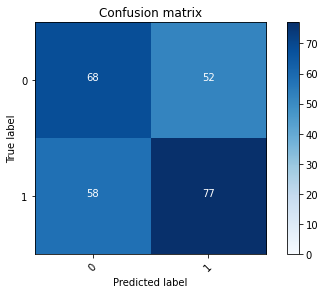

2022-08-20 16:29:09 - [Epoch Train: 45] loss: 0.0029, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:29:09 - [Epoch Valid: 45] loss: 2.5828, auc: 0.6114, acc: 0.5686, time: 13.00 s


 45%|██████████████████                      | 45/100 [50:18<1:02:03, 67.70s/it]

2022-08-20 16:29:09 - EPOCH: 46
2022-08-20 16:29:11 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:29:13 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:29:16 - Train Step 30/244, train_loss: 0.0001
2022-08-20 16:29:18 - Train Step 40/244, train_loss: 0.0001
2022-08-20 16:29:20 - Train Step 50/244, train_loss: 0.0001
2022-08-20 16:29:22 - Train Step 60/244, train_loss: 0.0001
2022-08-20 16:29:24 - Train Step 70/244, train_loss: 0.0001
2022-08-20 16:29:27 - Train Step 80/244, train_loss: 0.0001
2022-08-20 16:29:29 - Train Step 90/244, train_loss: 0.0001
2022-08-20 16:29:31 - Train Step 100/244, train_loss: 0.0001
2022-08-20 16:29:33 - Train Step 110/244, train_loss: 0.0001
2022-08-20 16:29:35 - Train Step 120/244, train_loss: 0.0001
2022-08-20 16:29:37 - Train Step 130/244, train_loss: 0.0001
2022-08-20 16:29:39 - Train Step 140/244, train_loss: 0.0001
2022-08-20 16:29:42 - Train Step 150/244, train_loss: 0.0001
2022-08-20 16:29:44 - Train Step 160/244, train_loss: 0.0017
2

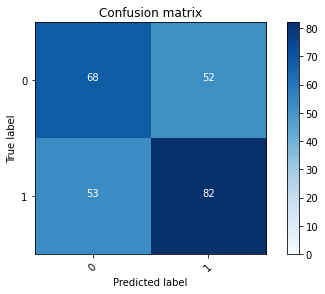

2022-08-20 16:30:17 - [Epoch Train: 46] loss: 0.0020, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:30:17 - [Epoch Valid: 46] loss: 2.6415, auc: 0.6139, acc: 0.5882, time: 14.00 s


 46%|██████████████████▍                     | 46/100 [51:26<1:01:00, 67.78s/it]

2022-08-20 16:30:17 - EPOCH: 47
2022-08-20 16:30:19 - Train Step 10/244, train_loss: 0.0007
2022-08-20 16:30:21 - Train Step 20/244, train_loss: 0.0005
2022-08-20 16:30:24 - Train Step 30/244, train_loss: 0.0007
2022-08-20 16:30:26 - Train Step 40/244, train_loss: 0.0005
2022-08-20 16:30:28 - Train Step 50/244, train_loss: 0.0004
2022-08-20 16:30:30 - Train Step 60/244, train_loss: 0.0004
2022-08-20 16:30:32 - Train Step 70/244, train_loss: 0.0003
2022-08-20 16:30:35 - Train Step 80/244, train_loss: 0.0003
2022-08-20 16:30:37 - Train Step 90/244, train_loss: 0.0003
2022-08-20 16:30:39 - Train Step 100/244, train_loss: 0.0003
2022-08-20 16:30:41 - Train Step 110/244, train_loss: 0.0002
2022-08-20 16:30:43 - Train Step 120/244, train_loss: 0.0002
2022-08-20 16:30:46 - Train Step 130/244, train_loss: 0.0002
2022-08-20 16:30:48 - Train Step 140/244, train_loss: 0.0002
2022-08-20 16:30:50 - Train Step 150/244, train_loss: 0.0002
2022-08-20 16:30:52 - Train Step 160/244, train_loss: 0.0002
2

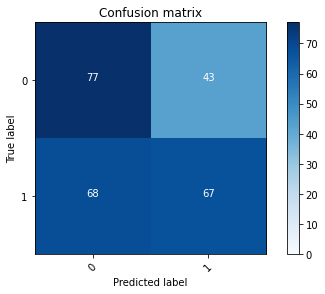

2022-08-20 16:31:24 - [Epoch Train: 47] loss: 0.0013, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 16:31:24 - [Epoch Valid: 47] loss: 2.6368, auc: 0.6086, acc: 0.5647, time: 13.00 s


 47%|███████████████████▋                      | 47/100 [52:34<59:47, 67.69s/it]

2022-08-20 16:31:24 - EPOCH: 48
2022-08-20 16:31:27 - Train Step 10/244, train_loss: 0.0104
2022-08-20 16:31:29 - Train Step 20/244, train_loss: 0.0054
2022-08-20 16:31:31 - Train Step 30/244, train_loss: 0.0037
2022-08-20 16:31:33 - Train Step 40/244, train_loss: 0.0029
2022-08-20 16:31:35 - Train Step 50/244, train_loss: 0.0023
2022-08-20 16:31:37 - Train Step 60/244, train_loss: 0.0019
2022-08-20 16:31:39 - Train Step 70/244, train_loss: 0.0017
2022-08-20 16:31:41 - Train Step 80/244, train_loss: 0.0015
2022-08-20 16:31:43 - Train Step 90/244, train_loss: 0.0013
2022-08-20 16:31:45 - Train Step 100/244, train_loss: 0.0012
2022-08-20 16:31:47 - Train Step 110/244, train_loss: 0.0011
2022-08-20 16:31:49 - Train Step 120/244, train_loss: 0.0010
2022-08-20 16:31:51 - Train Step 130/244, train_loss: 0.0027
2022-08-20 16:31:54 - Train Step 140/244, train_loss: 0.0026
2022-08-20 16:31:56 - Train Step 150/244, train_loss: 0.0025
2022-08-20 16:31:58 - Train Step 160/244, train_loss: 0.0024
2

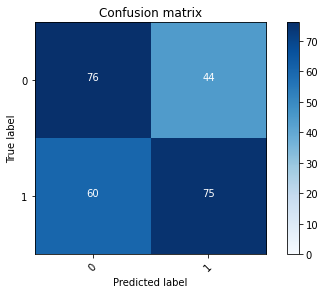

2022-08-20 16:32:29 - [Epoch Train: 48] loss: 0.0016, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 16:32:29 - [Epoch Valid: 48] loss: 2.8284, auc: 0.6220, acc: 0.5922, time: 14.00 s


 48%|████████████████████▏                     | 48/100 [53:39<57:59, 66.92s/it]

2022-08-20 16:32:29 - EPOCH: 49
2022-08-20 16:32:32 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:32:34 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:32:36 - Train Step 30/244, train_loss: 0.0109
2022-08-20 16:32:38 - Train Step 40/244, train_loss: 0.0092
2022-08-20 16:32:41 - Train Step 50/244, train_loss: 0.0074
2022-08-20 16:32:43 - Train Step 60/244, train_loss: 0.0062
2022-08-20 16:32:45 - Train Step 70/244, train_loss: 0.0054
2022-08-20 16:32:47 - Train Step 80/244, train_loss: 0.0048
2022-08-20 16:32:50 - Train Step 90/244, train_loss: 0.0043
2022-08-20 16:32:52 - Train Step 100/244, train_loss: 0.0068
2022-08-20 16:32:54 - Train Step 110/244, train_loss: 0.0062
2022-08-20 16:32:57 - Train Step 120/244, train_loss: 0.0057
2022-08-20 16:32:59 - Train Step 130/244, train_loss: 0.0053
2022-08-20 16:33:01 - Train Step 140/244, train_loss: 0.0049
2022-08-20 16:33:03 - Train Step 150/244, train_loss: 0.0046
2022-08-20 16:33:06 - Train Step 160/244, train_loss: 0.0043
2

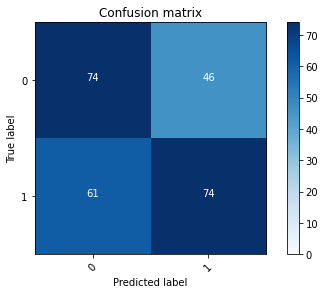

2022-08-20 16:33:38 - [Epoch Train: 49] loss: 0.0029, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 16:33:38 - [Epoch Valid: 49] loss: 2.5336, auc: 0.6114, acc: 0.5804, time: 13.00 s


 49%|████████████████████▌                     | 49/100 [54:47<57:15, 67.35s/it]

2022-08-20 16:33:38 - EPOCH: 50
2022-08-20 16:33:40 - Train Step 10/244, train_loss: 0.0002
2022-08-20 16:33:42 - Train Step 20/244, train_loss: 0.0002
2022-08-20 16:33:44 - Train Step 30/244, train_loss: 0.0179
2022-08-20 16:33:47 - Train Step 40/244, train_loss: 0.0137
2022-08-20 16:33:49 - Train Step 50/244, train_loss: 0.0110
2022-08-20 16:33:51 - Train Step 60/244, train_loss: 0.0092
2022-08-20 16:33:53 - Train Step 70/244, train_loss: 0.0079
2022-08-20 16:33:55 - Train Step 80/244, train_loss: 0.0069
2022-08-20 16:33:58 - Train Step 90/244, train_loss: 0.0062
2022-08-20 16:34:00 - Train Step 100/244, train_loss: 0.0056
2022-08-20 16:34:02 - Train Step 110/244, train_loss: 0.0051
2022-08-20 16:34:04 - Train Step 120/244, train_loss: 0.0047
2022-08-20 16:34:06 - Train Step 130/244, train_loss: 0.0044
2022-08-20 16:34:08 - Train Step 140/244, train_loss: 0.0041
2022-08-20 16:34:10 - Train Step 150/244, train_loss: 0.0038
2022-08-20 16:34:13 - Train Step 160/244, train_loss: 0.0036
2

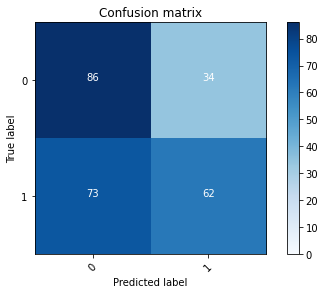

2022-08-20 16:34:46 - [Epoch Train: 50] loss: 0.0038, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:34:46 - [Epoch Valid: 50] loss: 2.7022, auc: 0.6072, acc: 0.5804, time: 14.00 s


 50%|█████████████████████                     | 50/100 [55:55<56:17, 67.55s/it]

2022-08-20 16:34:46 - EPOCH: 51
2022-08-20 16:34:48 - Train Step 10/244, train_loss: 0.0000
2022-08-20 16:34:50 - Train Step 20/244, train_loss: 0.0002
2022-08-20 16:34:53 - Train Step 30/244, train_loss: 0.0002
2022-08-20 16:34:55 - Train Step 40/244, train_loss: 0.0001
2022-08-20 16:34:57 - Train Step 50/244, train_loss: 0.0002
2022-08-20 16:34:59 - Train Step 60/244, train_loss: 0.0002
2022-08-20 16:35:01 - Train Step 70/244, train_loss: 0.0003
2022-08-20 16:35:03 - Train Step 80/244, train_loss: 0.0002
2022-08-20 16:35:06 - Train Step 90/244, train_loss: 0.0002
2022-08-20 16:35:08 - Train Step 100/244, train_loss: 0.0045
2022-08-20 16:35:10 - Train Step 110/244, train_loss: 0.0041
2022-08-20 16:35:12 - Train Step 120/244, train_loss: 0.0038
2022-08-20 16:35:14 - Train Step 130/244, train_loss: 0.0036
2022-08-20 16:35:17 - Train Step 140/244, train_loss: 0.0033
2022-08-20 16:35:19 - Train Step 150/244, train_loss: 0.0031
2022-08-20 16:35:21 - Train Step 160/244, train_loss: 0.0029
2

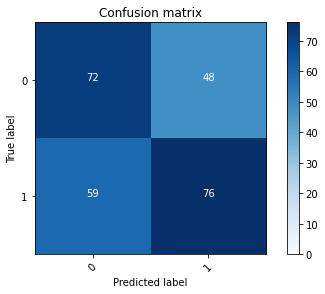

2022-08-20 16:35:53 - [Epoch Train: 51] loss: 0.0047, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:35:53 - [Epoch Valid: 51] loss: 2.6700, auc: 0.6149, acc: 0.5804, time: 13.00 s


 51%|█████████████████████▍                    | 51/100 [57:02<55:02, 67.40s/it]

2022-08-20 16:35:53 - EPOCH: 52
2022-08-20 16:35:55 - Train Step 10/244, train_loss: 0.0000
2022-08-20 16:35:57 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:36:00 - Train Step 30/244, train_loss: 0.0002
2022-08-20 16:36:02 - Train Step 40/244, train_loss: 0.0002
2022-08-20 16:36:04 - Train Step 50/244, train_loss: 0.0002
2022-08-20 16:36:06 - Train Step 60/244, train_loss: 0.0002
2022-08-20 16:36:08 - Train Step 70/244, train_loss: 0.0002
2022-08-20 16:36:11 - Train Step 80/244, train_loss: 0.0002
2022-08-20 16:36:13 - Train Step 90/244, train_loss: 0.0058
2022-08-20 16:36:15 - Train Step 100/244, train_loss: 0.0052
2022-08-20 16:36:17 - Train Step 110/244, train_loss: 0.0047
2022-08-20 16:36:19 - Train Step 120/244, train_loss: 0.0044
2022-08-20 16:36:21 - Train Step 130/244, train_loss: 0.0040
2022-08-20 16:36:23 - Train Step 140/244, train_loss: 0.0038
2022-08-20 16:36:25 - Train Step 150/244, train_loss: 0.0036
2022-08-20 16:36:28 - Train Step 160/244, train_loss: 0.0034
2

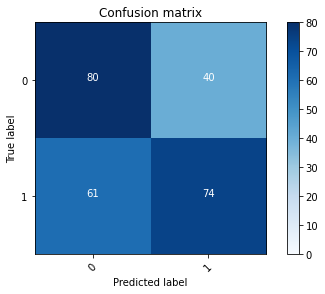

2022-08-20 16:37:00 - [Epoch Train: 52] loss: 0.0041, auc: 1.0000, acc: 0.9979, time: 52.00 s            
2022-08-20 16:37:00 - [Epoch Valid: 52] loss: 2.7243, auc: 0.6141, acc: 0.6039, time: 14.00 s


 52%|█████████████████████▊                    | 52/100 [58:09<53:49, 67.27s/it]

2022-08-20 16:37:00 - EPOCH: 53
2022-08-20 16:37:02 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:37:04 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:37:07 - Train Step 30/244, train_loss: 0.0077
2022-08-20 16:37:09 - Train Step 40/244, train_loss: 0.0058
2022-08-20 16:37:11 - Train Step 50/244, train_loss: 0.0047
2022-08-20 16:37:13 - Train Step 60/244, train_loss: 0.0039
2022-08-20 16:37:16 - Train Step 70/244, train_loss: 0.0034
2022-08-20 16:37:18 - Train Step 80/244, train_loss: 0.0030
2022-08-20 16:37:20 - Train Step 90/244, train_loss: 0.0027
2022-08-20 16:37:22 - Train Step 100/244, train_loss: 0.0024
2022-08-20 16:37:24 - Train Step 110/244, train_loss: 0.0022
2022-08-20 16:37:26 - Train Step 120/244, train_loss: 0.0021
2022-08-20 16:37:28 - Train Step 130/244, train_loss: 0.0019
2022-08-20 16:37:31 - Train Step 140/244, train_loss: 0.0018
2022-08-20 16:37:33 - Train Step 150/244, train_loss: 0.0017
2022-08-20 16:37:35 - Train Step 160/244, train_loss: 0.0016
2

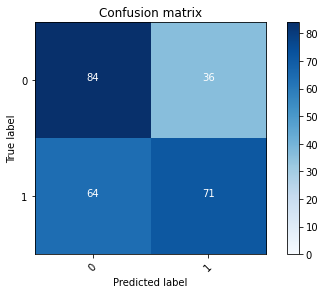

2022-08-20 16:38:06 - [Epoch Train: 53] loss: 0.0021, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 16:38:06 - [Epoch Valid: 53] loss: 2.7031, auc: 0.6158, acc: 0.6078, time: 13.00 s
2022-08-20 16:38:06 - acc improved from 0.6078 to 0.6078. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_15-38-50/RSNAClassifierSingle3D-DW-SO-KLF-mn-e53-loss2.703-acc0.608-auc0.616.pth'


 53%|██████████████████████▎                   | 53/100 [59:16<52:28, 67.00s/it]

2022-08-20 16:38:06 - EPOCH: 54
2022-08-20 16:38:08 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:38:10 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:38:12 - Train Step 30/244, train_loss: 0.0001
2022-08-20 16:38:15 - Train Step 40/244, train_loss: 0.0018
2022-08-20 16:38:17 - Train Step 50/244, train_loss: 0.0015
2022-08-20 16:38:19 - Train Step 60/244, train_loss: 0.0014
2022-08-20 16:38:21 - Train Step 70/244, train_loss: 0.0012
2022-08-20 16:38:23 - Train Step 80/244, train_loss: 0.0011
2022-08-20 16:38:25 - Train Step 90/244, train_loss: 0.0010
2022-08-20 16:38:27 - Train Step 100/244, train_loss: 0.0009
2022-08-20 16:38:29 - Train Step 110/244, train_loss: 0.0008
2022-08-20 16:38:31 - Train Step 120/244, train_loss: 0.0007
2022-08-20 16:38:33 - Train Step 130/244, train_loss: 0.0007
2022-08-20 16:38:35 - Train Step 140/244, train_loss: 0.0006
2022-08-20 16:38:37 - Train Step 150/244, train_loss: 0.0045
2022-08-20 16:38:40 - Train Step 160/244, train_loss: 0.0042
2

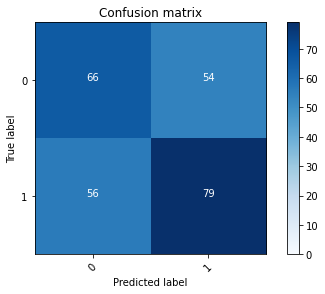

2022-08-20 16:39:11 - [Epoch Train: 54] loss: 0.0028, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 16:39:11 - [Epoch Valid: 54] loss: 2.5831, auc: 0.6153, acc: 0.5686, time: 14.00 s


 54%|█████████████████████▌                  | 54/100 [1:00:21<50:57, 66.46s/it]

2022-08-20 16:39:11 - EPOCH: 55
2022-08-20 16:39:14 - Train Step 10/244, train_loss: 0.0000
2022-08-20 16:39:16 - Train Step 20/244, train_loss: 0.0004
2022-08-20 16:39:18 - Train Step 30/244, train_loss: 0.0003
2022-08-20 16:39:21 - Train Step 40/244, train_loss: 0.0036
2022-08-20 16:39:23 - Train Step 50/244, train_loss: 0.0029
2022-08-20 16:39:25 - Train Step 60/244, train_loss: 0.0110
2022-08-20 16:39:27 - Train Step 70/244, train_loss: 0.0094
2022-08-20 16:39:30 - Train Step 80/244, train_loss: 0.0083
2022-08-20 16:39:32 - Train Step 90/244, train_loss: 0.0074
2022-08-20 16:39:34 - Train Step 100/244, train_loss: 0.0067
2022-08-20 16:39:36 - Train Step 110/244, train_loss: 0.0061
2022-08-20 16:39:38 - Train Step 120/244, train_loss: 0.0056
2022-08-20 16:39:40 - Train Step 130/244, train_loss: 0.0052
2022-08-20 16:39:42 - Train Step 140/244, train_loss: 0.0048
2022-08-20 16:39:45 - Train Step 150/244, train_loss: 0.0045
2022-08-20 16:39:47 - Train Step 160/244, train_loss: 0.0042
2

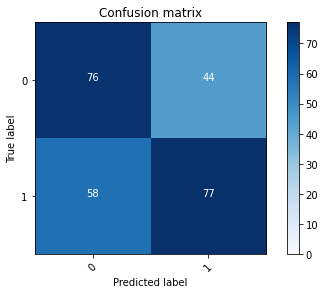

2022-08-20 16:40:19 - [Epoch Train: 55] loss: 0.0028, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:40:19 - [Epoch Valid: 55] loss: 3.0113, auc: 0.6156, acc: 0.6000, time: 13.00 s


 55%|██████████████████████                  | 55/100 [1:01:28<50:02, 66.72s/it]

2022-08-20 16:40:19 - EPOCH: 56
2022-08-20 16:40:21 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:40:23 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:40:25 - Train Step 30/244, train_loss: 0.0082
2022-08-20 16:40:27 - Train Step 40/244, train_loss: 0.0061
2022-08-20 16:40:29 - Train Step 50/244, train_loss: 0.0050
2022-08-20 16:40:31 - Train Step 60/244, train_loss: 0.0042
2022-08-20 16:40:33 - Train Step 70/244, train_loss: 0.0036
2022-08-20 16:40:35 - Train Step 80/244, train_loss: 0.0032
2022-08-20 16:40:38 - Train Step 90/244, train_loss: 0.0088
2022-08-20 16:40:40 - Train Step 100/244, train_loss: 0.0079
2022-08-20 16:40:42 - Train Step 110/244, train_loss: 0.0072
2022-08-20 16:40:44 - Train Step 120/244, train_loss: 0.0066
2022-08-20 16:40:46 - Train Step 130/244, train_loss: 0.0061
2022-08-20 16:40:48 - Train Step 140/244, train_loss: 0.0057
2022-08-20 16:40:50 - Train Step 150/244, train_loss: 0.0053
2022-08-20 16:40:52 - Train Step 160/244, train_loss: 0.0050
2

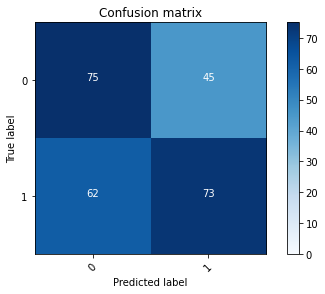

2022-08-20 16:41:24 - [Epoch Train: 56] loss: 0.0033, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 16:41:24 - [Epoch Valid: 56] loss: 2.6918, auc: 0.6142, acc: 0.5804, time: 14.00 s


 56%|██████████████████████▍                 | 56/100 [1:02:34<48:39, 66.36s/it]

2022-08-20 16:41:24 - EPOCH: 57
2022-08-20 16:41:27 - Train Step 10/244, train_loss: 0.0000
2022-08-20 16:41:29 - Train Step 20/244, train_loss: 0.0000
2022-08-20 16:41:31 - Train Step 30/244, train_loss: 0.0001
2022-08-20 16:41:33 - Train Step 40/244, train_loss: 0.0001
2022-08-20 16:41:35 - Train Step 50/244, train_loss: 0.0001
2022-08-20 16:41:37 - Train Step 60/244, train_loss: 0.0001
2022-08-20 16:41:39 - Train Step 70/244, train_loss: 0.0044
2022-08-20 16:41:42 - Train Step 80/244, train_loss: 0.0039
2022-08-20 16:41:44 - Train Step 90/244, train_loss: 0.0034
2022-08-20 16:41:46 - Train Step 100/244, train_loss: 0.0031
2022-08-20 16:41:48 - Train Step 110/244, train_loss: 0.0028
2022-08-20 16:41:50 - Train Step 120/244, train_loss: 0.0026
2022-08-20 16:41:52 - Train Step 130/244, train_loss: 0.0024
2022-08-20 16:41:54 - Train Step 140/244, train_loss: 0.0023
2022-08-20 16:41:56 - Train Step 150/244, train_loss: 0.0021
2022-08-20 16:41:59 - Train Step 160/244, train_loss: 0.0020
2

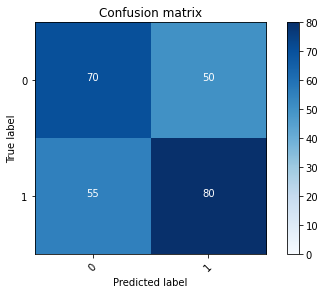

2022-08-20 16:42:32 - [Epoch Train: 57] loss: 0.0028, auc: 1.0000, acc: 0.9979, time: 52.00 s            
2022-08-20 16:42:32 - [Epoch Valid: 57] loss: 2.7354, auc: 0.6152, acc: 0.5882, time: 14.00 s


 57%|██████████████████████▊                 | 57/100 [1:03:41<47:47, 66.69s/it]

2022-08-20 16:42:32 - EPOCH: 58
2022-08-20 16:42:34 - Train Step 10/244, train_loss: 0.0004
2022-08-20 16:42:36 - Train Step 20/244, train_loss: 0.0002
2022-08-20 16:42:38 - Train Step 30/244, train_loss: 0.0003
2022-08-20 16:42:40 - Train Step 40/244, train_loss: 0.0002
2022-08-20 16:42:42 - Train Step 50/244, train_loss: 0.0003
2022-08-20 16:42:44 - Train Step 60/244, train_loss: 0.0003
2022-08-20 16:42:46 - Train Step 70/244, train_loss: 0.0033
2022-08-20 16:42:49 - Train Step 80/244, train_loss: 0.0029
2022-08-20 16:42:51 - Train Step 90/244, train_loss: 0.0026
2022-08-20 16:42:53 - Train Step 100/244, train_loss: 0.0023
2022-08-20 16:42:55 - Train Step 110/244, train_loss: 0.0021
2022-08-20 16:42:57 - Train Step 120/244, train_loss: 0.0020
2022-08-20 16:42:59 - Train Step 130/244, train_loss: 0.0020
2022-08-20 16:43:01 - Train Step 140/244, train_loss: 0.0019
2022-08-20 16:43:03 - Train Step 150/244, train_loss: 0.0018
2022-08-20 16:43:05 - Train Step 160/244, train_loss: 0.0017
2

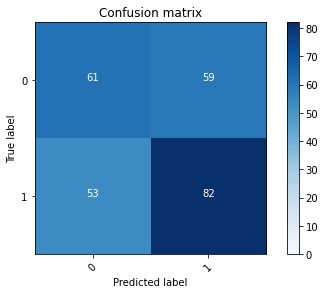

2022-08-20 16:43:36 - [Epoch Train: 58] loss: 0.0021, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 16:43:36 - [Epoch Valid: 58] loss: 2.7961, auc: 0.6181, acc: 0.5608, time: 13.00 s


 58%|███████████████████████▏                | 58/100 [1:04:45<46:12, 66.02s/it]

2022-08-20 16:43:36 - EPOCH: 59
2022-08-20 16:43:38 - Train Step 10/244, train_loss: 0.0002
2022-08-20 16:43:40 - Train Step 20/244, train_loss: 0.0002
2022-08-20 16:43:42 - Train Step 30/244, train_loss: 0.0008
2022-08-20 16:43:44 - Train Step 40/244, train_loss: 0.0006
2022-08-20 16:43:47 - Train Step 50/244, train_loss: 0.0042
2022-08-20 16:43:49 - Train Step 60/244, train_loss: 0.0036
2022-08-20 16:43:51 - Train Step 70/244, train_loss: 0.0031
2022-08-20 16:43:53 - Train Step 80/244, train_loss: 0.0027
2022-08-20 16:43:55 - Train Step 90/244, train_loss: 0.0024
2022-08-20 16:43:57 - Train Step 100/244, train_loss: 0.0022
2022-08-20 16:43:59 - Train Step 110/244, train_loss: 0.0020
2022-08-20 16:44:01 - Train Step 120/244, train_loss: 0.0019
2022-08-20 16:44:03 - Train Step 130/244, train_loss: 0.0018
2022-08-20 16:44:05 - Train Step 140/244, train_loss: 0.0017
2022-08-20 16:44:07 - Train Step 150/244, train_loss: 0.0016
2022-08-20 16:44:09 - Train Step 160/244, train_loss: 0.0015
2

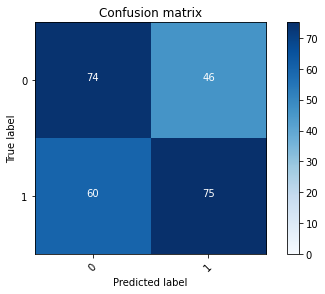

2022-08-20 16:44:41 - [Epoch Train: 59] loss: 0.0016, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 16:44:41 - [Epoch Valid: 59] loss: 2.5918, auc: 0.6112, acc: 0.5843, time: 14.00 s


 59%|███████████████████████▌                | 59/100 [1:05:50<44:53, 65.69s/it]

2022-08-20 16:44:41 - EPOCH: 60
2022-08-20 16:44:43 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:44:46 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:44:48 - Train Step 30/244, train_loss: 0.0001
2022-08-20 16:44:50 - Train Step 40/244, train_loss: 0.0001
2022-08-20 16:44:52 - Train Step 50/244, train_loss: 0.0001
2022-08-20 16:44:55 - Train Step 60/244, train_loss: 0.0001
2022-08-20 16:44:57 - Train Step 70/244, train_loss: 0.0033
2022-08-20 16:44:59 - Train Step 80/244, train_loss: 0.0029
2022-08-20 16:45:01 - Train Step 90/244, train_loss: 0.0027
2022-08-20 16:45:04 - Train Step 100/244, train_loss: 0.0024
2022-08-20 16:45:06 - Train Step 110/244, train_loss: 0.0022
2022-08-20 16:45:08 - Train Step 120/244, train_loss: 0.0020
2022-08-20 16:45:10 - Train Step 130/244, train_loss: 0.0019
2022-08-20 16:45:12 - Train Step 140/244, train_loss: 0.0018
2022-08-20 16:45:15 - Train Step 150/244, train_loss: 0.0017
2022-08-20 16:45:17 - Train Step 160/244, train_loss: 0.0016
2

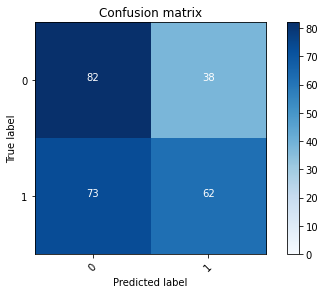

2022-08-20 16:45:51 - [Epoch Train: 60] loss: 0.0039, auc: 1.0000, acc: 0.9979, time: 55.00 s            
2022-08-20 16:45:51 - [Epoch Valid: 60] loss: 2.9294, auc: 0.6034, acc: 0.5647, time: 14.00 s


 60%|████████████████████████                | 60/100 [1:07:00<44:34, 66.86s/it]

2022-08-20 16:45:51 - EPOCH: 61
2022-08-20 16:45:53 - Train Step 10/244, train_loss: 0.0002
2022-08-20 16:45:55 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:45:57 - Train Step 30/244, train_loss: 0.0001
2022-08-20 16:46:00 - Train Step 40/244, train_loss: 0.0002
2022-08-20 16:46:02 - Train Step 50/244, train_loss: 0.0002
2022-08-20 16:46:04 - Train Step 60/244, train_loss: 0.0002
2022-08-20 16:46:06 - Train Step 70/244, train_loss: 0.0002
2022-08-20 16:46:08 - Train Step 80/244, train_loss: 0.0002
2022-08-20 16:46:11 - Train Step 90/244, train_loss: 0.0002
2022-08-20 16:46:13 - Train Step 100/244, train_loss: 0.0002
2022-08-20 16:46:15 - Train Step 110/244, train_loss: 0.0001
2022-08-20 16:46:17 - Train Step 120/244, train_loss: 0.0001
2022-08-20 16:46:19 - Train Step 130/244, train_loss: 0.0024
2022-08-20 16:46:21 - Train Step 140/244, train_loss: 0.0022
2022-08-20 16:46:24 - Train Step 150/244, train_loss: 0.0055
2022-08-20 16:46:26 - Train Step 160/244, train_loss: 0.0052
2

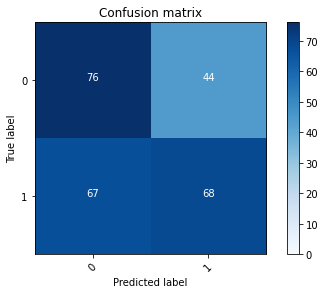

2022-08-20 16:46:58 - [Epoch Train: 61] loss: 0.0035, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:46:58 - [Epoch Valid: 61] loss: 2.8533, auc: 0.6009, acc: 0.5647, time: 14.00 s


 61%|████████████████████████▍               | 61/100 [1:08:08<43:39, 67.16s/it]

2022-08-20 16:46:58 - EPOCH: 62
2022-08-20 16:47:01 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:47:03 - Train Step 20/244, train_loss: 0.0036
2022-08-20 16:47:05 - Train Step 30/244, train_loss: 0.0026
2022-08-20 16:47:07 - Train Step 40/244, train_loss: 0.0019
2022-08-20 16:47:09 - Train Step 50/244, train_loss: 0.0016
2022-08-20 16:47:11 - Train Step 60/244, train_loss: 0.0013
2022-08-20 16:47:14 - Train Step 70/244, train_loss: 0.0011
2022-08-20 16:47:16 - Train Step 80/244, train_loss: 0.0010
2022-08-20 16:47:18 - Train Step 90/244, train_loss: 0.0009
2022-08-20 16:47:20 - Train Step 100/244, train_loss: 0.0008
2022-08-20 16:47:22 - Train Step 110/244, train_loss: 0.0008
2022-08-20 16:47:24 - Train Step 120/244, train_loss: 0.0008
2022-08-20 16:47:26 - Train Step 130/244, train_loss: 0.0007
2022-08-20 16:47:28 - Train Step 140/244, train_loss: 0.0007
2022-08-20 16:47:31 - Train Step 150/244, train_loss: 0.0006
2022-08-20 16:47:33 - Train Step 160/244, train_loss: 0.0006
2

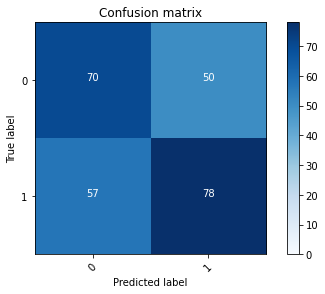

2022-08-20 16:48:04 - [Epoch Train: 62] loss: 0.0011, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 16:48:04 - [Epoch Valid: 62] loss: 2.7247, auc: 0.6052, acc: 0.5804, time: 13.00 s


 62%|████████████████████████▊               | 62/100 [1:09:13<42:12, 66.65s/it]

2022-08-20 16:48:04 - EPOCH: 63
2022-08-20 16:48:06 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:48:09 - Train Step 20/244, train_loss: 0.0038
2022-08-20 16:48:11 - Train Step 30/244, train_loss: 0.0168
2022-08-20 16:48:13 - Train Step 40/244, train_loss: 0.0127
2022-08-20 16:48:15 - Train Step 50/244, train_loss: 0.0102
2022-08-20 16:48:17 - Train Step 60/244, train_loss: 0.0085
2022-08-20 16:48:19 - Train Step 70/244, train_loss: 0.0073
2022-08-20 16:48:22 - Train Step 80/244, train_loss: 0.0064
2022-08-20 16:48:24 - Train Step 90/244, train_loss: 0.0057
2022-08-20 16:48:26 - Train Step 100/244, train_loss: 0.0052
2022-08-20 16:48:28 - Train Step 110/244, train_loss: 0.0047
2022-08-20 16:48:30 - Train Step 120/244, train_loss: 0.0043
2022-08-20 16:48:33 - Train Step 130/244, train_loss: 0.0040
2022-08-20 16:48:35 - Train Step 140/244, train_loss: 0.0037
2022-08-20 16:48:37 - Train Step 150/244, train_loss: 0.0035
2022-08-20 16:48:39 - Train Step 160/244, train_loss: 0.0033
2

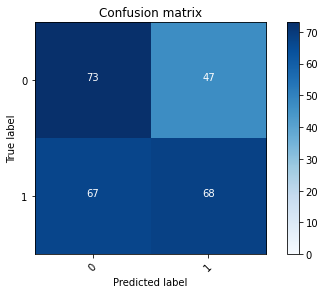

2022-08-20 16:49:12 - [Epoch Train: 63] loss: 0.0022, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 16:49:12 - [Epoch Valid: 63] loss: 2.9217, auc: 0.6081, acc: 0.5529, time: 14.00 s


 63%|█████████████████████████▏              | 63/100 [1:10:22<41:26, 67.21s/it]

2022-08-20 16:49:12 - EPOCH: 64
2022-08-20 16:49:15 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:49:17 - Train Step 20/244, train_loss: 0.0000
2022-08-20 16:49:19 - Train Step 30/244, train_loss: 0.0047
2022-08-20 16:49:21 - Train Step 40/244, train_loss: 0.0035
2022-08-20 16:49:23 - Train Step 50/244, train_loss: 0.0028
2022-08-20 16:49:25 - Train Step 60/244, train_loss: 0.0024
2022-08-20 16:49:27 - Train Step 70/244, train_loss: 0.0020
2022-08-20 16:49:29 - Train Step 80/244, train_loss: 0.0018
2022-08-20 16:49:32 - Train Step 90/244, train_loss: 0.0016
2022-08-20 16:49:34 - Train Step 100/244, train_loss: 0.0015
2022-08-20 16:49:36 - Train Step 110/244, train_loss: 0.0014
2022-08-20 16:49:38 - Train Step 120/244, train_loss: 0.0012
2022-08-20 16:49:40 - Train Step 130/244, train_loss: 0.0026
2022-08-20 16:49:42 - Train Step 140/244, train_loss: 0.0024
2022-08-20 16:49:45 - Train Step 150/244, train_loss: 0.0023
2022-08-20 16:49:47 - Train Step 160/244, train_loss: 0.0021
2

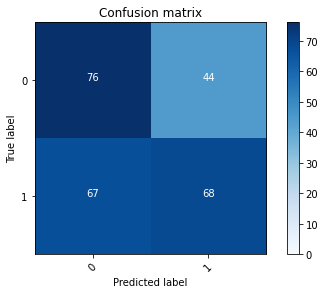

2022-08-20 16:50:18 - [Epoch Train: 64] loss: 0.0014, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 16:50:18 - [Epoch Valid: 64] loss: 2.9056, auc: 0.6051, acc: 0.5647, time: 13.00 s


 64%|█████████████████████████▌              | 64/100 [1:11:28<40:05, 66.83s/it]

2022-08-20 16:50:18 - EPOCH: 65
2022-08-20 16:50:21 - Train Step 10/244, train_loss: 0.0000
2022-08-20 16:50:23 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:50:25 - Train Step 30/244, train_loss: 0.0000
2022-08-20 16:50:27 - Train Step 40/244, train_loss: 0.0001
2022-08-20 16:50:29 - Train Step 50/244, train_loss: 0.0000
2022-08-20 16:50:31 - Train Step 60/244, train_loss: 0.0001
2022-08-20 16:50:33 - Train Step 70/244, train_loss: 0.0001
2022-08-20 16:50:35 - Train Step 80/244, train_loss: 0.0001
2022-08-20 16:50:37 - Train Step 90/244, train_loss: 0.0001
2022-08-20 16:50:39 - Train Step 100/244, train_loss: 0.0001
2022-08-20 16:50:41 - Train Step 110/244, train_loss: 0.0001
2022-08-20 16:50:43 - Train Step 120/244, train_loss: 0.0001
2022-08-20 16:50:45 - Train Step 130/244, train_loss: 0.0016
2022-08-20 16:50:47 - Train Step 140/244, train_loss: 0.0015
2022-08-20 16:50:50 - Train Step 150/244, train_loss: 0.0014
2022-08-20 16:50:52 - Train Step 160/244, train_loss: 0.0068
2

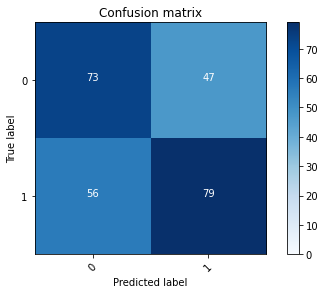

2022-08-20 16:51:23 - [Epoch Train: 65] loss: 0.0045, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 16:51:23 - [Epoch Valid: 65] loss: 2.8704, auc: 0.6078, acc: 0.5961, time: 14.00 s


 65%|██████████████████████████              | 65/100 [1:12:33<38:40, 66.31s/it]

2022-08-20 16:51:23 - EPOCH: 66
2022-08-20 16:51:26 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:51:28 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:51:30 - Train Step 30/244, train_loss: 0.0056
2022-08-20 16:51:33 - Train Step 40/244, train_loss: 0.0042
2022-08-20 16:51:35 - Train Step 50/244, train_loss: 0.0034
2022-08-20 16:51:37 - Train Step 60/244, train_loss: 0.0029
2022-08-20 16:51:39 - Train Step 70/244, train_loss: 0.0025
2022-08-20 16:51:42 - Train Step 80/244, train_loss: 0.0022
2022-08-20 16:51:44 - Train Step 90/244, train_loss: 0.0020
2022-08-20 16:51:46 - Train Step 100/244, train_loss: 0.0018
2022-08-20 16:51:48 - Train Step 110/244, train_loss: 0.0016
2022-08-20 16:51:50 - Train Step 120/244, train_loss: 0.0048
2022-08-20 16:51:53 - Train Step 130/244, train_loss: 0.0045
2022-08-20 16:51:55 - Train Step 140/244, train_loss: 0.0042
2022-08-20 16:51:57 - Train Step 150/244, train_loss: 0.0039
2022-08-20 16:51:59 - Train Step 160/244, train_loss: 0.0037
2

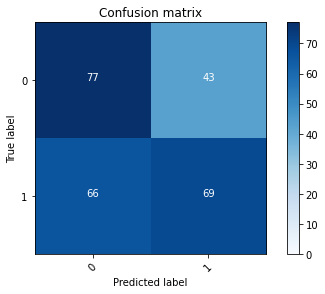

2022-08-20 16:52:31 - [Epoch Train: 66] loss: 0.0024, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 16:52:31 - [Epoch Valid: 66] loss: 2.9567, auc: 0.6096, acc: 0.5725, time: 13.00 s


 66%|██████████████████████████▍             | 66/100 [1:13:40<37:44, 66.60s/it]

2022-08-20 16:52:31 - EPOCH: 67
2022-08-20 16:52:33 - Train Step 10/244, train_loss: 0.0000
2022-08-20 16:52:35 - Train Step 20/244, train_loss: 0.0000
2022-08-20 16:52:37 - Train Step 30/244, train_loss: 0.0000
2022-08-20 16:52:39 - Train Step 40/244, train_loss: 0.0020
2022-08-20 16:52:41 - Train Step 50/244, train_loss: 0.0016
2022-08-20 16:52:43 - Train Step 60/244, train_loss: 0.0014
2022-08-20 16:52:45 - Train Step 70/244, train_loss: 0.0012
2022-08-20 16:52:47 - Train Step 80/244, train_loss: 0.0011
2022-08-20 16:52:50 - Train Step 90/244, train_loss: 0.0010
2022-08-20 16:52:52 - Train Step 100/244, train_loss: 0.0009
2022-08-20 16:52:54 - Train Step 110/244, train_loss: 0.0009
2022-08-20 16:52:56 - Train Step 120/244, train_loss: 0.0008
2022-08-20 16:52:58 - Train Step 130/244, train_loss: 0.0007
2022-08-20 16:53:00 - Train Step 140/244, train_loss: 0.0007
2022-08-20 16:53:02 - Train Step 150/244, train_loss: 0.0006
2022-08-20 16:53:04 - Train Step 160/244, train_loss: 0.0006
2

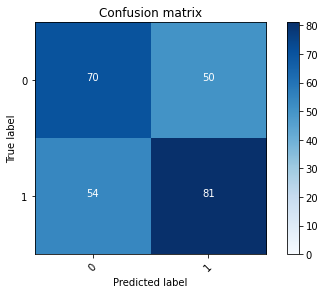

2022-08-20 16:53:37 - [Epoch Train: 67] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 16:53:37 - [Epoch Valid: 67] loss: 3.0056, auc: 0.6038, acc: 0.5922, time: 14.00 s


 67%|██████████████████████████▊             | 67/100 [1:14:46<36:30, 66.38s/it]

2022-08-20 16:53:37 - EPOCH: 68
2022-08-20 16:53:39 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:53:41 - Train Step 20/244, train_loss: 0.0000
2022-08-20 16:53:43 - Train Step 30/244, train_loss: 0.0003
2022-08-20 16:53:45 - Train Step 40/244, train_loss: 0.0002
2022-08-20 16:53:47 - Train Step 50/244, train_loss: 0.0002
2022-08-20 16:53:49 - Train Step 60/244, train_loss: 0.0002
2022-08-20 16:53:51 - Train Step 70/244, train_loss: 0.0002
2022-08-20 16:53:53 - Train Step 80/244, train_loss: 0.0002
2022-08-20 16:53:56 - Train Step 90/244, train_loss: 0.0002
2022-08-20 16:53:58 - Train Step 100/244, train_loss: 0.0001
2022-08-20 16:54:00 - Train Step 110/244, train_loss: 0.0001
2022-08-20 16:54:02 - Train Step 120/244, train_loss: 0.0001
2022-08-20 16:54:04 - Train Step 130/244, train_loss: 0.0001
2022-08-20 16:54:06 - Train Step 140/244, train_loss: 0.0001
2022-08-20 16:54:09 - Train Step 150/244, train_loss: 0.0001
2022-08-20 16:54:11 - Train Step 160/244, train_loss: 0.0027
2

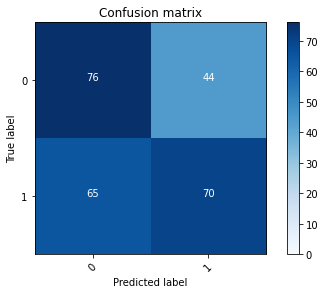

2022-08-20 16:54:43 - [Epoch Train: 68] loss: 0.0029, auc: 1.0000, acc: 0.9979, time: 52.00 s            
2022-08-20 16:54:43 - [Epoch Valid: 68] loss: 3.0686, auc: 0.5978, acc: 0.5725, time: 14.00 s


 68%|███████████████████████████▏            | 68/100 [1:15:53<35:27, 66.48s/it]

2022-08-20 16:54:43 - EPOCH: 69
2022-08-20 16:54:46 - Train Step 10/244, train_loss: 0.0000
2022-08-20 16:54:48 - Train Step 20/244, train_loss: 0.0000
2022-08-20 16:54:50 - Train Step 30/244, train_loss: 0.0000
2022-08-20 16:54:52 - Train Step 40/244, train_loss: 0.0001
2022-08-20 16:54:54 - Train Step 50/244, train_loss: 0.0001
2022-08-20 16:54:56 - Train Step 60/244, train_loss: 0.0001
2022-08-20 16:54:58 - Train Step 70/244, train_loss: 0.0001
2022-08-20 16:55:00 - Train Step 80/244, train_loss: 0.0001
2022-08-20 16:55:03 - Train Step 90/244, train_loss: 0.0048
2022-08-20 16:55:05 - Train Step 100/244, train_loss: 0.0044
2022-08-20 16:55:07 - Train Step 110/244, train_loss: 0.0040
2022-08-20 16:55:09 - Train Step 120/244, train_loss: 0.0037
2022-08-20 16:55:11 - Train Step 130/244, train_loss: 0.0034
2022-08-20 16:55:13 - Train Step 140/244, train_loss: 0.0032
2022-08-20 16:55:15 - Train Step 150/244, train_loss: 0.0030
2022-08-20 16:55:18 - Train Step 160/244, train_loss: 0.0028
2

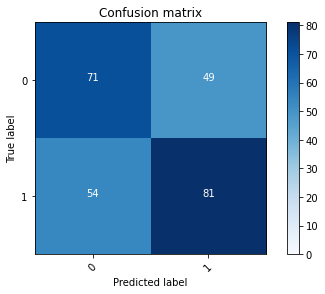

2022-08-20 16:55:50 - [Epoch Train: 69] loss: 0.0039, auc: 1.0000, acc: 0.9979, time: 51.00 s            
2022-08-20 16:55:50 - [Epoch Valid: 69] loss: 3.0274, auc: 0.5956, acc: 0.5961, time: 14.00 s


 69%|███████████████████████████▌            | 69/100 [1:16:59<34:19, 66.43s/it]

2022-08-20 16:55:50 - EPOCH: 70
2022-08-20 16:55:52 - Train Step 10/244, train_loss: 0.0003
2022-08-20 16:55:54 - Train Step 20/244, train_loss: 0.0002
2022-08-20 16:55:56 - Train Step 30/244, train_loss: 0.0002
2022-08-20 16:55:58 - Train Step 40/244, train_loss: 0.0002
2022-08-20 16:56:00 - Train Step 50/244, train_loss: 0.0002
2022-08-20 16:56:02 - Train Step 60/244, train_loss: 0.0001
2022-08-20 16:56:04 - Train Step 70/244, train_loss: 0.0001
2022-08-20 16:56:06 - Train Step 80/244, train_loss: 0.0001
2022-08-20 16:56:08 - Train Step 90/244, train_loss: 0.0001
2022-08-20 16:56:10 - Train Step 100/244, train_loss: 0.0020
2022-08-20 16:56:12 - Train Step 110/244, train_loss: 0.0019
2022-08-20 16:56:14 - Train Step 120/244, train_loss: 0.0017
2022-08-20 16:56:16 - Train Step 130/244, train_loss: 0.0016
2022-08-20 16:56:18 - Train Step 140/244, train_loss: 0.0015
2022-08-20 16:56:21 - Train Step 150/244, train_loss: 0.0014
2022-08-20 16:56:23 - Train Step 160/244, train_loss: 0.0013
2

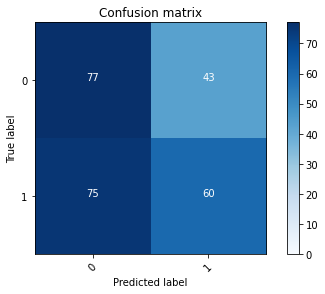

2022-08-20 16:56:53 - [Epoch Train: 70] loss: 0.0031, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 16:56:53 - [Epoch Valid: 70] loss: 2.9076, auc: 0.6008, acc: 0.5373, time: 13.00 s


 70%|████████████████████████████            | 70/100 [1:18:03<32:46, 65.56s/it]

2022-08-20 16:56:53 - EPOCH: 71
2022-08-20 16:56:56 - Train Step 10/244, train_loss: 0.0001
2022-08-20 16:56:58 - Train Step 20/244, train_loss: 0.0001
2022-08-20 16:57:00 - Train Step 30/244, train_loss: 0.0001
2022-08-20 16:57:02 - Train Step 40/244, train_loss: 0.0001
2022-08-20 16:57:04 - Train Step 50/244, train_loss: 0.0001
2022-08-20 16:57:07 - Train Step 60/244, train_loss: 0.0001
2022-08-20 16:57:09 - Train Step 70/244, train_loss: 0.0001
2022-08-20 16:57:11 - Train Step 80/244, train_loss: 0.0001
2022-08-20 16:57:13 - Train Step 90/244, train_loss: 0.0001
2022-08-20 16:57:15 - Train Step 100/244, train_loss: 0.0001
2022-08-20 16:57:17 - Train Step 110/244, train_loss: 0.0011
2022-08-20 16:57:19 - Train Step 120/244, train_loss: 0.0010
2022-08-20 16:57:22 - Train Step 130/244, train_loss: 0.0010
2022-08-20 16:57:24 - Train Step 140/244, train_loss: 0.0010
2022-08-20 16:57:26 - Train Step 150/244, train_loss: 0.0009
2022-08-20 16:57:28 - Train Step 160/244, train_loss: 0.0009
2

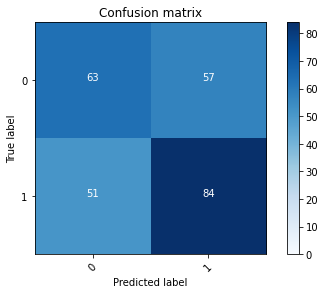

2022-08-20 16:57:59 - [Epoch Train: 71] loss: 0.0024, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 16:57:59 - [Epoch Valid: 71] loss: 3.2107, auc: 0.6025, acc: 0.5765, time: 13.00 s


 71%|████████████████████████████▍           | 71/100 [1:19:09<31:48, 65.80s/it]

2022-08-20 16:57:59 - EPOCH: 72
2022-08-20 16:58:02 - Train Step 10/244, train_loss: 0.0002
2022-08-20 16:58:04 - Train Step 20/244, train_loss: 0.0003
2022-08-20 16:58:06 - Train Step 30/244, train_loss: 0.0002
2022-08-20 16:58:08 - Train Step 40/244, train_loss: 0.0002
2022-08-20 16:58:10 - Train Step 50/244, train_loss: 0.0003
2022-08-20 16:58:12 - Train Step 60/244, train_loss: 0.0003
2022-08-20 16:58:14 - Train Step 70/244, train_loss: 0.0003
2022-08-20 16:58:17 - Train Step 80/244, train_loss: 0.0002
2022-08-20 16:58:19 - Train Step 90/244, train_loss: 0.0002
2022-08-20 16:58:21 - Train Step 100/244, train_loss: 0.0002
2022-08-20 16:58:23 - Train Step 110/244, train_loss: 0.0057
2022-08-20 16:58:25 - Train Step 120/244, train_loss: 0.0052
2022-08-20 16:58:27 - Train Step 130/244, train_loss: 0.0048
2022-08-20 16:58:29 - Train Step 140/244, train_loss: 0.0045
2022-08-20 16:58:31 - Train Step 150/244, train_loss: 0.0042
2022-08-20 16:58:33 - Train Step 160/244, train_loss: 0.0040
2

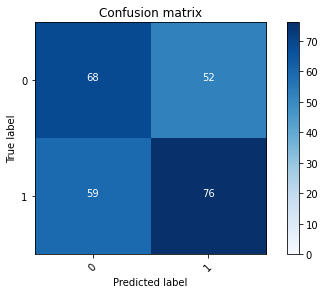

2022-08-20 16:59:05 - [Epoch Train: 72] loss: 0.0027, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 16:59:05 - [Epoch Valid: 72] loss: 3.0462, auc: 0.6037, acc: 0.5647, time: 14.00 s


 72%|████████████████████████████▊           | 72/100 [1:20:14<30:39, 65.68s/it]

2022-08-20 16:59:05 - EPOCH: 73
2022-08-20 16:59:07 - Train Step 10/244, train_loss: 0.0000
2022-08-20 16:59:09 - Train Step 20/244, train_loss: 0.0000
2022-08-20 16:59:11 - Train Step 30/244, train_loss: 0.0000
2022-08-20 16:59:13 - Train Step 40/244, train_loss: 0.0001
2022-08-20 16:59:15 - Train Step 50/244, train_loss: 0.0001
2022-08-20 16:59:17 - Train Step 60/244, train_loss: 0.0001
2022-08-20 16:59:20 - Train Step 70/244, train_loss: 0.0001
2022-08-20 16:59:22 - Train Step 80/244, train_loss: 0.0018
2022-08-20 16:59:24 - Train Step 90/244, train_loss: 0.0016
2022-08-20 16:59:26 - Train Step 100/244, train_loss: 0.0014
2022-08-20 16:59:28 - Train Step 110/244, train_loss: 0.0013
2022-08-20 16:59:30 - Train Step 120/244, train_loss: 0.0012
2022-08-20 16:59:32 - Train Step 130/244, train_loss: 0.0011
2022-08-20 16:59:34 - Train Step 140/244, train_loss: 0.0010
2022-08-20 16:59:37 - Train Step 150/244, train_loss: 0.0010
2022-08-20 16:59:39 - Train Step 160/244, train_loss: 0.0009
2

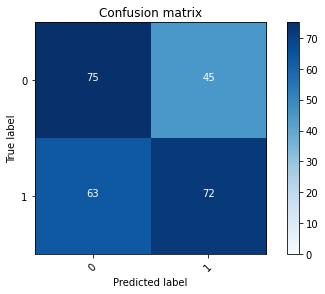

2022-08-20 17:00:10 - [Epoch Train: 73] loss: 0.0021, auc: 1.0000, acc: 0.9979, time: 51.00 s            
2022-08-20 17:00:10 - [Epoch Valid: 73] loss: 3.0883, auc: 0.6046, acc: 0.5765, time: 13.00 s


 73%|█████████████████████████████▏          | 73/100 [1:21:19<29:27, 65.45s/it]

2022-08-20 17:00:10 - EPOCH: 74
2022-08-20 17:00:12 - Train Step 10/244, train_loss: 0.0001
2022-08-20 17:00:15 - Train Step 20/244, train_loss: 0.0001
2022-08-20 17:00:17 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:00:19 - Train Step 40/244, train_loss: 0.0025
2022-08-20 17:00:21 - Train Step 50/244, train_loss: 0.0020
2022-08-20 17:00:23 - Train Step 60/244, train_loss: 0.0017
2022-08-20 17:00:25 - Train Step 70/244, train_loss: 0.0105
2022-08-20 17:00:28 - Train Step 80/244, train_loss: 0.0092
2022-08-20 17:00:30 - Train Step 90/244, train_loss: 0.0082
2022-08-20 17:00:32 - Train Step 100/244, train_loss: 0.0074
2022-08-20 17:00:34 - Train Step 110/244, train_loss: 0.0067
2022-08-20 17:00:36 - Train Step 120/244, train_loss: 0.0062
2022-08-20 17:00:39 - Train Step 130/244, train_loss: 0.0057
2022-08-20 17:00:41 - Train Step 140/244, train_loss: 0.0053
2022-08-20 17:00:43 - Train Step 150/244, train_loss: 0.0050
2022-08-20 17:00:45 - Train Step 160/244, train_loss: 0.0046
2

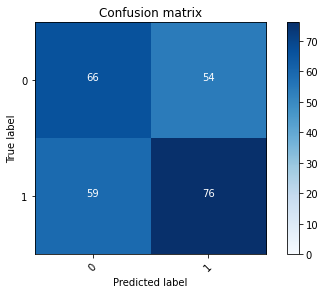

2022-08-20 17:01:19 - [Epoch Train: 74] loss: 0.0031, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 17:01:19 - [Epoch Valid: 74] loss: 2.8569, auc: 0.5982, acc: 0.5569, time: 14.00 s


 74%|█████████████████████████████▌          | 74/100 [1:22:28<28:47, 66.44s/it]

2022-08-20 17:01:19 - EPOCH: 75
2022-08-20 17:01:21 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:01:24 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:01:26 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:01:28 - Train Step 40/244, train_loss: 0.0001
2022-08-20 17:01:30 - Train Step 50/244, train_loss: 0.0000
2022-08-20 17:01:32 - Train Step 60/244, train_loss: 0.0000
2022-08-20 17:01:34 - Train Step 70/244, train_loss: 0.0000
2022-08-20 17:01:37 - Train Step 80/244, train_loss: 0.0000
2022-08-20 17:01:39 - Train Step 90/244, train_loss: 0.0000
2022-08-20 17:01:41 - Train Step 100/244, train_loss: 0.0000
2022-08-20 17:01:43 - Train Step 110/244, train_loss: 0.0000
2022-08-20 17:01:45 - Train Step 120/244, train_loss: 0.0001
2022-08-20 17:01:47 - Train Step 130/244, train_loss: 0.0001
2022-08-20 17:01:50 - Train Step 140/244, train_loss: 0.0001
2022-08-20 17:01:52 - Train Step 150/244, train_loss: 0.0027
2022-08-20 17:01:54 - Train Step 160/244, train_loss: 0.0026
2

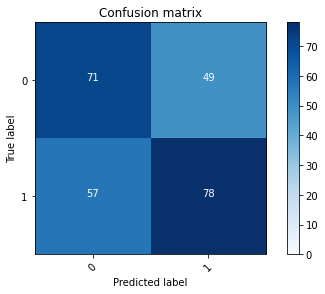

2022-08-20 17:02:26 - [Epoch Train: 75] loss: 0.0028, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 17:02:26 - [Epoch Valid: 75] loss: 3.0777, auc: 0.6123, acc: 0.5843, time: 13.00 s


 75%|██████████████████████████████          | 75/100 [1:23:35<27:46, 66.65s/it]

2022-08-20 17:02:26 - EPOCH: 76
2022-08-20 17:02:28 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:02:30 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:02:32 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:02:34 - Train Step 40/244, train_loss: 0.0001
2022-08-20 17:02:36 - Train Step 50/244, train_loss: 0.0001
2022-08-20 17:02:38 - Train Step 60/244, train_loss: 0.0001
2022-08-20 17:02:40 - Train Step 70/244, train_loss: 0.0001
2022-08-20 17:02:42 - Train Step 80/244, train_loss: 0.0001
2022-08-20 17:02:44 - Train Step 90/244, train_loss: 0.0001
2022-08-20 17:02:46 - Train Step 100/244, train_loss: 0.0018
2022-08-20 17:02:48 - Train Step 110/244, train_loss: 0.0017
2022-08-20 17:02:51 - Train Step 120/244, train_loss: 0.0015
2022-08-20 17:02:53 - Train Step 130/244, train_loss: 0.0014
2022-08-20 17:02:55 - Train Step 140/244, train_loss: 0.0013
2022-08-20 17:02:57 - Train Step 150/244, train_loss: 0.0013
2022-08-20 17:02:59 - Train Step 160/244, train_loss: 0.0012
2

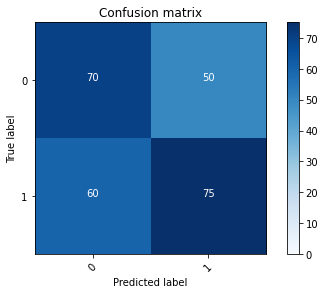

2022-08-20 17:03:29 - [Epoch Train: 76] loss: 0.0017, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 17:03:29 - [Epoch Valid: 76] loss: 3.2566, auc: 0.6040, acc: 0.5686, time: 13.00 s


 76%|██████████████████████████████▍         | 76/100 [1:24:39<26:16, 65.68s/it]

2022-08-20 17:03:29 - EPOCH: 77
2022-08-20 17:03:32 - Train Step 10/244, train_loss: 0.0240
2022-08-20 17:03:34 - Train Step 20/244, train_loss: 0.0120
2022-08-20 17:03:36 - Train Step 30/244, train_loss: 0.0080
2022-08-20 17:03:38 - Train Step 40/244, train_loss: 0.0061
2022-08-20 17:03:41 - Train Step 50/244, train_loss: 0.0049
2022-08-20 17:03:43 - Train Step 60/244, train_loss: 0.0041
2022-08-20 17:03:45 - Train Step 70/244, train_loss: 0.0035
2022-08-20 17:03:47 - Train Step 80/244, train_loss: 0.0031
2022-08-20 17:03:50 - Train Step 90/244, train_loss: 0.0062
2022-08-20 17:03:52 - Train Step 100/244, train_loss: 0.0055
2022-08-20 17:03:54 - Train Step 110/244, train_loss: 0.0051
2022-08-20 17:03:56 - Train Step 120/244, train_loss: 0.0046
2022-08-20 17:03:59 - Train Step 130/244, train_loss: 0.0043
2022-08-20 17:04:01 - Train Step 140/244, train_loss: 0.0040
2022-08-20 17:04:03 - Train Step 150/244, train_loss: 0.0037
2022-08-20 17:04:05 - Train Step 160/244, train_loss: 0.0035
2

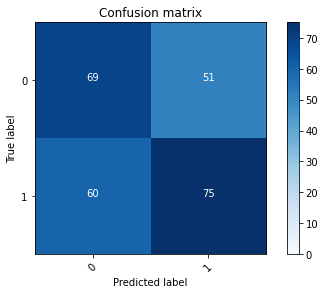

2022-08-20 17:04:38 - [Epoch Train: 77] loss: 0.0023, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 17:04:38 - [Epoch Valid: 77] loss: 3.0819, auc: 0.6015, acc: 0.5647, time: 14.00 s


 77%|██████████████████████████████▊         | 77/100 [1:25:48<25:34, 66.70s/it]

2022-08-20 17:04:38 - EPOCH: 78
2022-08-20 17:04:40 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:04:43 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:04:45 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:04:47 - Train Step 40/244, train_loss: 0.0001
2022-08-20 17:04:49 - Train Step 50/244, train_loss: 0.0001
2022-08-20 17:04:51 - Train Step 60/244, train_loss: 0.0001
2022-08-20 17:04:53 - Train Step 70/244, train_loss: 0.0001
2022-08-20 17:04:55 - Train Step 80/244, train_loss: 0.0001
2022-08-20 17:04:57 - Train Step 90/244, train_loss: 0.0001
2022-08-20 17:04:59 - Train Step 100/244, train_loss: 0.0001
2022-08-20 17:05:01 - Train Step 110/244, train_loss: 0.0001
2022-08-20 17:05:03 - Train Step 120/244, train_loss: 0.0001
2022-08-20 17:05:05 - Train Step 130/244, train_loss: 0.0001
2022-08-20 17:05:07 - Train Step 140/244, train_loss: 0.0008
2022-08-20 17:05:09 - Train Step 150/244, train_loss: 0.0008
2022-08-20 17:05:11 - Train Step 160/244, train_loss: 0.0007
2

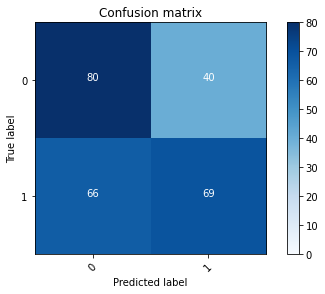

2022-08-20 17:05:42 - [Epoch Train: 78] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 49.00 s            
2022-08-20 17:05:42 - [Epoch Valid: 78] loss: 3.3116, auc: 0.6051, acc: 0.5843, time: 14.00 s


 78%|███████████████████████████████▏        | 78/100 [1:26:51<24:07, 65.81s/it]

2022-08-20 17:05:42 - EPOCH: 79
2022-08-20 17:05:44 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:05:47 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:05:49 - Train Step 30/244, train_loss: 0.0000
2022-08-20 17:05:51 - Train Step 40/244, train_loss: 0.0025
2022-08-20 17:05:53 - Train Step 50/244, train_loss: 0.0020
2022-08-20 17:05:55 - Train Step 60/244, train_loss: 0.0017
2022-08-20 17:05:57 - Train Step 70/244, train_loss: 0.0015
2022-08-20 17:06:00 - Train Step 80/244, train_loss: 0.0013
2022-08-20 17:06:02 - Train Step 90/244, train_loss: 0.0012
2022-08-20 17:06:04 - Train Step 100/244, train_loss: 0.0012
2022-08-20 17:06:06 - Train Step 110/244, train_loss: 0.0011
2022-08-20 17:06:09 - Train Step 120/244, train_loss: 0.0010
2022-08-20 17:06:11 - Train Step 130/244, train_loss: 0.0010
2022-08-20 17:06:13 - Train Step 140/244, train_loss: 0.0009
2022-08-20 17:06:15 - Train Step 150/244, train_loss: 0.0020
2022-08-20 17:06:17 - Train Step 160/244, train_loss: 0.0018
2

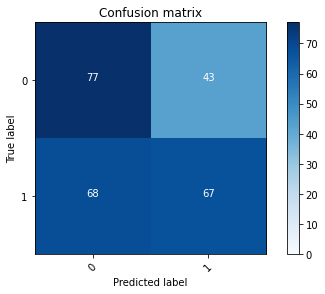

2022-08-20 17:06:50 - [Epoch Train: 79] loss: 0.0013, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 17:06:50 - [Epoch Valid: 79] loss: 2.9524, auc: 0.6012, acc: 0.5647, time: 14.00 s


 79%|███████████████████████████████▌        | 79/100 [1:27:59<23:16, 66.51s/it]

2022-08-20 17:06:50 - EPOCH: 80
2022-08-20 17:06:53 - Train Step 10/244, train_loss: 0.0008
2022-08-20 17:06:55 - Train Step 20/244, train_loss: 0.0004
2022-08-20 17:06:57 - Train Step 30/244, train_loss: 0.0091
2022-08-20 17:06:59 - Train Step 40/244, train_loss: 0.0068
2022-08-20 17:07:02 - Train Step 50/244, train_loss: 0.0055
2022-08-20 17:07:04 - Train Step 60/244, train_loss: 0.0046
2022-08-20 17:07:06 - Train Step 70/244, train_loss: 0.0039
2022-08-20 17:07:08 - Train Step 80/244, train_loss: 0.0034
2022-08-20 17:07:11 - Train Step 90/244, train_loss: 0.0031
2022-08-20 17:07:13 - Train Step 100/244, train_loss: 0.0028
2022-08-20 17:07:15 - Train Step 110/244, train_loss: 0.0025
2022-08-20 17:07:17 - Train Step 120/244, train_loss: 0.0023
2022-08-20 17:07:19 - Train Step 130/244, train_loss: 0.0022
2022-08-20 17:07:22 - Train Step 140/244, train_loss: 0.0020
2022-08-20 17:07:24 - Train Step 150/244, train_loss: 0.0019
2022-08-20 17:07:26 - Train Step 160/244, train_loss: 0.0018
2

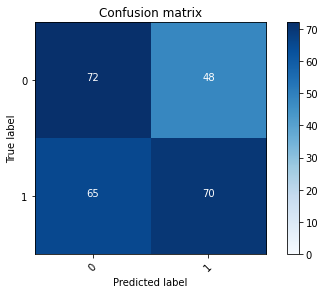

2022-08-20 17:08:00 - [Epoch Train: 80] loss: 0.0015, auc: 1.0000, acc: 0.9990, time: 55.00 s            
2022-08-20 17:08:00 - [Epoch Valid: 80] loss: 3.1156, auc: 0.6041, acc: 0.5569, time: 14.00 s


 80%|████████████████████████████████        | 80/100 [1:29:09<22:28, 67.44s/it]

2022-08-20 17:08:00 - EPOCH: 81
2022-08-20 17:08:02 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:08:04 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:08:07 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:08:09 - Train Step 40/244, train_loss: 0.0001
2022-08-20 17:08:11 - Train Step 50/244, train_loss: 0.0001
2022-08-20 17:08:13 - Train Step 60/244, train_loss: 0.0001
2022-08-20 17:08:15 - Train Step 70/244, train_loss: 0.0001
2022-08-20 17:08:18 - Train Step 80/244, train_loss: 0.0001
2022-08-20 17:08:20 - Train Step 90/244, train_loss: 0.0001
2022-08-20 17:08:22 - Train Step 100/244, train_loss: 0.0001
2022-08-20 17:08:24 - Train Step 110/244, train_loss: 0.0001
2022-08-20 17:08:27 - Train Step 120/244, train_loss: 0.0001
2022-08-20 17:08:29 - Train Step 130/244, train_loss: 0.0001
2022-08-20 17:08:31 - Train Step 140/244, train_loss: 0.0001
2022-08-20 17:08:33 - Train Step 150/244, train_loss: 0.0001
2022-08-20 17:08:35 - Train Step 160/244, train_loss: 0.0001
2

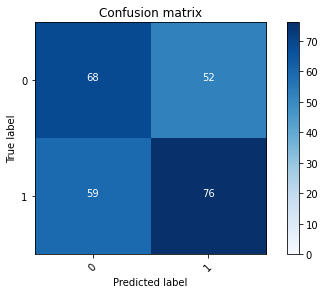

2022-08-20 17:09:09 - [Epoch Train: 81] loss: 0.0018, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 17:09:09 - [Epoch Valid: 81] loss: 3.2504, auc: 0.6093, acc: 0.5647, time: 14.00 s


 81%|████████████████████████████████▍       | 81/100 [1:30:18<21:30, 67.94s/it]

2022-08-20 17:09:09 - EPOCH: 82
2022-08-20 17:09:11 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:09:13 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:09:16 - Train Step 30/244, train_loss: 0.0000
2022-08-20 17:09:18 - Train Step 40/244, train_loss: 0.0000
2022-08-20 17:09:20 - Train Step 50/244, train_loss: 0.0000
2022-08-20 17:09:22 - Train Step 60/244, train_loss: 0.0001
2022-08-20 17:09:24 - Train Step 70/244, train_loss: 0.0001
2022-08-20 17:09:27 - Train Step 80/244, train_loss: 0.0001
2022-08-20 17:09:29 - Train Step 90/244, train_loss: 0.0018
2022-08-20 17:09:31 - Train Step 100/244, train_loss: 0.0016
2022-08-20 17:09:33 - Train Step 110/244, train_loss: 0.0014
2022-08-20 17:09:35 - Train Step 120/244, train_loss: 0.0013
2022-08-20 17:09:38 - Train Step 130/244, train_loss: 0.0012
2022-08-20 17:09:40 - Train Step 140/244, train_loss: 0.0011
2022-08-20 17:09:42 - Train Step 150/244, train_loss: 0.0040
2022-08-20 17:09:44 - Train Step 160/244, train_loss: 0.0038
2

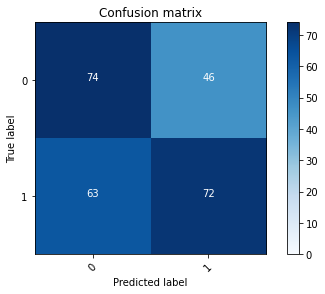

2022-08-20 17:10:17 - [Epoch Train: 82] loss: 0.0025, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 17:10:17 - [Epoch Valid: 82] loss: 3.2854, auc: 0.6008, acc: 0.5725, time: 14.00 s


 82%|████████████████████████████████▊       | 82/100 [1:31:27<20:26, 68.12s/it]

2022-08-20 17:10:17 - EPOCH: 83
2022-08-20 17:10:20 - Train Step 10/244, train_loss: 0.0001
2022-08-20 17:10:22 - Train Step 20/244, train_loss: 0.0001
2022-08-20 17:10:24 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:10:26 - Train Step 40/244, train_loss: 0.0001
2022-08-20 17:10:29 - Train Step 50/244, train_loss: 0.0004
2022-08-20 17:10:31 - Train Step 60/244, train_loss: 0.0003
2022-08-20 17:10:33 - Train Step 70/244, train_loss: 0.0003
2022-08-20 17:10:35 - Train Step 80/244, train_loss: 0.0003
2022-08-20 17:10:37 - Train Step 90/244, train_loss: 0.0002
2022-08-20 17:10:40 - Train Step 100/244, train_loss: 0.0002
2022-08-20 17:10:42 - Train Step 110/244, train_loss: 0.0002
2022-08-20 17:10:44 - Train Step 120/244, train_loss: 0.0002
2022-08-20 17:10:46 - Train Step 130/244, train_loss: 0.0002
2022-08-20 17:10:49 - Train Step 140/244, train_loss: 0.0002
2022-08-20 17:10:51 - Train Step 150/244, train_loss: 0.0002
2022-08-20 17:10:53 - Train Step 160/244, train_loss: 0.0002
2

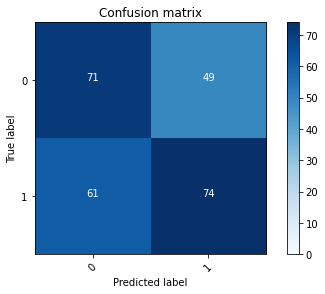

2022-08-20 17:11:26 - [Epoch Train: 83] loss: 0.0025, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 17:11:26 - [Epoch Valid: 83] loss: 3.0098, auc: 0.6007, acc: 0.5686, time: 14.00 s


 83%|█████████████████████████████████▏      | 83/100 [1:32:35<19:19, 68.20s/it]

2022-08-20 17:11:26 - EPOCH: 84
2022-08-20 17:11:28 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:11:30 - Train Step 20/244, train_loss: 0.0166
2022-08-20 17:11:33 - Train Step 30/244, train_loss: 0.0135
2022-08-20 17:11:35 - Train Step 40/244, train_loss: 0.0102
2022-08-20 17:11:37 - Train Step 50/244, train_loss: 0.0081
2022-08-20 17:11:39 - Train Step 60/244, train_loss: 0.0068
2022-08-20 17:11:42 - Train Step 70/244, train_loss: 0.0058
2022-08-20 17:11:44 - Train Step 80/244, train_loss: 0.0051
2022-08-20 17:11:46 - Train Step 90/244, train_loss: 0.0046
2022-08-20 17:11:48 - Train Step 100/244, train_loss: 0.0041
2022-08-20 17:11:50 - Train Step 110/244, train_loss: 0.0038
2022-08-20 17:11:53 - Train Step 120/244, train_loss: 0.0034
2022-08-20 17:11:55 - Train Step 130/244, train_loss: 0.0032
2022-08-20 17:11:57 - Train Step 140/244, train_loss: 0.0030
2022-08-20 17:11:59 - Train Step 150/244, train_loss: 0.0028
2022-08-20 17:12:01 - Train Step 160/244, train_loss: 0.0026
2

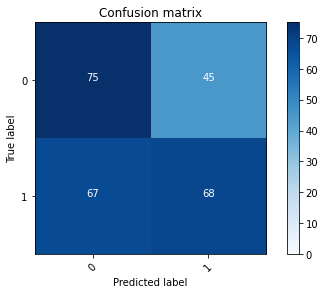

2022-08-20 17:12:34 - [Epoch Train: 84] loss: 0.0017, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 17:12:34 - [Epoch Valid: 84] loss: 3.1053, auc: 0.6042, acc: 0.5608, time: 14.00 s


 84%|█████████████████████████████████▌      | 84/100 [1:33:44<18:14, 68.38s/it]

2022-08-20 17:12:34 - EPOCH: 85
2022-08-20 17:12:37 - Train Step 10/244, train_loss: 0.0001
2022-08-20 17:12:39 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:12:41 - Train Step 30/244, train_loss: 0.0000
2022-08-20 17:12:44 - Train Step 40/244, train_loss: 0.0000
2022-08-20 17:12:46 - Train Step 50/244, train_loss: 0.0000
2022-08-20 17:12:48 - Train Step 60/244, train_loss: 0.0000
2022-08-20 17:12:50 - Train Step 70/244, train_loss: 0.0000
2022-08-20 17:12:52 - Train Step 80/244, train_loss: 0.0000
2022-08-20 17:12:54 - Train Step 90/244, train_loss: 0.0000
2022-08-20 17:12:56 - Train Step 100/244, train_loss: 0.0000
2022-08-20 17:12:59 - Train Step 110/244, train_loss: 0.0000
2022-08-20 17:13:01 - Train Step 120/244, train_loss: 0.0000
2022-08-20 17:13:03 - Train Step 130/244, train_loss: 0.0000
2022-08-20 17:13:05 - Train Step 140/244, train_loss: 0.0000
2022-08-20 17:13:07 - Train Step 150/244, train_loss: 0.0000
2022-08-20 17:13:09 - Train Step 160/244, train_loss: 0.0000
2

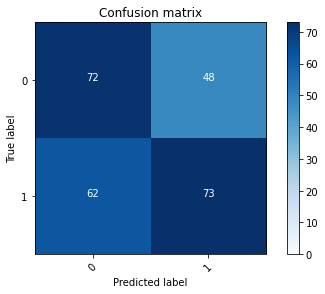

2022-08-20 17:13:40 - [Epoch Train: 85] loss: 0.0020, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 17:13:40 - [Epoch Valid: 85] loss: 3.1780, auc: 0.6072, acc: 0.5686, time: 13.00 s


 85%|██████████████████████████████████      | 85/100 [1:34:49<16:51, 67.45s/it]

2022-08-20 17:13:40 - EPOCH: 86
2022-08-20 17:13:42 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:13:44 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:13:47 - Train Step 30/244, train_loss: 0.0000
2022-08-20 17:13:49 - Train Step 40/244, train_loss: 0.0000
2022-08-20 17:13:51 - Train Step 50/244, train_loss: 0.0000
2022-08-20 17:13:53 - Train Step 60/244, train_loss: 0.0000
2022-08-20 17:13:56 - Train Step 70/244, train_loss: 0.0061
2022-08-20 17:13:58 - Train Step 80/244, train_loss: 0.0053
2022-08-20 17:14:00 - Train Step 90/244, train_loss: 0.0047
2022-08-20 17:14:02 - Train Step 100/244, train_loss: 0.0043
2022-08-20 17:14:04 - Train Step 110/244, train_loss: 0.0039
2022-08-20 17:14:06 - Train Step 120/244, train_loss: 0.0036
2022-08-20 17:14:09 - Train Step 130/244, train_loss: 0.0033
2022-08-20 17:14:11 - Train Step 140/244, train_loss: 0.0031
2022-08-20 17:14:13 - Train Step 150/244, train_loss: 0.0029
2022-08-20 17:14:15 - Train Step 160/244, train_loss: 0.0027
2

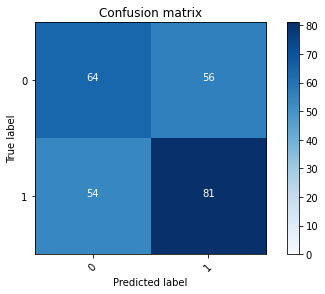

2022-08-20 17:14:47 - [Epoch Train: 86] loss: 0.0030, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 17:14:47 - [Epoch Valid: 86] loss: 2.9854, auc: 0.6111, acc: 0.5686, time: 13.00 s


 86%|██████████████████████████████████▍     | 86/100 [1:35:56<15:43, 67.36s/it]

2022-08-20 17:14:47 - EPOCH: 87
2022-08-20 17:14:49 - Train Step 10/244, train_loss: 0.0002
2022-08-20 17:14:52 - Train Step 20/244, train_loss: 0.0190
2022-08-20 17:14:54 - Train Step 30/244, train_loss: 0.0127
2022-08-20 17:14:56 - Train Step 40/244, train_loss: 0.0096
2022-08-20 17:14:58 - Train Step 50/244, train_loss: 0.0077
2022-08-20 17:15:00 - Train Step 60/244, train_loss: 0.0066
2022-08-20 17:15:03 - Train Step 70/244, train_loss: 0.0056
2022-08-20 17:15:05 - Train Step 80/244, train_loss: 0.0049
2022-08-20 17:15:07 - Train Step 90/244, train_loss: 0.0044
2022-08-20 17:15:09 - Train Step 100/244, train_loss: 0.0040
2022-08-20 17:15:11 - Train Step 110/244, train_loss: 0.0036
2022-08-20 17:15:13 - Train Step 120/244, train_loss: 0.0033
2022-08-20 17:15:15 - Train Step 130/244, train_loss: 0.0031
2022-08-20 17:15:18 - Train Step 140/244, train_loss: 0.0028
2022-08-20 17:15:20 - Train Step 150/244, train_loss: 0.0027
2022-08-20 17:15:22 - Train Step 160/244, train_loss: 0.0059
2

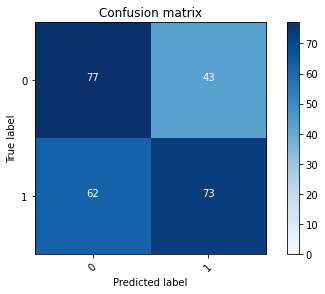

2022-08-20 17:15:55 - [Epoch Train: 87] loss: 0.0039, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 17:15:55 - [Epoch Valid: 87] loss: 3.3032, auc: 0.6134, acc: 0.5882, time: 14.00 s


 87%|██████████████████████████████████▊     | 87/100 [1:37:04<14:36, 67.45s/it]

2022-08-20 17:15:55 - EPOCH: 88
2022-08-20 17:15:57 - Train Step 10/244, train_loss: 0.0134
2022-08-20 17:15:59 - Train Step 20/244, train_loss: 0.0067
2022-08-20 17:16:01 - Train Step 30/244, train_loss: 0.0045
2022-08-20 17:16:03 - Train Step 40/244, train_loss: 0.0035
2022-08-20 17:16:05 - Train Step 50/244, train_loss: 0.0028
2022-08-20 17:16:07 - Train Step 60/244, train_loss: 0.0023
2022-08-20 17:16:09 - Train Step 70/244, train_loss: 0.0020
2022-08-20 17:16:11 - Train Step 80/244, train_loss: 0.0018
2022-08-20 17:16:13 - Train Step 90/244, train_loss: 0.0016
2022-08-20 17:16:15 - Train Step 100/244, train_loss: 0.0014
2022-08-20 17:16:17 - Train Step 110/244, train_loss: 0.0013
2022-08-20 17:16:19 - Train Step 120/244, train_loss: 0.0012
2022-08-20 17:16:21 - Train Step 130/244, train_loss: 0.0011
2022-08-20 17:16:23 - Train Step 140/244, train_loss: 0.0022
2022-08-20 17:16:25 - Train Step 150/244, train_loss: 0.0021
2022-08-20 17:16:27 - Train Step 160/244, train_loss: 0.0020
2

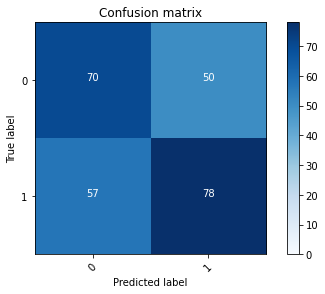

2022-08-20 17:16:58 - [Epoch Train: 88] loss: 0.0013, auc: 1.0000, acc: 0.9990, time: 49.00 s            
2022-08-20 17:16:58 - [Epoch Valid: 88] loss: 3.1098, auc: 0.6120, acc: 0.5804, time: 13.00 s


 88%|███████████████████████████████████▏    | 88/100 [1:38:08<13:16, 66.37s/it]

2022-08-20 17:16:58 - EPOCH: 89
2022-08-20 17:17:01 - Train Step 10/244, train_loss: 0.0001
2022-08-20 17:17:03 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:17:05 - Train Step 30/244, train_loss: 0.0074
2022-08-20 17:17:07 - Train Step 40/244, train_loss: 0.0056
2022-08-20 17:17:10 - Train Step 50/244, train_loss: 0.0044
2022-08-20 17:17:12 - Train Step 60/244, train_loss: 0.0037
2022-08-20 17:17:14 - Train Step 70/244, train_loss: 0.0032
2022-08-20 17:17:16 - Train Step 80/244, train_loss: 0.0028
2022-08-20 17:17:18 - Train Step 90/244, train_loss: 0.0025
2022-08-20 17:17:21 - Train Step 100/244, train_loss: 0.0023
2022-08-20 17:17:23 - Train Step 110/244, train_loss: 0.0069
2022-08-20 17:17:25 - Train Step 120/244, train_loss: 0.0063
2022-08-20 17:17:27 - Train Step 130/244, train_loss: 0.0058
2022-08-20 17:17:29 - Train Step 140/244, train_loss: 0.0054
2022-08-20 17:17:31 - Train Step 150/244, train_loss: 0.0050
2022-08-20 17:17:34 - Train Step 160/244, train_loss: 0.0047
2

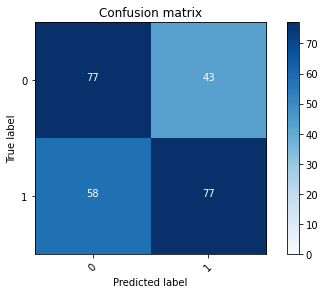

2022-08-20 17:18:07 - [Epoch Train: 89] loss: 0.0031, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 17:18:07 - [Epoch Valid: 89] loss: 3.0954, auc: 0.6112, acc: 0.6039, time: 14.00 s


 89%|███████████████████████████████████▌    | 89/100 [1:39:16<12:16, 66.98s/it]

2022-08-20 17:18:07 - EPOCH: 90
2022-08-20 17:18:09 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:18:11 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:18:13 - Train Step 30/244, train_loss: 0.0000
2022-08-20 17:18:15 - Train Step 40/244, train_loss: 0.0000
2022-08-20 17:18:17 - Train Step 50/244, train_loss: 0.0000
2022-08-20 17:18:19 - Train Step 60/244, train_loss: 0.0020
2022-08-20 17:18:21 - Train Step 70/244, train_loss: 0.0017
2022-08-20 17:18:23 - Train Step 80/244, train_loss: 0.0015
2022-08-20 17:18:25 - Train Step 90/244, train_loss: 0.0014
2022-08-20 17:18:27 - Train Step 100/244, train_loss: 0.0012
2022-08-20 17:18:29 - Train Step 110/244, train_loss: 0.0011
2022-08-20 17:18:32 - Train Step 120/244, train_loss: 0.0010
2022-08-20 17:18:34 - Train Step 130/244, train_loss: 0.0031
2022-08-20 17:18:36 - Train Step 140/244, train_loss: 0.0029
2022-08-20 17:18:38 - Train Step 150/244, train_loss: 0.0027
2022-08-20 17:18:40 - Train Step 160/244, train_loss: 0.0025
2

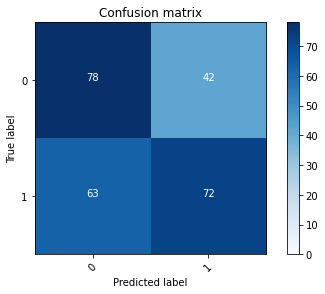

2022-08-20 17:19:11 - [Epoch Train: 90] loss: 0.0017, auc: 1.0000, acc: 0.9990, time: 49.00 s            
2022-08-20 17:19:11 - [Epoch Valid: 90] loss: 3.0790, auc: 0.6147, acc: 0.5882, time: 14.00 s


 90%|████████████████████████████████████    | 90/100 [1:40:21<11:02, 66.21s/it]

2022-08-20 17:19:11 - EPOCH: 91
2022-08-20 17:19:14 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:19:16 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:19:17 - Train Step 30/244, train_loss: 0.0000
2022-08-20 17:19:20 - Train Step 40/244, train_loss: 0.0001
2022-08-20 17:19:21 - Train Step 50/244, train_loss: 0.0000
2022-08-20 17:19:24 - Train Step 60/244, train_loss: 0.0000
2022-08-20 17:19:26 - Train Step 70/244, train_loss: 0.0013
2022-08-20 17:19:28 - Train Step 80/244, train_loss: 0.0011
2022-08-20 17:19:30 - Train Step 90/244, train_loss: 0.0010
2022-08-20 17:19:32 - Train Step 100/244, train_loss: 0.0054
2022-08-20 17:19:34 - Train Step 110/244, train_loss: 0.0049
2022-08-20 17:19:36 - Train Step 120/244, train_loss: 0.0045
2022-08-20 17:19:38 - Train Step 130/244, train_loss: 0.0041
2022-08-20 17:19:40 - Train Step 140/244, train_loss: 0.0038
2022-08-20 17:19:42 - Train Step 150/244, train_loss: 0.0036
2022-08-20 17:19:44 - Train Step 160/244, train_loss: 0.0034
2

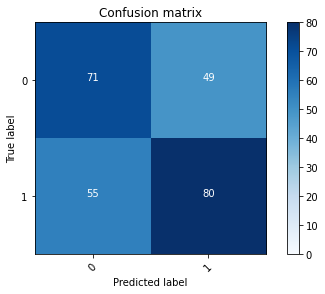

2022-08-20 17:20:15 - [Epoch Train: 91] loss: 0.0022, auc: 1.0000, acc: 0.9990, time: 49.00 s            
2022-08-20 17:20:15 - [Epoch Valid: 91] loss: 2.8397, auc: 0.6165, acc: 0.5922, time: 14.00 s


 91%|████████████████████████████████████▍   | 91/100 [1:41:24<09:48, 65.43s/it]

2022-08-20 17:20:15 - EPOCH: 92
2022-08-20 17:20:17 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:20:20 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:20:22 - Train Step 30/244, train_loss: 0.0000
2022-08-20 17:20:24 - Train Step 40/244, train_loss: 0.0064
2022-08-20 17:20:26 - Train Step 50/244, train_loss: 0.0051
2022-08-20 17:20:28 - Train Step 60/244, train_loss: 0.0043
2022-08-20 17:20:31 - Train Step 70/244, train_loss: 0.0037
2022-08-20 17:20:33 - Train Step 80/244, train_loss: 0.0032
2022-08-20 17:20:35 - Train Step 90/244, train_loss: 0.0029
2022-08-20 17:20:37 - Train Step 100/244, train_loss: 0.0026
2022-08-20 17:20:40 - Train Step 110/244, train_loss: 0.0023
2022-08-20 17:20:42 - Train Step 120/244, train_loss: 0.0041
2022-08-20 17:20:44 - Train Step 130/244, train_loss: 0.0038
2022-08-20 17:20:46 - Train Step 140/244, train_loss: 0.0035
2022-08-20 17:20:48 - Train Step 150/244, train_loss: 0.0033
2022-08-20 17:20:51 - Train Step 160/244, train_loss: 0.0031
2

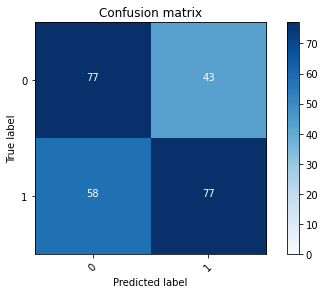

2022-08-20 17:21:23 - [Epoch Train: 92] loss: 0.0021, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 17:21:23 - [Epoch Valid: 92] loss: 3.0426, auc: 0.6166, acc: 0.6039, time: 13.00 s


 92%|████████████████████████████████████▊   | 92/100 [1:42:32<08:49, 66.14s/it]

2022-08-20 17:21:23 - EPOCH: 93
2022-08-20 17:21:25 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:21:27 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:21:30 - Train Step 30/244, train_loss: 0.0000
2022-08-20 17:21:32 - Train Step 40/244, train_loss: 0.0000
2022-08-20 17:21:34 - Train Step 50/244, train_loss: 0.0000
2022-08-20 17:21:36 - Train Step 60/244, train_loss: 0.0000
2022-08-20 17:21:38 - Train Step 70/244, train_loss: 0.0000
2022-08-20 17:21:41 - Train Step 80/244, train_loss: 0.0000
2022-08-20 17:21:43 - Train Step 90/244, train_loss: 0.0000
2022-08-20 17:21:45 - Train Step 100/244, train_loss: 0.0000
2022-08-20 17:21:47 - Train Step 110/244, train_loss: 0.0000
2022-08-20 17:21:49 - Train Step 120/244, train_loss: 0.0000
2022-08-20 17:21:52 - Train Step 130/244, train_loss: 0.0000
2022-08-20 17:21:54 - Train Step 140/244, train_loss: 0.0017
2022-08-20 17:21:56 - Train Step 150/244, train_loss: 0.0016
2022-08-20 17:21:58 - Train Step 160/244, train_loss: 0.0015
2

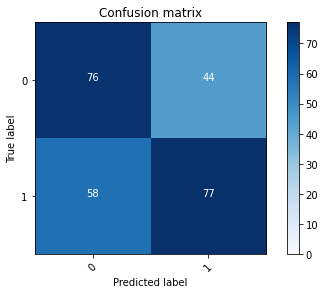

2022-08-20 17:22:31 - [Epoch Train: 93] loss: 0.0010, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 17:22:31 - [Epoch Valid: 93] loss: 3.2284, auc: 0.6166, acc: 0.6000, time: 14.00 s


 93%|█████████████████████████████████████▏  | 93/100 [1:43:41<07:48, 66.92s/it]

2022-08-20 17:22:31 - EPOCH: 94
2022-08-20 17:22:34 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:22:36 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:22:38 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:22:41 - Train Step 40/244, train_loss: 0.0000
2022-08-20 17:22:43 - Train Step 50/244, train_loss: 0.0035
2022-08-20 17:22:45 - Train Step 60/244, train_loss: 0.0029
2022-08-20 17:22:47 - Train Step 70/244, train_loss: 0.0025
2022-08-20 17:22:50 - Train Step 80/244, train_loss: 0.0022
2022-08-20 17:22:52 - Train Step 90/244, train_loss: 0.0020
2022-08-20 17:22:54 - Train Step 100/244, train_loss: 0.0018
2022-08-20 17:22:56 - Train Step 110/244, train_loss: 0.0016
2022-08-20 17:22:58 - Train Step 120/244, train_loss: 0.0015
2022-08-20 17:23:01 - Train Step 130/244, train_loss: 0.0014
2022-08-20 17:23:03 - Train Step 140/244, train_loss: 0.0013
2022-08-20 17:23:05 - Train Step 150/244, train_loss: 0.0012
2022-08-20 17:23:08 - Train Step 160/244, train_loss: 0.0011
2

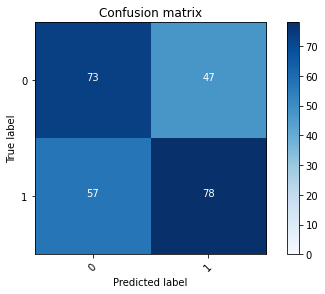

2022-08-20 17:23:40 - [Epoch Train: 94] loss: 0.0032, auc: 1.0000, acc: 0.9979, time: 55.00 s            
2022-08-20 17:23:40 - [Epoch Valid: 94] loss: 3.2000, auc: 0.6147, acc: 0.5922, time: 13.00 s


 94%|█████████████████████████████████████▌  | 94/100 [1:44:50<06:44, 67.48s/it]

2022-08-20 17:23:40 - EPOCH: 95
2022-08-20 17:23:43 - Train Step 10/244, train_loss: 0.0001
2022-08-20 17:23:45 - Train Step 20/244, train_loss: 0.0001
2022-08-20 17:23:47 - Train Step 30/244, train_loss: 0.0002
2022-08-20 17:23:49 - Train Step 40/244, train_loss: 0.0001
2022-08-20 17:23:51 - Train Step 50/244, train_loss: 0.0002
2022-08-20 17:23:54 - Train Step 60/244, train_loss: 0.0001
2022-08-20 17:23:56 - Train Step 70/244, train_loss: 0.0001
2022-08-20 17:23:58 - Train Step 80/244, train_loss: 0.0001
2022-08-20 17:24:00 - Train Step 90/244, train_loss: 0.0001
2022-08-20 17:24:02 - Train Step 100/244, train_loss: 0.0001
2022-08-20 17:24:05 - Train Step 110/244, train_loss: 0.0001
2022-08-20 17:24:07 - Train Step 120/244, train_loss: 0.0001
2022-08-20 17:24:09 - Train Step 130/244, train_loss: 0.0001
2022-08-20 17:24:11 - Train Step 140/244, train_loss: 0.0001
2022-08-20 17:24:14 - Train Step 150/244, train_loss: 0.0001
2022-08-20 17:24:16 - Train Step 160/244, train_loss: 0.0008
2

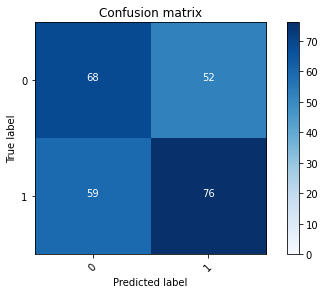

2022-08-20 17:24:49 - [Epoch Train: 95] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 17:24:49 - [Epoch Valid: 95] loss: 3.2802, auc: 0.6203, acc: 0.5647, time: 14.00 s


 95%|██████████████████████████████████████  | 95/100 [1:45:58<05:39, 67.85s/it]

2022-08-20 17:24:49 - EPOCH: 96
2022-08-20 17:24:51 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:24:54 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:24:56 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:24:58 - Train Step 40/244, train_loss: 0.0000
2022-08-20 17:25:00 - Train Step 50/244, train_loss: 0.0044
2022-08-20 17:25:02 - Train Step 60/244, train_loss: 0.0037
2022-08-20 17:25:05 - Train Step 70/244, train_loss: 0.0032
2022-08-20 17:25:07 - Train Step 80/244, train_loss: 0.0028
2022-08-20 17:25:09 - Train Step 90/244, train_loss: 0.0025
2022-08-20 17:25:11 - Train Step 100/244, train_loss: 0.0022
2022-08-20 17:25:13 - Train Step 110/244, train_loss: 0.0020
2022-08-20 17:25:16 - Train Step 120/244, train_loss: 0.0019
2022-08-20 17:25:18 - Train Step 130/244, train_loss: 0.0017
2022-08-20 17:25:20 - Train Step 140/244, train_loss: 0.0016
2022-08-20 17:25:22 - Train Step 150/244, train_loss: 0.0044
2022-08-20 17:25:24 - Train Step 160/244, train_loss: 0.0041
2

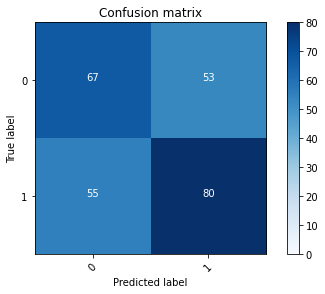

2022-08-20 17:25:56 - [Epoch Train: 96] loss: 0.0027, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 17:25:56 - [Epoch Valid: 96] loss: 3.1907, auc: 0.6264, acc: 0.5765, time: 13.00 s


 96%|██████████████████████████████████████▍ | 96/100 [1:47:05<04:30, 67.59s/it]

2022-08-20 17:25:56 - EPOCH: 97
2022-08-20 17:25:58 - Train Step 10/244, train_loss: 0.0001
2022-08-20 17:26:01 - Train Step 20/244, train_loss: 0.0001
2022-08-20 17:26:03 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:26:05 - Train Step 40/244, train_loss: 0.0000
2022-08-20 17:26:07 - Train Step 50/244, train_loss: 0.0000
2022-08-20 17:26:09 - Train Step 60/244, train_loss: 0.0001
2022-08-20 17:26:12 - Train Step 70/244, train_loss: 0.0000
2022-08-20 17:26:14 - Train Step 80/244, train_loss: 0.0000
2022-08-20 17:26:16 - Train Step 90/244, train_loss: 0.0000
2022-08-20 17:26:18 - Train Step 100/244, train_loss: 0.0000
2022-08-20 17:26:21 - Train Step 110/244, train_loss: 0.0000
2022-08-20 17:26:23 - Train Step 120/244, train_loss: 0.0000
2022-08-20 17:26:25 - Train Step 130/244, train_loss: 0.0000
2022-08-20 17:26:27 - Train Step 140/244, train_loss: 0.0000
2022-08-20 17:26:30 - Train Step 150/244, train_loss: 0.0000
2022-08-20 17:26:32 - Train Step 160/244, train_loss: 0.0000
2

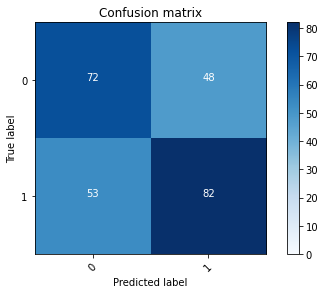

2022-08-20 17:27:03 - [Epoch Train: 97] loss: 0.0015, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 17:27:03 - [Epoch Valid: 97] loss: 3.2115, auc: 0.6246, acc: 0.6039, time: 13.00 s


 97%|██████████████████████████████████████▊ | 97/100 [1:48:13<03:22, 67.56s/it]

2022-08-20 17:27:03 - EPOCH: 98
2022-08-20 17:27:06 - Train Step 10/244, train_loss: 0.0001
2022-08-20 17:27:08 - Train Step 20/244, train_loss: 0.0001
2022-08-20 17:27:10 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:27:12 - Train Step 40/244, train_loss: 0.0000
2022-08-20 17:27:14 - Train Step 50/244, train_loss: 0.0013
2022-08-20 17:27:16 - Train Step 60/244, train_loss: 0.0011
2022-08-20 17:27:18 - Train Step 70/244, train_loss: 0.0010
2022-08-20 17:27:20 - Train Step 80/244, train_loss: 0.0008
2022-08-20 17:27:22 - Train Step 90/244, train_loss: 0.0007
2022-08-20 17:27:24 - Train Step 100/244, train_loss: 0.0083
2022-08-20 17:27:26 - Train Step 110/244, train_loss: 0.0076
2022-08-20 17:27:28 - Train Step 120/244, train_loss: 0.0069
2022-08-20 17:27:30 - Train Step 130/244, train_loss: 0.0064
2022-08-20 17:27:32 - Train Step 140/244, train_loss: 0.0060
2022-08-20 17:27:34 - Train Step 150/244, train_loss: 0.0056
2022-08-20 17:27:36 - Train Step 160/244, train_loss: 0.0052
2

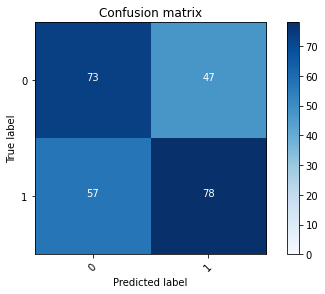

2022-08-20 17:28:08 - [Epoch Train: 98] loss: 0.0034, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 17:28:08 - [Epoch Valid: 98] loss: 2.9030, auc: 0.6256, acc: 0.5922, time: 14.00 s


 98%|███████████████████████████████████████▏| 98/100 [1:49:18<02:13, 66.80s/it]

2022-08-20 17:28:08 - EPOCH: 99
2022-08-20 17:28:11 - Train Step 10/244, train_loss: 0.0000
2022-08-20 17:28:13 - Train Step 20/244, train_loss: 0.0000
2022-08-20 17:28:15 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:28:18 - Train Step 40/244, train_loss: 0.0001
2022-08-20 17:28:20 - Train Step 50/244, train_loss: 0.0001
2022-08-20 17:28:22 - Train Step 60/244, train_loss: 0.0001
2022-08-20 17:28:24 - Train Step 70/244, train_loss: 0.0001
2022-08-20 17:28:26 - Train Step 80/244, train_loss: 0.0001
2022-08-20 17:28:29 - Train Step 90/244, train_loss: 0.0001
2022-08-20 17:28:31 - Train Step 100/244, train_loss: 0.0019
2022-08-20 17:28:33 - Train Step 110/244, train_loss: 0.0017
2022-08-20 17:28:35 - Train Step 120/244, train_loss: 0.0016
2022-08-20 17:28:37 - Train Step 130/244, train_loss: 0.0015
2022-08-20 17:28:40 - Train Step 140/244, train_loss: 0.0014
2022-08-20 17:28:42 - Train Step 150/244, train_loss: 0.0013
2022-08-20 17:28:44 - Train Step 160/244, train_loss: 0.0024
2

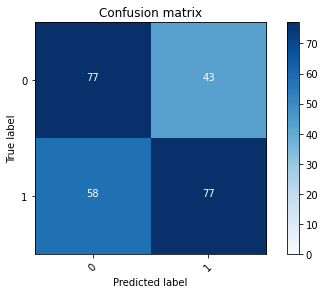

2022-08-20 17:29:16 - [Epoch Train: 99] loss: 0.0016, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 17:29:16 - [Epoch Valid: 99] loss: 3.0274, auc: 0.6250, acc: 0.6039, time: 13.00 s


 99%|███████████████████████████████████████▌| 99/100 [1:50:25<01:07, 67.04s/it]

2022-08-20 17:29:16 - EPOCH: 100
2022-08-20 17:29:18 - Train Step 10/244, train_loss: 0.0001
2022-08-20 17:29:21 - Train Step 20/244, train_loss: 0.0001
2022-08-20 17:29:23 - Train Step 30/244, train_loss: 0.0001
2022-08-20 17:29:25 - Train Step 40/244, train_loss: 0.0001
2022-08-20 17:29:27 - Train Step 50/244, train_loss: 0.0062
2022-08-20 17:29:29 - Train Step 60/244, train_loss: 0.0053
2022-08-20 17:29:31 - Train Step 70/244, train_loss: 0.0046
2022-08-20 17:29:34 - Train Step 80/244, train_loss: 0.0040
2022-08-20 17:29:36 - Train Step 90/244, train_loss: 0.0036
2022-08-20 17:29:38 - Train Step 100/244, train_loss: 0.0032
2022-08-20 17:29:40 - Train Step 110/244, train_loss: 0.0029
2022-08-20 17:29:42 - Train Step 120/244, train_loss: 0.0027
2022-08-20 17:29:44 - Train Step 130/244, train_loss: 0.0025
2022-08-20 17:29:47 - Train Step 140/244, train_loss: 0.0023
2022-08-20 17:29:49 - Train Step 150/244, train_loss: 0.0022
2022-08-20 17:29:51 - Train Step 160/244, train_loss: 0.0020


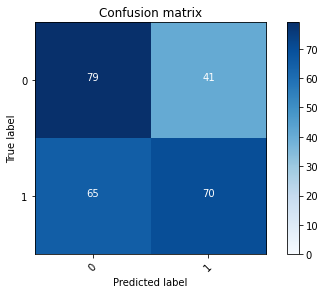

2022-08-20 17:30:24 - [Epoch Train: 100] loss: 0.0026, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 17:30:24 - [Epoch Valid: 100] loss: 2.9392, auc: 0.6238, acc: 0.5843, time: 14.00 s


100%|███████████████████████████████████████| 100/100 [1:51:33<00:00, 66.94s/it]

-- FOLD N:2
Train origin: mn
Type: KLF
2022-08-20 17:30:24 - (M0) Train/Val datasets size: 270
2022-08-20 17:30:24 - (M1) Train/Val datasets size: 303
2022-08-20 17:30:24 - (N0) Train/Val datasets size: 170
2022-08-20 17:30:24 - (N1) Train/Val datasets size: 121
2022-08-20 17:30:24 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 17:30:24 - (MN0) Train/Val datasets size: 540
2022-08-20 17:30:24 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-20 17:30:24 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9dee9bb50>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d8d52820>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d909bbb0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d8559df0>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d82c70d0>, 'mn_dataset_1': <utils.da

[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 255, 256, 257, 258, 259, 260, 262, 263, 264, 265, 266, 267, 268, 269, 270, 2

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 25

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d8d1da90>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8d1d5b0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d853c250>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9ca0b94c0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8a367f0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9dee9ba30>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d8d99fa0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8d99eb0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9dee9ba60>]}}
2022-08-20 17:37:56 - Using CUDA...
KLF
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin'

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-20 17:37:56 - EPOCH: 1
2022-08-20 17:37:59 - Train Step 10/246, train_loss: 0.6950
2022-08-20 17:38:01 - Train Step 20/246, train_loss: 0.6994
2022-08-20 17:38:03 - Train Step 30/246, train_loss: 0.7001
2022-08-20 17:38:05 - Train Step 40/246, train_loss: 0.6975
2022-08-20 17:38:08 - Train Step 50/246, train_loss: 0.6916
2022-08-20 17:38:10 - Train Step 60/246, train_loss: 0.6860
2022-08-20 17:38:12 - Train Step 70/246, train_loss: 0.6888
2022-08-20 17:38:14 - Train Step 80/246, train_loss: 0.6857
2022-08-20 17:38:16 - Train Step 90/246, train_loss: 0.6903
2022-08-20 17:38:19 - Train Step 100/246, train_loss: 0.6922
2022-08-20 17:38:21 - Train Step 110/246, train_loss: 0.6921
2022-08-20 17:38:23 - Train Step 120/246, train_loss: 0.6926
2022-08-20 17:38:25 - Train Step 130/246, train_loss: 0.6919
2022-08-20 17:38:27 - Train Step 140/246, train_loss: 0.6897
2022-08-20 17:38:30 - Train Step 150/246, train_loss: 0.6896
2022-08-20 17:38:32 - Train Step 160/246, train_loss: 0.6921
20

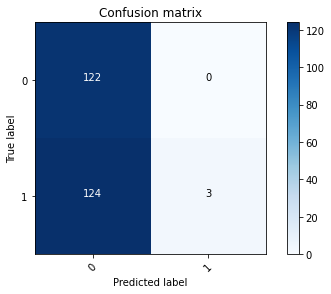

2022-08-20 17:39:05 - [Epoch Train: 1] loss: 0.6932, auc: 0.5365, acc: 0.5102, time: 54.00 s            
2022-08-20 17:39:05 - [Epoch Valid: 1] loss: 0.6889, auc: 0.5521, acc: 0.5020, time: 14.00 s
2022-08-20 17:39:05 - acc improved from 0.0000 to 0.5020. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e1-loss0.689-acc0.502-auc0.552.pth'


  1%|▍                                        | 1/100 [01:08<1:52:57, 68.46s/it]

2022-08-20 17:39:05 - EPOCH: 2
2022-08-20 17:39:07 - Train Step 10/246, train_loss: 0.6659
2022-08-20 17:39:09 - Train Step 20/246, train_loss: 0.6558
2022-08-20 17:39:11 - Train Step 30/246, train_loss: 0.6493
2022-08-20 17:39:13 - Train Step 40/246, train_loss: 0.6452
2022-08-20 17:39:15 - Train Step 50/246, train_loss: 0.6531
2022-08-20 17:39:17 - Train Step 60/246, train_loss: 0.6481
2022-08-20 17:39:20 - Train Step 70/246, train_loss: 0.6470
2022-08-20 17:39:22 - Train Step 80/246, train_loss: 0.6448
2022-08-20 17:39:24 - Train Step 90/246, train_loss: 0.6408
2022-08-20 17:39:26 - Train Step 100/246, train_loss: 0.6407
2022-08-20 17:39:28 - Train Step 110/246, train_loss: 0.6381
2022-08-20 17:39:30 - Train Step 120/246, train_loss: 0.6350
2022-08-20 17:39:32 - Train Step 130/246, train_loss: 0.6295
2022-08-20 17:39:34 - Train Step 140/246, train_loss: 0.6269
2022-08-20 17:39:37 - Train Step 150/246, train_loss: 0.6291
2022-08-20 17:39:39 - Train Step 160/246, train_loss: 0.6282
20

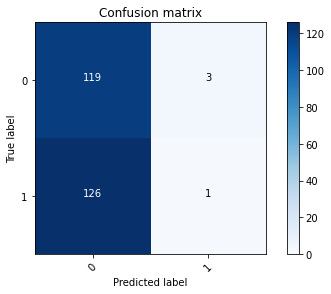

2022-08-20 17:40:11 - [Epoch Train: 2] loss: 0.6176, auc: 0.7640, acc: 0.5894, time: 52.00 s            
2022-08-20 17:40:11 - [Epoch Valid: 2] loss: 0.7267, auc: 0.5753, acc: 0.4819, time: 14.00 s


  2%|▊                                        | 2/100 [02:14<1:49:54, 67.29s/it]

2022-08-20 17:40:11 - EPOCH: 3
2022-08-20 17:40:14 - Train Step 10/246, train_loss: 0.5518
2022-08-20 17:40:16 - Train Step 20/246, train_loss: 0.5311
2022-08-20 17:40:18 - Train Step 30/246, train_loss: 0.5237
2022-08-20 17:40:20 - Train Step 40/246, train_loss: 0.5248
2022-08-20 17:40:22 - Train Step 50/246, train_loss: 0.5038
2022-08-20 17:40:25 - Train Step 60/246, train_loss: 0.4964
2022-08-20 17:40:27 - Train Step 70/246, train_loss: 0.4969
2022-08-20 17:40:29 - Train Step 80/246, train_loss: 0.4913
2022-08-20 17:40:31 - Train Step 90/246, train_loss: 0.4869
2022-08-20 17:40:34 - Train Step 100/246, train_loss: 0.4800
2022-08-20 17:40:36 - Train Step 110/246, train_loss: 0.4853
2022-08-20 17:40:38 - Train Step 120/246, train_loss: 0.4866
2022-08-20 17:40:40 - Train Step 130/246, train_loss: 0.4849
2022-08-20 17:40:42 - Train Step 140/246, train_loss: 0.4844
2022-08-20 17:40:45 - Train Step 150/246, train_loss: 0.4880
2022-08-20 17:40:47 - Train Step 160/246, train_loss: 0.4905
20

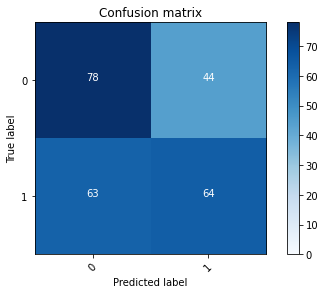

2022-08-20 17:41:19 - [Epoch Train: 3] loss: 0.4643, auc: 0.9086, acc: 0.7591, time: 54.00 s            
2022-08-20 17:41:19 - [Epoch Valid: 3] loss: 0.7658, auc: 0.5828, acc: 0.5703, time: 14.00 s
2022-08-20 17:41:19 - acc improved from 0.5020 to 0.5703. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e3-loss0.766-acc0.570-auc0.583.pth'


  3%|█▏                                       | 3/100 [03:23<1:49:29, 67.73s/it]

2022-08-20 17:41:19 - EPOCH: 4
2022-08-20 17:41:22 - Train Step 10/246, train_loss: 0.2975
2022-08-20 17:41:24 - Train Step 20/246, train_loss: 0.3033
2022-08-20 17:41:26 - Train Step 30/246, train_loss: 0.3051
2022-08-20 17:41:29 - Train Step 40/246, train_loss: 0.3130
2022-08-20 17:41:31 - Train Step 50/246, train_loss: 0.3115
2022-08-20 17:41:33 - Train Step 60/246, train_loss: 0.2997
2022-08-20 17:41:35 - Train Step 70/246, train_loss: 0.3076
2022-08-20 17:41:37 - Train Step 80/246, train_loss: 0.2975
2022-08-20 17:41:40 - Train Step 90/246, train_loss: 0.2954
2022-08-20 17:41:42 - Train Step 100/246, train_loss: 0.2980
2022-08-20 17:41:44 - Train Step 110/246, train_loss: 0.2968
2022-08-20 17:41:46 - Train Step 120/246, train_loss: 0.2958
2022-08-20 17:41:48 - Train Step 130/246, train_loss: 0.2941
2022-08-20 17:41:50 - Train Step 140/246, train_loss: 0.2936
2022-08-20 17:41:52 - Train Step 150/246, train_loss: 0.2928
2022-08-20 17:41:55 - Train Step 160/246, train_loss: 0.2890
20

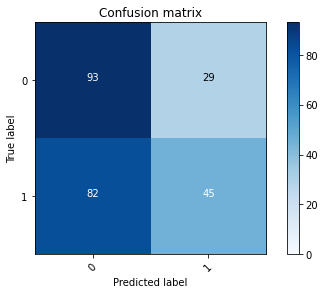

2022-08-20 17:42:26 - [Epoch Train: 4] loss: 0.2942, auc: 0.9650, acc: 0.8933, time: 54.00 s            
2022-08-20 17:42:26 - [Epoch Valid: 4] loss: 0.8795, auc: 0.5900, acc: 0.5542, time: 12.00 s


  4%|█▋                                       | 4/100 [04:30<1:47:55, 67.45s/it]

2022-08-20 17:42:26 - EPOCH: 5
2022-08-20 17:42:29 - Train Step 10/246, train_loss: 0.1941
2022-08-20 17:42:31 - Train Step 20/246, train_loss: 0.1636
2022-08-20 17:42:33 - Train Step 30/246, train_loss: 0.1576
2022-08-20 17:42:35 - Train Step 40/246, train_loss: 0.1572
2022-08-20 17:42:38 - Train Step 50/246, train_loss: 0.1654
2022-08-20 17:42:40 - Train Step 60/246, train_loss: 0.1590
2022-08-20 17:42:42 - Train Step 70/246, train_loss: 0.1660
2022-08-20 17:42:44 - Train Step 80/246, train_loss: 0.1612
2022-08-20 17:42:46 - Train Step 90/246, train_loss: 0.1596
2022-08-20 17:42:48 - Train Step 100/246, train_loss: 0.1622
2022-08-20 17:42:51 - Train Step 110/246, train_loss: 0.1580
2022-08-20 17:42:53 - Train Step 120/246, train_loss: 0.1572
2022-08-20 17:42:55 - Train Step 130/246, train_loss: 0.1530
2022-08-20 17:42:57 - Train Step 140/246, train_loss: 0.1506
2022-08-20 17:43:00 - Train Step 150/246, train_loss: 0.1478
2022-08-20 17:43:02 - Train Step 160/246, train_loss: 0.1479
20

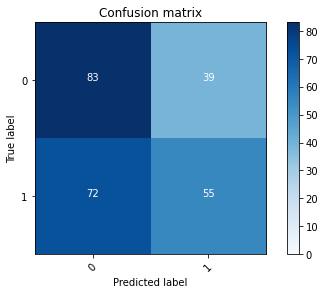

2022-08-20 17:43:34 - [Epoch Train: 5] loss: 0.1506, auc: 0.9949, acc: 0.9563, time: 53.00 s            
2022-08-20 17:43:34 - [Epoch Valid: 5] loss: 1.0013, auc: 0.5900, acc: 0.5542, time: 14.00 s


  5%|██                                       | 5/100 [05:38<1:47:05, 67.63s/it]

2022-08-20 17:43:34 - EPOCH: 6
2022-08-20 17:43:37 - Train Step 10/246, train_loss: 0.0900
2022-08-20 17:43:39 - Train Step 20/246, train_loss: 0.0818
2022-08-20 17:43:41 - Train Step 30/246, train_loss: 0.0866
2022-08-20 17:43:43 - Train Step 40/246, train_loss: 0.0838
2022-08-20 17:43:45 - Train Step 50/246, train_loss: 0.0795
2022-08-20 17:43:47 - Train Step 60/246, train_loss: 0.0798
2022-08-20 17:43:49 - Train Step 70/246, train_loss: 0.0806
2022-08-20 17:43:51 - Train Step 80/246, train_loss: 0.0825
2022-08-20 17:43:53 - Train Step 90/246, train_loss: 0.0799
2022-08-20 17:43:55 - Train Step 100/246, train_loss: 0.0787
2022-08-20 17:43:57 - Train Step 110/246, train_loss: 0.0782
2022-08-20 17:43:59 - Train Step 120/246, train_loss: 0.0785
2022-08-20 17:44:01 - Train Step 130/246, train_loss: 0.0802
2022-08-20 17:44:03 - Train Step 140/246, train_loss: 0.0822
2022-08-20 17:44:05 - Train Step 150/246, train_loss: 0.0802
2022-08-20 17:44:07 - Train Step 160/246, train_loss: 0.0789
20

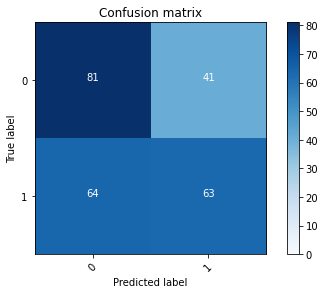

2022-08-20 17:44:39 - [Epoch Train: 6] loss: 0.0745, auc: 0.9997, acc: 0.9858, time: 50.00 s            
2022-08-20 17:44:39 - [Epoch Valid: 6] loss: 1.1376, auc: 0.5950, acc: 0.5783, time: 14.00 s
2022-08-20 17:44:39 - acc improved from 0.5703 to 0.5783. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e6-loss1.138-acc0.578-auc0.595.pth'


  6%|██▍                                      | 6/100 [06:43<1:44:30, 66.71s/it]

2022-08-20 17:44:39 - EPOCH: 7
2022-08-20 17:44:42 - Train Step 10/246, train_loss: 0.0399
2022-08-20 17:44:44 - Train Step 20/246, train_loss: 0.0345
2022-08-20 17:44:46 - Train Step 30/246, train_loss: 0.0350
2022-08-20 17:44:48 - Train Step 40/246, train_loss: 0.0338
2022-08-20 17:44:51 - Train Step 50/246, train_loss: 0.0340
2022-08-20 17:44:53 - Train Step 60/246, train_loss: 0.0343
2022-08-20 17:44:55 - Train Step 70/246, train_loss: 0.0368
2022-08-20 17:44:57 - Train Step 80/246, train_loss: 0.0418
2022-08-20 17:44:59 - Train Step 90/246, train_loss: 0.0397
2022-08-20 17:45:02 - Train Step 100/246, train_loss: 0.0397
2022-08-20 17:45:04 - Train Step 110/246, train_loss: 0.0392
2022-08-20 17:45:06 - Train Step 120/246, train_loss: 0.0384
2022-08-20 17:45:08 - Train Step 130/246, train_loss: 0.0377
2022-08-20 17:45:10 - Train Step 140/246, train_loss: 0.0369
2022-08-20 17:45:12 - Train Step 150/246, train_loss: 0.0373
2022-08-20 17:45:14 - Train Step 160/246, train_loss: 0.0370
20

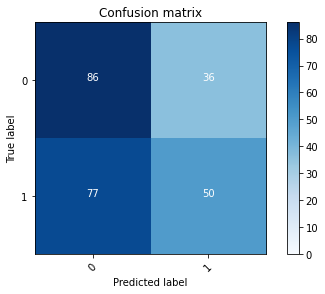

2022-08-20 17:45:47 - [Epoch Train: 7] loss: 0.0352, auc: 1.0000, acc: 0.9980, time: 53.00 s            
2022-08-20 17:45:47 - [Epoch Valid: 7] loss: 1.4535, auc: 0.5854, acc: 0.5462, time: 14.00 s


  7%|██▊                                      | 7/100 [07:50<1:43:58, 67.09s/it]

2022-08-20 17:45:47 - EPOCH: 8
2022-08-20 17:45:50 - Train Step 10/246, train_loss: 0.0246
2022-08-20 17:45:52 - Train Step 20/246, train_loss: 0.0220
2022-08-20 17:45:54 - Train Step 30/246, train_loss: 0.0227
2022-08-20 17:45:56 - Train Step 40/246, train_loss: 0.0243
2022-08-20 17:45:59 - Train Step 50/246, train_loss: 0.0221
2022-08-20 17:46:01 - Train Step 60/246, train_loss: 0.0222
2022-08-20 17:46:03 - Train Step 70/246, train_loss: 0.0217
2022-08-20 17:46:05 - Train Step 80/246, train_loss: 0.0219
2022-08-20 17:46:08 - Train Step 90/246, train_loss: 0.0213
2022-08-20 17:46:10 - Train Step 100/246, train_loss: 0.0247
2022-08-20 17:46:12 - Train Step 110/246, train_loss: 0.0241
2022-08-20 17:46:14 - Train Step 120/246, train_loss: 0.0241
2022-08-20 17:46:17 - Train Step 130/246, train_loss: 0.0231
2022-08-20 17:46:19 - Train Step 140/246, train_loss: 0.0234
2022-08-20 17:46:21 - Train Step 150/246, train_loss: 0.0227
2022-08-20 17:46:23 - Train Step 160/246, train_loss: 0.0225
20

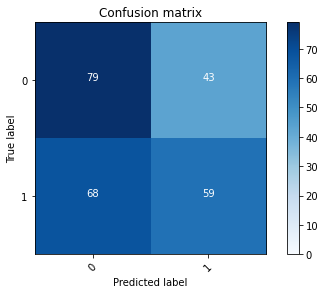

2022-08-20 17:46:57 - [Epoch Train: 8] loss: 0.0227, auc: 1.0000, acc: 0.9970, time: 55.00 s            
2022-08-20 17:46:57 - [Epoch Valid: 8] loss: 1.5237, auc: 0.5930, acc: 0.5542, time: 14.00 s


  8%|███▎                                     | 8/100 [09:00<1:44:01, 67.84s/it]

2022-08-20 17:46:57 - EPOCH: 9
2022-08-20 17:46:59 - Train Step 10/246, train_loss: 0.0215
2022-08-20 17:47:01 - Train Step 20/246, train_loss: 0.0150
2022-08-20 17:47:03 - Train Step 30/246, train_loss: 0.0154
2022-08-20 17:47:05 - Train Step 40/246, train_loss: 0.0143
2022-08-20 17:47:07 - Train Step 50/246, train_loss: 0.0132
2022-08-20 17:47:09 - Train Step 60/246, train_loss: 0.0134
2022-08-20 17:47:11 - Train Step 70/246, train_loss: 0.0128
2022-08-20 17:47:13 - Train Step 80/246, train_loss: 0.0126
2022-08-20 17:47:15 - Train Step 90/246, train_loss: 0.0125
2022-08-20 17:47:17 - Train Step 100/246, train_loss: 0.0119
2022-08-20 17:47:19 - Train Step 110/246, train_loss: 0.0119
2022-08-20 17:47:21 - Train Step 120/246, train_loss: 0.0121
2022-08-20 17:47:23 - Train Step 130/246, train_loss: 0.0123
2022-08-20 17:47:25 - Train Step 140/246, train_loss: 0.0121
2022-08-20 17:47:27 - Train Step 150/246, train_loss: 0.0126
2022-08-20 17:47:29 - Train Step 160/246, train_loss: 0.0126
20

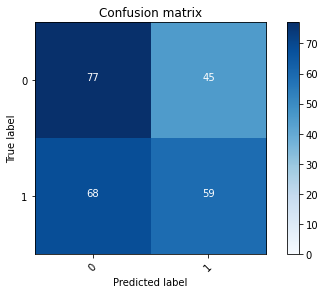

2022-08-20 17:48:01 - [Epoch Train: 9] loss: 0.0125, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 17:48:01 - [Epoch Valid: 9] loss: 1.6054, auc: 0.5940, acc: 0.5462, time: 14.00 s


  9%|███▋                                     | 9/100 [10:04<1:41:12, 66.73s/it]

2022-08-20 17:48:01 - EPOCH: 10
2022-08-20 17:48:03 - Train Step 10/246, train_loss: 0.0075
2022-08-20 17:48:05 - Train Step 20/246, train_loss: 0.0069
2022-08-20 17:48:07 - Train Step 30/246, train_loss: 0.0107
2022-08-20 17:48:09 - Train Step 40/246, train_loss: 0.0101
2022-08-20 17:48:11 - Train Step 50/246, train_loss: 0.0103
2022-08-20 17:48:13 - Train Step 60/246, train_loss: 0.0102
2022-08-20 17:48:15 - Train Step 70/246, train_loss: 0.0098
2022-08-20 17:48:18 - Train Step 80/246, train_loss: 0.0094
2022-08-20 17:48:20 - Train Step 90/246, train_loss: 0.0103
2022-08-20 17:48:22 - Train Step 100/246, train_loss: 0.0099
2022-08-20 17:48:24 - Train Step 110/246, train_loss: 0.0101
2022-08-20 17:48:26 - Train Step 120/246, train_loss: 0.0098
2022-08-20 17:48:28 - Train Step 130/246, train_loss: 0.0096
2022-08-20 17:48:30 - Train Step 140/246, train_loss: 0.0094
2022-08-20 17:48:32 - Train Step 150/246, train_loss: 0.0092
2022-08-20 17:48:34 - Train Step 160/246, train_loss: 0.0089
2

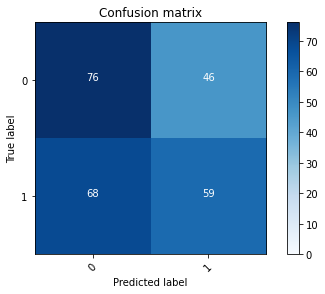

2022-08-20 17:49:05 - [Epoch Train: 10] loss: 0.0082, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 17:49:05 - [Epoch Valid: 10] loss: 1.6714, auc: 0.5884, acc: 0.5422, time: 13.00 s


 10%|████                                    | 10/100 [11:08<1:38:41, 65.79s/it]

2022-08-20 17:49:05 - EPOCH: 11
2022-08-20 17:49:07 - Train Step 10/246, train_loss: 0.0057
2022-08-20 17:49:09 - Train Step 20/246, train_loss: 0.0049
2022-08-20 17:49:12 - Train Step 30/246, train_loss: 0.0052
2022-08-20 17:49:14 - Train Step 40/246, train_loss: 0.0059
2022-08-20 17:49:16 - Train Step 50/246, train_loss: 0.0059
2022-08-20 17:49:18 - Train Step 60/246, train_loss: 0.0057
2022-08-20 17:49:21 - Train Step 70/246, train_loss: 0.0055
2022-08-20 17:49:23 - Train Step 80/246, train_loss: 0.0054
2022-08-20 17:49:25 - Train Step 90/246, train_loss: 0.0084
2022-08-20 17:49:27 - Train Step 100/246, train_loss: 0.0079
2022-08-20 17:49:29 - Train Step 110/246, train_loss: 0.0077
2022-08-20 17:49:32 - Train Step 120/246, train_loss: 0.0074
2022-08-20 17:49:34 - Train Step 130/246, train_loss: 0.0071
2022-08-20 17:49:36 - Train Step 140/246, train_loss: 0.0070
2022-08-20 17:49:38 - Train Step 150/246, train_loss: 0.0069
2022-08-20 17:49:40 - Train Step 160/246, train_loss: 0.0067
2

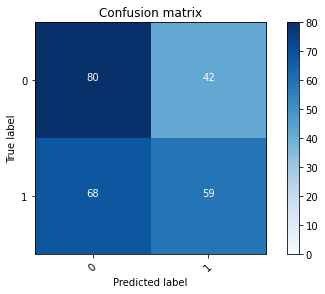

2022-08-20 17:50:14 - [Epoch Train: 11] loss: 0.0062, auc: 1.0000, acc: 0.9990, time: 55.00 s            
2022-08-20 17:50:14 - [Epoch Valid: 11] loss: 1.6429, auc: 0.5920, acc: 0.5582, time: 14.00 s


 11%|████▍                                   | 11/100 [12:17<1:39:06, 66.82s/it]

2022-08-20 17:50:14 - EPOCH: 12
2022-08-20 17:50:16 - Train Step 10/246, train_loss: 0.0031
2022-08-20 17:50:18 - Train Step 20/246, train_loss: 0.0034
2022-08-20 17:50:21 - Train Step 30/246, train_loss: 0.0030
2022-08-20 17:50:23 - Train Step 40/246, train_loss: 0.0040
2022-08-20 17:50:25 - Train Step 50/246, train_loss: 0.0046
2022-08-20 17:50:27 - Train Step 60/246, train_loss: 0.0044
2022-08-20 17:50:29 - Train Step 70/246, train_loss: 0.0045
2022-08-20 17:50:31 - Train Step 80/246, train_loss: 0.0044
2022-08-20 17:50:33 - Train Step 90/246, train_loss: 0.0049
2022-08-20 17:50:36 - Train Step 100/246, train_loss: 0.0047
2022-08-20 17:50:38 - Train Step 110/246, train_loss: 0.0046
2022-08-20 17:50:40 - Train Step 120/246, train_loss: 0.0045
2022-08-20 17:50:42 - Train Step 130/246, train_loss: 0.0045
2022-08-20 17:50:44 - Train Step 140/246, train_loss: 0.0046
2022-08-20 17:50:47 - Train Step 150/246, train_loss: 0.0045
2022-08-20 17:50:49 - Train Step 160/246, train_loss: 0.0050
2

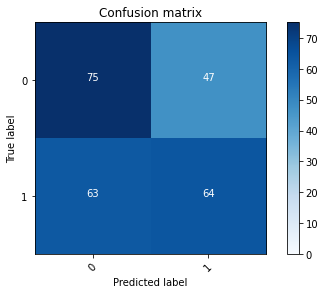

2022-08-20 17:51:21 - [Epoch Train: 12] loss: 0.0049, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 17:51:21 - [Epoch Valid: 12] loss: 1.7055, auc: 0.5925, acc: 0.5582, time: 13.00 s


 12%|████▊                                   | 12/100 [13:24<1:38:00, 66.82s/it]

2022-08-20 17:51:21 - EPOCH: 13
2022-08-20 17:51:23 - Train Step 10/246, train_loss: 0.0026
2022-08-20 17:51:25 - Train Step 20/246, train_loss: 0.0027
2022-08-20 17:51:27 - Train Step 30/246, train_loss: 0.0035
2022-08-20 17:51:29 - Train Step 40/246, train_loss: 0.0035
2022-08-20 17:51:31 - Train Step 50/246, train_loss: 0.0040
2022-08-20 17:51:33 - Train Step 60/246, train_loss: 0.0040
2022-08-20 17:51:36 - Train Step 70/246, train_loss: 0.0039
2022-08-20 17:51:38 - Train Step 80/246, train_loss: 0.0037
2022-08-20 17:51:40 - Train Step 90/246, train_loss: 0.0037
2022-08-20 17:51:42 - Train Step 100/246, train_loss: 0.0038
2022-08-20 17:51:44 - Train Step 110/246, train_loss: 0.0038
2022-08-20 17:51:46 - Train Step 120/246, train_loss: 0.0038
2022-08-20 17:51:48 - Train Step 130/246, train_loss: 0.0039
2022-08-20 17:51:50 - Train Step 140/246, train_loss: 0.0040
2022-08-20 17:51:53 - Train Step 150/246, train_loss: 0.0040
2022-08-20 17:51:55 - Train Step 160/246, train_loss: 0.0040
2

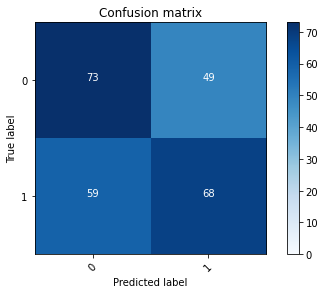

2022-08-20 17:52:26 - [Epoch Train: 13] loss: 0.0042, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 17:52:26 - [Epoch Valid: 13] loss: 1.7875, auc: 0.5926, acc: 0.5663, time: 13.00 s


 13%|█████▏                                  | 13/100 [14:29<1:36:17, 66.40s/it]

2022-08-20 17:52:26 - EPOCH: 14
2022-08-20 17:52:28 - Train Step 10/246, train_loss: 0.0039
2022-08-20 17:52:31 - Train Step 20/246, train_loss: 0.0032
2022-08-20 17:52:33 - Train Step 30/246, train_loss: 0.0036
2022-08-20 17:52:35 - Train Step 40/246, train_loss: 0.0037
2022-08-20 17:52:37 - Train Step 50/246, train_loss: 0.0034
2022-08-20 17:52:40 - Train Step 60/246, train_loss: 0.0040
2022-08-20 17:52:42 - Train Step 70/246, train_loss: 0.0037
2022-08-20 17:52:44 - Train Step 80/246, train_loss: 0.0035
2022-08-20 17:52:46 - Train Step 90/246, train_loss: 0.0035
2022-08-20 17:52:48 - Train Step 100/246, train_loss: 0.0033
2022-08-20 17:52:51 - Train Step 110/246, train_loss: 0.0032
2022-08-20 17:52:53 - Train Step 120/246, train_loss: 0.0031
2022-08-20 17:52:55 - Train Step 130/246, train_loss: 0.0043
2022-08-20 17:52:57 - Train Step 140/246, train_loss: 0.0042
2022-08-20 17:52:59 - Train Step 150/246, train_loss: 0.0041
2022-08-20 17:53:02 - Train Step 160/246, train_loss: 0.0042
2

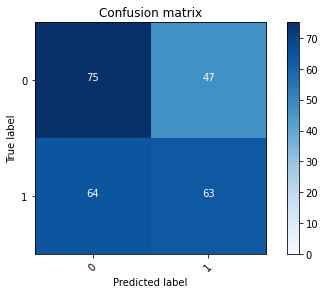

2022-08-20 17:53:34 - [Epoch Train: 14] loss: 0.0040, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 17:53:34 - [Epoch Valid: 14] loss: 1.8072, auc: 0.5930, acc: 0.5542, time: 12.00 s


 14%|█████▌                                  | 14/100 [15:37<1:35:41, 66.77s/it]

2022-08-20 17:53:34 - EPOCH: 15
2022-08-20 17:53:36 - Train Step 10/246, train_loss: 0.0021
2022-08-20 17:53:38 - Train Step 20/246, train_loss: 0.0030
2022-08-20 17:53:40 - Train Step 30/246, train_loss: 0.0037
2022-08-20 17:53:42 - Train Step 40/246, train_loss: 0.0034
2022-08-20 17:53:44 - Train Step 50/246, train_loss: 0.0030
2022-08-20 17:53:46 - Train Step 60/246, train_loss: 0.0028
2022-08-20 17:53:48 - Train Step 70/246, train_loss: 0.0028
2022-08-20 17:53:50 - Train Step 80/246, train_loss: 0.0027
2022-08-20 17:53:52 - Train Step 90/246, train_loss: 0.0026
2022-08-20 17:53:54 - Train Step 100/246, train_loss: 0.0034
2022-08-20 17:53:57 - Train Step 110/246, train_loss: 0.0033
2022-08-20 17:53:59 - Train Step 120/246, train_loss: 0.0031
2022-08-20 17:54:01 - Train Step 130/246, train_loss: 0.0030
2022-08-20 17:54:03 - Train Step 140/246, train_loss: 0.0030
2022-08-20 17:54:05 - Train Step 150/246, train_loss: 0.0029
2022-08-20 17:54:07 - Train Step 160/246, train_loss: 0.0028
2

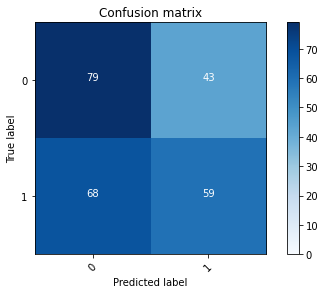

2022-08-20 17:54:38 - [Epoch Train: 15] loss: 0.0031, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 17:54:38 - [Epoch Valid: 15] loss: 1.9466, auc: 0.5922, acc: 0.5542, time: 13.00 s


 15%|██████                                  | 15/100 [16:42<1:33:46, 66.20s/it]

2022-08-20 17:54:38 - EPOCH: 16
2022-08-20 17:54:41 - Train Step 10/246, train_loss: 0.0022
2022-08-20 17:54:43 - Train Step 20/246, train_loss: 0.0021
2022-08-20 17:54:45 - Train Step 30/246, train_loss: 0.0026
2022-08-20 17:54:48 - Train Step 40/246, train_loss: 0.0028
2022-08-20 17:54:50 - Train Step 50/246, train_loss: 0.0026
2022-08-20 17:54:52 - Train Step 60/246, train_loss: 0.0026
2022-08-20 17:54:54 - Train Step 70/246, train_loss: 0.0027
2022-08-20 17:54:56 - Train Step 80/246, train_loss: 0.0027
2022-08-20 17:54:59 - Train Step 90/246, train_loss: 0.0026
2022-08-20 17:55:01 - Train Step 100/246, train_loss: 0.0026
2022-08-20 17:55:03 - Train Step 110/246, train_loss: 0.0025
2022-08-20 17:55:05 - Train Step 120/246, train_loss: 0.0025
2022-08-20 17:55:07 - Train Step 130/246, train_loss: 0.0024
2022-08-20 17:55:10 - Train Step 140/246, train_loss: 0.0023
2022-08-20 17:55:12 - Train Step 150/246, train_loss: 0.0023
2022-08-20 17:55:14 - Train Step 160/246, train_loss: 0.0023
2

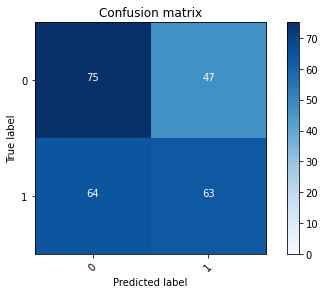

2022-08-20 17:55:46 - [Epoch Train: 16] loss: 0.0023, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 17:55:46 - [Epoch Valid: 16] loss: 2.0349, auc: 0.5954, acc: 0.5542, time: 13.00 s


 16%|██████▍                                 | 16/100 [17:49<1:33:04, 66.48s/it]

2022-08-20 17:55:46 - EPOCH: 17
2022-08-20 17:55:48 - Train Step 10/246, train_loss: 0.0023
2022-08-20 17:55:50 - Train Step 20/246, train_loss: 0.0031
2022-08-20 17:55:53 - Train Step 30/246, train_loss: 0.0026
2022-08-20 17:55:55 - Train Step 40/246, train_loss: 0.0025
2022-08-20 17:55:57 - Train Step 50/246, train_loss: 0.0026
2022-08-20 17:55:59 - Train Step 60/246, train_loss: 0.0026
2022-08-20 17:56:02 - Train Step 70/246, train_loss: 0.0026
2022-08-20 17:56:04 - Train Step 80/246, train_loss: 0.0024
2022-08-20 17:56:06 - Train Step 90/246, train_loss: 0.0023
2022-08-20 17:56:08 - Train Step 100/246, train_loss: 0.0023
2022-08-20 17:56:10 - Train Step 110/246, train_loss: 0.0024
2022-08-20 17:56:13 - Train Step 120/246, train_loss: 0.0023
2022-08-20 17:56:15 - Train Step 130/246, train_loss: 0.0023
2022-08-20 17:56:17 - Train Step 140/246, train_loss: 0.0022
2022-08-20 17:56:19 - Train Step 150/246, train_loss: 0.0022
2022-08-20 17:56:22 - Train Step 160/246, train_loss: 0.0021
2

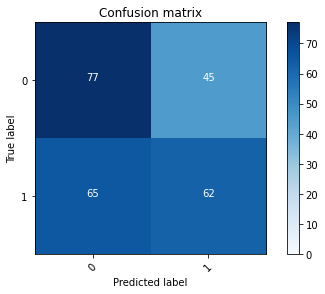

2022-08-20 17:56:55 - [Epoch Train: 17] loss: 0.0022, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-20 17:56:55 - [Epoch Valid: 17] loss: 1.9623, auc: 0.5938, acc: 0.5582, time: 13.00 s


 17%|██████▊                                 | 17/100 [18:58<1:32:59, 67.22s/it]

2022-08-20 17:56:55 - EPOCH: 18
2022-08-20 17:56:57 - Train Step 10/246, train_loss: 0.0010
2022-08-20 17:56:59 - Train Step 20/246, train_loss: 0.0013
2022-08-20 17:57:01 - Train Step 30/246, train_loss: 0.0020
2022-08-20 17:57:04 - Train Step 40/246, train_loss: 0.0021
2022-08-20 17:57:06 - Train Step 50/246, train_loss: 0.0018
2022-08-20 17:57:08 - Train Step 60/246, train_loss: 0.0017
2022-08-20 17:57:10 - Train Step 70/246, train_loss: 0.0017
2022-08-20 17:57:12 - Train Step 80/246, train_loss: 0.0017
2022-08-20 17:57:14 - Train Step 90/246, train_loss: 0.0016
2022-08-20 17:57:17 - Train Step 100/246, train_loss: 0.0016
2022-08-20 17:57:19 - Train Step 110/246, train_loss: 0.0015
2022-08-20 17:57:21 - Train Step 120/246, train_loss: 0.0015
2022-08-20 17:57:23 - Train Step 130/246, train_loss: 0.0015
2022-08-20 17:57:25 - Train Step 140/246, train_loss: 0.0015
2022-08-20 17:57:27 - Train Step 150/246, train_loss: 0.0015
2022-08-20 17:57:30 - Train Step 160/246, train_loss: 0.0015
2

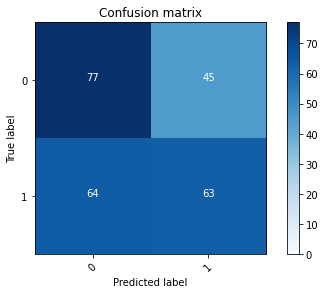

2022-08-20 17:58:02 - [Epoch Train: 18] loss: 0.0016, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 17:58:02 - [Epoch Valid: 18] loss: 2.0979, auc: 0.5961, acc: 0.5622, time: 13.00 s


 18%|███████▏                                | 18/100 [20:06<1:32:08, 67.42s/it]

2022-08-20 17:58:02 - EPOCH: 19
2022-08-20 17:58:05 - Train Step 10/246, train_loss: 0.0014
2022-08-20 17:58:07 - Train Step 20/246, train_loss: 0.0020
2022-08-20 17:58:09 - Train Step 30/246, train_loss: 0.0027
2022-08-20 17:58:12 - Train Step 40/246, train_loss: 0.0023
2022-08-20 17:58:14 - Train Step 50/246, train_loss: 0.0021
2022-08-20 17:58:16 - Train Step 60/246, train_loss: 0.0021
2022-08-20 17:58:18 - Train Step 70/246, train_loss: 0.0021
2022-08-20 17:58:20 - Train Step 80/246, train_loss: 0.0021
2022-08-20 17:58:22 - Train Step 90/246, train_loss: 0.0020
2022-08-20 17:58:24 - Train Step 100/246, train_loss: 0.0019
2022-08-20 17:58:26 - Train Step 110/246, train_loss: 0.0017
2022-08-20 17:58:29 - Train Step 120/246, train_loss: 0.0017
2022-08-20 17:58:31 - Train Step 130/246, train_loss: 0.0017
2022-08-20 17:58:33 - Train Step 140/246, train_loss: 0.0017
2022-08-20 17:58:35 - Train Step 150/246, train_loss: 0.0016
2022-08-20 17:58:37 - Train Step 160/246, train_loss: 0.0016
2

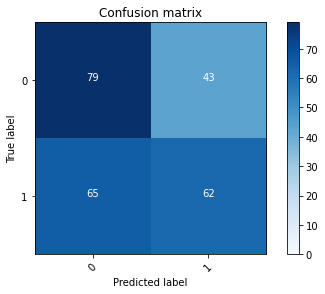

2022-08-20 17:59:09 - [Epoch Train: 19] loss: 0.0015, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 17:59:09 - [Epoch Valid: 19] loss: 2.2044, auc: 0.5940, acc: 0.5663, time: 13.00 s


 19%|███████▌                                | 19/100 [21:13<1:30:50, 67.29s/it]

2022-08-20 17:59:09 - EPOCH: 20
2022-08-20 17:59:12 - Train Step 10/246, train_loss: 0.0006
2022-08-20 17:59:14 - Train Step 20/246, train_loss: 0.0016
2022-08-20 17:59:16 - Train Step 30/246, train_loss: 0.0015
2022-08-20 17:59:18 - Train Step 40/246, train_loss: 0.0013
2022-08-20 17:59:20 - Train Step 50/246, train_loss: 0.0013
2022-08-20 17:59:22 - Train Step 60/246, train_loss: 0.0012
2022-08-20 17:59:24 - Train Step 70/246, train_loss: 0.0013
2022-08-20 17:59:26 - Train Step 80/246, train_loss: 0.0012
2022-08-20 17:59:28 - Train Step 90/246, train_loss: 0.0012
2022-08-20 17:59:30 - Train Step 100/246, train_loss: 0.0012
2022-08-20 17:59:33 - Train Step 110/246, train_loss: 0.0013
2022-08-20 17:59:35 - Train Step 120/246, train_loss: 0.0013
2022-08-20 17:59:37 - Train Step 130/246, train_loss: 0.0013
2022-08-20 17:59:39 - Train Step 140/246, train_loss: 0.0014
2022-08-20 17:59:41 - Train Step 150/246, train_loss: 0.0013
2022-08-20 17:59:43 - Train Step 160/246, train_loss: 0.0013
2

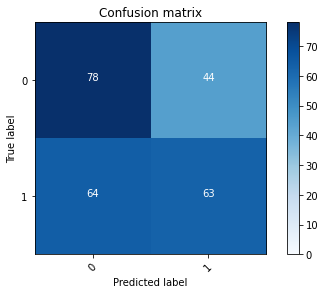

2022-08-20 18:00:14 - [Epoch Train: 20] loss: 0.0012, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:00:14 - [Epoch Valid: 20] loss: 2.2617, auc: 0.5950, acc: 0.5663, time: 13.00 s


 20%|████████                                | 20/100 [22:17<1:28:38, 66.48s/it]

2022-08-20 18:00:14 - EPOCH: 21
2022-08-20 18:00:16 - Train Step 10/246, train_loss: 0.0006
2022-08-20 18:00:19 - Train Step 20/246, train_loss: 0.0008
2022-08-20 18:00:21 - Train Step 30/246, train_loss: 0.0009
2022-08-20 18:00:23 - Train Step 40/246, train_loss: 0.0009
2022-08-20 18:00:25 - Train Step 50/246, train_loss: 0.0011
2022-08-20 18:00:28 - Train Step 60/246, train_loss: 0.0011
2022-08-20 18:00:30 - Train Step 70/246, train_loss: 0.0010
2022-08-20 18:00:32 - Train Step 80/246, train_loss: 0.0010
2022-08-20 18:00:34 - Train Step 90/246, train_loss: 0.0010
2022-08-20 18:00:36 - Train Step 100/246, train_loss: 0.0010
2022-08-20 18:00:39 - Train Step 110/246, train_loss: 0.0011
2022-08-20 18:00:41 - Train Step 120/246, train_loss: 0.0010
2022-08-20 18:00:43 - Train Step 130/246, train_loss: 0.0010
2022-08-20 18:00:45 - Train Step 140/246, train_loss: 0.0010
2022-08-20 18:00:47 - Train Step 150/246, train_loss: 0.0010
2022-08-20 18:00:50 - Train Step 160/246, train_loss: 0.0010
2

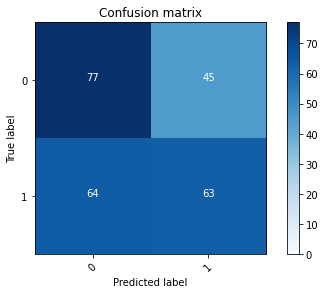

2022-08-20 18:01:22 - [Epoch Train: 21] loss: 0.0009, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:01:22 - [Epoch Valid: 21] loss: 2.2964, auc: 0.5936, acc: 0.5622, time: 13.00 s


 21%|████████▍                               | 21/100 [23:25<1:27:56, 66.79s/it]

2022-08-20 18:01:22 - EPOCH: 22
2022-08-20 18:01:24 - Train Step 10/246, train_loss: 0.0005
2022-08-20 18:01:26 - Train Step 20/246, train_loss: 0.0009
2022-08-20 18:01:28 - Train Step 30/246, train_loss: 0.0008
2022-08-20 18:01:30 - Train Step 40/246, train_loss: 0.0008
2022-08-20 18:01:32 - Train Step 50/246, train_loss: 0.0008
2022-08-20 18:01:34 - Train Step 60/246, train_loss: 0.0008
2022-08-20 18:01:36 - Train Step 70/246, train_loss: 0.0009
2022-08-20 18:01:38 - Train Step 80/246, train_loss: 0.0009
2022-08-20 18:01:41 - Train Step 90/246, train_loss: 0.0008
2022-08-20 18:01:43 - Train Step 100/246, train_loss: 0.0009
2022-08-20 18:01:45 - Train Step 110/246, train_loss: 0.0009
2022-08-20 18:01:47 - Train Step 120/246, train_loss: 0.0009
2022-08-20 18:01:49 - Train Step 130/246, train_loss: 0.0009
2022-08-20 18:01:51 - Train Step 140/246, train_loss: 0.0009
2022-08-20 18:01:53 - Train Step 150/246, train_loss: 0.0009
2022-08-20 18:01:55 - Train Step 160/246, train_loss: 0.0009
2

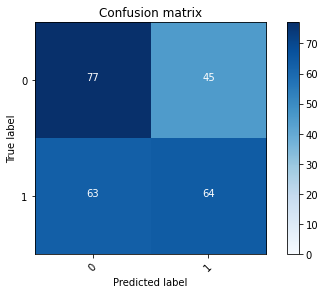

2022-08-20 18:02:27 - [Epoch Train: 22] loss: 0.0009, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:02:27 - [Epoch Valid: 22] loss: 2.2033, auc: 0.5930, acc: 0.5663, time: 14.00 s


 22%|████████▊                               | 22/100 [24:31<1:26:26, 66.49s/it]

2022-08-20 18:02:27 - EPOCH: 23
2022-08-20 18:02:30 - Train Step 10/246, train_loss: 0.0024
2022-08-20 18:02:32 - Train Step 20/246, train_loss: 0.0015
2022-08-20 18:02:34 - Train Step 30/246, train_loss: 0.0011
2022-08-20 18:02:36 - Train Step 40/246, train_loss: 0.0010
2022-08-20 18:02:38 - Train Step 50/246, train_loss: 0.0009
2022-08-20 18:02:40 - Train Step 60/246, train_loss: 0.0009
2022-08-20 18:02:42 - Train Step 70/246, train_loss: 0.0009
2022-08-20 18:02:44 - Train Step 80/246, train_loss: 0.0008
2022-08-20 18:02:46 - Train Step 90/246, train_loss: 0.0008
2022-08-20 18:02:48 - Train Step 100/246, train_loss: 0.0008
2022-08-20 18:02:50 - Train Step 110/246, train_loss: 0.0008
2022-08-20 18:02:53 - Train Step 120/246, train_loss: 0.0008
2022-08-20 18:02:55 - Train Step 130/246, train_loss: 0.0008
2022-08-20 18:02:57 - Train Step 140/246, train_loss: 0.0008
2022-08-20 18:02:59 - Train Step 150/246, train_loss: 0.0007
2022-08-20 18:03:01 - Train Step 160/246, train_loss: 0.0008
2

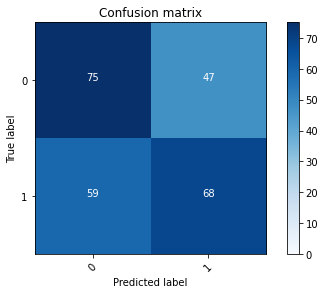

2022-08-20 18:03:32 - [Epoch Train: 23] loss: 0.0009, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:03:32 - [Epoch Valid: 23] loss: 2.2495, auc: 0.5936, acc: 0.5743, time: 13.00 s


 23%|█████████▏                              | 23/100 [25:36<1:24:48, 66.08s/it]

2022-08-20 18:03:32 - EPOCH: 24
2022-08-20 18:03:35 - Train Step 10/246, train_loss: 0.0009
2022-08-20 18:03:37 - Train Step 20/246, train_loss: 0.0006
2022-08-20 18:03:39 - Train Step 30/246, train_loss: 0.0006
2022-08-20 18:03:42 - Train Step 40/246, train_loss: 0.0005
2022-08-20 18:03:44 - Train Step 50/246, train_loss: 0.0005
2022-08-20 18:03:46 - Train Step 60/246, train_loss: 0.0005
2022-08-20 18:03:48 - Train Step 70/246, train_loss: 0.0006
2022-08-20 18:03:51 - Train Step 80/246, train_loss: 0.0007
2022-08-20 18:03:53 - Train Step 90/246, train_loss: 0.0007
2022-08-20 18:03:55 - Train Step 100/246, train_loss: 0.0007
2022-08-20 18:03:57 - Train Step 110/246, train_loss: 0.0007
2022-08-20 18:04:00 - Train Step 120/246, train_loss: 0.0007
2022-08-20 18:04:02 - Train Step 130/246, train_loss: 0.0006
2022-08-20 18:04:04 - Train Step 140/246, train_loss: 0.0006
2022-08-20 18:04:06 - Train Step 150/246, train_loss: 0.0007
2022-08-20 18:04:08 - Train Step 160/246, train_loss: 0.0007
2

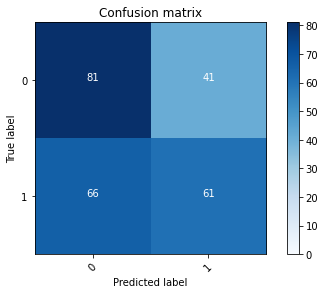

2022-08-20 18:04:41 - [Epoch Train: 24] loss: 0.0007, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 18:04:41 - [Epoch Valid: 24] loss: 2.2526, auc: 0.5946, acc: 0.5703, time: 13.00 s


 24%|█████████▌                              | 24/100 [26:44<1:24:28, 66.69s/it]

2022-08-20 18:04:41 - EPOCH: 25
2022-08-20 18:04:43 - Train Step 10/246, train_loss: 0.0004
2022-08-20 18:04:45 - Train Step 20/246, train_loss: 0.0004
2022-08-20 18:04:47 - Train Step 30/246, train_loss: 0.0003
2022-08-20 18:04:50 - Train Step 40/246, train_loss: 0.0004
2022-08-20 18:04:52 - Train Step 50/246, train_loss: 0.0004
2022-08-20 18:04:54 - Train Step 60/246, train_loss: 0.0004
2022-08-20 18:04:56 - Train Step 70/246, train_loss: 0.0004
2022-08-20 18:04:58 - Train Step 80/246, train_loss: 0.0004
2022-08-20 18:05:01 - Train Step 90/246, train_loss: 0.0005
2022-08-20 18:05:03 - Train Step 100/246, train_loss: 0.0005
2022-08-20 18:05:05 - Train Step 110/246, train_loss: 0.0006
2022-08-20 18:05:07 - Train Step 120/246, train_loss: 0.0005
2022-08-20 18:05:09 - Train Step 130/246, train_loss: 0.0005
2022-08-20 18:05:11 - Train Step 140/246, train_loss: 0.0005
2022-08-20 18:05:14 - Train Step 150/246, train_loss: 0.0005
2022-08-20 18:05:16 - Train Step 160/246, train_loss: 0.0005
2

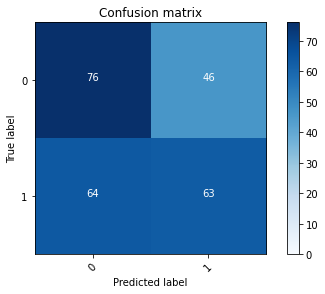

2022-08-20 18:05:48 - [Epoch Train: 25] loss: 0.0005, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:05:48 - [Epoch Valid: 25] loss: 2.4296, auc: 0.5939, acc: 0.5582, time: 13.00 s


 25%|██████████                              | 25/100 [27:52<1:23:45, 67.01s/it]

2022-08-20 18:05:48 - EPOCH: 26
2022-08-20 18:05:51 - Train Step 10/246, train_loss: 0.0007
2022-08-20 18:05:53 - Train Step 20/246, train_loss: 0.0005
2022-08-20 18:05:55 - Train Step 30/246, train_loss: 0.0005
2022-08-20 18:05:58 - Train Step 40/246, train_loss: 0.0004
2022-08-20 18:06:00 - Train Step 50/246, train_loss: 0.0004
2022-08-20 18:06:02 - Train Step 60/246, train_loss: 0.0004
2022-08-20 18:06:04 - Train Step 70/246, train_loss: 0.0007
2022-08-20 18:06:06 - Train Step 80/246, train_loss: 0.0007
2022-08-20 18:06:08 - Train Step 90/246, train_loss: 0.0007
2022-08-20 18:06:11 - Train Step 100/246, train_loss: 0.0007
2022-08-20 18:06:13 - Train Step 110/246, train_loss: 0.0006
2022-08-20 18:06:15 - Train Step 120/246, train_loss: 0.0006
2022-08-20 18:06:17 - Train Step 130/246, train_loss: 0.0006
2022-08-20 18:06:19 - Train Step 140/246, train_loss: 0.0006
2022-08-20 18:06:21 - Train Step 150/246, train_loss: 0.0006
2022-08-20 18:06:24 - Train Step 160/246, train_loss: 0.0006
2

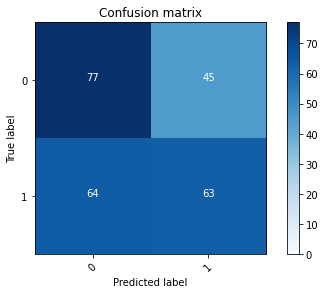

2022-08-20 18:06:56 - [Epoch Train: 26] loss: 0.0005, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:06:56 - [Epoch Valid: 26] loss: 2.4459, auc: 0.5955, acc: 0.5622, time: 14.00 s


 26%|██████████▍                             | 26/100 [29:00<1:23:00, 67.30s/it]

2022-08-20 18:06:56 - EPOCH: 27
2022-08-20 18:06:59 - Train Step 10/246, train_loss: 0.0005
2022-08-20 18:07:01 - Train Step 20/246, train_loss: 0.0004
2022-08-20 18:07:03 - Train Step 30/246, train_loss: 0.0003
2022-08-20 18:07:06 - Train Step 40/246, train_loss: 0.0003
2022-08-20 18:07:08 - Train Step 50/246, train_loss: 0.0003
2022-08-20 18:07:10 - Train Step 60/246, train_loss: 0.0004
2022-08-20 18:07:12 - Train Step 70/246, train_loss: 0.0003
2022-08-20 18:07:14 - Train Step 80/246, train_loss: 0.0003
2022-08-20 18:07:17 - Train Step 90/246, train_loss: 0.0003
2022-08-20 18:07:19 - Train Step 100/246, train_loss: 0.0004
2022-08-20 18:07:21 - Train Step 110/246, train_loss: 0.0004
2022-08-20 18:07:23 - Train Step 120/246, train_loss: 0.0004
2022-08-20 18:07:25 - Train Step 130/246, train_loss: 0.0004
2022-08-20 18:07:28 - Train Step 140/246, train_loss: 0.0004
2022-08-20 18:07:30 - Train Step 150/246, train_loss: 0.0004
2022-08-20 18:07:32 - Train Step 160/246, train_loss: 0.0004
2

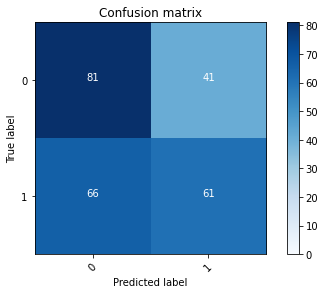

2022-08-20 18:08:04 - [Epoch Train: 27] loss: 0.0005, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 18:08:04 - [Epoch Valid: 27] loss: 2.2483, auc: 0.5919, acc: 0.5703, time: 13.00 s


 27%|██████████▊                             | 27/100 [30:07<1:21:59, 67.38s/it]

2022-08-20 18:08:04 - EPOCH: 28
2022-08-20 18:08:06 - Train Step 10/246, train_loss: 0.0014
2022-08-20 18:08:08 - Train Step 20/246, train_loss: 0.0010
2022-08-20 18:08:10 - Train Step 30/246, train_loss: 0.0007
2022-08-20 18:08:13 - Train Step 40/246, train_loss: 0.0007
2022-08-20 18:08:15 - Train Step 50/246, train_loss: 0.0006
2022-08-20 18:08:17 - Train Step 60/246, train_loss: 0.0005
2022-08-20 18:08:19 - Train Step 70/246, train_loss: 0.0005
2022-08-20 18:08:21 - Train Step 80/246, train_loss: 0.0004
2022-08-20 18:08:23 - Train Step 90/246, train_loss: 0.0004
2022-08-20 18:08:25 - Train Step 100/246, train_loss: 0.0004
2022-08-20 18:08:27 - Train Step 110/246, train_loss: 0.0004
2022-08-20 18:08:30 - Train Step 120/246, train_loss: 0.0004
2022-08-20 18:08:32 - Train Step 130/246, train_loss: 0.0004
2022-08-20 18:08:34 - Train Step 140/246, train_loss: 0.0004
2022-08-20 18:08:36 - Train Step 150/246, train_loss: 0.0004
2022-08-20 18:08:38 - Train Step 160/246, train_loss: 0.0004
2

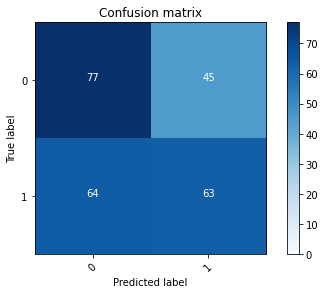

2022-08-20 18:09:11 - [Epoch Train: 28] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:09:11 - [Epoch Valid: 28] loss: 2.5136, auc: 0.5956, acc: 0.5622, time: 14.00 s


 28%|███████████▏                            | 28/100 [31:14<1:20:40, 67.23s/it]

2022-08-20 18:09:11 - EPOCH: 29
2022-08-20 18:09:13 - Train Step 10/246, train_loss: 0.0003
2022-08-20 18:09:15 - Train Step 20/246, train_loss: 0.0002
2022-08-20 18:09:17 - Train Step 30/246, train_loss: 0.0004
2022-08-20 18:09:19 - Train Step 40/246, train_loss: 0.0004
2022-08-20 18:09:22 - Train Step 50/246, train_loss: 0.0003
2022-08-20 18:09:24 - Train Step 60/246, train_loss: 0.0004
2022-08-20 18:09:26 - Train Step 70/246, train_loss: 0.0004
2022-08-20 18:09:28 - Train Step 80/246, train_loss: 0.0003
2022-08-20 18:09:30 - Train Step 90/246, train_loss: 0.0003
2022-08-20 18:09:32 - Train Step 100/246, train_loss: 0.0003
2022-08-20 18:09:34 - Train Step 110/246, train_loss: 0.0003
2022-08-20 18:09:36 - Train Step 120/246, train_loss: 0.0003
2022-08-20 18:09:38 - Train Step 130/246, train_loss: 0.0003
2022-08-20 18:09:40 - Train Step 140/246, train_loss: 0.0003
2022-08-20 18:09:43 - Train Step 150/246, train_loss: 0.0003
2022-08-20 18:09:45 - Train Step 160/246, train_loss: 0.0003
2

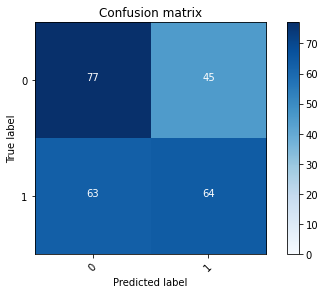

2022-08-20 18:10:17 - [Epoch Train: 29] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 18:10:17 - [Epoch Valid: 29] loss: 2.5722, auc: 0.5901, acc: 0.5663, time: 13.00 s


 29%|███████████▌                            | 29/100 [32:20<1:19:09, 66.89s/it]

2022-08-20 18:10:17 - EPOCH: 30
2022-08-20 18:10:19 - Train Step 10/246, train_loss: 0.0003
2022-08-20 18:10:21 - Train Step 20/246, train_loss: 0.0002
2022-08-20 18:10:24 - Train Step 30/246, train_loss: 0.0003
2022-08-20 18:10:26 - Train Step 40/246, train_loss: 0.0004
2022-08-20 18:10:28 - Train Step 50/246, train_loss: 0.0004
2022-08-20 18:10:30 - Train Step 60/246, train_loss: 0.0004
2022-08-20 18:10:32 - Train Step 70/246, train_loss: 0.0004
2022-08-20 18:10:34 - Train Step 80/246, train_loss: 0.0004
2022-08-20 18:10:36 - Train Step 90/246, train_loss: 0.0003
2022-08-20 18:10:38 - Train Step 100/246, train_loss: 0.0003
2022-08-20 18:10:40 - Train Step 110/246, train_loss: 0.0003
2022-08-20 18:10:43 - Train Step 120/246, train_loss: 0.0003
2022-08-20 18:10:45 - Train Step 130/246, train_loss: 0.0003
2022-08-20 18:10:47 - Train Step 140/246, train_loss: 0.0003
2022-08-20 18:10:49 - Train Step 150/246, train_loss: 0.0003
2022-08-20 18:10:52 - Train Step 160/246, train_loss: 0.0003
2

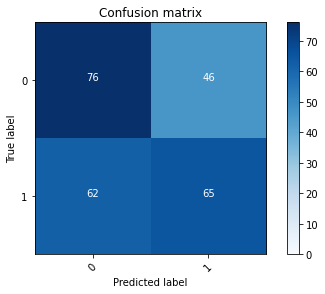

2022-08-20 18:11:25 - [Epoch Train: 30] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 18:11:25 - [Epoch Valid: 30] loss: 2.6175, auc: 0.5904, acc: 0.5663, time: 13.00 s


 30%|████████████                            | 30/100 [33:28<1:18:28, 67.26s/it]

2022-08-20 18:11:25 - EPOCH: 31
2022-08-20 18:11:27 - Train Step 10/246, train_loss: 0.0004
2022-08-20 18:11:30 - Train Step 20/246, train_loss: 0.0002
2022-08-20 18:11:32 - Train Step 30/246, train_loss: 0.0002
2022-08-20 18:11:34 - Train Step 40/246, train_loss: 0.0002
2022-08-20 18:11:36 - Train Step 50/246, train_loss: 0.0002
2022-08-20 18:11:38 - Train Step 60/246, train_loss: 0.0002
2022-08-20 18:11:40 - Train Step 70/246, train_loss: 0.0002
2022-08-20 18:11:43 - Train Step 80/246, train_loss: 0.0003
2022-08-20 18:11:45 - Train Step 90/246, train_loss: 0.0003
2022-08-20 18:11:47 - Train Step 100/246, train_loss: 0.0003
2022-08-20 18:11:49 - Train Step 110/246, train_loss: 0.0003
2022-08-20 18:11:51 - Train Step 120/246, train_loss: 0.0003
2022-08-20 18:11:54 - Train Step 130/246, train_loss: 0.0003
2022-08-20 18:11:56 - Train Step 140/246, train_loss: 0.0003
2022-08-20 18:11:58 - Train Step 150/246, train_loss: 0.0003
2022-08-20 18:12:01 - Train Step 160/246, train_loss: 0.0002
2

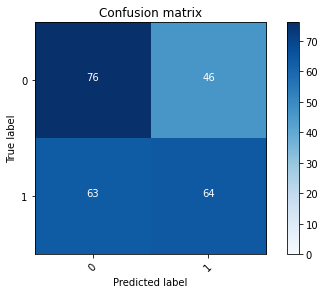

2022-08-20 18:12:34 - [Epoch Train: 31] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 56.00 s            
2022-08-20 18:12:34 - [Epoch Valid: 31] loss: 2.6763, auc: 0.5940, acc: 0.5622, time: 12.00 s


 31%|████████████▍                           | 31/100 [34:38<1:18:07, 67.93s/it]

2022-08-20 18:12:34 - EPOCH: 32
2022-08-20 18:12:37 - Train Step 10/246, train_loss: 0.0003
2022-08-20 18:12:39 - Train Step 20/246, train_loss: 0.0002
2022-08-20 18:12:41 - Train Step 30/246, train_loss: 0.0002
2022-08-20 18:12:43 - Train Step 40/246, train_loss: 0.0002
2022-08-20 18:12:45 - Train Step 50/246, train_loss: 0.0002
2022-08-20 18:12:47 - Train Step 60/246, train_loss: 0.0001
2022-08-20 18:12:49 - Train Step 70/246, train_loss: 0.0002
2022-08-20 18:12:51 - Train Step 80/246, train_loss: 0.0002
2022-08-20 18:12:53 - Train Step 90/246, train_loss: 0.0002
2022-08-20 18:12:56 - Train Step 100/246, train_loss: 0.0002
2022-08-20 18:12:58 - Train Step 110/246, train_loss: 0.0002
2022-08-20 18:13:00 - Train Step 120/246, train_loss: 0.0002
2022-08-20 18:13:02 - Train Step 130/246, train_loss: 0.0002
2022-08-20 18:13:04 - Train Step 140/246, train_loss: 0.0002
2022-08-20 18:13:06 - Train Step 150/246, train_loss: 0.0002
2022-08-20 18:13:08 - Train Step 160/246, train_loss: 0.0002
2

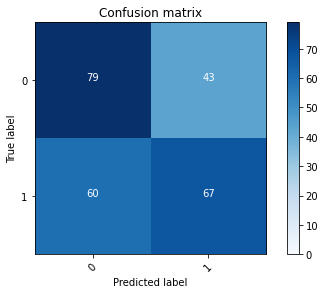

2022-08-20 18:13:40 - [Epoch Train: 32] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:13:40 - [Epoch Valid: 32] loss: 2.5021, auc: 0.5955, acc: 0.5863, time: 13.00 s
2022-08-20 18:13:40 - acc improved from 0.5783 to 0.5863. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e32-loss2.502-acc0.586-auc0.595.pth'


 32%|████████████▊                           | 32/100 [35:43<1:16:04, 67.12s/it]

2022-08-20 18:13:40 - EPOCH: 33
2022-08-20 18:13:42 - Train Step 10/246, train_loss: 0.0002
2022-08-20 18:13:44 - Train Step 20/246, train_loss: 0.0002
2022-08-20 18:13:46 - Train Step 30/246, train_loss: 0.0002
2022-08-20 18:13:48 - Train Step 40/246, train_loss: 0.0001
2022-08-20 18:13:50 - Train Step 50/246, train_loss: 0.0002
2022-08-20 18:13:52 - Train Step 60/246, train_loss: 0.0002
2022-08-20 18:13:54 - Train Step 70/246, train_loss: 0.0002
2022-08-20 18:13:56 - Train Step 80/246, train_loss: 0.0002
2022-08-20 18:13:58 - Train Step 90/246, train_loss: 0.0002
2022-08-20 18:14:00 - Train Step 100/246, train_loss: 0.0002
2022-08-20 18:14:02 - Train Step 110/246, train_loss: 0.0002
2022-08-20 18:14:04 - Train Step 120/246, train_loss: 0.0002
2022-08-20 18:14:07 - Train Step 130/246, train_loss: 0.0002
2022-08-20 18:14:09 - Train Step 140/246, train_loss: 0.0002
2022-08-20 18:14:11 - Train Step 150/246, train_loss: 0.0001
2022-08-20 18:14:13 - Train Step 160/246, train_loss: 0.0001
2

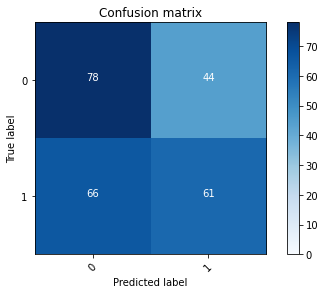

2022-08-20 18:14:46 - [Epoch Train: 33] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:14:46 - [Epoch Valid: 33] loss: 2.6723, auc: 0.5933, acc: 0.5582, time: 15.00 s


 33%|█████████████▏                          | 33/100 [36:50<1:14:47, 66.98s/it]

2022-08-20 18:14:46 - EPOCH: 34
2022-08-20 18:14:49 - Train Step 10/246, train_loss: 0.0001
2022-08-20 18:14:51 - Train Step 20/246, train_loss: 0.0001
2022-08-20 18:14:53 - Train Step 30/246, train_loss: 0.0001
2022-08-20 18:14:55 - Train Step 40/246, train_loss: 0.0001
2022-08-20 18:14:57 - Train Step 50/246, train_loss: 0.0001
2022-08-20 18:14:59 - Train Step 60/246, train_loss: 0.0001
2022-08-20 18:15:01 - Train Step 70/246, train_loss: 0.0001
2022-08-20 18:15:03 - Train Step 80/246, train_loss: 0.0001
2022-08-20 18:15:05 - Train Step 90/246, train_loss: 0.0001
2022-08-20 18:15:07 - Train Step 100/246, train_loss: 0.0001
2022-08-20 18:15:09 - Train Step 110/246, train_loss: 0.0001
2022-08-20 18:15:11 - Train Step 120/246, train_loss: 0.0001
2022-08-20 18:15:13 - Train Step 130/246, train_loss: 0.0001
2022-08-20 18:15:15 - Train Step 140/246, train_loss: 0.0001
2022-08-20 18:15:17 - Train Step 150/246, train_loss: 0.0001
2022-08-20 18:15:19 - Train Step 160/246, train_loss: 0.0001
2

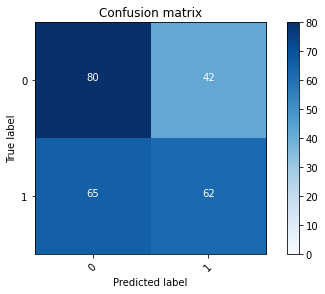

2022-08-20 18:15:49 - [Epoch Train: 34] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 49.00 s            
2022-08-20 18:15:49 - [Epoch Valid: 34] loss: 2.8097, auc: 0.5907, acc: 0.5703, time: 12.00 s


 34%|█████████████▌                          | 34/100 [37:52<1:12:12, 65.64s/it]

2022-08-20 18:15:49 - EPOCH: 35
2022-08-20 18:15:51 - Train Step 10/246, train_loss: 0.0001
2022-08-20 18:15:53 - Train Step 20/246, train_loss: 0.0001
2022-08-20 18:15:55 - Train Step 30/246, train_loss: 0.0001
2022-08-20 18:15:57 - Train Step 40/246, train_loss: 0.0001
2022-08-20 18:15:59 - Train Step 50/246, train_loss: 0.0001
2022-08-20 18:16:01 - Train Step 60/246, train_loss: 0.0002
2022-08-20 18:16:03 - Train Step 70/246, train_loss: 0.0002
2022-08-20 18:16:05 - Train Step 80/246, train_loss: 0.0002
2022-08-20 18:16:07 - Train Step 90/246, train_loss: 0.0002
2022-08-20 18:16:09 - Train Step 100/246, train_loss: 0.0002
2022-08-20 18:16:11 - Train Step 110/246, train_loss: 0.0002
2022-08-20 18:16:13 - Train Step 120/246, train_loss: 0.0002
2022-08-20 18:16:15 - Train Step 130/246, train_loss: 0.0002
2022-08-20 18:16:18 - Train Step 140/246, train_loss: 0.0002
2022-08-20 18:16:20 - Train Step 150/246, train_loss: 0.0002
2022-08-20 18:16:22 - Train Step 160/246, train_loss: 0.0002
2

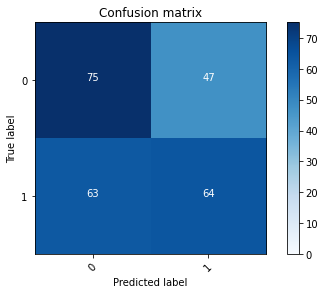

2022-08-20 18:16:53 - [Epoch Train: 35] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:16:53 - [Epoch Valid: 35] loss: 2.8656, auc: 0.5928, acc: 0.5582, time: 12.00 s


 35%|██████████████                          | 35/100 [38:56<1:10:39, 65.23s/it]

2022-08-20 18:16:53 - EPOCH: 36
2022-08-20 18:16:56 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:16:58 - Train Step 20/246, train_loss: 0.0001
2022-08-20 18:17:00 - Train Step 30/246, train_loss: 0.0001
2022-08-20 18:17:02 - Train Step 40/246, train_loss: 0.0001
2022-08-20 18:17:04 - Train Step 50/246, train_loss: 0.0001
2022-08-20 18:17:06 - Train Step 60/246, train_loss: 0.0001
2022-08-20 18:17:08 - Train Step 70/246, train_loss: 0.0001
2022-08-20 18:17:10 - Train Step 80/246, train_loss: 0.0001
2022-08-20 18:17:12 - Train Step 90/246, train_loss: 0.0001
2022-08-20 18:17:14 - Train Step 100/246, train_loss: 0.0001
2022-08-20 18:17:16 - Train Step 110/246, train_loss: 0.0001
2022-08-20 18:17:19 - Train Step 120/246, train_loss: 0.0001
2022-08-20 18:17:21 - Train Step 130/246, train_loss: 0.0001
2022-08-20 18:17:23 - Train Step 140/246, train_loss: 0.0001
2022-08-20 18:17:25 - Train Step 150/246, train_loss: 0.0001
2022-08-20 18:17:27 - Train Step 160/246, train_loss: 0.0001
2

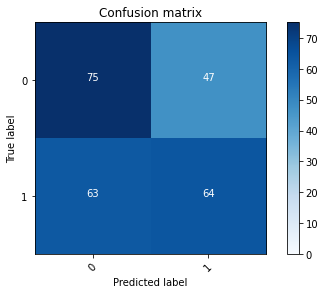

2022-08-20 18:17:59 - [Epoch Train: 36] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:17:59 - [Epoch Valid: 36] loss: 2.9583, auc: 0.5893, acc: 0.5582, time: 13.00 s


 36%|██████████████▍                         | 36/100 [40:02<1:09:39, 65.30s/it]

2022-08-20 18:17:59 - EPOCH: 37
2022-08-20 18:18:01 - Train Step 10/246, train_loss: 0.0001
2022-08-20 18:18:03 - Train Step 20/246, train_loss: 0.0001
2022-08-20 18:18:05 - Train Step 30/246, train_loss: 0.0001
2022-08-20 18:18:07 - Train Step 40/246, train_loss: 0.0001
2022-08-20 18:18:09 - Train Step 50/246, train_loss: 0.0001
2022-08-20 18:18:11 - Train Step 60/246, train_loss: 0.0001
2022-08-20 18:18:13 - Train Step 70/246, train_loss: 0.0001
2022-08-20 18:18:15 - Train Step 80/246, train_loss: 0.0001
2022-08-20 18:18:17 - Train Step 90/246, train_loss: 0.0001
2022-08-20 18:18:19 - Train Step 100/246, train_loss: 0.0001
2022-08-20 18:18:21 - Train Step 110/246, train_loss: 0.0001
2022-08-20 18:18:23 - Train Step 120/246, train_loss: 0.0001
2022-08-20 18:18:25 - Train Step 130/246, train_loss: 0.0001
2022-08-20 18:18:27 - Train Step 140/246, train_loss: 0.0001
2022-08-20 18:18:29 - Train Step 150/246, train_loss: 0.0001
2022-08-20 18:18:31 - Train Step 160/246, train_loss: 0.0001
2

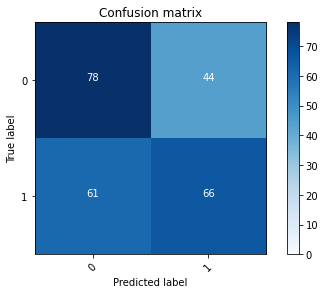

2022-08-20 18:19:02 - [Epoch Train: 37] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 49.00 s            
2022-08-20 18:19:02 - [Epoch Valid: 37] loss: 2.9849, auc: 0.5926, acc: 0.5783, time: 13.00 s


 37%|██████████████▊                         | 37/100 [41:05<1:07:54, 64.68s/it]

2022-08-20 18:19:02 - EPOCH: 38
2022-08-20 18:19:04 - Train Step 10/246, train_loss: 0.0001
2022-08-20 18:19:06 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:19:09 - Train Step 30/246, train_loss: 0.0001
2022-08-20 18:19:11 - Train Step 40/246, train_loss: 0.0001
2022-08-20 18:19:13 - Train Step 50/246, train_loss: 0.0001
2022-08-20 18:19:16 - Train Step 60/246, train_loss: 0.0001
2022-08-20 18:19:18 - Train Step 70/246, train_loss: 0.0001
2022-08-20 18:19:21 - Train Step 80/246, train_loss: 0.0001
2022-08-20 18:19:23 - Train Step 90/246, train_loss: 0.0001
2022-08-20 18:19:26 - Train Step 100/246, train_loss: 0.0001
2022-08-20 18:19:28 - Train Step 110/246, train_loss: 0.0001
2022-08-20 18:19:30 - Train Step 120/246, train_loss: 0.0001
2022-08-20 18:19:32 - Train Step 130/246, train_loss: 0.0001
2022-08-20 18:19:35 - Train Step 140/246, train_loss: 0.0001
2022-08-20 18:19:37 - Train Step 150/246, train_loss: 0.0001
2022-08-20 18:19:39 - Train Step 160/246, train_loss: 0.0001
2

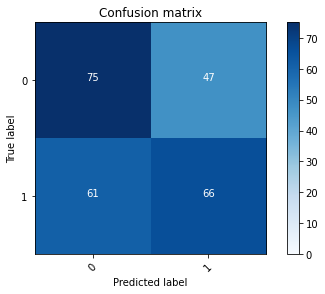

2022-08-20 18:20:13 - [Epoch Train: 38] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-20 18:20:13 - [Epoch Valid: 38] loss: 2.9997, auc: 0.5896, acc: 0.5663, time: 15.00 s


 38%|███████████████▏                        | 38/100 [42:16<1:08:52, 66.66s/it]

2022-08-20 18:20:13 - EPOCH: 39
2022-08-20 18:20:15 - Train Step 10/246, train_loss: 0.0003
2022-08-20 18:20:17 - Train Step 20/246, train_loss: 0.0002
2022-08-20 18:20:20 - Train Step 30/246, train_loss: 0.0002
2022-08-20 18:20:22 - Train Step 40/246, train_loss: 0.0001
2022-08-20 18:20:24 - Train Step 50/246, train_loss: 0.0001
2022-08-20 18:20:26 - Train Step 60/246, train_loss: 0.0001
2022-08-20 18:20:28 - Train Step 70/246, train_loss: 0.0001
2022-08-20 18:20:30 - Train Step 80/246, train_loss: 0.0001
2022-08-20 18:20:32 - Train Step 90/246, train_loss: 0.0001
2022-08-20 18:20:34 - Train Step 100/246, train_loss: 0.0001
2022-08-20 18:20:36 - Train Step 110/246, train_loss: 0.0001
2022-08-20 18:20:38 - Train Step 120/246, train_loss: 0.0001
2022-08-20 18:20:40 - Train Step 130/246, train_loss: 0.0001
2022-08-20 18:20:43 - Train Step 140/246, train_loss: 0.0001
2022-08-20 18:20:45 - Train Step 150/246, train_loss: 0.0001
2022-08-20 18:20:47 - Train Step 160/246, train_loss: 0.0001
2

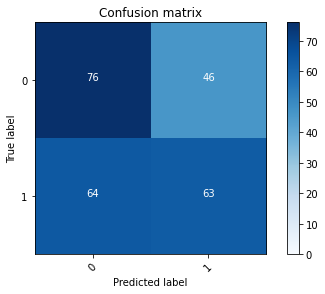

2022-08-20 18:21:20 - [Epoch Train: 39] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:21:20 - [Epoch Valid: 39] loss: 3.1031, auc: 0.5913, acc: 0.5582, time: 13.00 s


 39%|███████████████▌                        | 39/100 [43:23<1:07:48, 66.70s/it]

2022-08-20 18:21:20 - EPOCH: 40
2022-08-20 18:21:22 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:21:25 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:21:27 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:21:29 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:21:31 - Train Step 50/246, train_loss: 0.0001
2022-08-20 18:21:33 - Train Step 60/246, train_loss: 0.0001
2022-08-20 18:21:36 - Train Step 70/246, train_loss: 0.0001
2022-08-20 18:21:38 - Train Step 80/246, train_loss: 0.0001
2022-08-20 18:21:40 - Train Step 90/246, train_loss: 0.0001
2022-08-20 18:21:42 - Train Step 100/246, train_loss: 0.0001
2022-08-20 18:21:44 - Train Step 110/246, train_loss: 0.0001
2022-08-20 18:21:47 - Train Step 120/246, train_loss: 0.0001
2022-08-20 18:21:49 - Train Step 130/246, train_loss: 0.0001
2022-08-20 18:21:51 - Train Step 140/246, train_loss: 0.0001
2022-08-20 18:21:53 - Train Step 150/246, train_loss: 0.0001
2022-08-20 18:21:56 - Train Step 160/246, train_loss: 0.0001
2

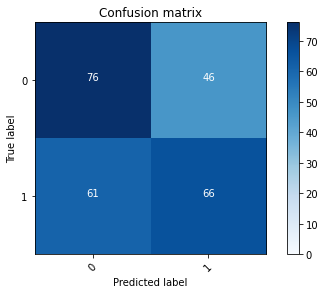

2022-08-20 18:22:28 - [Epoch Train: 40] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 18:22:28 - [Epoch Valid: 40] loss: 3.0810, auc: 0.5932, acc: 0.5703, time: 13.00 s


 40%|████████████████                        | 40/100 [44:32<1:07:12, 67.20s/it]

2022-08-20 18:22:28 - EPOCH: 41
2022-08-20 18:22:31 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:22:33 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:22:35 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:22:37 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:22:40 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:22:42 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:22:44 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:22:46 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:22:48 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:22:50 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:22:53 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:22:55 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:22:57 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:22:59 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:23:01 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:23:03 - Train Step 160/246, train_loss: 0.0000
2

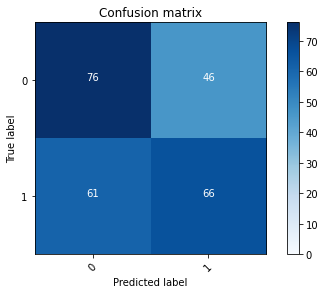

2022-08-20 18:23:35 - [Epoch Train: 41] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:23:35 - [Epoch Valid: 41] loss: 3.0033, auc: 0.5953, acc: 0.5703, time: 13.00 s


 41%|████████████████▍                       | 41/100 [45:38<1:05:53, 67.02s/it]

2022-08-20 18:23:35 - EPOCH: 42
2022-08-20 18:23:37 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:23:40 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:23:42 - Train Step 30/246, train_loss: 0.0001
2022-08-20 18:23:44 - Train Step 40/246, train_loss: 0.0001
2022-08-20 18:23:46 - Train Step 50/246, train_loss: 0.0001
2022-08-20 18:23:49 - Train Step 60/246, train_loss: 0.0001
2022-08-20 18:23:51 - Train Step 70/246, train_loss: 0.0001
2022-08-20 18:23:53 - Train Step 80/246, train_loss: 0.0001
2022-08-20 18:23:55 - Train Step 90/246, train_loss: 0.0001
2022-08-20 18:23:57 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:23:59 - Train Step 110/246, train_loss: 0.0001
2022-08-20 18:24:02 - Train Step 120/246, train_loss: 0.0001
2022-08-20 18:24:04 - Train Step 130/246, train_loss: 0.0001
2022-08-20 18:24:06 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:24:08 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:24:10 - Train Step 160/246, train_loss: 0.0000
2

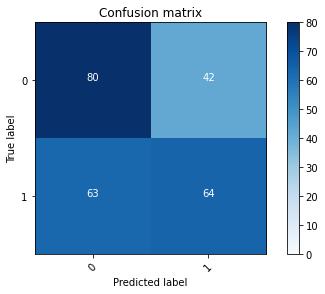

2022-08-20 18:24:43 - [Epoch Train: 42] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 18:24:43 - [Epoch Valid: 42] loss: 3.2017, auc: 0.5968, acc: 0.5783, time: 13.00 s


 42%|████████████████▊                       | 42/100 [46:46<1:04:58, 67.22s/it]

2022-08-20 18:24:43 - EPOCH: 43
2022-08-20 18:24:45 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:24:47 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:24:49 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:24:52 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:24:54 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:24:56 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:24:58 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:25:01 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:25:03 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:25:05 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:25:07 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:25:09 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:25:11 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:25:14 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:25:16 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:25:18 - Train Step 160/246, train_loss: 0.0000
2

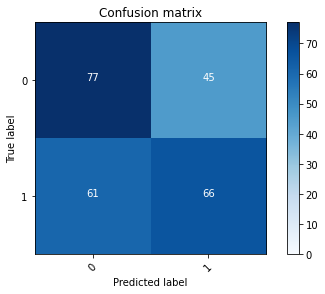

2022-08-20 18:25:50 - [Epoch Train: 43] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 18:25:50 - [Epoch Valid: 43] loss: 3.1719, auc: 0.5955, acc: 0.5743, time: 13.00 s


 43%|█████████████████▏                      | 43/100 [47:53<1:03:55, 67.30s/it]

2022-08-20 18:25:50 - EPOCH: 44
2022-08-20 18:25:52 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:25:55 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:25:57 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:25:59 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:26:01 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:26:03 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:26:05 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:26:07 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:26:09 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:26:11 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:26:13 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:26:15 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:26:18 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:26:20 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:26:22 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:26:24 - Train Step 160/246, train_loss: 0.0000
2

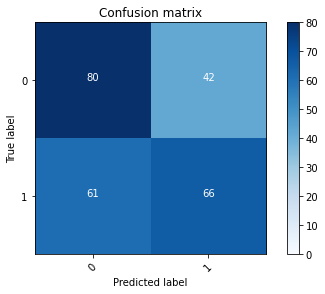

2022-08-20 18:26:57 - [Epoch Train: 44] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 18:26:57 - [Epoch Valid: 44] loss: 3.1506, auc: 0.5949, acc: 0.5863, time: 14.00 s
2022-08-20 18:26:57 - acc improved from 0.5863 to 0.5863. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e44-loss3.151-acc0.586-auc0.595.pth'


 44%|█████████████████▌                      | 44/100 [49:00<1:02:42, 67.19s/it]

2022-08-20 18:26:57 - EPOCH: 45
2022-08-20 18:26:59 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:27:02 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:27:04 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:27:06 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:27:08 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:27:10 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:27:12 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:27:15 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:27:17 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:27:19 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:27:21 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:27:23 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:27:25 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:27:27 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:27:30 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:27:32 - Train Step 160/246, train_loss: 0.0000
2

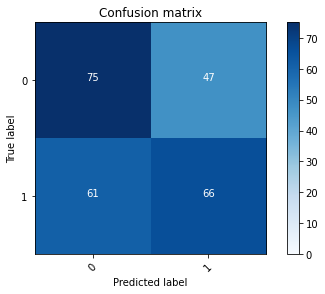

2022-08-20 18:28:03 - [Epoch Train: 45] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:28:03 - [Epoch Valid: 45] loss: 3.1155, auc: 0.5949, acc: 0.5663, time: 13.00 s


 45%|██████████████████                      | 45/100 [50:07<1:01:24, 66.99s/it]

2022-08-20 18:28:03 - EPOCH: 46
2022-08-20 18:28:06 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:28:08 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:28:10 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:28:13 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:28:15 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:28:17 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:28:19 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:28:21 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:28:23 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:28:26 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:28:28 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:28:30 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:28:32 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:28:34 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:28:36 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:28:38 - Train Step 160/246, train_loss: 0.0000
2

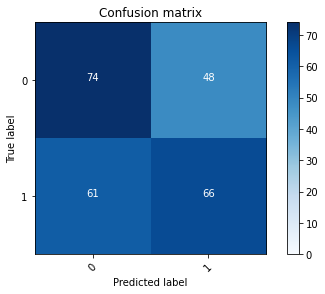

2022-08-20 18:29:11 - [Epoch Train: 46] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:29:11 - [Epoch Valid: 46] loss: 3.3500, auc: 0.5918, acc: 0.5622, time: 14.00 s


 46%|██████████████████▍                     | 46/100 [51:14<1:00:22, 67.09s/it]

2022-08-20 18:29:11 - EPOCH: 47
2022-08-20 18:29:13 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:29:15 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:29:18 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:29:20 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:29:22 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:29:24 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:29:26 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:29:28 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:29:30 - Train Step 90/246, train_loss: 0.0001
2022-08-20 18:29:33 - Train Step 100/246, train_loss: 0.0001
2022-08-20 18:29:35 - Train Step 110/246, train_loss: 0.0001
2022-08-20 18:29:37 - Train Step 120/246, train_loss: 0.0001
2022-08-20 18:29:39 - Train Step 130/246, train_loss: 0.0001
2022-08-20 18:29:41 - Train Step 140/246, train_loss: 0.0001
2022-08-20 18:29:43 - Train Step 150/246, train_loss: 0.0001
2022-08-20 18:29:45 - Train Step 160/246, train_loss: 0.0001
2

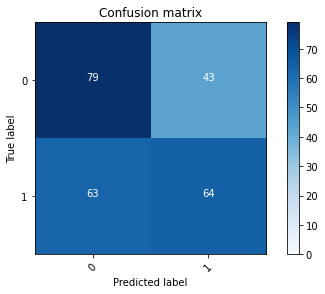

2022-08-20 18:30:18 - [Epoch Train: 47] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:30:18 - [Epoch Valid: 47] loss: 3.1401, auc: 0.5984, acc: 0.5743, time: 14.00 s


 47%|███████████████████▋                      | 47/100 [52:21<59:19, 67.17s/it]

2022-08-20 18:30:18 - EPOCH: 48
2022-08-20 18:30:21 - Train Step 10/246, train_loss: 0.0001
2022-08-20 18:30:23 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:30:25 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:30:27 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:30:29 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:30:32 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:30:34 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:30:36 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:30:38 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:30:40 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:30:42 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:30:45 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:30:47 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:30:49 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:30:51 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:30:53 - Train Step 160/246, train_loss: 0.0000
2

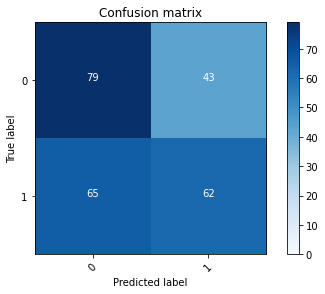

2022-08-20 18:31:25 - [Epoch Train: 48] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:31:25 - [Epoch Valid: 48] loss: 3.2937, auc: 0.6050, acc: 0.5663, time: 13.00 s


 48%|████████████████████▏                     | 48/100 [53:29<58:11, 67.14s/it]

2022-08-20 18:31:25 - EPOCH: 49
2022-08-20 18:31:28 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:31:30 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:31:32 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:31:34 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:31:37 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:31:39 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:31:41 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:31:43 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:31:45 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:31:48 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:31:50 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:31:52 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:31:54 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:31:57 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:31:59 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:32:01 - Train Step 160/246, train_loss: 0.0000
2

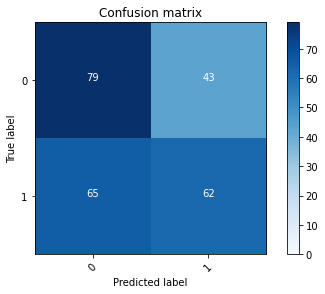

2022-08-20 18:32:34 - [Epoch Train: 49] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 18:32:34 - [Epoch Valid: 49] loss: 3.2488, auc: 0.6053, acc: 0.5663, time: 14.00 s


 49%|████████████████████▌                     | 49/100 [54:37<57:30, 67.65s/it]

2022-08-20 18:32:34 - EPOCH: 50
2022-08-20 18:32:36 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:32:39 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:32:41 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:32:43 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:32:45 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:32:47 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:32:49 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:32:51 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:32:54 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:32:56 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:32:58 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:33:00 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:33:02 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:33:05 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:33:07 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:33:09 - Train Step 160/246, train_loss: 0.0000
2

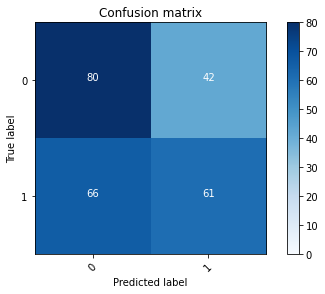

2022-08-20 18:33:42 - [Epoch Train: 50] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:33:42 - [Epoch Valid: 50] loss: 3.2288, auc: 0.6039, acc: 0.5663, time: 14.00 s


 50%|█████████████████████                     | 50/100 [55:45<56:25, 67.71s/it]

2022-08-20 18:33:42 - EPOCH: 51
2022-08-20 18:33:44 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:33:46 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:33:49 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:33:51 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:33:53 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:33:55 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:33:57 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:33:59 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:34:02 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:34:04 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:34:06 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:34:08 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:34:10 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:34:12 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:34:14 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:34:17 - Train Step 160/246, train_loss: 0.0000
2

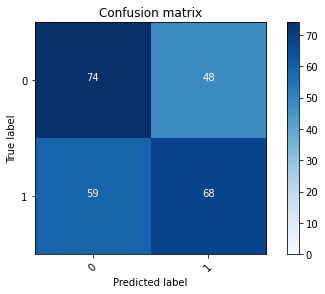

2022-08-20 18:34:49 - [Epoch Train: 51] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:34:49 - [Epoch Valid: 51] loss: 3.2719, auc: 0.6078, acc: 0.5703, time: 14.00 s


 51%|█████████████████████▍                    | 51/100 [56:53<55:14, 67.65s/it]

2022-08-20 18:34:49 - EPOCH: 52
2022-08-20 18:34:52 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:34:54 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:34:56 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:34:58 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:35:00 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:35:02 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:35:04 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:35:07 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:35:09 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:35:11 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:35:13 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:35:15 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:35:17 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:35:19 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:35:21 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:35:23 - Train Step 160/246, train_loss: 0.0000
2

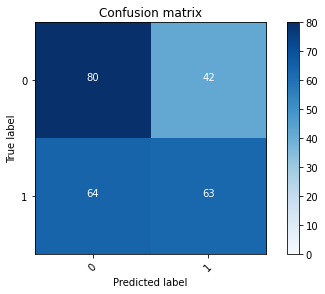

2022-08-20 18:35:56 - [Epoch Train: 52] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 18:35:56 - [Epoch Valid: 52] loss: 3.5520, auc: 0.6002, acc: 0.5743, time: 14.00 s


 52%|█████████████████████▊                    | 52/100 [57:59<53:47, 67.24s/it]

2022-08-20 18:35:56 - EPOCH: 53
2022-08-20 18:35:58 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:36:00 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:36:03 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:36:05 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:36:07 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:36:09 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:36:11 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:36:13 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:36:16 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:36:18 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:36:20 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:36:22 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:36:24 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:36:26 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:36:29 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:36:31 - Train Step 160/246, train_loss: 0.0000
2

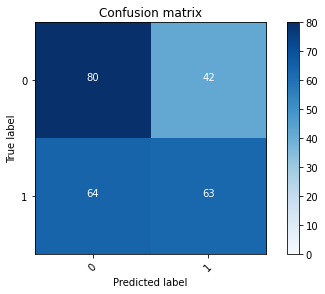

2022-08-20 18:37:03 - [Epoch Train: 53] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:37:03 - [Epoch Valid: 53] loss: 3.5108, auc: 0.5989, acc: 0.5743, time: 13.00 s


 53%|██████████████████████▎                   | 53/100 [59:06<52:37, 67.19s/it]

2022-08-20 18:37:03 - EPOCH: 54
2022-08-20 18:37:05 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:37:07 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:37:09 - Train Step 30/246, train_loss: 0.0001
2022-08-20 18:37:11 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:37:13 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:37:15 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:37:17 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:37:19 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:37:21 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:37:23 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:37:26 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:37:28 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:37:30 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:37:32 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:37:34 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:37:36 - Train Step 160/246, train_loss: 0.0000
2

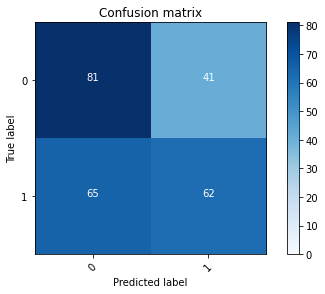

2022-08-20 18:38:08 - [Epoch Train: 54] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 18:38:08 - [Epoch Valid: 54] loss: 3.4285, auc: 0.5991, acc: 0.5743, time: 14.00 s


 54%|█████████████████████▌                  | 54/100 [1:00:11<50:58, 66.48s/it]

2022-08-20 18:38:08 - EPOCH: 55
2022-08-20 18:38:10 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:38:12 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:38:14 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:38:17 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:38:19 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:38:21 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:38:23 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:38:25 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:38:27 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:38:29 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:38:31 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:38:33 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:38:35 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:38:37 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:38:39 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:38:41 - Train Step 160/246, train_loss: 0.0000
2

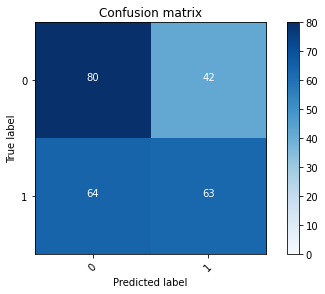

2022-08-20 18:39:12 - [Epoch Train: 55] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:39:12 - [Epoch Valid: 55] loss: 3.4752, auc: 0.5975, acc: 0.5743, time: 13.00 s


 55%|██████████████████████                  | 55/100 [1:01:16<49:27, 65.94s/it]

2022-08-20 18:39:12 - EPOCH: 56
2022-08-20 18:39:15 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:39:17 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:39:19 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:39:22 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:39:24 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:39:26 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:39:28 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:39:31 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:39:33 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:39:35 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:39:37 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:39:39 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:39:41 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:39:43 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:39:46 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:39:48 - Train Step 160/246, train_loss: 0.0000
2

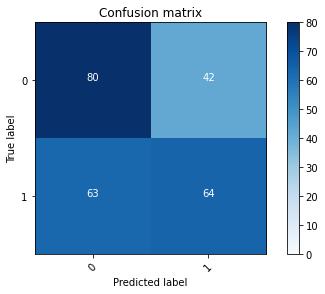

2022-08-20 18:40:20 - [Epoch Train: 56] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 18:40:20 - [Epoch Valid: 56] loss: 3.6728, auc: 0.5994, acc: 0.5783, time: 13.00 s


 56%|██████████████████████▍                 | 56/100 [1:02:23<48:44, 66.47s/it]

2022-08-20 18:40:20 - EPOCH: 57
2022-08-20 18:40:22 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:40:25 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:40:27 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:40:29 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:40:32 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:40:34 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:40:36 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:40:38 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:40:41 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:40:43 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:40:45 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:40:47 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:40:49 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:40:52 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:40:54 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:40:56 - Train Step 160/246, train_loss: 0.0000
2

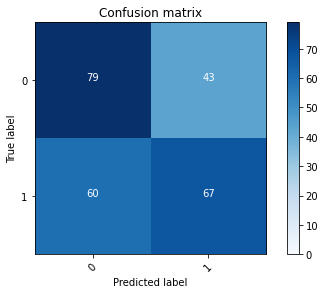

2022-08-20 18:41:29 - [Epoch Train: 57] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-20 18:41:29 - [Epoch Valid: 57] loss: 3.4748, auc: 0.6010, acc: 0.5863, time: 13.00 s
2022-08-20 18:41:29 - acc improved from 0.5863 to 0.5863. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e57-loss3.475-acc0.586-auc0.601.pth'


 57%|██████████████████████▊                 | 57/100 [1:03:32<48:07, 67.15s/it]

2022-08-20 18:41:29 - EPOCH: 58
2022-08-20 18:41:31 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:41:33 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:41:36 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:41:38 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:41:40 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:41:42 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:41:44 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:41:47 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:41:49 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:41:51 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:41:53 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:41:55 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:41:58 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:42:00 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:42:02 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:42:04 - Train Step 160/246, train_loss: 0.0000
2

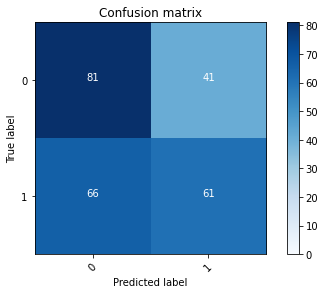

2022-08-20 18:42:36 - [Epoch Train: 58] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:42:36 - [Epoch Valid: 58] loss: 3.6573, auc: 0.5981, acc: 0.5703, time: 13.00 s


 58%|███████████████████████▏                | 58/100 [1:04:39<47:02, 67.20s/it]

2022-08-20 18:42:36 - EPOCH: 59
2022-08-20 18:42:39 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:42:41 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:42:43 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:42:45 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:42:47 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:42:50 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:42:52 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:42:54 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:42:56 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:42:58 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:43:01 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:43:03 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:43:05 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:43:07 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:43:10 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:43:12 - Train Step 160/246, train_loss: 0.0000
2

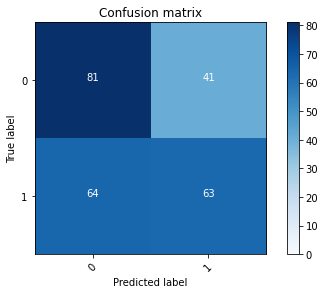

2022-08-20 18:43:44 - [Epoch Train: 59] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 18:43:44 - [Epoch Valid: 59] loss: 4.1693, auc: 0.5987, acc: 0.5783, time: 14.00 s


 59%|███████████████████████▌                | 59/100 [1:05:48<46:09, 67.55s/it]

2022-08-20 18:43:44 - EPOCH: 60
2022-08-20 18:43:47 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:43:49 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:43:51 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:43:54 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:43:56 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:43:58 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:44:00 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:44:02 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:44:05 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:44:07 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:44:09 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:44:11 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:44:13 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:44:15 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:44:17 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:44:20 - Train Step 160/246, train_loss: 0.0000
2

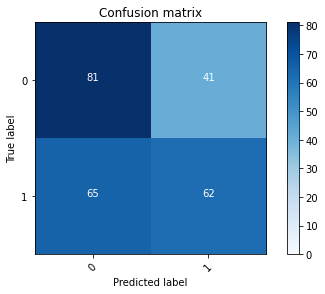

2022-08-20 18:44:52 - [Epoch Train: 60] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 18:44:52 - [Epoch Valid: 60] loss: 3.8272, auc: 0.5999, acc: 0.5743, time: 13.00 s


 60%|████████████████████████                | 60/100 [1:06:56<45:07, 67.68s/it]

2022-08-20 18:44:52 - EPOCH: 61
2022-08-20 18:44:55 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:44:57 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:44:59 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:45:01 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:45:03 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:45:06 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:45:08 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:45:10 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:45:12 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:45:14 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:45:16 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:45:18 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:45:20 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:45:22 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:45:25 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:45:27 - Train Step 160/246, train_loss: 0.0000
2

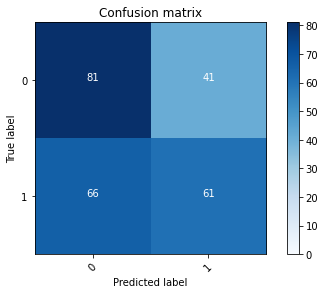

2022-08-20 18:45:59 - [Epoch Train: 61] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 18:45:59 - [Epoch Valid: 61] loss: 3.9249, auc: 0.5970, acc: 0.5703, time: 13.00 s


 61%|████████████████████████▍               | 61/100 [1:08:02<43:46, 67.34s/it]

2022-08-20 18:45:59 - EPOCH: 62
2022-08-20 18:46:01 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:46:04 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:46:06 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:46:08 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:46:10 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:46:12 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:46:14 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:46:17 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:46:19 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:46:21 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:46:23 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:46:25 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:46:27 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:46:29 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:46:32 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:46:34 - Train Step 160/246, train_loss: 0.0000
2

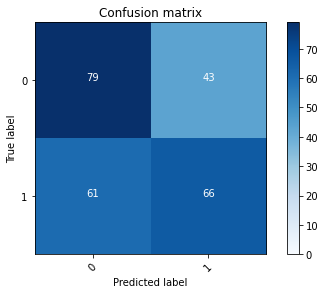

2022-08-20 18:47:06 - [Epoch Train: 62] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 18:47:06 - [Epoch Valid: 62] loss: 3.8767, auc: 0.5973, acc: 0.5823, time: 14.00 s


 62%|████████████████████████▊               | 62/100 [1:09:09<42:36, 67.28s/it]

2022-08-20 18:47:06 - EPOCH: 63
2022-08-20 18:47:09 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:47:11 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:47:13 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:47:15 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:47:17 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:47:19 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:47:21 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:47:23 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:47:26 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:47:28 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:47:30 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:47:32 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:47:34 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:47:36 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:47:38 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:47:41 - Train Step 160/246, train_loss: 0.0000
2

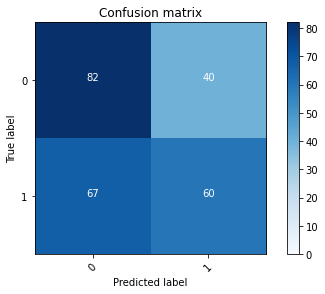

2022-08-20 18:48:13 - [Epoch Train: 63] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 18:48:13 - [Epoch Valid: 63] loss: 3.7662, auc: 0.5966, acc: 0.5703, time: 13.00 s


 63%|█████████████████████████▏              | 63/100 [1:10:16<41:23, 67.13s/it]

2022-08-20 18:48:13 - EPOCH: 64
2022-08-20 18:48:15 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:48:18 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:48:20 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:48:22 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:48:24 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:48:26 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:48:28 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:48:31 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:48:33 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:48:35 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:48:37 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:48:39 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:48:41 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:48:44 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:48:46 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:48:48 - Train Step 160/246, train_loss: 0.0000
2

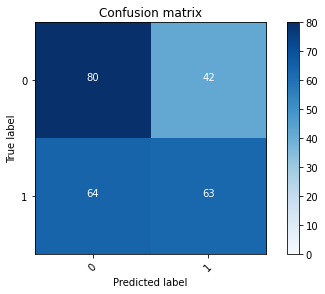

2022-08-20 18:49:19 - [Epoch Train: 64] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 18:49:19 - [Epoch Valid: 64] loss: 4.0146, auc: 0.6011, acc: 0.5743, time: 13.00 s


 64%|█████████████████████████▌              | 64/100 [1:11:23<40:10, 66.96s/it]

2022-08-20 18:49:19 - EPOCH: 65
2022-08-20 18:49:22 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:49:24 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:49:26 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:49:28 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:49:30 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:49:32 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:49:34 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:49:36 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:49:38 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:49:41 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:49:43 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:49:45 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:49:47 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:49:49 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:49:51 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:49:53 - Train Step 160/246, train_loss: 0.0000
2

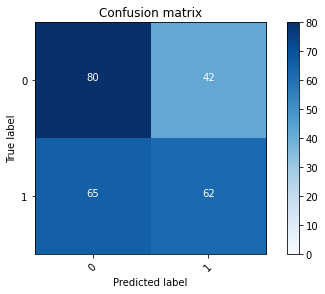

2022-08-20 18:50:26 - [Epoch Train: 65] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:50:26 - [Epoch Valid: 65] loss: 3.9545, auc: 0.6019, acc: 0.5703, time: 14.00 s


 65%|██████████████████████████              | 65/100 [1:12:29<38:54, 66.70s/it]

2022-08-20 18:50:26 - EPOCH: 66
2022-08-20 18:50:28 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:50:30 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:50:32 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:50:34 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:50:37 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:50:39 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:50:41 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:50:43 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:50:45 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:50:48 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:50:50 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:50:52 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:50:54 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:50:56 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:50:58 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:51:01 - Train Step 160/246, train_loss: 0.0000
2

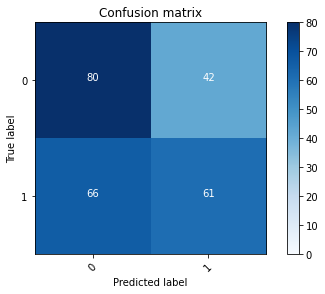

2022-08-20 18:51:33 - [Epoch Train: 66] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:51:33 - [Epoch Valid: 66] loss: 4.0896, auc: 0.6013, acc: 0.5663, time: 13.00 s


 66%|██████████████████████████▍             | 66/100 [1:13:37<37:59, 67.05s/it]

2022-08-20 18:51:33 - EPOCH: 67
2022-08-20 18:51:36 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:51:38 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:51:40 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:51:42 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:51:44 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:51:46 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:51:49 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:51:51 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:51:53 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:51:55 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:51:57 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:51:59 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:52:01 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:52:03 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:52:05 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:52:08 - Train Step 160/246, train_loss: 0.0000
2

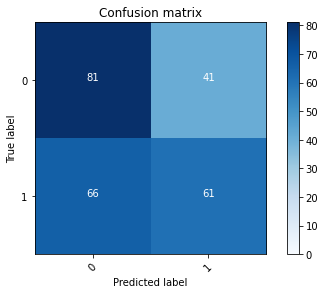

2022-08-20 18:52:40 - [Epoch Train: 67] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 18:52:40 - [Epoch Valid: 67] loss: 3.9326, auc: 0.5972, acc: 0.5703, time: 13.00 s


 67%|██████████████████████████▊             | 67/100 [1:14:43<36:45, 66.83s/it]

2022-08-20 18:52:40 - EPOCH: 68
2022-08-20 18:52:42 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:52:44 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:52:46 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:52:48 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:52:50 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:52:53 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:52:55 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:52:57 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:52:59 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:53:01 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:53:03 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:53:05 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:53:07 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:53:09 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:53:11 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:53:13 - Train Step 160/246, train_loss: 0.0000
2

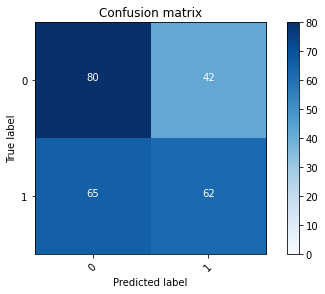

2022-08-20 18:53:45 - [Epoch Train: 68] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 18:53:45 - [Epoch Valid: 68] loss: 4.2027, auc: 0.5964, acc: 0.5703, time: 13.00 s


 68%|███████████████████████████▏            | 68/100 [1:15:48<35:25, 66.42s/it]

2022-08-20 18:53:45 - EPOCH: 69
2022-08-20 18:53:48 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:53:50 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:53:52 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:53:54 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:53:56 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:53:59 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:54:01 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:54:03 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:54:05 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:54:07 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:54:09 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:54:11 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:54:14 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:54:16 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:54:18 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:54:20 - Train Step 160/246, train_loss: 0.0000
2

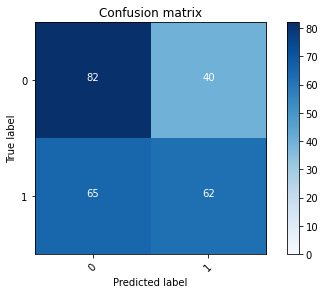

2022-08-20 18:54:51 - [Epoch Train: 69] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:54:51 - [Epoch Valid: 69] loss: 4.3084, auc: 0.5990, acc: 0.5783, time: 12.00 s


 69%|███████████████████████████▌            | 69/100 [1:16:55<34:15, 66.30s/it]

2022-08-20 18:54:51 - EPOCH: 70
2022-08-20 18:54:54 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:54:56 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:54:58 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:55:00 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:55:02 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:55:04 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:55:06 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:55:08 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:55:10 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:55:12 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:55:14 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:55:16 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:55:18 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:55:20 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:55:23 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:55:25 - Train Step 160/246, train_loss: 0.0000
2

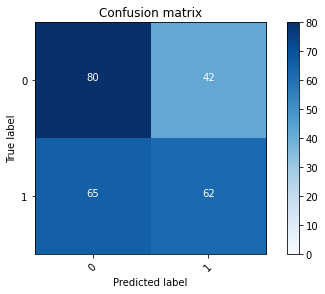

2022-08-20 18:55:56 - [Epoch Train: 70] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 18:55:56 - [Epoch Valid: 70] loss: 4.0346, auc: 0.5981, acc: 0.5703, time: 13.00 s


 70%|████████████████████████████            | 70/100 [1:17:59<32:56, 65.89s/it]

2022-08-20 18:55:56 - EPOCH: 71
2022-08-20 18:55:59 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:56:01 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:56:03 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:56:05 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:56:07 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:56:09 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:56:12 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:56:14 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:56:16 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:56:18 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:56:20 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:56:22 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:56:24 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:56:27 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:56:29 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:56:31 - Train Step 160/246, train_loss: 0.0000
2

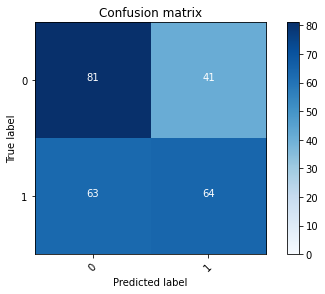

2022-08-20 18:57:03 - [Epoch Train: 71] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 18:57:03 - [Epoch Valid: 71] loss: 4.0395, auc: 0.6015, acc: 0.5823, time: 14.00 s


 71%|████████████████████████████▍           | 71/100 [1:19:07<32:01, 66.26s/it]

2022-08-20 18:57:03 - EPOCH: 72
2022-08-20 18:57:06 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:57:08 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:57:10 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:57:12 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:57:14 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:57:16 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:57:18 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:57:20 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:57:22 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:57:24 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:57:26 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:57:28 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:57:30 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:57:32 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:57:34 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:57:37 - Train Step 160/246, train_loss: 0.0000
2

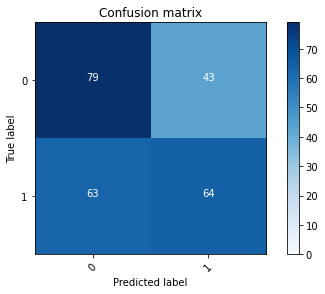

2022-08-20 18:58:09 - [Epoch Train: 72] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 18:58:09 - [Epoch Valid: 72] loss: 4.4170, auc: 0.5970, acc: 0.5743, time: 14.00 s


 72%|████████████████████████████▊           | 72/100 [1:20:12<30:46, 65.95s/it]

2022-08-20 18:58:09 - EPOCH: 73
2022-08-20 18:58:11 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:58:13 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:58:15 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:58:17 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:58:20 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:58:22 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:58:24 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:58:26 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:58:28 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:58:30 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:58:32 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:58:35 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:58:37 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:58:39 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:58:41 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:58:43 - Train Step 160/246, train_loss: 0.0000
2

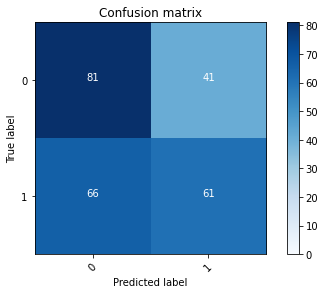

2022-08-20 18:59:15 - [Epoch Train: 73] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 18:59:15 - [Epoch Valid: 73] loss: 4.2600, auc: 0.5971, acc: 0.5703, time: 13.00 s


 73%|█████████████████████████████▏          | 73/100 [1:21:18<29:41, 65.97s/it]

2022-08-20 18:59:15 - EPOCH: 74
2022-08-20 18:59:17 - Train Step 10/246, train_loss: 0.0000
2022-08-20 18:59:19 - Train Step 20/246, train_loss: 0.0000
2022-08-20 18:59:21 - Train Step 30/246, train_loss: 0.0000
2022-08-20 18:59:23 - Train Step 40/246, train_loss: 0.0000
2022-08-20 18:59:25 - Train Step 50/246, train_loss: 0.0000
2022-08-20 18:59:28 - Train Step 60/246, train_loss: 0.0000
2022-08-20 18:59:30 - Train Step 70/246, train_loss: 0.0000
2022-08-20 18:59:32 - Train Step 80/246, train_loss: 0.0000
2022-08-20 18:59:34 - Train Step 90/246, train_loss: 0.0000
2022-08-20 18:59:36 - Train Step 100/246, train_loss: 0.0000
2022-08-20 18:59:38 - Train Step 110/246, train_loss: 0.0000
2022-08-20 18:59:40 - Train Step 120/246, train_loss: 0.0000
2022-08-20 18:59:42 - Train Step 130/246, train_loss: 0.0000
2022-08-20 18:59:45 - Train Step 140/246, train_loss: 0.0000
2022-08-20 18:59:47 - Train Step 150/246, train_loss: 0.0000
2022-08-20 18:59:49 - Train Step 160/246, train_loss: 0.0000
2

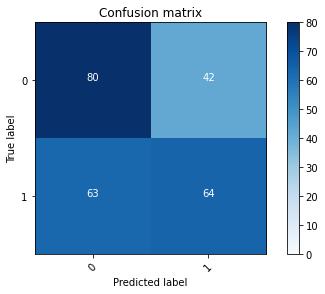

2022-08-20 19:00:21 - [Epoch Train: 74] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 19:00:21 - [Epoch Valid: 74] loss: 4.4319, auc: 0.5999, acc: 0.5783, time: 14.00 s


 74%|█████████████████████████████▌          | 74/100 [1:22:24<28:39, 66.13s/it]

2022-08-20 19:00:21 - EPOCH: 75
2022-08-20 19:00:23 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:00:25 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:00:27 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:00:29 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:00:32 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:00:34 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:00:36 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:00:38 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:00:40 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:00:42 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:00:44 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:00:46 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:00:48 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:00:50 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:00:53 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:00:55 - Train Step 160/246, train_loss: 0.0000
2

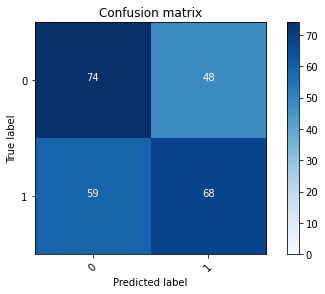

2022-08-20 19:01:27 - [Epoch Train: 75] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:01:27 - [Epoch Valid: 75] loss: 4.2670, auc: 0.6027, acc: 0.5703, time: 14.00 s


 75%|██████████████████████████████          | 75/100 [1:23:31<27:35, 66.23s/it]

2022-08-20 19:01:27 - EPOCH: 76
2022-08-20 19:01:30 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:01:32 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:01:34 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:01:36 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:01:38 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:01:40 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:01:42 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:01:44 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:01:46 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:01:48 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:01:50 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:01:52 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:01:54 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:01:56 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:01:58 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:02:00 - Train Step 160/246, train_loss: 0.0000
2

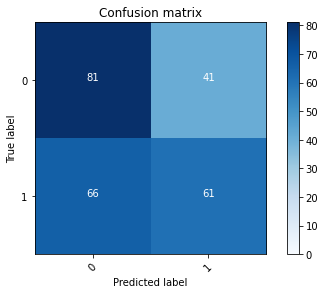

2022-08-20 19:02:31 - [Epoch Train: 76] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 19:02:31 - [Epoch Valid: 76] loss: 4.6406, auc: 0.6014, acc: 0.5703, time: 13.00 s


 76%|██████████████████████████████▍         | 76/100 [1:24:35<26:11, 65.48s/it]

2022-08-20 19:02:31 - EPOCH: 77
2022-08-20 19:02:34 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:02:36 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:02:38 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:02:40 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:02:43 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:02:45 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:02:47 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:02:49 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:02:51 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:02:54 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:02:56 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:02:58 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:03:00 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:03:03 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:03:05 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:03:07 - Train Step 160/246, train_loss: 0.0000
2

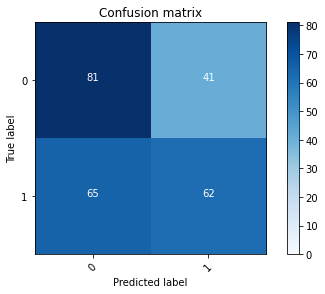

2022-08-20 19:03:39 - [Epoch Train: 77] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 19:03:39 - [Epoch Valid: 77] loss: 4.3863, auc: 0.5973, acc: 0.5743, time: 14.00 s


 77%|██████████████████████████████▊         | 77/100 [1:25:42<25:23, 66.22s/it]

2022-08-20 19:03:39 - EPOCH: 78
2022-08-20 19:03:41 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:03:44 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:03:46 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:03:48 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:03:50 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:03:52 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:03:54 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:03:56 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:03:58 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:04:00 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:04:02 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:04:04 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:04:06 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:04:09 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:04:11 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:04:13 - Train Step 160/246, train_loss: 0.0000
2

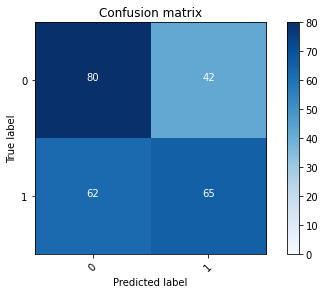

2022-08-20 19:04:45 - [Epoch Train: 78] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:04:45 - [Epoch Valid: 78] loss: 4.3614, auc: 0.5953, acc: 0.5823, time: 14.00 s


 78%|███████████████████████████████▏        | 78/100 [1:26:49<24:15, 66.17s/it]

2022-08-20 19:04:45 - EPOCH: 79
2022-08-20 19:04:48 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:04:50 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:04:52 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:04:54 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:04:56 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:04:59 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:05:01 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:05:03 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:05:05 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:05:07 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:05:09 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:05:11 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:05:14 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:05:16 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:05:18 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:05:20 - Train Step 160/246, train_loss: 0.0000
2

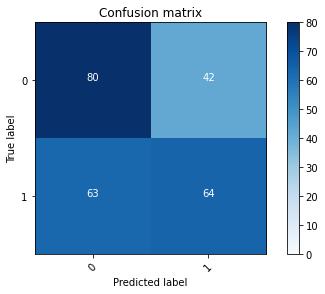

2022-08-20 19:05:52 - [Epoch Train: 79] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 19:05:52 - [Epoch Valid: 79] loss: 4.3812, auc: 0.5974, acc: 0.5783, time: 13.00 s


 79%|███████████████████████████████▌        | 79/100 [1:27:55<23:12, 66.32s/it]

2022-08-20 19:05:52 - EPOCH: 80
2022-08-20 19:05:54 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:05:57 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:05:59 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:06:01 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:06:03 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:06:05 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:06:07 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:06:10 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:06:12 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:06:14 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:06:16 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:06:18 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:06:20 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:06:22 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:06:25 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:06:27 - Train Step 160/246, train_loss: 0.0000
2

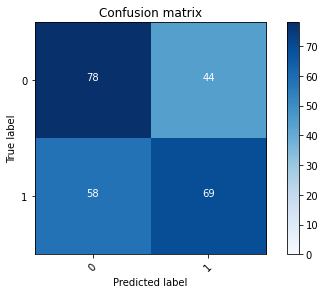

2022-08-20 19:06:59 - [Epoch Train: 80] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 19:06:59 - [Epoch Valid: 80] loss: 4.3724, auc: 0.6020, acc: 0.5904, time: 14.00 s
2022-08-20 19:06:59 - acc improved from 0.5863 to 0.5904. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e80-loss4.372-acc0.590-auc0.602.pth'


 80%|████████████████████████████████        | 80/100 [1:29:02<22:09, 66.46s/it]

2022-08-20 19:06:59 - EPOCH: 81
2022-08-20 19:07:01 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:07:03 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:07:05 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:07:07 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:07:09 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:07:11 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:07:13 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:07:15 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:07:18 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:07:20 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:07:22 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:07:24 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:07:26 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:07:28 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:07:30 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:07:32 - Train Step 160/246, train_loss: 0.0000
2

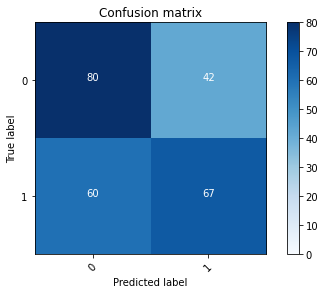

2022-08-20 19:08:03 - [Epoch Train: 81] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:08:03 - [Epoch Valid: 81] loss: 4.4782, auc: 0.6045, acc: 0.5904, time: 13.00 s
2022-08-20 19:08:03 - acc improved from 0.5904 to 0.5904. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e81-loss4.478-acc0.590-auc0.604.pth'


 81%|████████████████████████████████▍       | 81/100 [1:30:07<20:52, 65.91s/it]

2022-08-20 19:08:03 - EPOCH: 82
2022-08-20 19:08:06 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:08:08 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:08:10 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:08:12 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:08:14 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:08:16 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:08:19 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:08:21 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:08:23 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:08:25 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:08:27 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:08:29 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:08:31 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:08:33 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:08:36 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:08:38 - Train Step 160/246, train_loss: 0.0000
2

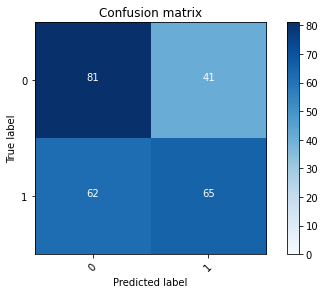

2022-08-20 19:09:10 - [Epoch Train: 82] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 19:09:10 - [Epoch Valid: 82] loss: 4.5118, auc: 0.6097, acc: 0.5863, time: 13.00 s


 82%|████████████████████████████████▊       | 82/100 [1:31:13<19:50, 66.15s/it]

2022-08-20 19:09:10 - EPOCH: 83
2022-08-20 19:09:12 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:09:14 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:09:17 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:09:19 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:09:21 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:09:23 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:09:25 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:09:27 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:09:29 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:09:31 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:09:33 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:09:35 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:09:37 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:09:39 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:09:41 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:09:43 - Train Step 160/246, train_loss: 0.0000
2

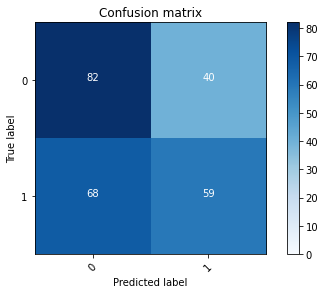

2022-08-20 19:10:14 - [Epoch Train: 83] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 19:10:14 - [Epoch Valid: 83] loss: 4.5523, auc: 0.6078, acc: 0.5663, time: 13.00 s


 83%|█████████████████████████████████▏      | 83/100 [1:32:18<18:35, 65.63s/it]

2022-08-20 19:10:14 - EPOCH: 84
2022-08-20 19:10:17 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:10:19 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:10:21 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:10:23 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:10:25 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:10:27 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:10:29 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:10:31 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:10:33 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:10:35 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:10:37 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:10:40 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:10:42 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:10:44 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:10:46 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:10:48 - Train Step 160/246, train_loss: 0.0000
2

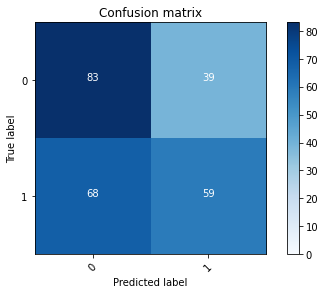

2022-08-20 19:11:20 - [Epoch Train: 84] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:11:20 - [Epoch Valid: 84] loss: 4.7563, auc: 0.6040, acc: 0.5703, time: 14.00 s


 84%|█████████████████████████████████▌      | 84/100 [1:33:23<17:29, 65.61s/it]

2022-08-20 19:11:20 - EPOCH: 85
2022-08-20 19:11:22 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:11:24 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:11:27 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:11:29 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:11:31 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:11:33 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:11:35 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:11:37 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:11:39 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:11:41 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:11:43 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:11:45 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:11:47 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:11:49 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:11:51 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:11:53 - Train Step 160/246, train_loss: 0.0000
2

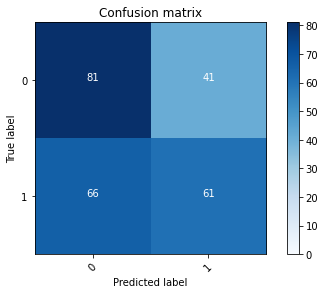

2022-08-20 19:12:26 - [Epoch Train: 85] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 19:12:26 - [Epoch Valid: 85] loss: 4.8141, auc: 0.6043, acc: 0.5703, time: 14.00 s


 85%|██████████████████████████████████      | 85/100 [1:34:30<16:27, 65.81s/it]

2022-08-20 19:12:26 - EPOCH: 86
2022-08-20 19:12:29 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:12:31 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:12:33 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:12:35 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:12:38 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:12:40 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:12:42 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:12:44 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:12:46 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:12:48 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:12:50 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:12:52 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:12:54 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:12:56 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:12:58 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:13:00 - Train Step 160/246, train_loss: 0.0000
2

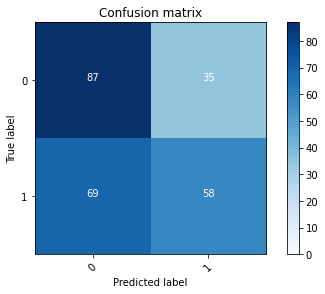

2022-08-20 19:13:32 - [Epoch Train: 86] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:13:32 - [Epoch Valid: 86] loss: 5.1907, auc: 0.6058, acc: 0.5823, time: 14.00 s


 86%|██████████████████████████████████▍     | 86/100 [1:35:35<15:21, 65.81s/it]

2022-08-20 19:13:32 - EPOCH: 87
2022-08-20 19:13:35 - Train Step 10/246, train_loss: 0.0001
2022-08-20 19:13:37 - Train Step 20/246, train_loss: 0.0001
2022-08-20 19:13:39 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:13:41 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:13:43 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:13:45 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:13:48 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:13:50 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:13:52 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:13:54 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:13:56 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:13:58 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:14:00 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:14:02 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:14:04 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:14:07 - Train Step 160/246, train_loss: 0.0000
2

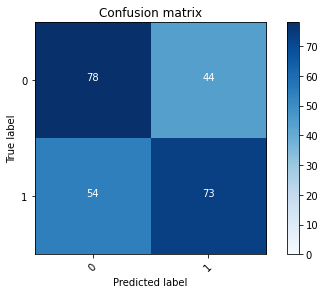

2022-08-20 19:14:38 - [Epoch Train: 87] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 19:14:38 - [Epoch Valid: 87] loss: 5.0897, auc: 0.6051, acc: 0.6064, time: 14.00 s
2022-08-20 19:14:38 - acc improved from 0.5904 to 0.6064. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e87-loss5.090-acc0.606-auc0.605.pth'


 87%|██████████████████████████████████▊     | 87/100 [1:36:42<14:17, 65.96s/it]

2022-08-20 19:14:38 - EPOCH: 88
2022-08-20 19:14:41 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:14:43 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:14:45 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:14:47 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:14:49 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:14:51 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:14:53 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:14:55 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:14:57 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:14:59 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:15:01 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:15:03 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:15:05 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:15:08 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:15:10 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:15:12 - Train Step 160/246, train_loss: 0.0000
2

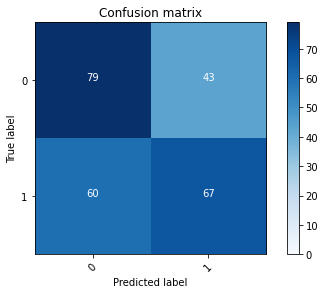

2022-08-20 19:15:43 - [Epoch Train: 88] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:15:43 - [Epoch Valid: 88] loss: 5.3410, auc: 0.5992, acc: 0.5863, time: 13.00 s


 88%|███████████████████████████████████▏    | 88/100 [1:37:46<13:05, 65.47s/it]

2022-08-20 19:15:43 - EPOCH: 89
2022-08-20 19:15:45 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:15:47 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:15:49 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:15:52 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:15:54 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:15:56 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:15:58 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:16:00 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:16:02 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:16:04 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:16:06 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:16:08 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:16:10 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:16:12 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:16:15 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:16:17 - Train Step 160/246, train_loss: 0.0000
2

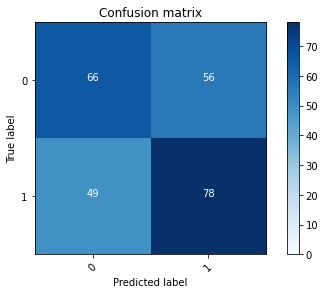

2022-08-20 19:16:49 - [Epoch Train: 89] loss: 0.0017, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 19:16:49 - [Epoch Valid: 89] loss: 5.4469, auc: 0.6048, acc: 0.5783, time: 14.00 s


 89%|███████████████████████████████████▌    | 89/100 [1:38:52<12:02, 65.68s/it]

2022-08-20 19:16:49 - EPOCH: 90
2022-08-20 19:16:51 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:16:53 - Train Step 20/246, train_loss: 0.0124
2022-08-20 19:16:55 - Train Step 30/246, train_loss: 0.0126
2022-08-20 19:16:58 - Train Step 40/246, train_loss: 0.0094
2022-08-20 19:17:00 - Train Step 50/246, train_loss: 0.0076
2022-08-20 19:17:02 - Train Step 60/246, train_loss: 0.0063
2022-08-20 19:17:04 - Train Step 70/246, train_loss: 0.0054
2022-08-20 19:17:06 - Train Step 80/246, train_loss: 0.0047
2022-08-20 19:17:08 - Train Step 90/246, train_loss: 0.0042
2022-08-20 19:17:10 - Train Step 100/246, train_loss: 0.0038
2022-08-20 19:17:12 - Train Step 110/246, train_loss: 0.0034
2022-08-20 19:17:14 - Train Step 120/246, train_loss: 0.0032
2022-08-20 19:17:16 - Train Step 130/246, train_loss: 0.0029
2022-08-20 19:17:18 - Train Step 140/246, train_loss: 0.0027
2022-08-20 19:17:20 - Train Step 150/246, train_loss: 0.0025
2022-08-20 19:17:22 - Train Step 160/246, train_loss: 0.0024
2

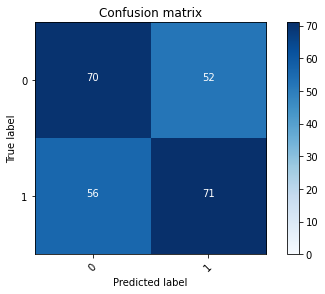

2022-08-20 19:17:54 - [Epoch Train: 90] loss: 0.0016, auc: 1.0000, acc: 0.9980, time: 51.00 s            
2022-08-20 19:17:54 - [Epoch Valid: 90] loss: 4.8484, auc: 0.6005, acc: 0.5663, time: 13.00 s


 90%|████████████████████████████████████    | 90/100 [1:39:57<10:55, 65.52s/it]

2022-08-20 19:17:54 - EPOCH: 91
2022-08-20 19:17:56 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:17:58 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:18:00 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:18:03 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:18:05 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:18:07 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:18:09 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:18:11 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:18:13 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:18:15 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:18:17 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:18:19 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:18:21 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:18:23 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:18:25 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:18:27 - Train Step 160/246, train_loss: 0.0000
2

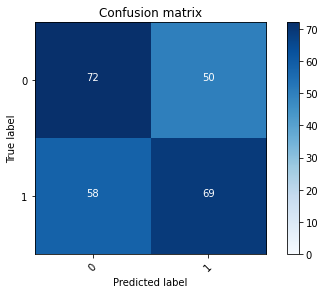

2022-08-20 19:18:59 - [Epoch Train: 91] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 19:18:59 - [Epoch Valid: 91] loss: 4.9603, auc: 0.6005, acc: 0.5663, time: 14.00 s


 91%|████████████████████████████████████▍   | 91/100 [1:41:02<09:48, 65.37s/it]

2022-08-20 19:18:59 - EPOCH: 92
2022-08-20 19:19:01 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:19:03 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:19:06 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:19:08 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:19:10 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:19:12 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:19:14 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:19:16 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:19:18 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:19:20 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:19:22 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:19:24 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:19:26 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:19:28 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:19:30 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:19:32 - Train Step 160/246, train_loss: 0.0000
2

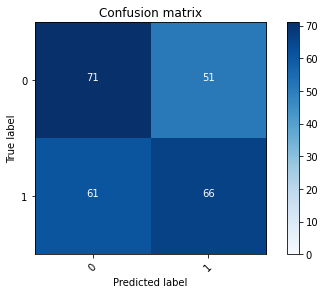

2022-08-20 19:20:04 - [Epoch Train: 92] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 19:20:04 - [Epoch Valid: 92] loss: 4.9091, auc: 0.6006, acc: 0.5502, time: 13.00 s


 92%|████████████████████████████████████▊   | 92/100 [1:42:07<08:41, 65.13s/it]

2022-08-20 19:20:04 - EPOCH: 93
2022-08-20 19:20:06 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:20:08 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:20:10 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:20:13 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:20:15 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:20:17 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:20:19 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:20:21 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:20:23 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:20:26 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:20:28 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:20:30 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:20:32 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:20:34 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:20:36 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:20:39 - Train Step 160/246, train_loss: 0.0000
2

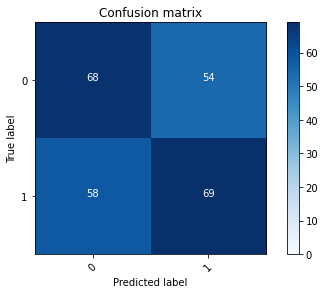

2022-08-20 19:21:12 - [Epoch Train: 93] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 19:21:12 - [Epoch Valid: 93] loss: 4.8842, auc: 0.6003, acc: 0.5502, time: 14.00 s


 93%|█████████████████████████████████████▏  | 93/100 [1:43:15<07:41, 65.98s/it]

2022-08-20 19:21:12 - EPOCH: 94
2022-08-20 19:21:14 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:21:16 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:21:19 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:21:21 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:21:23 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:21:25 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:21:27 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:21:29 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:21:32 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:21:34 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:21:36 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:21:38 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:21:40 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:21:43 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:21:45 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:21:47 - Train Step 160/246, train_loss: 0.0000
2

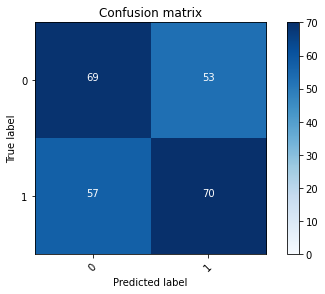

2022-08-20 19:22:19 - [Epoch Train: 94] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 19:22:19 - [Epoch Valid: 94] loss: 4.9894, auc: 0.5998, acc: 0.5582, time: 14.00 s


 94%|█████████████████████████████████████▌  | 94/100 [1:44:22<06:38, 66.46s/it]

2022-08-20 19:22:19 - EPOCH: 95
2022-08-20 19:22:22 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:22:24 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:22:26 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:22:28 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:22:30 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:22:33 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:22:35 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:22:37 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:22:39 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:22:41 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:22:43 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:22:46 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:22:48 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:22:50 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:22:52 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:22:54 - Train Step 160/246, train_loss: 0.0000
2

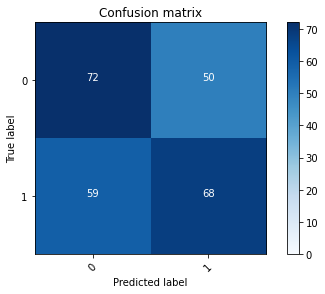

2022-08-20 19:23:26 - [Epoch Train: 95] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 19:23:26 - [Epoch Valid: 95] loss: 4.8313, auc: 0.6009, acc: 0.5622, time: 13.00 s


 95%|██████████████████████████████████████  | 95/100 [1:45:30<05:33, 66.70s/it]

2022-08-20 19:23:26 - EPOCH: 96
2022-08-20 19:23:29 - Train Step 10/246, train_loss: 0.0001
2022-08-20 19:23:31 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:23:33 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:23:35 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:23:37 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:23:39 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:23:41 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:23:43 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:23:45 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:23:48 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:23:50 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:23:52 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:23:54 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:23:56 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:23:58 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:24:01 - Train Step 160/246, train_loss: 0.0000
2

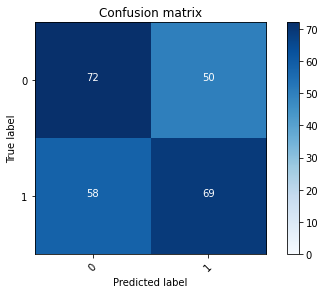

2022-08-20 19:24:33 - [Epoch Train: 96] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 19:24:33 - [Epoch Valid: 96] loss: 4.7169, auc: 0.6024, acc: 0.5663, time: 13.00 s


 96%|██████████████████████████████████████▍ | 96/100 [1:46:36<04:26, 66.59s/it]

2022-08-20 19:24:33 - EPOCH: 97
2022-08-20 19:24:35 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:24:37 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:24:40 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:24:42 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:24:44 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:24:46 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:24:48 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:24:51 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:24:53 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:24:55 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:24:57 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:24:59 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:25:02 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:25:04 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:25:06 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:25:08 - Train Step 160/246, train_loss: 0.0000
2

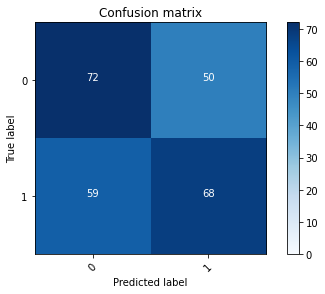

2022-08-20 19:25:42 - [Epoch Train: 97] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 19:25:42 - [Epoch Valid: 97] loss: 4.9890, auc: 0.6027, acc: 0.5622, time: 14.00 s


 97%|██████████████████████████████████████▊ | 97/100 [1:47:45<03:21, 67.25s/it]

2022-08-20 19:25:42 - EPOCH: 98
2022-08-20 19:25:44 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:25:46 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:25:48 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:25:51 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:25:53 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:25:55 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:25:57 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:25:59 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:26:01 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:26:04 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:26:06 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:26:08 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:26:10 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:26:12 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:26:14 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:26:16 - Train Step 160/246, train_loss: 0.0000
2

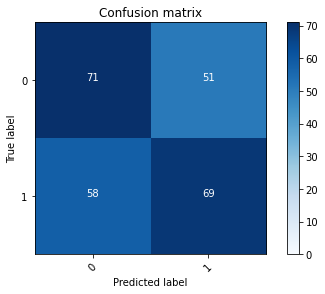

2022-08-20 19:26:49 - [Epoch Train: 98] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 19:26:49 - [Epoch Valid: 98] loss: 4.7917, auc: 0.5987, acc: 0.5622, time: 14.00 s


 98%|███████████████████████████████████████▏| 98/100 [1:48:53<02:14, 67.44s/it]

2022-08-20 19:26:49 - EPOCH: 99
2022-08-20 19:26:52 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:26:54 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:26:56 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:26:58 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:27:00 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:27:02 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:27:05 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:27:07 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:27:09 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:27:11 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:27:13 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:27:15 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:27:17 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:27:20 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:27:22 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:27:24 - Train Step 160/246, train_loss: 0.0000
2

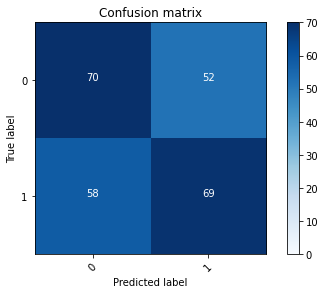

2022-08-20 19:27:56 - [Epoch Train: 99] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 19:27:56 - [Epoch Valid: 99] loss: 5.0196, auc: 0.5982, acc: 0.5582, time: 13.00 s


 99%|███████████████████████████████████████▌| 99/100 [1:49:59<01:07, 67.18s/it]

2022-08-20 19:27:56 - EPOCH: 100
2022-08-20 19:27:58 - Train Step 10/246, train_loss: 0.0000
2022-08-20 19:28:01 - Train Step 20/246, train_loss: 0.0000
2022-08-20 19:28:03 - Train Step 30/246, train_loss: 0.0000
2022-08-20 19:28:05 - Train Step 40/246, train_loss: 0.0000
2022-08-20 19:28:07 - Train Step 50/246, train_loss: 0.0000
2022-08-20 19:28:09 - Train Step 60/246, train_loss: 0.0000
2022-08-20 19:28:12 - Train Step 70/246, train_loss: 0.0000
2022-08-20 19:28:14 - Train Step 80/246, train_loss: 0.0000
2022-08-20 19:28:16 - Train Step 90/246, train_loss: 0.0000
2022-08-20 19:28:18 - Train Step 100/246, train_loss: 0.0000
2022-08-20 19:28:20 - Train Step 110/246, train_loss: 0.0000
2022-08-20 19:28:23 - Train Step 120/246, train_loss: 0.0000
2022-08-20 19:28:25 - Train Step 130/246, train_loss: 0.0000
2022-08-20 19:28:27 - Train Step 140/246, train_loss: 0.0000
2022-08-20 19:28:29 - Train Step 150/246, train_loss: 0.0000
2022-08-20 19:28:32 - Train Step 160/246, train_loss: 0.0000


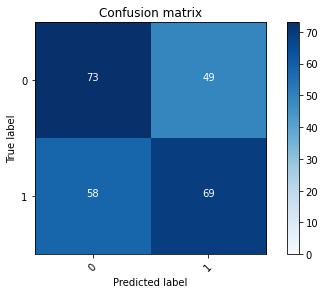

2022-08-20 19:29:04 - [Epoch Train: 100] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 19:29:04 - [Epoch Valid: 100] loss: 5.1791, auc: 0.6004, acc: 0.5703, time: 13.00 s


100%|███████████████████████████████████████| 100/100 [1:51:07<00:00, 66.68s/it]

-- FOLD N:3
Train origin: mn
Type: KLF
2022-08-20 19:29:04 - (M0) Train/Val datasets size: 270
2022-08-20 19:29:04 - (M1) Train/Val datasets size: 303
2022-08-20 19:29:04 - (N0) Train/Val datasets size: 170
2022-08-20 19:29:04 - (N1) Train/Val datasets size: 121
2022-08-20 19:29:04 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 19:29:04 - (MN0) Train/Val datasets size: 540
2022-08-20 19:29:04 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-20 19:29:04 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9deea58b0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d8d2b8b0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9ca0d08e0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d8db0670>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9ca0d0fd0>, 'mn_dataset_1': <utils.da

[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 168, 169, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 189, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 221, 222, 223, 224, 225, 227, 228, 230, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 248, 249, 250, 251, 252, 253, 254, 255, 259, 260, 261, 262, 263, 264, 265, 266, 267, 269, 271, 272, 

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 168, 169, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 189, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 221, 222, 223, 224, 225, 227, 228, 230, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 248, 249, 250, 251, 252, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9e5cda760>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d84ae760>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9e56762b0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d9050490>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d88290a0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d88293d0>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d86a24f0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9e4177dc0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8225250>]}}
2022-08-20 19:36:30 - Using CUDA...
KLF
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin'

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-20 19:36:30 - EPOCH: 1
2022-08-20 19:36:32 - Train Step 10/244, train_loss: 0.6989
2022-08-20 19:36:34 - Train Step 20/244, train_loss: 0.6902
2022-08-20 19:36:36 - Train Step 30/244, train_loss: 0.6934
2022-08-20 19:36:38 - Train Step 40/244, train_loss: 0.6959
2022-08-20 19:36:40 - Train Step 50/244, train_loss: 0.6912
2022-08-20 19:36:43 - Train Step 60/244, train_loss: 0.6935
2022-08-20 19:36:45 - Train Step 70/244, train_loss: 0.6941
2022-08-20 19:36:47 - Train Step 80/244, train_loss: 0.6893
2022-08-20 19:36:49 - Train Step 90/244, train_loss: 0.6973
2022-08-20 19:36:51 - Train Step 100/244, train_loss: 0.6946
2022-08-20 19:36:53 - Train Step 110/244, train_loss: 0.6924
2022-08-20 19:36:55 - Train Step 120/244, train_loss: 0.6941
2022-08-20 19:36:57 - Train Step 130/244, train_loss: 0.6924
2022-08-20 19:36:59 - Train Step 140/244, train_loss: 0.6925
2022-08-20 19:37:01 - Train Step 150/244, train_loss: 0.6912
2022-08-20 19:37:03 - Train Step 160/244, train_loss: 0.6929
20

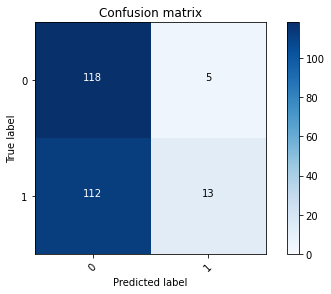

2022-08-20 19:37:35 - [Epoch Train: 1] loss: 0.6881, auc: 0.5667, acc: 0.5031, time: 51.00 s            
2022-08-20 19:37:35 - [Epoch Valid: 1] loss: 0.6911, auc: 0.5308, acc: 0.5282, time: 14.00 s
2022-08-20 19:37:35 - acc improved from 0.0000 to 0.5282. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_19-36-30/RSNAClassifierSingle3D-DW-SO-KLF-mn-e1-loss0.691-acc0.528-auc0.531.pth'


  1%|▍                                        | 1/100 [01:05<1:47:38, 65.24s/it]

2022-08-20 19:37:35 - EPOCH: 2
2022-08-20 19:37:37 - Train Step 10/244, train_loss: 0.6253
2022-08-20 19:37:39 - Train Step 20/244, train_loss: 0.6211
2022-08-20 19:37:41 - Train Step 30/244, train_loss: 0.6246
2022-08-20 19:37:44 - Train Step 40/244, train_loss: 0.6249
2022-08-20 19:37:46 - Train Step 50/244, train_loss: 0.6251
2022-08-20 19:37:48 - Train Step 60/244, train_loss: 0.6216
2022-08-20 19:37:50 - Train Step 70/244, train_loss: 0.6255
2022-08-20 19:37:52 - Train Step 80/244, train_loss: 0.6211
2022-08-20 19:37:54 - Train Step 90/244, train_loss: 0.6195
2022-08-20 19:37:56 - Train Step 100/244, train_loss: 0.6187
2022-08-20 19:37:58 - Train Step 110/244, train_loss: 0.6170
2022-08-20 19:38:00 - Train Step 120/244, train_loss: 0.6212
2022-08-20 19:38:02 - Train Step 130/244, train_loss: 0.6189
2022-08-20 19:38:04 - Train Step 140/244, train_loss: 0.6179
2022-08-20 19:38:06 - Train Step 150/244, train_loss: 0.6151
2022-08-20 19:38:08 - Train Step 160/244, train_loss: 0.6161
20

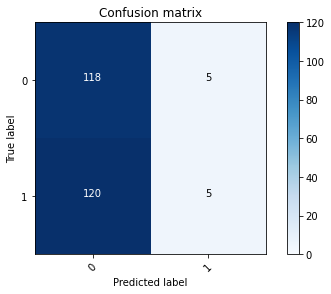

2022-08-20 19:38:39 - [Epoch Train: 2] loss: 0.6150, auc: 0.7508, acc: 0.5965, time: 50.00 s            
2022-08-20 19:38:39 - [Epoch Valid: 2] loss: 0.7130, auc: 0.5367, acc: 0.4960, time: 13.00 s


  2%|▊                                        | 2/100 [02:09<1:45:44, 64.74s/it]

2022-08-20 19:38:39 - EPOCH: 3
2022-08-20 19:38:42 - Train Step 10/244, train_loss: 0.5212
2022-08-20 19:38:44 - Train Step 20/244, train_loss: 0.5205
2022-08-20 19:38:46 - Train Step 30/244, train_loss: 0.5185
2022-08-20 19:38:49 - Train Step 40/244, train_loss: 0.5171
2022-08-20 19:38:51 - Train Step 50/244, train_loss: 0.5085
2022-08-20 19:38:53 - Train Step 60/244, train_loss: 0.5086
2022-08-20 19:38:55 - Train Step 70/244, train_loss: 0.5070
2022-08-20 19:38:57 - Train Step 80/244, train_loss: 0.4983
2022-08-20 19:39:00 - Train Step 90/244, train_loss: 0.4949
2022-08-20 19:39:02 - Train Step 100/244, train_loss: 0.4953
2022-08-20 19:39:04 - Train Step 110/244, train_loss: 0.4913
2022-08-20 19:39:06 - Train Step 120/244, train_loss: 0.4925
2022-08-20 19:39:08 - Train Step 130/244, train_loss: 0.4922
2022-08-20 19:39:11 - Train Step 140/244, train_loss: 0.4872
2022-08-20 19:39:13 - Train Step 150/244, train_loss: 0.4856
2022-08-20 19:39:15 - Train Step 160/244, train_loss: 0.4814
20

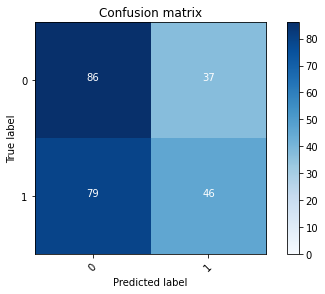

2022-08-20 19:39:47 - [Epoch Train: 3] loss: 0.4669, auc: 0.9101, acc: 0.7444, time: 53.00 s            
2022-08-20 19:39:47 - [Epoch Valid: 3] loss: 0.7987, auc: 0.5084, acc: 0.5323, time: 14.00 s
2022-08-20 19:39:47 - acc improved from 0.5282 to 0.5323. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_19-36-30/RSNAClassifierSingle3D-DW-SO-KLF-mn-e3-loss0.799-acc0.532-auc0.508.pth'


  3%|█▏                                       | 3/100 [03:17<1:46:48, 66.07s/it]

2022-08-20 19:39:47 - EPOCH: 4
2022-08-20 19:39:50 - Train Step 10/244, train_loss: 0.3281
2022-08-20 19:39:52 - Train Step 20/244, train_loss: 0.3078
2022-08-20 19:39:54 - Train Step 30/244, train_loss: 0.3165
2022-08-20 19:39:56 - Train Step 40/244, train_loss: 0.3178
2022-08-20 19:39:58 - Train Step 50/244, train_loss: 0.3178
2022-08-20 19:40:00 - Train Step 60/244, train_loss: 0.3105
2022-08-20 19:40:03 - Train Step 70/244, train_loss: 0.3141
2022-08-20 19:40:05 - Train Step 80/244, train_loss: 0.3038
2022-08-20 19:40:07 - Train Step 90/244, train_loss: 0.3086
2022-08-20 19:40:09 - Train Step 100/244, train_loss: 0.3175
2022-08-20 19:40:12 - Train Step 110/244, train_loss: 0.3170
2022-08-20 19:40:14 - Train Step 120/244, train_loss: 0.3163
2022-08-20 19:40:16 - Train Step 130/244, train_loss: 0.3152
2022-08-20 19:40:18 - Train Step 140/244, train_loss: 0.3110
2022-08-20 19:40:20 - Train Step 150/244, train_loss: 0.3079
2022-08-20 19:40:23 - Train Step 160/244, train_loss: 0.3034
20

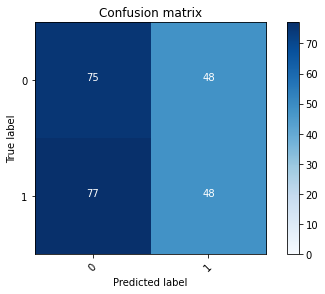

2022-08-20 19:40:55 - [Epoch Train: 4] loss: 0.2854, auc: 0.9730, acc: 0.8973, time: 54.00 s            
2022-08-20 19:40:55 - [Epoch Valid: 4] loss: 0.9581, auc: 0.5128, acc: 0.4960, time: 13.00 s


  4%|█▋                                       | 4/100 [04:24<1:46:38, 66.66s/it]

2022-08-20 19:40:55 - EPOCH: 5
2022-08-20 19:40:57 - Train Step 10/244, train_loss: 0.1954
2022-08-20 19:40:59 - Train Step 20/244, train_loss: 0.1756
2022-08-20 19:41:01 - Train Step 30/244, train_loss: 0.1598
2022-08-20 19:41:03 - Train Step 40/244, train_loss: 0.1532
2022-08-20 19:41:06 - Train Step 50/244, train_loss: 0.1498
2022-08-20 19:41:08 - Train Step 60/244, train_loss: 0.1586
2022-08-20 19:41:10 - Train Step 70/244, train_loss: 0.1503
2022-08-20 19:41:12 - Train Step 80/244, train_loss: 0.1443
2022-08-20 19:41:14 - Train Step 90/244, train_loss: 0.1392
2022-08-20 19:41:16 - Train Step 100/244, train_loss: 0.1451
2022-08-20 19:41:18 - Train Step 110/244, train_loss: 0.1474
2022-08-20 19:41:20 - Train Step 120/244, train_loss: 0.1450
2022-08-20 19:41:23 - Train Step 130/244, train_loss: 0.1451
2022-08-20 19:41:25 - Train Step 140/244, train_loss: 0.1508
2022-08-20 19:41:27 - Train Step 150/244, train_loss: 0.1517
2022-08-20 19:41:29 - Train Step 160/244, train_loss: 0.1491
20

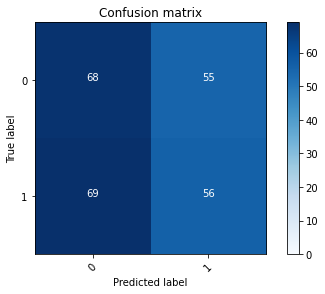

2022-08-20 19:42:01 - [Epoch Train: 5] loss: 0.1527, auc: 0.9940, acc: 0.9569, time: 52.00 s            
2022-08-20 19:42:01 - [Epoch Valid: 5] loss: 1.1090, auc: 0.5104, acc: 0.5000, time: 14.00 s


  5%|██                                       | 5/100 [05:31<1:45:18, 66.51s/it]

2022-08-20 19:42:01 - EPOCH: 6
2022-08-20 19:42:03 - Train Step 10/244, train_loss: 0.0977
2022-08-20 19:42:06 - Train Step 20/244, train_loss: 0.0880
2022-08-20 19:42:08 - Train Step 30/244, train_loss: 0.0772
2022-08-20 19:42:10 - Train Step 40/244, train_loss: 0.0734
2022-08-20 19:42:12 - Train Step 50/244, train_loss: 0.0724
2022-08-20 19:42:14 - Train Step 60/244, train_loss: 0.0727
2022-08-20 19:42:16 - Train Step 70/244, train_loss: 0.0724
2022-08-20 19:42:19 - Train Step 80/244, train_loss: 0.0691
2022-08-20 19:42:21 - Train Step 90/244, train_loss: 0.0688
2022-08-20 19:42:23 - Train Step 100/244, train_loss: 0.0700
2022-08-20 19:42:25 - Train Step 110/244, train_loss: 0.0680
2022-08-20 19:42:27 - Train Step 120/244, train_loss: 0.0716
2022-08-20 19:42:29 - Train Step 130/244, train_loss: 0.0706
2022-08-20 19:42:31 - Train Step 140/244, train_loss: 0.0696
2022-08-20 19:42:34 - Train Step 150/244, train_loss: 0.0693
2022-08-20 19:42:36 - Train Step 160/244, train_loss: 0.0688
20

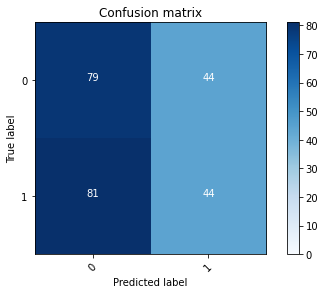

2022-08-20 19:43:08 - [Epoch Train: 6] loss: 0.0666, auc: 0.9999, acc: 0.9938, time: 52.00 s            
2022-08-20 19:43:08 - [Epoch Valid: 6] loss: 1.3725, auc: 0.5103, acc: 0.4960, time: 14.00 s


  6%|██▍                                      | 6/100 [06:38<1:44:27, 66.67s/it]

2022-08-20 19:43:08 - EPOCH: 7
2022-08-20 19:43:10 - Train Step 10/244, train_loss: 0.0332
2022-08-20 19:43:12 - Train Step 20/244, train_loss: 0.0370
2022-08-20 19:43:14 - Train Step 30/244, train_loss: 0.0370
2022-08-20 19:43:16 - Train Step 40/244, train_loss: 0.0367
2022-08-20 19:43:19 - Train Step 50/244, train_loss: 0.0350
2022-08-20 19:43:21 - Train Step 60/244, train_loss: 0.0341
2022-08-20 19:43:23 - Train Step 70/244, train_loss: 0.0333
2022-08-20 19:43:25 - Train Step 80/244, train_loss: 0.0353
2022-08-20 19:43:27 - Train Step 90/244, train_loss: 0.0345
2022-08-20 19:43:29 - Train Step 100/244, train_loss: 0.0354
2022-08-20 19:43:31 - Train Step 110/244, train_loss: 0.0360
2022-08-20 19:43:33 - Train Step 120/244, train_loss: 0.0356
2022-08-20 19:43:35 - Train Step 130/244, train_loss: 0.0363
2022-08-20 19:43:37 - Train Step 140/244, train_loss: 0.0364
2022-08-20 19:43:39 - Train Step 150/244, train_loss: 0.0362
2022-08-20 19:43:41 - Train Step 160/244, train_loss: 0.0350
20

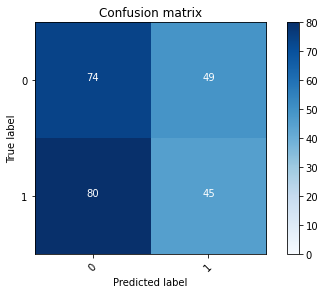

2022-08-20 19:44:12 - [Epoch Train: 7] loss: 0.0347, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 19:44:12 - [Epoch Valid: 7] loss: 1.5023, auc: 0.5118, acc: 0.4798, time: 13.00 s


  7%|██▊                                      | 7/100 [07:41<1:41:52, 65.73s/it]

2022-08-20 19:44:12 - EPOCH: 8
2022-08-20 19:44:14 - Train Step 10/244, train_loss: 0.0229
2022-08-20 19:44:16 - Train Step 20/244, train_loss: 0.0201
2022-08-20 19:44:19 - Train Step 30/244, train_loss: 0.0214
2022-08-20 19:44:21 - Train Step 40/244, train_loss: 0.0242
2022-08-20 19:44:23 - Train Step 50/244, train_loss: 0.0219
2022-08-20 19:44:25 - Train Step 60/244, train_loss: 0.0208
2022-08-20 19:44:28 - Train Step 70/244, train_loss: 0.0201
2022-08-20 19:44:30 - Train Step 80/244, train_loss: 0.0205
2022-08-20 19:44:32 - Train Step 90/244, train_loss: 0.0201
2022-08-20 19:44:34 - Train Step 100/244, train_loss: 0.0219
2022-08-20 19:44:36 - Train Step 110/244, train_loss: 0.0210
2022-08-20 19:44:39 - Train Step 120/244, train_loss: 0.0202
2022-08-20 19:44:41 - Train Step 130/244, train_loss: 0.0198
2022-08-20 19:44:43 - Train Step 140/244, train_loss: 0.0196
2022-08-20 19:44:45 - Train Step 150/244, train_loss: 0.0192
2022-08-20 19:44:47 - Train Step 160/244, train_loss: 0.0193
20

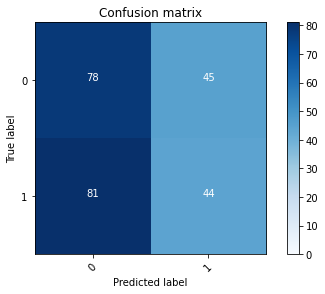

2022-08-20 19:45:19 - [Epoch Train: 8] loss: 0.0183, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 19:45:19 - [Epoch Valid: 8] loss: 1.6430, auc: 0.5142, acc: 0.4919, time: 14.00 s


  8%|███▎                                     | 8/100 [08:49<1:41:39, 66.30s/it]

2022-08-20 19:45:19 - EPOCH: 9
2022-08-20 19:45:22 - Train Step 10/244, train_loss: 0.0225
2022-08-20 19:45:24 - Train Step 20/244, train_loss: 0.0154
2022-08-20 19:45:26 - Train Step 30/244, train_loss: 0.0128
2022-08-20 19:45:28 - Train Step 40/244, train_loss: 0.0137
2022-08-20 19:45:30 - Train Step 50/244, train_loss: 0.0141
2022-08-20 19:45:32 - Train Step 60/244, train_loss: 0.0141
2022-08-20 19:45:34 - Train Step 70/244, train_loss: 0.0134
2022-08-20 19:45:36 - Train Step 80/244, train_loss: 0.0128
2022-08-20 19:45:38 - Train Step 90/244, train_loss: 0.0126
2022-08-20 19:45:40 - Train Step 100/244, train_loss: 0.0138
2022-08-20 19:45:43 - Train Step 110/244, train_loss: 0.0133
2022-08-20 19:45:45 - Train Step 120/244, train_loss: 0.0131
2022-08-20 19:45:47 - Train Step 130/244, train_loss: 0.0130
2022-08-20 19:45:49 - Train Step 140/244, train_loss: 0.0136
2022-08-20 19:45:51 - Train Step 150/244, train_loss: 0.0137
2022-08-20 19:45:53 - Train Step 160/244, train_loss: 0.0133
20

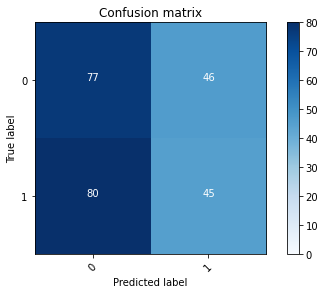

2022-08-20 19:46:24 - [Epoch Train: 9] loss: 0.0128, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:46:24 - [Epoch Valid: 9] loss: 1.8869, auc: 0.5092, acc: 0.4919, time: 13.00 s


  9%|███▋                                     | 9/100 [09:54<1:39:57, 65.90s/it]

2022-08-20 19:46:24 - EPOCH: 10
2022-08-20 19:46:27 - Train Step 10/244, train_loss: 0.0052
2022-08-20 19:46:29 - Train Step 20/244, train_loss: 0.0064
2022-08-20 19:46:31 - Train Step 30/244, train_loss: 0.0070
2022-08-20 19:46:33 - Train Step 40/244, train_loss: 0.0132
2022-08-20 19:46:35 - Train Step 50/244, train_loss: 0.0119
2022-08-20 19:46:37 - Train Step 60/244, train_loss: 0.0115
2022-08-20 19:46:39 - Train Step 70/244, train_loss: 0.0112
2022-08-20 19:46:41 - Train Step 80/244, train_loss: 0.0108
2022-08-20 19:46:43 - Train Step 90/244, train_loss: 0.0101
2022-08-20 19:46:45 - Train Step 100/244, train_loss: 0.0095
2022-08-20 19:46:47 - Train Step 110/244, train_loss: 0.0100
2022-08-20 19:46:49 - Train Step 120/244, train_loss: 0.0097
2022-08-20 19:46:51 - Train Step 130/244, train_loss: 0.0098
2022-08-20 19:46:53 - Train Step 140/244, train_loss: 0.0097
2022-08-20 19:46:55 - Train Step 150/244, train_loss: 0.0094
2022-08-20 19:46:57 - Train Step 160/244, train_loss: 0.0091
2

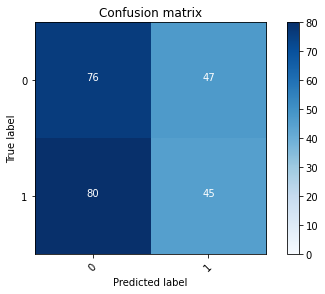

2022-08-20 19:47:28 - [Epoch Train: 10] loss: 0.0085, auc: 1.0000, acc: 1.0000, time: 49.00 s            
2022-08-20 19:47:28 - [Epoch Valid: 10] loss: 2.0531, auc: 0.5045, acc: 0.4879, time: 13.00 s


 10%|████                                    | 10/100 [10:58<1:37:57, 65.30s/it]

2022-08-20 19:47:28 - EPOCH: 11
2022-08-20 19:47:31 - Train Step 10/244, train_loss: 0.0046
2022-08-20 19:47:33 - Train Step 20/244, train_loss: 0.0042
2022-08-20 19:47:35 - Train Step 30/244, train_loss: 0.0046
2022-08-20 19:47:37 - Train Step 40/244, train_loss: 0.0054
2022-08-20 19:47:39 - Train Step 50/244, train_loss: 0.0050
2022-08-20 19:47:42 - Train Step 60/244, train_loss: 0.0050
2022-08-20 19:47:44 - Train Step 70/244, train_loss: 0.0049
2022-08-20 19:47:46 - Train Step 80/244, train_loss: 0.0048
2022-08-20 19:47:48 - Train Step 90/244, train_loss: 0.0045
2022-08-20 19:47:51 - Train Step 100/244, train_loss: 0.0044
2022-08-20 19:47:53 - Train Step 110/244, train_loss: 0.0044
2022-08-20 19:47:55 - Train Step 120/244, train_loss: 0.0046
2022-08-20 19:47:57 - Train Step 130/244, train_loss: 0.0050
2022-08-20 19:48:00 - Train Step 140/244, train_loss: 0.0051
2022-08-20 19:48:02 - Train Step 150/244, train_loss: 0.0052
2022-08-20 19:48:04 - Train Step 160/244, train_loss: 0.0051
2

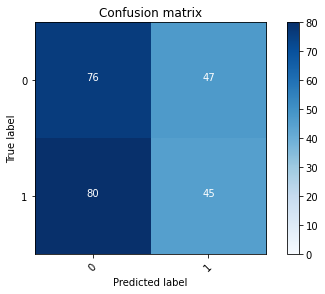

2022-08-20 19:48:37 - [Epoch Train: 11] loss: 0.0044, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 19:48:37 - [Epoch Valid: 11] loss: 1.9685, auc: 0.5063, acc: 0.4879, time: 14.00 s


 11%|████▍                                   | 11/100 [12:06<1:38:17, 66.26s/it]

2022-08-20 19:48:37 - EPOCH: 12
2022-08-20 19:48:39 - Train Step 10/244, train_loss: 0.0067
2022-08-20 19:48:41 - Train Step 20/244, train_loss: 0.0051
2022-08-20 19:48:43 - Train Step 30/244, train_loss: 0.0068
2022-08-20 19:48:45 - Train Step 40/244, train_loss: 0.0063
2022-08-20 19:48:48 - Train Step 50/244, train_loss: 0.0061
2022-08-20 19:48:50 - Train Step 60/244, train_loss: 0.0056
2022-08-20 19:48:52 - Train Step 70/244, train_loss: 0.0055
2022-08-20 19:48:54 - Train Step 80/244, train_loss: 0.0052
2022-08-20 19:48:56 - Train Step 90/244, train_loss: 0.0050
2022-08-20 19:48:58 - Train Step 100/244, train_loss: 0.0051
2022-08-20 19:49:00 - Train Step 110/244, train_loss: 0.0048
2022-08-20 19:49:02 - Train Step 120/244, train_loss: 0.0047
2022-08-20 19:49:04 - Train Step 130/244, train_loss: 0.0046
2022-08-20 19:49:07 - Train Step 140/244, train_loss: 0.0045
2022-08-20 19:49:09 - Train Step 150/244, train_loss: 0.0044
2022-08-20 19:49:11 - Train Step 160/244, train_loss: 0.0042
2

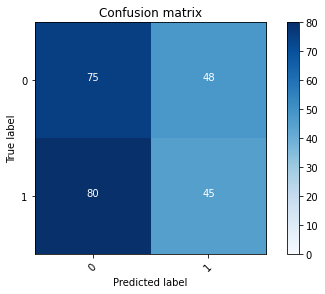

2022-08-20 19:49:43 - [Epoch Train: 12] loss: 0.0040, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:49:43 - [Epoch Valid: 12] loss: 2.2403, auc: 0.5024, acc: 0.4839, time: 14.00 s


 12%|████▊                                   | 12/100 [13:12<1:37:03, 66.17s/it]

2022-08-20 19:49:43 - EPOCH: 13
2022-08-20 19:49:45 - Train Step 10/244, train_loss: 0.0025
2022-08-20 19:49:47 - Train Step 20/244, train_loss: 0.0032
2022-08-20 19:49:49 - Train Step 30/244, train_loss: 0.0032
2022-08-20 19:49:51 - Train Step 40/244, train_loss: 0.0031
2022-08-20 19:49:53 - Train Step 50/244, train_loss: 0.0034
2022-08-20 19:49:56 - Train Step 60/244, train_loss: 0.0034
2022-08-20 19:49:58 - Train Step 70/244, train_loss: 0.0032
2022-08-20 19:50:00 - Train Step 80/244, train_loss: 0.0033
2022-08-20 19:50:02 - Train Step 90/244, train_loss: 0.0032
2022-08-20 19:50:04 - Train Step 100/244, train_loss: 0.0030
2022-08-20 19:50:06 - Train Step 110/244, train_loss: 0.0031
2022-08-20 19:50:08 - Train Step 120/244, train_loss: 0.0031
2022-08-20 19:50:10 - Train Step 130/244, train_loss: 0.0030
2022-08-20 19:50:12 - Train Step 140/244, train_loss: 0.0031
2022-08-20 19:50:14 - Train Step 150/244, train_loss: 0.0031
2022-08-20 19:50:16 - Train Step 160/244, train_loss: 0.0034
2

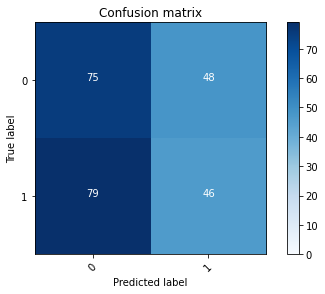

2022-08-20 19:50:47 - [Epoch Train: 13] loss: 0.0034, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:50:47 - [Epoch Valid: 13] loss: 2.1401, auc: 0.5050, acc: 0.4879, time: 13.00 s


 13%|█████▏                                  | 13/100 [14:17<1:35:21, 65.76s/it]

2022-08-20 19:50:47 - EPOCH: 14
2022-08-20 19:50:50 - Train Step 10/244, train_loss: 0.0032
2022-08-20 19:50:52 - Train Step 20/244, train_loss: 0.0027
2022-08-20 19:50:54 - Train Step 30/244, train_loss: 0.0025
2022-08-20 19:50:56 - Train Step 40/244, train_loss: 0.0028
2022-08-20 19:50:58 - Train Step 50/244, train_loss: 0.0029
2022-08-20 19:51:00 - Train Step 60/244, train_loss: 0.0029
2022-08-20 19:51:02 - Train Step 70/244, train_loss: 0.0029
2022-08-20 19:51:04 - Train Step 80/244, train_loss: 0.0028
2022-08-20 19:51:07 - Train Step 90/244, train_loss: 0.0028
2022-08-20 19:51:09 - Train Step 100/244, train_loss: 0.0032
2022-08-20 19:51:11 - Train Step 110/244, train_loss: 0.0033
2022-08-20 19:51:13 - Train Step 120/244, train_loss: 0.0032
2022-08-20 19:51:15 - Train Step 130/244, train_loss: 0.0032
2022-08-20 19:51:17 - Train Step 140/244, train_loss: 0.0033
2022-08-20 19:51:19 - Train Step 150/244, train_loss: 0.0032
2022-08-20 19:51:21 - Train Step 160/244, train_loss: 0.0032
2

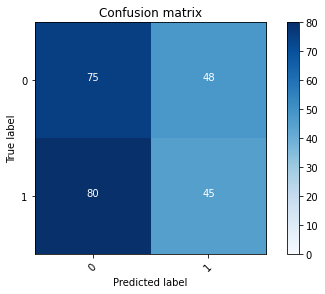

2022-08-20 19:51:53 - [Epoch Train: 14] loss: 0.0033, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:51:53 - [Epoch Valid: 14] loss: 2.2074, auc: 0.5054, acc: 0.4839, time: 13.00 s


 14%|█████▌                                  | 14/100 [15:23<1:34:11, 65.72s/it]

2022-08-20 19:51:53 - EPOCH: 15
2022-08-20 19:51:56 - Train Step 10/244, train_loss: 0.0014
2022-08-20 19:51:58 - Train Step 20/244, train_loss: 0.0029
2022-08-20 19:52:00 - Train Step 30/244, train_loss: 0.0025
2022-08-20 19:52:02 - Train Step 40/244, train_loss: 0.0027
2022-08-20 19:52:04 - Train Step 50/244, train_loss: 0.0025
2022-08-20 19:52:06 - Train Step 60/244, train_loss: 0.0025
2022-08-20 19:52:09 - Train Step 70/244, train_loss: 0.0024
2022-08-20 19:52:11 - Train Step 80/244, train_loss: 0.0023
2022-08-20 19:52:13 - Train Step 90/244, train_loss: 0.0023
2022-08-20 19:52:15 - Train Step 100/244, train_loss: 0.0023
2022-08-20 19:52:17 - Train Step 110/244, train_loss: 0.0023
2022-08-20 19:52:19 - Train Step 120/244, train_loss: 0.0022
2022-08-20 19:52:22 - Train Step 130/244, train_loss: 0.0022
2022-08-20 19:52:24 - Train Step 140/244, train_loss: 0.0021
2022-08-20 19:52:26 - Train Step 150/244, train_loss: 0.0021
2022-08-20 19:52:28 - Train Step 160/244, train_loss: 0.0022
2

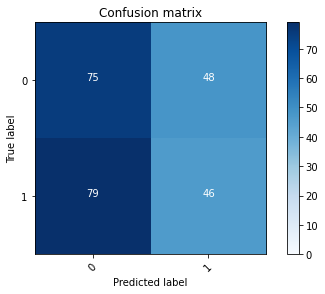

2022-08-20 19:52:59 - [Epoch Train: 15] loss: 0.0023, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 19:52:59 - [Epoch Valid: 15] loss: 2.2080, auc: 0.5054, acc: 0.4879, time: 13.00 s


 15%|██████                                  | 15/100 [16:29<1:33:17, 65.85s/it]

2022-08-20 19:52:59 - EPOCH: 16
2022-08-20 19:53:02 - Train Step 10/244, train_loss: 0.0017
2022-08-20 19:53:04 - Train Step 20/244, train_loss: 0.0020
2022-08-20 19:53:06 - Train Step 30/244, train_loss: 0.0017
2022-08-20 19:53:08 - Train Step 40/244, train_loss: 0.0016
2022-08-20 19:53:10 - Train Step 50/244, train_loss: 0.0017
2022-08-20 19:53:12 - Train Step 60/244, train_loss: 0.0017
2022-08-20 19:53:14 - Train Step 70/244, train_loss: 0.0020
2022-08-20 19:53:16 - Train Step 80/244, train_loss: 0.0021
2022-08-20 19:53:18 - Train Step 90/244, train_loss: 0.0021
2022-08-20 19:53:21 - Train Step 100/244, train_loss: 0.0022
2022-08-20 19:53:23 - Train Step 110/244, train_loss: 0.0023
2022-08-20 19:53:25 - Train Step 120/244, train_loss: 0.0023
2022-08-20 19:53:27 - Train Step 130/244, train_loss: 0.0023
2022-08-20 19:53:29 - Train Step 140/244, train_loss: 0.0023
2022-08-20 19:53:31 - Train Step 150/244, train_loss: 0.0023
2022-08-20 19:53:33 - Train Step 160/244, train_loss: 0.0022
2

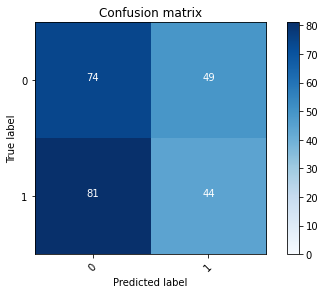

2022-08-20 19:54:05 - [Epoch Train: 16] loss: 0.0023, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:54:05 - [Epoch Valid: 16] loss: 2.5014, auc: 0.5020, acc: 0.4758, time: 14.00 s


 16%|██████▍                                 | 16/100 [17:35<1:32:12, 65.86s/it]

2022-08-20 19:54:05 - EPOCH: 17
2022-08-20 19:54:07 - Train Step 10/244, train_loss: 0.0013
2022-08-20 19:54:09 - Train Step 20/244, train_loss: 0.0016
2022-08-20 19:54:12 - Train Step 30/244, train_loss: 0.0017
2022-08-20 19:54:14 - Train Step 40/244, train_loss: 0.0017
2022-08-20 19:54:16 - Train Step 50/244, train_loss: 0.0016
2022-08-20 19:54:18 - Train Step 60/244, train_loss: 0.0017
2022-08-20 19:54:20 - Train Step 70/244, train_loss: 0.0017
2022-08-20 19:54:22 - Train Step 80/244, train_loss: 0.0017
2022-08-20 19:54:24 - Train Step 90/244, train_loss: 0.0017
2022-08-20 19:54:26 - Train Step 100/244, train_loss: 0.0016
2022-08-20 19:54:28 - Train Step 110/244, train_loss: 0.0016
2022-08-20 19:54:30 - Train Step 120/244, train_loss: 0.0016
2022-08-20 19:54:32 - Train Step 130/244, train_loss: 0.0016
2022-08-20 19:54:35 - Train Step 140/244, train_loss: 0.0015
2022-08-20 19:54:37 - Train Step 150/244, train_loss: 0.0017
2022-08-20 19:54:39 - Train Step 160/244, train_loss: 0.0017
2

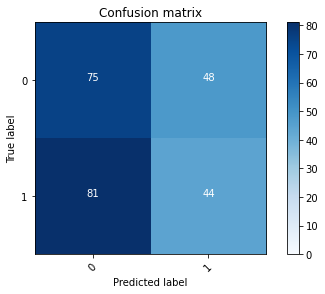

2022-08-20 19:55:10 - [Epoch Train: 17] loss: 0.0016, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:55:10 - [Epoch Valid: 17] loss: 2.4396, auc: 0.5074, acc: 0.4798, time: 14.00 s


 17%|██████▊                                 | 17/100 [18:40<1:30:54, 65.72s/it]

2022-08-20 19:55:10 - EPOCH: 18
2022-08-20 19:55:13 - Train Step 10/244, train_loss: 0.0015
2022-08-20 19:55:15 - Train Step 20/244, train_loss: 0.0015
2022-08-20 19:55:17 - Train Step 30/244, train_loss: 0.0018
2022-08-20 19:55:19 - Train Step 40/244, train_loss: 0.0038
2022-08-20 19:55:22 - Train Step 50/244, train_loss: 0.0035
2022-08-20 19:55:24 - Train Step 60/244, train_loss: 0.0033
2022-08-20 19:55:26 - Train Step 70/244, train_loss: 0.0030
2022-08-20 19:55:28 - Train Step 80/244, train_loss: 0.0027
2022-08-20 19:55:30 - Train Step 90/244, train_loss: 0.0026
2022-08-20 19:55:32 - Train Step 100/244, train_loss: 0.0025
2022-08-20 19:55:34 - Train Step 110/244, train_loss: 0.0024
2022-08-20 19:55:36 - Train Step 120/244, train_loss: 0.0023
2022-08-20 19:55:38 - Train Step 130/244, train_loss: 0.0022
2022-08-20 19:55:40 - Train Step 140/244, train_loss: 0.0023
2022-08-20 19:55:43 - Train Step 150/244, train_loss: 0.0022
2022-08-20 19:55:45 - Train Step 160/244, train_loss: 0.0022
2

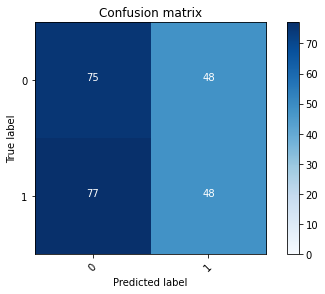

2022-08-20 19:56:17 - [Epoch Train: 18] loss: 0.0020, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 19:56:17 - [Epoch Valid: 18] loss: 2.3527, auc: 0.5067, acc: 0.4960, time: 14.00 s


 18%|███████▏                                | 18/100 [19:46<1:29:58, 65.84s/it]

2022-08-20 19:56:17 - EPOCH: 19
2022-08-20 19:56:19 - Train Step 10/244, train_loss: 0.0010
2022-08-20 19:56:21 - Train Step 20/244, train_loss: 0.0016
2022-08-20 19:56:24 - Train Step 30/244, train_loss: 0.0014
2022-08-20 19:56:26 - Train Step 40/244, train_loss: 0.0014
2022-08-20 19:56:28 - Train Step 50/244, train_loss: 0.0014
2022-08-20 19:56:30 - Train Step 60/244, train_loss: 0.0014
2022-08-20 19:56:32 - Train Step 70/244, train_loss: 0.0014
2022-08-20 19:56:34 - Train Step 80/244, train_loss: 0.0014
2022-08-20 19:56:36 - Train Step 90/244, train_loss: 0.0014
2022-08-20 19:56:39 - Train Step 100/244, train_loss: 0.0013
2022-08-20 19:56:41 - Train Step 110/244, train_loss: 0.0014
2022-08-20 19:56:43 - Train Step 120/244, train_loss: 0.0013
2022-08-20 19:56:45 - Train Step 130/244, train_loss: 0.0013
2022-08-20 19:56:47 - Train Step 140/244, train_loss: 0.0012
2022-08-20 19:56:49 - Train Step 150/244, train_loss: 0.0012
2022-08-20 19:56:52 - Train Step 160/244, train_loss: 0.0012
2

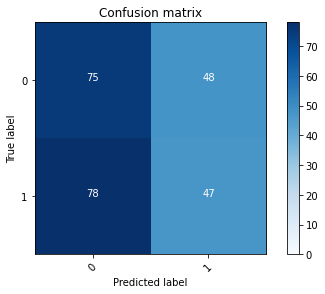

2022-08-20 19:57:23 - [Epoch Train: 19] loss: 0.0012, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 19:57:23 - [Epoch Valid: 19] loss: 2.4661, auc: 0.5069, acc: 0.4919, time: 13.00 s


 19%|███████▌                                | 19/100 [20:52<1:28:56, 65.89s/it]

2022-08-20 19:57:23 - EPOCH: 20
2022-08-20 19:57:25 - Train Step 10/244, train_loss: 0.0010
2022-08-20 19:57:27 - Train Step 20/244, train_loss: 0.0008
2022-08-20 19:57:29 - Train Step 30/244, train_loss: 0.0010
2022-08-20 19:57:31 - Train Step 40/244, train_loss: 0.0010
2022-08-20 19:57:33 - Train Step 50/244, train_loss: 0.0010
2022-08-20 19:57:35 - Train Step 60/244, train_loss: 0.0011
2022-08-20 19:57:38 - Train Step 70/244, train_loss: 0.0010
2022-08-20 19:57:40 - Train Step 80/244, train_loss: 0.0010
2022-08-20 19:57:42 - Train Step 90/244, train_loss: 0.0010
2022-08-20 19:57:44 - Train Step 100/244, train_loss: 0.0011
2022-08-20 19:57:46 - Train Step 110/244, train_loss: 0.0011
2022-08-20 19:57:48 - Train Step 120/244, train_loss: 0.0011
2022-08-20 19:57:50 - Train Step 130/244, train_loss: 0.0011
2022-08-20 19:57:52 - Train Step 140/244, train_loss: 0.0011
2022-08-20 19:57:54 - Train Step 150/244, train_loss: 0.0011
2022-08-20 19:57:57 - Train Step 160/244, train_loss: 0.0011
2

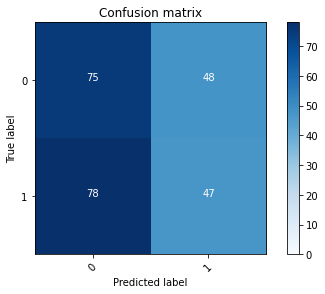

2022-08-20 19:58:27 - [Epoch Train: 20] loss: 0.0010, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 19:58:27 - [Epoch Valid: 20] loss: 2.5389, auc: 0.5076, acc: 0.4919, time: 13.00 s


 20%|████████                                | 20/100 [21:57<1:27:25, 65.57s/it]

2022-08-20 19:58:27 - EPOCH: 21
2022-08-20 19:58:30 - Train Step 10/244, train_loss: 0.0008
2022-08-20 19:58:32 - Train Step 20/244, train_loss: 0.0012
2022-08-20 19:58:34 - Train Step 30/244, train_loss: 0.0012
2022-08-20 19:58:37 - Train Step 40/244, train_loss: 0.0010
2022-08-20 19:58:39 - Train Step 50/244, train_loss: 0.0009
2022-08-20 19:58:41 - Train Step 60/244, train_loss: 0.0009
2022-08-20 19:58:43 - Train Step 70/244, train_loss: 0.0009
2022-08-20 19:58:45 - Train Step 80/244, train_loss: 0.0009
2022-08-20 19:58:47 - Train Step 90/244, train_loss: 0.0009
2022-08-20 19:58:50 - Train Step 100/244, train_loss: 0.0008
2022-08-20 19:58:52 - Train Step 110/244, train_loss: 0.0009
2022-08-20 19:58:54 - Train Step 120/244, train_loss: 0.0008
2022-08-20 19:58:56 - Train Step 130/244, train_loss: 0.0009
2022-08-20 19:58:59 - Train Step 140/244, train_loss: 0.0008
2022-08-20 19:59:01 - Train Step 150/244, train_loss: 0.0008
2022-08-20 19:59:03 - Train Step 160/244, train_loss: 0.0009
2

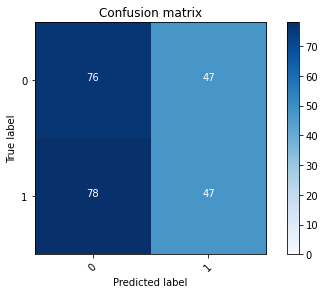

2022-08-20 19:59:35 - [Epoch Train: 21] loss: 0.0013, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 19:59:35 - [Epoch Valid: 21] loss: 2.5505, auc: 0.5060, acc: 0.4960, time: 13.00 s


 21%|████████▍                               | 21/100 [23:05<1:27:07, 66.17s/it]

2022-08-20 19:59:35 - EPOCH: 22
2022-08-20 19:59:37 - Train Step 10/244, train_loss: 0.0013
2022-08-20 19:59:40 - Train Step 20/244, train_loss: 0.0010
2022-08-20 19:59:42 - Train Step 30/244, train_loss: 0.0008
2022-08-20 19:59:44 - Train Step 40/244, train_loss: 0.0007
2022-08-20 19:59:46 - Train Step 50/244, train_loss: 0.0007
2022-08-20 19:59:48 - Train Step 60/244, train_loss: 0.0007
2022-08-20 19:59:51 - Train Step 70/244, train_loss: 0.0006
2022-08-20 19:59:53 - Train Step 80/244, train_loss: 0.0007
2022-08-20 19:59:55 - Train Step 90/244, train_loss: 0.0009
2022-08-20 19:59:57 - Train Step 100/244, train_loss: 0.0010
2022-08-20 19:59:59 - Train Step 110/244, train_loss: 0.0009
2022-08-20 20:00:01 - Train Step 120/244, train_loss: 0.0009
2022-08-20 20:00:03 - Train Step 130/244, train_loss: 0.0009
2022-08-20 20:00:06 - Train Step 140/244, train_loss: 0.0009
2022-08-20 20:00:08 - Train Step 150/244, train_loss: 0.0009
2022-08-20 20:00:10 - Train Step 160/244, train_loss: 0.0009
2

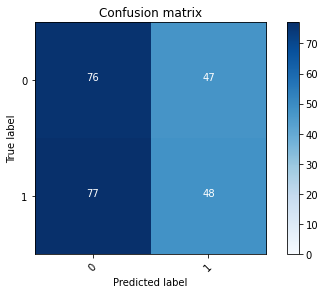

2022-08-20 20:00:42 - [Epoch Train: 22] loss: 0.0009, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:00:42 - [Epoch Valid: 22] loss: 2.5809, auc: 0.5110, acc: 0.5000, time: 14.00 s


 22%|████████▊                               | 22/100 [24:12<1:26:33, 66.58s/it]

2022-08-20 20:00:42 - EPOCH: 23
2022-08-20 20:00:45 - Train Step 10/244, train_loss: 0.0006
2022-08-20 20:00:47 - Train Step 20/244, train_loss: 0.0004
2022-08-20 20:00:49 - Train Step 30/244, train_loss: 0.0006
2022-08-20 20:00:51 - Train Step 40/244, train_loss: 0.0006
2022-08-20 20:00:53 - Train Step 50/244, train_loss: 0.0007
2022-08-20 20:00:55 - Train Step 60/244, train_loss: 0.0007
2022-08-20 20:00:57 - Train Step 70/244, train_loss: 0.0007
2022-08-20 20:00:59 - Train Step 80/244, train_loss: 0.0007
2022-08-20 20:01:01 - Train Step 90/244, train_loss: 0.0006
2022-08-20 20:01:03 - Train Step 100/244, train_loss: 0.0007
2022-08-20 20:01:05 - Train Step 110/244, train_loss: 0.0007
2022-08-20 20:01:08 - Train Step 120/244, train_loss: 0.0007
2022-08-20 20:01:10 - Train Step 130/244, train_loss: 0.0007
2022-08-20 20:01:12 - Train Step 140/244, train_loss: 0.0007
2022-08-20 20:01:14 - Train Step 150/244, train_loss: 0.0007
2022-08-20 20:01:16 - Train Step 160/244, train_loss: 0.0007
2

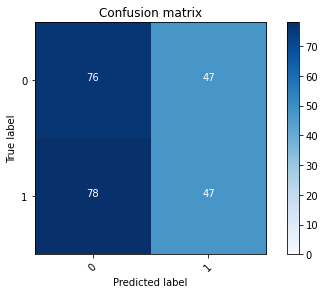

2022-08-20 20:01:47 - [Epoch Train: 23] loss: 0.0007, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:01:47 - [Epoch Valid: 23] loss: 2.6212, auc: 0.5096, acc: 0.4960, time: 13.00 s


 23%|█████████▏                              | 23/100 [25:17<1:24:38, 65.96s/it]

2022-08-20 20:01:47 - EPOCH: 24
2022-08-20 20:01:49 - Train Step 10/244, train_loss: 0.0004
2022-08-20 20:01:52 - Train Step 20/244, train_loss: 0.0004
2022-08-20 20:01:54 - Train Step 30/244, train_loss: 0.0004
2022-08-20 20:01:56 - Train Step 40/244, train_loss: 0.0005
2022-08-20 20:01:58 - Train Step 50/244, train_loss: 0.0005
2022-08-20 20:02:00 - Train Step 60/244, train_loss: 0.0005
2022-08-20 20:02:02 - Train Step 70/244, train_loss: 0.0005
2022-08-20 20:02:04 - Train Step 80/244, train_loss: 0.0005
2022-08-20 20:02:07 - Train Step 90/244, train_loss: 0.0005
2022-08-20 20:02:09 - Train Step 100/244, train_loss: 0.0006
2022-08-20 20:02:11 - Train Step 110/244, train_loss: 0.0006
2022-08-20 20:02:13 - Train Step 120/244, train_loss: 0.0006
2022-08-20 20:02:15 - Train Step 130/244, train_loss: 0.0006
2022-08-20 20:02:17 - Train Step 140/244, train_loss: 0.0006
2022-08-20 20:02:20 - Train Step 150/244, train_loss: 0.0006
2022-08-20 20:02:22 - Train Step 160/244, train_loss: 0.0006
2

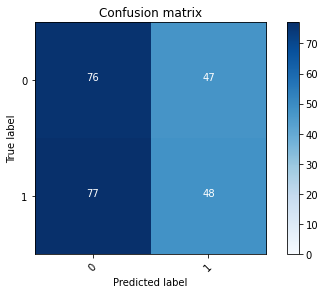

2022-08-20 20:02:53 - [Epoch Train: 24] loss: 0.0007, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:02:53 - [Epoch Valid: 24] loss: 2.9179, auc: 0.5081, acc: 0.5000, time: 13.00 s


 24%|█████████▌                              | 24/100 [26:23<1:23:29, 65.92s/it]

2022-08-20 20:02:53 - EPOCH: 25
2022-08-20 20:02:55 - Train Step 10/244, train_loss: 0.0006
2022-08-20 20:02:57 - Train Step 20/244, train_loss: 0.0008
2022-08-20 20:02:59 - Train Step 30/244, train_loss: 0.0008
2022-08-20 20:03:01 - Train Step 40/244, train_loss: 0.0006
2022-08-20 20:03:03 - Train Step 50/244, train_loss: 0.0006
2022-08-20 20:03:05 - Train Step 60/244, train_loss: 0.0006
2022-08-20 20:03:07 - Train Step 70/244, train_loss: 0.0006
2022-08-20 20:03:09 - Train Step 80/244, train_loss: 0.0005
2022-08-20 20:03:11 - Train Step 90/244, train_loss: 0.0005
2022-08-20 20:03:14 - Train Step 100/244, train_loss: 0.0005
2022-08-20 20:03:16 - Train Step 110/244, train_loss: 0.0005
2022-08-20 20:03:18 - Train Step 120/244, train_loss: 0.0005
2022-08-20 20:03:20 - Train Step 130/244, train_loss: 0.0005
2022-08-20 20:03:22 - Train Step 140/244, train_loss: 0.0005
2022-08-20 20:03:24 - Train Step 150/244, train_loss: 0.0005
2022-08-20 20:03:26 - Train Step 160/244, train_loss: 0.0005
2

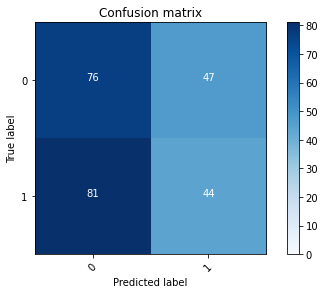

2022-08-20 20:03:57 - [Epoch Train: 25] loss: 0.0006, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:03:57 - [Epoch Valid: 25] loss: 3.0065, auc: 0.5059, acc: 0.4839, time: 13.00 s


 25%|██████████                              | 25/100 [27:27<1:21:50, 65.48s/it]

2022-08-20 20:03:57 - EPOCH: 26
2022-08-20 20:04:00 - Train Step 10/244, train_loss: 0.0002
2022-08-20 20:04:02 - Train Step 20/244, train_loss: 0.0003
2022-08-20 20:04:04 - Train Step 30/244, train_loss: 0.0004
2022-08-20 20:04:06 - Train Step 40/244, train_loss: 0.0004
2022-08-20 20:04:08 - Train Step 50/244, train_loss: 0.0004
2022-08-20 20:04:10 - Train Step 60/244, train_loss: 0.0004
2022-08-20 20:04:12 - Train Step 70/244, train_loss: 0.0003
2022-08-20 20:04:14 - Train Step 80/244, train_loss: 0.0003
2022-08-20 20:04:16 - Train Step 90/244, train_loss: 0.0003
2022-08-20 20:04:18 - Train Step 100/244, train_loss: 0.0003
2022-08-20 20:04:20 - Train Step 110/244, train_loss: 0.0004
2022-08-20 20:04:22 - Train Step 120/244, train_loss: 0.0004
2022-08-20 20:04:25 - Train Step 130/244, train_loss: 0.0004
2022-08-20 20:04:27 - Train Step 140/244, train_loss: 0.0004
2022-08-20 20:04:29 - Train Step 150/244, train_loss: 0.0004
2022-08-20 20:04:31 - Train Step 160/244, train_loss: 0.0004
2

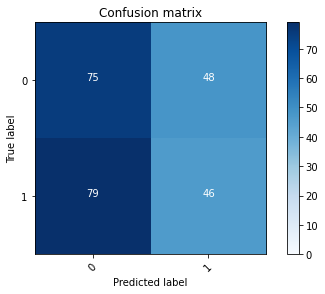

2022-08-20 20:05:02 - [Epoch Train: 26] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 20:05:02 - [Epoch Valid: 26] loss: 2.8186, auc: 0.5108, acc: 0.4879, time: 13.00 s


 26%|██████████▍                             | 26/100 [28:31<1:20:21, 65.16s/it]

2022-08-20 20:05:02 - EPOCH: 27
2022-08-20 20:05:04 - Train Step 10/244, train_loss: 0.0003
2022-08-20 20:05:06 - Train Step 20/244, train_loss: 0.0004
2022-08-20 20:05:09 - Train Step 30/244, train_loss: 0.0004
2022-08-20 20:05:11 - Train Step 40/244, train_loss: 0.0004
2022-08-20 20:05:13 - Train Step 50/244, train_loss: 0.0004
2022-08-20 20:05:15 - Train Step 60/244, train_loss: 0.0006
2022-08-20 20:05:17 - Train Step 70/244, train_loss: 0.0006
2022-08-20 20:05:20 - Train Step 80/244, train_loss: 0.0006
2022-08-20 20:05:22 - Train Step 90/244, train_loss: 0.0005
2022-08-20 20:05:24 - Train Step 100/244, train_loss: 0.0005
2022-08-20 20:05:26 - Train Step 110/244, train_loss: 0.0006
2022-08-20 20:05:28 - Train Step 120/244, train_loss: 0.0005
2022-08-20 20:05:30 - Train Step 130/244, train_loss: 0.0005
2022-08-20 20:05:33 - Train Step 140/244, train_loss: 0.0005
2022-08-20 20:05:35 - Train Step 150/244, train_loss: 0.0005
2022-08-20 20:05:37 - Train Step 160/244, train_loss: 0.0005
2

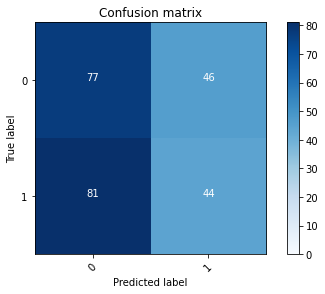

2022-08-20 20:06:09 - [Epoch Train: 27] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:06:09 - [Epoch Valid: 27] loss: 3.0195, auc: 0.5063, acc: 0.4879, time: 14.00 s


 27%|██████████▊                             | 27/100 [29:39<1:20:07, 65.86s/it]

2022-08-20 20:06:09 - EPOCH: 28
2022-08-20 20:06:12 - Train Step 10/244, train_loss: 0.0007
2022-08-20 20:06:14 - Train Step 20/244, train_loss: 0.0006
2022-08-20 20:06:16 - Train Step 30/244, train_loss: 0.0004
2022-08-20 20:06:18 - Train Step 40/244, train_loss: 0.0004
2022-08-20 20:06:20 - Train Step 50/244, train_loss: 0.0004
2022-08-20 20:06:22 - Train Step 60/244, train_loss: 0.0003
2022-08-20 20:06:24 - Train Step 70/244, train_loss: 0.0003
2022-08-20 20:06:26 - Train Step 80/244, train_loss: 0.0005
2022-08-20 20:06:28 - Train Step 90/244, train_loss: 0.0005
2022-08-20 20:06:31 - Train Step 100/244, train_loss: 0.0005
2022-08-20 20:06:33 - Train Step 110/244, train_loss: 0.0005
2022-08-20 20:06:35 - Train Step 120/244, train_loss: 0.0004
2022-08-20 20:06:37 - Train Step 130/244, train_loss: 0.0004
2022-08-20 20:06:39 - Train Step 140/244, train_loss: 0.0004
2022-08-20 20:06:41 - Train Step 150/244, train_loss: 0.0004
2022-08-20 20:06:43 - Train Step 160/244, train_loss: 0.0004
2

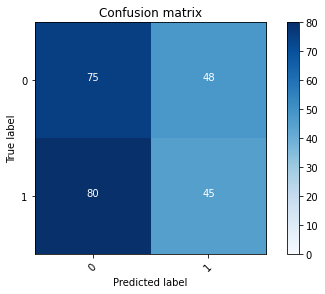

2022-08-20 20:07:16 - [Epoch Train: 28] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:07:16 - [Epoch Valid: 28] loss: 3.1578, auc: 0.5068, acc: 0.4839, time: 14.00 s


 28%|███████████▏                            | 28/100 [30:46<1:19:18, 66.09s/it]

2022-08-20 20:07:16 - EPOCH: 29
2022-08-20 20:07:18 - Train Step 10/244, train_loss: 0.0002
2022-08-20 20:07:20 - Train Step 20/244, train_loss: 0.0002
2022-08-20 20:07:23 - Train Step 30/244, train_loss: 0.0003
2022-08-20 20:07:25 - Train Step 40/244, train_loss: 0.0002
2022-08-20 20:07:27 - Train Step 50/244, train_loss: 0.0003
2022-08-20 20:07:29 - Train Step 60/244, train_loss: 0.0003
2022-08-20 20:07:31 - Train Step 70/244, train_loss: 0.0003
2022-08-20 20:07:34 - Train Step 80/244, train_loss: 0.0003
2022-08-20 20:07:36 - Train Step 90/244, train_loss: 0.0002
2022-08-20 20:07:38 - Train Step 100/244, train_loss: 0.0003
2022-08-20 20:07:40 - Train Step 110/244, train_loss: 0.0003
2022-08-20 20:07:42 - Train Step 120/244, train_loss: 0.0003
2022-08-20 20:07:44 - Train Step 130/244, train_loss: 0.0002
2022-08-20 20:07:46 - Train Step 140/244, train_loss: 0.0003
2022-08-20 20:07:49 - Train Step 150/244, train_loss: 0.0002
2022-08-20 20:07:51 - Train Step 160/244, train_loss: 0.0003
2

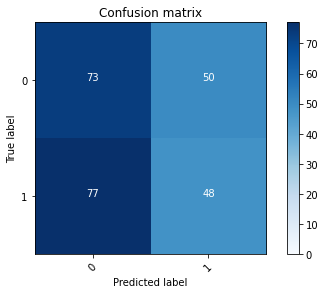

2022-08-20 20:08:22 - [Epoch Train: 29] loss: 0.0004, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:08:22 - [Epoch Valid: 29] loss: 3.0104, auc: 0.5082, acc: 0.4879, time: 13.00 s


 29%|███████████▌                            | 29/100 [31:52<1:18:13, 66.11s/it]

2022-08-20 20:08:22 - EPOCH: 30
2022-08-20 20:08:24 - Train Step 10/244, train_loss: 0.0002
2022-08-20 20:08:26 - Train Step 20/244, train_loss: 0.0002
2022-08-20 20:08:29 - Train Step 30/244, train_loss: 0.0002
2022-08-20 20:08:31 - Train Step 40/244, train_loss: 0.0002
2022-08-20 20:08:33 - Train Step 50/244, train_loss: 0.0003
2022-08-20 20:08:35 - Train Step 60/244, train_loss: 0.0003
2022-08-20 20:08:37 - Train Step 70/244, train_loss: 0.0003
2022-08-20 20:08:39 - Train Step 80/244, train_loss: 0.0003
2022-08-20 20:08:42 - Train Step 90/244, train_loss: 0.0003
2022-08-20 20:08:44 - Train Step 100/244, train_loss: 0.0003
2022-08-20 20:08:46 - Train Step 110/244, train_loss: 0.0003
2022-08-20 20:08:48 - Train Step 120/244, train_loss: 0.0002
2022-08-20 20:08:50 - Train Step 130/244, train_loss: 0.0002
2022-08-20 20:08:52 - Train Step 140/244, train_loss: 0.0002
2022-08-20 20:08:54 - Train Step 150/244, train_loss: 0.0002
2022-08-20 20:08:56 - Train Step 160/244, train_loss: 0.0002
2

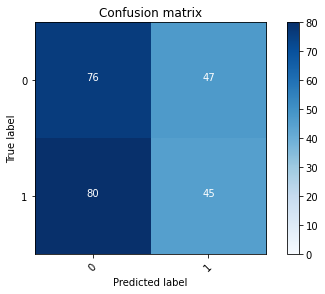

2022-08-20 20:09:27 - [Epoch Train: 30] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:09:27 - [Epoch Valid: 30] loss: 3.1165, auc: 0.5041, acc: 0.4879, time: 13.00 s


 30%|████████████                            | 30/100 [32:57<1:16:52, 65.89s/it]

2022-08-20 20:09:27 - EPOCH: 31
2022-08-20 20:09:30 - Train Step 10/244, train_loss: 0.0001
2022-08-20 20:09:32 - Train Step 20/244, train_loss: 0.0001
2022-08-20 20:09:34 - Train Step 30/244, train_loss: 0.0002
2022-08-20 20:09:36 - Train Step 40/244, train_loss: 0.0003
2022-08-20 20:09:38 - Train Step 50/244, train_loss: 0.0003
2022-08-20 20:09:40 - Train Step 60/244, train_loss: 0.0002
2022-08-20 20:09:42 - Train Step 70/244, train_loss: 0.0002
2022-08-20 20:09:44 - Train Step 80/244, train_loss: 0.0002
2022-08-20 20:09:46 - Train Step 90/244, train_loss: 0.0002
2022-08-20 20:09:48 - Train Step 100/244, train_loss: 0.0002
2022-08-20 20:09:51 - Train Step 110/244, train_loss: 0.0002
2022-08-20 20:09:53 - Train Step 120/244, train_loss: 0.0002
2022-08-20 20:09:55 - Train Step 130/244, train_loss: 0.0002
2022-08-20 20:09:57 - Train Step 140/244, train_loss: 0.0002
2022-08-20 20:09:59 - Train Step 150/244, train_loss: 0.0002
2022-08-20 20:10:01 - Train Step 160/244, train_loss: 0.0002
2

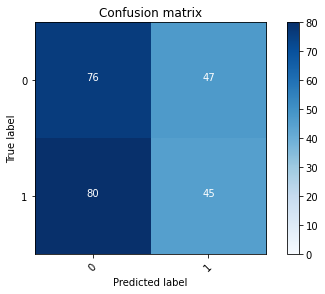

2022-08-20 20:10:32 - [Epoch Train: 31] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:10:32 - [Epoch Valid: 31] loss: 3.1885, auc: 0.5072, acc: 0.4879, time: 13.00 s


 31%|████████████▍                           | 31/100 [34:02<1:15:22, 65.54s/it]

2022-08-20 20:10:32 - EPOCH: 32
2022-08-20 20:10:34 - Train Step 10/244, train_loss: 0.0002
2022-08-20 20:10:36 - Train Step 20/244, train_loss: 0.0001
2022-08-20 20:10:38 - Train Step 30/244, train_loss: 0.0001
2022-08-20 20:10:41 - Train Step 40/244, train_loss: 0.0001
2022-08-20 20:10:43 - Train Step 50/244, train_loss: 0.0001
2022-08-20 20:10:44 - Train Step 60/244, train_loss: 0.0001
2022-08-20 20:10:46 - Train Step 70/244, train_loss: 0.0002
2022-08-20 20:10:49 - Train Step 80/244, train_loss: 0.0002
2022-08-20 20:10:50 - Train Step 90/244, train_loss: 0.0002
2022-08-20 20:10:52 - Train Step 100/244, train_loss: 0.0002
2022-08-20 20:10:54 - Train Step 110/244, train_loss: 0.0002
2022-08-20 20:10:56 - Train Step 120/244, train_loss: 0.0002
2022-08-20 20:10:58 - Train Step 130/244, train_loss: 0.0002
2022-08-20 20:11:00 - Train Step 140/244, train_loss: 0.0002
2022-08-20 20:11:02 - Train Step 150/244, train_loss: 0.0002
2022-08-20 20:11:04 - Train Step 160/244, train_loss: 0.0002
2

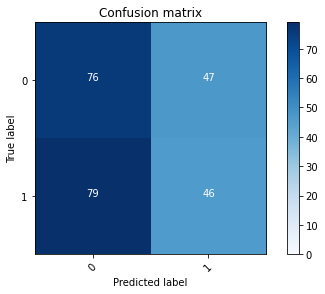

2022-08-20 20:11:34 - [Epoch Train: 32] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 49.00 s            
2022-08-20 20:11:34 - [Epoch Valid: 32] loss: 3.2522, auc: 0.5062, acc: 0.4919, time: 12.00 s


 32%|████████████▊                           | 32/100 [35:04<1:13:03, 64.46s/it]

2022-08-20 20:11:34 - EPOCH: 33
2022-08-20 20:11:37 - Train Step 10/244, train_loss: 0.0001
2022-08-20 20:11:39 - Train Step 20/244, train_loss: 0.0002
2022-08-20 20:11:41 - Train Step 30/244, train_loss: 0.0002
2022-08-20 20:11:43 - Train Step 40/244, train_loss: 0.0002
2022-08-20 20:11:45 - Train Step 50/244, train_loss: 0.0002
2022-08-20 20:11:47 - Train Step 60/244, train_loss: 0.0001
2022-08-20 20:11:49 - Train Step 70/244, train_loss: 0.0001
2022-08-20 20:11:51 - Train Step 80/244, train_loss: 0.0001
2022-08-20 20:11:53 - Train Step 90/244, train_loss: 0.0001
2022-08-20 20:11:55 - Train Step 100/244, train_loss: 0.0001
2022-08-20 20:11:58 - Train Step 110/244, train_loss: 0.0001
2022-08-20 20:12:00 - Train Step 120/244, train_loss: 0.0001
2022-08-20 20:12:02 - Train Step 130/244, train_loss: 0.0001
2022-08-20 20:12:04 - Train Step 140/244, train_loss: 0.0001
2022-08-20 20:12:06 - Train Step 150/244, train_loss: 0.0001
2022-08-20 20:12:08 - Train Step 160/244, train_loss: 0.0001
2

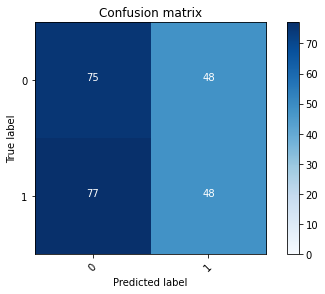

2022-08-20 20:12:38 - [Epoch Train: 33] loss: 0.0002, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 20:12:38 - [Epoch Valid: 33] loss: 3.2686, auc: 0.5085, acc: 0.4960, time: 12.00 s


 33%|█████████████▏                          | 33/100 [36:08<1:11:51, 64.35s/it]

2022-08-20 20:12:38 - EPOCH: 34
2022-08-20 20:12:40 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:12:42 - Train Step 20/244, train_loss: 0.0003
2022-08-20 20:12:44 - Train Step 30/244, train_loss: 0.0003
2022-08-20 20:12:46 - Train Step 40/244, train_loss: 0.0003
2022-08-20 20:12:48 - Train Step 50/244, train_loss: 0.0003
2022-08-20 20:12:50 - Train Step 60/244, train_loss: 0.0005
2022-08-20 20:12:52 - Train Step 70/244, train_loss: 0.0005
2022-08-20 20:12:54 - Train Step 80/244, train_loss: 0.0005
2022-08-20 20:12:56 - Train Step 90/244, train_loss: 0.0005
2022-08-20 20:12:58 - Train Step 100/244, train_loss: 0.0004
2022-08-20 20:13:00 - Train Step 110/244, train_loss: 0.0004
2022-08-20 20:13:03 - Train Step 120/244, train_loss: 0.0004
2022-08-20 20:13:05 - Train Step 130/244, train_loss: 0.0004
2022-08-20 20:13:07 - Train Step 140/244, train_loss: 0.0003
2022-08-20 20:13:09 - Train Step 150/244, train_loss: 0.0003
2022-08-20 20:13:11 - Train Step 160/244, train_loss: 0.0003
2

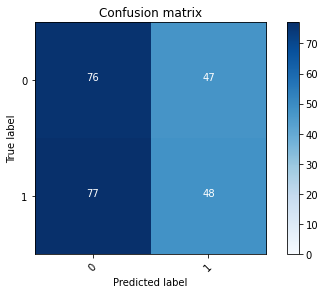

2022-08-20 20:13:44 - [Epoch Train: 34] loss: 0.0003, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:13:44 - [Epoch Valid: 34] loss: 3.3699, auc: 0.5058, acc: 0.5000, time: 15.00 s


 34%|█████████████▌                          | 34/100 [37:14<1:11:17, 64.80s/it]

2022-08-20 20:13:44 - EPOCH: 35
2022-08-20 20:13:47 - Train Step 10/244, train_loss: 0.0001
2022-08-20 20:13:49 - Train Step 20/244, train_loss: 0.0003
2022-08-20 20:13:51 - Train Step 30/244, train_loss: 0.0002
2022-08-20 20:13:53 - Train Step 40/244, train_loss: 0.0002
2022-08-20 20:13:55 - Train Step 50/244, train_loss: 0.0002
2022-08-20 20:13:57 - Train Step 60/244, train_loss: 0.0002
2022-08-20 20:13:59 - Train Step 70/244, train_loss: 0.0002
2022-08-20 20:14:01 - Train Step 80/244, train_loss: 0.0002
2022-08-20 20:14:03 - Train Step 90/244, train_loss: 0.0001
2022-08-20 20:14:05 - Train Step 100/244, train_loss: 0.0001
2022-08-20 20:14:07 - Train Step 110/244, train_loss: 0.0001
2022-08-20 20:14:09 - Train Step 120/244, train_loss: 0.0001
2022-08-20 20:14:11 - Train Step 130/244, train_loss: 0.0001
2022-08-20 20:14:13 - Train Step 140/244, train_loss: 0.0001
2022-08-20 20:14:15 - Train Step 150/244, train_loss: 0.0001
2022-08-20 20:14:17 - Train Step 160/244, train_loss: 0.0001
2

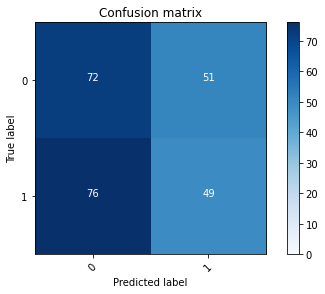

2022-08-20 20:14:47 - [Epoch Train: 35] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 49.00 s            
2022-08-20 20:14:48 - [Epoch Valid: 35] loss: 3.5822, auc: 0.5058, acc: 0.4879, time: 13.00 s


 35%|██████████████                          | 35/100 [38:17<1:09:47, 64.42s/it]

2022-08-20 20:14:48 - EPOCH: 36
2022-08-20 20:14:50 - Train Step 10/244, train_loss: 0.0001
2022-08-20 20:14:52 - Train Step 20/244, train_loss: 0.0001
2022-08-20 20:14:54 - Train Step 30/244, train_loss: 0.0001
2022-08-20 20:14:57 - Train Step 40/244, train_loss: 0.0001
2022-08-20 20:14:59 - Train Step 50/244, train_loss: 0.0001
2022-08-20 20:15:01 - Train Step 60/244, train_loss: 0.0001
2022-08-20 20:15:03 - Train Step 70/244, train_loss: 0.0001
2022-08-20 20:15:05 - Train Step 80/244, train_loss: 0.0001
2022-08-20 20:15:07 - Train Step 90/244, train_loss: 0.0001
2022-08-20 20:15:10 - Train Step 100/244, train_loss: 0.0001
2022-08-20 20:15:12 - Train Step 110/244, train_loss: 0.0001
2022-08-20 20:15:14 - Train Step 120/244, train_loss: 0.0001
2022-08-20 20:15:16 - Train Step 130/244, train_loss: 0.0001
2022-08-20 20:15:18 - Train Step 140/244, train_loss: 0.0001
2022-08-20 20:15:20 - Train Step 150/244, train_loss: 0.0001
2022-08-20 20:15:23 - Train Step 160/244, train_loss: 0.0001
2

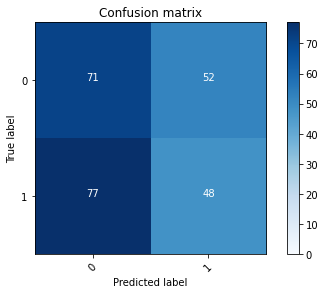

2022-08-20 20:15:55 - [Epoch Train: 36] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:15:55 - [Epoch Valid: 36] loss: 3.3730, auc: 0.5073, acc: 0.4798, time: 13.00 s


 36%|██████████████▍                         | 36/100 [39:24<1:09:38, 65.29s/it]

2022-08-20 20:15:55 - EPOCH: 37
2022-08-20 20:15:57 - Train Step 10/244, train_loss: 0.0001
2022-08-20 20:15:59 - Train Step 20/244, train_loss: 0.0001
2022-08-20 20:16:01 - Train Step 30/244, train_loss: 0.0001
2022-08-20 20:16:03 - Train Step 40/244, train_loss: 0.0001
2022-08-20 20:16:05 - Train Step 50/244, train_loss: 0.0001
2022-08-20 20:16:07 - Train Step 60/244, train_loss: 0.0001
2022-08-20 20:16:09 - Train Step 70/244, train_loss: 0.0001
2022-08-20 20:16:11 - Train Step 80/244, train_loss: 0.0001
2022-08-20 20:16:13 - Train Step 90/244, train_loss: 0.0001
2022-08-20 20:16:14 - Train Step 100/244, train_loss: 0.0001
2022-08-20 20:16:16 - Train Step 110/244, train_loss: 0.0001
2022-08-20 20:16:18 - Train Step 120/244, train_loss: 0.0001
2022-08-20 20:16:21 - Train Step 130/244, train_loss: 0.0001
2022-08-20 20:16:22 - Train Step 140/244, train_loss: 0.0001
2022-08-20 20:16:24 - Train Step 150/244, train_loss: 0.0001
2022-08-20 20:16:26 - Train Step 160/244, train_loss: 0.0001
2

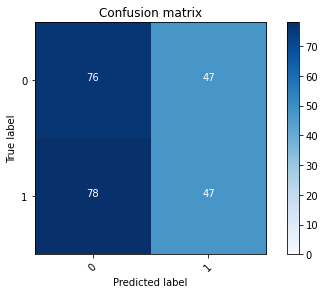

2022-08-20 20:16:56 - [Epoch Train: 37] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 47.00 s            
2022-08-20 20:16:56 - [Epoch Valid: 37] loss: 3.5580, auc: 0.5002, acc: 0.4960, time: 13.00 s


 37%|██████████████▊                         | 37/100 [40:26<1:07:13, 64.02s/it]

2022-08-20 20:16:56 - EPOCH: 38
2022-08-20 20:16:58 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:17:00 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:17:03 - Train Step 30/244, train_loss: 0.0002
2022-08-20 20:17:05 - Train Step 40/244, train_loss: 0.0001
2022-08-20 20:17:07 - Train Step 50/244, train_loss: 0.0001
2022-08-20 20:17:09 - Train Step 60/244, train_loss: 0.0001
2022-08-20 20:17:11 - Train Step 70/244, train_loss: 0.0001
2022-08-20 20:17:13 - Train Step 80/244, train_loss: 0.0001
2022-08-20 20:17:15 - Train Step 90/244, train_loss: 0.0001
2022-08-20 20:17:17 - Train Step 100/244, train_loss: 0.0001
2022-08-20 20:17:19 - Train Step 110/244, train_loss: 0.0001
2022-08-20 20:17:21 - Train Step 120/244, train_loss: 0.0001
2022-08-20 20:17:24 - Train Step 130/244, train_loss: 0.0001
2022-08-20 20:17:26 - Train Step 140/244, train_loss: 0.0001
2022-08-20 20:17:28 - Train Step 150/244, train_loss: 0.0001
2022-08-20 20:17:31 - Train Step 160/244, train_loss: 0.0001
2

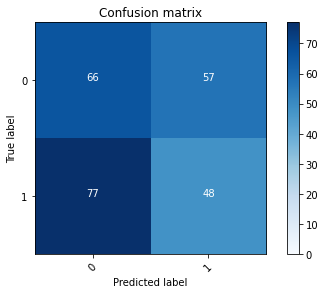

2022-08-20 20:18:01 - [Epoch Train: 38] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 20:18:01 - [Epoch Valid: 38] loss: 3.4788, auc: 0.5047, acc: 0.4597, time: 13.00 s


 38%|███████████████▏                        | 38/100 [41:31<1:06:36, 64.46s/it]

2022-08-20 20:18:01 - EPOCH: 39
2022-08-20 20:18:04 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:18:06 - Train Step 20/244, train_loss: 0.0001
2022-08-20 20:18:08 - Train Step 30/244, train_loss: 0.0001
2022-08-20 20:18:10 - Train Step 40/244, train_loss: 0.0001
2022-08-20 20:18:12 - Train Step 50/244, train_loss: 0.0001
2022-08-20 20:18:14 - Train Step 60/244, train_loss: 0.0001
2022-08-20 20:18:16 - Train Step 70/244, train_loss: 0.0001
2022-08-20 20:18:19 - Train Step 80/244, train_loss: 0.0001
2022-08-20 20:18:21 - Train Step 90/244, train_loss: 0.0001
2022-08-20 20:18:23 - Train Step 100/244, train_loss: 0.0001
2022-08-20 20:18:25 - Train Step 110/244, train_loss: 0.0001
2022-08-20 20:18:27 - Train Step 120/244, train_loss: 0.0001
2022-08-20 20:18:29 - Train Step 130/244, train_loss: 0.0001
2022-08-20 20:18:31 - Train Step 140/244, train_loss: 0.0001
2022-08-20 20:18:33 - Train Step 150/244, train_loss: 0.0001
2022-08-20 20:18:35 - Train Step 160/244, train_loss: 0.0001
2

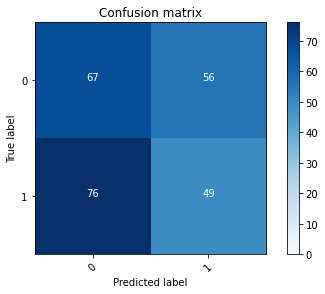

2022-08-20 20:19:06 - [Epoch Train: 39] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 20:19:06 - [Epoch Valid: 39] loss: 3.6468, auc: 0.4995, acc: 0.4677, time: 13.00 s


 39%|███████████████▌                        | 39/100 [42:36<1:05:34, 64.50s/it]

2022-08-20 20:19:06 - EPOCH: 40
2022-08-20 20:19:08 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:19:10 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:19:12 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:19:14 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:19:16 - Train Step 50/244, train_loss: 0.0001
2022-08-20 20:19:18 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:19:20 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:19:22 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:19:24 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:19:26 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:19:28 - Train Step 110/244, train_loss: 0.0001
2022-08-20 20:19:30 - Train Step 120/244, train_loss: 0.0001
2022-08-20 20:19:32 - Train Step 130/244, train_loss: 0.0001
2022-08-20 20:19:34 - Train Step 140/244, train_loss: 0.0001
2022-08-20 20:19:36 - Train Step 150/244, train_loss: 0.0001
2022-08-20 20:19:38 - Train Step 160/244, train_loss: 0.0001
2

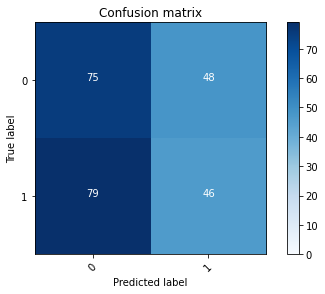

2022-08-20 20:20:07 - [Epoch Train: 40] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 48.00 s            
2022-08-20 20:20:07 - [Epoch Valid: 40] loss: 3.5676, auc: 0.5018, acc: 0.4879, time: 12.00 s


 40%|████████████████                        | 40/100 [43:37<1:03:33, 63.56s/it]

2022-08-20 20:20:07 - EPOCH: 41
2022-08-20 20:20:10 - Train Step 10/244, train_loss: 0.0001
2022-08-20 20:20:12 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:20:14 - Train Step 30/244, train_loss: 0.0001
2022-08-20 20:20:16 - Train Step 40/244, train_loss: 0.0001
2022-08-20 20:20:18 - Train Step 50/244, train_loss: 0.0001
2022-08-20 20:20:21 - Train Step 60/244, train_loss: 0.0001
2022-08-20 20:20:23 - Train Step 70/244, train_loss: 0.0001
2022-08-20 20:20:25 - Train Step 80/244, train_loss: 0.0001
2022-08-20 20:20:27 - Train Step 90/244, train_loss: 0.0001
2022-08-20 20:20:29 - Train Step 100/244, train_loss: 0.0001
2022-08-20 20:20:31 - Train Step 110/244, train_loss: 0.0001
2022-08-20 20:20:33 - Train Step 120/244, train_loss: 0.0001
2022-08-20 20:20:35 - Train Step 130/244, train_loss: 0.0001
2022-08-20 20:20:37 - Train Step 140/244, train_loss: 0.0001
2022-08-20 20:20:39 - Train Step 150/244, train_loss: 0.0001
2022-08-20 20:20:41 - Train Step 160/244, train_loss: 0.0001
2

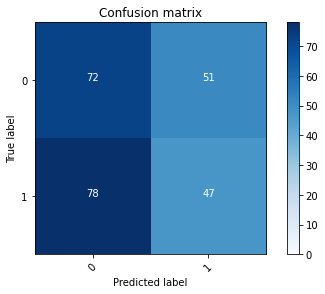

2022-08-20 20:21:13 - [Epoch Train: 41] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 20:21:13 - [Epoch Valid: 41] loss: 3.8656, auc: 0.4994, acc: 0.4798, time: 13.00 s


 41%|████████████████▍                       | 41/100 [44:43<1:03:06, 64.17s/it]

2022-08-20 20:21:13 - EPOCH: 42
2022-08-20 20:21:15 - Train Step 10/244, train_loss: 0.0001
2022-08-20 20:21:17 - Train Step 20/244, train_loss: 0.0001
2022-08-20 20:21:20 - Train Step 30/244, train_loss: 0.0001
2022-08-20 20:21:22 - Train Step 40/244, train_loss: 0.0001
2022-08-20 20:21:24 - Train Step 50/244, train_loss: 0.0001
2022-08-20 20:21:26 - Train Step 60/244, train_loss: 0.0001
2022-08-20 20:21:28 - Train Step 70/244, train_loss: 0.0001
2022-08-20 20:21:30 - Train Step 80/244, train_loss: 0.0001
2022-08-20 20:21:32 - Train Step 90/244, train_loss: 0.0001
2022-08-20 20:21:35 - Train Step 100/244, train_loss: 0.0001
2022-08-20 20:21:37 - Train Step 110/244, train_loss: 0.0001
2022-08-20 20:21:39 - Train Step 120/244, train_loss: 0.0001
2022-08-20 20:21:41 - Train Step 130/244, train_loss: 0.0001
2022-08-20 20:21:43 - Train Step 140/244, train_loss: 0.0001
2022-08-20 20:21:45 - Train Step 150/244, train_loss: 0.0001
2022-08-20 20:21:47 - Train Step 160/244, train_loss: 0.0001
2

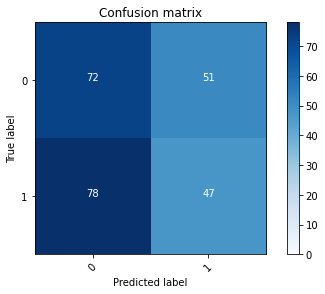

2022-08-20 20:22:19 - [Epoch Train: 42] loss: 0.0001, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 20:22:19 - [Epoch Valid: 42] loss: 3.8148, auc: 0.5040, acc: 0.4798, time: 13.00 s


 42%|████████████████▊                       | 42/100 [45:48<1:02:26, 64.60s/it]

2022-08-20 20:22:19 - EPOCH: 43
2022-08-20 20:22:21 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:22:23 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:22:26 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:22:28 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:22:30 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:22:32 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:22:34 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:22:36 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:22:39 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:22:41 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:22:43 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:22:45 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:22:47 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:22:50 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:22:52 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:22:54 - Train Step 160/244, train_loss: 0.0000
2

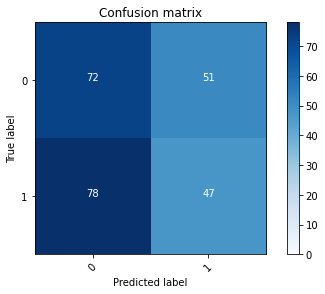

2022-08-20 20:23:26 - [Epoch Train: 43] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:23:26 - [Epoch Valid: 43] loss: 4.0251, auc: 0.5064, acc: 0.4798, time: 13.00 s


 43%|█████████████████▏                      | 43/100 [46:56<1:02:11, 65.47s/it]

2022-08-20 20:23:26 - EPOCH: 44
2022-08-20 20:23:29 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:23:31 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:23:33 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:23:35 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:23:37 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:23:39 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:23:42 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:23:44 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:23:46 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:23:48 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:23:50 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:23:52 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:23:54 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:23:57 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:23:59 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:24:01 - Train Step 160/244, train_loss: 0.0000
2

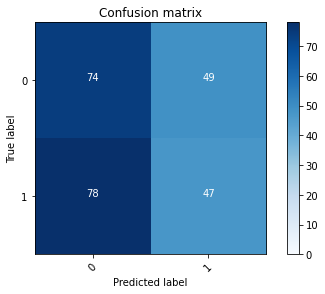

2022-08-20 20:24:32 - [Epoch Train: 44] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:24:32 - [Epoch Valid: 44] loss: 4.0345, auc: 0.5034, acc: 0.4879, time: 13.00 s


 44%|█████████████████▌                      | 44/100 [48:02<1:01:16, 65.66s/it]

2022-08-20 20:24:32 - EPOCH: 45
2022-08-20 20:24:35 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:24:37 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:24:39 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:24:41 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:24:43 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:24:45 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:24:47 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:24:49 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:24:52 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:24:54 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:24:56 - Train Step 110/244, train_loss: 0.0001
2022-08-20 20:24:58 - Train Step 120/244, train_loss: 0.0001
2022-08-20 20:25:00 - Train Step 130/244, train_loss: 0.0001
2022-08-20 20:25:02 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:25:04 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:25:07 - Train Step 160/244, train_loss: 0.0000
2

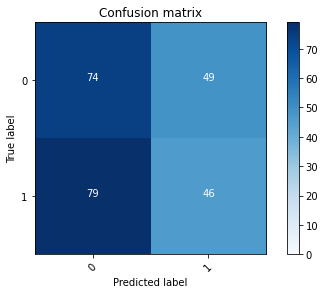

2022-08-20 20:25:39 - [Epoch Train: 45] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:25:39 - [Epoch Valid: 45] loss: 4.1312, auc: 0.5006, acc: 0.4839, time: 14.00 s


 45%|██████████████████                      | 45/100 [49:09<1:00:32, 66.05s/it]

2022-08-20 20:25:39 - EPOCH: 46
2022-08-20 20:25:41 - Train Step 10/244, train_loss: 0.0001
2022-08-20 20:25:43 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:25:46 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:25:47 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:25:49 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:25:52 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:25:54 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:25:56 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:25:58 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:26:00 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:26:02 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:26:04 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:26:06 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:26:08 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:26:10 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:26:12 - Train Step 160/244, train_loss: 0.0000
2

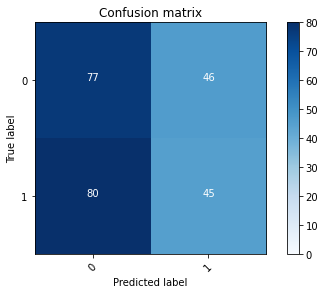

2022-08-20 20:26:43 - [Epoch Train: 46] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:26:43 - [Epoch Valid: 46] loss: 4.2216, auc: 0.5016, acc: 0.4919, time: 13.00 s


 46%|███████████████████▎                      | 46/100 [50:13<58:57, 65.50s/it]

2022-08-20 20:26:43 - EPOCH: 47
2022-08-20 20:26:46 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:26:48 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:26:50 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:26:53 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:26:55 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:26:57 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:26:59 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:27:01 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:27:03 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:27:05 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:27:07 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:27:09 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:27:12 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:27:14 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:27:16 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:27:18 - Train Step 160/244, train_loss: 0.0000
2

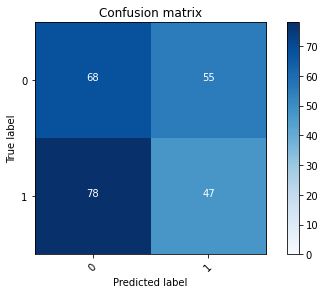

2022-08-20 20:27:49 - [Epoch Train: 47] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:27:49 - [Epoch Valid: 47] loss: 4.1870, auc: 0.5043, acc: 0.4637, time: 13.00 s


 47%|███████████████████▋                      | 47/100 [51:19<57:54, 65.56s/it]

2022-08-20 20:27:49 - EPOCH: 48
2022-08-20 20:27:51 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:27:54 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:27:56 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:27:58 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:28:00 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:28:02 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:28:05 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:28:07 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:28:09 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:28:11 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:28:13 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:28:16 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:28:18 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:28:20 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:28:22 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:28:24 - Train Step 160/244, train_loss: 0.0000
2

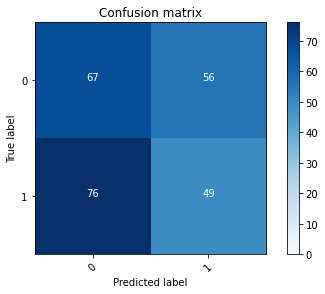

2022-08-20 20:28:56 - [Epoch Train: 48] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:28:56 - [Epoch Valid: 48] loss: 4.1452, auc: 0.5053, acc: 0.4677, time: 13.00 s


 48%|████████████████████▏                     | 48/100 [52:26<57:14, 66.05s/it]

2022-08-20 20:28:56 - EPOCH: 49
2022-08-20 20:28:59 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:29:01 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:29:03 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:29:05 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:29:07 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:29:10 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:29:12 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:29:14 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:29:16 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:29:18 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:29:21 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:29:23 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:29:25 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:29:27 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:29:29 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:29:31 - Train Step 160/244, train_loss: 0.0000
2

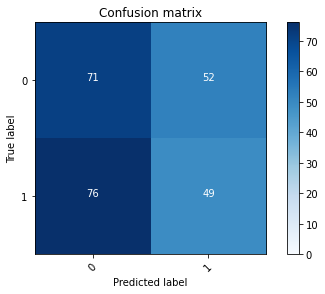

2022-08-20 20:30:03 - [Epoch Train: 49] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:30:03 - [Epoch Valid: 49] loss: 4.0896, auc: 0.5073, acc: 0.4839, time: 13.00 s


 49%|████████████████████▌                     | 49/100 [53:33<56:19, 66.26s/it]

2022-08-20 20:30:03 - EPOCH: 50
2022-08-20 20:30:05 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:30:08 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:30:10 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:30:12 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:30:14 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:30:16 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:30:18 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:30:20 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:30:22 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:30:25 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:30:27 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:30:29 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:30:31 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:30:33 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:30:35 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:30:37 - Train Step 160/244, train_loss: 0.0000
2

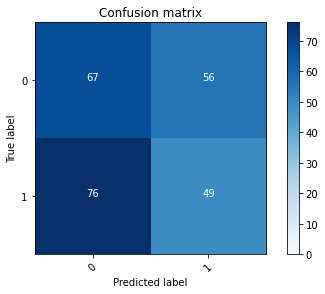

2022-08-20 20:31:09 - [Epoch Train: 50] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:31:09 - [Epoch Valid: 50] loss: 4.3604, auc: 0.5031, acc: 0.4677, time: 14.00 s


 50%|█████████████████████                     | 50/100 [54:39<55:12, 66.26s/it]

2022-08-20 20:31:09 - EPOCH: 51
2022-08-20 20:31:12 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:31:14 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:31:16 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:31:18 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:31:21 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:31:23 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:31:25 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:31:27 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:31:29 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:31:32 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:31:34 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:31:36 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:31:38 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:31:41 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:31:43 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:31:45 - Train Step 160/244, train_loss: 0.0000
2

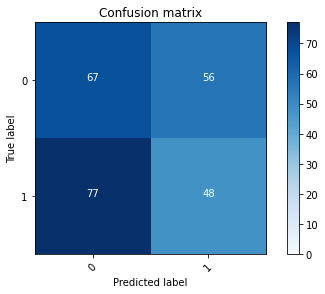

2022-08-20 20:32:16 - [Epoch Train: 51] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:32:16 - [Epoch Valid: 51] loss: 4.2250, auc: 0.5047, acc: 0.4637, time: 12.00 s


 51%|█████████████████████▍                    | 51/100 [55:46<54:12, 66.37s/it]

2022-08-20 20:32:16 - EPOCH: 52
2022-08-20 20:32:18 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:32:21 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:32:23 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:32:25 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:32:27 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:32:29 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:32:32 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:32:34 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:32:36 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:32:38 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:32:40 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:32:42 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:32:44 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:32:46 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:32:48 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:32:51 - Train Step 160/244, train_loss: 0.0000
2

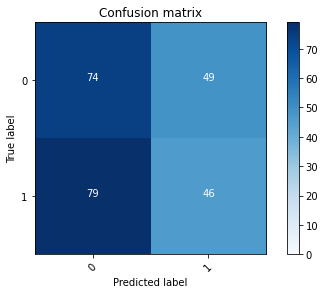

2022-08-20 20:33:23 - [Epoch Train: 52] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:33:23 - [Epoch Valid: 52] loss: 4.1830, auc: 0.5070, acc: 0.4839, time: 14.00 s


 52%|█████████████████████▊                    | 52/100 [56:53<53:23, 66.74s/it]

2022-08-20 20:33:23 - EPOCH: 53
2022-08-20 20:33:26 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:33:28 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:33:30 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:33:32 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:33:35 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:33:37 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:33:39 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:33:41 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:33:43 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:33:46 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:33:48 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:33:50 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:33:52 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:33:54 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:33:56 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:33:59 - Train Step 160/244, train_loss: 0.0000
2

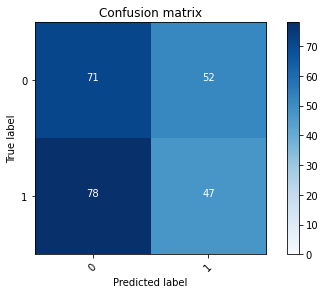

2022-08-20 20:34:31 - [Epoch Train: 53] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:34:31 - [Epoch Valid: 53] loss: 4.3384, auc: 0.5084, acc: 0.4758, time: 14.00 s


 53%|██████████████████████▎                   | 53/100 [58:01<52:30, 67.03s/it]

2022-08-20 20:34:31 - EPOCH: 54
2022-08-20 20:34:33 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:34:36 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:34:38 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:34:40 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:34:42 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:34:44 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:34:46 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:34:48 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:34:50 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:34:52 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:34:54 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:34:56 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:34:58 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:35:00 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:35:03 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:35:05 - Train Step 160/244, train_loss: 0.0000
2

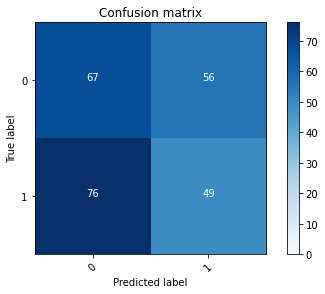

2022-08-20 20:35:36 - [Epoch Train: 54] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:35:36 - [Epoch Valid: 54] loss: 4.4395, auc: 0.5033, acc: 0.4677, time: 13.00 s


 54%|██████████████████████▋                   | 54/100 [59:05<50:50, 66.31s/it]

2022-08-20 20:35:36 - EPOCH: 55
2022-08-20 20:35:38 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:35:40 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:35:43 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:35:45 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:35:47 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:35:49 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:35:52 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:35:54 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:35:56 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:35:58 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:36:00 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:36:03 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:36:05 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:36:07 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:36:09 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:36:11 - Train Step 160/244, train_loss: 0.0000
2

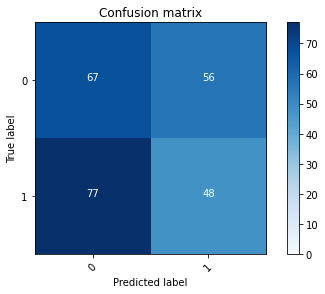

2022-08-20 20:36:44 - [Epoch Train: 55] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 20:36:44 - [Epoch Valid: 55] loss: 4.4641, auc: 0.5040, acc: 0.4637, time: 14.00 s


 55%|██████████████████████                  | 55/100 [1:00:14<50:08, 66.86s/it]

2022-08-20 20:36:44 - EPOCH: 56
2022-08-20 20:36:46 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:36:49 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:36:51 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:36:53 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:36:55 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:36:57 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:36:59 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:37:01 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:37:03 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:37:05 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:37:07 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:37:10 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:37:12 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:37:14 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:37:16 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:37:18 - Train Step 160/244, train_loss: 0.0000
2

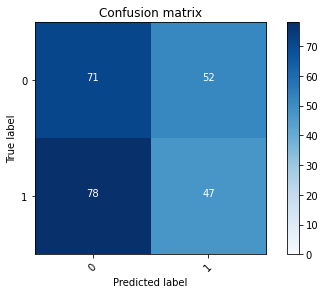

2022-08-20 20:37:50 - [Epoch Train: 56] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 20:37:50 - [Epoch Valid: 56] loss: 4.4653, auc: 0.5055, acc: 0.4758, time: 14.00 s


 56%|██████████████████████▍                 | 56/100 [1:01:20<48:49, 66.59s/it]

2022-08-20 20:37:50 - EPOCH: 57
2022-08-20 20:37:52 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:37:55 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:37:57 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:37:59 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:38:01 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:38:03 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:38:05 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:38:08 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:38:10 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:38:12 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:38:14 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:38:16 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:38:19 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:38:21 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:38:23 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:38:25 - Train Step 160/244, train_loss: 0.0000
2

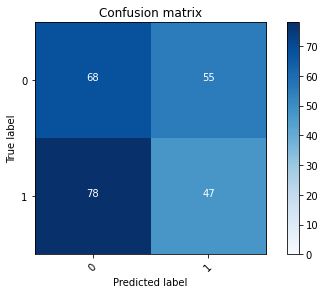

2022-08-20 20:38:56 - [Epoch Train: 57] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:38:56 - [Epoch Valid: 57] loss: 4.7204, auc: 0.5040, acc: 0.4637, time: 13.00 s


 57%|██████████████████████▊                 | 57/100 [1:02:26<47:40, 66.52s/it]

2022-08-20 20:38:56 - EPOCH: 58
2022-08-20 20:38:59 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:39:01 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:39:03 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:39:06 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:39:08 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:39:10 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:39:12 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:39:14 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:39:16 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:39:19 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:39:21 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:39:23 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:39:25 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:39:28 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:39:30 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:39:32 - Train Step 160/244, train_loss: 0.0000
2

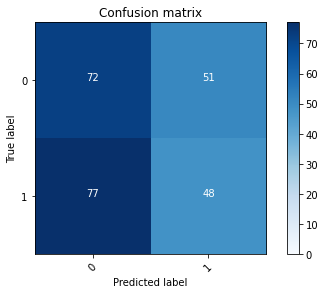

2022-08-20 20:40:04 - [Epoch Train: 58] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 20:40:04 - [Epoch Valid: 58] loss: 4.6096, auc: 0.5071, acc: 0.4839, time: 13.00 s


 58%|███████████████████████▏                | 58/100 [1:03:34<46:52, 66.96s/it]

2022-08-20 20:40:04 - EPOCH: 59
2022-08-20 20:40:07 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:40:09 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:40:11 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:40:13 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:40:15 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:40:17 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:40:19 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:40:21 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:40:23 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:40:25 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:40:28 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:40:30 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:40:32 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:40:34 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:40:36 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:40:38 - Train Step 160/244, train_loss: 0.0000
2

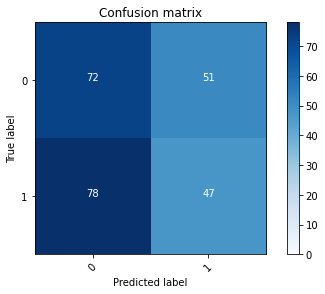

2022-08-20 20:41:10 - [Epoch Train: 59] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 20:41:10 - [Epoch Valid: 59] loss: 4.8651, auc: 0.5033, acc: 0.4798, time: 14.00 s


 59%|███████████████████████▌                | 59/100 [1:04:39<45:27, 66.52s/it]

2022-08-20 20:41:10 - EPOCH: 60
2022-08-20 20:41:12 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:41:14 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:41:17 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:41:19 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:41:21 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:41:23 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:41:25 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:41:27 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:41:29 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:41:32 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:41:34 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:41:36 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:41:38 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:41:40 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:41:42 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:41:44 - Train Step 160/244, train_loss: 0.0000
2

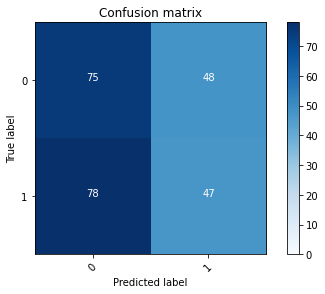

2022-08-20 20:42:16 - [Epoch Train: 60] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:42:16 - [Epoch Valid: 60] loss: 5.0121, auc: 0.5054, acc: 0.4919, time: 14.00 s


 60%|████████████████████████                | 60/100 [1:05:46<44:18, 66.47s/it]

2022-08-20 20:42:16 - EPOCH: 61
2022-08-20 20:42:19 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:42:21 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:42:23 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:42:25 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:42:27 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:42:29 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:42:32 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:42:34 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:42:36 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:42:38 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:42:40 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:42:43 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:42:45 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:42:47 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:42:49 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:42:51 - Train Step 160/244, train_loss: 0.0000
2

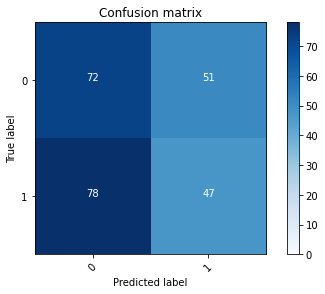

2022-08-20 20:43:24 - [Epoch Train: 61] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:43:24 - [Epoch Valid: 61] loss: 4.6743, auc: 0.5038, acc: 0.4798, time: 14.00 s


 61%|████████████████████████▍               | 61/100 [1:06:54<43:28, 66.89s/it]

2022-08-20 20:43:24 - EPOCH: 62
2022-08-20 20:43:26 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:43:28 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:43:30 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:43:32 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:43:35 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:43:37 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:43:39 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:43:41 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:43:43 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:43:45 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:43:47 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:43:49 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:43:51 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:43:53 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:43:55 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:43:57 - Train Step 160/244, train_loss: 0.0000
2

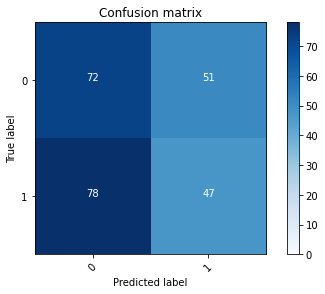

2022-08-20 20:44:28 - [Epoch Train: 62] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:44:28 - [Epoch Valid: 62] loss: 4.8344, auc: 0.5038, acc: 0.4798, time: 13.00 s


 62%|████████████████████████▊               | 62/100 [1:07:58<41:53, 66.14s/it]

2022-08-20 20:44:28 - EPOCH: 63
2022-08-20 20:44:31 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:44:33 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:44:35 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:44:37 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:44:40 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:44:42 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:44:44 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:44:46 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:44:48 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:44:51 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:44:53 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:44:55 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:44:57 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:44:59 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:45:01 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:45:04 - Train Step 160/244, train_loss: 0.0000
2

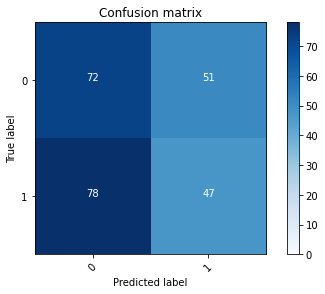

2022-08-20 20:45:35 - [Epoch Train: 63] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:45:35 - [Epoch Valid: 63] loss: 4.7616, auc: 0.5053, acc: 0.4798, time: 14.00 s


 63%|█████████████████████████▏              | 63/100 [1:09:05<40:58, 66.44s/it]

2022-08-20 20:45:35 - EPOCH: 64
2022-08-20 20:45:38 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:45:40 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:45:42 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:45:44 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:45:46 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:45:48 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:45:50 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:45:52 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:45:54 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:45:56 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:45:58 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:46:00 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:46:03 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:46:05 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:46:07 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:46:09 - Train Step 160/244, train_loss: 0.0000
2

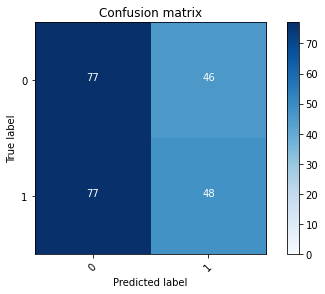

2022-08-20 20:46:40 - [Epoch Train: 64] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:46:40 - [Epoch Valid: 64] loss: 4.8819, auc: 0.5023, acc: 0.5040, time: 14.00 s


 64%|█████████████████████████▌              | 64/100 [1:10:10<39:30, 65.85s/it]

2022-08-20 20:46:40 - EPOCH: 65
2022-08-20 20:46:42 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:46:45 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:46:47 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:46:49 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:46:51 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:46:54 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:46:56 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:46:58 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:47:00 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:47:03 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:47:05 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:47:07 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:47:09 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:47:12 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:47:14 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:47:16 - Train Step 160/244, train_loss: 0.0000
2

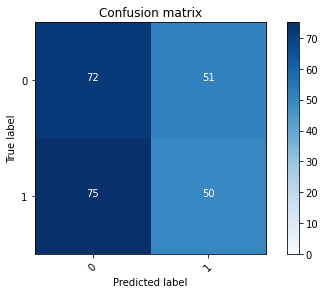

2022-08-20 20:47:48 - [Epoch Train: 65] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:47:48 - [Epoch Valid: 65] loss: 4.8010, auc: 0.5035, acc: 0.4919, time: 13.00 s


 65%|██████████████████████████              | 65/100 [1:11:17<38:43, 66.37s/it]

2022-08-20 20:47:48 - EPOCH: 66
2022-08-20 20:47:50 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:47:52 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:47:54 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:47:57 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:47:59 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:48:01 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:48:03 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:48:05 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:48:08 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:48:10 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:48:12 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:48:14 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:48:16 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:48:19 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:48:21 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:48:23 - Train Step 160/244, train_loss: 0.0000
2

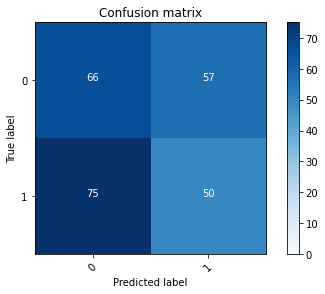

2022-08-20 20:48:55 - [Epoch Train: 66] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:48:55 - [Epoch Valid: 66] loss: 4.9892, auc: 0.5028, acc: 0.4677, time: 13.00 s


 66%|██████████████████████████▍             | 66/100 [1:12:24<37:45, 66.62s/it]

2022-08-20 20:48:55 - EPOCH: 67
2022-08-20 20:48:57 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:48:59 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:49:01 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:49:03 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:49:05 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:49:07 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:49:10 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:49:12 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:49:14 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:49:16 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:49:18 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:49:20 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:49:22 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:49:24 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:49:26 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:49:28 - Train Step 160/244, train_loss: 0.0000
2

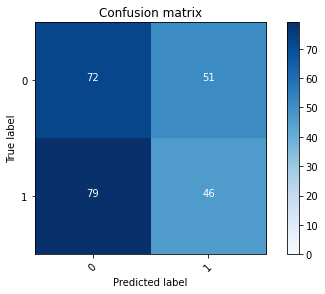

2022-08-20 20:49:59 - [Epoch Train: 67] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 20:49:59 - [Epoch Valid: 67] loss: 5.0346, auc: 0.5021, acc: 0.4758, time: 13.00 s


 67%|██████████████████████████▊             | 67/100 [1:13:29<36:16, 65.94s/it]

2022-08-20 20:49:59 - EPOCH: 68
2022-08-20 20:50:01 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:50:04 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:50:06 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:50:08 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:50:10 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:50:12 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:50:14 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:50:16 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:50:18 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:50:20 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:50:22 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:50:24 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:50:26 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:50:28 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:50:30 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:50:32 - Train Step 160/244, train_loss: 0.0000
2

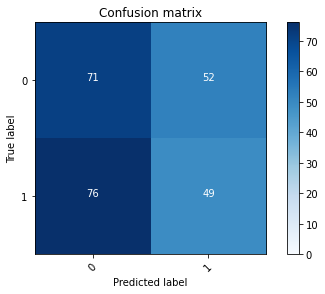

2022-08-20 20:51:02 - [Epoch Train: 68] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:51:02 - [Epoch Valid: 68] loss: 4.9947, auc: 0.5066, acc: 0.4839, time: 13.00 s


 68%|███████████████████████████▏            | 68/100 [1:14:32<34:44, 65.14s/it]

2022-08-20 20:51:02 - EPOCH: 69
2022-08-20 20:51:05 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:51:07 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:51:09 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:51:11 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:51:13 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:51:15 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:51:17 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:51:19 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:51:21 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:51:23 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:51:25 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:51:27 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:51:29 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:51:31 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:51:34 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:51:36 - Train Step 160/244, train_loss: 0.0000
2

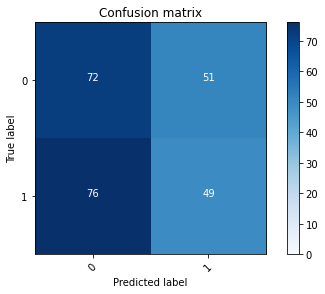

2022-08-20 20:52:07 - [Epoch Train: 69] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:52:07 - [Epoch Valid: 69] loss: 4.8210, auc: 0.5049, acc: 0.4879, time: 13.00 s


 69%|███████████████████████████▌            | 69/100 [1:15:36<33:32, 64.93s/it]

2022-08-20 20:52:07 - EPOCH: 70
2022-08-20 20:52:09 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:52:12 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:52:14 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:52:16 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:52:18 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:52:21 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:52:23 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:52:25 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:52:27 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:52:30 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:52:32 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:52:34 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:52:36 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:52:38 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:52:40 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:52:42 - Train Step 160/244, train_loss: 0.0000
2

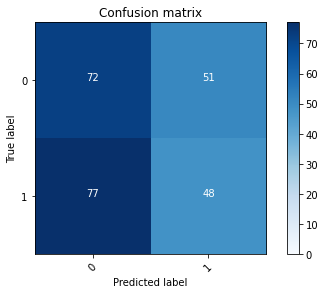

2022-08-20 20:53:15 - [Epoch Train: 70] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:53:15 - [Epoch Valid: 70] loss: 5.3674, auc: 0.5095, acc: 0.4839, time: 14.00 s


 70%|████████████████████████████            | 70/100 [1:16:45<32:57, 65.90s/it]

2022-08-20 20:53:15 - EPOCH: 71
2022-08-20 20:53:18 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:53:20 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:53:22 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:53:24 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:53:26 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:53:28 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:53:31 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:53:33 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:53:35 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:53:37 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:53:39 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:53:41 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:53:43 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:53:45 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:53:48 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:53:50 - Train Step 160/244, train_loss: 0.0000
2

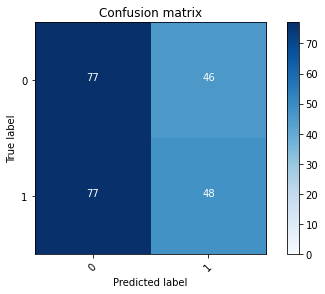

2022-08-20 20:54:20 - [Epoch Train: 71] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 20:54:20 - [Epoch Valid: 71] loss: 5.3250, auc: 0.5058, acc: 0.5040, time: 13.00 s


 71%|████████████████████████████▍           | 71/100 [1:17:50<31:46, 65.74s/it]

2022-08-20 20:54:20 - EPOCH: 72
2022-08-20 20:54:23 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:54:25 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:54:27 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:54:29 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:54:31 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:54:33 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:54:35 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:54:37 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:54:39 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:54:41 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:54:44 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:54:46 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:54:48 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:54:50 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:54:52 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:54:55 - Train Step 160/244, train_loss: 0.0000
2

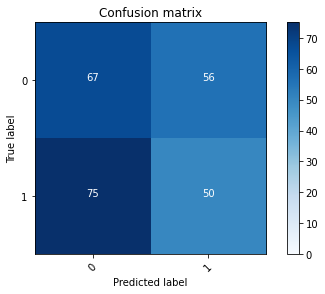

2022-08-20 20:55:26 - [Epoch Train: 72] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 20:55:26 - [Epoch Valid: 72] loss: 5.1990, auc: 0.5039, acc: 0.4718, time: 13.00 s


 72%|████████████████████████████▊           | 72/100 [1:18:56<30:40, 65.74s/it]

2022-08-20 20:55:26 - EPOCH: 73
2022-08-20 20:55:28 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:55:30 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:55:33 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:55:35 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:55:37 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:55:39 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:55:41 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:55:43 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:55:45 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:55:47 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:55:49 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:55:51 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:55:53 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:55:55 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:55:57 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:55:59 - Train Step 160/244, train_loss: 0.0000
2

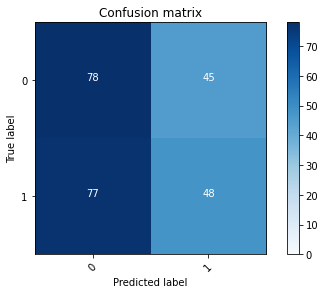

2022-08-20 20:56:30 - [Epoch Train: 73] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:56:30 - [Epoch Valid: 73] loss: 5.1719, auc: 0.5168, acc: 0.5081, time: 13.00 s


 73%|█████████████████████████████▏          | 73/100 [1:20:00<29:18, 65.14s/it]

2022-08-20 20:56:30 - EPOCH: 74
2022-08-20 20:56:32 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:56:34 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:56:36 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:56:38 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:56:40 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:56:42 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:56:44 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:56:46 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:56:49 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:56:51 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:56:53 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:56:55 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:56:57 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:56:59 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:57:01 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:57:03 - Train Step 160/244, train_loss: 0.0000
2

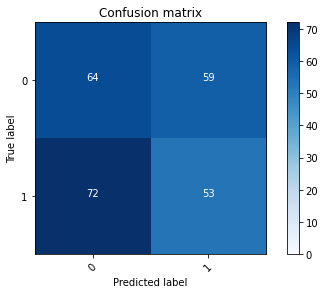

2022-08-20 20:57:33 - [Epoch Train: 74] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:57:33 - [Epoch Valid: 74] loss: 5.3912, auc: 0.5119, acc: 0.4718, time: 13.00 s


 74%|█████████████████████████████▌          | 74/100 [1:21:03<27:57, 64.53s/it]

2022-08-20 20:57:33 - EPOCH: 75
2022-08-20 20:57:36 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:57:38 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:57:40 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:57:42 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:57:44 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:57:46 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:57:49 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:57:51 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:57:53 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:57:55 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:57:57 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:57:59 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:58:02 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:58:04 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:58:06 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:58:08 - Train Step 160/244, train_loss: 0.0000
2

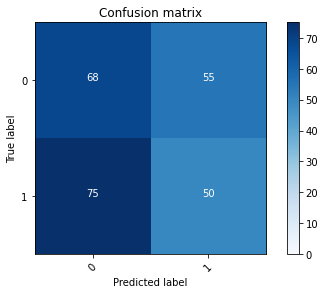

2022-08-20 20:58:40 - [Epoch Train: 75] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 20:58:40 - [Epoch Valid: 75] loss: 5.5221, auc: 0.5106, acc: 0.4758, time: 14.00 s


 75%|██████████████████████████████          | 75/100 [1:22:10<27:14, 65.40s/it]

2022-08-20 20:58:40 - EPOCH: 76
2022-08-20 20:58:43 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:58:45 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:58:47 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:58:49 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:58:51 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:58:53 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:58:55 - Train Step 70/244, train_loss: 0.0000
2022-08-20 20:58:57 - Train Step 80/244, train_loss: 0.0000
2022-08-20 20:58:59 - Train Step 90/244, train_loss: 0.0000
2022-08-20 20:59:01 - Train Step 100/244, train_loss: 0.0000
2022-08-20 20:59:03 - Train Step 110/244, train_loss: 0.0000
2022-08-20 20:59:05 - Train Step 120/244, train_loss: 0.0000
2022-08-20 20:59:07 - Train Step 130/244, train_loss: 0.0000
2022-08-20 20:59:09 - Train Step 140/244, train_loss: 0.0000
2022-08-20 20:59:11 - Train Step 150/244, train_loss: 0.0000
2022-08-20 20:59:14 - Train Step 160/244, train_loss: 0.0000
2

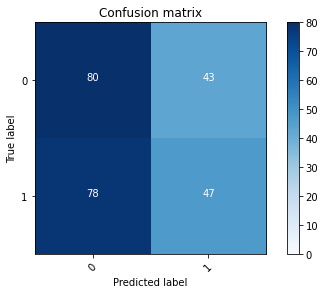

2022-08-20 20:59:45 - [Epoch Train: 76] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 20:59:45 - [Epoch Valid: 76] loss: 5.5470, auc: 0.5169, acc: 0.5121, time: 14.00 s


 76%|██████████████████████████████▍         | 76/100 [1:23:14<26:02, 65.12s/it]

2022-08-20 20:59:45 - EPOCH: 77
2022-08-20 20:59:47 - Train Step 10/244, train_loss: 0.0000
2022-08-20 20:59:49 - Train Step 20/244, train_loss: 0.0000
2022-08-20 20:59:51 - Train Step 30/244, train_loss: 0.0000
2022-08-20 20:59:53 - Train Step 40/244, train_loss: 0.0000
2022-08-20 20:59:55 - Train Step 50/244, train_loss: 0.0000
2022-08-20 20:59:57 - Train Step 60/244, train_loss: 0.0000
2022-08-20 20:59:59 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:00:02 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:00:04 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:00:06 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:00:08 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:00:10 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:00:12 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:00:14 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:00:16 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:00:18 - Train Step 160/244, train_loss: 0.0000
2

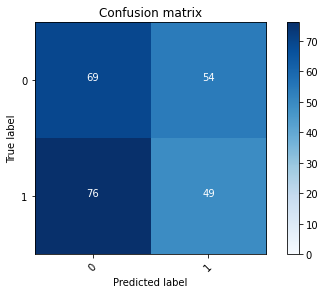

2022-08-20 21:00:50 - [Epoch Train: 77] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 21:00:50 - [Epoch Valid: 77] loss: 5.5209, auc: 0.5158, acc: 0.4758, time: 13.00 s


 77%|██████████████████████████████▊         | 77/100 [1:24:19<24:55, 65.00s/it]

2022-08-20 21:00:50 - EPOCH: 78
2022-08-20 21:00:52 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:00:54 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:00:57 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:00:59 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:01:01 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:01:03 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:01:05 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:01:08 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:01:10 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:01:12 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:01:14 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:01:16 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:01:18 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:01:21 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:01:23 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:01:25 - Train Step 160/244, train_loss: 0.0000
2

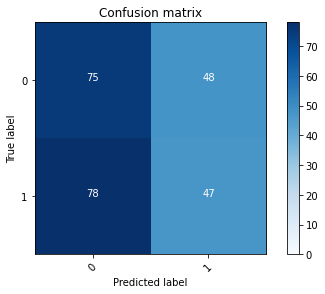

2022-08-20 21:01:57 - [Epoch Train: 78] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 21:01:57 - [Epoch Valid: 78] loss: 5.7906, auc: 0.5149, acc: 0.4919, time: 14.00 s


 78%|███████████████████████████████▏        | 78/100 [1:25:27<24:08, 65.85s/it]

2022-08-20 21:01:57 - EPOCH: 79
2022-08-20 21:02:00 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:02:02 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:02:04 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:02:06 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:02:08 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:02:11 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:02:13 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:02:15 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:02:17 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:02:19 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:02:21 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:02:23 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:02:26 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:02:28 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:02:30 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:02:32 - Train Step 160/244, train_loss: 0.0000
2

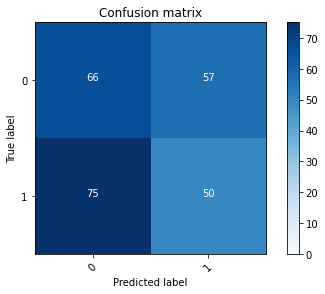

2022-08-20 21:03:03 - [Epoch Train: 79] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 21:03:03 - [Epoch Valid: 79] loss: 5.5710, auc: 0.5137, acc: 0.4677, time: 13.00 s


 79%|███████████████████████████████▌        | 79/100 [1:26:32<22:59, 65.69s/it]

2022-08-20 21:03:03 - EPOCH: 80
2022-08-20 21:03:05 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:03:07 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:03:10 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:03:12 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:03:14 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:03:16 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:03:18 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:03:21 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:03:23 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:03:25 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:03:27 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:03:29 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:03:31 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:03:34 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:03:36 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:03:38 - Train Step 160/244, train_loss: 0.0000
2

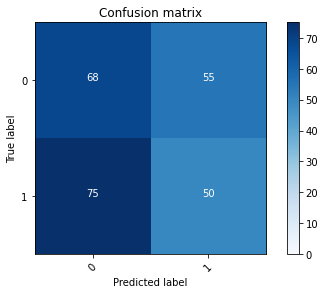

2022-08-20 21:04:10 - [Epoch Train: 80] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 21:04:10 - [Epoch Valid: 80] loss: 5.7197, auc: 0.5133, acc: 0.4758, time: 14.00 s


 80%|████████████████████████████████        | 80/100 [1:27:39<22:00, 66.05s/it]

2022-08-20 21:04:10 - EPOCH: 81
2022-08-20 21:04:12 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:04:14 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:04:16 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:04:18 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:04:20 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:04:22 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:04:24 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:04:26 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:04:29 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:04:31 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:04:33 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:04:35 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:04:37 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:04:39 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:04:41 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:04:43 - Train Step 160/244, train_loss: 0.0000
2

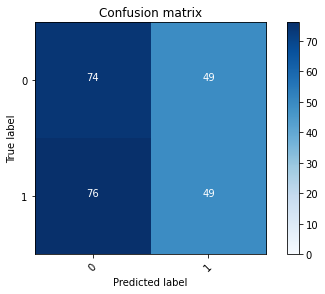

2022-08-20 21:05:13 - [Epoch Train: 81] loss: 0.0010, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 21:05:13 - [Epoch Valid: 81] loss: 6.3736, auc: 0.5093, acc: 0.4960, time: 13.00 s


 81%|████████████████████████████████▍       | 81/100 [1:28:43<20:41, 65.36s/it]

2022-08-20 21:05:13 - EPOCH: 82
2022-08-20 21:05:16 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:05:18 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:05:20 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:05:22 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:05:25 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:05:27 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:05:29 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:05:31 - Train Step 80/244, train_loss: 0.0001
2022-08-20 21:05:33 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:05:36 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:05:38 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:05:40 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:05:42 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:05:44 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:05:46 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:05:49 - Train Step 160/244, train_loss: 0.0000
2

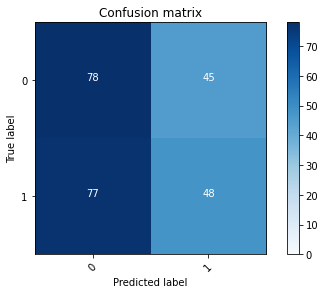

2022-08-20 21:06:21 - [Epoch Train: 82] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 21:06:21 - [Epoch Valid: 82] loss: 6.0388, auc: 0.5037, acc: 0.5081, time: 14.00 s


 82%|████████████████████████████████▊       | 82/100 [1:29:51<19:48, 66.03s/it]

2022-08-20 21:06:21 - EPOCH: 83
2022-08-20 21:06:23 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:06:25 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:06:27 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:06:29 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:06:31 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:06:34 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:06:36 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:06:38 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:06:40 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:06:42 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:06:44 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:06:46 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:06:48 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:06:50 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:06:52 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:06:54 - Train Step 160/244, train_loss: 0.0000
2

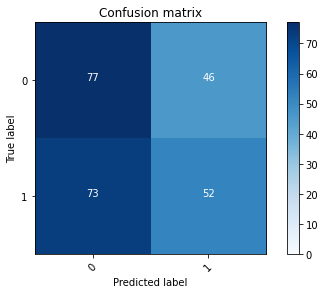

2022-08-20 21:07:25 - [Epoch Train: 83] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 21:07:25 - [Epoch Valid: 83] loss: 6.2997, auc: 0.5086, acc: 0.5202, time: 13.00 s


 83%|█████████████████████████████████▏      | 83/100 [1:30:55<18:34, 65.58s/it]

2022-08-20 21:07:25 - EPOCH: 84
2022-08-20 21:07:28 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:07:30 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:07:32 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:07:34 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:07:37 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:07:39 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:07:41 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:07:43 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:07:45 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:07:47 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:07:49 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:07:51 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:07:54 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:07:56 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:07:58 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:08:00 - Train Step 160/244, train_loss: 0.0000
2

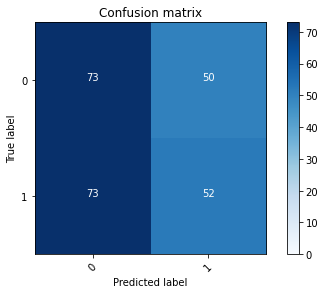

2022-08-20 21:08:31 - [Epoch Train: 84] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 21:08:31 - [Epoch Valid: 84] loss: 6.1707, auc: 0.5108, acc: 0.5040, time: 13.00 s


 84%|█████████████████████████████████▌      | 84/100 [1:32:01<17:31, 65.69s/it]

2022-08-20 21:08:31 - EPOCH: 85
2022-08-20 21:08:34 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:08:36 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:08:38 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:08:41 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:08:43 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:08:45 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:08:47 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:08:49 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:08:51 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:08:54 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:08:56 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:08:58 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:09:00 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:09:02 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:09:05 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:09:07 - Train Step 160/244, train_loss: 0.0000
2

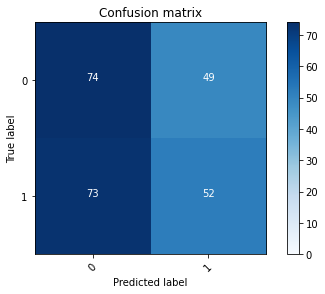

2022-08-20 21:09:39 - [Epoch Train: 85] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 21:09:39 - [Epoch Valid: 85] loss: 6.3957, auc: 0.5085, acc: 0.5081, time: 14.00 s


 85%|██████████████████████████████████      | 85/100 [1:33:09<16:33, 66.26s/it]

2022-08-20 21:09:39 - EPOCH: 86
2022-08-20 21:09:41 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:09:44 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:09:46 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:09:48 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:09:50 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:09:52 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:09:55 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:09:57 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:09:59 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:10:01 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:10:03 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:10:05 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:10:08 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:10:10 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:10:12 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:10:14 - Train Step 160/244, train_loss: 0.0000
2

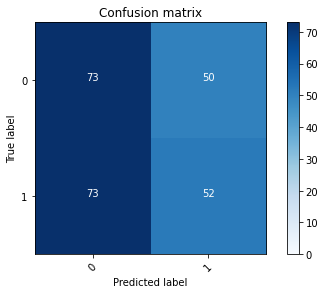

2022-08-20 21:10:46 - [Epoch Train: 86] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 21:10:46 - [Epoch Valid: 86] loss: 6.0720, auc: 0.5091, acc: 0.5040, time: 14.00 s


 86%|██████████████████████████████████▍     | 86/100 [1:34:15<15:29, 66.38s/it]

2022-08-20 21:10:46 - EPOCH: 87
2022-08-20 21:10:48 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:10:50 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:10:53 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:10:55 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:10:57 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:10:59 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:11:02 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:11:04 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:11:06 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:11:08 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:11:10 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:11:12 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:11:15 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:11:17 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:11:19 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:11:21 - Train Step 160/244, train_loss: 0.0000
2

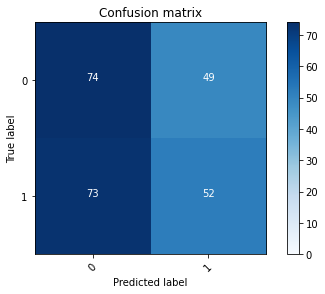

2022-08-20 21:11:52 - [Epoch Train: 87] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 21:11:52 - [Epoch Valid: 87] loss: 6.2923, auc: 0.5093, acc: 0.5081, time: 12.00 s


 87%|██████████████████████████████████▊     | 87/100 [1:35:22<14:23, 66.45s/it]

2022-08-20 21:11:52 - EPOCH: 88
2022-08-20 21:11:55 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:11:57 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:11:59 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:12:01 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:12:04 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:12:06 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:12:08 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:12:10 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:12:12 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:12:15 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:12:17 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:12:19 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:12:21 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:12:23 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:12:25 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:12:27 - Train Step 160/244, train_loss: 0.0000
2

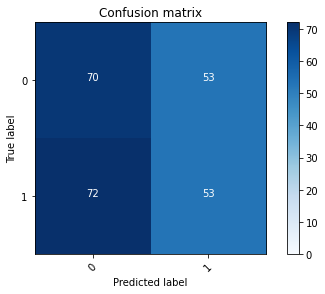

2022-08-20 21:12:59 - [Epoch Train: 88] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 21:12:59 - [Epoch Valid: 88] loss: 6.0570, auc: 0.5088, acc: 0.4960, time: 14.00 s


 88%|███████████████████████████████████▏    | 88/100 [1:36:29<13:19, 66.63s/it]

2022-08-20 21:12:59 - EPOCH: 89
2022-08-20 21:13:02 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:13:04 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:13:06 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:13:08 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:13:11 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:13:13 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:13:15 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:13:17 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:13:20 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:13:22 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:13:24 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:13:26 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:13:28 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:13:31 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:13:33 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:13:35 - Train Step 160/244, train_loss: 0.0000
2

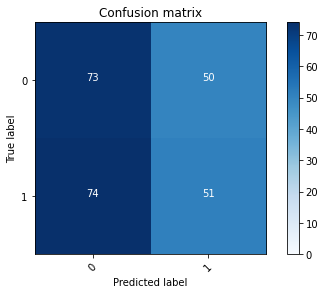

2022-08-20 21:14:06 - [Epoch Train: 89] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 21:14:06 - [Epoch Valid: 89] loss: 6.1655, auc: 0.5102, acc: 0.5000, time: 13.00 s


 89%|███████████████████████████████████▌    | 89/100 [1:37:36<12:14, 66.77s/it]

2022-08-20 21:14:06 - EPOCH: 90
2022-08-20 21:14:09 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:14:11 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:14:13 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:14:16 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:14:18 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:14:20 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:14:22 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:14:24 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:14:26 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:14:29 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:14:31 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:14:33 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:14:35 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:14:37 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:14:40 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:14:42 - Train Step 160/244, train_loss: 0.0000
2

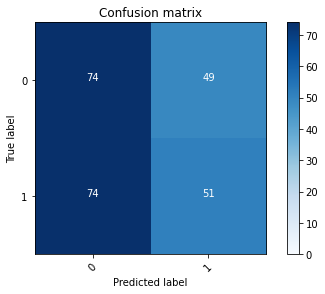

2022-08-20 21:15:14 - [Epoch Train: 90] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 21:15:14 - [Epoch Valid: 90] loss: 6.4196, auc: 0.5118, acc: 0.5040, time: 14.00 s


 90%|████████████████████████████████████    | 90/100 [1:38:44<11:10, 67.04s/it]

2022-08-20 21:15:14 - EPOCH: 91
2022-08-20 21:15:16 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:15:19 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:15:21 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:15:23 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:15:25 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:15:27 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:15:29 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:15:31 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:15:33 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:15:35 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:15:37 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:15:39 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:15:41 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:15:43 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:15:45 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:15:47 - Train Step 160/244, train_loss: 0.0000
2

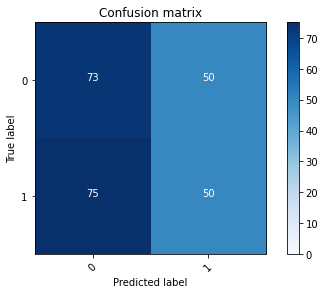

2022-08-20 21:16:17 - [Epoch Train: 91] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 49.00 s            
2022-08-20 21:16:17 - [Epoch Valid: 91] loss: 6.2840, auc: 0.5076, acc: 0.4960, time: 13.00 s


 91%|████████████████████████████████████▍   | 91/100 [1:39:47<09:52, 65.82s/it]

2022-08-20 21:16:17 - EPOCH: 92
2022-08-20 21:16:19 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:16:22 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:16:24 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:16:26 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:16:28 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:16:30 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:16:32 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:16:34 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:16:36 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:16:39 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:16:41 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:16:43 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:16:45 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:16:47 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:16:49 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:16:51 - Train Step 160/244, train_loss: 0.0000
2

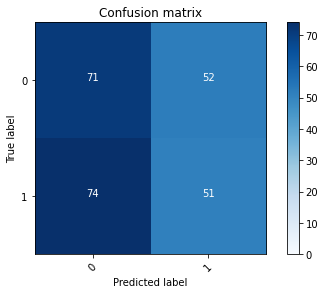

2022-08-20 21:17:23 - [Epoch Train: 92] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 21:17:23 - [Epoch Valid: 92] loss: 6.4103, auc: 0.5093, acc: 0.4919, time: 14.00 s


 92%|████████████████████████████████████▊   | 92/100 [1:40:53<08:47, 66.00s/it]

2022-08-20 21:17:23 - EPOCH: 93
2022-08-20 21:17:26 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:17:28 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:17:30 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:17:32 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:17:35 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:17:37 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:17:39 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:17:41 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:17:43 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:17:45 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:17:48 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:17:50 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:17:52 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:17:54 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:17:56 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:17:58 - Train Step 160/244, train_loss: 0.0000
2

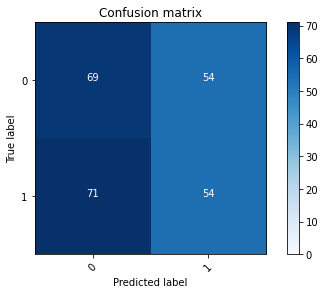

2022-08-20 21:18:30 - [Epoch Train: 93] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 21:18:30 - [Epoch Valid: 93] loss: 6.3832, auc: 0.5128, acc: 0.4960, time: 13.00 s


 93%|█████████████████████████████████████▏  | 93/100 [1:42:00<07:42, 66.12s/it]

2022-08-20 21:18:30 - EPOCH: 94
2022-08-20 21:18:32 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:18:35 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:18:37 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:18:39 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:18:41 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:18:44 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:18:46 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:18:48 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:18:50 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:18:53 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:18:55 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:18:57 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:18:59 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:19:02 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:19:04 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:19:06 - Train Step 160/244, train_loss: 0.0000
2

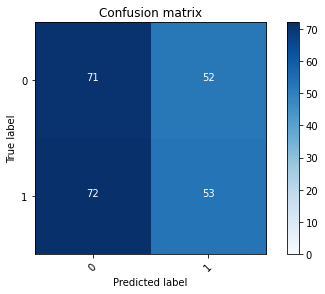

2022-08-20 21:19:39 - [Epoch Train: 94] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 54.00 s            
2022-08-20 21:19:39 - [Epoch Valid: 94] loss: 6.1198, auc: 0.5111, acc: 0.5000, time: 14.00 s


 94%|█████████████████████████████████████▌  | 94/100 [1:43:08<06:41, 66.95s/it]

2022-08-20 21:19:39 - EPOCH: 95
2022-08-20 21:19:41 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:19:43 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:19:46 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:19:48 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:19:50 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:19:52 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:19:55 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:19:57 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:19:59 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:20:01 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:20:04 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:20:06 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:20:08 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:20:10 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:20:13 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:20:15 - Train Step 160/244, train_loss: 0.0000
2

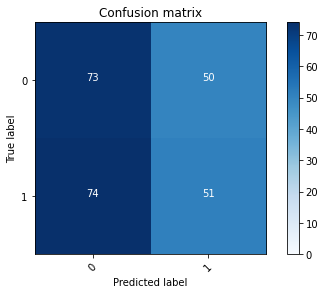

2022-08-20 21:20:47 - [Epoch Train: 95] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 53.00 s            
2022-08-20 21:20:47 - [Epoch Valid: 95] loss: 6.0970, auc: 0.5097, acc: 0.5000, time: 13.00 s


 95%|██████████████████████████████████████  | 95/100 [1:44:16<05:36, 67.23s/it]

2022-08-20 21:20:47 - EPOCH: 96
2022-08-20 21:20:49 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:20:51 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:20:53 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:20:55 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:20:57 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:20:59 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:21:02 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:21:04 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:21:06 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:21:08 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:21:10 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:21:12 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:21:14 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:21:16 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:21:19 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:21:21 - Train Step 160/244, train_loss: 0.0000
2

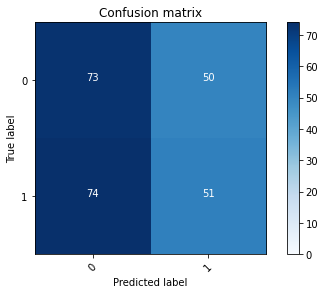

2022-08-20 21:21:51 - [Epoch Train: 96] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 51.00 s            
2022-08-20 21:21:51 - [Epoch Valid: 96] loss: 5.9095, auc: 0.5080, acc: 0.5000, time: 13.00 s


 96%|██████████████████████████████████████▍ | 96/100 [1:45:21<04:25, 66.48s/it]

2022-08-20 21:21:51 - EPOCH: 97
2022-08-20 21:21:54 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:21:56 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:21:58 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:22:00 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:22:02 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:22:04 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:22:07 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:22:09 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:22:11 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:22:13 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:22:15 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:22:17 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:22:19 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:22:22 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:22:24 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:22:26 - Train Step 160/244, train_loss: 0.0000
2

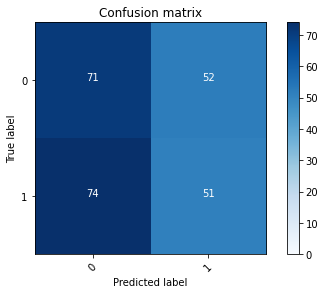

2022-08-20 21:22:58 - [Epoch Train: 97] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 21:22:58 - [Epoch Valid: 97] loss: 6.2949, auc: 0.5109, acc: 0.4919, time: 14.00 s


 97%|██████████████████████████████████████▊ | 97/100 [1:46:28<03:19, 66.54s/it]

2022-08-20 21:22:58 - EPOCH: 98
2022-08-20 21:23:00 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:23:02 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:23:05 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:23:07 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:23:09 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:23:11 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:23:13 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:23:15 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:23:17 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:23:19 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:23:21 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:23:23 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:23:25 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:23:27 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:23:29 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:23:31 - Train Step 160/244, train_loss: 0.0000
2

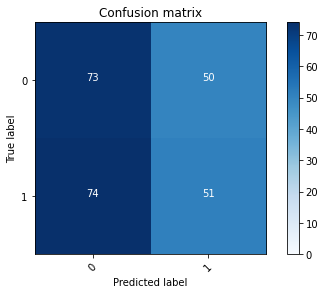

2022-08-20 21:24:02 - [Epoch Train: 98] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 50.00 s            
2022-08-20 21:24:02 - [Epoch Valid: 98] loss: 6.2378, auc: 0.5088, acc: 0.5000, time: 13.00 s


 98%|███████████████████████████████████████▏| 98/100 [1:47:31<02:11, 65.63s/it]

2022-08-20 21:24:02 - EPOCH: 99
2022-08-20 21:24:04 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:24:06 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:24:08 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:24:11 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:24:13 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:24:15 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:24:17 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:24:19 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:24:21 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:24:23 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:24:25 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:24:28 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:24:30 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:24:32 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:24:34 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:24:36 - Train Step 160/244, train_loss: 0.0000
2

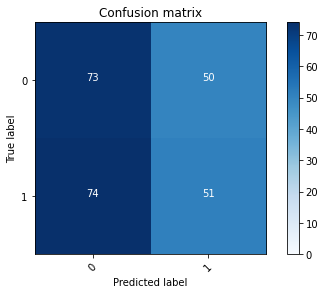

2022-08-20 21:25:08 - [Epoch Train: 99] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 21:25:08 - [Epoch Valid: 99] loss: 6.0748, auc: 0.5117, acc: 0.5000, time: 13.00 s


 99%|███████████████████████████████████████▌| 99/100 [1:48:37<01:05, 65.73s/it]

2022-08-20 21:25:08 - EPOCH: 100
2022-08-20 21:25:10 - Train Step 10/244, train_loss: 0.0000
2022-08-20 21:25:12 - Train Step 20/244, train_loss: 0.0000
2022-08-20 21:25:14 - Train Step 30/244, train_loss: 0.0000
2022-08-20 21:25:17 - Train Step 40/244, train_loss: 0.0000
2022-08-20 21:25:19 - Train Step 50/244, train_loss: 0.0000
2022-08-20 21:25:21 - Train Step 60/244, train_loss: 0.0000
2022-08-20 21:25:23 - Train Step 70/244, train_loss: 0.0000
2022-08-20 21:25:25 - Train Step 80/244, train_loss: 0.0000
2022-08-20 21:25:27 - Train Step 90/244, train_loss: 0.0000
2022-08-20 21:25:29 - Train Step 100/244, train_loss: 0.0000
2022-08-20 21:25:32 - Train Step 110/244, train_loss: 0.0000
2022-08-20 21:25:34 - Train Step 120/244, train_loss: 0.0000
2022-08-20 21:25:36 - Train Step 130/244, train_loss: 0.0000
2022-08-20 21:25:38 - Train Step 140/244, train_loss: 0.0000
2022-08-20 21:25:40 - Train Step 150/244, train_loss: 0.0000
2022-08-20 21:25:42 - Train Step 160/244, train_loss: 0.0000


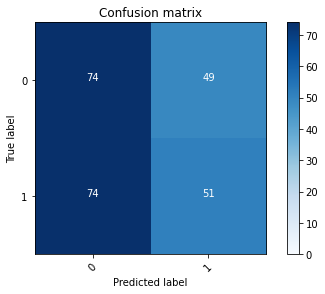

2022-08-20 21:26:14 - [Epoch Train: 100] loss: 0.0000, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 21:26:14 - [Epoch Valid: 100] loss: 6.3582, auc: 0.5103, acc: 0.5040, time: 13.00 s


100%|███████████████████████████████████████| 100/100 [1:49:43<00:00, 65.84s/it]

-- FOLD N:4
Train origin: mn
Type: KLF
2022-08-20 21:26:14 - (M0) Train/Val datasets size: 270
2022-08-20 21:26:14 - (M1) Train/Val datasets size: 303
2022-08-20 21:26:14 - (N0) Train/Val datasets size: 170
2022-08-20 21:26:14 - (N1) Train/Val datasets size: 121
2022-08-20 21:26:14 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 21:26:14 - (MN0) Train/Val datasets size: 540
2022-08-20 21:26:14 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-20 21:26:14 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d8dcf760>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d8564730>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d8c0afd0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9e4091520>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9ca79a4f0>, 'mn_dataset_1': <utils.da

[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 254, 255, 256, 257, 258, 261, 263, 266, 267, 268, 269, 270, 272, 273, 275, 

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d8ea2a00>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d83b37f0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d88801c0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d8bf8340>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8bf9130>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d86ac940>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d88b2eb0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8acdfa0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8a36820>]}}
2022-08-20 21:33:35 - Using CUDA...
KLF
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin'

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-20 21:33:35 - EPOCH: 1
2022-08-20 21:33:37 - Train Step 10/244, train_loss: 0.7149
2022-08-20 21:33:39 - Train Step 20/244, train_loss: 0.7098
2022-08-20 21:33:42 - Train Step 30/244, train_loss: 0.7035
2022-08-20 21:33:44 - Train Step 40/244, train_loss: 0.7056
2022-08-20 21:33:46 - Train Step 50/244, train_loss: 0.7051
2022-08-20 21:33:48 - Train Step 60/244, train_loss: 0.7027
2022-08-20 21:33:50 - Train Step 70/244, train_loss: 0.7002
2022-08-20 21:33:52 - Train Step 80/244, train_loss: 0.6933
2022-08-20 21:33:54 - Train Step 90/244, train_loss: 0.6951
2022-08-20 21:33:56 - Train Step 100/244, train_loss: 0.6941
2022-08-20 21:33:58 - Train Step 110/244, train_loss: 0.6956
2022-08-20 21:34:01 - Train Step 120/244, train_loss: 0.6968
2022-08-20 21:34:03 - Train Step 130/244, train_loss: 0.6965
2022-08-20 21:34:05 - Train Step 140/244, train_loss: 0.6937
2022-08-20 21:34:07 - Train Step 150/244, train_loss: 0.6907
2022-08-20 21:34:09 - Train Step 160/244, train_loss: 0.6912
20

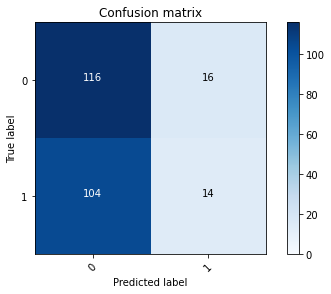

2022-08-20 21:34:40 - [Epoch Train: 1] loss: 0.6873, auc: 0.5639, acc: 0.4990, time: 51.00 s            
2022-08-20 21:34:40 - [Epoch Valid: 1] loss: 0.7021, auc: 0.5445, acc: 0.5200, time: 12.00 s
2022-08-20 21:34:40 - acc improved from 0.0000 to 0.5200. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e1-loss0.702-acc0.520-auc0.544.pth'


  1%|▍                                        | 1/100 [01:04<1:46:58, 64.84s/it]

2022-08-20 21:34:40 - EPOCH: 2
2022-08-20 21:34:42 - Train Step 10/244, train_loss: 0.6487
2022-08-20 21:34:44 - Train Step 20/244, train_loss: 0.6555
2022-08-20 21:34:47 - Train Step 30/244, train_loss: 0.6610
2022-08-20 21:34:49 - Train Step 40/244, train_loss: 0.6497
2022-08-20 21:34:51 - Train Step 50/244, train_loss: 0.6548
2022-08-20 21:34:53 - Train Step 60/244, train_loss: 0.6564
2022-08-20 21:34:55 - Train Step 70/244, train_loss: 0.6518
2022-08-20 21:34:57 - Train Step 80/244, train_loss: 0.6510
2022-08-20 21:35:00 - Train Step 90/244, train_loss: 0.6481
2022-08-20 21:35:02 - Train Step 100/244, train_loss: 0.6452
2022-08-20 21:35:04 - Train Step 110/244, train_loss: 0.6437
2022-08-20 21:35:06 - Train Step 120/244, train_loss: 0.6405
2022-08-20 21:35:09 - Train Step 130/244, train_loss: 0.6364
2022-08-20 21:35:11 - Train Step 140/244, train_loss: 0.6363
2022-08-20 21:35:13 - Train Step 150/244, train_loss: 0.6327
2022-08-20 21:35:15 - Train Step 160/244, train_loss: 0.6303
20

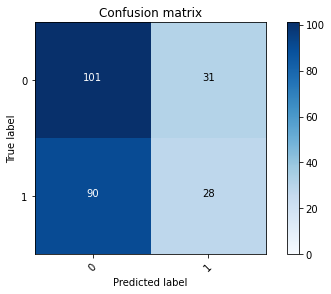

2022-08-20 21:35:48 - [Epoch Train: 2] loss: 0.6136, auc: 0.7706, acc: 0.5934, time: 53.00 s            
2022-08-20 21:35:48 - [Epoch Valid: 2] loss: 0.7202, auc: 0.5497, acc: 0.5160, time: 14.00 s


  2%|▊                                        | 2/100 [02:12<1:49:03, 66.77s/it]

2022-08-20 21:35:48 - EPOCH: 3
2022-08-20 21:35:50 - Train Step 10/244, train_loss: 0.5306
2022-08-20 21:35:52 - Train Step 20/244, train_loss: 0.5168
2022-08-20 21:35:54 - Train Step 30/244, train_loss: 0.5156
2022-08-20 21:35:56 - Train Step 40/244, train_loss: 0.5232
2022-08-20 21:35:58 - Train Step 50/244, train_loss: 0.5146
2022-08-20 21:36:00 - Train Step 60/244, train_loss: 0.5107
2022-08-20 21:36:02 - Train Step 70/244, train_loss: 0.5073
2022-08-20 21:36:05 - Train Step 80/244, train_loss: 0.5108
2022-08-20 21:36:07 - Train Step 90/244, train_loss: 0.5125
2022-08-20 21:36:09 - Train Step 100/244, train_loss: 0.5117
2022-08-20 21:36:11 - Train Step 110/244, train_loss: 0.5021
2022-08-20 21:36:13 - Train Step 120/244, train_loss: 0.5034
2022-08-20 21:36:15 - Train Step 130/244, train_loss: 0.5028
2022-08-20 21:36:17 - Train Step 140/244, train_loss: 0.5012
2022-08-20 21:36:19 - Train Step 150/244, train_loss: 0.5039
2022-08-20 21:36:21 - Train Step 160/244, train_loss: 0.4981
20

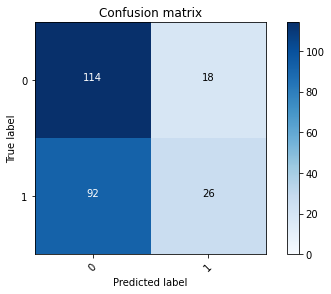

2022-08-20 21:36:52 - [Epoch Train: 3] loss: 0.4852, auc: 0.8785, acc: 0.7454, time: 50.00 s            
2022-08-20 21:36:52 - [Epoch Valid: 3] loss: 0.7594, auc: 0.5461, acc: 0.5600, time: 14.00 s
2022-08-20 21:36:52 - acc improved from 0.5200 to 0.5600. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e3-loss0.759-acc0.560-auc0.546.pth'


  3%|█▏                                       | 3/100 [03:17<1:46:18, 65.76s/it]

2022-08-20 21:36:52 - EPOCH: 4
2022-08-20 21:36:55 - Train Step 10/244, train_loss: 0.3149
2022-08-20 21:36:57 - Train Step 20/244, train_loss: 0.3260
2022-08-20 21:36:59 - Train Step 30/244, train_loss: 0.3430
2022-08-20 21:37:01 - Train Step 40/244, train_loss: 0.3376
2022-08-20 21:37:04 - Train Step 50/244, train_loss: 0.3228
2022-08-20 21:37:06 - Train Step 60/244, train_loss: 0.3102
2022-08-20 21:37:08 - Train Step 70/244, train_loss: 0.3212
2022-08-20 21:37:10 - Train Step 80/244, train_loss: 0.3137
2022-08-20 21:37:13 - Train Step 90/244, train_loss: 0.3139
2022-08-20 21:37:15 - Train Step 100/244, train_loss: 0.3073
2022-08-20 21:37:17 - Train Step 110/244, train_loss: 0.3091
2022-08-20 21:37:19 - Train Step 120/244, train_loss: 0.3080
2022-08-20 21:37:21 - Train Step 130/244, train_loss: 0.3046
2022-08-20 21:37:24 - Train Step 140/244, train_loss: 0.3051
2022-08-20 21:37:26 - Train Step 150/244, train_loss: 0.3049
2022-08-20 21:37:28 - Train Step 160/244, train_loss: 0.3029
20

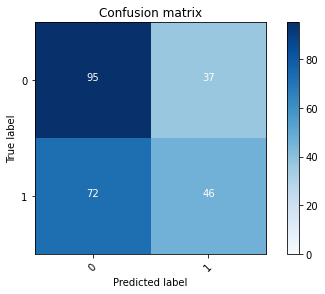

2022-08-20 21:38:00 - [Epoch Train: 4] loss: 0.3067, auc: 0.9624, acc: 0.8840, time: 53.00 s            
2022-08-20 21:38:00 - [Epoch Valid: 4] loss: 0.8928, auc: 0.5445, acc: 0.5640, time: 14.00 s
2022-08-20 21:38:00 - acc improved from 0.5600 to 0.5640. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e4-loss0.893-acc0.564-auc0.544.pth'


  4%|█▋                                       | 4/100 [04:25<1:46:38, 66.65s/it]

2022-08-20 21:38:00 - EPOCH: 5
2022-08-20 21:38:03 - Train Step 10/244, train_loss: 0.1769
2022-08-20 21:38:05 - Train Step 20/244, train_loss: 0.2416
2022-08-20 21:38:07 - Train Step 30/244, train_loss: 0.2280
2022-08-20 21:38:09 - Train Step 40/244, train_loss: 0.2012
2022-08-20 21:38:11 - Train Step 50/244, train_loss: 0.1850
2022-08-20 21:38:13 - Train Step 60/244, train_loss: 0.1799
2022-08-20 21:38:15 - Train Step 70/244, train_loss: 0.1753
2022-08-20 21:38:18 - Train Step 80/244, train_loss: 0.1637
2022-08-20 21:38:20 - Train Step 90/244, train_loss: 0.1669
2022-08-20 21:38:22 - Train Step 100/244, train_loss: 0.1630
2022-08-20 21:38:24 - Train Step 110/244, train_loss: 0.1649
2022-08-20 21:38:26 - Train Step 120/244, train_loss: 0.1629
2022-08-20 21:38:28 - Train Step 130/244, train_loss: 0.1602
2022-08-20 21:38:30 - Train Step 140/244, train_loss: 0.1551
2022-08-20 21:38:32 - Train Step 150/244, train_loss: 0.1517
2022-08-20 21:38:35 - Train Step 160/244, train_loss: 0.1567
20

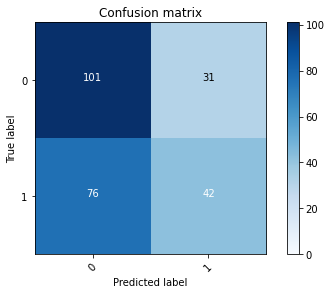

2022-08-20 21:39:06 - [Epoch Train: 5] loss: 0.1643, auc: 0.9926, acc: 0.9589, time: 51.00 s            
2022-08-20 21:39:06 - [Epoch Valid: 5] loss: 1.0097, auc: 0.5655, acc: 0.5720, time: 14.00 s
2022-08-20 21:39:06 - acc improved from 0.5640 to 0.5720. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e5-loss1.010-acc0.572-auc0.566.pth'


  5%|██                                       | 5/100 [05:31<1:45:10, 66.42s/it]

2022-08-20 21:39:06 - EPOCH: 6
2022-08-20 21:39:09 - Train Step 10/244, train_loss: 0.1272
2022-08-20 21:39:11 - Train Step 20/244, train_loss: 0.1173
2022-08-20 21:39:13 - Train Step 30/244, train_loss: 0.0976
2022-08-20 21:39:16 - Train Step 40/244, train_loss: 0.0897
2022-08-20 21:39:18 - Train Step 50/244, train_loss: 0.0911
2022-08-20 21:39:20 - Train Step 60/244, train_loss: 0.0938
2022-08-20 21:39:22 - Train Step 70/244, train_loss: 0.0879
2022-08-20 21:39:24 - Train Step 80/244, train_loss: 0.0883
2022-08-20 21:39:26 - Train Step 90/244, train_loss: 0.0861
2022-08-20 21:39:29 - Train Step 100/244, train_loss: 0.0877
2022-08-20 21:39:31 - Train Step 110/244, train_loss: 0.0885
2022-08-20 21:39:33 - Train Step 120/244, train_loss: 0.0864
2022-08-20 21:39:35 - Train Step 130/244, train_loss: 0.0855
2022-08-20 21:39:37 - Train Step 140/244, train_loss: 0.0876
2022-08-20 21:39:40 - Train Step 150/244, train_loss: 0.0848
2022-08-20 21:39:42 - Train Step 160/244, train_loss: 0.0834
20

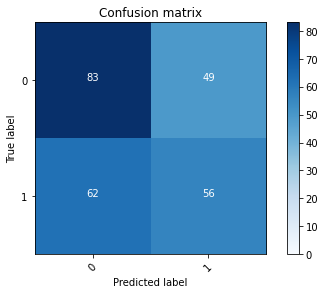

2022-08-20 21:40:14 - [Epoch Train: 6] loss: 0.0756, auc: 0.9995, acc: 0.9887, time: 53.00 s            
2022-08-20 21:40:14 - [Epoch Valid: 6] loss: 1.1409, auc: 0.5555, acc: 0.5560, time: 14.00 s


  6%|██▍                                      | 6/100 [06:39<1:44:49, 66.91s/it]

2022-08-20 21:40:14 - EPOCH: 7
2022-08-20 21:40:17 - Train Step 10/244, train_loss: 0.0739
2022-08-20 21:40:19 - Train Step 20/244, train_loss: 0.0524
2022-08-20 21:40:21 - Train Step 30/244, train_loss: 0.0454
2022-08-20 21:40:23 - Train Step 40/244, train_loss: 0.0469
2022-08-20 21:40:26 - Train Step 50/244, train_loss: 0.0489
2022-08-20 21:40:28 - Train Step 60/244, train_loss: 0.0454
2022-08-20 21:40:30 - Train Step 70/244, train_loss: 0.0425
2022-08-20 21:40:32 - Train Step 80/244, train_loss: 0.0428
2022-08-20 21:40:34 - Train Step 90/244, train_loss: 0.0431
2022-08-20 21:40:36 - Train Step 100/244, train_loss: 0.0418
2022-08-20 21:40:39 - Train Step 110/244, train_loss: 0.0419
2022-08-20 21:40:41 - Train Step 120/244, train_loss: 0.0424
2022-08-20 21:40:43 - Train Step 130/244, train_loss: 0.0413
2022-08-20 21:40:45 - Train Step 140/244, train_loss: 0.0403
2022-08-20 21:40:47 - Train Step 150/244, train_loss: 0.0404
2022-08-20 21:40:50 - Train Step 160/244, train_loss: 0.0403
20

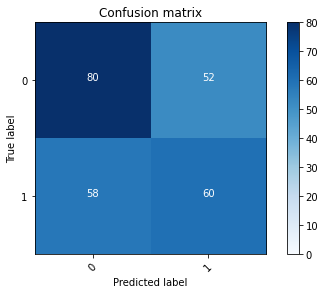

2022-08-20 21:41:22 - [Epoch Train: 7] loss: 0.0376, auc: 1.0000, acc: 0.9969, time: 53.00 s            
2022-08-20 21:41:22 - [Epoch Valid: 7] loss: 1.3631, auc: 0.5648, acc: 0.5600, time: 14.00 s


  7%|██▊                                      | 7/100 [07:47<1:44:08, 67.19s/it]

2022-08-20 21:41:22 - EPOCH: 8
2022-08-20 21:41:24 - Train Step 10/244, train_loss: 0.0235
2022-08-20 21:41:27 - Train Step 20/244, train_loss: 0.0200
2022-08-20 21:41:29 - Train Step 30/244, train_loss: 0.0197
2022-08-20 21:41:31 - Train Step 40/244, train_loss: 0.0180
2022-08-20 21:41:33 - Train Step 50/244, train_loss: 0.0197
2022-08-20 21:41:35 - Train Step 60/244, train_loss: 0.0197
2022-08-20 21:41:37 - Train Step 70/244, train_loss: 0.0232
2022-08-20 21:41:39 - Train Step 80/244, train_loss: 0.0242
2022-08-20 21:41:41 - Train Step 90/244, train_loss: 0.0239
2022-08-20 21:41:43 - Train Step 100/244, train_loss: 0.0230
2022-08-20 21:41:45 - Train Step 110/244, train_loss: 0.0226
2022-08-20 21:41:47 - Train Step 120/244, train_loss: 0.0221
2022-08-20 21:41:49 - Train Step 130/244, train_loss: 0.0220
2022-08-20 21:41:51 - Train Step 140/244, train_loss: 0.0218
2022-08-20 21:41:53 - Train Step 150/244, train_loss: 0.0218
2022-08-20 21:41:55 - Train Step 160/244, train_loss: 0.0237
20

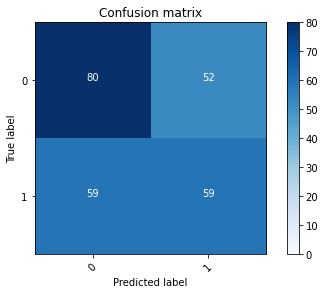

2022-08-20 21:42:27 - [Epoch Train: 8] loss: 0.0220, auc: 1.0000, acc: 0.9969, time: 50.00 s            
2022-08-20 21:42:27 - [Epoch Valid: 8] loss: 1.5764, auc: 0.5546, acc: 0.5560, time: 14.00 s


  8%|███▎                                     | 8/100 [08:52<1:41:53, 66.46s/it]

2022-08-20 21:42:27 - EPOCH: 9
2022-08-20 21:42:29 - Train Step 10/244, train_loss: 0.0122
2022-08-20 21:42:31 - Train Step 20/244, train_loss: 0.0123
2022-08-20 21:42:33 - Train Step 30/244, train_loss: 0.0111
2022-08-20 21:42:35 - Train Step 40/244, train_loss: 0.0112
2022-08-20 21:42:37 - Train Step 50/244, train_loss: 0.0115
2022-08-20 21:42:39 - Train Step 60/244, train_loss: 0.0119
2022-08-20 21:42:41 - Train Step 70/244, train_loss: 0.0116
2022-08-20 21:42:43 - Train Step 80/244, train_loss: 0.0121
2022-08-20 21:42:45 - Train Step 90/244, train_loss: 0.0116
2022-08-20 21:42:48 - Train Step 100/244, train_loss: 0.0120
2022-08-20 21:42:50 - Train Step 110/244, train_loss: 0.0118
2022-08-20 21:42:52 - Train Step 120/244, train_loss: 0.0115
2022-08-20 21:42:54 - Train Step 130/244, train_loss: 0.0115
2022-08-20 21:42:56 - Train Step 140/244, train_loss: 0.0113
2022-08-20 21:42:58 - Train Step 150/244, train_loss: 0.0109
2022-08-20 21:43:00 - Train Step 160/244, train_loss: 0.0111
20

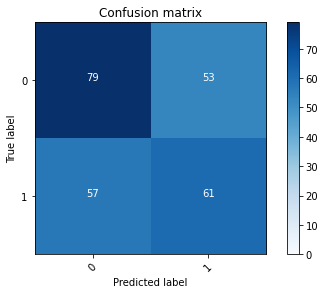

2022-08-20 21:43:31 - [Epoch Train: 9] loss: 0.0116, auc: 1.0000, acc: 0.9990, time: 49.00 s            
2022-08-20 21:43:31 - [Epoch Valid: 9] loss: 1.6139, auc: 0.5545, acc: 0.5600, time: 14.00 s


  9%|███▋                                     | 9/100 [09:56<1:39:40, 65.72s/it]

2022-08-20 21:43:31 - EPOCH: 10
2022-08-20 21:43:33 - Train Step 10/244, train_loss: 0.0119
2022-08-20 21:43:36 - Train Step 20/244, train_loss: 0.0088
2022-08-20 21:43:38 - Train Step 30/244, train_loss: 0.0085
2022-08-20 21:43:40 - Train Step 40/244, train_loss: 0.0075
2022-08-20 21:43:42 - Train Step 50/244, train_loss: 0.0072
2022-08-20 21:43:44 - Train Step 60/244, train_loss: 0.0077
2022-08-20 21:43:47 - Train Step 70/244, train_loss: 0.0078
2022-08-20 21:43:49 - Train Step 80/244, train_loss: 0.0075
2022-08-20 21:43:51 - Train Step 90/244, train_loss: 0.0079
2022-08-20 21:43:53 - Train Step 100/244, train_loss: 0.0075
2022-08-20 21:43:55 - Train Step 110/244, train_loss: 0.0075
2022-08-20 21:43:58 - Train Step 120/244, train_loss: 0.0075
2022-08-20 21:44:00 - Train Step 130/244, train_loss: 0.0082
2022-08-20 21:44:02 - Train Step 140/244, train_loss: 0.0102
2022-08-20 21:44:04 - Train Step 150/244, train_loss: 0.0103
2022-08-20 21:44:07 - Train Step 160/244, train_loss: 0.0100
2

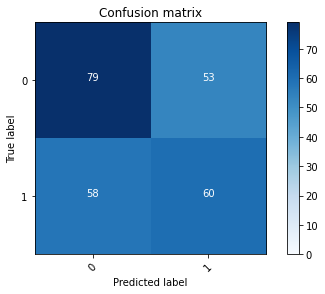

2022-08-20 21:44:39 - [Epoch Train: 10] loss: 0.0087, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 21:44:39 - [Epoch Valid: 10] loss: 1.7377, auc: 0.5614, acc: 0.5560, time: 14.00 s


 10%|████                                    | 10/100 [11:04<1:39:45, 66.51s/it]

2022-08-20 21:44:39 - EPOCH: 11
2022-08-20 21:44:42 - Train Step 10/244, train_loss: 0.0035
2022-08-20 21:44:44 - Train Step 20/244, train_loss: 0.0047
2022-08-20 21:44:46 - Train Step 30/244, train_loss: 0.0040
2022-08-20 21:44:48 - Train Step 40/244, train_loss: 0.0047
2022-08-20 21:44:50 - Train Step 50/244, train_loss: 0.0045
2022-08-20 21:44:52 - Train Step 60/244, train_loss: 0.0046
2022-08-20 21:44:54 - Train Step 70/244, train_loss: 0.0046
2022-08-20 21:44:56 - Train Step 80/244, train_loss: 0.0048
2022-08-20 21:44:58 - Train Step 90/244, train_loss: 0.0053
2022-08-20 21:45:00 - Train Step 100/244, train_loss: 0.0052
2022-08-20 21:45:02 - Train Step 110/244, train_loss: 0.0051
2022-08-20 21:45:05 - Train Step 120/244, train_loss: 0.0053
2022-08-20 21:45:07 - Train Step 130/244, train_loss: 0.0053
2022-08-20 21:45:09 - Train Step 140/244, train_loss: 0.0051
2022-08-20 21:45:11 - Train Step 150/244, train_loss: 0.0050
2022-08-20 21:45:13 - Train Step 160/244, train_loss: 0.0052
2

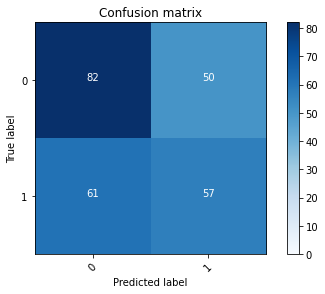

2022-08-20 21:45:43 - [Epoch Train: 11] loss: 0.0070, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 21:45:43 - [Epoch Valid: 11] loss: 1.6085, auc: 0.5631, acc: 0.5560, time: 12.00 s


 11%|████▍                                   | 11/100 [12:08<1:37:24, 65.67s/it]

2022-08-20 21:45:43 - EPOCH: 12
2022-08-20 21:45:46 - Train Step 10/244, train_loss: 0.0061
2022-08-20 21:45:48 - Train Step 20/244, train_loss: 0.0130
2022-08-20 21:45:50 - Train Step 30/244, train_loss: 0.0100
2022-08-20 21:45:52 - Train Step 40/244, train_loss: 0.0087
2022-08-20 21:45:54 - Train Step 50/244, train_loss: 0.0075
2022-08-20 21:45:57 - Train Step 60/244, train_loss: 0.0067
2022-08-20 21:45:59 - Train Step 70/244, train_loss: 0.0068
2022-08-20 21:46:01 - Train Step 80/244, train_loss: 0.0066
2022-08-20 21:46:04 - Train Step 90/244, train_loss: 0.0065
2022-08-20 21:46:06 - Train Step 100/244, train_loss: 0.0068
2022-08-20 21:46:08 - Train Step 110/244, train_loss: 0.0067
2022-08-20 21:46:10 - Train Step 120/244, train_loss: 0.0065
2022-08-20 21:46:13 - Train Step 130/244, train_loss: 0.0064
2022-08-20 21:46:15 - Train Step 140/244, train_loss: 0.0062
2022-08-20 21:46:17 - Train Step 150/244, train_loss: 0.0060
2022-08-20 21:46:19 - Train Step 160/244, train_loss: 0.0059
2

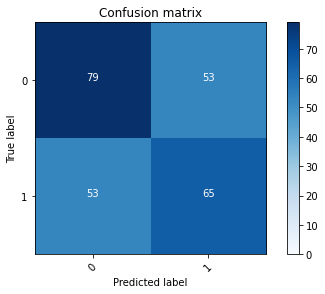

2022-08-20 21:46:52 - [Epoch Train: 12] loss: 0.0059, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 21:46:52 - [Epoch Valid: 12] loss: 1.7706, auc: 0.5586, acc: 0.5760, time: 14.00 s
2022-08-20 21:46:52 - acc improved from 0.5720 to 0.5760. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e12-loss1.771-acc0.576-auc0.559.pth'


 12%|████▊                                   | 12/100 [13:17<1:37:55, 66.76s/it]

2022-08-20 21:46:52 - EPOCH: 13
2022-08-20 21:46:55 - Train Step 10/244, train_loss: 0.0083
2022-08-20 21:46:57 - Train Step 20/244, train_loss: 0.0063
2022-08-20 21:46:59 - Train Step 30/244, train_loss: 0.0049
2022-08-20 21:47:02 - Train Step 40/244, train_loss: 0.0049
2022-08-20 21:47:04 - Train Step 50/244, train_loss: 0.0045
2022-08-20 21:47:06 - Train Step 60/244, train_loss: 0.0042
2022-08-20 21:47:08 - Train Step 70/244, train_loss: 0.0040
2022-08-20 21:47:10 - Train Step 80/244, train_loss: 0.0037
2022-08-20 21:47:12 - Train Step 90/244, train_loss: 0.0036
2022-08-20 21:47:14 - Train Step 100/244, train_loss: 0.0035
2022-08-20 21:47:16 - Train Step 110/244, train_loss: 0.0035
2022-08-20 21:47:18 - Train Step 120/244, train_loss: 0.0035
2022-08-20 21:47:21 - Train Step 130/244, train_loss: 0.0052
2022-08-20 21:47:23 - Train Step 140/244, train_loss: 0.0051
2022-08-20 21:47:25 - Train Step 150/244, train_loss: 0.0050
2022-08-20 21:47:27 - Train Step 160/244, train_loss: 0.0051
2

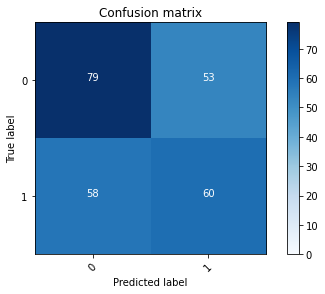

2022-08-20 21:48:00 - [Epoch Train: 13] loss: 0.0058, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 21:48:00 - [Epoch Valid: 13] loss: 1.8016, auc: 0.5544, acc: 0.5560, time: 14.00 s


 13%|█████▏                                  | 13/100 [14:24<1:36:59, 66.90s/it]

2022-08-20 21:48:00 - EPOCH: 14
2022-08-20 21:48:02 - Train Step 10/244, train_loss: 0.0060
2022-08-20 21:48:04 - Train Step 20/244, train_loss: 0.0045
2022-08-20 21:48:06 - Train Step 30/244, train_loss: 0.0037
2022-08-20 21:48:09 - Train Step 40/244, train_loss: 0.0034
2022-08-20 21:48:11 - Train Step 50/244, train_loss: 0.0032
2022-08-20 21:48:13 - Train Step 60/244, train_loss: 0.0030
2022-08-20 21:48:15 - Train Step 70/244, train_loss: 0.0028
2022-08-20 21:48:17 - Train Step 80/244, train_loss: 0.0027
2022-08-20 21:48:20 - Train Step 90/244, train_loss: 0.0028
2022-08-20 21:48:22 - Train Step 100/244, train_loss: 0.0028
2022-08-20 21:48:24 - Train Step 110/244, train_loss: 0.0028
2022-08-20 21:48:26 - Train Step 120/244, train_loss: 0.0028
2022-08-20 21:48:28 - Train Step 130/244, train_loss: 0.0028
2022-08-20 21:48:31 - Train Step 140/244, train_loss: 0.0028
2022-08-20 21:48:33 - Train Step 150/244, train_loss: 0.0030
2022-08-20 21:48:35 - Train Step 160/244, train_loss: 0.0038
2

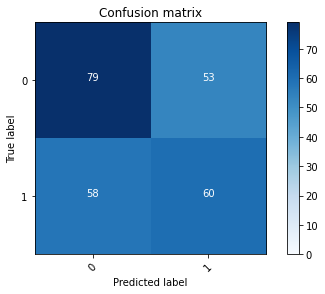

2022-08-20 21:49:08 - [Epoch Train: 14] loss: 0.0039, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 21:49:08 - [Epoch Valid: 14] loss: 1.9943, auc: 0.5585, acc: 0.5560, time: 14.00 s


 14%|█████▌                                  | 14/100 [15:32<1:36:30, 67.33s/it]

2022-08-20 21:49:08 - EPOCH: 15
2022-08-20 21:49:11 - Train Step 10/244, train_loss: 0.0285
2022-08-20 21:49:13 - Train Step 20/244, train_loss: 0.0157
2022-08-20 21:49:15 - Train Step 30/244, train_loss: 0.0113
2022-08-20 21:49:17 - Train Step 40/244, train_loss: 0.0089
2022-08-20 21:49:19 - Train Step 50/244, train_loss: 0.0075
2022-08-20 21:49:22 - Train Step 60/244, train_loss: 0.0067
2022-08-20 21:49:24 - Train Step 70/244, train_loss: 0.0061
2022-08-20 21:49:26 - Train Step 80/244, train_loss: 0.0055
2022-08-20 21:49:28 - Train Step 90/244, train_loss: 0.0053
2022-08-20 21:49:30 - Train Step 100/244, train_loss: 0.0049
2022-08-20 21:49:33 - Train Step 110/244, train_loss: 0.0047
2022-08-20 21:49:35 - Train Step 120/244, train_loss: 0.0045
2022-08-20 21:49:37 - Train Step 130/244, train_loss: 0.0043
2022-08-20 21:49:39 - Train Step 140/244, train_loss: 0.0052
2022-08-20 21:49:41 - Train Step 150/244, train_loss: 0.0049
2022-08-20 21:49:44 - Train Step 160/244, train_loss: 0.0049
2

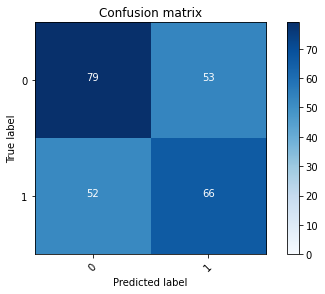

2022-08-20 21:50:16 - [Epoch Train: 15] loss: 0.0043, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 21:50:16 - [Epoch Valid: 15] loss: 1.7776, auc: 0.5573, acc: 0.5800, time: 13.00 s
2022-08-20 21:50:16 - acc improved from 0.5760 to 0.5800. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e15-loss1.778-acc0.580-auc0.557.pth'


 15%|██████                                  | 15/100 [16:41<1:35:45, 67.59s/it]

2022-08-20 21:50:16 - EPOCH: 16
2022-08-20 21:50:19 - Train Step 10/244, train_loss: 0.0011
2022-08-20 21:50:21 - Train Step 20/244, train_loss: 0.0019
2022-08-20 21:50:23 - Train Step 30/244, train_loss: 0.0021
2022-08-20 21:50:25 - Train Step 40/244, train_loss: 0.0019
2022-08-20 21:50:27 - Train Step 50/244, train_loss: 0.0017
2022-08-20 21:50:30 - Train Step 60/244, train_loss: 0.0041
2022-08-20 21:50:32 - Train Step 70/244, train_loss: 0.0042
2022-08-20 21:50:34 - Train Step 80/244, train_loss: 0.0040
2022-08-20 21:50:36 - Train Step 90/244, train_loss: 0.0041
2022-08-20 21:50:39 - Train Step 100/244, train_loss: 0.0038
2022-08-20 21:50:41 - Train Step 110/244, train_loss: 0.0039
2022-08-20 21:50:43 - Train Step 120/244, train_loss: 0.0039
2022-08-20 21:50:45 - Train Step 130/244, train_loss: 0.0037
2022-08-20 21:50:48 - Train Step 140/244, train_loss: 0.0035
2022-08-20 21:50:50 - Train Step 150/244, train_loss: 0.0054
2022-08-20 21:50:52 - Train Step 160/244, train_loss: 0.0051
2

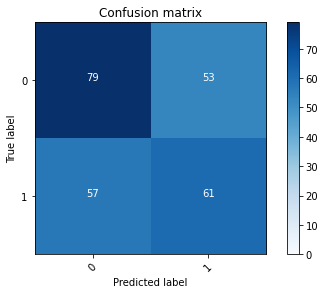

2022-08-20 21:51:24 - [Epoch Train: 16] loss: 0.0043, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 21:51:24 - [Epoch Valid: 16] loss: 1.9377, auc: 0.5580, acc: 0.5600, time: 13.00 s


 16%|██████▍                                 | 16/100 [17:49<1:34:44, 67.67s/it]

2022-08-20 21:51:24 - EPOCH: 17
2022-08-20 21:51:26 - Train Step 10/244, train_loss: 0.0018
2022-08-20 21:51:29 - Train Step 20/244, train_loss: 0.0041
2022-08-20 21:51:31 - Train Step 30/244, train_loss: 0.0036
2022-08-20 21:51:33 - Train Step 40/244, train_loss: 0.0029
2022-08-20 21:51:35 - Train Step 50/244, train_loss: 0.0025
2022-08-20 21:51:38 - Train Step 60/244, train_loss: 0.0022
2022-08-20 21:51:40 - Train Step 70/244, train_loss: 0.0023
2022-08-20 21:51:42 - Train Step 80/244, train_loss: 0.0049
2022-08-20 21:51:44 - Train Step 90/244, train_loss: 0.0048
2022-08-20 21:51:47 - Train Step 100/244, train_loss: 0.0045
2022-08-20 21:51:49 - Train Step 110/244, train_loss: 0.0043
2022-08-20 21:51:51 - Train Step 120/244, train_loss: 0.0041
2022-08-20 21:51:53 - Train Step 130/244, train_loss: 0.0040
2022-08-20 21:51:56 - Train Step 140/244, train_loss: 0.0038
2022-08-20 21:51:58 - Train Step 150/244, train_loss: 0.0036
2022-08-20 21:52:00 - Train Step 160/244, train_loss: 0.0035
2

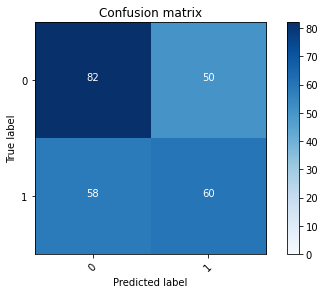

2022-08-20 21:52:32 - [Epoch Train: 17] loss: 0.0044, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 21:52:32 - [Epoch Valid: 17] loss: 1.9670, auc: 0.5646, acc: 0.5680, time: 13.00 s


 17%|██████▊                                 | 17/100 [18:57<1:33:55, 67.90s/it]

2022-08-20 21:52:32 - EPOCH: 18
2022-08-20 21:52:35 - Train Step 10/244, train_loss: 0.0018
2022-08-20 21:52:37 - Train Step 20/244, train_loss: 0.0016
2022-08-20 21:52:39 - Train Step 30/244, train_loss: 0.0016
2022-08-20 21:52:42 - Train Step 40/244, train_loss: 0.0016
2022-08-20 21:52:44 - Train Step 50/244, train_loss: 0.0014
2022-08-20 21:52:46 - Train Step 60/244, train_loss: 0.0014
2022-08-20 21:52:48 - Train Step 70/244, train_loss: 0.0013
2022-08-20 21:52:51 - Train Step 80/244, train_loss: 0.0012
2022-08-20 21:52:53 - Train Step 90/244, train_loss: 0.0026
2022-08-20 21:52:55 - Train Step 100/244, train_loss: 0.0024
2022-08-20 21:52:57 - Train Step 110/244, train_loss: 0.0023
2022-08-20 21:53:00 - Train Step 120/244, train_loss: 0.0022
2022-08-20 21:53:02 - Train Step 130/244, train_loss: 0.0022
2022-08-20 21:53:04 - Train Step 140/244, train_loss: 0.0022
2022-08-20 21:53:06 - Train Step 150/244, train_loss: 0.0022
2022-08-20 21:53:09 - Train Step 160/244, train_loss: 0.0021
2

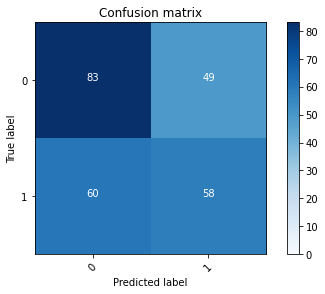

2022-08-20 21:53:41 - [Epoch Train: 18] loss: 0.0025, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 21:53:41 - [Epoch Valid: 18] loss: 2.0720, auc: 0.5589, acc: 0.5640, time: 14.00 s


 18%|███████▏                                | 18/100 [20:06<1:33:13, 68.22s/it]

2022-08-20 21:53:41 - EPOCH: 19
2022-08-20 21:53:44 - Train Step 10/244, train_loss: 0.0013
2022-08-20 21:53:46 - Train Step 20/244, train_loss: 0.0012
2022-08-20 21:53:48 - Train Step 30/244, train_loss: 0.0012
2022-08-20 21:53:51 - Train Step 40/244, train_loss: 0.0015
2022-08-20 21:53:53 - Train Step 50/244, train_loss: 0.0013
2022-08-20 21:53:55 - Train Step 60/244, train_loss: 0.0013
2022-08-20 21:53:57 - Train Step 70/244, train_loss: 0.0014
2022-08-20 21:54:00 - Train Step 80/244, train_loss: 0.0027
2022-08-20 21:54:02 - Train Step 90/244, train_loss: 0.0025
2022-08-20 21:54:04 - Train Step 100/244, train_loss: 0.0026
2022-08-20 21:54:06 - Train Step 110/244, train_loss: 0.0027
2022-08-20 21:54:09 - Train Step 120/244, train_loss: 0.0026
2022-08-20 21:54:11 - Train Step 130/244, train_loss: 0.0024
2022-08-20 21:54:13 - Train Step 140/244, train_loss: 0.0024
2022-08-20 21:54:15 - Train Step 150/244, train_loss: 0.0023
2022-08-20 21:54:18 - Train Step 160/244, train_loss: 0.0022
2

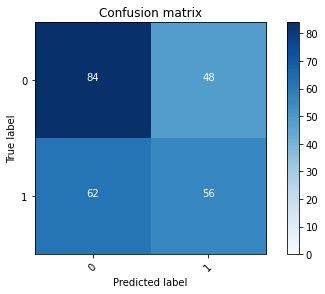

2022-08-20 21:54:49 - [Epoch Train: 19] loss: 0.0030, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 21:54:49 - [Epoch Valid: 19] loss: 2.1636, auc: 0.5586, acc: 0.5600, time: 13.00 s


 19%|███████▌                                | 19/100 [21:14<1:32:01, 68.16s/it]

2022-08-20 21:54:49 - EPOCH: 20
2022-08-20 21:54:52 - Train Step 10/244, train_loss: 0.0035
2022-08-20 21:54:54 - Train Step 20/244, train_loss: 0.0032
2022-08-20 21:54:56 - Train Step 30/244, train_loss: 0.0026
2022-08-20 21:54:59 - Train Step 40/244, train_loss: 0.0022
2022-08-20 21:55:01 - Train Step 50/244, train_loss: 0.0021
2022-08-20 21:55:03 - Train Step 60/244, train_loss: 0.0067
2022-08-20 21:55:05 - Train Step 70/244, train_loss: 0.0059
2022-08-20 21:55:08 - Train Step 80/244, train_loss: 0.0053
2022-08-20 21:55:10 - Train Step 90/244, train_loss: 0.0050
2022-08-20 21:55:12 - Train Step 100/244, train_loss: 0.0047
2022-08-20 21:55:14 - Train Step 110/244, train_loss: 0.0045
2022-08-20 21:55:17 - Train Step 120/244, train_loss: 0.0042
2022-08-20 21:55:19 - Train Step 130/244, train_loss: 0.0040
2022-08-20 21:55:21 - Train Step 140/244, train_loss: 0.0049
2022-08-20 21:55:23 - Train Step 150/244, train_loss: 0.0047
2022-08-20 21:55:26 - Train Step 160/244, train_loss: 0.0044
2

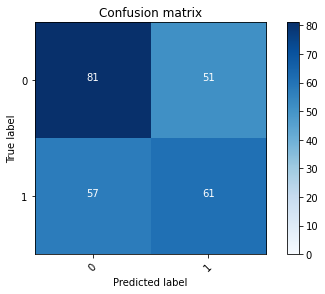

2022-08-20 21:55:57 - [Epoch Train: 20] loss: 0.0033, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 21:55:57 - [Epoch Valid: 20] loss: 2.0489, auc: 0.5548, acc: 0.5680, time: 13.00 s


 20%|████████                                | 20/100 [22:22<1:30:43, 68.04s/it]

2022-08-20 21:55:57 - EPOCH: 21
2022-08-20 21:56:00 - Train Step 10/244, train_loss: 0.0009
2022-08-20 21:56:02 - Train Step 20/244, train_loss: 0.0009
2022-08-20 21:56:04 - Train Step 30/244, train_loss: 0.0008
2022-08-20 21:56:06 - Train Step 40/244, train_loss: 0.0008
2022-08-20 21:56:09 - Train Step 50/244, train_loss: 0.0029
2022-08-20 21:56:11 - Train Step 60/244, train_loss: 0.0026
2022-08-20 21:56:13 - Train Step 70/244, train_loss: 0.0024
2022-08-20 21:56:15 - Train Step 80/244, train_loss: 0.0023
2022-08-20 21:56:17 - Train Step 90/244, train_loss: 0.0022
2022-08-20 21:56:20 - Train Step 100/244, train_loss: 0.0055
2022-08-20 21:56:22 - Train Step 110/244, train_loss: 0.0051
2022-08-20 21:56:24 - Train Step 120/244, train_loss: 0.0048
2022-08-20 21:56:26 - Train Step 130/244, train_loss: 0.0045
2022-08-20 21:56:28 - Train Step 140/244, train_loss: 0.0043
2022-08-20 21:56:30 - Train Step 150/244, train_loss: 0.0041
2022-08-20 21:56:32 - Train Step 160/244, train_loss: 0.0039
2

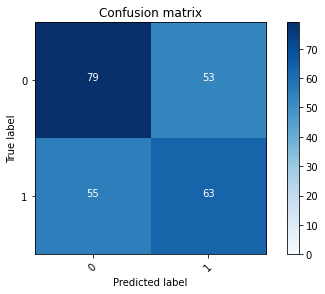

2022-08-20 21:57:04 - [Epoch Train: 21] loss: 0.0028, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 21:57:04 - [Epoch Valid: 21] loss: 2.1486, auc: 0.5599, acc: 0.5680, time: 13.00 s


 21%|████████▍                               | 21/100 [23:29<1:29:15, 67.79s/it]

2022-08-20 21:57:04 - EPOCH: 22
2022-08-20 21:57:07 - Train Step 10/244, train_loss: 0.0011
2022-08-20 21:57:09 - Train Step 20/244, train_loss: 0.0009
2022-08-20 21:57:11 - Train Step 30/244, train_loss: 0.0010
2022-08-20 21:57:14 - Train Step 40/244, train_loss: 0.0009
2022-08-20 21:57:16 - Train Step 50/244, train_loss: 0.0009
2022-08-20 21:57:18 - Train Step 60/244, train_loss: 0.0008
2022-08-20 21:57:20 - Train Step 70/244, train_loss: 0.0008
2022-08-20 21:57:22 - Train Step 80/244, train_loss: 0.0009
2022-08-20 21:57:24 - Train Step 90/244, train_loss: 0.0008
2022-08-20 21:57:27 - Train Step 100/244, train_loss: 0.0008
2022-08-20 21:57:29 - Train Step 110/244, train_loss: 0.0008
2022-08-20 21:57:31 - Train Step 120/244, train_loss: 0.0008
2022-08-20 21:57:33 - Train Step 130/244, train_loss: 0.0008
2022-08-20 21:57:35 - Train Step 140/244, train_loss: 0.0008
2022-08-20 21:57:38 - Train Step 150/244, train_loss: 0.0008
2022-08-20 21:57:40 - Train Step 160/244, train_loss: 0.0007
2

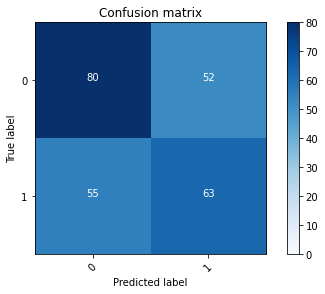

2022-08-20 21:58:12 - [Epoch Train: 22] loss: 0.0023, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 21:58:12 - [Epoch Valid: 22] loss: 2.1475, auc: 0.5621, acc: 0.5720, time: 14.00 s


 22%|████████▊                               | 22/100 [24:37<1:28:09, 67.82s/it]

2022-08-20 21:58:12 - EPOCH: 23
2022-08-20 21:58:15 - Train Step 10/244, train_loss: 0.0009
2022-08-20 21:58:17 - Train Step 20/244, train_loss: 0.0009
2022-08-20 21:58:19 - Train Step 30/244, train_loss: 0.0008
2022-08-20 21:58:21 - Train Step 40/244, train_loss: 0.0008
2022-08-20 21:58:23 - Train Step 50/244, train_loss: 0.0008
2022-08-20 21:58:25 - Train Step 60/244, train_loss: 0.0027
2022-08-20 21:58:27 - Train Step 70/244, train_loss: 0.0052
2022-08-20 21:58:29 - Train Step 80/244, train_loss: 0.0047
2022-08-20 21:58:31 - Train Step 90/244, train_loss: 0.0042
2022-08-20 21:58:33 - Train Step 100/244, train_loss: 0.0038
2022-08-20 21:58:35 - Train Step 110/244, train_loss: 0.0035
2022-08-20 21:58:37 - Train Step 120/244, train_loss: 0.0033
2022-08-20 21:58:40 - Train Step 130/244, train_loss: 0.0031
2022-08-20 21:58:42 - Train Step 140/244, train_loss: 0.0029
2022-08-20 21:58:44 - Train Step 150/244, train_loss: 0.0028
2022-08-20 21:58:46 - Train Step 160/244, train_loss: 0.0026
2

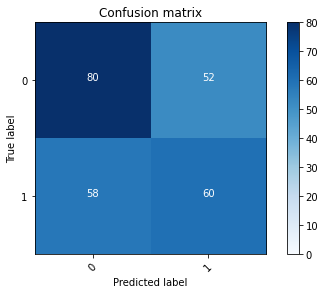

2022-08-20 21:59:17 - [Epoch Train: 23] loss: 0.0021, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 21:59:17 - [Epoch Valid: 23] loss: 2.1822, auc: 0.5609, acc: 0.5600, time: 14.00 s


 23%|█████████▏                              | 23/100 [25:42<1:26:01, 67.03s/it]

2022-08-20 21:59:17 - EPOCH: 24
2022-08-20 21:59:20 - Train Step 10/244, train_loss: 0.0005
2022-08-20 21:59:22 - Train Step 20/244, train_loss: 0.0012
2022-08-20 21:59:24 - Train Step 30/244, train_loss: 0.0009
2022-08-20 21:59:27 - Train Step 40/244, train_loss: 0.0008
2022-08-20 21:59:29 - Train Step 50/244, train_loss: 0.0008
2022-08-20 21:59:31 - Train Step 60/244, train_loss: 0.0007
2022-08-20 21:59:33 - Train Step 70/244, train_loss: 0.0007
2022-08-20 21:59:35 - Train Step 80/244, train_loss: 0.0008
2022-08-20 21:59:37 - Train Step 90/244, train_loss: 0.0008
2022-08-20 21:59:40 - Train Step 100/244, train_loss: 0.0008
2022-08-20 21:59:42 - Train Step 110/244, train_loss: 0.0009
2022-08-20 21:59:44 - Train Step 120/244, train_loss: 0.0010
2022-08-20 21:59:46 - Train Step 130/244, train_loss: 0.0009
2022-08-20 21:59:48 - Train Step 140/244, train_loss: 0.0009
2022-08-20 21:59:51 - Train Step 150/244, train_loss: 0.0009
2022-08-20 21:59:53 - Train Step 160/244, train_loss: 0.0008
2

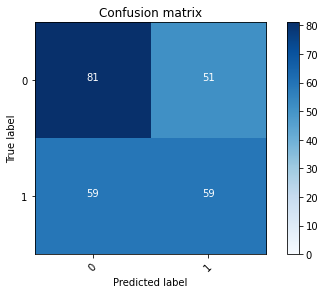

2022-08-20 22:00:25 - [Epoch Train: 24] loss: 0.0027, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 22:00:25 - [Epoch Valid: 24] loss: 2.2462, auc: 0.5641, acc: 0.5600, time: 14.00 s


 24%|█████████▌                              | 24/100 [26:50<1:25:04, 67.17s/it]

2022-08-20 22:00:25 - EPOCH: 25
2022-08-20 22:00:27 - Train Step 10/244, train_loss: 0.0276
2022-08-20 22:00:30 - Train Step 20/244, train_loss: 0.0140
2022-08-20 22:00:32 - Train Step 30/244, train_loss: 0.0096
2022-08-20 22:00:34 - Train Step 40/244, train_loss: 0.0074
2022-08-20 22:00:36 - Train Step 50/244, train_loss: 0.0060
2022-08-20 22:00:38 - Train Step 60/244, train_loss: 0.0052
2022-08-20 22:00:40 - Train Step 70/244, train_loss: 0.0045
2022-08-20 22:00:43 - Train Step 80/244, train_loss: 0.0040
2022-08-20 22:00:45 - Train Step 90/244, train_loss: 0.0036
2022-08-20 22:00:47 - Train Step 100/244, train_loss: 0.0034
2022-08-20 22:00:49 - Train Step 110/244, train_loss: 0.0031
2022-08-20 22:00:51 - Train Step 120/244, train_loss: 0.0029
2022-08-20 22:00:53 - Train Step 130/244, train_loss: 0.0027
2022-08-20 22:00:56 - Train Step 140/244, train_loss: 0.0025
2022-08-20 22:00:58 - Train Step 150/244, train_loss: 0.0024
2022-08-20 22:01:00 - Train Step 160/244, train_loss: 0.0060
2

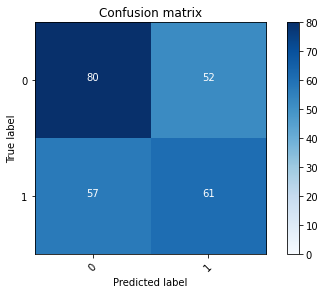

2022-08-20 22:01:33 - [Epoch Train: 25] loss: 0.0041, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 22:01:33 - [Epoch Valid: 25] loss: 2.4392, auc: 0.5638, acc: 0.5640, time: 14.00 s


 25%|██████████                              | 25/100 [27:57<1:24:09, 67.32s/it]

2022-08-20 22:01:33 - EPOCH: 26
2022-08-20 22:01:35 - Train Step 10/244, train_loss: 0.0003
2022-08-20 22:01:37 - Train Step 20/244, train_loss: 0.0009
2022-08-20 22:01:39 - Train Step 30/244, train_loss: 0.0008
2022-08-20 22:01:41 - Train Step 40/244, train_loss: 0.0009
2022-08-20 22:01:43 - Train Step 50/244, train_loss: 0.0008
2022-08-20 22:01:45 - Train Step 60/244, train_loss: 0.0007
2022-08-20 22:01:48 - Train Step 70/244, train_loss: 0.0007
2022-08-20 22:01:50 - Train Step 80/244, train_loss: 0.0007
2022-08-20 22:01:52 - Train Step 90/244, train_loss: 0.0007
2022-08-20 22:01:54 - Train Step 100/244, train_loss: 0.0007
2022-08-20 22:01:56 - Train Step 110/244, train_loss: 0.0007
2022-08-20 22:01:58 - Train Step 120/244, train_loss: 0.0063
2022-08-20 22:02:00 - Train Step 130/244, train_loss: 0.0058
2022-08-20 22:02:02 - Train Step 140/244, train_loss: 0.0056
2022-08-20 22:02:04 - Train Step 150/244, train_loss: 0.0078
2022-08-20 22:02:06 - Train Step 160/244, train_loss: 0.0074
2

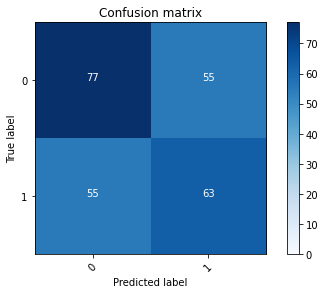

2022-08-20 22:02:38 - [Epoch Train: 26] loss: 0.0050, auc: 1.0000, acc: 0.9979, time: 51.00 s            
2022-08-20 22:02:38 - [Epoch Valid: 26] loss: 2.4995, auc: 0.5607, acc: 0.5600, time: 14.00 s


 26%|██████████▍                             | 26/100 [29:03<1:22:21, 66.78s/it]

2022-08-20 22:02:38 - EPOCH: 27
2022-08-20 22:02:40 - Train Step 10/244, train_loss: 0.0003
2022-08-20 22:02:43 - Train Step 20/244, train_loss: 0.0005
2022-08-20 22:02:45 - Train Step 30/244, train_loss: 0.0004
2022-08-20 22:02:47 - Train Step 40/244, train_loss: 0.0006
2022-08-20 22:02:49 - Train Step 50/244, train_loss: 0.0006
2022-08-20 22:02:51 - Train Step 60/244, train_loss: 0.0006
2022-08-20 22:02:53 - Train Step 70/244, train_loss: 0.0006
2022-08-20 22:02:55 - Train Step 80/244, train_loss: 0.0006
2022-08-20 22:02:57 - Train Step 90/244, train_loss: 0.0006
2022-08-20 22:02:59 - Train Step 100/244, train_loss: 0.0025
2022-08-20 22:03:01 - Train Step 110/244, train_loss: 0.0023
2022-08-20 22:03:04 - Train Step 120/244, train_loss: 0.0022
2022-08-20 22:03:06 - Train Step 130/244, train_loss: 0.0021
2022-08-20 22:03:08 - Train Step 140/244, train_loss: 0.0020
2022-08-20 22:03:10 - Train Step 150/244, train_loss: 0.0019
2022-08-20 22:03:12 - Train Step 160/244, train_loss: 0.0018
2

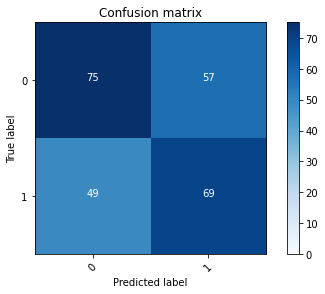

2022-08-20 22:03:43 - [Epoch Train: 27] loss: 0.0049, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 22:03:43 - [Epoch Valid: 27] loss: 2.3206, auc: 0.5593, acc: 0.5760, time: 13.00 s


 27%|██████████▊                             | 27/100 [30:08<1:20:32, 66.20s/it]

2022-08-20 22:03:43 - EPOCH: 28
2022-08-20 22:03:45 - Train Step 10/244, train_loss: 0.0003
2022-08-20 22:03:48 - Train Step 20/244, train_loss: 0.0003
2022-08-20 22:03:50 - Train Step 30/244, train_loss: 0.0003
2022-08-20 22:03:52 - Train Step 40/244, train_loss: 0.0005
2022-08-20 22:03:54 - Train Step 50/244, train_loss: 0.0005
2022-08-20 22:03:57 - Train Step 60/244, train_loss: 0.0006
2022-08-20 22:03:59 - Train Step 70/244, train_loss: 0.0006
2022-08-20 22:04:01 - Train Step 80/244, train_loss: 0.0006
2022-08-20 22:04:03 - Train Step 90/244, train_loss: 0.0006
2022-08-20 22:04:05 - Train Step 100/244, train_loss: 0.0006
2022-08-20 22:04:08 - Train Step 110/244, train_loss: 0.0006
2022-08-20 22:04:10 - Train Step 120/244, train_loss: 0.0006
2022-08-20 22:04:12 - Train Step 130/244, train_loss: 0.0006
2022-08-20 22:04:14 - Train Step 140/244, train_loss: 0.0006
2022-08-20 22:04:17 - Train Step 150/244, train_loss: 0.0006
2022-08-20 22:04:19 - Train Step 160/244, train_loss: 0.0006
2

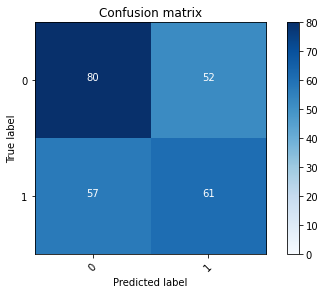

2022-08-20 22:04:52 - [Epoch Train: 28] loss: 0.0031, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:04:52 - [Epoch Valid: 28] loss: 2.4177, auc: 0.5580, acc: 0.5640, time: 14.00 s


 28%|███████████▏                            | 28/100 [31:16<1:20:24, 67.00s/it]

2022-08-20 22:04:52 - EPOCH: 29
2022-08-20 22:04:54 - Train Step 10/244, train_loss: 0.0006
2022-08-20 22:04:56 - Train Step 20/244, train_loss: 0.0004
2022-08-20 22:04:58 - Train Step 30/244, train_loss: 0.0004
2022-08-20 22:05:00 - Train Step 40/244, train_loss: 0.0004
2022-08-20 22:05:02 - Train Step 50/244, train_loss: 0.0007
2022-08-20 22:05:04 - Train Step 60/244, train_loss: 0.0007
2022-08-20 22:05:06 - Train Step 70/244, train_loss: 0.0008
2022-08-20 22:05:08 - Train Step 80/244, train_loss: 0.0008
2022-08-20 22:05:11 - Train Step 90/244, train_loss: 0.0009
2022-08-20 22:05:13 - Train Step 100/244, train_loss: 0.0008
2022-08-20 22:05:15 - Train Step 110/244, train_loss: 0.0008
2022-08-20 22:05:17 - Train Step 120/244, train_loss: 0.0030
2022-08-20 22:05:19 - Train Step 130/244, train_loss: 0.0028
2022-08-20 22:05:21 - Train Step 140/244, train_loss: 0.0027
2022-08-20 22:05:23 - Train Step 150/244, train_loss: 0.0025
2022-08-20 22:05:25 - Train Step 160/244, train_loss: 0.0025
2

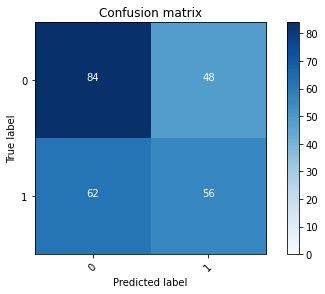

2022-08-20 22:05:57 - [Epoch Train: 29] loss: 0.0030, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 22:05:57 - [Epoch Valid: 29] loss: 2.4448, auc: 0.5614, acc: 0.5600, time: 14.00 s


 29%|███████████▌                            | 29/100 [32:21<1:18:33, 66.39s/it]

2022-08-20 22:05:57 - EPOCH: 30
2022-08-20 22:05:59 - Train Step 10/244, train_loss: 0.0002
2022-08-20 22:06:01 - Train Step 20/244, train_loss: 0.0003
2022-08-20 22:06:04 - Train Step 30/244, train_loss: 0.0003
2022-08-20 22:06:06 - Train Step 40/244, train_loss: 0.0007
2022-08-20 22:06:08 - Train Step 50/244, train_loss: 0.0006
2022-08-20 22:06:11 - Train Step 60/244, train_loss: 0.0005
2022-08-20 22:06:13 - Train Step 70/244, train_loss: 0.0005
2022-08-20 22:06:15 - Train Step 80/244, train_loss: 0.0005
2022-08-20 22:06:17 - Train Step 90/244, train_loss: 0.0004
2022-08-20 22:06:19 - Train Step 100/244, train_loss: 0.0023
2022-08-20 22:06:22 - Train Step 110/244, train_loss: 0.0021
2022-08-20 22:06:24 - Train Step 120/244, train_loss: 0.0020
2022-08-20 22:06:26 - Train Step 130/244, train_loss: 0.0018
2022-08-20 22:06:28 - Train Step 140/244, train_loss: 0.0017
2022-08-20 22:06:30 - Train Step 150/244, train_loss: 0.0016
2022-08-20 22:06:33 - Train Step 160/244, train_loss: 0.0015
2

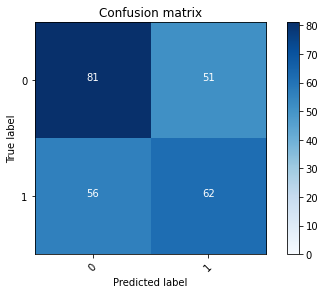

2022-08-20 22:07:05 - [Epoch Train: 30] loss: 0.0034, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:07:05 - [Epoch Valid: 30] loss: 2.4508, auc: 0.5577, acc: 0.5720, time: 13.00 s


 30%|████████████                            | 30/100 [33:29<1:17:57, 66.82s/it]

2022-08-20 22:07:05 - EPOCH: 31
2022-08-20 22:07:07 - Train Step 10/244, train_loss: 0.0005
2022-08-20 22:07:09 - Train Step 20/244, train_loss: 0.0004
2022-08-20 22:07:12 - Train Step 30/244, train_loss: 0.0085
2022-08-20 22:07:14 - Train Step 40/244, train_loss: 0.0065
2022-08-20 22:07:16 - Train Step 50/244, train_loss: 0.0053
2022-08-20 22:07:18 - Train Step 60/244, train_loss: 0.0045
2022-08-20 22:07:20 - Train Step 70/244, train_loss: 0.0039
2022-08-20 22:07:22 - Train Step 80/244, train_loss: 0.0034
2022-08-20 22:07:25 - Train Step 90/244, train_loss: 0.0031
2022-08-20 22:07:27 - Train Step 100/244, train_loss: 0.0028
2022-08-20 22:07:29 - Train Step 110/244, train_loss: 0.0026
2022-08-20 22:07:31 - Train Step 120/244, train_loss: 0.0024
2022-08-20 22:07:33 - Train Step 130/244, train_loss: 0.0023
2022-08-20 22:07:36 - Train Step 140/244, train_loss: 0.0022
2022-08-20 22:07:38 - Train Step 150/244, train_loss: 0.0020
2022-08-20 22:07:40 - Train Step 160/244, train_loss: 0.0019
2

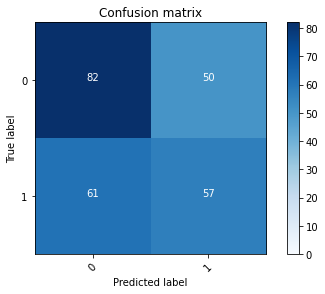

2022-08-20 22:08:13 - [Epoch Train: 31] loss: 0.0021, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 22:08:13 - [Epoch Valid: 31] loss: 2.4398, auc: 0.5628, acc: 0.5560, time: 14.00 s


 31%|████████████▍                           | 31/100 [34:37<1:17:13, 67.16s/it]

2022-08-20 22:08:13 - EPOCH: 32
2022-08-20 22:08:15 - Train Step 10/244, train_loss: 0.0014
2022-08-20 22:08:17 - Train Step 20/244, train_loss: 0.0008
2022-08-20 22:08:19 - Train Step 30/244, train_loss: 0.0158
2022-08-20 22:08:22 - Train Step 40/244, train_loss: 0.0120
2022-08-20 22:08:24 - Train Step 50/244, train_loss: 0.0150
2022-08-20 22:08:26 - Train Step 60/244, train_loss: 0.0126
2022-08-20 22:08:28 - Train Step 70/244, train_loss: 0.0108
2022-08-20 22:08:30 - Train Step 80/244, train_loss: 0.0095
2022-08-20 22:08:32 - Train Step 90/244, train_loss: 0.0085
2022-08-20 22:08:35 - Train Step 100/244, train_loss: 0.0077
2022-08-20 22:08:37 - Train Step 110/244, train_loss: 0.0071
2022-08-20 22:08:39 - Train Step 120/244, train_loss: 0.0067
2022-08-20 22:08:41 - Train Step 130/244, train_loss: 0.0062
2022-08-20 22:08:43 - Train Step 140/244, train_loss: 0.0057
2022-08-20 22:08:46 - Train Step 150/244, train_loss: 0.0054
2022-08-20 22:08:48 - Train Step 160/244, train_loss: 0.0051
2

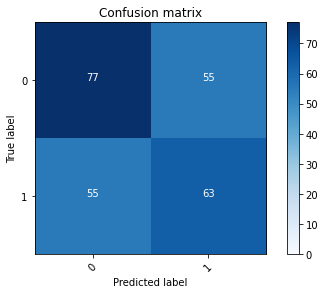

2022-08-20 22:09:19 - [Epoch Train: 32] loss: 0.0034, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 22:09:19 - [Epoch Valid: 32] loss: 2.5217, auc: 0.5596, acc: 0.5600, time: 13.00 s


 32%|████████████▊                           | 32/100 [35:44<1:15:59, 67.06s/it]

2022-08-20 22:09:19 - EPOCH: 33
2022-08-20 22:09:22 - Train Step 10/244, train_loss: 0.0003
2022-08-20 22:09:24 - Train Step 20/244, train_loss: 0.0004
2022-08-20 22:09:27 - Train Step 30/244, train_loss: 0.0003
2022-08-20 22:09:29 - Train Step 40/244, train_loss: 0.0003
2022-08-20 22:09:31 - Train Step 50/244, train_loss: 0.0003
2022-08-20 22:09:33 - Train Step 60/244, train_loss: 0.0003
2022-08-20 22:09:35 - Train Step 70/244, train_loss: 0.0003
2022-08-20 22:09:38 - Train Step 80/244, train_loss: 0.0063
2022-08-20 22:09:40 - Train Step 90/244, train_loss: 0.0056
2022-08-20 22:09:42 - Train Step 100/244, train_loss: 0.0051
2022-08-20 22:09:45 - Train Step 110/244, train_loss: 0.0047
2022-08-20 22:09:47 - Train Step 120/244, train_loss: 0.0043
2022-08-20 22:09:49 - Train Step 130/244, train_loss: 0.0040
2022-08-20 22:09:51 - Train Step 140/244, train_loss: 0.0038
2022-08-20 22:09:53 - Train Step 150/244, train_loss: 0.0035
2022-08-20 22:09:56 - Train Step 160/244, train_loss: 0.0033
2

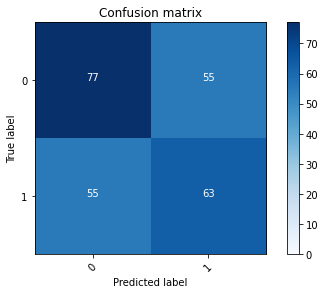

2022-08-20 22:10:28 - [Epoch Train: 33] loss: 0.0023, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:10:28 - [Epoch Valid: 33] loss: 2.6121, auc: 0.5585, acc: 0.5600, time: 14.00 s


 33%|█████████████▏                          | 33/100 [36:53<1:15:22, 67.50s/it]

2022-08-20 22:10:28 - EPOCH: 34
2022-08-20 22:10:30 - Train Step 10/244, train_loss: 0.0002
2022-08-20 22:10:33 - Train Step 20/244, train_loss: 0.0002
2022-08-20 22:10:35 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:10:37 - Train Step 40/244, train_loss: 0.0002
2022-08-20 22:10:39 - Train Step 50/244, train_loss: 0.0002
2022-08-20 22:10:41 - Train Step 60/244, train_loss: 0.0002
2022-08-20 22:10:43 - Train Step 70/244, train_loss: 0.0003
2022-08-20 22:10:45 - Train Step 80/244, train_loss: 0.0003
2022-08-20 22:10:47 - Train Step 90/244, train_loss: 0.0003
2022-08-20 22:10:49 - Train Step 100/244, train_loss: 0.0003
2022-08-20 22:10:51 - Train Step 110/244, train_loss: 0.0003
2022-08-20 22:10:54 - Train Step 120/244, train_loss: 0.0003
2022-08-20 22:10:56 - Train Step 130/244, train_loss: 0.0003
2022-08-20 22:10:58 - Train Step 140/244, train_loss: 0.0003
2022-08-20 22:11:00 - Train Step 150/244, train_loss: 0.0003
2022-08-20 22:11:02 - Train Step 160/244, train_loss: 0.0003
2

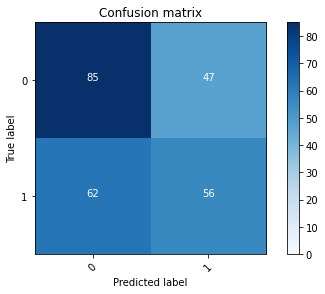

2022-08-20 22:11:34 - [Epoch Train: 34] loss: 0.0035, auc: 1.0000, acc: 0.9979, time: 51.00 s            
2022-08-20 22:11:34 - [Epoch Valid: 34] loss: 2.6367, auc: 0.5713, acc: 0.5640, time: 13.00 s


 34%|█████████████▌                          | 34/100 [37:58<1:13:39, 66.96s/it]

2022-08-20 22:11:34 - EPOCH: 35
2022-08-20 22:11:36 - Train Step 10/244, train_loss: 0.0005
2022-08-20 22:11:38 - Train Step 20/244, train_loss: 0.0005
2022-08-20 22:11:40 - Train Step 30/244, train_loss: 0.0005
2022-08-20 22:11:42 - Train Step 40/244, train_loss: 0.0004
2022-08-20 22:11:44 - Train Step 50/244, train_loss: 0.0004
2022-08-20 22:11:46 - Train Step 60/244, train_loss: 0.0005
2022-08-20 22:11:48 - Train Step 70/244, train_loss: 0.0005
2022-08-20 22:11:50 - Train Step 80/244, train_loss: 0.0004
2022-08-20 22:11:52 - Train Step 90/244, train_loss: 0.0015
2022-08-20 22:11:54 - Train Step 100/244, train_loss: 0.0015
2022-08-20 22:11:56 - Train Step 110/244, train_loss: 0.0014
2022-08-20 22:11:59 - Train Step 120/244, train_loss: 0.0013
2022-08-20 22:12:01 - Train Step 130/244, train_loss: 0.0012
2022-08-20 22:12:03 - Train Step 140/244, train_loss: 0.0012
2022-08-20 22:12:04 - Train Step 150/244, train_loss: 0.0031
2022-08-20 22:12:06 - Train Step 160/244, train_loss: 0.0029
2

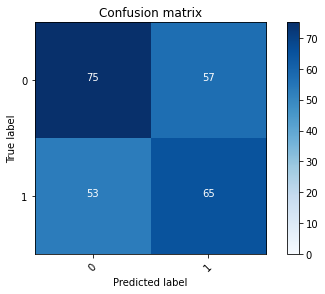

2022-08-20 22:12:37 - [Epoch Train: 35] loss: 0.0021, auc: 1.0000, acc: 0.9990, time: 49.00 s            
2022-08-20 22:12:37 - [Epoch Valid: 35] loss: 2.5824, auc: 0.5708, acc: 0.5600, time: 13.00 s


 35%|██████████████                          | 35/100 [39:02<1:11:25, 65.93s/it]

2022-08-20 22:12:37 - EPOCH: 36
2022-08-20 22:12:39 - Train Step 10/244, train_loss: 0.0002
2022-08-20 22:12:42 - Train Step 20/244, train_loss: 0.0003
2022-08-20 22:12:44 - Train Step 30/244, train_loss: 0.0056
2022-08-20 22:12:46 - Train Step 40/244, train_loss: 0.0042
2022-08-20 22:12:48 - Train Step 50/244, train_loss: 0.0034
2022-08-20 22:12:50 - Train Step 60/244, train_loss: 0.0029
2022-08-20 22:12:52 - Train Step 70/244, train_loss: 0.0025
2022-08-20 22:12:54 - Train Step 80/244, train_loss: 0.0022
2022-08-20 22:12:56 - Train Step 90/244, train_loss: 0.0020
2022-08-20 22:12:58 - Train Step 100/244, train_loss: 0.0018
2022-08-20 22:13:00 - Train Step 110/244, train_loss: 0.0017
2022-08-20 22:13:02 - Train Step 120/244, train_loss: 0.0016
2022-08-20 22:13:04 - Train Step 130/244, train_loss: 0.0025
2022-08-20 22:13:07 - Train Step 140/244, train_loss: 0.0023
2022-08-20 22:13:09 - Train Step 150/244, train_loss: 0.0022
2022-08-20 22:13:12 - Train Step 160/244, train_loss: 0.0021
2

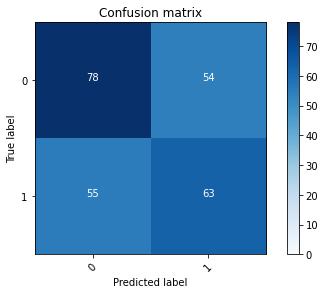

2022-08-20 22:13:44 - [Epoch Train: 36] loss: 0.0014, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 22:13:44 - [Epoch Valid: 36] loss: 2.7038, auc: 0.5651, acc: 0.5640, time: 13.00 s


 36%|██████████████▍                         | 36/100 [40:08<1:10:28, 66.07s/it]

2022-08-20 22:13:44 - EPOCH: 37
2022-08-20 22:13:46 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:13:48 - Train Step 20/244, train_loss: 0.0002
2022-08-20 22:13:50 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:13:53 - Train Step 40/244, train_loss: 0.0002
2022-08-20 22:13:55 - Train Step 50/244, train_loss: 0.0002
2022-08-20 22:13:57 - Train Step 60/244, train_loss: 0.0003
2022-08-20 22:13:59 - Train Step 70/244, train_loss: 0.0003
2022-08-20 22:14:01 - Train Step 80/244, train_loss: 0.0002
2022-08-20 22:14:03 - Train Step 90/244, train_loss: 0.0002
2022-08-20 22:14:05 - Train Step 100/244, train_loss: 0.0009
2022-08-20 22:14:07 - Train Step 110/244, train_loss: 0.0008
2022-08-20 22:14:09 - Train Step 120/244, train_loss: 0.0008
2022-08-20 22:14:12 - Train Step 130/244, train_loss: 0.0008
2022-08-20 22:14:14 - Train Step 140/244, train_loss: 0.0007
2022-08-20 22:14:16 - Train Step 150/244, train_loss: 0.0007
2022-08-20 22:14:18 - Train Step 160/244, train_loss: 0.0007
2

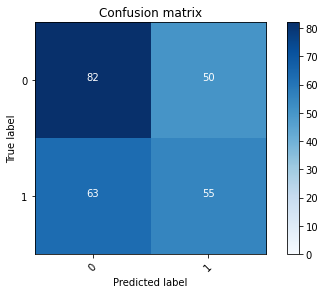

2022-08-20 22:14:50 - [Epoch Train: 37] loss: 0.0014, auc: 1.0000, acc: 1.0000, time: 52.00 s            
2022-08-20 22:14:50 - [Epoch Valid: 37] loss: 2.7355, auc: 0.5650, acc: 0.5480, time: 14.00 s


 37%|██████████████▊                         | 37/100 [41:15<1:09:38, 66.33s/it]

2022-08-20 22:14:50 - EPOCH: 38
2022-08-20 22:14:53 - Train Step 10/244, train_loss: 0.0005
2022-08-20 22:14:55 - Train Step 20/244, train_loss: 0.0003
2022-08-20 22:14:57 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:14:59 - Train Step 40/244, train_loss: 0.0002
2022-08-20 22:15:01 - Train Step 50/244, train_loss: 0.0002
2022-08-20 22:15:03 - Train Step 60/244, train_loss: 0.0002
2022-08-20 22:15:04 - Train Step 70/244, train_loss: 0.0002
2022-08-20 22:15:06 - Train Step 80/244, train_loss: 0.0002
2022-08-20 22:15:08 - Train Step 90/244, train_loss: 0.0002
2022-08-20 22:15:10 - Train Step 100/244, train_loss: 0.0002
2022-08-20 22:15:12 - Train Step 110/244, train_loss: 0.0021
2022-08-20 22:15:14 - Train Step 120/244, train_loss: 0.0019
2022-08-20 22:15:16 - Train Step 130/244, train_loss: 0.0018
2022-08-20 22:15:18 - Train Step 140/244, train_loss: 0.0017
2022-08-20 22:15:20 - Train Step 150/244, train_loss: 0.0016
2022-08-20 22:15:22 - Train Step 160/244, train_loss: 0.0015
2

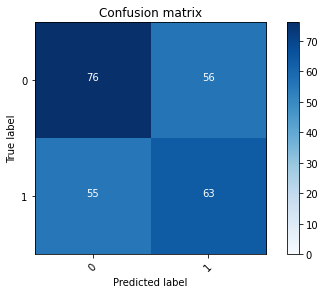

2022-08-20 22:15:52 - [Epoch Train: 38] loss: 0.0038, auc: 1.0000, acc: 0.9990, time: 47.00 s            
2022-08-20 22:15:52 - [Epoch Valid: 38] loss: 2.6357, auc: 0.5680, acc: 0.5560, time: 13.00 s


 38%|███████████████▏                        | 38/100 [42:16<1:06:58, 64.81s/it]

2022-08-20 22:15:52 - EPOCH: 39
2022-08-20 22:15:54 - Train Step 10/244, train_loss: 0.0002
2022-08-20 22:15:56 - Train Step 20/244, train_loss: 0.0002
2022-08-20 22:15:58 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:16:00 - Train Step 40/244, train_loss: 0.0002
2022-08-20 22:16:02 - Train Step 50/244, train_loss: 0.0007
2022-08-20 22:16:04 - Train Step 60/244, train_loss: 0.0006
2022-08-20 22:16:07 - Train Step 70/244, train_loss: 0.0005
2022-08-20 22:16:09 - Train Step 80/244, train_loss: 0.0005
2022-08-20 22:16:11 - Train Step 90/244, train_loss: 0.0004
2022-08-20 22:16:13 - Train Step 100/244, train_loss: 0.0004
2022-08-20 22:16:15 - Train Step 110/244, train_loss: 0.0004
2022-08-20 22:16:17 - Train Step 120/244, train_loss: 0.0004
2022-08-20 22:16:19 - Train Step 130/244, train_loss: 0.0028
2022-08-20 22:16:22 - Train Step 140/244, train_loss: 0.0026
2022-08-20 22:16:24 - Train Step 150/244, train_loss: 0.0024
2022-08-20 22:16:26 - Train Step 160/244, train_loss: 0.0023
2

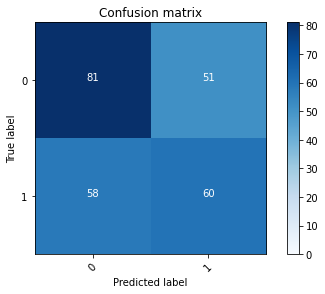

2022-08-20 22:16:56 - [Epoch Train: 39] loss: 0.0016, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 22:16:56 - [Epoch Valid: 39] loss: 2.7172, auc: 0.5659, acc: 0.5640, time: 13.00 s


 39%|███████████████▌                        | 39/100 [43:21<1:05:43, 64.65s/it]

2022-08-20 22:16:56 - EPOCH: 40
2022-08-20 22:16:58 - Train Step 10/244, train_loss: 0.0003
2022-08-20 22:17:01 - Train Step 20/244, train_loss: 0.0002
2022-08-20 22:17:03 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:17:05 - Train Step 40/244, train_loss: 0.0002
2022-08-20 22:17:07 - Train Step 50/244, train_loss: 0.0002
2022-08-20 22:17:09 - Train Step 60/244, train_loss: 0.0002
2022-08-20 22:17:11 - Train Step 70/244, train_loss: 0.0002
2022-08-20 22:17:14 - Train Step 80/244, train_loss: 0.0002
2022-08-20 22:17:16 - Train Step 90/244, train_loss: 0.0002
2022-08-20 22:17:18 - Train Step 100/244, train_loss: 0.0002
2022-08-20 22:17:20 - Train Step 110/244, train_loss: 0.0002
2022-08-20 22:17:23 - Train Step 120/244, train_loss: 0.0002
2022-08-20 22:17:25 - Train Step 130/244, train_loss: 0.0002
2022-08-20 22:17:27 - Train Step 140/244, train_loss: 0.0068
2022-08-20 22:17:29 - Train Step 150/244, train_loss: 0.0064
2022-08-20 22:17:31 - Train Step 160/244, train_loss: 0.0060
2

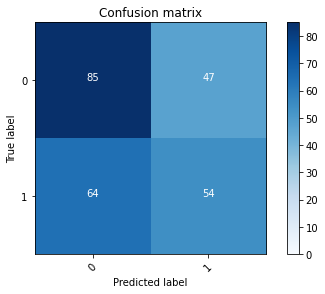

2022-08-20 22:18:03 - [Epoch Train: 40] loss: 0.0057, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 22:18:03 - [Epoch Valid: 40] loss: 2.6146, auc: 0.5638, acc: 0.5560, time: 12.00 s


 40%|████████████████                        | 40/100 [44:27<1:05:12, 65.21s/it]

2022-08-20 22:18:03 - EPOCH: 41
2022-08-20 22:18:05 - Train Step 10/244, train_loss: 0.0006
2022-08-20 22:18:07 - Train Step 20/244, train_loss: 0.0003
2022-08-20 22:18:10 - Train Step 30/244, train_loss: 0.0003
2022-08-20 22:18:12 - Train Step 40/244, train_loss: 0.0004
2022-08-20 22:18:14 - Train Step 50/244, train_loss: 0.0003
2022-08-20 22:18:16 - Train Step 60/244, train_loss: 0.0003
2022-08-20 22:18:18 - Train Step 70/244, train_loss: 0.0004
2022-08-20 22:18:20 - Train Step 80/244, train_loss: 0.0014
2022-08-20 22:18:22 - Train Step 90/244, train_loss: 0.0013
2022-08-20 22:18:25 - Train Step 100/244, train_loss: 0.0012
2022-08-20 22:18:27 - Train Step 110/244, train_loss: 0.0011
2022-08-20 22:18:29 - Train Step 120/244, train_loss: 0.0010
2022-08-20 22:18:31 - Train Step 130/244, train_loss: 0.0010
2022-08-20 22:18:33 - Train Step 140/244, train_loss: 0.0009
2022-08-20 22:18:36 - Train Step 150/244, train_loss: 0.0009
2022-08-20 22:18:38 - Train Step 160/244, train_loss: 0.0008
2

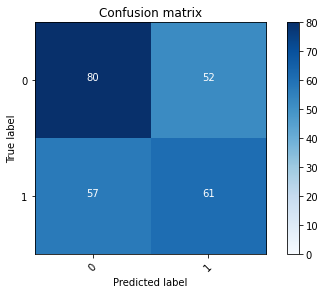

2022-08-20 22:19:11 - [Epoch Train: 41] loss: 0.0012, auc: 1.0000, acc: 1.0000, time: 55.00 s            
2022-08-20 22:19:11 - [Epoch Valid: 41] loss: 2.8766, auc: 0.5711, acc: 0.5640, time: 12.00 s


 41%|████████████████▍                       | 41/100 [45:35<1:05:02, 66.15s/it]

2022-08-20 22:19:11 - EPOCH: 42
2022-08-20 22:19:13 - Train Step 10/244, train_loss: 0.0002
2022-08-20 22:19:16 - Train Step 20/244, train_loss: 0.0040
2022-08-20 22:19:18 - Train Step 30/244, train_loss: 0.0028
2022-08-20 22:19:20 - Train Step 40/244, train_loss: 0.0022
2022-08-20 22:19:23 - Train Step 50/244, train_loss: 0.0018
2022-08-20 22:19:25 - Train Step 60/244, train_loss: 0.0016
2022-08-20 22:19:27 - Train Step 70/244, train_loss: 0.0014
2022-08-20 22:19:29 - Train Step 80/244, train_loss: 0.0012
2022-08-20 22:19:31 - Train Step 90/244, train_loss: 0.0011
2022-08-20 22:19:34 - Train Step 100/244, train_loss: 0.0010
2022-08-20 22:19:36 - Train Step 110/244, train_loss: 0.0009
2022-08-20 22:19:38 - Train Step 120/244, train_loss: 0.0008
2022-08-20 22:19:40 - Train Step 130/244, train_loss: 0.0008
2022-08-20 22:19:42 - Train Step 140/244, train_loss: 0.0008
2022-08-20 22:19:44 - Train Step 150/244, train_loss: 0.0007
2022-08-20 22:19:47 - Train Step 160/244, train_loss: 0.0007
2

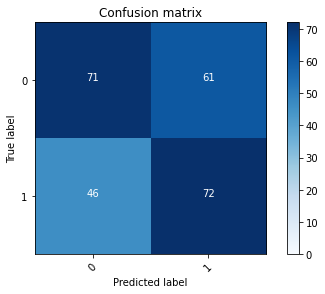

2022-08-20 22:20:19 - [Epoch Train: 42] loss: 0.0026, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 22:20:19 - [Epoch Valid: 42] loss: 2.6127, auc: 0.5645, acc: 0.5720, time: 14.00 s


 42%|████████████████▊                       | 42/100 [46:44<1:04:30, 66.73s/it]

2022-08-20 22:20:19 - EPOCH: 43
2022-08-20 22:20:22 - Train Step 10/244, train_loss: 0.0003
2022-08-20 22:20:24 - Train Step 20/244, train_loss: 0.0003
2022-08-20 22:20:26 - Train Step 30/244, train_loss: 0.0003
2022-08-20 22:20:28 - Train Step 40/244, train_loss: 0.0005
2022-08-20 22:20:29 - Train Step 50/244, train_loss: 0.0004
2022-08-20 22:20:31 - Train Step 60/244, train_loss: 0.0004
2022-08-20 22:20:33 - Train Step 70/244, train_loss: 0.0004
2022-08-20 22:20:35 - Train Step 80/244, train_loss: 0.0033
2022-08-20 22:20:37 - Train Step 90/244, train_loss: 0.0033
2022-08-20 22:20:39 - Train Step 100/244, train_loss: 0.0029
2022-08-20 22:20:41 - Train Step 110/244, train_loss: 0.0052
2022-08-20 22:20:43 - Train Step 120/244, train_loss: 0.0048
2022-08-20 22:20:45 - Train Step 130/244, train_loss: 0.0045
2022-08-20 22:20:47 - Train Step 140/244, train_loss: 0.0042
2022-08-20 22:20:49 - Train Step 150/244, train_loss: 0.0039
2022-08-20 22:20:50 - Train Step 160/244, train_loss: 0.0037
2

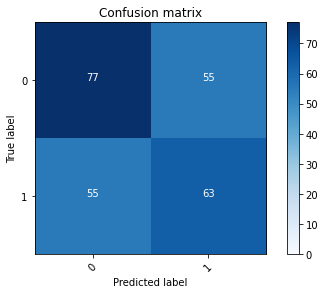

2022-08-20 22:21:19 - [Epoch Train: 43] loss: 0.0025, auc: 1.0000, acc: 0.9990, time: 47.00 s            
2022-08-20 22:21:19 - [Epoch Valid: 43] loss: 2.7071, auc: 0.5579, acc: 0.5600, time: 12.00 s


 43%|█████████████████▏                      | 43/100 [47:44<1:01:32, 64.78s/it]

2022-08-20 22:21:19 - EPOCH: 44
2022-08-20 22:21:22 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:21:24 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:21:27 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:21:29 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:21:31 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:21:34 - Train Step 60/244, train_loss: 0.0026
2022-08-20 22:21:36 - Train Step 70/244, train_loss: 0.0023
2022-08-20 22:21:38 - Train Step 80/244, train_loss: 0.0078
2022-08-20 22:21:40 - Train Step 90/244, train_loss: 0.0070
2022-08-20 22:21:42 - Train Step 100/244, train_loss: 0.0063
2022-08-20 22:21:44 - Train Step 110/244, train_loss: 0.0057
2022-08-20 22:21:46 - Train Step 120/244, train_loss: 0.0053
2022-08-20 22:21:49 - Train Step 130/244, train_loss: 0.0049
2022-08-20 22:21:51 - Train Step 140/244, train_loss: 0.0046
2022-08-20 22:21:53 - Train Step 150/244, train_loss: 0.0043
2022-08-20 22:21:55 - Train Step 160/244, train_loss: 0.0040
2

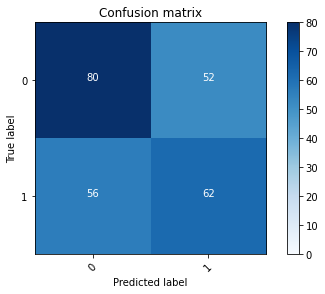

2022-08-20 22:22:26 - [Epoch Train: 44] loss: 0.0027, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 22:22:26 - [Epoch Valid: 44] loss: 2.8279, auc: 0.5627, acc: 0.5680, time: 13.00 s


 44%|█████████████████▌                      | 44/100 [48:50<1:00:53, 65.25s/it]

2022-08-20 22:22:26 - EPOCH: 45
2022-08-20 22:22:28 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:22:31 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:22:33 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:22:35 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:22:37 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:22:40 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:22:42 - Train Step 70/244, train_loss: 0.0002
2022-08-20 22:22:44 - Train Step 80/244, train_loss: 0.0002
2022-08-20 22:22:46 - Train Step 90/244, train_loss: 0.0002
2022-08-20 22:22:48 - Train Step 100/244, train_loss: 0.0002
2022-08-20 22:22:51 - Train Step 110/244, train_loss: 0.0002
2022-08-20 22:22:53 - Train Step 120/244, train_loss: 0.0001
2022-08-20 22:22:55 - Train Step 130/244, train_loss: 0.0001
2022-08-20 22:22:57 - Train Step 140/244, train_loss: 0.0002
2022-08-20 22:23:00 - Train Step 150/244, train_loss: 0.0002
2022-08-20 22:23:02 - Train Step 160/244, train_loss: 0.0002
2

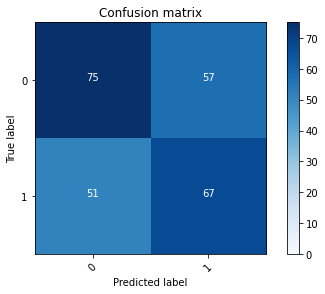

2022-08-20 22:23:34 - [Epoch Train: 45] loss: 0.0029, auc: 1.0000, acc: 0.9990, time: 55.00 s            
2022-08-20 22:23:34 - [Epoch Valid: 45] loss: 3.1355, auc: 0.5554, acc: 0.5680, time: 13.00 s


 45%|██████████████████                      | 45/100 [49:58<1:00:39, 66.18s/it]

2022-08-20 22:23:34 - EPOCH: 46
2022-08-20 22:23:36 - Train Step 10/244, train_loss: 0.0372
2022-08-20 22:23:38 - Train Step 20/244, train_loss: 0.0187
2022-08-20 22:23:41 - Train Step 30/244, train_loss: 0.0126
2022-08-20 22:23:43 - Train Step 40/244, train_loss: 0.0095
2022-08-20 22:23:45 - Train Step 50/244, train_loss: 0.0076
2022-08-20 22:23:48 - Train Step 60/244, train_loss: 0.0065
2022-08-20 22:23:50 - Train Step 70/244, train_loss: 0.0127
2022-08-20 22:23:52 - Train Step 80/244, train_loss: 0.0111
2022-08-20 22:23:54 - Train Step 90/244, train_loss: 0.0099
2022-08-20 22:23:56 - Train Step 100/244, train_loss: 0.0089
2022-08-20 22:23:58 - Train Step 110/244, train_loss: 0.0081
2022-08-20 22:24:01 - Train Step 120/244, train_loss: 0.0075
2022-08-20 22:24:03 - Train Step 130/244, train_loss: 0.0069
2022-08-20 22:24:05 - Train Step 140/244, train_loss: 0.0064
2022-08-20 22:24:07 - Train Step 150/244, train_loss: 0.0061
2022-08-20 22:24:10 - Train Step 160/244, train_loss: 0.0057
2

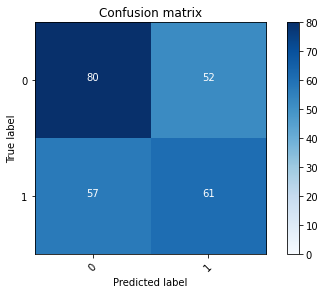

2022-08-20 22:24:42 - [Epoch Train: 46] loss: 0.0038, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:24:42 - [Epoch Valid: 46] loss: 2.7459, auc: 0.5622, acc: 0.5640, time: 13.00 s


 46%|██████████████████▍                     | 46/100 [51:07<1:00:03, 66.74s/it]

2022-08-20 22:24:42 - EPOCH: 47
2022-08-20 22:24:44 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:24:47 - Train Step 20/244, train_loss: 0.0004
2022-08-20 22:24:49 - Train Step 30/244, train_loss: 0.0003
2022-08-20 22:24:51 - Train Step 40/244, train_loss: 0.0003
2022-08-20 22:24:54 - Train Step 50/244, train_loss: 0.0003
2022-08-20 22:24:56 - Train Step 60/244, train_loss: 0.0002
2022-08-20 22:24:58 - Train Step 70/244, train_loss: 0.0002
2022-08-20 22:25:00 - Train Step 80/244, train_loss: 0.0002
2022-08-20 22:25:03 - Train Step 90/244, train_loss: 0.0002
2022-08-20 22:25:05 - Train Step 100/244, train_loss: 0.0002
2022-08-20 22:25:07 - Train Step 110/244, train_loss: 0.0002
2022-08-20 22:25:09 - Train Step 120/244, train_loss: 0.0002
2022-08-20 22:25:11 - Train Step 130/244, train_loss: 0.0026
2022-08-20 22:25:13 - Train Step 140/244, train_loss: 0.0024
2022-08-20 22:25:16 - Train Step 150/244, train_loss: 0.0023
2022-08-20 22:25:18 - Train Step 160/244, train_loss: 0.0022
2

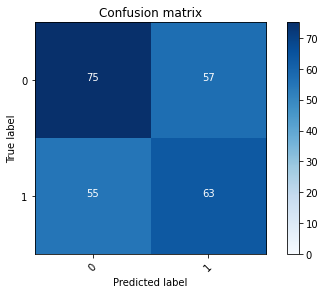

2022-08-20 22:25:50 - [Epoch Train: 47] loss: 0.0024, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:25:50 - [Epoch Valid: 47] loss: 2.7140, auc: 0.5661, acc: 0.5520, time: 13.00 s


 47%|███████████████████▋                      | 47/100 [52:14<59:15, 67.08s/it]

2022-08-20 22:25:50 - EPOCH: 48
2022-08-20 22:25:52 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:25:55 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:25:57 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:25:59 - Train Step 40/244, train_loss: 0.0032
2022-08-20 22:26:01 - Train Step 50/244, train_loss: 0.0026
2022-08-20 22:26:04 - Train Step 60/244, train_loss: 0.0022
2022-08-20 22:26:06 - Train Step 70/244, train_loss: 0.0019
2022-08-20 22:26:08 - Train Step 80/244, train_loss: 0.0017
2022-08-20 22:26:10 - Train Step 90/244, train_loss: 0.0016
2022-08-20 22:26:13 - Train Step 100/244, train_loss: 0.0015
2022-08-20 22:26:15 - Train Step 110/244, train_loss: 0.0014
2022-08-20 22:26:17 - Train Step 120/244, train_loss: 0.0013
2022-08-20 22:26:19 - Train Step 130/244, train_loss: 0.0012
2022-08-20 22:26:21 - Train Step 140/244, train_loss: 0.0011
2022-08-20 22:26:23 - Train Step 150/244, train_loss: 0.0010
2022-08-20 22:26:26 - Train Step 160/244, train_loss: 0.0010
2

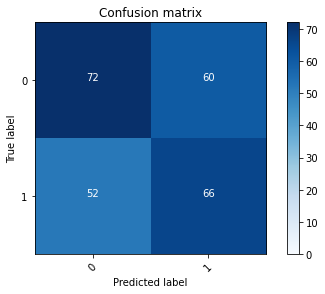

2022-08-20 22:26:58 - [Epoch Train: 48] loss: 0.0020, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 22:26:58 - [Epoch Valid: 48] loss: 2.8071, auc: 0.5568, acc: 0.5520, time: 14.00 s


 48%|████████████████████▏                     | 48/100 [53:23<58:30, 67.51s/it]

2022-08-20 22:26:58 - EPOCH: 49
2022-08-20 22:27:01 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:27:03 - Train Step 20/244, train_loss: 0.0113
2022-08-20 22:27:05 - Train Step 30/244, train_loss: 0.0364
2022-08-20 22:27:07 - Train Step 40/244, train_loss: 0.0274
2022-08-20 22:27:10 - Train Step 50/244, train_loss: 0.0220
2022-08-20 22:27:12 - Train Step 60/244, train_loss: 0.0183
2022-08-20 22:27:14 - Train Step 70/244, train_loss: 0.0157
2022-08-20 22:27:16 - Train Step 80/244, train_loss: 0.0138
2022-08-20 22:27:18 - Train Step 90/244, train_loss: 0.0123
2022-08-20 22:27:21 - Train Step 100/244, train_loss: 0.0111
2022-08-20 22:27:23 - Train Step 110/244, train_loss: 0.0101
2022-08-20 22:27:25 - Train Step 120/244, train_loss: 0.0093
2022-08-20 22:27:27 - Train Step 130/244, train_loss: 0.0085
2022-08-20 22:27:29 - Train Step 140/244, train_loss: 0.0079
2022-08-20 22:27:32 - Train Step 150/244, train_loss: 0.0074
2022-08-20 22:27:34 - Train Step 160/244, train_loss: 0.0070
2

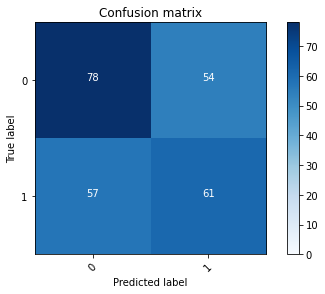

2022-08-20 22:28:07 - [Epoch Train: 49] loss: 0.0046, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:28:07 - [Epoch Valid: 49] loss: 2.9453, auc: 0.5574, acc: 0.5560, time: 14.00 s


 49%|████████████████████▌                     | 49/100 [54:31<57:39, 67.83s/it]

2022-08-20 22:28:07 - EPOCH: 50
2022-08-20 22:28:09 - Train Step 10/244, train_loss: 0.0398
2022-08-20 22:28:12 - Train Step 20/244, train_loss: 0.0199
2022-08-20 22:28:14 - Train Step 30/244, train_loss: 0.0133
2022-08-20 22:28:16 - Train Step 40/244, train_loss: 0.0101
2022-08-20 22:28:18 - Train Step 50/244, train_loss: 0.0081
2022-08-20 22:28:21 - Train Step 60/244, train_loss: 0.0069
2022-08-20 22:28:23 - Train Step 70/244, train_loss: 0.0059
2022-08-20 22:28:25 - Train Step 80/244, train_loss: 0.0115
2022-08-20 22:28:27 - Train Step 90/244, train_loss: 0.0102
2022-08-20 22:28:29 - Train Step 100/244, train_loss: 0.0092
2022-08-20 22:28:32 - Train Step 110/244, train_loss: 0.0084
2022-08-20 22:28:34 - Train Step 120/244, train_loss: 0.0077
2022-08-20 22:28:36 - Train Step 130/244, train_loss: 0.0071
2022-08-20 22:28:38 - Train Step 140/244, train_loss: 0.0066
2022-08-20 22:28:40 - Train Step 150/244, train_loss: 0.0062
2022-08-20 22:28:43 - Train Step 160/244, train_loss: 0.0059
2

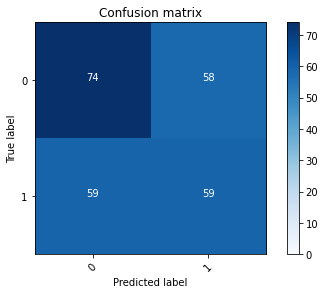

2022-08-20 22:29:15 - [Epoch Train: 50] loss: 0.0039, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:29:15 - [Epoch Valid: 50] loss: 2.9850, auc: 0.5548, acc: 0.5320, time: 14.00 s


 50%|█████████████████████                     | 50/100 [55:40<56:41, 68.04s/it]

2022-08-20 22:29:15 - EPOCH: 51
2022-08-20 22:29:18 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:29:20 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:29:23 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:29:25 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:29:27 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:29:29 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:29:32 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:29:34 - Train Step 80/244, train_loss: 0.0001
2022-08-20 22:29:36 - Train Step 90/244, train_loss: 0.0001
2022-08-20 22:29:38 - Train Step 100/244, train_loss: 0.0001
2022-08-20 22:29:40 - Train Step 110/244, train_loss: 0.0001
2022-08-20 22:29:43 - Train Step 120/244, train_loss: 0.0001
2022-08-20 22:29:45 - Train Step 130/244, train_loss: 0.0012
2022-08-20 22:29:47 - Train Step 140/244, train_loss: 0.0012
2022-08-20 22:29:49 - Train Step 150/244, train_loss: 0.0011
2022-08-20 22:29:52 - Train Step 160/244, train_loss: 0.0011
2

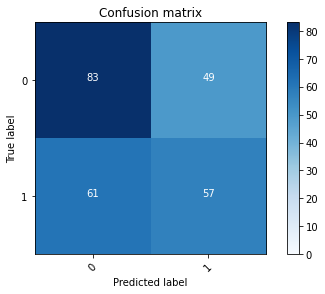

2022-08-20 22:30:24 - [Epoch Train: 51] loss: 0.0020, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:30:24 - [Epoch Valid: 51] loss: 3.0455, auc: 0.5594, acc: 0.5600, time: 14.00 s


 51%|█████████████████████▍                    | 51/100 [56:49<55:44, 68.26s/it]

2022-08-20 22:30:24 - EPOCH: 52
2022-08-20 22:30:27 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:30:29 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:30:31 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:30:33 - Train Step 40/244, train_loss: 0.0004
2022-08-20 22:30:35 - Train Step 50/244, train_loss: 0.0003
2022-08-20 22:30:37 - Train Step 60/244, train_loss: 0.0003
2022-08-20 22:30:39 - Train Step 70/244, train_loss: 0.0003
2022-08-20 22:30:41 - Train Step 80/244, train_loss: 0.0003
2022-08-20 22:30:43 - Train Step 90/244, train_loss: 0.0017
2022-08-20 22:30:46 - Train Step 100/244, train_loss: 0.0015
2022-08-20 22:30:48 - Train Step 110/244, train_loss: 0.0014
2022-08-20 22:30:50 - Train Step 120/244, train_loss: 0.0013
2022-08-20 22:30:52 - Train Step 130/244, train_loss: 0.0012
2022-08-20 22:30:54 - Train Step 140/244, train_loss: 0.0011
2022-08-20 22:30:56 - Train Step 150/244, train_loss: 0.0011
2022-08-20 22:30:58 - Train Step 160/244, train_loss: 0.0010
2

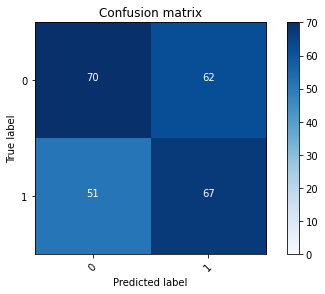

2022-08-20 22:31:30 - [Epoch Train: 52] loss: 0.0021, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 22:31:30 - [Epoch Valid: 52] loss: 2.9411, auc: 0.5550, acc: 0.5480, time: 14.00 s


 52%|█████████████████████▊                    | 52/100 [57:54<53:55, 67.40s/it]

2022-08-20 22:31:30 - EPOCH: 53
2022-08-20 22:31:32 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:31:34 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:31:36 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:31:39 - Train Step 40/244, train_loss: 0.0034
2022-08-20 22:31:41 - Train Step 50/244, train_loss: 0.0027
2022-08-20 22:31:43 - Train Step 60/244, train_loss: 0.0023
2022-08-20 22:31:45 - Train Step 70/244, train_loss: 0.0020
2022-08-20 22:31:48 - Train Step 80/244, train_loss: 0.0018
2022-08-20 22:31:50 - Train Step 90/244, train_loss: 0.0016
2022-08-20 22:31:52 - Train Step 100/244, train_loss: 0.0015
2022-08-20 22:31:54 - Train Step 110/244, train_loss: 0.0013
2022-08-20 22:31:57 - Train Step 120/244, train_loss: 0.0013
2022-08-20 22:31:59 - Train Step 130/244, train_loss: 0.0012
2022-08-20 22:32:01 - Train Step 140/244, train_loss: 0.0011
2022-08-20 22:32:03 - Train Step 150/244, train_loss: 0.0010
2022-08-20 22:32:05 - Train Step 160/244, train_loss: 0.0010
2

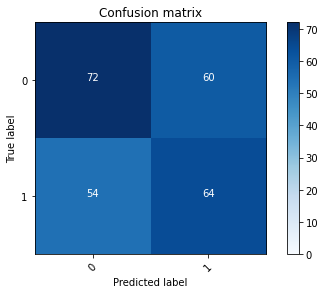

2022-08-20 22:32:38 - [Epoch Train: 53] loss: 0.0016, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 22:32:38 - [Epoch Valid: 53] loss: 3.1099, auc: 0.5518, acc: 0.5440, time: 14.00 s


 53%|██████████████████████▎                   | 53/100 [59:03<53:03, 67.73s/it]

2022-08-20 22:32:38 - EPOCH: 54
2022-08-20 22:32:41 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:32:43 - Train Step 20/244, train_loss: 0.0002
2022-08-20 22:32:45 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:32:47 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:32:49 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:32:52 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:32:54 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:32:56 - Train Step 80/244, train_loss: 0.0001
2022-08-20 22:32:58 - Train Step 90/244, train_loss: 0.0001
2022-08-20 22:33:00 - Train Step 100/244, train_loss: 0.0001
2022-08-20 22:33:03 - Train Step 110/244, train_loss: 0.0001
2022-08-20 22:33:05 - Train Step 120/244, train_loss: 0.0002
2022-08-20 22:33:07 - Train Step 130/244, train_loss: 0.0002
2022-08-20 22:33:09 - Train Step 140/244, train_loss: 0.0002
2022-08-20 22:33:11 - Train Step 150/244, train_loss: 0.0020
2022-08-20 22:33:14 - Train Step 160/244, train_loss: 0.0019
2

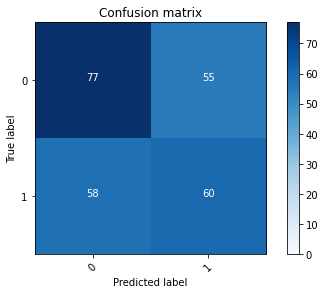

2022-08-20 22:33:46 - [Epoch Train: 54] loss: 0.0049, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 22:33:46 - [Epoch Valid: 54] loss: 3.0215, auc: 0.5456, acc: 0.5480, time: 14.00 s


 54%|█████████████████████▌                  | 54/100 [1:00:10<51:55, 67.73s/it]

2022-08-20 22:33:46 - EPOCH: 55
2022-08-20 22:33:49 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:33:51 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:33:53 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:33:55 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:33:57 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:34:00 - Train Step 60/244, train_loss: 0.0022
2022-08-20 22:34:02 - Train Step 70/244, train_loss: 0.0019
2022-08-20 22:34:04 - Train Step 80/244, train_loss: 0.0017
2022-08-20 22:34:06 - Train Step 90/244, train_loss: 0.0015
2022-08-20 22:34:08 - Train Step 100/244, train_loss: 0.0014
2022-08-20 22:34:11 - Train Step 110/244, train_loss: 0.0013
2022-08-20 22:34:13 - Train Step 120/244, train_loss: 0.0012
2022-08-20 22:34:15 - Train Step 130/244, train_loss: 0.0011
2022-08-20 22:34:17 - Train Step 140/244, train_loss: 0.0010
2022-08-20 22:34:20 - Train Step 150/244, train_loss: 0.0038
2022-08-20 22:34:22 - Train Step 160/244, train_loss: 0.0036
2

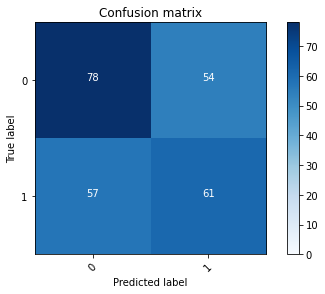

2022-08-20 22:34:54 - [Epoch Train: 55] loss: 0.0025, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:34:54 - [Epoch Valid: 55] loss: 3.0842, auc: 0.5473, acc: 0.5560, time: 14.00 s


 55%|██████████████████████                  | 55/100 [1:01:19<50:57, 67.94s/it]

2022-08-20 22:34:54 - EPOCH: 56
2022-08-20 22:34:57 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:34:59 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:35:01 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:35:03 - Train Step 40/244, train_loss: 0.0061
2022-08-20 22:35:06 - Train Step 50/244, train_loss: 0.0049
2022-08-20 22:35:08 - Train Step 60/244, train_loss: 0.0041
2022-08-20 22:35:10 - Train Step 70/244, train_loss: 0.0036
2022-08-20 22:35:12 - Train Step 80/244, train_loss: 0.0031
2022-08-20 22:35:14 - Train Step 90/244, train_loss: 0.0028
2022-08-20 22:35:17 - Train Step 100/244, train_loss: 0.0025
2022-08-20 22:35:19 - Train Step 110/244, train_loss: 0.0023
2022-08-20 22:35:21 - Train Step 120/244, train_loss: 0.0022
2022-08-20 22:35:23 - Train Step 130/244, train_loss: 0.0021
2022-08-20 22:35:25 - Train Step 140/244, train_loss: 0.0019
2022-08-20 22:35:27 - Train Step 150/244, train_loss: 0.0018
2022-08-20 22:35:30 - Train Step 160/244, train_loss: 0.0017
2

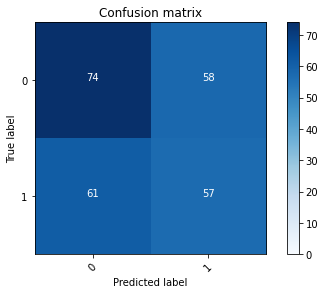

2022-08-20 22:36:03 - [Epoch Train: 56] loss: 0.0024, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 22:36:03 - [Epoch Valid: 56] loss: 3.1108, auc: 0.5506, acc: 0.5240, time: 14.00 s


 56%|██████████████████████▍                 | 56/100 [1:02:27<49:54, 68.06s/it]

2022-08-20 22:36:03 - EPOCH: 57
2022-08-20 22:36:05 - Train Step 10/244, train_loss: 0.0002
2022-08-20 22:36:07 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:36:10 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:36:12 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:36:14 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:36:16 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:36:18 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:36:21 - Train Step 80/244, train_loss: 0.0001
2022-08-20 22:36:23 - Train Step 90/244, train_loss: 0.0009
2022-08-20 22:36:25 - Train Step 100/244, train_loss: 0.0008
2022-08-20 22:36:27 - Train Step 110/244, train_loss: 0.0008
2022-08-20 22:36:30 - Train Step 120/244, train_loss: 0.0007
2022-08-20 22:36:32 - Train Step 130/244, train_loss: 0.0007
2022-08-20 22:36:34 - Train Step 140/244, train_loss: 0.0006
2022-08-20 22:36:36 - Train Step 150/244, train_loss: 0.0006
2022-08-20 22:36:39 - Train Step 160/244, train_loss: 0.0006
2

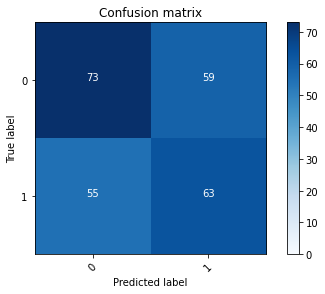

2022-08-20 22:37:12 - [Epoch Train: 57] loss: 0.0020, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 22:37:12 - [Epoch Valid: 57] loss: 3.1126, auc: 0.5421, acc: 0.5440, time: 14.00 s


 57%|██████████████████████▊                 | 57/100 [1:03:36<48:59, 68.36s/it]

2022-08-20 22:37:12 - EPOCH: 58
2022-08-20 22:37:14 - Train Step 10/244, train_loss: 0.0000
2022-08-20 22:37:16 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:37:18 - Train Step 30/244, train_loss: 0.0000
2022-08-20 22:37:20 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:37:22 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:37:24 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:37:26 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:37:28 - Train Step 80/244, train_loss: 0.0001
2022-08-20 22:37:30 - Train Step 90/244, train_loss: 0.0001
2022-08-20 22:37:33 - Train Step 100/244, train_loss: 0.0001
2022-08-20 22:37:35 - Train Step 110/244, train_loss: 0.0001
2022-08-20 22:37:37 - Train Step 120/244, train_loss: 0.0001
2022-08-20 22:37:39 - Train Step 130/244, train_loss: 0.0001
2022-08-20 22:37:41 - Train Step 140/244, train_loss: 0.0001
2022-08-20 22:37:43 - Train Step 150/244, train_loss: 0.0001
2022-08-20 22:37:45 - Train Step 160/244, train_loss: 0.0001
2

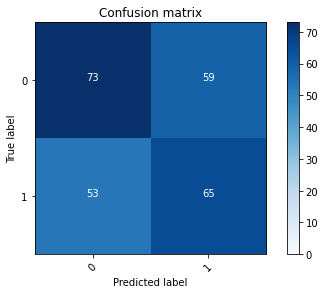

2022-08-20 22:38:16 - [Epoch Train: 58] loss: 0.0031, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 22:38:16 - [Epoch Valid: 58] loss: 3.2040, auc: 0.5373, acc: 0.5520, time: 13.00 s


 58%|███████████████████████▏                | 58/100 [1:04:40<46:55, 67.02s/it]

2022-08-20 22:38:16 - EPOCH: 59
2022-08-20 22:38:18 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:38:20 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:38:23 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:38:25 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:38:27 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:38:29 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:38:31 - Train Step 70/244, train_loss: 0.0011
2022-08-20 22:38:34 - Train Step 80/244, train_loss: 0.0010
2022-08-20 22:38:36 - Train Step 90/244, train_loss: 0.0009
2022-08-20 22:38:38 - Train Step 100/244, train_loss: 0.0008
2022-08-20 22:38:40 - Train Step 110/244, train_loss: 0.0008
2022-08-20 22:38:42 - Train Step 120/244, train_loss: 0.0007
2022-08-20 22:38:44 - Train Step 130/244, train_loss: 0.0007
2022-08-20 22:38:47 - Train Step 140/244, train_loss: 0.0006
2022-08-20 22:38:49 - Train Step 150/244, train_loss: 0.0006
2022-08-20 22:38:51 - Train Step 160/244, train_loss: 0.0006
2

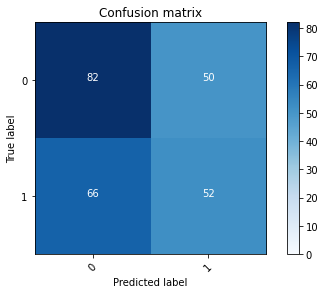

2022-08-20 22:39:23 - [Epoch Train: 59] loss: 0.0025, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 22:39:23 - [Epoch Valid: 59] loss: 3.3613, auc: 0.5425, acc: 0.5360, time: 13.00 s


 59%|███████████████████████▌                | 59/100 [1:05:47<45:48, 67.04s/it]

2022-08-20 22:39:23 - EPOCH: 60
2022-08-20 22:39:25 - Train Step 10/244, train_loss: 0.0002
2022-08-20 22:39:27 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:39:29 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:39:32 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:39:34 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:39:36 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:39:38 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:39:41 - Train Step 80/244, train_loss: 0.0009
2022-08-20 22:39:43 - Train Step 90/244, train_loss: 0.0008
2022-08-20 22:39:45 - Train Step 100/244, train_loss: 0.0007
2022-08-20 22:39:47 - Train Step 110/244, train_loss: 0.0007
2022-08-20 22:39:50 - Train Step 120/244, train_loss: 0.0007
2022-08-20 22:39:52 - Train Step 130/244, train_loss: 0.0006
2022-08-20 22:39:54 - Train Step 140/244, train_loss: 0.0006
2022-08-20 22:39:56 - Train Step 150/244, train_loss: 0.0006
2022-08-20 22:39:58 - Train Step 160/244, train_loss: 0.0005
2

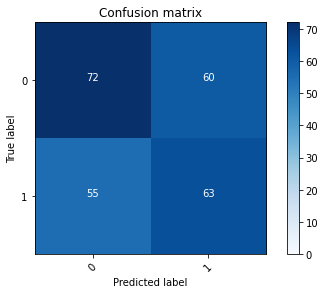

2022-08-20 22:40:30 - [Epoch Train: 60] loss: 0.0017, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 22:40:30 - [Epoch Valid: 60] loss: 3.3594, auc: 0.5390, acc: 0.5400, time: 13.00 s


 60%|████████████████████████                | 60/100 [1:06:54<44:43, 67.09s/it]

2022-08-20 22:40:30 - EPOCH: 61
2022-08-20 22:40:32 - Train Step 10/244, train_loss: 0.0002
2022-08-20 22:40:34 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:40:37 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:40:39 - Train Step 40/244, train_loss: 0.0002
2022-08-20 22:40:41 - Train Step 50/244, train_loss: 0.0002
2022-08-20 22:40:43 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:40:46 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:40:48 - Train Step 80/244, train_loss: 0.0001
2022-08-20 22:40:50 - Train Step 90/244, train_loss: 0.0001
2022-08-20 22:40:52 - Train Step 100/244, train_loss: 0.0001
2022-08-20 22:40:54 - Train Step 110/244, train_loss: 0.0001
2022-08-20 22:40:57 - Train Step 120/244, train_loss: 0.0001
2022-08-20 22:40:59 - Train Step 130/244, train_loss: 0.0001
2022-08-20 22:41:01 - Train Step 140/244, train_loss: 0.0001
2022-08-20 22:41:03 - Train Step 150/244, train_loss: 0.0001
2022-08-20 22:41:05 - Train Step 160/244, train_loss: 0.0001
2

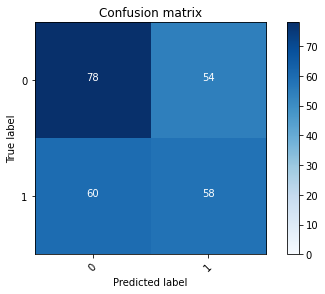

2022-08-20 22:41:38 - [Epoch Train: 61] loss: 0.0017, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 22:41:38 - [Epoch Valid: 61] loss: 3.2090, auc: 0.5461, acc: 0.5440, time: 14.00 s


 61%|████████████████████████▍               | 61/100 [1:08:02<43:47, 67.36s/it]

2022-08-20 22:41:38 - EPOCH: 62
2022-08-20 22:41:40 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:41:43 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:41:45 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:41:47 - Train Step 40/244, train_loss: 0.0041
2022-08-20 22:41:49 - Train Step 50/244, train_loss: 0.0033
2022-08-20 22:41:52 - Train Step 60/244, train_loss: 0.0027
2022-08-20 22:41:54 - Train Step 70/244, train_loss: 0.0024
2022-08-20 22:41:56 - Train Step 80/244, train_loss: 0.0021
2022-08-20 22:41:58 - Train Step 90/244, train_loss: 0.0019
2022-08-20 22:42:00 - Train Step 100/244, train_loss: 0.0017
2022-08-20 22:42:03 - Train Step 110/244, train_loss: 0.0015
2022-08-20 22:42:05 - Train Step 120/244, train_loss: 0.0014
2022-08-20 22:42:07 - Train Step 130/244, train_loss: 0.0013
2022-08-20 22:42:10 - Train Step 140/244, train_loss: 0.0012
2022-08-20 22:42:12 - Train Step 150/244, train_loss: 0.0034
2022-08-20 22:42:14 - Train Step 160/244, train_loss: 0.0032
2

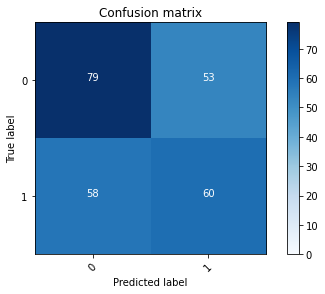

2022-08-20 22:42:45 - [Epoch Train: 62] loss: 0.0021, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:42:45 - [Epoch Valid: 62] loss: 3.2355, auc: 0.5480, acc: 0.5560, time: 13.00 s


 62%|████████████████████████▊               | 62/100 [1:09:10<42:41, 67.41s/it]

2022-08-20 22:42:45 - EPOCH: 63
2022-08-20 22:42:48 - Train Step 10/244, train_loss: 0.0002
2022-08-20 22:42:50 - Train Step 20/244, train_loss: 0.0002
2022-08-20 22:42:52 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:42:55 - Train Step 40/244, train_loss: 0.0002
2022-08-20 22:42:57 - Train Step 50/244, train_loss: 0.0002
2022-08-20 22:42:59 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:43:01 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:43:04 - Train Step 80/244, train_loss: 0.0001
2022-08-20 22:43:06 - Train Step 90/244, train_loss: 0.0001
2022-08-20 22:43:08 - Train Step 100/244, train_loss: 0.0001
2022-08-20 22:43:10 - Train Step 110/244, train_loss: 0.0001
2022-08-20 22:43:13 - Train Step 120/244, train_loss: 0.0001
2022-08-20 22:43:15 - Train Step 130/244, train_loss: 0.0001
2022-08-20 22:43:17 - Train Step 140/244, train_loss: 0.0001
2022-08-20 22:43:20 - Train Step 150/244, train_loss: 0.0001
2022-08-20 22:43:22 - Train Step 160/244, train_loss: 0.0001
2

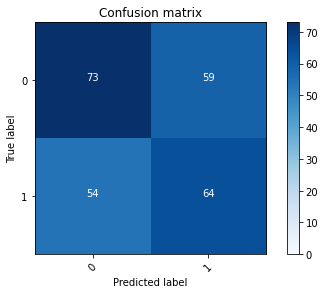

2022-08-20 22:43:55 - [Epoch Train: 63] loss: 0.0029, auc: 1.0000, acc: 0.9990, time: 55.00 s            
2022-08-20 22:43:55 - [Epoch Valid: 63] loss: 3.0766, auc: 0.5430, acc: 0.5480, time: 14.00 s


 63%|█████████████████████████▏              | 63/100 [1:10:19<41:56, 68.01s/it]

2022-08-20 22:43:55 - EPOCH: 64
2022-08-20 22:43:57 - Train Step 10/244, train_loss: 0.0003
2022-08-20 22:43:59 - Train Step 20/244, train_loss: 0.0002
2022-08-20 22:44:02 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:44:04 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:44:06 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:44:08 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:44:10 - Train Step 70/244, train_loss: 0.0034
2022-08-20 22:44:13 - Train Step 80/244, train_loss: 0.0030
2022-08-20 22:44:15 - Train Step 90/244, train_loss: 0.0028
2022-08-20 22:44:17 - Train Step 100/244, train_loss: 0.0025
2022-08-20 22:44:19 - Train Step 110/244, train_loss: 0.0023
2022-08-20 22:44:22 - Train Step 120/244, train_loss: 0.0021
2022-08-20 22:44:24 - Train Step 130/244, train_loss: 0.0020
2022-08-20 22:44:26 - Train Step 140/244, train_loss: 0.0018
2022-08-20 22:44:28 - Train Step 150/244, train_loss: 0.0018
2022-08-20 22:44:31 - Train Step 160/244, train_loss: 0.0017
2

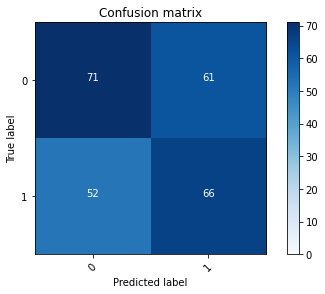

2022-08-20 22:45:03 - [Epoch Train: 64] loss: 0.0026, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 22:45:03 - [Epoch Valid: 64] loss: 3.1989, auc: 0.5405, acc: 0.5480, time: 13.00 s


 64%|█████████████████████████▌              | 64/100 [1:11:27<40:46, 67.95s/it]

2022-08-20 22:45:03 - EPOCH: 65
2022-08-20 22:45:05 - Train Step 10/244, train_loss: 0.0000
2022-08-20 22:45:07 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:45:10 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:45:12 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:45:14 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:45:16 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:45:18 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:45:21 - Train Step 80/244, train_loss: 0.0001
2022-08-20 22:45:23 - Train Step 90/244, train_loss: 0.0001
2022-08-20 22:45:25 - Train Step 100/244, train_loss: 0.0001
2022-08-20 22:45:27 - Train Step 110/244, train_loss: 0.0001
2022-08-20 22:45:29 - Train Step 120/244, train_loss: 0.0001
2022-08-20 22:45:31 - Train Step 130/244, train_loss: 0.0001
2022-08-20 22:45:34 - Train Step 140/244, train_loss: 0.0001
2022-08-20 22:45:36 - Train Step 150/244, train_loss: 0.0001
2022-08-20 22:45:38 - Train Step 160/244, train_loss: 0.0001
2

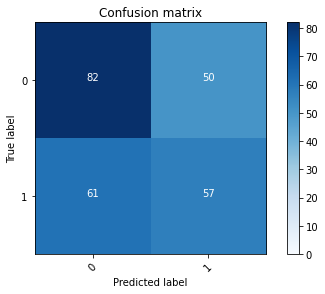

2022-08-20 22:46:10 - [Epoch Train: 65] loss: 0.0030, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 22:46:10 - [Epoch Valid: 65] loss: 3.3373, auc: 0.5444, acc: 0.5560, time: 14.00 s


 65%|██████████████████████████              | 65/100 [1:12:35<39:37, 67.93s/it]

2022-08-20 22:46:10 - EPOCH: 66
2022-08-20 22:46:13 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:46:15 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:46:17 - Train Step 30/244, train_loss: 0.0002
2022-08-20 22:46:20 - Train Step 40/244, train_loss: 0.0002
2022-08-20 22:46:22 - Train Step 50/244, train_loss: 0.0002
2022-08-20 22:46:24 - Train Step 60/244, train_loss: 0.0010
2022-08-20 22:46:26 - Train Step 70/244, train_loss: 0.0009
2022-08-20 22:46:29 - Train Step 80/244, train_loss: 0.0008
2022-08-20 22:46:31 - Train Step 90/244, train_loss: 0.0007
2022-08-20 22:46:33 - Train Step 100/244, train_loss: 0.0006
2022-08-20 22:46:35 - Train Step 110/244, train_loss: 0.0006
2022-08-20 22:46:38 - Train Step 120/244, train_loss: 0.0006
2022-08-20 22:46:40 - Train Step 130/244, train_loss: 0.0023
2022-08-20 22:46:42 - Train Step 140/244, train_loss: 0.0021
2022-08-20 22:46:44 - Train Step 150/244, train_loss: 0.0020
2022-08-20 22:46:47 - Train Step 160/244, train_loss: 0.0019
2

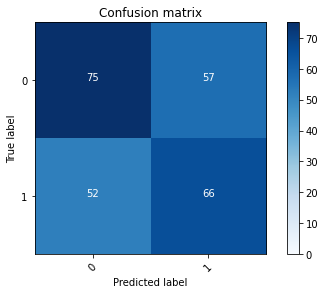

2022-08-20 22:47:20 - [Epoch Train: 66] loss: 0.0013, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 22:47:20 - [Epoch Valid: 66] loss: 3.1933, auc: 0.5474, acc: 0.5640, time: 14.00 s


 66%|██████████████████████████▍             | 66/100 [1:13:44<38:41, 68.29s/it]

2022-08-20 22:47:20 - EPOCH: 67
2022-08-20 22:47:22 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:47:24 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:47:26 - Train Step 30/244, train_loss: 0.0057
2022-08-20 22:47:28 - Train Step 40/244, train_loss: 0.0043
2022-08-20 22:47:30 - Train Step 50/244, train_loss: 0.0035
2022-08-20 22:47:32 - Train Step 60/244, train_loss: 0.0029
2022-08-20 22:47:34 - Train Step 70/244, train_loss: 0.0097
2022-08-20 22:47:36 - Train Step 80/244, train_loss: 0.0085
2022-08-20 22:47:38 - Train Step 90/244, train_loss: 0.0076
2022-08-20 22:47:40 - Train Step 100/244, train_loss: 0.0069
2022-08-20 22:47:42 - Train Step 110/244, train_loss: 0.0062
2022-08-20 22:47:44 - Train Step 120/244, train_loss: 0.0057
2022-08-20 22:47:46 - Train Step 130/244, train_loss: 0.0053
2022-08-20 22:47:48 - Train Step 140/244, train_loss: 0.0049
2022-08-20 22:47:50 - Train Step 150/244, train_loss: 0.0046
2022-08-20 22:47:53 - Train Step 160/244, train_loss: 0.0043
2

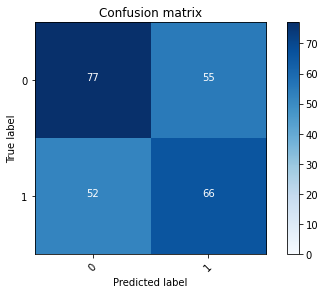

2022-08-20 22:48:24 - [Epoch Train: 67] loss: 0.0029, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 22:48:24 - [Epoch Valid: 67] loss: 3.2876, auc: 0.5483, acc: 0.5720, time: 14.00 s


 67%|██████████████████████████▊             | 67/100 [1:14:49<36:58, 67.23s/it]

2022-08-20 22:48:24 - EPOCH: 68
2022-08-20 22:48:27 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:48:29 - Train Step 20/244, train_loss: 0.0101
2022-08-20 22:48:31 - Train Step 30/244, train_loss: 0.0067
2022-08-20 22:48:34 - Train Step 40/244, train_loss: 0.0051
2022-08-20 22:48:36 - Train Step 50/244, train_loss: 0.0041
2022-08-20 22:48:38 - Train Step 60/244, train_loss: 0.0034
2022-08-20 22:48:41 - Train Step 70/244, train_loss: 0.0030
2022-08-20 22:48:43 - Train Step 80/244, train_loss: 0.0026
2022-08-20 22:48:45 - Train Step 90/244, train_loss: 0.0064
2022-08-20 22:48:47 - Train Step 100/244, train_loss: 0.0057
2022-08-20 22:48:49 - Train Step 110/244, train_loss: 0.0052
2022-08-20 22:48:51 - Train Step 120/244, train_loss: 0.0048
2022-08-20 22:48:54 - Train Step 130/244, train_loss: 0.0044
2022-08-20 22:48:56 - Train Step 140/244, train_loss: 0.0041
2022-08-20 22:48:58 - Train Step 150/244, train_loss: 0.0038
2022-08-20 22:49:00 - Train Step 160/244, train_loss: 0.0036
2

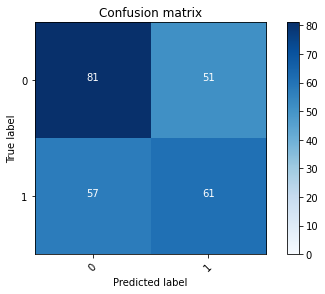

2022-08-20 22:49:33 - [Epoch Train: 68] loss: 0.0024, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:49:33 - [Epoch Valid: 68] loss: 3.2261, auc: 0.5583, acc: 0.5680, time: 13.00 s


 68%|███████████████████████████▏            | 68/100 [1:15:57<36:01, 67.56s/it]

2022-08-20 22:49:33 - EPOCH: 69
2022-08-20 22:49:35 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:49:37 - Train Step 20/244, train_loss: 0.0153
2022-08-20 22:49:40 - Train Step 30/244, train_loss: 0.0102
2022-08-20 22:49:42 - Train Step 40/244, train_loss: 0.0077
2022-08-20 22:49:44 - Train Step 50/244, train_loss: 0.0062
2022-08-20 22:49:47 - Train Step 60/244, train_loss: 0.0051
2022-08-20 22:49:49 - Train Step 70/244, train_loss: 0.0044
2022-08-20 22:49:51 - Train Step 80/244, train_loss: 0.0039
2022-08-20 22:49:53 - Train Step 90/244, train_loss: 0.0035
2022-08-20 22:49:56 - Train Step 100/244, train_loss: 0.0031
2022-08-20 22:49:58 - Train Step 110/244, train_loss: 0.0029
2022-08-20 22:50:00 - Train Step 120/244, train_loss: 0.0026
2022-08-20 22:50:02 - Train Step 130/244, train_loss: 0.0024
2022-08-20 22:50:05 - Train Step 140/244, train_loss: 0.0023
2022-08-20 22:50:07 - Train Step 150/244, train_loss: 0.0021
2022-08-20 22:50:09 - Train Step 160/244, train_loss: 0.0020
2

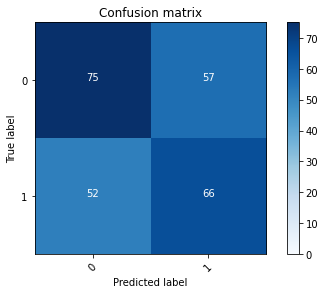

2022-08-20 22:50:42 - [Epoch Train: 69] loss: 0.0013, auc: 1.0000, acc: 0.9990, time: 55.00 s            
2022-08-20 22:50:42 - [Epoch Valid: 69] loss: 3.1788, auc: 0.5517, acc: 0.5640, time: 14.00 s


 69%|███████████████████████████▌            | 69/100 [1:17:07<35:10, 68.07s/it]

2022-08-20 22:50:42 - EPOCH: 70
2022-08-20 22:50:44 - Train Step 10/244, train_loss: 0.0000
2022-08-20 22:50:47 - Train Step 20/244, train_loss: 0.0000
2022-08-20 22:50:49 - Train Step 30/244, train_loss: 0.0062
2022-08-20 22:50:51 - Train Step 40/244, train_loss: 0.0046
2022-08-20 22:50:53 - Train Step 50/244, train_loss: 0.0037
2022-08-20 22:50:56 - Train Step 60/244, train_loss: 0.0032
2022-08-20 22:50:58 - Train Step 70/244, train_loss: 0.0027
2022-08-20 22:51:00 - Train Step 80/244, train_loss: 0.0024
2022-08-20 22:51:02 - Train Step 90/244, train_loss: 0.0021
2022-08-20 22:51:04 - Train Step 100/244, train_loss: 0.0019
2022-08-20 22:51:07 - Train Step 110/244, train_loss: 0.0018
2022-08-20 22:51:09 - Train Step 120/244, train_loss: 0.0016
2022-08-20 22:51:11 - Train Step 130/244, train_loss: 0.0034
2022-08-20 22:51:13 - Train Step 140/244, train_loss: 0.0032
2022-08-20 22:51:16 - Train Step 150/244, train_loss: 0.0030
2022-08-20 22:51:18 - Train Step 160/244, train_loss: 0.0029
2

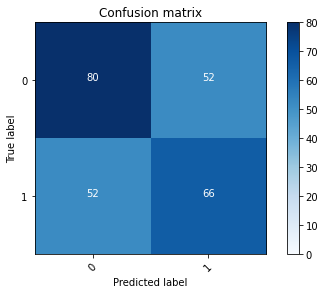

2022-08-20 22:51:51 - [Epoch Train: 70] loss: 0.0019, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:51:51 - [Epoch Valid: 70] loss: 3.1129, auc: 0.5604, acc: 0.5840, time: 14.00 s
2022-08-20 22:51:51 - acc improved from 0.5800 to 0.5840. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e70-loss3.113-acc0.584-auc0.560.pth'


 70%|████████████████████████████            | 70/100 [1:18:15<34:09, 68.32s/it]

2022-08-20 22:51:51 - EPOCH: 71
2022-08-20 22:51:53 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:51:56 - Train Step 20/244, train_loss: 0.0000
2022-08-20 22:51:58 - Train Step 30/244, train_loss: 0.0000
2022-08-20 22:52:00 - Train Step 40/244, train_loss: 0.0000
2022-08-20 22:52:02 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:52:04 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:52:07 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:52:09 - Train Step 80/244, train_loss: 0.0001
2022-08-20 22:52:11 - Train Step 90/244, train_loss: 0.0001
2022-08-20 22:52:13 - Train Step 100/244, train_loss: 0.0001
2022-08-20 22:52:15 - Train Step 110/244, train_loss: 0.0001
2022-08-20 22:52:17 - Train Step 120/244, train_loss: 0.0001
2022-08-20 22:52:20 - Train Step 130/244, train_loss: 0.0001
2022-08-20 22:52:22 - Train Step 140/244, train_loss: 0.0001
2022-08-20 22:52:24 - Train Step 150/244, train_loss: 0.0001
2022-08-20 22:52:26 - Train Step 160/244, train_loss: 0.0001
2

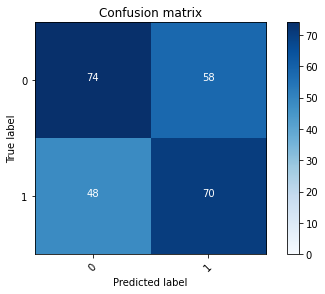

2022-08-20 22:52:59 - [Epoch Train: 71] loss: 0.0020, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 22:52:59 - [Epoch Valid: 71] loss: 3.4867, auc: 0.5546, acc: 0.5760, time: 14.00 s


 71%|████████████████████████████▍           | 71/100 [1:19:23<32:57, 68.20s/it]

2022-08-20 22:52:59 - EPOCH: 72
2022-08-20 22:53:01 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:53:03 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:53:06 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:53:08 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:53:10 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:53:12 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:53:15 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:53:17 - Train Step 80/244, train_loss: 0.0036
2022-08-20 22:53:19 - Train Step 90/244, train_loss: 0.0032
2022-08-20 22:53:21 - Train Step 100/244, train_loss: 0.0029
2022-08-20 22:53:23 - Train Step 110/244, train_loss: 0.0027
2022-08-20 22:53:25 - Train Step 120/244, train_loss: 0.0024
2022-08-20 22:53:27 - Train Step 130/244, train_loss: 0.0023
2022-08-20 22:53:30 - Train Step 140/244, train_loss: 0.0021
2022-08-20 22:53:32 - Train Step 150/244, train_loss: 0.0020
2022-08-20 22:53:34 - Train Step 160/244, train_loss: 0.0042
2

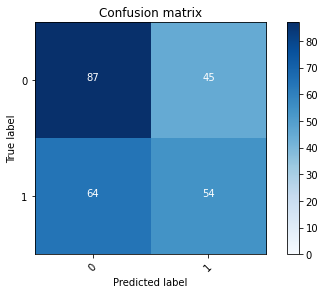

2022-08-20 22:54:06 - [Epoch Train: 72] loss: 0.0028, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 22:54:06 - [Epoch Valid: 72] loss: 3.3223, auc: 0.5598, acc: 0.5640, time: 14.00 s


 72%|████████████████████████████▊           | 72/100 [1:20:31<31:44, 68.03s/it]

2022-08-20 22:54:06 - EPOCH: 73
2022-08-20 22:54:09 - Train Step 10/244, train_loss: 0.0153
2022-08-20 22:54:11 - Train Step 20/244, train_loss: 0.0077
2022-08-20 22:54:13 - Train Step 30/244, train_loss: 0.0052
2022-08-20 22:54:15 - Train Step 40/244, train_loss: 0.0039
2022-08-20 22:54:17 - Train Step 50/244, train_loss: 0.0031
2022-08-20 22:54:19 - Train Step 60/244, train_loss: 0.0026
2022-08-20 22:54:21 - Train Step 70/244, train_loss: 0.0022
2022-08-20 22:54:23 - Train Step 80/244, train_loss: 0.0020
2022-08-20 22:54:25 - Train Step 90/244, train_loss: 0.0017
2022-08-20 22:54:28 - Train Step 100/244, train_loss: 0.0016
2022-08-20 22:54:30 - Train Step 110/244, train_loss: 0.0014
2022-08-20 22:54:32 - Train Step 120/244, train_loss: 0.0013
2022-08-20 22:54:34 - Train Step 130/244, train_loss: 0.0012
2022-08-20 22:54:36 - Train Step 140/244, train_loss: 0.0011
2022-08-20 22:54:38 - Train Step 150/244, train_loss: 0.0011
2022-08-20 22:54:40 - Train Step 160/244, train_loss: 0.0010
2

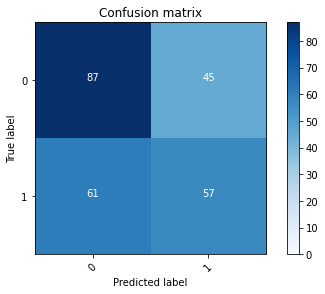

2022-08-20 22:55:11 - [Epoch Train: 73] loss: 0.0020, auc: 1.0000, acc: 0.9979, time: 51.00 s            
2022-08-20 22:55:11 - [Epoch Valid: 73] loss: 3.3392, auc: 0.5597, acc: 0.5760, time: 13.00 s


 73%|█████████████████████████████▏          | 73/100 [1:21:36<30:10, 67.05s/it]

2022-08-20 22:55:11 - EPOCH: 74
2022-08-20 22:55:14 - Train Step 10/244, train_loss: 0.0000
2022-08-20 22:55:16 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:55:18 - Train Step 30/244, train_loss: 0.0059
2022-08-20 22:55:20 - Train Step 40/244, train_loss: 0.0045
2022-08-20 22:55:22 - Train Step 50/244, train_loss: 0.0036
2022-08-20 22:55:25 - Train Step 60/244, train_loss: 0.0077
2022-08-20 22:55:27 - Train Step 70/244, train_loss: 0.0066
2022-08-20 22:55:29 - Train Step 80/244, train_loss: 0.0058
2022-08-20 22:55:31 - Train Step 90/244, train_loss: 0.0052
2022-08-20 22:55:33 - Train Step 100/244, train_loss: 0.0046
2022-08-20 22:55:36 - Train Step 110/244, train_loss: 0.0042
2022-08-20 22:55:38 - Train Step 120/244, train_loss: 0.0039
2022-08-20 22:55:40 - Train Step 130/244, train_loss: 0.0036
2022-08-20 22:55:42 - Train Step 140/244, train_loss: 0.0034
2022-08-20 22:55:44 - Train Step 150/244, train_loss: 0.0031
2022-08-20 22:55:46 - Train Step 160/244, train_loss: 0.0029
2

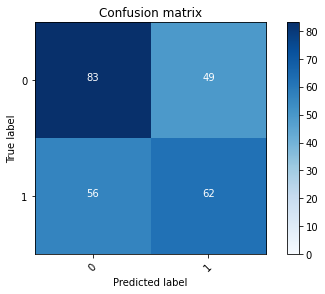

2022-08-20 22:56:19 - [Epoch Train: 74] loss: 0.0020, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 22:56:19 - [Epoch Valid: 74] loss: 3.0811, auc: 0.5701, acc: 0.5800, time: 14.00 s


 74%|█████████████████████████████▌          | 74/100 [1:22:43<29:07, 67.22s/it]

2022-08-20 22:56:19 - EPOCH: 75
2022-08-20 22:56:21 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:56:23 - Train Step 20/244, train_loss: 0.0000
2022-08-20 22:56:25 - Train Step 30/244, train_loss: 0.0000
2022-08-20 22:56:27 - Train Step 40/244, train_loss: 0.0000
2022-08-20 22:56:29 - Train Step 50/244, train_loss: 0.0000
2022-08-20 22:56:31 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:56:34 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:56:36 - Train Step 80/244, train_loss: 0.0001
2022-08-20 22:56:38 - Train Step 90/244, train_loss: 0.0001
2022-08-20 22:56:40 - Train Step 100/244, train_loss: 0.0001
2022-08-20 22:56:42 - Train Step 110/244, train_loss: 0.0001
2022-08-20 22:56:44 - Train Step 120/244, train_loss: 0.0001
2022-08-20 22:56:46 - Train Step 130/244, train_loss: 0.0001
2022-08-20 22:56:48 - Train Step 140/244, train_loss: 0.0001
2022-08-20 22:56:50 - Train Step 150/244, train_loss: 0.0001
2022-08-20 22:56:52 - Train Step 160/244, train_loss: 0.0001
2

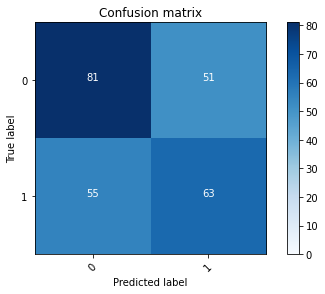

2022-08-20 22:57:24 - [Epoch Train: 75] loss: 0.0023, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 22:57:24 - [Epoch Valid: 75] loss: 3.3880, auc: 0.5716, acc: 0.5760, time: 14.00 s


 75%|██████████████████████████████          | 75/100 [1:23:49<27:47, 66.70s/it]

2022-08-20 22:57:24 - EPOCH: 76
2022-08-20 22:57:27 - Train Step 10/244, train_loss: 0.0000
2022-08-20 22:57:29 - Train Step 20/244, train_loss: 0.0000
2022-08-20 22:57:31 - Train Step 30/244, train_loss: 0.0000
2022-08-20 22:57:33 - Train Step 40/244, train_loss: 0.0000
2022-08-20 22:57:35 - Train Step 50/244, train_loss: 0.0027
2022-08-20 22:57:38 - Train Step 60/244, train_loss: 0.0023
2022-08-20 22:57:40 - Train Step 70/244, train_loss: 0.0020
2022-08-20 22:57:42 - Train Step 80/244, train_loss: 0.0017
2022-08-20 22:57:45 - Train Step 90/244, train_loss: 0.0053
2022-08-20 22:57:47 - Train Step 100/244, train_loss: 0.0048
2022-08-20 22:57:49 - Train Step 110/244, train_loss: 0.0043
2022-08-20 22:57:51 - Train Step 120/244, train_loss: 0.0040
2022-08-20 22:57:53 - Train Step 130/244, train_loss: 0.0037
2022-08-20 22:57:56 - Train Step 140/244, train_loss: 0.0034
2022-08-20 22:57:58 - Train Step 150/244, train_loss: 0.0032
2022-08-20 22:58:00 - Train Step 160/244, train_loss: 0.0030
2

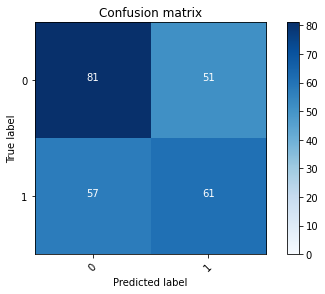

2022-08-20 22:58:32 - [Epoch Train: 76] loss: 0.0020, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:58:32 - [Epoch Valid: 76] loss: 3.1024, auc: 0.5658, acc: 0.5680, time: 13.00 s


 76%|██████████████████████████████▍         | 76/100 [1:24:57<26:48, 67.01s/it]

2022-08-20 22:58:32 - EPOCH: 77
2022-08-20 22:58:35 - Train Step 10/244, train_loss: 0.0001
2022-08-20 22:58:37 - Train Step 20/244, train_loss: 0.0001
2022-08-20 22:58:39 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:58:41 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:58:43 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:58:45 - Train Step 60/244, train_loss: 0.0001
2022-08-20 22:58:48 - Train Step 70/244, train_loss: 0.0001
2022-08-20 22:58:50 - Train Step 80/244, train_loss: 0.0001
2022-08-20 22:58:52 - Train Step 90/244, train_loss: 0.0001
2022-08-20 22:58:54 - Train Step 100/244, train_loss: 0.0001
2022-08-20 22:58:57 - Train Step 110/244, train_loss: 0.0017
2022-08-20 22:58:59 - Train Step 120/244, train_loss: 0.0016
2022-08-20 22:59:01 - Train Step 130/244, train_loss: 0.0015
2022-08-20 22:59:03 - Train Step 140/244, train_loss: 0.0014
2022-08-20 22:59:05 - Train Step 150/244, train_loss: 0.0013
2022-08-20 22:59:08 - Train Step 160/244, train_loss: 0.0012
2

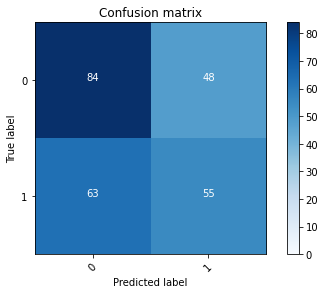

2022-08-20 22:59:39 - [Epoch Train: 77] loss: 0.0020, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 22:59:39 - [Epoch Valid: 77] loss: 3.3125, auc: 0.5662, acc: 0.5560, time: 13.00 s


 77%|██████████████████████████████▊         | 77/100 [1:26:04<25:43, 67.10s/it]

2022-08-20 22:59:39 - EPOCH: 78
2022-08-20 22:59:42 - Train Step 10/244, train_loss: 0.0000
2022-08-20 22:59:44 - Train Step 20/244, train_loss: 0.0000
2022-08-20 22:59:46 - Train Step 30/244, train_loss: 0.0001
2022-08-20 22:59:48 - Train Step 40/244, train_loss: 0.0001
2022-08-20 22:59:50 - Train Step 50/244, train_loss: 0.0001
2022-08-20 22:59:52 - Train Step 60/244, train_loss: 0.0087
2022-08-20 22:59:54 - Train Step 70/244, train_loss: 0.0075
2022-08-20 22:59:56 - Train Step 80/244, train_loss: 0.0077
2022-08-20 22:59:58 - Train Step 90/244, train_loss: 0.0069
2022-08-20 23:00:00 - Train Step 100/244, train_loss: 0.0062
2022-08-20 23:00:03 - Train Step 110/244, train_loss: 0.0056
2022-08-20 23:00:05 - Train Step 120/244, train_loss: 0.0052
2022-08-20 23:00:07 - Train Step 130/244, train_loss: 0.0048
2022-08-20 23:00:09 - Train Step 140/244, train_loss: 0.0045
2022-08-20 23:00:11 - Train Step 150/244, train_loss: 0.0042
2022-08-20 23:00:13 - Train Step 160/244, train_loss: 0.0039
2

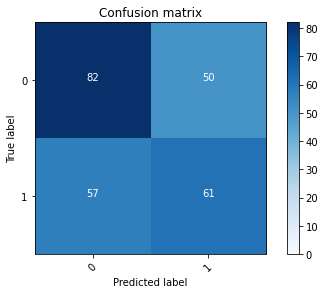

2022-08-20 23:00:44 - [Epoch Train: 78] loss: 0.0026, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 23:00:44 - [Epoch Valid: 78] loss: 3.3706, auc: 0.5610, acc: 0.5720, time: 13.00 s


 78%|███████████████████████████████▏        | 78/100 [1:27:09<24:19, 66.35s/it]

2022-08-20 23:00:44 - EPOCH: 79
2022-08-20 23:00:46 - Train Step 10/244, train_loss: 0.0206
2022-08-20 23:00:49 - Train Step 20/244, train_loss: 0.0104
2022-08-20 23:00:51 - Train Step 30/244, train_loss: 0.0069
2022-08-20 23:00:53 - Train Step 40/244, train_loss: 0.0052
2022-08-20 23:00:55 - Train Step 50/244, train_loss: 0.0042
2022-08-20 23:00:58 - Train Step 60/244, train_loss: 0.0035
2022-08-20 23:01:00 - Train Step 70/244, train_loss: 0.0031
2022-08-20 23:01:02 - Train Step 80/244, train_loss: 0.0027
2022-08-20 23:01:04 - Train Step 90/244, train_loss: 0.0024
2022-08-20 23:01:06 - Train Step 100/244, train_loss: 0.0022
2022-08-20 23:01:09 - Train Step 110/244, train_loss: 0.0020
2022-08-20 23:01:11 - Train Step 120/244, train_loss: 0.0018
2022-08-20 23:01:13 - Train Step 130/244, train_loss: 0.0017
2022-08-20 23:01:15 - Train Step 140/244, train_loss: 0.0016
2022-08-20 23:01:18 - Train Step 150/244, train_loss: 0.0015
2022-08-20 23:01:20 - Train Step 160/244, train_loss: 0.0014
2

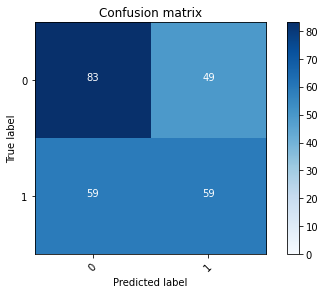

2022-08-20 23:01:52 - [Epoch Train: 79] loss: 0.0016, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 23:01:52 - [Epoch Valid: 79] loss: 3.5747, auc: 0.5624, acc: 0.5680, time: 13.00 s


 79%|███████████████████████████████▌        | 79/100 [1:28:17<23:24, 66.86s/it]

2022-08-20 23:01:52 - EPOCH: 80
2022-08-20 23:01:54 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:01:57 - Train Step 20/244, train_loss: 0.0001
2022-08-20 23:01:59 - Train Step 30/244, train_loss: 0.0000
2022-08-20 23:02:01 - Train Step 40/244, train_loss: 0.0000
2022-08-20 23:02:03 - Train Step 50/244, train_loss: 0.0000
2022-08-20 23:02:05 - Train Step 60/244, train_loss: 0.0000
2022-08-20 23:02:08 - Train Step 70/244, train_loss: 0.0000
2022-08-20 23:02:10 - Train Step 80/244, train_loss: 0.0000
2022-08-20 23:02:12 - Train Step 90/244, train_loss: 0.0000
2022-08-20 23:02:14 - Train Step 100/244, train_loss: 0.0015
2022-08-20 23:02:16 - Train Step 110/244, train_loss: 0.0014
2022-08-20 23:02:19 - Train Step 120/244, train_loss: 0.0013
2022-08-20 23:02:21 - Train Step 130/244, train_loss: 0.0012
2022-08-20 23:02:23 - Train Step 140/244, train_loss: 0.0011
2022-08-20 23:02:25 - Train Step 150/244, train_loss: 0.0010
2022-08-20 23:02:28 - Train Step 160/244, train_loss: 0.0010
2

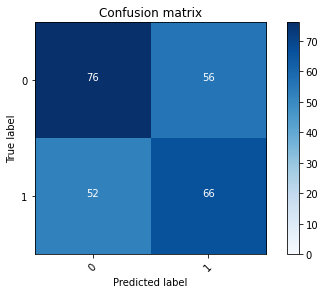

2022-08-20 23:02:59 - [Epoch Train: 80] loss: 0.0023, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 23:02:59 - [Epoch Valid: 80] loss: 3.4580, auc: 0.5591, acc: 0.5680, time: 13.00 s


 80%|████████████████████████████████        | 80/100 [1:29:24<22:20, 67.03s/it]

2022-08-20 23:02:59 - EPOCH: 81
2022-08-20 23:03:02 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:03:04 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:03:06 - Train Step 30/244, train_loss: 0.0058
2022-08-20 23:03:09 - Train Step 40/244, train_loss: 0.0043
2022-08-20 23:03:11 - Train Step 50/244, train_loss: 0.0035
2022-08-20 23:03:13 - Train Step 60/244, train_loss: 0.0029
2022-08-20 23:03:15 - Train Step 70/244, train_loss: 0.0025
2022-08-20 23:03:18 - Train Step 80/244, train_loss: 0.0022
2022-08-20 23:03:20 - Train Step 90/244, train_loss: 0.0020
2022-08-20 23:03:22 - Train Step 100/244, train_loss: 0.0019
2022-08-20 23:03:24 - Train Step 110/244, train_loss: 0.0017
2022-08-20 23:03:27 - Train Step 120/244, train_loss: 0.0016
2022-08-20 23:03:29 - Train Step 130/244, train_loss: 0.0014
2022-08-20 23:03:31 - Train Step 140/244, train_loss: 0.0013
2022-08-20 23:03:33 - Train Step 150/244, train_loss: 0.0013
2022-08-20 23:03:35 - Train Step 160/244, train_loss: 0.0012
2

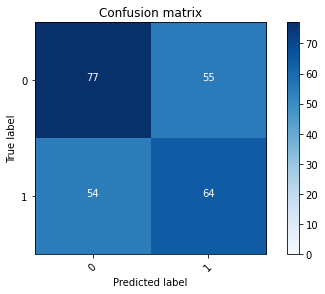

2022-08-20 23:04:08 - [Epoch Train: 81] loss: 0.0021, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 23:04:08 - [Epoch Valid: 81] loss: 3.2390, auc: 0.5672, acc: 0.5640, time: 14.00 s


 81%|████████████████████████████████▍       | 81/100 [1:30:32<21:20, 67.42s/it]

2022-08-20 23:04:08 - EPOCH: 82
2022-08-20 23:04:10 - Train Step 10/244, train_loss: 0.0001
2022-08-20 23:04:12 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:04:15 - Train Step 30/244, train_loss: 0.0001
2022-08-20 23:04:17 - Train Step 40/244, train_loss: 0.0001
2022-08-20 23:04:19 - Train Step 50/244, train_loss: 0.0005
2022-08-20 23:04:21 - Train Step 60/244, train_loss: 0.0004
2022-08-20 23:04:23 - Train Step 70/244, train_loss: 0.0004
2022-08-20 23:04:25 - Train Step 80/244, train_loss: 0.0004
2022-08-20 23:04:28 - Train Step 90/244, train_loss: 0.0003
2022-08-20 23:04:30 - Train Step 100/244, train_loss: 0.0003
2022-08-20 23:04:32 - Train Step 110/244, train_loss: 0.0003
2022-08-20 23:04:34 - Train Step 120/244, train_loss: 0.0003
2022-08-20 23:04:36 - Train Step 130/244, train_loss: 0.0003
2022-08-20 23:04:39 - Train Step 140/244, train_loss: 0.0003
2022-08-20 23:04:41 - Train Step 150/244, train_loss: 0.0003
2022-08-20 23:04:43 - Train Step 160/244, train_loss: 0.0002
2

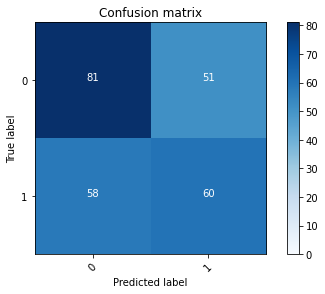

2022-08-20 23:05:14 - [Epoch Train: 82] loss: 0.0030, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 23:05:14 - [Epoch Valid: 82] loss: 3.2280, auc: 0.5709, acc: 0.5640, time: 13.00 s


 82%|████████████████████████████████▊       | 82/100 [1:31:39<20:07, 67.07s/it]

2022-08-20 23:05:14 - EPOCH: 83
2022-08-20 23:05:16 - Train Step 10/244, train_loss: 0.0001
2022-08-20 23:05:18 - Train Step 20/244, train_loss: 0.0001
2022-08-20 23:05:20 - Train Step 30/244, train_loss: 0.0001
2022-08-20 23:05:22 - Train Step 40/244, train_loss: 0.0001
2022-08-20 23:05:24 - Train Step 50/244, train_loss: 0.0001
2022-08-20 23:05:27 - Train Step 60/244, train_loss: 0.0001
2022-08-20 23:05:29 - Train Step 70/244, train_loss: 0.0001
2022-08-20 23:05:31 - Train Step 80/244, train_loss: 0.0001
2022-08-20 23:05:33 - Train Step 90/244, train_loss: 0.0001
2022-08-20 23:05:35 - Train Step 100/244, train_loss: 0.0001
2022-08-20 23:05:37 - Train Step 110/244, train_loss: 0.0001
2022-08-20 23:05:39 - Train Step 120/244, train_loss: 0.0001
2022-08-20 23:05:41 - Train Step 130/244, train_loss: 0.0001
2022-08-20 23:05:43 - Train Step 140/244, train_loss: 0.0001
2022-08-20 23:05:45 - Train Step 150/244, train_loss: 0.0009
2022-08-20 23:05:47 - Train Step 160/244, train_loss: 0.0032
2

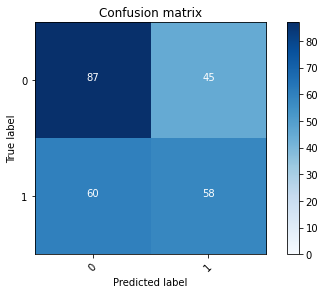

2022-08-20 23:06:18 - [Epoch Train: 83] loss: 0.0022, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 23:06:18 - [Epoch Valid: 83] loss: 3.3207, auc: 0.5759, acc: 0.5800, time: 14.00 s


 83%|█████████████████████████████████▏      | 83/100 [1:32:43<18:46, 66.28s/it]

2022-08-20 23:06:18 - EPOCH: 84
2022-08-20 23:06:21 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:06:23 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:06:25 - Train Step 30/244, train_loss: 0.0000
2022-08-20 23:06:27 - Train Step 40/244, train_loss: 0.0001
2022-08-20 23:06:30 - Train Step 50/244, train_loss: 0.0001
2022-08-20 23:06:32 - Train Step 60/244, train_loss: 0.0001
2022-08-20 23:06:34 - Train Step 70/244, train_loss: 0.0001
2022-08-20 23:06:36 - Train Step 80/244, train_loss: 0.0001
2022-08-20 23:06:39 - Train Step 90/244, train_loss: 0.0001
2022-08-20 23:06:41 - Train Step 100/244, train_loss: 0.0001
2022-08-20 23:06:43 - Train Step 110/244, train_loss: 0.0001
2022-08-20 23:06:45 - Train Step 120/244, train_loss: 0.0001
2022-08-20 23:06:47 - Train Step 130/244, train_loss: 0.0001
2022-08-20 23:06:50 - Train Step 140/244, train_loss: 0.0001
2022-08-20 23:06:52 - Train Step 150/244, train_loss: 0.0023
2022-08-20 23:06:54 - Train Step 160/244, train_loss: 0.0021
2

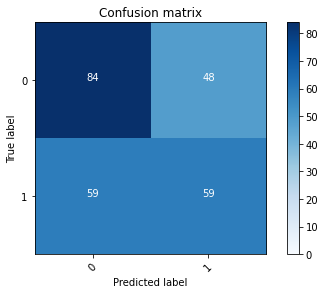

2022-08-20 23:07:26 - [Epoch Train: 84] loss: 0.0014, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 23:07:26 - [Epoch Valid: 84] loss: 3.2523, auc: 0.5723, acc: 0.5720, time: 13.00 s


 84%|█████████████████████████████████▌      | 84/100 [1:33:50<17:44, 66.53s/it]

2022-08-20 23:07:26 - EPOCH: 85
2022-08-20 23:07:28 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:07:30 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:07:32 - Train Step 30/244, train_loss: 0.0000
2022-08-20 23:07:35 - Train Step 40/244, train_loss: 0.0000
2022-08-20 23:07:37 - Train Step 50/244, train_loss: 0.0000
2022-08-20 23:07:39 - Train Step 60/244, train_loss: 0.0000
2022-08-20 23:07:41 - Train Step 70/244, train_loss: 0.0000
2022-08-20 23:07:43 - Train Step 80/244, train_loss: 0.0000
2022-08-20 23:07:46 - Train Step 90/244, train_loss: 0.0001
2022-08-20 23:07:48 - Train Step 100/244, train_loss: 0.0001
2022-08-20 23:07:50 - Train Step 110/244, train_loss: 0.0001
2022-08-20 23:07:52 - Train Step 120/244, train_loss: 0.0001
2022-08-20 23:07:55 - Train Step 130/244, train_loss: 0.0016
2022-08-20 23:07:57 - Train Step 140/244, train_loss: 0.0015
2022-08-20 23:07:59 - Train Step 150/244, train_loss: 0.0014
2022-08-20 23:08:01 - Train Step 160/244, train_loss: 0.0014
2

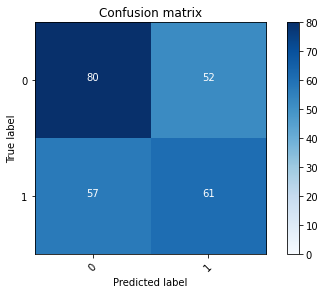

2022-08-20 23:08:34 - [Epoch Train: 85] loss: 0.0021, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 23:08:34 - [Epoch Valid: 85] loss: 3.3269, auc: 0.5752, acc: 0.5640, time: 14.00 s


 85%|██████████████████████████████████      | 85/100 [1:34:59<16:47, 67.20s/it]

2022-08-20 23:08:34 - EPOCH: 86
2022-08-20 23:08:37 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:08:39 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:08:41 - Train Step 30/244, train_loss: 0.0000
2022-08-20 23:08:43 - Train Step 40/244, train_loss: 0.0000
2022-08-20 23:08:45 - Train Step 50/244, train_loss: 0.0000
2022-08-20 23:08:47 - Train Step 60/244, train_loss: 0.0019
2022-08-20 23:08:49 - Train Step 70/244, train_loss: 0.0016
2022-08-20 23:08:51 - Train Step 80/244, train_loss: 0.0014
2022-08-20 23:08:53 - Train Step 90/244, train_loss: 0.0013
2022-08-20 23:08:55 - Train Step 100/244, train_loss: 0.0012
2022-08-20 23:08:57 - Train Step 110/244, train_loss: 0.0010
2022-08-20 23:09:00 - Train Step 120/244, train_loss: 0.0010
2022-08-20 23:09:02 - Train Step 130/244, train_loss: 0.0009
2022-08-20 23:09:04 - Train Step 140/244, train_loss: 0.0008
2022-08-20 23:09:06 - Train Step 150/244, train_loss: 0.0008
2022-08-20 23:09:08 - Train Step 160/244, train_loss: 0.0007
2

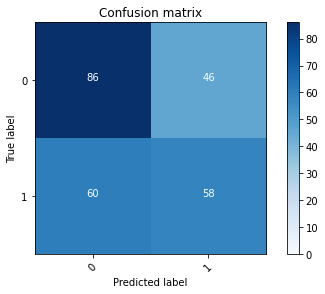

2022-08-20 23:09:38 - [Epoch Train: 86] loss: 0.0018, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 23:09:38 - [Epoch Valid: 86] loss: 3.1638, auc: 0.5665, acc: 0.5760, time: 13.00 s


 86%|██████████████████████████████████▍     | 86/100 [1:36:03<15:27, 66.25s/it]

2022-08-20 23:09:38 - EPOCH: 87
2022-08-20 23:09:41 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:09:43 - Train Step 20/244, train_loss: 0.0001
2022-08-20 23:09:45 - Train Step 30/244, train_loss: 0.0001
2022-08-20 23:09:47 - Train Step 40/244, train_loss: 0.0001
2022-08-20 23:09:50 - Train Step 50/244, train_loss: 0.0001
2022-08-20 23:09:52 - Train Step 60/244, train_loss: 0.0025
2022-08-20 23:09:54 - Train Step 70/244, train_loss: 0.0021
2022-08-20 23:09:56 - Train Step 80/244, train_loss: 0.0019
2022-08-20 23:09:59 - Train Step 90/244, train_loss: 0.0017
2022-08-20 23:10:01 - Train Step 100/244, train_loss: 0.0015
2022-08-20 23:10:03 - Train Step 110/244, train_loss: 0.0014
2022-08-20 23:10:05 - Train Step 120/244, train_loss: 0.0013
2022-08-20 23:10:08 - Train Step 130/244, train_loss: 0.0012
2022-08-20 23:10:10 - Train Step 140/244, train_loss: 0.0011
2022-08-20 23:10:12 - Train Step 150/244, train_loss: 0.0010
2022-08-20 23:10:14 - Train Step 160/244, train_loss: 0.0010
2

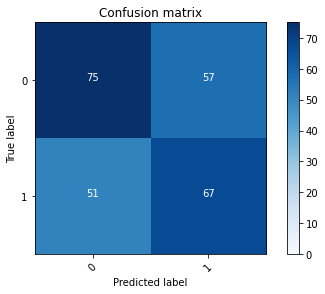

2022-08-20 23:10:47 - [Epoch Train: 87] loss: 0.0027, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 23:10:47 - [Epoch Valid: 87] loss: 3.2894, auc: 0.5721, acc: 0.5680, time: 14.00 s


 87%|██████████████████████████████████▊     | 87/100 [1:37:12<14:31, 67.01s/it]

2022-08-20 23:10:47 - EPOCH: 88
2022-08-20 23:10:49 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:10:51 - Train Step 20/244, train_loss: 0.0001
2022-08-20 23:10:53 - Train Step 30/244, train_loss: 0.0001
2022-08-20 23:10:56 - Train Step 40/244, train_loss: 0.0001
2022-08-20 23:10:58 - Train Step 50/244, train_loss: 0.0001
2022-08-20 23:11:00 - Train Step 60/244, train_loss: 0.0001
2022-08-20 23:11:02 - Train Step 70/244, train_loss: 0.0001
2022-08-20 23:11:04 - Train Step 80/244, train_loss: 0.0001
2022-08-20 23:11:06 - Train Step 90/244, train_loss: 0.0001
2022-08-20 23:11:08 - Train Step 100/244, train_loss: 0.0019
2022-08-20 23:11:10 - Train Step 110/244, train_loss: 0.0017
2022-08-20 23:11:12 - Train Step 120/244, train_loss: 0.0016
2022-08-20 23:11:14 - Train Step 130/244, train_loss: 0.0015
2022-08-20 23:11:16 - Train Step 140/244, train_loss: 0.0014
2022-08-20 23:11:18 - Train Step 150/244, train_loss: 0.0013
2022-08-20 23:11:20 - Train Step 160/244, train_loss: 0.0012
2

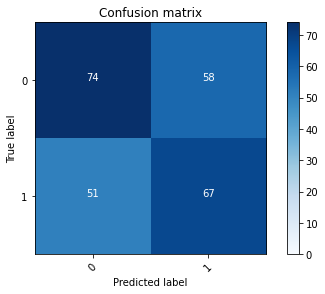

2022-08-20 23:11:50 - [Epoch Train: 88] loss: 0.0018, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 23:11:50 - [Epoch Valid: 88] loss: 3.4656, auc: 0.5677, acc: 0.5640, time: 13.00 s


 88%|███████████████████████████████████▏    | 88/100 [1:38:15<13:11, 65.93s/it]

2022-08-20 23:11:50 - EPOCH: 89
2022-08-20 23:11:53 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:11:55 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:11:57 - Train Step 30/244, train_loss: 0.0000
2022-08-20 23:12:00 - Train Step 40/244, train_loss: 0.0000
2022-08-20 23:12:02 - Train Step 50/244, train_loss: 0.0000
2022-08-20 23:12:04 - Train Step 60/244, train_loss: 0.0000
2022-08-20 23:12:06 - Train Step 70/244, train_loss: 0.0000
2022-08-20 23:12:08 - Train Step 80/244, train_loss: 0.0014
2022-08-20 23:12:10 - Train Step 90/244, train_loss: 0.0013
2022-08-20 23:12:12 - Train Step 100/244, train_loss: 0.0012
2022-08-20 23:12:14 - Train Step 110/244, train_loss: 0.0011
2022-08-20 23:12:17 - Train Step 120/244, train_loss: 0.0010
2022-08-20 23:12:19 - Train Step 130/244, train_loss: 0.0009
2022-08-20 23:12:21 - Train Step 140/244, train_loss: 0.0008
2022-08-20 23:12:23 - Train Step 150/244, train_loss: 0.0008
2022-08-20 23:12:25 - Train Step 160/244, train_loss: 0.0007
2

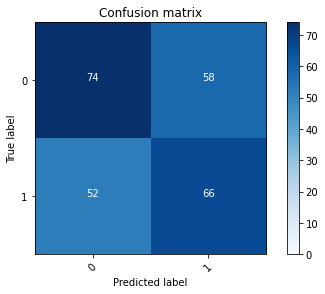

2022-08-20 23:12:57 - [Epoch Train: 89] loss: 0.0012, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 23:12:57 - [Epoch Valid: 89] loss: 3.4856, auc: 0.5747, acc: 0.5600, time: 13.00 s


 89%|███████████████████████████████████▌    | 89/100 [1:39:21<12:05, 66.00s/it]

2022-08-20 23:12:57 - EPOCH: 90
2022-08-20 23:12:59 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:13:01 - Train Step 20/244, train_loss: 0.0001
2022-08-20 23:13:03 - Train Step 30/244, train_loss: 0.0001
2022-08-20 23:13:05 - Train Step 40/244, train_loss: 0.0085
2022-08-20 23:13:07 - Train Step 50/244, train_loss: 0.0068
2022-08-20 23:13:09 - Train Step 60/244, train_loss: 0.0093
2022-08-20 23:13:11 - Train Step 70/244, train_loss: 0.0080
2022-08-20 23:13:13 - Train Step 80/244, train_loss: 0.0070
2022-08-20 23:13:15 - Train Step 90/244, train_loss: 0.0062
2022-08-20 23:13:17 - Train Step 100/244, train_loss: 0.0056
2022-08-20 23:13:19 - Train Step 110/244, train_loss: 0.0051
2022-08-20 23:13:21 - Train Step 120/244, train_loss: 0.0047
2022-08-20 23:13:23 - Train Step 130/244, train_loss: 0.0043
2022-08-20 23:13:25 - Train Step 140/244, train_loss: 0.0040
2022-08-20 23:13:28 - Train Step 150/244, train_loss: 0.0037
2022-08-20 23:13:30 - Train Step 160/244, train_loss: 0.0035
2

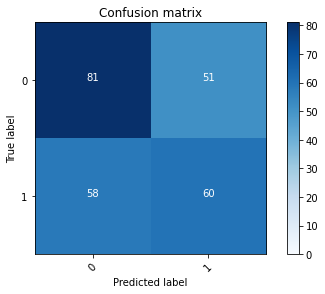

2022-08-20 23:14:01 - [Epoch Train: 90] loss: 0.0023, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 23:14:01 - [Epoch Valid: 90] loss: 3.4160, auc: 0.5756, acc: 0.5640, time: 14.00 s


 90%|████████████████████████████████████    | 90/100 [1:40:26<10:55, 65.59s/it]

2022-08-20 23:14:01 - EPOCH: 91
2022-08-20 23:14:04 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:14:06 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:14:08 - Train Step 30/244, train_loss: 0.0000
2022-08-20 23:14:11 - Train Step 40/244, train_loss: 0.0000
2022-08-20 23:14:13 - Train Step 50/244, train_loss: 0.0000
2022-08-20 23:14:15 - Train Step 60/244, train_loss: 0.0000
2022-08-20 23:14:17 - Train Step 70/244, train_loss: 0.0000
2022-08-20 23:14:19 - Train Step 80/244, train_loss: 0.0000
2022-08-20 23:14:22 - Train Step 90/244, train_loss: 0.0000
2022-08-20 23:14:24 - Train Step 100/244, train_loss: 0.0000
2022-08-20 23:14:26 - Train Step 110/244, train_loss: 0.0000
2022-08-20 23:14:28 - Train Step 120/244, train_loss: 0.0000
2022-08-20 23:14:30 - Train Step 130/244, train_loss: 0.0000
2022-08-20 23:14:32 - Train Step 140/244, train_loss: 0.0000
2022-08-20 23:14:34 - Train Step 150/244, train_loss: 0.0000
2022-08-20 23:14:36 - Train Step 160/244, train_loss: 0.0000
2

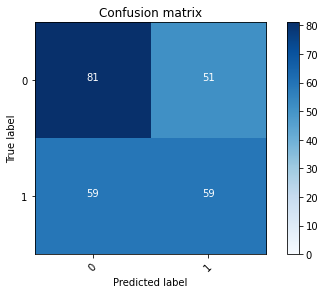

2022-08-20 23:15:09 - [Epoch Train: 91] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 52.00 s            
2022-08-20 23:15:09 - [Epoch Valid: 91] loss: 3.5173, auc: 0.5779, acc: 0.5600, time: 14.00 s


 91%|████████████████████████████████████▍   | 91/100 [1:41:33<09:54, 66.08s/it]

2022-08-20 23:15:09 - EPOCH: 92
2022-08-20 23:15:11 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:15:13 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:15:15 - Train Step 30/244, train_loss: 0.0000
2022-08-20 23:15:17 - Train Step 40/244, train_loss: 0.0000
2022-08-20 23:15:19 - Train Step 50/244, train_loss: 0.0000
2022-08-20 23:15:22 - Train Step 60/244, train_loss: 0.0000
2022-08-20 23:15:24 - Train Step 70/244, train_loss: 0.0015
2022-08-20 23:15:26 - Train Step 80/244, train_loss: 0.0014
2022-08-20 23:15:28 - Train Step 90/244, train_loss: 0.0012
2022-08-20 23:15:30 - Train Step 100/244, train_loss: 0.0011
2022-08-20 23:15:32 - Train Step 110/244, train_loss: 0.0010
2022-08-20 23:15:34 - Train Step 120/244, train_loss: 0.0009
2022-08-20 23:15:36 - Train Step 130/244, train_loss: 0.0035
2022-08-20 23:15:38 - Train Step 140/244, train_loss: 0.0032
2022-08-20 23:15:40 - Train Step 150/244, train_loss: 0.0030
2022-08-20 23:15:42 - Train Step 160/244, train_loss: 0.0028
2

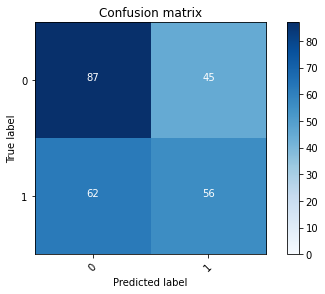

2022-08-20 23:16:14 - [Epoch Train: 92] loss: 0.0019, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 23:16:14 - [Epoch Valid: 92] loss: 3.9418, auc: 0.5772, acc: 0.5720, time: 14.00 s


 92%|████████████████████████████████████▊   | 92/100 [1:42:39<08:47, 65.88s/it]

2022-08-20 23:16:14 - EPOCH: 93
2022-08-20 23:16:16 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:16:19 - Train Step 20/244, train_loss: 0.0169
2022-08-20 23:16:21 - Train Step 30/244, train_loss: 0.0113
2022-08-20 23:16:23 - Train Step 40/244, train_loss: 0.0085
2022-08-20 23:16:25 - Train Step 50/244, train_loss: 0.0068
2022-08-20 23:16:27 - Train Step 60/244, train_loss: 0.0057
2022-08-20 23:16:30 - Train Step 70/244, train_loss: 0.0048
2022-08-20 23:16:32 - Train Step 80/244, train_loss: 0.0042
2022-08-20 23:16:34 - Train Step 90/244, train_loss: 0.0038
2022-08-20 23:16:36 - Train Step 100/244, train_loss: 0.0034
2022-08-20 23:16:38 - Train Step 110/244, train_loss: 0.0031
2022-08-20 23:16:41 - Train Step 120/244, train_loss: 0.0028
2022-08-20 23:16:43 - Train Step 130/244, train_loss: 0.0026
2022-08-20 23:16:45 - Train Step 140/244, train_loss: 0.0024
2022-08-20 23:16:47 - Train Step 150/244, train_loss: 0.0023
2022-08-20 23:16:49 - Train Step 160/244, train_loss: 0.0021
2

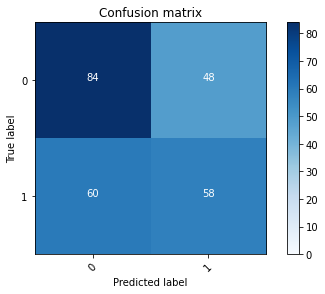

2022-08-20 23:17:22 - [Epoch Train: 93] loss: 0.0014, auc: 1.0000, acc: 0.9990, time: 54.00 s            
2022-08-20 23:17:22 - [Epoch Valid: 93] loss: 3.7749, auc: 0.5659, acc: 0.5680, time: 13.00 s


 93%|█████████████████████████████████████▏  | 93/100 [1:43:46<07:44, 66.40s/it]

2022-08-20 23:17:22 - EPOCH: 94
2022-08-20 23:17:24 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:17:26 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:17:28 - Train Step 30/244, train_loss: 0.0001
2022-08-20 23:17:30 - Train Step 40/244, train_loss: 0.0001
2022-08-20 23:17:32 - Train Step 50/244, train_loss: 0.0047
2022-08-20 23:17:34 - Train Step 60/244, train_loss: 0.0039
2022-08-20 23:17:36 - Train Step 70/244, train_loss: 0.0033
2022-08-20 23:17:38 - Train Step 80/244, train_loss: 0.0029
2022-08-20 23:17:40 - Train Step 90/244, train_loss: 0.0026
2022-08-20 23:17:42 - Train Step 100/244, train_loss: 0.0023
2022-08-20 23:17:45 - Train Step 110/244, train_loss: 0.0069
2022-08-20 23:17:47 - Train Step 120/244, train_loss: 0.0063
2022-08-20 23:17:49 - Train Step 130/244, train_loss: 0.0058
2022-08-20 23:17:51 - Train Step 140/244, train_loss: 0.0054
2022-08-20 23:17:53 - Train Step 150/244, train_loss: 0.0051
2022-08-20 23:17:55 - Train Step 160/244, train_loss: 0.0047
2

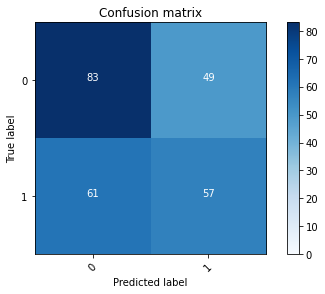

2022-08-20 23:18:27 - [Epoch Train: 94] loss: 0.0031, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 23:18:27 - [Epoch Valid: 94] loss: 3.3465, auc: 0.5662, acc: 0.5600, time: 14.00 s


 94%|█████████████████████████████████████▌  | 94/100 [1:44:51<06:36, 66.02s/it]

2022-08-20 23:18:27 - EPOCH: 95
2022-08-20 23:18:29 - Train Step 10/244, train_loss: 0.0001
2022-08-20 23:18:32 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:18:34 - Train Step 30/244, train_loss: 0.0000
2022-08-20 23:18:36 - Train Step 40/244, train_loss: 0.0000
2022-08-20 23:18:38 - Train Step 50/244, train_loss: 0.0001
2022-08-20 23:18:41 - Train Step 60/244, train_loss: 0.0001
2022-08-20 23:18:43 - Train Step 70/244, train_loss: 0.0001
2022-08-20 23:18:45 - Train Step 80/244, train_loss: 0.0001
2022-08-20 23:18:47 - Train Step 90/244, train_loss: 0.0001
2022-08-20 23:18:50 - Train Step 100/244, train_loss: 0.0001
2022-08-20 23:18:52 - Train Step 110/244, train_loss: 0.0001
2022-08-20 23:18:54 - Train Step 120/244, train_loss: 0.0001
2022-08-20 23:18:56 - Train Step 130/244, train_loss: 0.0001
2022-08-20 23:18:58 - Train Step 140/244, train_loss: 0.0001
2022-08-20 23:19:00 - Train Step 150/244, train_loss: 0.0001
2022-08-20 23:19:03 - Train Step 160/244, train_loss: 0.0013
2

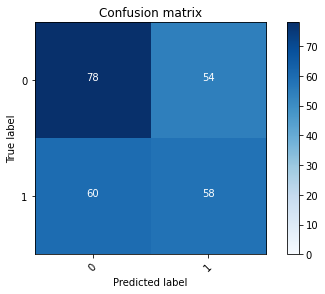

2022-08-20 23:19:34 - [Epoch Train: 95] loss: 0.0024, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 23:19:34 - [Epoch Valid: 95] loss: 3.7704, auc: 0.5619, acc: 0.5440, time: 13.00 s


 95%|██████████████████████████████████████  | 95/100 [1:45:59<05:32, 66.42s/it]

2022-08-20 23:19:34 - EPOCH: 96
2022-08-20 23:19:37 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:19:39 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:19:41 - Train Step 30/244, train_loss: 0.0000
2022-08-20 23:19:43 - Train Step 40/244, train_loss: 0.0122
2022-08-20 23:19:45 - Train Step 50/244, train_loss: 0.0098
2022-08-20 23:19:47 - Train Step 60/244, train_loss: 0.0081
2022-08-20 23:19:50 - Train Step 70/244, train_loss: 0.0070
2022-08-20 23:19:52 - Train Step 80/244, train_loss: 0.0061
2022-08-20 23:19:54 - Train Step 90/244, train_loss: 0.0054
2022-08-20 23:19:56 - Train Step 100/244, train_loss: 0.0049
2022-08-20 23:19:58 - Train Step 110/244, train_loss: 0.0045
2022-08-20 23:20:00 - Train Step 120/244, train_loss: 0.0041
2022-08-20 23:20:02 - Train Step 130/244, train_loss: 0.0038
2022-08-20 23:20:04 - Train Step 140/244, train_loss: 0.0035
2022-08-20 23:20:06 - Train Step 150/244, train_loss: 0.0033
2022-08-20 23:20:08 - Train Step 160/244, train_loss: 0.0031
2

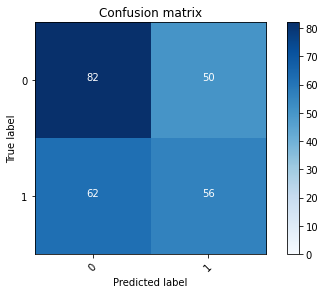

2022-08-20 23:20:39 - [Epoch Train: 96] loss: 0.0035, auc: 1.0000, acc: 0.9979, time: 51.00 s            
2022-08-20 23:20:39 - [Epoch Valid: 96] loss: 3.6475, auc: 0.5686, acc: 0.5520, time: 13.00 s


 96%|██████████████████████████████████████▍ | 96/100 [1:47:03<04:23, 65.94s/it]

2022-08-20 23:20:39 - EPOCH: 97
2022-08-20 23:20:41 - Train Step 10/244, train_loss: 0.0001
2022-08-20 23:20:44 - Train Step 20/244, train_loss: 0.0198
2022-08-20 23:20:46 - Train Step 30/244, train_loss: 0.0132
2022-08-20 23:20:48 - Train Step 40/244, train_loss: 0.0100
2022-08-20 23:20:50 - Train Step 50/244, train_loss: 0.0080
2022-08-20 23:20:52 - Train Step 60/244, train_loss: 0.0067
2022-08-20 23:20:54 - Train Step 70/244, train_loss: 0.0057
2022-08-20 23:20:57 - Train Step 80/244, train_loss: 0.0050
2022-08-20 23:20:59 - Train Step 90/244, train_loss: 0.0045
2022-08-20 23:21:01 - Train Step 100/244, train_loss: 0.0040
2022-08-20 23:21:03 - Train Step 110/244, train_loss: 0.0037
2022-08-20 23:21:05 - Train Step 120/244, train_loss: 0.0034
2022-08-20 23:21:07 - Train Step 130/244, train_loss: 0.0050
2022-08-20 23:21:10 - Train Step 140/244, train_loss: 0.0046
2022-08-20 23:21:12 - Train Step 150/244, train_loss: 0.0043
2022-08-20 23:21:14 - Train Step 160/244, train_loss: 0.0041
2

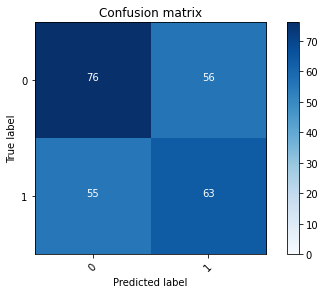

2022-08-20 23:21:46 - [Epoch Train: 97] loss: 0.0027, auc: 1.0000, acc: 0.9979, time: 53.00 s            
2022-08-20 23:21:46 - [Epoch Valid: 97] loss: 3.7590, auc: 0.5607, acc: 0.5560, time: 14.00 s


 97%|██████████████████████████████████████▊ | 97/100 [1:48:11<03:19, 66.39s/it]

2022-08-20 23:21:46 - EPOCH: 98
2022-08-20 23:21:49 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:21:51 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:21:53 - Train Step 30/244, train_loss: 0.0001
2022-08-20 23:21:55 - Train Step 40/244, train_loss: 0.0001
2022-08-20 23:21:58 - Train Step 50/244, train_loss: 0.0001
2022-08-20 23:22:00 - Train Step 60/244, train_loss: 0.0001
2022-08-20 23:22:02 - Train Step 70/244, train_loss: 0.0001
2022-08-20 23:22:04 - Train Step 80/244, train_loss: 0.0026
2022-08-20 23:22:07 - Train Step 90/244, train_loss: 0.0023
2022-08-20 23:22:09 - Train Step 100/244, train_loss: 0.0021
2022-08-20 23:22:11 - Train Step 110/244, train_loss: 0.0019
2022-08-20 23:22:13 - Train Step 120/244, train_loss: 0.0017
2022-08-20 23:22:15 - Train Step 130/244, train_loss: 0.0033
2022-08-20 23:22:17 - Train Step 140/244, train_loss: 0.0031
2022-08-20 23:22:20 - Train Step 150/244, train_loss: 0.0029
2022-08-20 23:22:22 - Train Step 160/244, train_loss: 0.0027
2

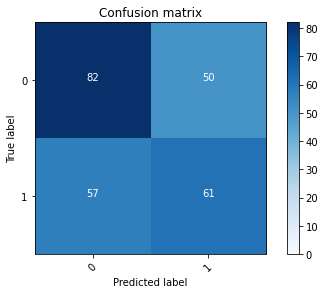

2022-08-20 23:22:53 - [Epoch Train: 98] loss: 0.0018, auc: 1.0000, acc: 0.9990, time: 53.00 s            
2022-08-20 23:22:53 - [Epoch Valid: 98] loss: 3.8509, auc: 0.5600, acc: 0.5720, time: 13.00 s


 98%|███████████████████████████████████████▏| 98/100 [1:49:18<02:13, 66.59s/it]

2022-08-20 23:22:53 - EPOCH: 99
2022-08-20 23:22:56 - Train Step 10/244, train_loss: 0.0000
2022-08-20 23:22:58 - Train Step 20/244, train_loss: 0.0000
2022-08-20 23:23:00 - Train Step 30/244, train_loss: 0.0000
2022-08-20 23:23:03 - Train Step 40/244, train_loss: 0.0000
2022-08-20 23:23:05 - Train Step 50/244, train_loss: 0.0000
2022-08-20 23:23:07 - Train Step 60/244, train_loss: 0.0000
2022-08-20 23:23:09 - Train Step 70/244, train_loss: 0.0000
2022-08-20 23:23:11 - Train Step 80/244, train_loss: 0.0000
2022-08-20 23:23:14 - Train Step 90/244, train_loss: 0.0000
2022-08-20 23:23:16 - Train Step 100/244, train_loss: 0.0000
2022-08-20 23:23:18 - Train Step 110/244, train_loss: 0.0000
2022-08-20 23:23:20 - Train Step 120/244, train_loss: 0.0000
2022-08-20 23:23:22 - Train Step 130/244, train_loss: 0.0000
2022-08-20 23:23:25 - Train Step 140/244, train_loss: 0.0001
2022-08-20 23:23:27 - Train Step 150/244, train_loss: 0.0001
2022-08-20 23:23:29 - Train Step 160/244, train_loss: 0.0014
2

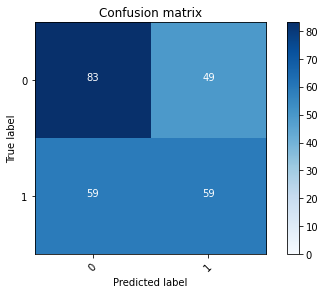

2022-08-20 23:24:02 - [Epoch Train: 99] loss: 0.0029, auc: 1.0000, acc: 0.9979, time: 54.00 s            
2022-08-20 23:24:02 - [Epoch Valid: 99] loss: 3.8774, auc: 0.5546, acc: 0.5680, time: 14.00 s


 99%|███████████████████████████████████████▌| 99/100 [1:50:26<01:07, 67.13s/it]

2022-08-20 23:24:02 - EPOCH: 100
2022-08-20 23:24:04 - Train Step 10/244, train_loss: 0.0001
2022-08-20 23:24:06 - Train Step 20/244, train_loss: 0.0001
2022-08-20 23:24:08 - Train Step 30/244, train_loss: 0.0001
2022-08-20 23:24:10 - Train Step 40/244, train_loss: 0.0001
2022-08-20 23:24:12 - Train Step 50/244, train_loss: 0.0001
2022-08-20 23:24:14 - Train Step 60/244, train_loss: 0.0028
2022-08-20 23:24:16 - Train Step 70/244, train_loss: 0.0057
2022-08-20 23:24:18 - Train Step 80/244, train_loss: 0.0050
2022-08-20 23:24:20 - Train Step 90/244, train_loss: 0.0044
2022-08-20 23:24:22 - Train Step 100/244, train_loss: 0.0040
2022-08-20 23:24:24 - Train Step 110/244, train_loss: 0.0036
2022-08-20 23:24:26 - Train Step 120/244, train_loss: 0.0033
2022-08-20 23:24:28 - Train Step 130/244, train_loss: 0.0031
2022-08-20 23:24:30 - Train Step 140/244, train_loss: 0.0028
2022-08-20 23:24:32 - Train Step 150/244, train_loss: 0.0027
2022-08-20 23:24:34 - Train Step 160/244, train_loss: 0.0025


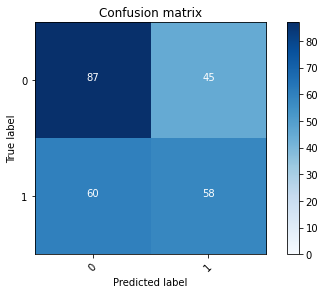

2022-08-20 23:25:04 - [Epoch Train: 100] loss: 0.0018, auc: 1.0000, acc: 0.9990, time: 49.00 s            
2022-08-20 23:25:04 - [Epoch Valid: 100] loss: 3.7559, auc: 0.5623, acc: 0.5800, time: 13.00 s


100%|███████████████████████████████████████| 100/100 [1:51:29<00:00, 66.90s/it]


In [18]:
import importlib
from utils import dataset_utils
importlib.reload(dataset_utils)

for i in range(5):
    print(f"-- FOLD N:{i}")
    to = info["train_origin"]
    print(f"Train origin: {to}")
    packs = dataset_utils.generate_datasets(['KLF'], info, transform, sel_slices, m_path=dir_path, n_path=new_dir_path) #m_path=dir_path, 
    print(packs)
    loader_packs = dataset_utils.get_loaders(packs, info, is_fold=True, fold_num=i)
    print(loader_packs)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    logging.info("Using CUDA...")

    pd.set_option("display.max_rows", None, "display.max_columns", None)
    #print(loader_packs['KLF']['m_dataloaders'])
    selected_type = info["mri_types"][0]
    print(selected_type)
    dataloader = loader_packs[selected_type][f"{to}_dataloaders"]#m_dataloaders[0]
    # Train
    train_loader = dataloader[0]
    # Val
    val_loader = dataloader[1]

    m_model = try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])

    print(info)
    m_modelfile = train_mri_type(m_model, device, info, epochs=100, pat=100, 
                           train_loader=train_loader, valid_loader=val_loader)

../RSNA-BTC-Datasets/out_models/fold0_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_13-42-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e17-loss2.071-acc0.566-auc0.568.pth
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAClassifierSingle3D'}
-- FOLD N:0
Train origin: mn
Type: KLF
2022-08-20 23:43:55 - (M0) Train/Val datasets size: 270
2022-08-20 23:43:55 - (M1) Train/Val datasets size: 303
2022-08-20 23:43:55 - (N0) Train/Val datasets size: 170
2022-08-20 23:43:55 - (N1) Train/Val datasets size: 121
2022-08-20 23:43:55 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 23:43:55 - (MN0) Train/Val datasets size: 540
2022-08-20 23:43:55 - Concatenating M1 and N1...
Length of concatenated 

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 6, 7, 9, 10, 11, 13, 14, 15, 17, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 117, 118, 120, 121, 122, 123, 125, 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 139, 140, 141, 142, 143, 145, 146, 148, 149, 150, 152, 153, 154, 155, 157, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 174, 175, 178, 180, 181, 182, 183, 184, 185, 186, 187, 188, 190, 191, 192, 193, 194, 195, 197, 198, 200, 201, 202, 203, 204, 205, 208, 209, 211, 213, 215, 216, 217, 218, 219, 220, 221, 222, 223, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 238, 240, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d8418310>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8c0f3d0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9e56762b0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ffa5c5c54c0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9ed1dd4c0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d832ef10>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d832eaf0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8d996d0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8d99190>]}}
2022-08-20 23:51:16 - Using CUDA...
KLF

PREDICTIONS:
fold0_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_13-42-35
2022-08-20 23:51:16 - Predict: ../RSNA-BTC-Datasets/out_models/fold0_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_13-42-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e17-loss2.071-acc0.566-auc0.568.pth 1212
Dataset: Labeled Test

../RSNA-BTC-Datasets/out_models/fold1_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_15-38-50/RSNAClassifierSingle3D-DW-SO-KLF-mn-e13-loss1.595-acc0.608-auc0.614.pth
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAClassifierSingle3D'}
-- FOLD N:1
Train origin: mn
Type: KLF
2022-08-20 23:51:34 - (M0) Train/Val datasets size: 270
2022-08-20 23:51:34 - (M1) Train/Val datasets size: 303
2022-08-20 23:51:34 - (N0) Train/Val datasets size: 170
2022-08-20 23:51:34 - (N1) Train/Val datasets size: 121
2022-08-20 23:51:34 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 23:51:34 - (MN0) Train/Val datasets size: 540
2022-08-20 23:51:34 - Concatenating M1 and N1...
Length of concatenated 

/tmp/ipykernel_2924144/1992229606.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d8e64670>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d8af24f0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9def9b880>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d8e64610>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d8f7deb0>, 'mn_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d9074520>, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606
[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 11

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ffb203efe20>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9e56831c0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9e56836d0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9ca170580>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9ca170220>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d874fac0>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d8a82400>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8a82190>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9e5c74640>]}}
2022-08-20 23:58:55 - Using CUDA...
KLF

PREDICTIONS:
fold1_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_15-38-50
2022-08-20 23:58:55 - Predict: ../RSNA-BTC-Datasets/out_models/fold1_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_15-38-50/RSNAClassifierSingle3D-DW-SO-KLF-mn-e13-loss1.595-acc0.608-auc0.614.pth 1212
Dataset: Labeled Test

../RSNA-BTC-Datasets/out_models/fold2_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e87-loss5.090-acc0.606-auc0.605.pth
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAClassifierSingle3D'}
-- FOLD N:2
Train origin: mn
Type: KLF
2022-08-20 23:59:14 - (M0) Train/Val datasets size: 270
2022-08-20 23:59:14 - (M1) Train/Val datasets size: 303
2022-08-20 23:59:14 - (N0) Train/Val datasets size: 170
2022-08-20 23:59:14 - (N1) Train/Val datasets size: 121
2022-08-20 23:59:14 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 23:59:14 - (MN0) Train/Val datasets size: 540
2022-08-20 23:59:14 - Concatenating M1 and N1...
Length of concatenated 

/tmp/ipykernel_2924144/1992229606.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d8a82430>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d8a827f0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d8a828b0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d8a82700>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d8af28e0>, 'mn_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d8a82490>, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606
[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114,

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 25

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d874fa90>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d9074910>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9ca395580>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ffa5c197ac0>, <torch.utils.data.dataloader.DataLoader object at 0x7ffa5d824130>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d86a2160>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d8e64370>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8e64cd0>, <torch.utils.data.dataloader.DataLoader object at 0x7ffa5f437ca0>]}}
2022-08-21 00:06:40 - Using CUDA...
KLF

PREDICTIONS:
fold2_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56
2022-08-21 00:06:40 - Predict: ../RSNA-BTC-Datasets/out_models/fold2_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56/RSNAClassifierSingle3D-DW-SO-KLF-mn-e87-loss5.090-acc0.606-auc0.605.pth 1212
Dataset: Labeled Test

../RSNA-BTC-Datasets/out_models/fold3_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_19-36-30/RSNAClassifierSingle3D-DW-SO-KLF-mn-e3-loss0.799-acc0.532-auc0.508.pth
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAClassifierSingle3D'}
-- FOLD N:3
Train origin: mn
Type: KLF
2022-08-21 00:06:58 - (M0) Train/Val datasets size: 270
2022-08-21 00:06:58 - (M1) Train/Val datasets size: 303
2022-08-21 00:06:58 - (N0) Train/Val datasets size: 170
2022-08-21 00:06:58 - (N1) Train/Val datasets size: 121
2022-08-21 00:06:58 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-21 00:06:58 - (MN0) Train/Val datasets size: 540
2022-08-21 00:06:58 - Concatenating M1 and N1...
Length of concatenated d

/tmp/ipykernel_2924144/1992229606.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d83fb7f0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d83fbeb0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d83fb910>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d83fb3d0>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9d8c046a0>, 'mn_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9d83fbac0>, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606
[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 168, 169, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 189, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 221, 222, 223, 224, 225, 227, 228, 230, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 248, 249, 250, 251, 252, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d832e0d0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8dbfa90>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8c9b250>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ffa5c4279d0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d89883d0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8b6c7c0>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d884a310>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d884aa00>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d83fb220>]}}
2022-08-21 00:13:47 - Using CUDA...
KLF

PREDICTIONS:
fold3_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_19-36-30
2022-08-21 00:13:47 - Predict: ../RSNA-BTC-Datasets/out_models/fold3_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_19-36-30/RSNAClassifierSingle3D-DW-SO-KLF-mn-e3-loss0.799-acc0.532-auc0.508.pth 1212
Dataset: Labeled Test 

../RSNA-BTC-Datasets/out_models/fold4_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e70-loss3.113-acc0.584-auc0.560.pth
{'ext': 'mat', 'dims': 3, 'batch_size': 4, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAClassifierSingle3D'}
-- FOLD N:4
Train origin: mn
Type: KLF
2022-08-21 00:14:02 - (M0) Train/Val datasets size: 270
2022-08-21 00:14:02 - (M1) Train/Val datasets size: 303
2022-08-21 00:14:02 - (N0) Train/Val datasets size: 170
2022-08-21 00:14:02 - (N1) Train/Val datasets size: 121
2022-08-21 00:14:02 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-21 00:14:02 - (MN0) Train/Val datasets size: 540
2022-08-21 00:14:02 - Concatenating M1 and N1...
Length of concatenated 

/tmp/ipykernel_2924144/1992229606.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9defb6310>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9f2eecee0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7ff9defb6280>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9defb6550>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7ffa5c3d69d0>, 'mn_dataset_1': <utils.dataset_utils.Dataset object at 0x7ff9defb62e0>, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606
[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9d80cecd0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d86acb80>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8470e80>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9e4091460>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d8c046a0>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9d83fb910>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7ff9ca6e4a90>, <torch.utils.data.dataloader.DataLoader object at 0x7ff9ca6e4460>, <torch.utils.data.dataloader.DataLoader object at 0x7ffa5c470a00>]}}
2022-08-21 00:21:05 - Using CUDA...
KLF

PREDICTIONS:
fold4_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35
2022-08-21 00:21:05 - Predict: ../RSNA-BTC-Datasets/out_models/fold4_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35/RSNAClassifierSingle3D-DW-SO-KLF-mn-e70-loss3.113-acc0.584-auc0.560.pth 1212
Dataset: Labeled Test

/tmp/ipykernel_2924144/1992229606.py:90: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)
/tmp/ipykernel_2924144/1992229606.py:98: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


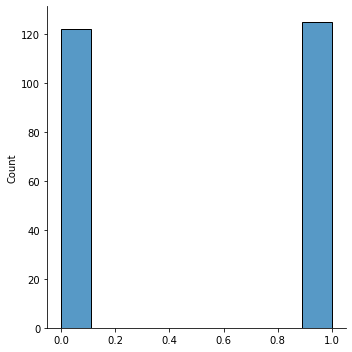

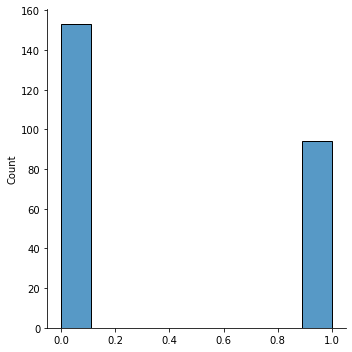

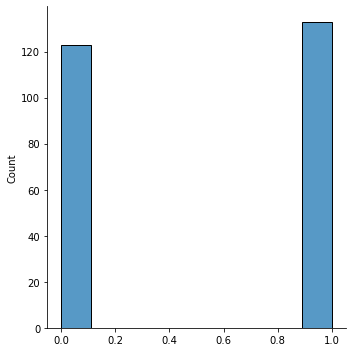

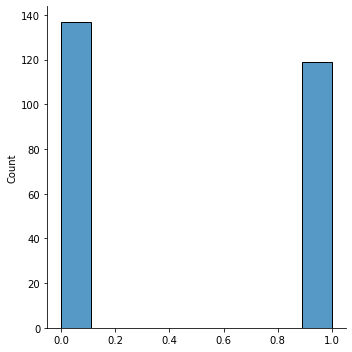

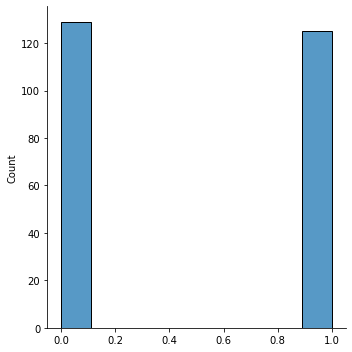

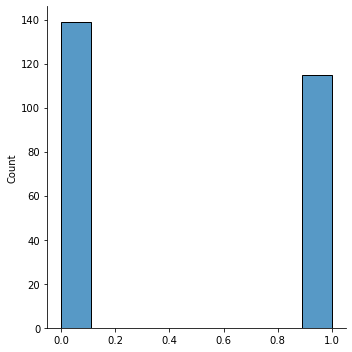

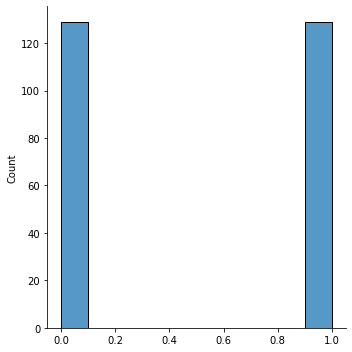

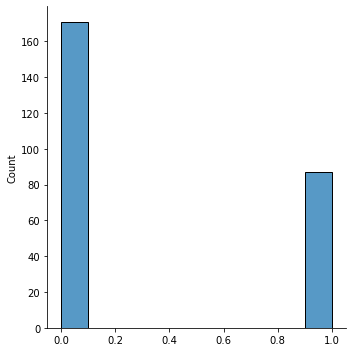

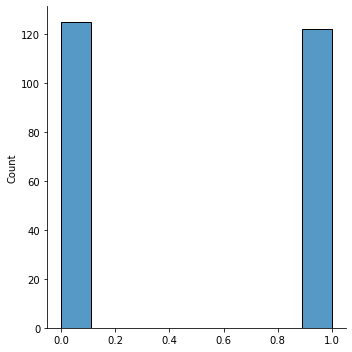

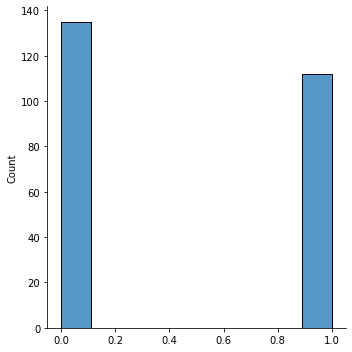

In [19]:
import importlib
from utils import dataset_utils
importlib.reload(dataset_utils)

metrics = pd.DataFrame({"model": [], "AUC": [], "acc": [], "spec": [], "sens": [], "prec": []})
i = 0
"""
folders_list = [
    "fold0_RSNAClassifierSingle3D-DW-SO-KLF-m_Aug18_16-34-18",
    "fold1_RSNAClassifierSingle3D-DW-SO-KLF-m_Aug18_16-49-14",
    "fold2_RSNAClassifierSingle3D-DW-SO-KLF-m_Aug18_17-01-12",
    "fold3_RSNAClassifierSingle3D-DW-SO-KLF-m_Aug18_17-13-33",
    "fold4_RSNAClassifierSingle3D-DW-SO-KLF-m_Aug18_17-54-33"
]
"""
"""
folders_list = [
    "fold0_RSNAClassifierSingle3D-DW-SO-KLF-n_Aug19_14-11-53",
    "fold1_RSNAClassifierSingle3D-DW-SO-KLF-n_Aug19_14-43-40",
    "fold2_RSNAClassifierSingle3D-DW-SO-KLF-n_Aug19_15-16-05",
    "fold3_RSNAClassifierSingle3D-DW-SO-KLF-n_Aug19_15-48-34",
    "fold4_RSNAClassifierSingle3D-DW-SO-KLF-n_Aug19_16-20-47"
]
"""
folders_list = [
    "fold0_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_13-42-35",
    "fold1_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_15-38-50",
    "fold2_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_17-37-56",
    "fold3_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_19-36-30",
    "fold4_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug20_21-33-35"
]
y_all = []
y_pred_all = []
y_prob_all = []

for folder in folders_list:
    model_common_path = "../RSNA-BTC-Datasets/out_models/"
    model_folder = model_common_path + folder

    model_basefile, info = get_best_model(model_folder)
    m_modelfile = model_folder + "/" + model_basefile
    transform = None
    size = len(info["mri_types"])
    sel_slices = 1 if info["dims"] == 2 else None
    chosen_net = "alt" if info["dims"] == 2 else "sim"
    
    m_model = try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])

    #m_modelfile = m_modelfile_3d
    print(m_modelfile)
    print(info)
    print(f"-- FOLD N:{i}")
    to = "mn"#info["train_origin"]
    print(f"Train origin: {to}")
    packs = dataset_utils.generate_datasets(['KLF'], info, transform, sel_slices, m_path=dir_path, n_path=new_dir_path) #m_path=dir_path, n_path=new_dir_path
    print(packs)
    loader_packs = dataset_utils.get_loaders(packs, info, is_fold=True, fold_num=i)
    print(loader_packs)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    logging.info("Using CUDA...")

    pd.set_option("display.max_rows", None, "display.max_columns", None)
    #print(loader_packs['KLF']['m_dataloaders'])
    selected_type = info["mri_types"][0]
    print(selected_type)
    dataloader = loader_packs[selected_type][f"{to}_dataloaders"]#m_dataloaders[0]
    val_loader = dataloader[1]
    #val_loader = dataloader[2] #full
    
    print("\nPREDICTIONS:")
    print(folder)
    #print(f"Test set: {to} (B)")
    test_loader = val_loader
    m_test_pred, ids, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, test_loader, size)
    #del m_model
    #del loader_packs
    #del dataloader
    #del val_loader
    #del test_loader
    torch.cuda.empty_cache()
    pd_metrics = get_metrics(y, y_pred, y_prob, f"{folder}_AB")
    y_all = y_all + y
    y_pred_all = y_pred_all + y_pred
    y_prob_all = y_prob_all + y_prob
        
    preddfA = pd.DataFrame({"BraTS21ID": ids, "MGMT_real_value": y, "MGMT_pred_value": y_pred, "MGMT_prob_value": y_prob}) 
    preddfA = preddfA.sort_values(by="BraTS21ID")
    preddfA.to_csv(f"pred_metrics/{folder}_AB.csv", index=False)
    metrics = metrics.append(pd_metrics, ignore_index=True)
    #pd_metrics.to_csv(f"pred_metrics/{folder}_{to}_A_metrics.csv", index=False)
    
    print("----------\n")
    
    i += 1

pd_metrics = get_metrics(y_all, y_pred_all, y_prob_all, f"all_AB")
metrics = metrics.append(pd_metrics, ignore_index=True)
metrics.to_csv(f"pred_metrics/all_metrics_fold_3d_AB.csv", index=False)
    
    

In [20]:
metrics

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug2...,0.558393,0.550607,0.672131,0.432000,0.574468
1,fold1_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug2...,0.596827,0.578125,0.617886,0.541353,0.605042
2,fold2_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug2...,0.609147,0.598425,0.643411,0.552000,0.600000
3,fold3_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug2...,0.504297,0.519380,0.682171,0.356589,0.528736
4,fold4_RSNAClassifierSingle3D-DW-SO-KLF-mn_Aug2...,0.565508,0.595142,0.640000,0.549180,0.598214
5,all_AB,0.575894,0.568146,0.651274,0.485804,0.584440
